#  <span style="color:SeaGreen"> Part 3 :</span><span style="color:DarkSlateBlue"> Football Transfer Market Data ML Modelling </span>


### This notebook focuses on implementing Machine Learning Algorithms for evaluating football player transfer market vlaues. Various train:test splits, evaluation, validation and hyperparameter tuning techniques are leveraged in optimising each model

#### <span style="color:Teal"> Importing Dependencies</span>

In [168]:
# Visualization Libraries
import matplotlib
%matplotlib inline 
import matplotlib.pyplot as plt
import seaborn as sns
import mglearn

#Preprocessing Libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score, cross_validate
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, confusion_matrix, classification_report

# ML Libraries
from sklearn.linear_model import LinearRegression
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

from pycaret.regression import *
import lightgbm
from catboost import CatBoostRegressor


# Evaluation Metrics
from sklearn import metrics
from yellowbrick.features import Rank2D, FeatureImportances
from yellowbrick.regressor import PredictionError, ResidualsPlot
import shap
import warnings
warnings.filterwarnings('ignore') # We can suppress the warnings

pd.set_option('display.max_row', None)
pd.set_option('display.max_columns', None)

In [ ]:
#pip install --user pycaret

In [ ]:
# pip install --upgrade dask pandas lightgbm

In [ ]:
# pip install xgboost

In [ ]:
#pip install catboost 

# <span style="color:Tomato"> Second Iteration</span>

We will leverage pycarot to quickly and effficiently compare as many as 24 different regression models including Multi Layer Perceptrons (MLPs), on each unique data set following preprocessing. All the results below have been cross validated with 10 folds and are displayed in order of best scores for the same regressions metrics as previous iterations, with R2 score being of highest priority. 

#### <span style="color:Teal">Function for Evaluating Model Results</span>

In [113]:
# Method to calculate the cross-validation scores and additional metrics
def get_cv_scores(model):
    # Cross-validation scores
    scores = cross_val_score(model, X_train, y_train, cv=10, scoring='r2')
    
    # Additional metrics
    y_pred = model.predict(X_train)
    mae = mean_absolute_error(y_train, y_pred)
    mse = mean_squared_error(y_train, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_train, y_pred)
    
    # Display cross-validation scores
    print('CV Mean R²: ', np.mean(scores))
    print('CV STD: ', np.std(scores))
    
    # Display additional metrics
    print('Mean Absolute Error (MAE): ', mae)
    print('Mean Squared Error (MSE): ', mse)
    print('Root Mean Squared Error (RMSE): ', rmse)
    print('R-squared (R²): ', r2)
    print('\n')

#  <span style="color:SeaGreen"> Mean Imputed Dataset:</span><span style="color:DarkSlateBlue"> One-Hot Label Encoded</span>

#### <span style="color:Teal">Loading in Data</span>

In [2]:
dummies_mean_df_train = pd.read_csv('dummies_mean_df_train.csv')
dummies_mean_df_test = pd.read_csv('dummies_mean_df_test.csv')

#### <span style="color:Teal">Confirming Load</span>

In [3]:
print(dummies_mean_df_train.shape, dummies_mean_df_test.shape)

(8133, 371) (2034, 371)


### <span style="color:YellowGreen">Selecting the Best Base Model for Optimising</span>

#### <span style="color:Teal">Model Comparison Setup</span>

In [4]:
# Initiating pycaret model comparison setup
regression1 = setup(dummies_mean_df_train, target = 'market_value_in_eur', session_id = 1)

,Description,Value
0,Session id,1
1,Target,market_value_in_eur
2,Target type,Regression
3,Original data shape,"(8133, 371)"
4,Transformed data shape,"(8133, 371)"
5,Transformed train set shape,"(5693, 371)"
6,Transformed test set shape,"(2440, 371)"
7,Numeric features,370
8,Preprocess,True
9,Imputation type,simple


#### <span style="color:Teal">Comparing Baseline Models</span>

In [6]:
best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,1947043.4173,25487779312394.1172,4980984.0121,0.7556,1.0709,1.6762,2.2000
et,Extra Trees Regressor,1939754.8315,28248435586192.2695,5232158.2777,0.7314,0.9261,1.3758,4.3530
gbr,Gradient Boosting Regressor,2187923.6019,28569724725207.2734,5292083.2006,0.7236,1.1462,2.1781,0.7660
xgboost,Extreme Gradient Boosting,2094048.8250,29458916861542.3984,5363174.1750,0.7160,1.0852,1.6751,0.2750
rf,Random Forest Regressor,2084173.5548,31074572692853.1016,5516055.3376,0.6987,0.9649,1.5101,4.0780
lightgbm,Light Gradient Boosting Machine,2142740.2735,31969011414922.2266,5592479.2205,0.6906,1.0731,1.7760,0.2080
br,Bayesian Ridge,3556385.5739,41991066730875.9609,6434656.5922,0.5890,1.7285,6.6342,0.1960
ridge,Ridge Regression,3602210.4118,41874433163688.8359,6430653.6934,0.5883,1.7473,6.8759,0.0670
lasso,Lasso Regression,3619477.3392,42029532094238.4922,6444206.3591,0.5861,1.7572,6.9427,0.8820
lr,Linear Regression,3618929.3195,42031929030501.5469,6444384.3010,0.5860,1.7597,6.9409,0.7100


In [71]:
models()

,Name,Reference,Turbo
ID,,,
lr,Linear Regression,sklearn.linear_model._base.LinearRegression,True
lasso,Lasso Regression,sklearn.linear_model._coordinate_descent.Lasso,True
ridge,Ridge Regression,sklearn.linear_model._ridge.Ridge,True
en,Elastic Net,sklearn.linear_model._coordinate_descent.Elast...,True
lar,Least Angle Regression,sklearn.linear_model._least_angle.Lars,True
llar,Lasso Least Angle Regression,sklearn.linear_model._least_angle.LassoLars,True
omp,Orthogonal Matching Pursuit,sklearn.linear_model._omp.OrthogonalMatchingPu...,True
br,Bayesian Ridge,sklearn.linear_model._bayes.BayesianRidge,True
ard,Automatic Relevance Determination,sklearn.linear_model._bayes.ARDRegression,False


In [8]:
compare_additional_models = compare_models(include = [ 'svm', 'catboost', 'kr', 'ard', 'tr', 'mlp'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,1947043.4173,25487779312394.1172,4980984.0121,0.7556,1.0709,1.6762,2.1540
kr,Kernel Ridge,3601725.8580,41871985324253.4609,6430409.9296,0.5883,1.7445,6.8716,0.6730
tr,TheilSen Regressor,3265081.4395,42608871567491.6641,6468979.9701,0.5877,1.6136,5.5366,104.3020
ard,Automatic Relevance Determination,3880939.0919,59132635353565.5781,7639488.2824,0.4207,1.6207,5.3700,19.1430
mlp,MLP Regressor,4097811.8031,71943849733462.0312,8395171.8867,0.3091,1.6784,5.3051,12.3920
svm,Support Vector Regression,3672449.0745,114141031564731.0781,10591581.0601,-0.1029,1.6521,2.1075,2.6380


#  <span style="color:SeaGreen"> Mean Imputed Dataset:</span><span style="color:DarkSlateBlue"> One-Hot Label Encoded and MinMax Scaled</span>

#### <span style="color:Teal">Loading in Data</span>

In [2]:
minmax_dummies_mean_df_train = pd.read_csv('minmax_dummies_mean_df_train.csv')
minmax_dummies_mean_df_test = pd.read_csv('minmax_dummies_mean_df_test.csv')

#### <span style="color:Teal">Confirming Load</span>

In [3]:
print(minmax_dummies_mean_df_train.shape, minmax_dummies_mean_df_test.shape)

(8133, 371) (2034, 371)


### <span style="color:YellowGreen">Selecting the Best Base Model for Optimising</span>

#### <span style="color:Teal">Model Comparison Setup</span>

In [4]:
regression2 = setup(minmax_dummies_mean_df_train, target = 'market_value_in_eur', session_id = 2)

,Description,Value
0,Session id,2
1,Target,market_value_in_eur
2,Target type,Regression
3,Original data shape,"(8133, 371)"
4,Transformed data shape,"(8133, 371)"
5,Transformed train set shape,"(5693, 371)"
6,Transformed test set shape,"(2440, 371)"
7,Numeric features,370
8,Preprocess,True
9,Imputation type,simple


#### <span style="color:Teal">Comparing Baseline Models</span>

In [5]:
best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,0.0108,0.0008,0.0272,0.7537,0.0222,1.7792,2.3530
gbr,Gradient Boosting Regressor,0.0120,0.0009,0.0292,0.7142,0.0243,2.3329,0.7490
et,Extra Trees Regressor,0.0110,0.0009,0.0297,0.7110,0.0241,1.4974,5.1890
lightgbm,Light Gradient Boosting Machine,0.0117,0.0009,0.0299,0.6941,0.0247,1.9849,0.1560
xgboost,Extreme Gradient Boosting,0.0119,0.0010,0.0309,0.6786,0.0255,1.8119,0.2300
rf,Random Forest Regressor,0.0119,0.0010,0.0314,0.6702,0.0258,1.6375,4.3940
knn,K Neighbors Regressor,0.0140,0.0014,0.0363,0.5581,0.0303,2.1998,0.0890
br,Bayesian Ridge,0.0197,0.0013,0.0362,0.5511,0.0299,7.2995,0.0790
ridge,Ridge Regression,0.0200,0.0013,0.0363,0.5452,0.0301,7.5726,0.0630
lr,Linear Regression,0.0211,0.0014,0.0368,0.5288,0.0307,8.3817,0.7170


In [6]:
compare_additional_models = compare_models(include = [ 'svm', 'catboost', 'kr', 'ard', 'mlp'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,0.0108,0.0008,0.0272,0.7537,0.0222,1.7792,2.3380
kr,Kernel Ridge,0.0200,0.0013,0.0363,0.5453,0.0301,7.5726,0.3450
ard,Automatic Relevance Determination,0.0200,0.0014,0.0369,0.5279,0.0308,6.8486,0.0840
mlp,MLP Regressor,0.0283,0.0016,0.0398,0.4268,0.0340,13.1411,0.2830
svm,Support Vector Regression,0.0478,0.0032,0.0564,-0.1864,0.0521,31.8742,0.1470


#  <span style="color:SeaGreen"> Mean Imputed Dataset:</span><span style="color:DarkSlateBlue"> One-Hot Label Encoded and Robust Scaled</span>

#### <span style="color:Teal">Loading in Data</span>

In [7]:
robust_dummies_mean_df_train = pd.read_csv('robust_dummies_mean_df_train.csv')
robust_dummies_mean_df_test = pd.read_csv('robust_dummies_mean_df_test.csv')

#### <span style="color:Teal">Confirming Load</span>

In [8]:
print(robust_dummies_mean_df_train.shape, robust_dummies_mean_df_test.shape)

(8133, 371) (2034, 371)


### <span style="color:YellowGreen">Selecting the Best Base Model for Optimising</span>

#### <span style="color:Teal">Model Comparison Setup</span>

In [9]:
regression3 = setup(robust_dummies_mean_df_train, target = 'market_value_in_eur', session_id = 3)

,Description,Value
0,Session id,3
1,Target,market_value_in_eur
2,Target type,Regression
3,Original data shape,"(8133, 371)"
4,Transformed data shape,"(8133, 371)"
5,Transformed train set shape,"(5693, 371)"
6,Transformed test set shape,"(2440, 371)"
7,Numeric features,370
8,Preprocess,True
9,Imputation type,simple


#### <span style="color:Teal">Comparing Baseline Models</span>

In [10]:
best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,0.7826,4.3044,2.0560,0.7447,0.3218,1.6419,2.3760
et,Extra Trees Regressor,0.7936,4.7570,2.1546,0.7166,0.3283,1.4834,4.8700
gbr,Gradient Boosting Regressor,0.8776,4.8055,2.1848,0.7017,0.3630,2.0044,0.8210
xgboost,Extreme Gradient Boosting,0.8471,5.0546,2.2409,0.6865,0.3420,1.6854,0.2710
rf,Random Forest Regressor,0.8445,5.1780,2.2565,0.6864,0.3496,1.6493,3.7780
lightgbm,Light Gradient Boosting Machine,0.8530,5.0570,2.2366,0.6827,0.3500,1.6460,0.1580
br,Bayesian Ridge,1.4433,6.9854,2.6269,0.5773,0.5856,5.7620,0.1530
ridge,Ridge Regression,1.4624,7.0096,2.6320,0.5750,0.5922,5.8521,0.0580
omp,Orthogonal Matching Pursuit,1.4940,8.0018,2.8074,0.5201,0.6011,5.9213,0.0580
huber,Huber Regressor,1.1284,10.0337,3.1147,0.4296,0.4227,2.7743,0.9890


In [11]:
compare_additional_models = compare_models(include = [ 'svm', 'catboost', 'kr', 'ard', 'mlp'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
mlp,MLP Regressor,1.0553,3.9519,1.9809,0.7509,0.4384,3.5634,3.3820
catboost,CatBoost Regressor,0.7826,4.3044,2.0560,0.7447,0.3218,1.6419,3.0220
kr,Kernel Ridge,1.4628,7.0059,2.6315,0.5751,0.5924,5.8514,0.4430
ard,Automatic Relevance Determination,1.4179,7.0461,2.6379,0.5739,0.5792,5.6137,10.0030
svm,Support Vector Regression,1.0819,12.5938,3.4808,0.2909,0.4349,1.7032,2.0540


#  <span style="color:SeaGreen"> Median Imputed Dataset:</span><span style="color:DarkSlateBlue"> One-Hot Label Encoded </span>

#### <span style="color:Teal">Loading in Data</span>

In [122]:
dummies_median_df_train = pd.read_csv('dummies_median_df_train.csv')
dummies_median_df_test = pd.read_csv('dummies_median_df_test.csv')

#### <span style="color:Teal">Confirming Load</span>

In [123]:
print(dummies_median_df_train.shape, dummies_median_df_test.shape)

(8133, 371) (2034, 371)


### <span style="color:YellowGreen">Selecting the Best Base Model for Optimising</span>

#### <span style="color:Teal">Model Comparison Setup</span>

In [14]:
regression4 = setup(dummies_median_df_train, target = 'market_value_in_eur', session_id = 4)

,Description,Value
0,Session id,4
1,Target,market_value_in_eur
2,Target type,Regression
3,Original data shape,"(8133, 371)"
4,Transformed data shape,"(8133, 371)"
5,Transformed train set shape,"(5693, 371)"
6,Transformed test set shape,"(2440, 371)"
7,Numeric features,370
8,Preprocess,True
9,Imputation type,simple


#### <span style="color:Teal">Comparing Baseline Models</span>

In [15]:
best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,1845301.1427,24573869038069.1328,4862826.0091,0.7615,1.0372,1.3316,2.1750
et,Extra Trees Regressor,1828057.8146,26582672728110.0703,5076258.9262,0.7402,0.7793,0.9594,4.1810
lightgbm,Light Gradient Boosting Machine,1989476.9527,28664450490479.3633,5299994.7288,0.7129,0.9769,1.2255,0.2260
gbr,Gradient Boosting Regressor,2131322.9408,28975973696938.4062,5326988.4449,0.7127,1.1917,1.8254,0.8200
xgboost,Extreme Gradient Boosting,2034364.0750,29196426726604.8008,5347339.8500,0.7095,1.0835,1.3115,0.2880
rf,Random Forest Regressor,2003867.3364,29786393343646.6680,5402549.9007,0.7039,0.8210,1.0736,3.6710
br,Bayesian Ridge,3493336.9977,39902930632481.4844,6251453.9635,0.6044,1.7376,6.9485,0.1970
ridge,Ridge Regression,3537117.4262,40028781737226.8594,6265306.5579,0.6018,1.7535,7.2087,0.0740
lr,Linear Regression,3559275.6342,40220492072416.4141,6281903.9941,0.5993,1.7760,7.3002,0.0830
lasso,Lasso Regression,3556074.5359,40238508180155.7109,6283133.6699,0.5992,1.7750,7.2911,0.9200


In [9]:
compare_additional_models = compare_models(include = [ 'svm', 'catboost', 'kr', 'ard', 'mlp'])

ValueError: _CURRENT_EXPERIMENT global variable is not set. Please run setup() first.

#  <span style="color:SeaGreen"> Median Imputed Dataset:</span><span style="color:DarkSlateBlue"> One-Hot Label Encoded and MinMax Scaled</span>

#### <span style="color:Teal">Loading in Data</span>

In [3]:
minmax_dummies_median_df_train = pd.read_csv('minmax_dummies_median_df_train.csv')
minmax_dummies_median_df_test = pd.read_csv('minmax_dummies_median_df_test.csv')

#### <span style="color:Teal">Confirming Load</span>

In [4]:
print(minmax_dummies_median_df_train.shape, minmax_dummies_median_df_test.shape)

(8133, 371) (2034, 371)


### <span style="color:YellowGreen">Selecting the Best Base Model for Optimising</span>

#### <span style="color:Teal">Model Comparison Setup</span>

In [32]:
regression5 = setup(minmax_dummies_median_df_train, target = 'market_value_in_eur', session_id = 5)

,Description,Value
0,Session id,5
1,Target,market_value_in_eur
2,Target type,Regression
3,Original data shape,"(8133, 371)"
4,Transformed data shape,"(8133, 371)"
5,Transformed train set shape,"(5693, 371)"
6,Transformed test set shape,"(2440, 371)"
7,Numeric features,370
8,Preprocess,True
9,Imputation type,simple


#### <span style="color:Teal">Comparing Baseline Models</span>

In [33]:
best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,0.0102,0.0007,0.0266,0.7747,0.0217,1.4728,2.1820
et,Extra Trees Regressor,0.0104,0.0008,0.0285,0.7410,0.0233,1.0434,3.8140
gbr,Gradient Boosting Regressor,0.0116,0.0009,0.0290,0.7322,0.0241,1.9577,0.9160
lightgbm,Light Gradient Boosting Machine,0.0111,0.0009,0.0290,0.7311,0.0240,1.4130,0.1760
xgboost,Extreme Gradient Boosting,0.0113,0.0009,0.0303,0.7091,0.0249,1.3746,0.2750
rf,Random Forest Regressor,0.0113,0.0010,0.0308,0.6986,0.0253,1.1704,3.4110
br,Bayesian Ridge,0.0197,0.0013,0.0356,0.5951,0.0296,8.2570,0.0800
ridge,Ridge Regression,0.0201,0.0013,0.0357,0.5903,0.0298,8.5562,0.0540
knn,K Neighbors Regressor,0.0136,0.0014,0.0369,0.5654,0.0306,1.8423,0.0930
omp,Orthogonal Matching Pursuit,0.0200,0.0014,0.0371,0.5584,0.0311,7.8874,0.0610


In [37]:
print(best)

In [21]:
compare_additional_models = compare_models(include = [ 'svm', 'catboost', 'kr', 'ard', 'mlp'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,0.0102,0.0007,0.0266,0.7747,0.0217,1.4728,2.4520
kr,Kernel Ridge,0.0201,0.0013,0.0357,0.5903,0.0298,8.5554,0.3980
ard,Automatic Relevance Determination,0.0200,0.0013,0.0364,0.5746,0.0304,7.6402,0.0960
mlp,MLP Regressor,0.0288,0.0017,0.0409,0.4495,0.0351,15.3348,0.4260
svm,Support Vector Regression,0.0505,0.0034,0.0582,-0.1207,0.0539,36.1264,0.1450


The best baseline model results  have been produced on this dataset and with the CatBoost Regressor Model. We will develop a our own model below and attempt to optimise it.

In [53]:
catboost_model = create_model('catboost')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0114,0.0012,0.0340,0.7669,0.0259,1.6962
1,0.0096,0.0005,0.0219,0.8271,0.0186,1.7039
2,0.0100,0.0005,0.0216,0.7680,0.0195,1.5135
3,0.0105,0.0011,0.0329,0.6863,0.0241,1.4773
4,0.0109,0.0007,0.0272,0.7803,0.0227,1.3737
5,0.0110,0.0009,0.0296,0.7923,0.0239,1.3501
6,0.0106,0.0011,0.0330,0.7097,0.0245,1.3097
7,0.0101,0.0005,0.0232,0.7991,0.0200,1.3545
8,0.0092,0.0005,0.0213,0.8179,0.0186,1.3951


In [54]:
tuned_catboost_model = tune_model(catboost_model)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0125,0.0012,0.0347,0.7574,0.0267,2.0358
1,0.0114,0.0007,0.0255,0.7647,0.0217,2.2133
2,0.0112,0.0005,0.0224,0.7499,0.0203,1.8596
3,0.0120,0.0012,0.0349,0.6477,0.0264,1.8937
4,0.0120,0.0008,0.0276,0.7736,0.0234,1.7995
5,0.0116,0.0009,0.0298,0.7898,0.0243,1.6820
6,0.0114,0.0008,0.0276,0.7966,0.0222,1.7326
7,0.0112,0.0006,0.0245,0.7760,0.0211,1.7734
8,0.0107,0.0005,0.0233,0.7813,0.0204,1.8347


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


## <span style="color:YellowGreen">Manually Developing a CatBoost Regressor Model</span>

#### <span style="color:Teal">Train : Test Split</span>

In [5]:
y_train = minmax_dummies_median_df_train['market_value_in_eur']
X_train = minmax_dummies_median_df_train.drop(['market_value_in_eur'], axis = 1)
y_test = minmax_dummies_median_df_test['market_value_in_eur']
X_test = minmax_dummies_median_df_test.drop(['market_value_in_eur'], axis = 1)

In [6]:
# Show the rows and columns
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((8133, 370), (2034, 370), (8133,), (2034,))

#### <span style="color:Teal">Setting Up Model</span>

In [7]:
# Initialize the CatBoostRegressor with RMSE as the loss function
catBoost_modelA = CatBoostRegressor(loss_function='RMSE')
 
# Fit the model on the training data with verbose logging every 100 iterations
catBoost_modelA.fit(X_train, y_train, verbose=100)

Learning rate set to 0.057016
0:	learn: 0.0541795	total: 161ms	remaining: 2m 40s
100:	learn: 0.0217116	total: 586ms	remaining: 5.22s
200:	learn: 0.0173055	total: 1s	remaining: 3.99s
300:	learn: 0.0149675	total: 1.43s	remaining: 3.32s
400:	learn: 0.0131594	total: 1.85s	remaining: 2.76s
500:	learn: 0.0118611	total: 2.31s	remaining: 2.3s
600:	learn: 0.0108585	total: 2.77s	remaining: 1.84s
700:	learn: 0.0100148	total: 3.21s	remaining: 1.37s
800:	learn: 0.0093225	total: 3.65s	remaining: 907ms
900:	learn: 0.0087527	total: 4.08s	remaining: 449ms
999:	learn: 0.0082973	total: 4.5s	remaining: 0us


#### <span style="color:Teal">Models Results</span>

In [8]:
# Calculate the mean values and Standard deviation
get_cv_scores(catBoost_modelA)

Learning rate set to 0.056074
0:	learn: 0.0535549	total: 4.68ms	remaining: 4.67s
1:	learn: 0.0522722	total: 8.83ms	remaining: 4.4s
2:	learn: 0.0509875	total: 12.8ms	remaining: 4.27s
3:	learn: 0.0497136	total: 17.1ms	remaining: 4.25s
4:	learn: 0.0486122	total: 21.4ms	remaining: 4.26s
5:	learn: 0.0476344	total: 25.6ms	remaining: 4.24s
6:	learn: 0.0466625	total: 29.5ms	remaining: 4.18s
7:	learn: 0.0456793	total: 33.6ms	remaining: 4.17s
8:	learn: 0.0447991	total: 37.7ms	remaining: 4.16s
9:	learn: 0.0439271	total: 41.8ms	remaining: 4.14s
10:	learn: 0.0430594	total: 45.8ms	remaining: 4.12s
11:	learn: 0.0422651	total: 49.7ms	remaining: 4.1s
12:	learn: 0.0413844	total: 54ms	remaining: 4.1s
13:	learn: 0.0406996	total: 58ms	remaining: 4.09s
14:	learn: 0.0399777	total: 62.1ms	remaining: 4.08s
15:	learn: 0.0392978	total: 66.5ms	remaining: 4.09s
16:	learn: 0.0385781	total: 70.6ms	remaining: 4.08s
17:	learn: 0.0379170	total: 74.5ms	remaining: 4.07s
18:	learn: 0.0372580	total: 78.5ms	remaining: 4.05s

174:	learn: 0.0180000	total: 803ms	remaining: 3.79s
175:	learn: 0.0179518	total: 807ms	remaining: 3.78s
176:	learn: 0.0179200	total: 811ms	remaining: 3.77s
177:	learn: 0.0178720	total: 815ms	remaining: 3.77s
178:	learn: 0.0178357	total: 820ms	remaining: 3.76s
179:	learn: 0.0178096	total: 824ms	remaining: 3.75s
180:	learn: 0.0177839	total: 828ms	remaining: 3.75s
181:	learn: 0.0177271	total: 832ms	remaining: 3.74s
182:	learn: 0.0176944	total: 836ms	remaining: 3.73s
183:	learn: 0.0176343	total: 840ms	remaining: 3.73s
184:	learn: 0.0176117	total: 844ms	remaining: 3.72s
185:	learn: 0.0175530	total: 849ms	remaining: 3.71s
186:	learn: 0.0175082	total: 853ms	remaining: 3.71s
187:	learn: 0.0174744	total: 857ms	remaining: 3.7s
188:	learn: 0.0174247	total: 861ms	remaining: 3.69s
189:	learn: 0.0173670	total: 865ms	remaining: 3.69s
190:	learn: 0.0173125	total: 869ms	remaining: 3.68s
191:	learn: 0.0172619	total: 873ms	remaining: 3.67s
192:	learn: 0.0172312	total: 878ms	remaining: 3.67s
193:	learn: 0

357:	learn: 0.0132887	total: 1.63s	remaining: 2.92s
358:	learn: 0.0132577	total: 1.63s	remaining: 2.92s
359:	learn: 0.0132339	total: 1.64s	remaining: 2.91s
360:	learn: 0.0132242	total: 1.64s	remaining: 2.91s
361:	learn: 0.0132128	total: 1.65s	remaining: 2.9s
362:	learn: 0.0131900	total: 1.65s	remaining: 2.9s
363:	learn: 0.0131725	total: 1.66s	remaining: 2.9s
364:	learn: 0.0131456	total: 1.66s	remaining: 2.89s
365:	learn: 0.0131267	total: 1.67s	remaining: 2.89s
366:	learn: 0.0131043	total: 1.67s	remaining: 2.88s
367:	learn: 0.0130937	total: 1.68s	remaining: 2.88s
368:	learn: 0.0130680	total: 1.68s	remaining: 2.87s
369:	learn: 0.0130561	total: 1.68s	remaining: 2.87s
370:	learn: 0.0130451	total: 1.69s	remaining: 2.86s
371:	learn: 0.0130335	total: 1.69s	remaining: 2.86s
372:	learn: 0.0130178	total: 1.7s	remaining: 2.85s
373:	learn: 0.0129919	total: 1.7s	remaining: 2.85s
374:	learn: 0.0129708	total: 1.71s	remaining: 2.84s
375:	learn: 0.0129610	total: 1.71s	remaining: 2.84s
376:	learn: 0.012

544:	learn: 0.0108485	total: 2.45s	remaining: 2.04s
545:	learn: 0.0108425	total: 2.45s	remaining: 2.04s
546:	learn: 0.0108324	total: 2.46s	remaining: 2.04s
547:	learn: 0.0108210	total: 2.46s	remaining: 2.03s
548:	learn: 0.0108118	total: 2.47s	remaining: 2.03s
549:	learn: 0.0108049	total: 2.47s	remaining: 2.02s
550:	learn: 0.0107971	total: 2.48s	remaining: 2.02s
551:	learn: 0.0107862	total: 2.48s	remaining: 2.01s
552:	learn: 0.0107755	total: 2.48s	remaining: 2.01s
553:	learn: 0.0107686	total: 2.49s	remaining: 2s
554:	learn: 0.0107611	total: 2.49s	remaining: 2s
555:	learn: 0.0107499	total: 2.5s	remaining: 2s
556:	learn: 0.0107421	total: 2.5s	remaining: 1.99s
557:	learn: 0.0107343	total: 2.51s	remaining: 1.99s
558:	learn: 0.0107295	total: 2.51s	remaining: 1.98s
559:	learn: 0.0107202	total: 2.52s	remaining: 1.98s
560:	learn: 0.0107113	total: 2.52s	remaining: 1.97s
561:	learn: 0.0107060	total: 2.52s	remaining: 1.97s
562:	learn: 0.0107014	total: 2.53s	remaining: 1.96s
563:	learn: 0.0106913	t

748:	learn: 0.0093305	total: 3.27s	remaining: 1.09s
749:	learn: 0.0093273	total: 3.27s	remaining: 1.09s
750:	learn: 0.0093220	total: 3.27s	remaining: 1.08s
751:	learn: 0.0093170	total: 3.28s	remaining: 1.08s
752:	learn: 0.0093075	total: 3.28s	remaining: 1.08s
753:	learn: 0.0093023	total: 3.29s	remaining: 1.07s
754:	learn: 0.0092980	total: 3.29s	remaining: 1.07s
755:	learn: 0.0092928	total: 3.29s	remaining: 1.06s
756:	learn: 0.0092893	total: 3.3s	remaining: 1.06s
757:	learn: 0.0092847	total: 3.3s	remaining: 1.05s
758:	learn: 0.0092777	total: 3.31s	remaining: 1.05s
759:	learn: 0.0092698	total: 3.31s	remaining: 1.04s
760:	learn: 0.0092660	total: 3.32s	remaining: 1.04s
761:	learn: 0.0092573	total: 3.32s	remaining: 1.04s
762:	learn: 0.0092534	total: 3.32s	remaining: 1.03s
763:	learn: 0.0092486	total: 3.33s	remaining: 1.03s
764:	learn: 0.0092458	total: 3.33s	remaining: 1.02s
765:	learn: 0.0092388	total: 3.34s	remaining: 1.02s
766:	learn: 0.0092343	total: 3.34s	remaining: 1.01s
767:	learn: 0.

942:	learn: 0.0082369	total: 4.05s	remaining: 245ms
943:	learn: 0.0082309	total: 4.05s	remaining: 241ms
944:	learn: 0.0082268	total: 4.06s	remaining: 236ms
945:	learn: 0.0082238	total: 4.06s	remaining: 232ms
946:	learn: 0.0082195	total: 4.07s	remaining: 228ms
947:	learn: 0.0082176	total: 4.07s	remaining: 223ms
948:	learn: 0.0082136	total: 4.08s	remaining: 219ms
949:	learn: 0.0082089	total: 4.08s	remaining: 215ms
950:	learn: 0.0082020	total: 4.08s	remaining: 210ms
951:	learn: 0.0081951	total: 4.09s	remaining: 206ms
952:	learn: 0.0081906	total: 4.09s	remaining: 202ms
953:	learn: 0.0081870	total: 4.09s	remaining: 197ms
954:	learn: 0.0081800	total: 4.1s	remaining: 193ms
955:	learn: 0.0081712	total: 4.1s	remaining: 189ms
956:	learn: 0.0081672	total: 4.11s	remaining: 184ms
957:	learn: 0.0081587	total: 4.11s	remaining: 180ms
958:	learn: 0.0081528	total: 4.11s	remaining: 176ms
959:	learn: 0.0081447	total: 4.12s	remaining: 172ms
960:	learn: 0.0081410	total: 4.12s	remaining: 167ms
961:	learn: 0.

118:	learn: 0.0215735	total: 457ms	remaining: 3.38s
119:	learn: 0.0214902	total: 461ms	remaining: 3.38s
120:	learn: 0.0214304	total: 465ms	remaining: 3.38s
121:	learn: 0.0213857	total: 469ms	remaining: 3.38s
122:	learn: 0.0213243	total: 474ms	remaining: 3.38s
123:	learn: 0.0213116	total: 477ms	remaining: 3.37s
124:	learn: 0.0212289	total: 482ms	remaining: 3.37s
125:	learn: 0.0211877	total: 486ms	remaining: 3.37s
126:	learn: 0.0211434	total: 490ms	remaining: 3.37s
127:	learn: 0.0211130	total: 494ms	remaining: 3.37s
128:	learn: 0.0210696	total: 498ms	remaining: 3.36s
129:	learn: 0.0209923	total: 502ms	remaining: 3.36s
130:	learn: 0.0209527	total: 507ms	remaining: 3.36s
131:	learn: 0.0208581	total: 511ms	remaining: 3.36s
132:	learn: 0.0208066	total: 515ms	remaining: 3.35s
133:	learn: 0.0207799	total: 519ms	remaining: 3.35s
134:	learn: 0.0207701	total: 523ms	remaining: 3.35s
135:	learn: 0.0207619	total: 526ms	remaining: 3.34s
136:	learn: 0.0207317	total: 530ms	remaining: 3.33s
137:	learn: 

320:	learn: 0.0146010	total: 1.25s	remaining: 2.63s
321:	learn: 0.0145890	total: 1.25s	remaining: 2.63s
322:	learn: 0.0145636	total: 1.26s	remaining: 2.65s
323:	learn: 0.0145431	total: 1.27s	remaining: 2.64s
324:	learn: 0.0145320	total: 1.27s	remaining: 2.64s
325:	learn: 0.0145141	total: 1.27s	remaining: 2.63s
326:	learn: 0.0145118	total: 1.28s	remaining: 2.63s
327:	learn: 0.0145008	total: 1.28s	remaining: 2.63s
328:	learn: 0.0144652	total: 1.29s	remaining: 2.63s
329:	learn: 0.0144522	total: 1.29s	remaining: 2.62s
330:	learn: 0.0144182	total: 1.3s	remaining: 2.62s
331:	learn: 0.0144089	total: 1.3s	remaining: 2.62s
332:	learn: 0.0143916	total: 1.3s	remaining: 2.61s
333:	learn: 0.0143703	total: 1.31s	remaining: 2.61s
334:	learn: 0.0143480	total: 1.31s	remaining: 2.61s
335:	learn: 0.0143276	total: 1.32s	remaining: 2.6s
336:	learn: 0.0143160	total: 1.32s	remaining: 2.6s
337:	learn: 0.0142880	total: 1.32s	remaining: 2.6s
338:	learn: 0.0142737	total: 1.33s	remaining: 2.59s
339:	learn: 0.0142

515:	learn: 0.0117268	total: 2.04s	remaining: 1.92s
516:	learn: 0.0117169	total: 2.05s	remaining: 1.91s
517:	learn: 0.0117032	total: 2.05s	remaining: 1.91s
518:	learn: 0.0116944	total: 2.06s	remaining: 1.91s
519:	learn: 0.0116852	total: 2.06s	remaining: 1.9s
520:	learn: 0.0116654	total: 2.06s	remaining: 1.9s
521:	learn: 0.0116558	total: 2.07s	remaining: 1.89s
522:	learn: 0.0116480	total: 2.07s	remaining: 1.89s
523:	learn: 0.0116405	total: 2.08s	remaining: 1.89s
524:	learn: 0.0116203	total: 2.08s	remaining: 1.88s
525:	learn: 0.0116192	total: 2.09s	remaining: 1.88s
526:	learn: 0.0116069	total: 2.09s	remaining: 1.88s
527:	learn: 0.0116011	total: 2.1s	remaining: 1.87s
528:	learn: 0.0115928	total: 2.1s	remaining: 1.87s
529:	learn: 0.0115811	total: 2.1s	remaining: 1.87s
530:	learn: 0.0115730	total: 2.11s	remaining: 1.86s
531:	learn: 0.0115619	total: 2.11s	remaining: 1.86s
532:	learn: 0.0115458	total: 2.12s	remaining: 1.85s
533:	learn: 0.0115339	total: 2.12s	remaining: 1.85s
534:	learn: 0.011

710:	learn: 0.0098754	total: 2.84s	remaining: 1.15s
711:	learn: 0.0098719	total: 2.84s	remaining: 1.15s
712:	learn: 0.0098659	total: 2.85s	remaining: 1.15s
713:	learn: 0.0098571	total: 2.85s	remaining: 1.14s
714:	learn: 0.0098454	total: 2.85s	remaining: 1.14s
715:	learn: 0.0098386	total: 2.86s	remaining: 1.13s
716:	learn: 0.0098285	total: 2.86s	remaining: 1.13s
717:	learn: 0.0098213	total: 2.87s	remaining: 1.13s
718:	learn: 0.0098135	total: 2.87s	remaining: 1.12s
719:	learn: 0.0098047	total: 2.88s	remaining: 1.12s
720:	learn: 0.0097929	total: 2.88s	remaining: 1.11s
721:	learn: 0.0097827	total: 2.89s	remaining: 1.11s
722:	learn: 0.0097775	total: 2.89s	remaining: 1.11s
723:	learn: 0.0097710	total: 2.9s	remaining: 1.1s
724:	learn: 0.0097626	total: 2.9s	remaining: 1.1s
725:	learn: 0.0097568	total: 2.9s	remaining: 1.1s
726:	learn: 0.0097502	total: 2.91s	remaining: 1.09s
727:	learn: 0.0097431	total: 2.91s	remaining: 1.09s
728:	learn: 0.0097375	total: 2.92s	remaining: 1.08s
729:	learn: 0.0097

903:	learn: 0.0085873	total: 3.63s	remaining: 386ms
904:	learn: 0.0085800	total: 3.64s	remaining: 382ms
905:	learn: 0.0085745	total: 3.64s	remaining: 378ms
906:	learn: 0.0085709	total: 3.64s	remaining: 374ms
907:	learn: 0.0085645	total: 3.65s	remaining: 370ms
908:	learn: 0.0085581	total: 3.65s	remaining: 366ms
909:	learn: 0.0085530	total: 3.66s	remaining: 362ms
910:	learn: 0.0085454	total: 3.66s	remaining: 358ms
911:	learn: 0.0085411	total: 3.66s	remaining: 354ms
912:	learn: 0.0085359	total: 3.67s	remaining: 349ms
913:	learn: 0.0085306	total: 3.67s	remaining: 345ms
914:	learn: 0.0085247	total: 3.67s	remaining: 341ms
915:	learn: 0.0085226	total: 3.68s	remaining: 337ms
916:	learn: 0.0085164	total: 3.68s	remaining: 333ms
917:	learn: 0.0085084	total: 3.69s	remaining: 329ms
918:	learn: 0.0085039	total: 3.69s	remaining: 325ms
919:	learn: 0.0084971	total: 3.69s	remaining: 321ms
920:	learn: 0.0084912	total: 3.7s	remaining: 317ms
921:	learn: 0.0084854	total: 3.7s	remaining: 313ms
922:	learn: 0.

97:	learn: 0.0216429	total: 390ms	remaining: 3.58s
98:	learn: 0.0215929	total: 394ms	remaining: 3.58s
99:	learn: 0.0215032	total: 398ms	remaining: 3.58s
100:	learn: 0.0214309	total: 403ms	remaining: 3.58s
101:	learn: 0.0213820	total: 407ms	remaining: 3.58s
102:	learn: 0.0213125	total: 412ms	remaining: 3.58s
103:	learn: 0.0212780	total: 416ms	remaining: 3.58s
104:	learn: 0.0211974	total: 421ms	remaining: 3.58s
105:	learn: 0.0211232	total: 425ms	remaining: 3.58s
106:	learn: 0.0210714	total: 430ms	remaining: 3.59s
107:	learn: 0.0209914	total: 434ms	remaining: 3.59s
108:	learn: 0.0209586	total: 439ms	remaining: 3.58s
109:	learn: 0.0209170	total: 443ms	remaining: 3.58s
110:	learn: 0.0208640	total: 448ms	remaining: 3.58s
111:	learn: 0.0208330	total: 452ms	remaining: 3.58s
112:	learn: 0.0207589	total: 456ms	remaining: 3.58s
113:	learn: 0.0206867	total: 461ms	remaining: 3.58s
114:	learn: 0.0206414	total: 465ms	remaining: 3.58s
115:	learn: 0.0205866	total: 469ms	remaining: 3.57s
116:	learn: 0.0

286:	learn: 0.0144431	total: 1.17s	remaining: 2.91s
287:	learn: 0.0144290	total: 1.18s	remaining: 2.91s
288:	learn: 0.0144137	total: 1.18s	remaining: 2.9s
289:	learn: 0.0143926	total: 1.18s	remaining: 2.9s
290:	learn: 0.0143634	total: 1.19s	remaining: 2.9s
291:	learn: 0.0143505	total: 1.19s	remaining: 2.89s
292:	learn: 0.0143302	total: 1.2s	remaining: 2.89s
293:	learn: 0.0143115	total: 1.2s	remaining: 2.88s
294:	learn: 0.0142904	total: 1.21s	remaining: 2.88s
295:	learn: 0.0142727	total: 1.21s	remaining: 2.88s
296:	learn: 0.0142547	total: 1.22s	remaining: 2.88s
297:	learn: 0.0142414	total: 1.22s	remaining: 2.87s
298:	learn: 0.0142144	total: 1.22s	remaining: 2.87s
299:	learn: 0.0141875	total: 1.23s	remaining: 2.87s
300:	learn: 0.0141647	total: 1.23s	remaining: 2.86s
301:	learn: 0.0141434	total: 1.24s	remaining: 2.86s
302:	learn: 0.0141304	total: 1.24s	remaining: 2.86s
303:	learn: 0.0140970	total: 1.25s	remaining: 2.85s
304:	learn: 0.0140800	total: 1.25s	remaining: 2.85s
305:	learn: 0.014

475:	learn: 0.0115420	total: 1.95s	remaining: 2.15s
476:	learn: 0.0115316	total: 1.96s	remaining: 2.15s
477:	learn: 0.0115209	total: 1.96s	remaining: 2.14s
478:	learn: 0.0115022	total: 1.96s	remaining: 2.14s
479:	learn: 0.0114900	total: 1.97s	remaining: 2.13s
480:	learn: 0.0114829	total: 1.97s	remaining: 2.13s
481:	learn: 0.0114675	total: 1.98s	remaining: 2.12s
482:	learn: 0.0114536	total: 1.98s	remaining: 2.12s
483:	learn: 0.0114468	total: 1.98s	remaining: 2.12s
484:	learn: 0.0114392	total: 1.99s	remaining: 2.11s
485:	learn: 0.0114297	total: 1.99s	remaining: 2.11s
486:	learn: 0.0114222	total: 2s	remaining: 2.1s
487:	learn: 0.0114115	total: 2s	remaining: 2.1s
488:	learn: 0.0114047	total: 2s	remaining: 2.1s
489:	learn: 0.0113873	total: 2.01s	remaining: 2.09s
490:	learn: 0.0113784	total: 2.01s	remaining: 2.09s
491:	learn: 0.0113677	total: 2.02s	remaining: 2.08s
492:	learn: 0.0113581	total: 2.02s	remaining: 2.08s
493:	learn: 0.0113437	total: 2.03s	remaining: 2.08s
494:	learn: 0.0113284	to

676:	learn: 0.0096397	total: 2.77s	remaining: 1.32s
677:	learn: 0.0096309	total: 2.77s	remaining: 1.32s
678:	learn: 0.0096217	total: 2.78s	remaining: 1.31s
679:	learn: 0.0096126	total: 2.78s	remaining: 1.31s
680:	learn: 0.0096070	total: 2.79s	remaining: 1.3s
681:	learn: 0.0096012	total: 2.79s	remaining: 1.3s
682:	learn: 0.0095901	total: 2.79s	remaining: 1.3s
683:	learn: 0.0095841	total: 2.8s	remaining: 1.29s
684:	learn: 0.0095758	total: 2.8s	remaining: 1.29s
685:	learn: 0.0095697	total: 2.81s	remaining: 1.28s
686:	learn: 0.0095639	total: 2.81s	remaining: 1.28s
687:	learn: 0.0095582	total: 2.82s	remaining: 1.28s
688:	learn: 0.0095495	total: 2.82s	remaining: 1.27s
689:	learn: 0.0095412	total: 2.83s	remaining: 1.27s
690:	learn: 0.0095302	total: 2.83s	remaining: 1.26s
691:	learn: 0.0095266	total: 2.83s	remaining: 1.26s
692:	learn: 0.0095157	total: 2.84s	remaining: 1.26s
693:	learn: 0.0095128	total: 2.84s	remaining: 1.25s
694:	learn: 0.0095021	total: 2.85s	remaining: 1.25s
695:	learn: 0.009

866:	learn: 0.0084911	total: 3.55s	remaining: 545ms
867:	learn: 0.0084820	total: 3.56s	remaining: 541ms
868:	learn: 0.0084763	total: 3.56s	remaining: 537ms
869:	learn: 0.0084698	total: 3.56s	remaining: 533ms
870:	learn: 0.0084667	total: 3.57s	remaining: 529ms
871:	learn: 0.0084635	total: 3.57s	remaining: 525ms
872:	learn: 0.0084610	total: 3.58s	remaining: 521ms
873:	learn: 0.0084580	total: 3.58s	remaining: 516ms
874:	learn: 0.0084477	total: 3.59s	remaining: 512ms
875:	learn: 0.0084457	total: 3.59s	remaining: 508ms
876:	learn: 0.0084404	total: 3.6s	remaining: 504ms
877:	learn: 0.0084355	total: 3.6s	remaining: 500ms
878:	learn: 0.0084327	total: 3.6s	remaining: 496ms
879:	learn: 0.0084271	total: 3.61s	remaining: 492ms
880:	learn: 0.0084229	total: 3.61s	remaining: 488ms
881:	learn: 0.0084170	total: 3.62s	remaining: 484ms
882:	learn: 0.0084122	total: 3.62s	remaining: 480ms
883:	learn: 0.0084073	total: 3.63s	remaining: 476ms
884:	learn: 0.0084029	total: 3.63s	remaining: 472ms
885:	learn: 0.0

49:	learn: 0.0272362	total: 182ms	remaining: 3.46s
50:	learn: 0.0270223	total: 186ms	remaining: 3.46s
51:	learn: 0.0269076	total: 190ms	remaining: 3.46s
52:	learn: 0.0266766	total: 194ms	remaining: 3.46s
53:	learn: 0.0265107	total: 198ms	remaining: 3.46s
54:	learn: 0.0263064	total: 202ms	remaining: 3.47s
55:	learn: 0.0261167	total: 206ms	remaining: 3.48s
56:	learn: 0.0260202	total: 211ms	remaining: 3.49s
57:	learn: 0.0258751	total: 216ms	remaining: 3.5s
58:	learn: 0.0256947	total: 220ms	remaining: 3.51s
59:	learn: 0.0254797	total: 225ms	remaining: 3.52s
60:	learn: 0.0253414	total: 230ms	remaining: 3.54s
61:	learn: 0.0251711	total: 234ms	remaining: 3.54s
62:	learn: 0.0250745	total: 239ms	remaining: 3.55s
63:	learn: 0.0249475	total: 243ms	remaining: 3.55s
64:	learn: 0.0248330	total: 247ms	remaining: 3.56s
65:	learn: 0.0247294	total: 252ms	remaining: 3.56s
66:	learn: 0.0246035	total: 256ms	remaining: 3.57s
67:	learn: 0.0244997	total: 261ms	remaining: 3.57s
68:	learn: 0.0243523	total: 265m

246:	learn: 0.0156497	total: 994ms	remaining: 3.03s
247:	learn: 0.0156151	total: 998ms	remaining: 3.03s
248:	learn: 0.0155919	total: 1s	remaining: 3.02s
249:	learn: 0.0155651	total: 1.01s	remaining: 3.02s
250:	learn: 0.0155481	total: 1.01s	remaining: 3.02s
251:	learn: 0.0155089	total: 1.01s	remaining: 3.02s
252:	learn: 0.0154871	total: 1.02s	remaining: 3.01s
253:	learn: 0.0154528	total: 1.02s	remaining: 3.01s
254:	learn: 0.0154504	total: 1.03s	remaining: 3s
255:	learn: 0.0154307	total: 1.03s	remaining: 3s
256:	learn: 0.0153960	total: 1.04s	remaining: 3s
257:	learn: 0.0153751	total: 1.04s	remaining: 3s
258:	learn: 0.0153288	total: 1.04s	remaining: 2.99s
259:	learn: 0.0152926	total: 1.05s	remaining: 2.99s
260:	learn: 0.0152667	total: 1.05s	remaining: 2.99s
261:	learn: 0.0152297	total: 1.06s	remaining: 2.98s
262:	learn: 0.0152088	total: 1.06s	remaining: 2.98s
263:	learn: 0.0151855	total: 1.07s	remaining: 2.98s
264:	learn: 0.0151630	total: 1.07s	remaining: 2.97s
265:	learn: 0.0151272	total

434:	learn: 0.0122139	total: 1.76s	remaining: 2.28s
435:	learn: 0.0121902	total: 1.76s	remaining: 2.28s
436:	learn: 0.0121887	total: 1.76s	remaining: 2.27s
437:	learn: 0.0121795	total: 1.77s	remaining: 2.27s
438:	learn: 0.0121673	total: 1.77s	remaining: 2.27s
439:	learn: 0.0121521	total: 1.78s	remaining: 2.26s
440:	learn: 0.0121388	total: 1.78s	remaining: 2.26s
441:	learn: 0.0121238	total: 1.78s	remaining: 2.25s
442:	learn: 0.0121069	total: 1.79s	remaining: 2.25s
443:	learn: 0.0120914	total: 1.79s	remaining: 2.25s
444:	learn: 0.0120774	total: 1.8s	remaining: 2.24s
445:	learn: 0.0120711	total: 1.8s	remaining: 2.24s
446:	learn: 0.0120656	total: 1.81s	remaining: 2.23s
447:	learn: 0.0120525	total: 1.81s	remaining: 2.23s
448:	learn: 0.0120365	total: 1.81s	remaining: 2.23s
449:	learn: 0.0120242	total: 1.82s	remaining: 2.22s
450:	learn: 0.0120104	total: 1.82s	remaining: 2.22s
451:	learn: 0.0119929	total: 1.83s	remaining: 2.22s
452:	learn: 0.0119811	total: 1.83s	remaining: 2.21s
453:	learn: 0.

626:	learn: 0.0102771	total: 2.57s	remaining: 1.53s
627:	learn: 0.0102708	total: 2.58s	remaining: 1.53s
628:	learn: 0.0102607	total: 2.58s	remaining: 1.52s
629:	learn: 0.0102563	total: 2.59s	remaining: 1.52s
630:	learn: 0.0102515	total: 2.59s	remaining: 1.52s
631:	learn: 0.0102394	total: 2.6s	remaining: 1.51s
632:	learn: 0.0102335	total: 2.6s	remaining: 1.51s
633:	learn: 0.0102272	total: 2.61s	remaining: 1.51s
634:	learn: 0.0102233	total: 2.61s	remaining: 1.5s
635:	learn: 0.0102135	total: 2.62s	remaining: 1.5s
636:	learn: 0.0102053	total: 2.62s	remaining: 1.5s
637:	learn: 0.0101962	total: 2.63s	remaining: 1.49s
638:	learn: 0.0101893	total: 2.63s	remaining: 1.49s
639:	learn: 0.0101850	total: 2.64s	remaining: 1.48s
640:	learn: 0.0101764	total: 2.64s	remaining: 1.48s
641:	learn: 0.0101729	total: 2.65s	remaining: 1.48s
642:	learn: 0.0101644	total: 2.65s	remaining: 1.47s
643:	learn: 0.0101575	total: 2.66s	remaining: 1.47s
644:	learn: 0.0101488	total: 2.66s	remaining: 1.46s
645:	learn: 0.010

803:	learn: 0.0090879	total: 3.39s	remaining: 827ms
804:	learn: 0.0090849	total: 3.4s	remaining: 822ms
805:	learn: 0.0090820	total: 3.4s	remaining: 818ms
806:	learn: 0.0090736	total: 3.4s	remaining: 814ms
807:	learn: 0.0090719	total: 3.41s	remaining: 810ms
808:	learn: 0.0090673	total: 3.42s	remaining: 807ms
809:	learn: 0.0090635	total: 3.42s	remaining: 803ms
810:	learn: 0.0090568	total: 3.43s	remaining: 799ms
811:	learn: 0.0090534	total: 3.43s	remaining: 795ms
812:	learn: 0.0090512	total: 3.44s	remaining: 791ms
813:	learn: 0.0090442	total: 3.44s	remaining: 787ms
814:	learn: 0.0090426	total: 3.45s	remaining: 783ms
815:	learn: 0.0090415	total: 3.45s	remaining: 779ms
816:	learn: 0.0090363	total: 3.46s	remaining: 774ms
817:	learn: 0.0090238	total: 3.46s	remaining: 770ms
818:	learn: 0.0090162	total: 3.47s	remaining: 766ms
819:	learn: 0.0090068	total: 3.47s	remaining: 762ms
820:	learn: 0.0090027	total: 3.48s	remaining: 758ms
821:	learn: 0.0089988	total: 3.48s	remaining: 754ms
822:	learn: 0.0

998:	learn: 0.0080216	total: 4.42s	remaining: 4.43ms
999:	learn: 0.0080160	total: 4.43s	remaining: 0us
Learning rate set to 0.056075
0:	learn: 0.0518913	total: 4.87ms	remaining: 4.86s
1:	learn: 0.0504861	total: 9.23ms	remaining: 4.6s
2:	learn: 0.0491724	total: 13.8ms	remaining: 4.57s
3:	learn: 0.0479898	total: 18.2ms	remaining: 4.53s
4:	learn: 0.0467940	total: 22.2ms	remaining: 4.41s
5:	learn: 0.0457444	total: 26ms	remaining: 4.31s
6:	learn: 0.0448633	total: 29.8ms	remaining: 4.22s
7:	learn: 0.0437948	total: 33.5ms	remaining: 4.16s
8:	learn: 0.0428471	total: 37.3ms	remaining: 4.1s
9:	learn: 0.0418485	total: 41.2ms	remaining: 4.08s
10:	learn: 0.0410353	total: 45.1ms	remaining: 4.05s
11:	learn: 0.0403508	total: 48.8ms	remaining: 4.02s
12:	learn: 0.0395657	total: 52.8ms	remaining: 4s
13:	learn: 0.0389024	total: 56.8ms	remaining: 4s
14:	learn: 0.0382140	total: 60.7ms	remaining: 3.98s
15:	learn: 0.0375892	total: 64.5ms	remaining: 3.97s
16:	learn: 0.0369877	total: 68.3ms	remaining: 3.95s
17:

164:	learn: 0.0182403	total: 672ms	remaining: 3.4s
165:	learn: 0.0181894	total: 676ms	remaining: 3.4s
166:	learn: 0.0181440	total: 681ms	remaining: 3.4s
167:	learn: 0.0180959	total: 685ms	remaining: 3.39s
168:	learn: 0.0180429	total: 690ms	remaining: 3.39s
169:	learn: 0.0179895	total: 694ms	remaining: 3.39s
170:	learn: 0.0179433	total: 699ms	remaining: 3.39s
171:	learn: 0.0179245	total: 703ms	remaining: 3.38s
172:	learn: 0.0178855	total: 707ms	remaining: 3.38s
173:	learn: 0.0178348	total: 712ms	remaining: 3.38s
174:	learn: 0.0178076	total: 716ms	remaining: 3.38s
175:	learn: 0.0177799	total: 721ms	remaining: 3.37s
176:	learn: 0.0177204	total: 725ms	remaining: 3.37s
177:	learn: 0.0176755	total: 729ms	remaining: 3.37s
178:	learn: 0.0176382	total: 734ms	remaining: 3.37s
179:	learn: 0.0176299	total: 738ms	remaining: 3.36s
180:	learn: 0.0175842	total: 742ms	remaining: 3.36s
181:	learn: 0.0175341	total: 746ms	remaining: 3.35s
182:	learn: 0.0174985	total: 750ms	remaining: 3.35s
183:	learn: 0.0

359:	learn: 0.0132763	total: 1.48s	remaining: 2.63s
360:	learn: 0.0132655	total: 1.48s	remaining: 2.63s
361:	learn: 0.0132504	total: 1.49s	remaining: 2.62s
362:	learn: 0.0132253	total: 1.49s	remaining: 2.62s
363:	learn: 0.0132110	total: 1.5s	remaining: 2.62s
364:	learn: 0.0131992	total: 1.5s	remaining: 2.61s
365:	learn: 0.0131781	total: 1.51s	remaining: 2.61s
366:	learn: 0.0131606	total: 1.51s	remaining: 2.61s
367:	learn: 0.0131434	total: 1.51s	remaining: 2.6s
368:	learn: 0.0131232	total: 1.52s	remaining: 2.6s
369:	learn: 0.0131074	total: 1.52s	remaining: 2.6s
370:	learn: 0.0130905	total: 1.53s	remaining: 2.59s
371:	learn: 0.0130775	total: 1.53s	remaining: 2.59s
372:	learn: 0.0130712	total: 1.54s	remaining: 2.58s
373:	learn: 0.0130585	total: 1.54s	remaining: 2.58s
374:	learn: 0.0130248	total: 1.55s	remaining: 2.58s
375:	learn: 0.0130096	total: 1.55s	remaining: 2.57s
376:	learn: 0.0130056	total: 1.55s	remaining: 2.57s
377:	learn: 0.0129908	total: 1.56s	remaining: 2.57s
378:	learn: 0.012

554:	learn: 0.0109824	total: 2.27s	remaining: 1.82s
555:	learn: 0.0109702	total: 2.28s	remaining: 1.82s
556:	learn: 0.0109608	total: 2.28s	remaining: 1.82s
557:	learn: 0.0109509	total: 2.29s	remaining: 1.81s
558:	learn: 0.0109372	total: 2.29s	remaining: 1.81s
559:	learn: 0.0109318	total: 2.3s	remaining: 1.8s
560:	learn: 0.0109259	total: 2.3s	remaining: 1.8s
561:	learn: 0.0109174	total: 2.31s	remaining: 1.8s
562:	learn: 0.0109022	total: 2.31s	remaining: 1.79s
563:	learn: 0.0108859	total: 2.31s	remaining: 1.79s
564:	learn: 0.0108756	total: 2.32s	remaining: 1.78s
565:	learn: 0.0108689	total: 2.32s	remaining: 1.78s
566:	learn: 0.0108558	total: 2.33s	remaining: 1.78s
567:	learn: 0.0108494	total: 2.33s	remaining: 1.77s
568:	learn: 0.0108342	total: 2.33s	remaining: 1.77s
569:	learn: 0.0108210	total: 2.34s	remaining: 1.76s
570:	learn: 0.0108095	total: 2.34s	remaining: 1.76s
571:	learn: 0.0108022	total: 2.35s	remaining: 1.75s
572:	learn: 0.0107926	total: 2.35s	remaining: 1.75s
573:	learn: 0.010

749:	learn: 0.0095071	total: 3.09s	remaining: 1.03s
750:	learn: 0.0095008	total: 3.1s	remaining: 1.03s
751:	learn: 0.0094939	total: 3.1s	remaining: 1.02s
752:	learn: 0.0094889	total: 3.11s	remaining: 1.02s
753:	learn: 0.0094800	total: 3.11s	remaining: 1.01s
754:	learn: 0.0094768	total: 3.12s	remaining: 1.01s
755:	learn: 0.0094714	total: 3.12s	remaining: 1.01s
756:	learn: 0.0094627	total: 3.13s	remaining: 1s
757:	learn: 0.0094599	total: 3.13s	remaining: 999ms
758:	learn: 0.0094543	total: 3.13s	remaining: 995ms
759:	learn: 0.0094443	total: 3.14s	remaining: 991ms
760:	learn: 0.0094403	total: 3.14s	remaining: 986ms
761:	learn: 0.0094319	total: 3.15s	remaining: 982ms
762:	learn: 0.0094263	total: 3.15s	remaining: 978ms
763:	learn: 0.0094229	total: 3.15s	remaining: 974ms
764:	learn: 0.0094150	total: 3.16s	remaining: 970ms
765:	learn: 0.0094118	total: 3.16s	remaining: 966ms
766:	learn: 0.0094024	total: 3.17s	remaining: 962ms
767:	learn: 0.0093959	total: 3.17s	remaining: 958ms
768:	learn: 0.009

933:	learn: 0.0084113	total: 3.86s	remaining: 273ms
934:	learn: 0.0084057	total: 3.87s	remaining: 269ms
935:	learn: 0.0083983	total: 3.87s	remaining: 265ms
936:	learn: 0.0083913	total: 3.88s	remaining: 261ms
937:	learn: 0.0083876	total: 3.88s	remaining: 257ms
938:	learn: 0.0083821	total: 3.89s	remaining: 253ms
939:	learn: 0.0083804	total: 3.9s	remaining: 249ms
940:	learn: 0.0083747	total: 3.9s	remaining: 245ms
941:	learn: 0.0083667	total: 3.91s	remaining: 240ms
942:	learn: 0.0083618	total: 3.91s	remaining: 236ms
943:	learn: 0.0083568	total: 3.92s	remaining: 232ms
944:	learn: 0.0083474	total: 3.92s	remaining: 228ms
945:	learn: 0.0083433	total: 3.93s	remaining: 224ms
946:	learn: 0.0083376	total: 3.93s	remaining: 220ms
947:	learn: 0.0083317	total: 3.94s	remaining: 216ms
948:	learn: 0.0083287	total: 3.94s	remaining: 212ms
949:	learn: 0.0083240	total: 3.94s	remaining: 208ms
950:	learn: 0.0083199	total: 3.95s	remaining: 203ms
951:	learn: 0.0083166	total: 3.95s	remaining: 199ms
952:	learn: 0.

98:	learn: 0.0219405	total: 391ms	remaining: 3.56s
99:	learn: 0.0218992	total: 395ms	remaining: 3.56s
100:	learn: 0.0218487	total: 400ms	remaining: 3.56s
101:	learn: 0.0217281	total: 404ms	remaining: 3.55s
102:	learn: 0.0216609	total: 408ms	remaining: 3.55s
103:	learn: 0.0216124	total: 413ms	remaining: 3.56s
104:	learn: 0.0215804	total: 418ms	remaining: 3.56s
105:	learn: 0.0214851	total: 423ms	remaining: 3.56s
106:	learn: 0.0214181	total: 428ms	remaining: 3.57s
107:	learn: 0.0213649	total: 434ms	remaining: 3.58s
108:	learn: 0.0213124	total: 439ms	remaining: 3.58s
109:	learn: 0.0212680	total: 443ms	remaining: 3.59s
110:	learn: 0.0212068	total: 448ms	remaining: 3.59s
111:	learn: 0.0211589	total: 453ms	remaining: 3.59s
112:	learn: 0.0210963	total: 458ms	remaining: 3.6s
113:	learn: 0.0210472	total: 463ms	remaining: 3.6s
114:	learn: 0.0210004	total: 468ms	remaining: 3.6s
115:	learn: 0.0209483	total: 473ms	remaining: 3.61s
116:	learn: 0.0208738	total: 478ms	remaining: 3.61s
117:	learn: 0.020

286:	learn: 0.0148417	total: 1.22s	remaining: 3.04s
287:	learn: 0.0148106	total: 1.23s	remaining: 3.03s
288:	learn: 0.0147860	total: 1.23s	remaining: 3.03s
289:	learn: 0.0147575	total: 1.24s	remaining: 3.03s
290:	learn: 0.0147313	total: 1.24s	remaining: 3.02s
291:	learn: 0.0147004	total: 1.25s	remaining: 3.02s
292:	learn: 0.0146705	total: 1.25s	remaining: 3.02s
293:	learn: 0.0146412	total: 1.25s	remaining: 3.01s
294:	learn: 0.0146261	total: 1.26s	remaining: 3.01s
295:	learn: 0.0146048	total: 1.26s	remaining: 3s
296:	learn: 0.0145830	total: 1.27s	remaining: 3s
297:	learn: 0.0145532	total: 1.27s	remaining: 3s
298:	learn: 0.0145328	total: 1.28s	remaining: 2.99s
299:	learn: 0.0145162	total: 1.28s	remaining: 2.99s
300:	learn: 0.0144876	total: 1.28s	remaining: 2.98s
301:	learn: 0.0144720	total: 1.29s	remaining: 2.98s
302:	learn: 0.0144454	total: 1.29s	remaining: 2.98s
303:	learn: 0.0144234	total: 1.3s	remaining: 2.97s
304:	learn: 0.0143971	total: 1.3s	remaining: 2.97s
305:	learn: 0.0143853	t

476:	learn: 0.0116603	total: 2.02s	remaining: 2.21s
477:	learn: 0.0116468	total: 2.02s	remaining: 2.21s
478:	learn: 0.0116339	total: 2.03s	remaining: 2.21s
479:	learn: 0.0116254	total: 2.03s	remaining: 2.2s
480:	learn: 0.0116159	total: 2.04s	remaining: 2.2s
481:	learn: 0.0116034	total: 2.04s	remaining: 2.19s
482:	learn: 0.0115948	total: 2.05s	remaining: 2.19s
483:	learn: 0.0115863	total: 2.05s	remaining: 2.19s
484:	learn: 0.0115753	total: 2.05s	remaining: 2.18s
485:	learn: 0.0115569	total: 2.06s	remaining: 2.18s
486:	learn: 0.0115461	total: 2.06s	remaining: 2.17s
487:	learn: 0.0115334	total: 2.07s	remaining: 2.17s
488:	learn: 0.0115216	total: 2.07s	remaining: 2.16s
489:	learn: 0.0115110	total: 2.08s	remaining: 2.16s
490:	learn: 0.0114977	total: 2.08s	remaining: 2.15s
491:	learn: 0.0114840	total: 2.08s	remaining: 2.15s
492:	learn: 0.0114768	total: 2.09s	remaining: 2.15s
493:	learn: 0.0114670	total: 2.09s	remaining: 2.14s
494:	learn: 0.0114567	total: 2.1s	remaining: 2.14s
495:	learn: 0.0

671:	learn: 0.0098820	total: 2.83s	remaining: 1.38s
672:	learn: 0.0098694	total: 2.83s	remaining: 1.38s
673:	learn: 0.0098574	total: 2.84s	remaining: 1.37s
674:	learn: 0.0098495	total: 2.84s	remaining: 1.37s
675:	learn: 0.0098436	total: 2.85s	remaining: 1.36s
676:	learn: 0.0098385	total: 2.85s	remaining: 1.36s
677:	learn: 0.0098341	total: 2.85s	remaining: 1.35s
678:	learn: 0.0098286	total: 2.86s	remaining: 1.35s
679:	learn: 0.0098222	total: 2.86s	remaining: 1.34s
680:	learn: 0.0098145	total: 2.86s	remaining: 1.34s
681:	learn: 0.0098016	total: 2.87s	remaining: 1.34s
682:	learn: 0.0097941	total: 2.87s	remaining: 1.33s
683:	learn: 0.0097868	total: 2.87s	remaining: 1.33s
684:	learn: 0.0097799	total: 2.88s	remaining: 1.32s
685:	learn: 0.0097747	total: 2.88s	remaining: 1.32s
686:	learn: 0.0097642	total: 2.88s	remaining: 1.31s
687:	learn: 0.0097535	total: 2.89s	remaining: 1.31s
688:	learn: 0.0097489	total: 2.89s	remaining: 1.3s
689:	learn: 0.0097406	total: 2.9s	remaining: 1.3s
690:	learn: 0.0

872:	learn: 0.0084850	total: 3.65s	remaining: 531ms
873:	learn: 0.0084808	total: 3.66s	remaining: 527ms
874:	learn: 0.0084753	total: 3.66s	remaining: 523ms
875:	learn: 0.0084707	total: 3.67s	remaining: 519ms
876:	learn: 0.0084639	total: 3.67s	remaining: 515ms
877:	learn: 0.0084578	total: 3.68s	remaining: 511ms
878:	learn: 0.0084518	total: 3.68s	remaining: 507ms
879:	learn: 0.0084478	total: 3.69s	remaining: 503ms
880:	learn: 0.0084407	total: 3.69s	remaining: 499ms
881:	learn: 0.0084371	total: 3.7s	remaining: 495ms
882:	learn: 0.0084311	total: 3.71s	remaining: 491ms
883:	learn: 0.0084285	total: 3.71s	remaining: 487ms
884:	learn: 0.0084243	total: 3.72s	remaining: 483ms
885:	learn: 0.0084140	total: 3.72s	remaining: 479ms
886:	learn: 0.0084083	total: 3.73s	remaining: 475ms
887:	learn: 0.0084022	total: 3.73s	remaining: 471ms
888:	learn: 0.0083983	total: 3.73s	remaining: 466ms
889:	learn: 0.0083936	total: 3.74s	remaining: 462ms
890:	learn: 0.0083881	total: 3.75s	remaining: 458ms
891:	learn: 0

51:	learn: 0.0264355	total: 196ms	remaining: 3.57s
52:	learn: 0.0263275	total: 200ms	remaining: 3.57s
53:	learn: 0.0260536	total: 204ms	remaining: 3.58s
54:	learn: 0.0258375	total: 209ms	remaining: 3.58s
55:	learn: 0.0257180	total: 213ms	remaining: 3.59s
56:	learn: 0.0255538	total: 217ms	remaining: 3.6s
57:	learn: 0.0254864	total: 222ms	remaining: 3.61s
58:	learn: 0.0254006	total: 227ms	remaining: 3.61s
59:	learn: 0.0253293	total: 231ms	remaining: 3.62s
60:	learn: 0.0252747	total: 235ms	remaining: 3.62s
61:	learn: 0.0250918	total: 240ms	remaining: 3.63s
62:	learn: 0.0250210	total: 245ms	remaining: 3.64s
63:	learn: 0.0248224	total: 249ms	remaining: 3.64s
64:	learn: 0.0247277	total: 254ms	remaining: 3.65s
65:	learn: 0.0245831	total: 258ms	remaining: 3.66s
66:	learn: 0.0244693	total: 263ms	remaining: 3.66s
67:	learn: 0.0243821	total: 268ms	remaining: 3.67s
68:	learn: 0.0243041	total: 272ms	remaining: 3.67s
69:	learn: 0.0242449	total: 276ms	remaining: 3.67s
70:	learn: 0.0241595	total: 280m

249:	learn: 0.0158112	total: 1.02s	remaining: 3.06s
250:	learn: 0.0157972	total: 1.02s	remaining: 3.06s
251:	learn: 0.0157766	total: 1.03s	remaining: 3.05s
252:	learn: 0.0157359	total: 1.03s	remaining: 3.05s
253:	learn: 0.0157326	total: 1.04s	remaining: 3.05s
254:	learn: 0.0156985	total: 1.04s	remaining: 3.04s
255:	learn: 0.0156529	total: 1.05s	remaining: 3.04s
256:	learn: 0.0156245	total: 1.05s	remaining: 3.04s
257:	learn: 0.0156119	total: 1.05s	remaining: 3.04s
258:	learn: 0.0155866	total: 1.06s	remaining: 3.03s
259:	learn: 0.0155683	total: 1.06s	remaining: 3.03s
260:	learn: 0.0155361	total: 1.07s	remaining: 3.03s
261:	learn: 0.0155138	total: 1.07s	remaining: 3.02s
262:	learn: 0.0154808	total: 1.08s	remaining: 3.02s
263:	learn: 0.0154520	total: 1.08s	remaining: 3.02s
264:	learn: 0.0154347	total: 1.09s	remaining: 3.01s
265:	learn: 0.0154122	total: 1.09s	remaining: 3.01s
266:	learn: 0.0153782	total: 1.09s	remaining: 3.01s
267:	learn: 0.0153321	total: 1.1s	remaining: 3s
268:	learn: 0.01

425:	learn: 0.0122877	total: 1.81s	remaining: 2.44s
426:	learn: 0.0122785	total: 1.82s	remaining: 2.44s
427:	learn: 0.0122571	total: 1.82s	remaining: 2.43s
428:	learn: 0.0122483	total: 1.82s	remaining: 2.43s
429:	learn: 0.0122307	total: 1.83s	remaining: 2.43s
430:	learn: 0.0122191	total: 1.83s	remaining: 2.42s
431:	learn: 0.0122065	total: 1.84s	remaining: 2.42s
432:	learn: 0.0122008	total: 1.85s	remaining: 2.42s
433:	learn: 0.0121908	total: 1.85s	remaining: 2.41s
434:	learn: 0.0121837	total: 1.86s	remaining: 2.41s
435:	learn: 0.0121588	total: 1.86s	remaining: 2.41s
436:	learn: 0.0121413	total: 1.86s	remaining: 2.4s
437:	learn: 0.0121244	total: 1.87s	remaining: 2.4s
438:	learn: 0.0121070	total: 1.87s	remaining: 2.4s
439:	learn: 0.0120928	total: 1.88s	remaining: 2.39s
440:	learn: 0.0120818	total: 1.88s	remaining: 2.39s
441:	learn: 0.0120737	total: 1.89s	remaining: 2.38s
442:	learn: 0.0120546	total: 1.89s	remaining: 2.38s
443:	learn: 0.0120404	total: 1.9s	remaining: 2.38s
444:	learn: 0.01

598:	learn: 0.0103186	total: 2.62s	remaining: 1.75s
599:	learn: 0.0103119	total: 2.62s	remaining: 1.75s
600:	learn: 0.0103042	total: 2.62s	remaining: 1.74s
601:	learn: 0.0103005	total: 2.63s	remaining: 1.74s
602:	learn: 0.0102880	total: 2.63s	remaining: 1.73s
603:	learn: 0.0102778	total: 2.64s	remaining: 1.73s
604:	learn: 0.0102599	total: 2.64s	remaining: 1.73s
605:	learn: 0.0102542	total: 2.65s	remaining: 1.72s
606:	learn: 0.0102406	total: 2.66s	remaining: 1.72s
607:	learn: 0.0102329	total: 2.66s	remaining: 1.72s
608:	learn: 0.0102233	total: 2.67s	remaining: 1.71s
609:	learn: 0.0102190	total: 2.67s	remaining: 1.71s
610:	learn: 0.0102107	total: 2.68s	remaining: 1.7s
611:	learn: 0.0102025	total: 2.68s	remaining: 1.7s
612:	learn: 0.0101939	total: 2.69s	remaining: 1.7s
613:	learn: 0.0101901	total: 2.69s	remaining: 1.69s
614:	learn: 0.0101809	total: 2.69s	remaining: 1.69s
615:	learn: 0.0101681	total: 2.7s	remaining: 1.68s
616:	learn: 0.0101643	total: 2.7s	remaining: 1.68s
617:	learn: 0.010

788:	learn: 0.0088822	total: 3.42s	remaining: 916ms
789:	learn: 0.0088739	total: 3.43s	remaining: 912ms
790:	learn: 0.0088680	total: 3.43s	remaining: 907ms
791:	learn: 0.0088599	total: 3.44s	remaining: 903ms
792:	learn: 0.0088509	total: 3.44s	remaining: 899ms
793:	learn: 0.0088386	total: 3.45s	remaining: 894ms
794:	learn: 0.0088330	total: 3.45s	remaining: 890ms
795:	learn: 0.0088283	total: 3.46s	remaining: 886ms
796:	learn: 0.0088228	total: 3.46s	remaining: 881ms
797:	learn: 0.0088192	total: 3.46s	remaining: 877ms
798:	learn: 0.0088131	total: 3.47s	remaining: 872ms
799:	learn: 0.0088102	total: 3.47s	remaining: 868ms
800:	learn: 0.0088067	total: 3.48s	remaining: 863ms
801:	learn: 0.0087996	total: 3.48s	remaining: 859ms
802:	learn: 0.0087928	total: 3.48s	remaining: 855ms
803:	learn: 0.0087903	total: 3.49s	remaining: 850ms
804:	learn: 0.0087844	total: 3.49s	remaining: 846ms
805:	learn: 0.0087726	total: 3.5s	remaining: 842ms
806:	learn: 0.0087659	total: 3.5s	remaining: 837ms
807:	learn: 0.

970:	learn: 0.0078661	total: 4.2s	remaining: 125ms
971:	learn: 0.0078593	total: 4.2s	remaining: 121ms
972:	learn: 0.0078539	total: 4.2s	remaining: 117ms
973:	learn: 0.0078482	total: 4.21s	remaining: 112ms
974:	learn: 0.0078442	total: 4.21s	remaining: 108ms
975:	learn: 0.0078414	total: 4.22s	remaining: 104ms
976:	learn: 0.0078353	total: 4.22s	remaining: 99.5ms
977:	learn: 0.0078280	total: 4.23s	remaining: 95.2ms
978:	learn: 0.0078239	total: 4.24s	remaining: 90.8ms
979:	learn: 0.0078212	total: 4.24s	remaining: 86.5ms
980:	learn: 0.0078157	total: 4.25s	remaining: 82.2ms
981:	learn: 0.0078096	total: 4.25s	remaining: 77.9ms
982:	learn: 0.0078044	total: 4.26s	remaining: 73.6ms
983:	learn: 0.0077976	total: 4.26s	remaining: 69.3ms
984:	learn: 0.0077941	total: 4.26s	remaining: 65ms
985:	learn: 0.0077881	total: 4.27s	remaining: 60.6ms
986:	learn: 0.0077856	total: 4.27s	remaining: 56.3ms
987:	learn: 0.0077831	total: 4.28s	remaining: 52ms
988:	learn: 0.0077768	total: 4.28s	remaining: 47.6ms
989:	l

168:	learn: 0.0185007	total: 768ms	remaining: 3.78s
169:	learn: 0.0184430	total: 773ms	remaining: 3.77s
170:	learn: 0.0183891	total: 778ms	remaining: 3.77s
171:	learn: 0.0183457	total: 782ms	remaining: 3.77s
172:	learn: 0.0183222	total: 787ms	remaining: 3.76s
173:	learn: 0.0182764	total: 792ms	remaining: 3.76s
174:	learn: 0.0182263	total: 797ms	remaining: 3.75s
175:	learn: 0.0181679	total: 802ms	remaining: 3.75s
176:	learn: 0.0181321	total: 807ms	remaining: 3.75s
177:	learn: 0.0180807	total: 812ms	remaining: 3.75s
178:	learn: 0.0180477	total: 818ms	remaining: 3.75s
179:	learn: 0.0180166	total: 823ms	remaining: 3.75s
180:	learn: 0.0179839	total: 828ms	remaining: 3.75s
181:	learn: 0.0179502	total: 834ms	remaining: 3.75s
182:	learn: 0.0178987	total: 839ms	remaining: 3.75s
183:	learn: 0.0178690	total: 844ms	remaining: 3.74s
184:	learn: 0.0178151	total: 849ms	remaining: 3.74s
185:	learn: 0.0177931	total: 854ms	remaining: 3.74s
186:	learn: 0.0177608	total: 859ms	remaining: 3.74s
187:	learn: 

360:	learn: 0.0136517	total: 1.8s	remaining: 3.18s
361:	learn: 0.0136394	total: 1.8s	remaining: 3.18s
362:	learn: 0.0136220	total: 1.81s	remaining: 3.17s
363:	learn: 0.0136125	total: 1.81s	remaining: 3.17s
364:	learn: 0.0136107	total: 1.82s	remaining: 3.16s
365:	learn: 0.0135989	total: 1.82s	remaining: 3.15s
366:	learn: 0.0135779	total: 1.82s	remaining: 3.15s
367:	learn: 0.0135764	total: 1.83s	remaining: 3.14s
368:	learn: 0.0135587	total: 1.83s	remaining: 3.14s
369:	learn: 0.0135392	total: 1.84s	remaining: 3.13s
370:	learn: 0.0135230	total: 1.84s	remaining: 3.12s
371:	learn: 0.0135076	total: 1.85s	remaining: 3.12s
372:	learn: 0.0135062	total: 1.85s	remaining: 3.11s
373:	learn: 0.0134978	total: 1.85s	remaining: 3.1s
374:	learn: 0.0134793	total: 1.86s	remaining: 3.1s
375:	learn: 0.0134777	total: 1.86s	remaining: 3.09s
376:	learn: 0.0134667	total: 1.87s	remaining: 3.08s
377:	learn: 0.0134490	total: 1.87s	remaining: 3.08s
378:	learn: 0.0134280	total: 1.88s	remaining: 3.07s
379:	learn: 0.01

558:	learn: 0.0111796	total: 2.59s	remaining: 2.05s
559:	learn: 0.0111717	total: 2.6s	remaining: 2.04s
560:	learn: 0.0111618	total: 2.6s	remaining: 2.04s
561:	learn: 0.0111483	total: 2.61s	remaining: 2.03s
562:	learn: 0.0111382	total: 2.61s	remaining: 2.03s
563:	learn: 0.0111283	total: 2.62s	remaining: 2.02s
564:	learn: 0.0111252	total: 2.62s	remaining: 2.02s
565:	learn: 0.0111121	total: 2.63s	remaining: 2.01s
566:	learn: 0.0110980	total: 2.63s	remaining: 2.01s
567:	learn: 0.0110969	total: 2.63s	remaining: 2s
568:	learn: 0.0110878	total: 2.64s	remaining: 2s
569:	learn: 0.0110767	total: 2.64s	remaining: 1.99s
570:	learn: 0.0110648	total: 2.65s	remaining: 1.99s
571:	learn: 0.0110521	total: 2.65s	remaining: 1.98s
572:	learn: 0.0110476	total: 2.66s	remaining: 1.98s
573:	learn: 0.0110387	total: 2.66s	remaining: 1.98s
574:	learn: 0.0110335	total: 2.67s	remaining: 1.97s
575:	learn: 0.0110246	total: 2.67s	remaining: 1.97s
576:	learn: 0.0110129	total: 2.67s	remaining: 1.96s
577:	learn: 0.011002

751:	learn: 0.0095701	total: 3.4s	remaining: 1.12s
752:	learn: 0.0095642	total: 3.4s	remaining: 1.11s
753:	learn: 0.0095547	total: 3.4s	remaining: 1.11s
754:	learn: 0.0095487	total: 3.41s	remaining: 1.11s
755:	learn: 0.0095381	total: 3.41s	remaining: 1.1s
756:	learn: 0.0095238	total: 3.42s	remaining: 1.1s
757:	learn: 0.0095207	total: 3.42s	remaining: 1.09s
758:	learn: 0.0095141	total: 3.43s	remaining: 1.09s
759:	learn: 0.0095083	total: 3.43s	remaining: 1.08s
760:	learn: 0.0094977	total: 3.43s	remaining: 1.08s
761:	learn: 0.0094928	total: 3.44s	remaining: 1.07s
762:	learn: 0.0094816	total: 3.44s	remaining: 1.07s
763:	learn: 0.0094785	total: 3.45s	remaining: 1.06s
764:	learn: 0.0094743	total: 3.45s	remaining: 1.06s
765:	learn: 0.0094667	total: 3.46s	remaining: 1.06s
766:	learn: 0.0094608	total: 3.46s	remaining: 1.05s
767:	learn: 0.0094555	total: 3.47s	remaining: 1.05s
768:	learn: 0.0094482	total: 3.47s	remaining: 1.04s
769:	learn: 0.0094435	total: 3.48s	remaining: 1.04s
770:	learn: 0.009

945:	learn: 0.0083619	total: 4.2s	remaining: 240ms
946:	learn: 0.0083523	total: 4.21s	remaining: 235ms
947:	learn: 0.0083512	total: 4.21s	remaining: 231ms
948:	learn: 0.0083441	total: 4.21s	remaining: 226ms
949:	learn: 0.0083365	total: 4.22s	remaining: 222ms
950:	learn: 0.0083239	total: 4.22s	remaining: 218ms
951:	learn: 0.0083189	total: 4.23s	remaining: 213ms
952:	learn: 0.0083122	total: 4.23s	remaining: 209ms
953:	learn: 0.0083066	total: 4.24s	remaining: 204ms
954:	learn: 0.0082981	total: 4.24s	remaining: 200ms
955:	learn: 0.0082947	total: 4.25s	remaining: 195ms
956:	learn: 0.0082905	total: 4.25s	remaining: 191ms
957:	learn: 0.0082817	total: 4.25s	remaining: 187ms
958:	learn: 0.0082775	total: 4.26s	remaining: 182ms
959:	learn: 0.0082738	total: 4.26s	remaining: 178ms
960:	learn: 0.0082683	total: 4.27s	remaining: 173ms
961:	learn: 0.0082622	total: 4.27s	remaining: 169ms
962:	learn: 0.0082573	total: 4.28s	remaining: 164ms
963:	learn: 0.0082508	total: 4.28s	remaining: 160ms
964:	learn: 0

112:	learn: 0.0212140	total: 461ms	remaining: 3.62s
113:	learn: 0.0211394	total: 466ms	remaining: 3.62s
114:	learn: 0.0210752	total: 470ms	remaining: 3.62s
115:	learn: 0.0210169	total: 474ms	remaining: 3.61s
116:	learn: 0.0209666	total: 479ms	remaining: 3.62s
117:	learn: 0.0209081	total: 483ms	remaining: 3.61s
118:	learn: 0.0208607	total: 487ms	remaining: 3.61s
119:	learn: 0.0208151	total: 492ms	remaining: 3.6s
120:	learn: 0.0207513	total: 496ms	remaining: 3.6s
121:	learn: 0.0206989	total: 500ms	remaining: 3.6s
122:	learn: 0.0206087	total: 504ms	remaining: 3.59s
123:	learn: 0.0205659	total: 508ms	remaining: 3.59s
124:	learn: 0.0204874	total: 512ms	remaining: 3.59s
125:	learn: 0.0204283	total: 516ms	remaining: 3.58s
126:	learn: 0.0203552	total: 521ms	remaining: 3.58s
127:	learn: 0.0202954	total: 524ms	remaining: 3.57s
128:	learn: 0.0202426	total: 529ms	remaining: 3.57s
129:	learn: 0.0201907	total: 533ms	remaining: 3.56s
130:	learn: 0.0201126	total: 537ms	remaining: 3.56s
131:	learn: 0.0

303:	learn: 0.0145247	total: 1.25s	remaining: 2.85s
304:	learn: 0.0144995	total: 1.25s	remaining: 2.85s
305:	learn: 0.0144784	total: 1.25s	remaining: 2.85s
306:	learn: 0.0144598	total: 1.26s	remaining: 2.84s
307:	learn: 0.0144435	total: 1.26s	remaining: 2.84s
308:	learn: 0.0144292	total: 1.27s	remaining: 2.84s
309:	learn: 0.0144022	total: 1.27s	remaining: 2.83s
310:	learn: 0.0143826	total: 1.28s	remaining: 2.83s
311:	learn: 0.0143641	total: 1.28s	remaining: 2.83s
312:	learn: 0.0143444	total: 1.29s	remaining: 2.82s
313:	learn: 0.0143279	total: 1.29s	remaining: 2.82s
314:	learn: 0.0143220	total: 1.29s	remaining: 2.82s
315:	learn: 0.0143074	total: 1.3s	remaining: 2.81s
316:	learn: 0.0142861	total: 1.3s	remaining: 2.81s
317:	learn: 0.0142671	total: 1.31s	remaining: 2.81s
318:	learn: 0.0142474	total: 1.31s	remaining: 2.8s
319:	learn: 0.0142277	total: 1.32s	remaining: 2.8s
320:	learn: 0.0141951	total: 1.32s	remaining: 2.79s
321:	learn: 0.0141809	total: 1.32s	remaining: 2.79s
322:	learn: 0.01

473:	learn: 0.0118351	total: 2.07s	remaining: 2.29s
474:	learn: 0.0118121	total: 2.07s	remaining: 2.29s
475:	learn: 0.0117995	total: 2.08s	remaining: 2.29s
476:	learn: 0.0117889	total: 2.08s	remaining: 2.28s
477:	learn: 0.0117808	total: 2.08s	remaining: 2.28s
478:	learn: 0.0117653	total: 2.09s	remaining: 2.27s
479:	learn: 0.0117531	total: 2.09s	remaining: 2.27s
480:	learn: 0.0117429	total: 2.1s	remaining: 2.27s
481:	learn: 0.0117374	total: 2.1s	remaining: 2.26s
482:	learn: 0.0117322	total: 2.11s	remaining: 2.26s
483:	learn: 0.0117163	total: 2.11s	remaining: 2.25s
484:	learn: 0.0117080	total: 2.12s	remaining: 2.25s
485:	learn: 0.0116925	total: 2.12s	remaining: 2.24s
486:	learn: 0.0116831	total: 2.13s	remaining: 2.24s
487:	learn: 0.0116741	total: 2.13s	remaining: 2.24s
488:	learn: 0.0116637	total: 2.13s	remaining: 2.23s
489:	learn: 0.0116572	total: 2.14s	remaining: 2.23s
490:	learn: 0.0116410	total: 2.14s	remaining: 2.22s
491:	learn: 0.0116287	total: 2.15s	remaining: 2.22s
492:	learn: 0.

659:	learn: 0.0099827	total: 2.85s	remaining: 1.47s
660:	learn: 0.0099756	total: 2.85s	remaining: 1.46s
661:	learn: 0.0099732	total: 2.86s	remaining: 1.46s
662:	learn: 0.0099679	total: 2.86s	remaining: 1.46s
663:	learn: 0.0099613	total: 2.87s	remaining: 1.45s
664:	learn: 0.0099505	total: 2.87s	remaining: 1.45s
665:	learn: 0.0099358	total: 2.88s	remaining: 1.44s
666:	learn: 0.0099276	total: 2.88s	remaining: 1.44s
667:	learn: 0.0099249	total: 2.89s	remaining: 1.43s
668:	learn: 0.0099198	total: 2.89s	remaining: 1.43s
669:	learn: 0.0099127	total: 2.9s	remaining: 1.43s
670:	learn: 0.0099069	total: 2.9s	remaining: 1.42s
671:	learn: 0.0098992	total: 2.9s	remaining: 1.42s
672:	learn: 0.0098980	total: 2.91s	remaining: 1.41s
673:	learn: 0.0098920	total: 2.91s	remaining: 1.41s
674:	learn: 0.0098856	total: 2.92s	remaining: 1.41s
675:	learn: 0.0098773	total: 2.92s	remaining: 1.4s
676:	learn: 0.0098744	total: 2.93s	remaining: 1.4s
677:	learn: 0.0098694	total: 2.93s	remaining: 1.39s
678:	learn: 0.009

827:	learn: 0.0088747	total: 3.66s	remaining: 761ms
828:	learn: 0.0088688	total: 3.67s	remaining: 757ms
829:	learn: 0.0088652	total: 3.67s	remaining: 753ms
830:	learn: 0.0088550	total: 3.68s	remaining: 748ms
831:	learn: 0.0088482	total: 3.69s	remaining: 744ms
832:	learn: 0.0088427	total: 3.69s	remaining: 740ms
833:	learn: 0.0088372	total: 3.69s	remaining: 736ms
834:	learn: 0.0088337	total: 3.7s	remaining: 731ms
835:	learn: 0.0088253	total: 3.71s	remaining: 727ms
836:	learn: 0.0088201	total: 3.71s	remaining: 723ms
837:	learn: 0.0088114	total: 3.72s	remaining: 719ms
838:	learn: 0.0088031	total: 3.72s	remaining: 714ms
839:	learn: 0.0087918	total: 3.73s	remaining: 710ms
840:	learn: 0.0087878	total: 3.73s	remaining: 706ms
841:	learn: 0.0087804	total: 3.74s	remaining: 702ms
842:	learn: 0.0087763	total: 3.75s	remaining: 698ms
843:	learn: 0.0087714	total: 3.75s	remaining: 694ms
844:	learn: 0.0087653	total: 3.76s	remaining: 690ms
845:	learn: 0.0087636	total: 3.76s	remaining: 685ms
846:	learn: 0

Learning rate set to 0.056075
0:	learn: 0.0541400	total: 4.43ms	remaining: 4.43s
1:	learn: 0.0528444	total: 8.57ms	remaining: 4.28s
2:	learn: 0.0514675	total: 12.7ms	remaining: 4.23s
3:	learn: 0.0502029	total: 16.8ms	remaining: 4.18s
4:	learn: 0.0490078	total: 20.8ms	remaining: 4.14s
5:	learn: 0.0479000	total: 25ms	remaining: 4.14s
6:	learn: 0.0469329	total: 28.8ms	remaining: 4.09s
7:	learn: 0.0459770	total: 32.7ms	remaining: 4.06s
8:	learn: 0.0449939	total: 36.7ms	remaining: 4.04s
9:	learn: 0.0439954	total: 40.9ms	remaining: 4.04s
10:	learn: 0.0431200	total: 44.8ms	remaining: 4.03s
11:	learn: 0.0423043	total: 48.7ms	remaining: 4.01s
12:	learn: 0.0414540	total: 52.5ms	remaining: 3.99s
13:	learn: 0.0407667	total: 56.5ms	remaining: 3.98s
14:	learn: 0.0401013	total: 60.5ms	remaining: 3.97s
15:	learn: 0.0394033	total: 64.3ms	remaining: 3.96s
16:	learn: 0.0387108	total: 68.4ms	remaining: 3.95s
17:	learn: 0.0380201	total: 72.3ms	remaining: 3.94s
18:	learn: 0.0374101	total: 76.1ms	remaining: 

202:	learn: 0.0171802	total: 819ms	remaining: 3.22s
203:	learn: 0.0171454	total: 824ms	remaining: 3.21s
204:	learn: 0.0171034	total: 828ms	remaining: 3.21s
205:	learn: 0.0170537	total: 833ms	remaining: 3.21s
206:	learn: 0.0170151	total: 838ms	remaining: 3.21s
207:	learn: 0.0169867	total: 842ms	remaining: 3.21s
208:	learn: 0.0169501	total: 848ms	remaining: 3.21s
209:	learn: 0.0169278	total: 852ms	remaining: 3.21s
210:	learn: 0.0169148	total: 857ms	remaining: 3.21s
211:	learn: 0.0168864	total: 862ms	remaining: 3.2s
212:	learn: 0.0168637	total: 867ms	remaining: 3.2s
213:	learn: 0.0168376	total: 872ms	remaining: 3.2s
214:	learn: 0.0167885	total: 877ms	remaining: 3.2s
215:	learn: 0.0167501	total: 882ms	remaining: 3.2s
216:	learn: 0.0167225	total: 886ms	remaining: 3.2s
217:	learn: 0.0166857	total: 891ms	remaining: 3.2s
218:	learn: 0.0166455	total: 896ms	remaining: 3.19s
219:	learn: 0.0166353	total: 901ms	remaining: 3.19s
220:	learn: 0.0166012	total: 905ms	remaining: 3.19s
221:	learn: 0.01654

394:	learn: 0.0130723	total: 1.64s	remaining: 2.51s
395:	learn: 0.0130512	total: 1.64s	remaining: 2.51s
396:	learn: 0.0130448	total: 1.65s	remaining: 2.5s
397:	learn: 0.0130373	total: 1.65s	remaining: 2.5s
398:	learn: 0.0130230	total: 1.65s	remaining: 2.49s
399:	learn: 0.0130033	total: 1.66s	remaining: 2.49s
400:	learn: 0.0129903	total: 1.66s	remaining: 2.48s
401:	learn: 0.0129791	total: 1.67s	remaining: 2.48s
402:	learn: 0.0129555	total: 1.67s	remaining: 2.48s
403:	learn: 0.0129445	total: 1.68s	remaining: 2.47s
404:	learn: 0.0129293	total: 1.68s	remaining: 2.47s
405:	learn: 0.0129163	total: 1.68s	remaining: 2.46s
406:	learn: 0.0129148	total: 1.69s	remaining: 2.46s
407:	learn: 0.0128964	total: 1.69s	remaining: 2.45s
408:	learn: 0.0128950	total: 1.69s	remaining: 2.45s
409:	learn: 0.0128758	total: 1.7s	remaining: 2.44s
410:	learn: 0.0128621	total: 1.7s	remaining: 2.44s
411:	learn: 0.0128388	total: 1.71s	remaining: 2.43s
412:	learn: 0.0128303	total: 1.71s	remaining: 2.43s
413:	learn: 0.01

594:	learn: 0.0107410	total: 2.45s	remaining: 1.67s
595:	learn: 0.0107305	total: 2.46s	remaining: 1.67s
596:	learn: 0.0107199	total: 2.46s	remaining: 1.66s
597:	learn: 0.0107037	total: 2.46s	remaining: 1.66s
598:	learn: 0.0106976	total: 2.47s	remaining: 1.65s
599:	learn: 0.0106968	total: 2.47s	remaining: 1.65s
600:	learn: 0.0106843	total: 2.48s	remaining: 1.64s
601:	learn: 0.0106765	total: 2.48s	remaining: 1.64s
602:	learn: 0.0106675	total: 2.49s	remaining: 1.64s
603:	learn: 0.0106617	total: 2.49s	remaining: 1.63s
604:	learn: 0.0106548	total: 2.5s	remaining: 1.63s
605:	learn: 0.0106421	total: 2.5s	remaining: 1.63s
606:	learn: 0.0106414	total: 2.5s	remaining: 1.62s
607:	learn: 0.0106341	total: 2.51s	remaining: 1.62s
608:	learn: 0.0106256	total: 2.51s	remaining: 1.61s
609:	learn: 0.0106148	total: 2.52s	remaining: 1.61s
610:	learn: 0.0106065	total: 2.52s	remaining: 1.6s
611:	learn: 0.0105985	total: 2.52s	remaining: 1.6s
612:	learn: 0.0105891	total: 2.53s	remaining: 1.6s
613:	learn: 0.0105

789:	learn: 0.0092668	total: 3.24s	remaining: 862ms
790:	learn: 0.0092614	total: 3.25s	remaining: 858ms
791:	learn: 0.0092509	total: 3.25s	remaining: 854ms
792:	learn: 0.0092444	total: 3.26s	remaining: 850ms
793:	learn: 0.0092365	total: 3.26s	remaining: 846ms
794:	learn: 0.0092257	total: 3.27s	remaining: 842ms
795:	learn: 0.0092181	total: 3.27s	remaining: 838ms
796:	learn: 0.0092123	total: 3.27s	remaining: 834ms
797:	learn: 0.0092089	total: 3.28s	remaining: 830ms
798:	learn: 0.0092043	total: 3.29s	remaining: 826ms
799:	learn: 0.0091958	total: 3.29s	remaining: 822ms
800:	learn: 0.0091893	total: 3.29s	remaining: 818ms
801:	learn: 0.0091827	total: 3.3s	remaining: 815ms
802:	learn: 0.0091790	total: 3.3s	remaining: 811ms
803:	learn: 0.0091771	total: 3.31s	remaining: 807ms
804:	learn: 0.0091712	total: 3.31s	remaining: 802ms
805:	learn: 0.0091690	total: 3.32s	remaining: 798ms
806:	learn: 0.0091594	total: 3.32s	remaining: 795ms
807:	learn: 0.0091543	total: 3.33s	remaining: 790ms
808:	learn: 0.

985:	learn: 0.0081750	total: 4.07s	remaining: 57.7ms
986:	learn: 0.0081676	total: 4.07s	remaining: 53.6ms
987:	learn: 0.0081652	total: 4.07s	remaining: 49.5ms
988:	learn: 0.0081609	total: 4.08s	remaining: 45.4ms
989:	learn: 0.0081568	total: 4.08s	remaining: 41.2ms
990:	learn: 0.0081531	total: 4.08s	remaining: 37.1ms
991:	learn: 0.0081498	total: 4.09s	remaining: 33ms
992:	learn: 0.0081437	total: 4.09s	remaining: 28.9ms
993:	learn: 0.0081376	total: 4.1s	remaining: 24.7ms
994:	learn: 0.0081331	total: 4.1s	remaining: 20.6ms
995:	learn: 0.0081259	total: 4.11s	remaining: 16.5ms
996:	learn: 0.0081211	total: 4.11s	remaining: 12.4ms
997:	learn: 0.0081164	total: 4.12s	remaining: 8.25ms
998:	learn: 0.0081109	total: 4.12s	remaining: 4.12ms
999:	learn: 0.0081085	total: 4.12s	remaining: 0us
CV Mean R²:  0.7739119669720322
CV STD:  0.042546574015752014
Mean Absolute Error (MAE):  0.004842886600796617
Mean Squared Error (MSE):  6.884512753015314e-05
Root Mean Squared Error (RMSE):  0.00829729639883698

In [9]:
# Comparing training to testing results
print(f'R² training set score: {catBoost_modelA.score(X_train, y_train)}')
print(f'R² testing set score: {catBoost_modelA.score(X_test, y_test)}')

R² training set score: 0.9777669360163769
R² testing set score: 0.6868883545074499


#### <span style="color:Teal">Evaluating Model Results with Visualisations</span>

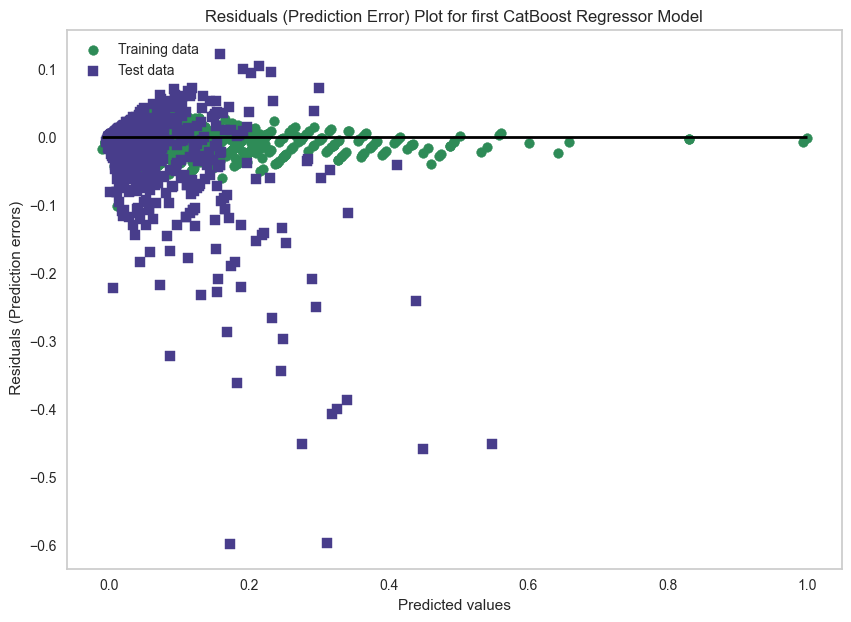

In [10]:
#model.fit(X_train, y_train)
y_train_pred = catBoost_modelA.predict(X_train)
y_test_pred = catBoost_modelA.predict(X_test)

# Calculate prediction errors
train_errors = y_train_pred - y_train
test_errors = y_test_pred - y_test

# Plot prediction errors
plt.figure(figsize=(10, 7))
plt.scatter(y_train_pred, train_errors, c='#2E8B57', marker='o', label='Training data')
plt.scatter(y_test_pred, test_errors, c='#483D8B', marker='s', label='Test data')
plt.xlabel('Predicted values')
plt.ylabel(' Residuals (Prediction errors)')
plt.legend(loc='upper left')
plt.hlines(y=0, xmin=min(y_train_pred.min(), y_test_pred.min()), xmax=max(y_train_pred.max(), y_test_pred.max()), color='black', lw=2)
plt.title('Residuals (Prediction Error) Plot for first CatBoost Regressor Model')
plt.grid()
plt.show()

Residuals are the difference between our predicted player market values and their actual market values (i.e. predicted — actual values), and a Residuals plot displays their relationship/correlation of errors with predictions, as well as the distribution of these errors.

From the residuals plot above we find little noticeable  difference or pattern in error for lower market values on the left. However, as predicted values increase we see a consistent increase in prediction errors for our test data (purple squares).
For example, we can take the small cluster of three  test values with a predicted value just under 0.4 and residuals of -0.4. As residuals = predictions - actuals, we can deduce that the real prices for these cases vary by around 0.75. We also deduce that the model is also underestimating values, cosiderbaly more as the values increase.


#### <span style="color:Teal">Hyperparameter Tuning with GridSearchCV</span>

In [11]:
# Defining the parameter grid for GridSearchCV
param_grid = {
    'learning_rate': [0.01, 0.05, 0.1],
    'depth': [4, 6, 8, 10, None],  # Including None for unlimited depth
    'l2_leaf_reg': [1, 3, 5, 7, 9],
    'iterations': [100, 200, 300, 400]
}

# Creating a GridSearchCV object
gscv = GridSearchCV(catBoost_modelA, param_grid, n_jobs=-1, scoring='r2', cv=5)

# Fitting the GridSearchCV object to the training data
gscv.fit(X_train, y_train)

# Getting the best estimator from GridSearchCV
best_model = gscv.best_estimator_

# Calculating cross-validated R² score
cv_r2_scores = cross_val_score(best_model, X_train, y_train, cv=5, scoring='r2')

# Calculating cross-validated MAE, MSE, and RMSE
cv_mae_scores = -cross_val_score(best_model, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')
cv_mse_scores = -cross_val_score(best_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_scores = np.sqrt(cv_mse_scores)

# Displaying the best parameters, R² score, MAE, MSE, and RMSE
print("\nBest Parameters:", gscv.best_params_)

# Displaying the cross-validated scores
print("\nCross-Validated R² Scores:", cv_r2_scores)
print("Mean Cross-Validated R² Score:", np.mean(cv_r2_scores))
print('Cross-Validated Mean Absolute Error (MAE): ', np.mean(cv_mae_scores))
print('Cross-Validated Mean Squared Error (MSE): ', np.mean(cv_mse_scores))
print('Cross-Validated Root Mean Squared Error (RMSE): ', np.mean(cv_rmse_scores))

0:	learn: 0.0530998	total: 6.59ms	remaining: 2.63s
1:	learn: 0.0506293	total: 12.4ms	remaining: 2.47s
2:	learn: 0.0484559	total: 17.8ms	remaining: 2.36s
3:	learn: 0.0464194	total: 23.1ms	remaining: 2.29s
4:	learn: 0.0447482	total: 28.7ms	remaining: 2.26s
5:	learn: 0.0430517	total: 33.9ms	remaining: 2.23s
6:	learn: 0.0416838	total: 39.1ms	remaining: 2.2s
7:	learn: 0.0401648	total: 44.7ms	remaining: 2.19s
8:	learn: 0.0390727	total: 50.1ms	remaining: 2.17s
9:	learn: 0.0378659	total: 55.7ms	remaining: 2.17s
10:	learn: 0.0369369	total: 61.3ms	remaining: 2.17s
11:	learn: 0.0359390	total: 66.8ms	remaining: 2.16s
12:	learn: 0.0349706	total: 72.4ms	remaining: 2.15s
13:	learn: 0.0341962	total: 77.6ms	remaining: 2.14s
14:	learn: 0.0334268	total: 83ms	remaining: 2.13s
15:	learn: 0.0325824	total: 89ms	remaining: 2.13s
16:	learn: 0.0319319	total: 94.7ms	remaining: 2.13s
17:	learn: 0.0313521	total: 100ms	remaining: 2.13s
18:	learn: 0.0308177	total: 106ms	remaining: 2.13s
19:	learn: 0.0303170	total: 1

180:	learn: 0.0142001	total: 1.03s	remaining: 1.25s
181:	learn: 0.0141489	total: 1.04s	remaining: 1.24s
182:	learn: 0.0141116	total: 1.04s	remaining: 1.24s
183:	learn: 0.0140892	total: 1.05s	remaining: 1.23s
184:	learn: 0.0140445	total: 1.05s	remaining: 1.23s
185:	learn: 0.0139883	total: 1.06s	remaining: 1.22s
186:	learn: 0.0139652	total: 1.07s	remaining: 1.21s
187:	learn: 0.0139085	total: 1.07s	remaining: 1.21s
188:	learn: 0.0138785	total: 1.08s	remaining: 1.2s
189:	learn: 0.0138276	total: 1.08s	remaining: 1.2s
190:	learn: 0.0137861	total: 1.09s	remaining: 1.19s
191:	learn: 0.0137339	total: 1.09s	remaining: 1.19s
192:	learn: 0.0137305	total: 1.1s	remaining: 1.18s
193:	learn: 0.0137105	total: 1.1s	remaining: 1.17s
194:	learn: 0.0136767	total: 1.11s	remaining: 1.17s
195:	learn: 0.0136580	total: 1.12s	remaining: 1.16s
196:	learn: 0.0136545	total: 1.12s	remaining: 1.16s
197:	learn: 0.0136299	total: 1.13s	remaining: 1.15s
198:	learn: 0.0135980	total: 1.13s	remaining: 1.14s
199:	learn: 0.01

354:	learn: 0.0105003	total: 2.07s	remaining: 262ms
355:	learn: 0.0104791	total: 2.08s	remaining: 256ms
356:	learn: 0.0104623	total: 2.08s	remaining: 251ms
357:	learn: 0.0104471	total: 2.09s	remaining: 245ms
358:	learn: 0.0104389	total: 2.09s	remaining: 239ms
359:	learn: 0.0104311	total: 2.1s	remaining: 233ms
360:	learn: 0.0104220	total: 2.1s	remaining: 227ms
361:	learn: 0.0104035	total: 2.11s	remaining: 221ms
362:	learn: 0.0103839	total: 2.11s	remaining: 216ms
363:	learn: 0.0103596	total: 2.12s	remaining: 210ms
364:	learn: 0.0103395	total: 2.13s	remaining: 204ms
365:	learn: 0.0103208	total: 2.13s	remaining: 198ms
366:	learn: 0.0103070	total: 2.14s	remaining: 192ms
367:	learn: 0.0102998	total: 2.14s	remaining: 186ms
368:	learn: 0.0102812	total: 2.15s	remaining: 181ms
369:	learn: 0.0102760	total: 2.15s	remaining: 175ms
370:	learn: 0.0102596	total: 2.16s	remaining: 169ms
371:	learn: 0.0102481	total: 2.17s	remaining: 163ms
372:	learn: 0.0102367	total: 2.17s	remaining: 157ms
373:	learn: 0.

149:	learn: 0.0155405	total: 835ms	remaining: 1.39s
150:	learn: 0.0155312	total: 840ms	remaining: 1.39s
151:	learn: 0.0154622	total: 845ms	remaining: 1.38s
152:	learn: 0.0154289	total: 850ms	remaining: 1.37s
153:	learn: 0.0153875	total: 855ms	remaining: 1.36s
154:	learn: 0.0153549	total: 860ms	remaining: 1.36s
155:	learn: 0.0153275	total: 865ms	remaining: 1.35s
156:	learn: 0.0152861	total: 869ms	remaining: 1.34s
157:	learn: 0.0152770	total: 874ms	remaining: 1.34s
158:	learn: 0.0152232	total: 879ms	remaining: 1.33s
159:	learn: 0.0151917	total: 884ms	remaining: 1.32s
160:	learn: 0.0151403	total: 889ms	remaining: 1.32s
161:	learn: 0.0150718	total: 894ms	remaining: 1.31s
162:	learn: 0.0150450	total: 899ms	remaining: 1.31s
163:	learn: 0.0150255	total: 903ms	remaining: 1.3s
164:	learn: 0.0150011	total: 908ms	remaining: 1.29s
165:	learn: 0.0149472	total: 913ms	remaining: 1.29s
166:	learn: 0.0148879	total: 918ms	remaining: 1.28s
167:	learn: 0.0148808	total: 922ms	remaining: 1.27s
168:	learn: 0

325:	learn: 0.0107460	total: 1.64s	remaining: 372ms
326:	learn: 0.0107232	total: 1.64s	remaining: 367ms
327:	learn: 0.0107145	total: 1.65s	remaining: 362ms
328:	learn: 0.0107006	total: 1.66s	remaining: 357ms
329:	learn: 0.0106872	total: 1.67s	remaining: 354ms
330:	learn: 0.0106798	total: 1.67s	remaining: 349ms
331:	learn: 0.0106668	total: 1.68s	remaining: 344ms
332:	learn: 0.0106481	total: 1.69s	remaining: 339ms
333:	learn: 0.0106193	total: 1.69s	remaining: 334ms
334:	learn: 0.0105960	total: 1.7s	remaining: 330ms
335:	learn: 0.0105703	total: 1.71s	remaining: 325ms
336:	learn: 0.0105631	total: 1.71s	remaining: 320ms
337:	learn: 0.0105470	total: 1.72s	remaining: 315ms
338:	learn: 0.0105323	total: 1.72s	remaining: 310ms
339:	learn: 0.0105234	total: 1.73s	remaining: 305ms
340:	learn: 0.0105003	total: 1.74s	remaining: 300ms
341:	learn: 0.0104883	total: 1.74s	remaining: 296ms
342:	learn: 0.0104758	total: 1.75s	remaining: 291ms
343:	learn: 0.0104531	total: 1.76s	remaining: 286ms
344:	learn: 0

86:	learn: 0.0185949	total: 457ms	remaining: 1.64s
87:	learn: 0.0184645	total: 462ms	remaining: 1.64s
88:	learn: 0.0183593	total: 468ms	remaining: 1.64s
89:	learn: 0.0182981	total: 473ms	remaining: 1.63s
90:	learn: 0.0182237	total: 478ms	remaining: 1.62s
91:	learn: 0.0181662	total: 483ms	remaining: 1.62s
92:	learn: 0.0180925	total: 488ms	remaining: 1.61s
93:	learn: 0.0180158	total: 493ms	remaining: 1.61s
94:	learn: 0.0179366	total: 499ms	remaining: 1.6s
95:	learn: 0.0178330	total: 504ms	remaining: 1.6s
96:	learn: 0.0177779	total: 509ms	remaining: 1.59s
97:	learn: 0.0177067	total: 514ms	remaining: 1.58s
98:	learn: 0.0176172	total: 519ms	remaining: 1.58s
99:	learn: 0.0174857	total: 523ms	remaining: 1.57s
100:	learn: 0.0173960	total: 528ms	remaining: 1.56s
101:	learn: 0.0173449	total: 533ms	remaining: 1.56s
102:	learn: 0.0172697	total: 538ms	remaining: 1.55s
103:	learn: 0.0172146	total: 542ms	remaining: 1.54s
104:	learn: 0.0171226	total: 547ms	remaining: 1.54s
105:	learn: 0.0170873	total:

255:	learn: 0.0114607	total: 1.22s	remaining: 685ms
256:	learn: 0.0114584	total: 1.22s	remaining: 681ms
257:	learn: 0.0114331	total: 1.23s	remaining: 677ms
258:	learn: 0.0114206	total: 1.24s	remaining: 673ms
259:	learn: 0.0113936	total: 1.24s	remaining: 669ms
260:	learn: 0.0113835	total: 1.25s	remaining: 665ms
261:	learn: 0.0113697	total: 1.25s	remaining: 660ms
262:	learn: 0.0113575	total: 1.26s	remaining: 656ms
263:	learn: 0.0113384	total: 1.28s	remaining: 658ms
264:	learn: 0.0113170	total: 1.28s	remaining: 653ms
265:	learn: 0.0112964	total: 1.29s	remaining: 649ms
266:	learn: 0.0112740	total: 1.29s	remaining: 644ms
267:	learn: 0.0112334	total: 1.3s	remaining: 639ms
268:	learn: 0.0112109	total: 1.3s	remaining: 634ms
269:	learn: 0.0111931	total: 1.3s	remaining: 629ms
270:	learn: 0.0111737	total: 1.31s	remaining: 624ms
271:	learn: 0.0111440	total: 1.31s	remaining: 619ms
272:	learn: 0.0111419	total: 1.32s	remaining: 614ms
273:	learn: 0.0111241	total: 1.32s	remaining: 609ms
274:	learn: 0.0

44:	learn: 0.0228048	total: 214ms	remaining: 1.69s
45:	learn: 0.0226509	total: 219ms	remaining: 1.69s
46:	learn: 0.0225994	total: 224ms	remaining: 1.68s
47:	learn: 0.0225099	total: 228ms	remaining: 1.67s
48:	learn: 0.0223530	total: 234ms	remaining: 1.67s
49:	learn: 0.0221680	total: 238ms	remaining: 1.67s
50:	learn: 0.0220327	total: 243ms	remaining: 1.66s
51:	learn: 0.0219679	total: 248ms	remaining: 1.66s
52:	learn: 0.0218437	total: 253ms	remaining: 1.65s
53:	learn: 0.0217699	total: 257ms	remaining: 1.65s
54:	learn: 0.0216832	total: 262ms	remaining: 1.64s
55:	learn: 0.0215729	total: 267ms	remaining: 1.64s
56:	learn: 0.0214539	total: 271ms	remaining: 1.63s
57:	learn: 0.0213046	total: 276ms	remaining: 1.62s
58:	learn: 0.0211556	total: 280ms	remaining: 1.62s
59:	learn: 0.0210858	total: 285ms	remaining: 1.61s
60:	learn: 0.0209527	total: 290ms	remaining: 1.61s
61:	learn: 0.0208919	total: 294ms	remaining: 1.6s
62:	learn: 0.0207911	total: 299ms	remaining: 1.6s
63:	learn: 0.0207219	total: 303ms

219:	learn: 0.0127610	total: 1.03s	remaining: 843ms
220:	learn: 0.0127277	total: 1.03s	remaining: 839ms
221:	learn: 0.0126910	total: 1.04s	remaining: 834ms
222:	learn: 0.0126686	total: 1.04s	remaining: 829ms
223:	learn: 0.0126387	total: 1.05s	remaining: 825ms
224:	learn: 0.0126202	total: 1.05s	remaining: 820ms
225:	learn: 0.0125907	total: 1.06s	remaining: 816ms
226:	learn: 0.0125420	total: 1.06s	remaining: 812ms
227:	learn: 0.0125075	total: 1.07s	remaining: 808ms
228:	learn: 0.0124670	total: 1.08s	remaining: 805ms
229:	learn: 0.0124399	total: 1.08s	remaining: 801ms
230:	learn: 0.0124149	total: 1.09s	remaining: 797ms
231:	learn: 0.0124048	total: 1.09s	remaining: 793ms
232:	learn: 0.0123767	total: 1.1s	remaining: 788ms
233:	learn: 0.0123419	total: 1.1s	remaining: 784ms
234:	learn: 0.0123201	total: 1.11s	remaining: 780ms
235:	learn: 0.0123085	total: 1.12s	remaining: 776ms
236:	learn: 0.0122745	total: 1.12s	remaining: 772ms
237:	learn: 0.0122541	total: 1.13s	remaining: 767ms
238:	learn: 0.

384:	learn: 0.0096411	total: 1.85s	remaining: 72.2ms
385:	learn: 0.0096254	total: 1.86s	remaining: 67.4ms
386:	learn: 0.0096047	total: 1.86s	remaining: 62.6ms
387:	learn: 0.0095877	total: 1.87s	remaining: 57.8ms
388:	learn: 0.0095731	total: 1.87s	remaining: 53ms
389:	learn: 0.0095548	total: 1.88s	remaining: 48.2ms
390:	learn: 0.0095373	total: 1.88s	remaining: 43.4ms
391:	learn: 0.0095186	total: 1.89s	remaining: 38.5ms
392:	learn: 0.0094988	total: 1.89s	remaining: 33.7ms
393:	learn: 0.0094828	total: 1.9s	remaining: 28.9ms
394:	learn: 0.0094739	total: 1.9s	remaining: 24.1ms
395:	learn: 0.0094665	total: 1.91s	remaining: 19.3ms
396:	learn: 0.0094590	total: 1.91s	remaining: 14.5ms
397:	learn: 0.0094525	total: 1.92s	remaining: 9.64ms
398:	learn: 0.0094266	total: 1.92s	remaining: 4.82ms
399:	learn: 0.0094079	total: 1.93s	remaining: 0us
0:	learn: 0.0532485	total: 4.93ms	remaining: 1.97s
1:	learn: 0.0510567	total: 9.39ms	remaining: 1.87s
2:	learn: 0.0490322	total: 13.8ms	remaining: 1.82s
3:	lea

170:	learn: 0.0138556	total: 810ms	remaining: 1.08s
171:	learn: 0.0138337	total: 815ms	remaining: 1.08s
172:	learn: 0.0138075	total: 819ms	remaining: 1.07s
173:	learn: 0.0137800	total: 824ms	remaining: 1.07s
174:	learn: 0.0137496	total: 828ms	remaining: 1.06s
175:	learn: 0.0137132	total: 834ms	remaining: 1.06s
176:	learn: 0.0137003	total: 839ms	remaining: 1.06s
177:	learn: 0.0136781	total: 844ms	remaining: 1.05s
178:	learn: 0.0136433	total: 849ms	remaining: 1.05s
179:	learn: 0.0136105	total: 854ms	remaining: 1.04s
180:	learn: 0.0135528	total: 859ms	remaining: 1.04s
181:	learn: 0.0134965	total: 864ms	remaining: 1.03s
182:	learn: 0.0134533	total: 871ms	remaining: 1.03s
183:	learn: 0.0134237	total: 876ms	remaining: 1.03s
184:	learn: 0.0134114	total: 881ms	remaining: 1.02s
185:	learn: 0.0133872	total: 886ms	remaining: 1.02s
186:	learn: 0.0133580	total: 891ms	remaining: 1.01s
187:	learn: 0.0133333	total: 896ms	remaining: 1.01s
188:	learn: 0.0132681	total: 900ms	remaining: 1s
189:	learn: 0.0

343:	learn: 0.0098508	total: 1.64s	remaining: 268ms
344:	learn: 0.0098355	total: 1.65s	remaining: 263ms
345:	learn: 0.0098222	total: 1.66s	remaining: 259ms
346:	learn: 0.0097978	total: 1.66s	remaining: 254ms
347:	learn: 0.0097801	total: 1.67s	remaining: 250ms
348:	learn: 0.0097696	total: 1.68s	remaining: 245ms
349:	learn: 0.0097466	total: 1.68s	remaining: 240ms
350:	learn: 0.0097327	total: 1.69s	remaining: 235ms
351:	learn: 0.0097170	total: 1.69s	remaining: 231ms
352:	learn: 0.0097035	total: 1.7s	remaining: 226ms
353:	learn: 0.0096975	total: 1.7s	remaining: 221ms
354:	learn: 0.0096860	total: 1.71s	remaining: 216ms
355:	learn: 0.0096756	total: 1.71s	remaining: 211ms
356:	learn: 0.0096643	total: 1.72s	remaining: 207ms
357:	learn: 0.0096564	total: 1.72s	remaining: 202ms
358:	learn: 0.0096453	total: 1.73s	remaining: 197ms
359:	learn: 0.0096253	total: 1.73s	remaining: 193ms
360:	learn: 0.0096020	total: 1.74s	remaining: 188ms
361:	learn: 0.0095818	total: 1.74s	remaining: 183ms
362:	learn: 0.

131:	learn: 0.0158398	total: 626ms	remaining: 1.27s
132:	learn: 0.0157853	total: 631ms	remaining: 1.27s
133:	learn: 0.0157225	total: 636ms	remaining: 1.26s
134:	learn: 0.0156235	total: 641ms	remaining: 1.26s
135:	learn: 0.0155861	total: 647ms	remaining: 1.25s
136:	learn: 0.0155300	total: 652ms	remaining: 1.25s
137:	learn: 0.0154734	total: 658ms	remaining: 1.25s
138:	learn: 0.0154510	total: 663ms	remaining: 1.25s
139:	learn: 0.0154044	total: 669ms	remaining: 1.24s
140:	learn: 0.0153507	total: 674ms	remaining: 1.24s
141:	learn: 0.0153006	total: 680ms	remaining: 1.24s
142:	learn: 0.0152479	total: 685ms	remaining: 1.23s
143:	learn: 0.0151724	total: 691ms	remaining: 1.23s
144:	learn: 0.0151417	total: 696ms	remaining: 1.22s
145:	learn: 0.0150908	total: 702ms	remaining: 1.22s
146:	learn: 0.0150428	total: 708ms	remaining: 1.22s
147:	learn: 0.0149696	total: 712ms	remaining: 1.21s
148:	learn: 0.0149125	total: 717ms	remaining: 1.21s
149:	learn: 0.0148800	total: 722ms	remaining: 1.2s
150:	learn: 0

292:	learn: 0.0110057	total: 1.45s	remaining: 530ms
293:	learn: 0.0109951	total: 1.46s	remaining: 525ms
294:	learn: 0.0109653	total: 1.46s	remaining: 520ms
295:	learn: 0.0109377	total: 1.47s	remaining: 515ms
296:	learn: 0.0109225	total: 1.47s	remaining: 510ms
297:	learn: 0.0109081	total: 1.48s	remaining: 505ms
298:	learn: 0.0108913	total: 1.48s	remaining: 500ms
299:	learn: 0.0108720	total: 1.49s	remaining: 496ms
300:	learn: 0.0108619	total: 1.49s	remaining: 491ms
301:	learn: 0.0108364	total: 1.5s	remaining: 486ms
302:	learn: 0.0108164	total: 1.5s	remaining: 481ms
303:	learn: 0.0108051	total: 1.51s	remaining: 476ms
304:	learn: 0.0107845	total: 1.51s	remaining: 471ms
305:	learn: 0.0107695	total: 1.52s	remaining: 467ms
306:	learn: 0.0107408	total: 1.52s	remaining: 462ms
307:	learn: 0.0107174	total: 1.53s	remaining: 457ms
308:	learn: 0.0107013	total: 1.53s	remaining: 452ms
309:	learn: 0.0106697	total: 1.54s	remaining: 447ms
310:	learn: 0.0106479	total: 1.54s	remaining: 442ms
311:	learn: 0.

80:	learn: 0.0202493	total: 416ms	remaining: 1.64s
81:	learn: 0.0201584	total: 421ms	remaining: 1.63s
82:	learn: 0.0201393	total: 426ms	remaining: 1.63s
83:	learn: 0.0200518	total: 431ms	remaining: 1.62s
84:	learn: 0.0199721	total: 436ms	remaining: 1.62s
85:	learn: 0.0198573	total: 442ms	remaining: 1.61s
86:	learn: 0.0198476	total: 447ms	remaining: 1.61s
87:	learn: 0.0198300	total: 452ms	remaining: 1.6s
88:	learn: 0.0196954	total: 457ms	remaining: 1.6s
89:	learn: 0.0196590	total: 462ms	remaining: 1.59s
90:	learn: 0.0195394	total: 467ms	remaining: 1.58s
91:	learn: 0.0195283	total: 472ms	remaining: 1.58s
92:	learn: 0.0194525	total: 477ms	remaining: 1.57s
93:	learn: 0.0193905	total: 482ms	remaining: 1.57s
94:	learn: 0.0193242	total: 487ms	remaining: 1.56s
95:	learn: 0.0191942	total: 492ms	remaining: 1.56s
96:	learn: 0.0191792	total: 497ms	remaining: 1.55s
97:	learn: 0.0191240	total: 501ms	remaining: 1.54s
98:	learn: 0.0190121	total: 506ms	remaining: 1.54s
99:	learn: 0.0189606	total: 511ms

248:	learn: 0.0123846	total: 1.24s	remaining: 750ms
249:	learn: 0.0123558	total: 1.24s	remaining: 745ms
250:	learn: 0.0123414	total: 1.25s	remaining: 740ms
251:	learn: 0.0123279	total: 1.25s	remaining: 735ms
252:	learn: 0.0123140	total: 1.25s	remaining: 729ms
253:	learn: 0.0123000	total: 1.26s	remaining: 725ms
254:	learn: 0.0122701	total: 1.26s	remaining: 719ms
255:	learn: 0.0122338	total: 1.27s	remaining: 715ms
256:	learn: 0.0122011	total: 1.27s	remaining: 710ms
257:	learn: 0.0121832	total: 1.28s	remaining: 705ms
258:	learn: 0.0121615	total: 1.28s	remaining: 700ms
259:	learn: 0.0121386	total: 1.29s	remaining: 695ms
260:	learn: 0.0121158	total: 1.29s	remaining: 690ms
261:	learn: 0.0120879	total: 1.3s	remaining: 685ms
262:	learn: 0.0120764	total: 1.3s	remaining: 680ms
263:	learn: 0.0120359	total: 1.31s	remaining: 675ms
264:	learn: 0.0119961	total: 1.31s	remaining: 670ms
265:	learn: 0.0119549	total: 1.32s	remaining: 665ms
266:	learn: 0.0119377	total: 1.32s	remaining: 659ms
267:	learn: 0.

42:	learn: 0.0233701	total: 205ms	remaining: 1.7s
43:	learn: 0.0232571	total: 210ms	remaining: 1.7s
44:	learn: 0.0229982	total: 215ms	remaining: 1.7s
45:	learn: 0.0229106	total: 220ms	remaining: 1.69s
46:	learn: 0.0226730	total: 225ms	remaining: 1.69s
47:	learn: 0.0225561	total: 230ms	remaining: 1.68s
48:	learn: 0.0224037	total: 235ms	remaining: 1.68s
49:	learn: 0.0221772	total: 240ms	remaining: 1.68s
50:	learn: 0.0220405	total: 245ms	remaining: 1.68s
51:	learn: 0.0219658	total: 250ms	remaining: 1.68s
52:	learn: 0.0218906	total: 255ms	remaining: 1.67s
53:	learn: 0.0218005	total: 260ms	remaining: 1.67s
54:	learn: 0.0216864	total: 265ms	remaining: 1.66s
55:	learn: 0.0215649	total: 270ms	remaining: 1.66s
56:	learn: 0.0214744	total: 274ms	remaining: 1.65s
57:	learn: 0.0214139	total: 279ms	remaining: 1.64s
58:	learn: 0.0212360	total: 284ms	remaining: 1.64s
59:	learn: 0.0211414	total: 289ms	remaining: 1.64s
60:	learn: 0.0210595	total: 293ms	remaining: 1.63s
61:	learn: 0.0209287	total: 298ms	

216:	learn: 0.0124079	total: 1.03s	remaining: 866ms
217:	learn: 0.0123953	total: 1.03s	remaining: 862ms
218:	learn: 0.0123714	total: 1.04s	remaining: 857ms
219:	learn: 0.0123380	total: 1.04s	remaining: 853ms
220:	learn: 0.0123100	total: 1.05s	remaining: 848ms
221:	learn: 0.0122769	total: 1.05s	remaining: 844ms
222:	learn: 0.0122580	total: 1.06s	remaining: 839ms
223:	learn: 0.0122350	total: 1.06s	remaining: 835ms
224:	learn: 0.0122052	total: 1.07s	remaining: 830ms
225:	learn: 0.0121806	total: 1.07s	remaining: 826ms
226:	learn: 0.0121565	total: 1.08s	remaining: 821ms
227:	learn: 0.0121376	total: 1.08s	remaining: 817ms
228:	learn: 0.0121227	total: 1.09s	remaining: 812ms
229:	learn: 0.0120888	total: 1.09s	remaining: 807ms
230:	learn: 0.0120642	total: 1.1s	remaining: 802ms
231:	learn: 0.0120356	total: 1.1s	remaining: 797ms
232:	learn: 0.0120036	total: 1.1s	remaining: 793ms
233:	learn: 0.0119849	total: 1.11s	remaining: 788ms
234:	learn: 0.0119378	total: 1.11s	remaining: 783ms
235:	learn: 0.0

384:	learn: 0.0094160	total: 1.82s	remaining: 70.9ms
385:	learn: 0.0094065	total: 1.83s	remaining: 66.3ms
386:	learn: 0.0093888	total: 1.83s	remaining: 61.6ms
387:	learn: 0.0093706	total: 1.84s	remaining: 56.9ms
388:	learn: 0.0093641	total: 1.85s	remaining: 52.2ms
389:	learn: 0.0093529	total: 1.85s	remaining: 47.5ms
390:	learn: 0.0093353	total: 1.86s	remaining: 42.8ms
391:	learn: 0.0093190	total: 1.86s	remaining: 38.1ms
392:	learn: 0.0093048	total: 1.87s	remaining: 33.3ms
393:	learn: 0.0092855	total: 1.88s	remaining: 28.6ms
394:	learn: 0.0092693	total: 1.88s	remaining: 23.8ms
395:	learn: 0.0092495	total: 1.89s	remaining: 19.1ms
396:	learn: 0.0092436	total: 1.89s	remaining: 14.3ms
397:	learn: 0.0092326	total: 1.9s	remaining: 9.55ms
398:	learn: 0.0092102	total: 1.91s	remaining: 4.78ms
399:	learn: 0.0092017	total: 1.91s	remaining: 0us
0:	learn: 0.0518667	total: 6.06ms	remaining: 2.42s
1:	learn: 0.0495221	total: 10.9ms	remaining: 2.16s
2:	learn: 0.0475285	total: 15.8ms	remaining: 2.09s
3:	

148:	learn: 0.0154057	total: 605ms	remaining: 1.02s
149:	learn: 0.0153727	total: 610ms	remaining: 1.02s
150:	learn: 0.0153143	total: 614ms	remaining: 1.01s
151:	learn: 0.0152774	total: 618ms	remaining: 1.01s
152:	learn: 0.0152198	total: 623ms	remaining: 1.01s
153:	learn: 0.0151682	total: 628ms	remaining: 1s
154:	learn: 0.0151394	total: 633ms	remaining: 1s
155:	learn: 0.0151013	total: 638ms	remaining: 997ms
156:	learn: 0.0150600	total: 643ms	remaining: 996ms
157:	learn: 0.0150339	total: 648ms	remaining: 993ms
158:	learn: 0.0150021	total: 653ms	remaining: 990ms
159:	learn: 0.0149680	total: 658ms	remaining: 987ms
160:	learn: 0.0148916	total: 663ms	remaining: 985ms
161:	learn: 0.0148666	total: 668ms	remaining: 981ms
162:	learn: 0.0148021	total: 673ms	remaining: 978ms
163:	learn: 0.0147531	total: 678ms	remaining: 976ms
164:	learn: 0.0147139	total: 683ms	remaining: 972ms
165:	learn: 0.0146683	total: 687ms	remaining: 969ms
166:	learn: 0.0146384	total: 692ms	remaining: 965ms
167:	learn: 0.0145

341:	learn: 0.0102430	total: 1.43s	remaining: 242ms
342:	learn: 0.0102347	total: 1.43s	remaining: 238ms
343:	learn: 0.0102248	total: 1.44s	remaining: 234ms
344:	learn: 0.0102132	total: 1.45s	remaining: 230ms
345:	learn: 0.0101974	total: 1.45s	remaining: 226ms
346:	learn: 0.0101911	total: 1.45s	remaining: 222ms
347:	learn: 0.0101758	total: 1.46s	remaining: 218ms
348:	learn: 0.0101574	total: 1.46s	remaining: 214ms
349:	learn: 0.0101406	total: 1.47s	remaining: 209ms
350:	learn: 0.0101238	total: 1.47s	remaining: 205ms
351:	learn: 0.0101130	total: 1.47s	remaining: 201ms
352:	learn: 0.0100857	total: 1.48s	remaining: 197ms
353:	learn: 0.0100562	total: 1.48s	remaining: 193ms
354:	learn: 0.0100475	total: 1.49s	remaining: 188ms
355:	learn: 0.0100182	total: 1.49s	remaining: 184ms
356:	learn: 0.0100089	total: 1.49s	remaining: 180ms
357:	learn: 0.0099856	total: 1.5s	remaining: 176ms
358:	learn: 0.0099787	total: 1.5s	remaining: 171ms
359:	learn: 0.0099599	total: 1.5s	remaining: 167ms
360:	learn: 0.0

102:	learn: 0.0171593	total: 410ms	remaining: 1.18s
103:	learn: 0.0170908	total: 414ms	remaining: 1.18s
104:	learn: 0.0170196	total: 418ms	remaining: 1.18s
105:	learn: 0.0170075	total: 423ms	remaining: 1.17s
106:	learn: 0.0169459	total: 428ms	remaining: 1.17s
107:	learn: 0.0168791	total: 432ms	remaining: 1.17s
108:	learn: 0.0168367	total: 437ms	remaining: 1.17s
109:	learn: 0.0167659	total: 441ms	remaining: 1.16s
110:	learn: 0.0167162	total: 445ms	remaining: 1.16s
111:	learn: 0.0166637	total: 450ms	remaining: 1.16s
112:	learn: 0.0165680	total: 455ms	remaining: 1.15s
113:	learn: 0.0164968	total: 459ms	remaining: 1.15s
114:	learn: 0.0164209	total: 464ms	remaining: 1.15s
115:	learn: 0.0163528	total: 468ms	remaining: 1.15s
116:	learn: 0.0162799	total: 473ms	remaining: 1.14s
117:	learn: 0.0162148	total: 477ms	remaining: 1.14s
118:	learn: 0.0161495	total: 482ms	remaining: 1.14s
119:	learn: 0.0160809	total: 486ms	remaining: 1.13s
120:	learn: 0.0160229	total: 490ms	remaining: 1.13s
121:	learn: 

286:	learn: 0.0108153	total: 1.23s	remaining: 483ms
287:	learn: 0.0107999	total: 1.23s	remaining: 479ms
288:	learn: 0.0107805	total: 1.24s	remaining: 475ms
289:	learn: 0.0107700	total: 1.24s	remaining: 470ms
290:	learn: 0.0107660	total: 1.24s	remaining: 466ms
291:	learn: 0.0107520	total: 1.25s	remaining: 462ms
292:	learn: 0.0107339	total: 1.25s	remaining: 458ms
293:	learn: 0.0107088	total: 1.26s	remaining: 454ms
294:	learn: 0.0106833	total: 1.26s	remaining: 449ms
295:	learn: 0.0106486	total: 1.27s	remaining: 445ms
296:	learn: 0.0106270	total: 1.27s	remaining: 441ms
297:	learn: 0.0106087	total: 1.28s	remaining: 437ms
298:	learn: 0.0105891	total: 1.28s	remaining: 433ms
299:	learn: 0.0105752	total: 1.28s	remaining: 428ms
300:	learn: 0.0105563	total: 1.29s	remaining: 424ms
301:	learn: 0.0105270	total: 1.29s	remaining: 420ms
302:	learn: 0.0105120	total: 1.3s	remaining: 416ms
303:	learn: 0.0104896	total: 1.3s	remaining: 412ms
304:	learn: 0.0104819	total: 1.31s	remaining: 407ms
305:	learn: 0.

55:	learn: 0.0220328	total: 206ms	remaining: 1.27s
56:	learn: 0.0218446	total: 211ms	remaining: 1.27s
57:	learn: 0.0217411	total: 215ms	remaining: 1.27s
58:	learn: 0.0216363	total: 220ms	remaining: 1.27s
59:	learn: 0.0215399	total: 225ms	remaining: 1.27s
60:	learn: 0.0213765	total: 229ms	remaining: 1.27s
61:	learn: 0.0212716	total: 234ms	remaining: 1.27s
62:	learn: 0.0210806	total: 239ms	remaining: 1.28s
63:	learn: 0.0209345	total: 244ms	remaining: 1.28s
64:	learn: 0.0208379	total: 248ms	remaining: 1.28s
65:	learn: 0.0207657	total: 253ms	remaining: 1.28s
66:	learn: 0.0207177	total: 257ms	remaining: 1.28s
67:	learn: 0.0205758	total: 262ms	remaining: 1.28s
68:	learn: 0.0204599	total: 266ms	remaining: 1.28s
69:	learn: 0.0203947	total: 271ms	remaining: 1.28s
70:	learn: 0.0203004	total: 275ms	remaining: 1.27s
71:	learn: 0.0202382	total: 279ms	remaining: 1.27s
72:	learn: 0.0201455	total: 283ms	remaining: 1.27s
73:	learn: 0.0200851	total: 287ms	remaining: 1.27s
74:	learn: 0.0200059	total: 291

247:	learn: 0.0119579	total: 1.02s	remaining: 628ms
248:	learn: 0.0119254	total: 1.03s	remaining: 624ms
249:	learn: 0.0119102	total: 1.03s	remaining: 620ms
250:	learn: 0.0118673	total: 1.04s	remaining: 615ms
251:	learn: 0.0118383	total: 1.04s	remaining: 611ms
252:	learn: 0.0118201	total: 1.04s	remaining: 607ms
253:	learn: 0.0118031	total: 1.05s	remaining: 603ms
254:	learn: 0.0117831	total: 1.05s	remaining: 600ms
255:	learn: 0.0117699	total: 1.06s	remaining: 596ms
256:	learn: 0.0117410	total: 1.06s	remaining: 592ms
257:	learn: 0.0117229	total: 1.07s	remaining: 588ms
258:	learn: 0.0116954	total: 1.07s	remaining: 584ms
259:	learn: 0.0116780	total: 1.08s	remaining: 580ms
260:	learn: 0.0116410	total: 1.08s	remaining: 576ms
261:	learn: 0.0116199	total: 1.08s	remaining: 572ms
262:	learn: 0.0115833	total: 1.09s	remaining: 568ms
263:	learn: 0.0115689	total: 1.09s	remaining: 564ms
264:	learn: 0.0115495	total: 1.1s	remaining: 560ms
265:	learn: 0.0115327	total: 1.1s	remaining: 556ms
266:	learn: 0.

21:	learn: 0.0301043	total: 85.9ms	remaining: 1.48s
22:	learn: 0.0297172	total: 90.3ms	remaining: 1.48s
23:	learn: 0.0292487	total: 94.6ms	remaining: 1.48s
24:	learn: 0.0288505	total: 99ms	remaining: 1.49s
25:	learn: 0.0286283	total: 104ms	remaining: 1.49s
26:	learn: 0.0281659	total: 108ms	remaining: 1.5s
27:	learn: 0.0277265	total: 113ms	remaining: 1.5s
28:	learn: 0.0274511	total: 117ms	remaining: 1.5s
29:	learn: 0.0271312	total: 122ms	remaining: 1.5s
30:	learn: 0.0267543	total: 127ms	remaining: 1.51s
31:	learn: 0.0264979	total: 131ms	remaining: 1.51s
32:	learn: 0.0261993	total: 136ms	remaining: 1.51s
33:	learn: 0.0258981	total: 140ms	remaining: 1.51s
34:	learn: 0.0256938	total: 145ms	remaining: 1.51s
35:	learn: 0.0253335	total: 149ms	remaining: 1.5s
36:	learn: 0.0251397	total: 153ms	remaining: 1.5s
37:	learn: 0.0249536	total: 157ms	remaining: 1.5s
38:	learn: 0.0247591	total: 162ms	remaining: 1.5s
39:	learn: 0.0247057	total: 166ms	remaining: 1.49s
40:	learn: 0.0245351	total: 169ms	rem

221:	learn: 0.0130646	total: 909ms	remaining: 729ms
222:	learn: 0.0130591	total: 913ms	remaining: 725ms
223:	learn: 0.0130486	total: 917ms	remaining: 721ms
224:	learn: 0.0130268	total: 922ms	remaining: 717ms
225:	learn: 0.0130094	total: 926ms	remaining: 713ms
226:	learn: 0.0129748	total: 931ms	remaining: 709ms
227:	learn: 0.0129557	total: 935ms	remaining: 706ms
228:	learn: 0.0129338	total: 940ms	remaining: 702ms
229:	learn: 0.0128738	total: 944ms	remaining: 698ms
230:	learn: 0.0128423	total: 949ms	remaining: 694ms
231:	learn: 0.0128170	total: 954ms	remaining: 691ms
232:	learn: 0.0127772	total: 966ms	remaining: 693ms
233:	learn: 0.0127573	total: 986ms	remaining: 699ms
234:	learn: 0.0127342	total: 1.01s	remaining: 707ms
235:	learn: 0.0127157	total: 1.02s	remaining: 710ms
236:	learn: 0.0126953	total: 1.03s	remaining: 710ms
237:	learn: 0.0126923	total: 1.04s	remaining: 709ms
238:	learn: 0.0126492	total: 1.05s	remaining: 709ms
239:	learn: 0.0125986	total: 1.07s	remaining: 712ms
240:	learn: 

0:	learn: 0.0547709	total: 5.32ms	remaining: 2.12s
1:	learn: 0.0521520	total: 11.9ms	remaining: 2.36s
2:	learn: 0.0498491	total: 17.4ms	remaining: 2.3s
3:	learn: 0.0476956	total: 23ms	remaining: 2.27s
4:	learn: 0.0459763	total: 28ms	remaining: 2.21s
5:	learn: 0.0442319	total: 33.1ms	remaining: 2.17s
6:	learn: 0.0425222	total: 38.3ms	remaining: 2.15s
7:	learn: 0.0410473	total: 43.4ms	remaining: 2.13s
8:	learn: 0.0396491	total: 48.6ms	remaining: 2.11s
9:	learn: 0.0383506	total: 53.6ms	remaining: 2.09s
10:	learn: 0.0372109	total: 58.4ms	remaining: 2.06s
11:	learn: 0.0361527	total: 63.6ms	remaining: 2.05s
12:	learn: 0.0353188	total: 68.5ms	remaining: 2.04s
13:	learn: 0.0345253	total: 74ms	remaining: 2.04s
14:	learn: 0.0337080	total: 80.2ms	remaining: 2.06s
15:	learn: 0.0330412	total: 86.1ms	remaining: 2.06s
16:	learn: 0.0322010	total: 90.9ms	remaining: 2.05s
17:	learn: 0.0315351	total: 95.4ms	remaining: 2.02s
18:	learn: 0.0310484	total: 100ms	remaining: 2s
19:	learn: 0.0303790	total: 105ms

160:	learn: 0.0142269	total: 784ms	remaining: 1.16s
161:	learn: 0.0141889	total: 788ms	remaining: 1.16s
162:	learn: 0.0141538	total: 792ms	remaining: 1.15s
163:	learn: 0.0141191	total: 797ms	remaining: 1.15s
164:	learn: 0.0140756	total: 801ms	remaining: 1.14s
165:	learn: 0.0140395	total: 806ms	remaining: 1.14s
166:	learn: 0.0139962	total: 810ms	remaining: 1.13s
167:	learn: 0.0139584	total: 815ms	remaining: 1.12s
168:	learn: 0.0139111	total: 819ms	remaining: 1.12s
169:	learn: 0.0138773	total: 824ms	remaining: 1.11s
170:	learn: 0.0138376	total: 828ms	remaining: 1.11s
171:	learn: 0.0138005	total: 833ms	remaining: 1.1s
172:	learn: 0.0137595	total: 837ms	remaining: 1.1s
173:	learn: 0.0137281	total: 842ms	remaining: 1.09s
174:	learn: 0.0136935	total: 847ms	remaining: 1.09s
175:	learn: 0.0136562	total: 851ms	remaining: 1.08s
176:	learn: 0.0136369	total: 856ms	remaining: 1.08s
177:	learn: 0.0135966	total: 861ms	remaining: 1.07s
178:	learn: 0.0135513	total: 865ms	remaining: 1.07s
179:	learn: 0.

355:	learn: 0.0098075	total: 1.6s	remaining: 198ms
356:	learn: 0.0098029	total: 1.6s	remaining: 193ms
357:	learn: 0.0097786	total: 1.61s	remaining: 189ms
358:	learn: 0.0097725	total: 1.61s	remaining: 184ms
359:	learn: 0.0097525	total: 1.62s	remaining: 180ms
360:	learn: 0.0097398	total: 1.62s	remaining: 175ms
361:	learn: 0.0097205	total: 1.63s	remaining: 171ms
362:	learn: 0.0097057	total: 1.63s	remaining: 166ms
363:	learn: 0.0096853	total: 1.64s	remaining: 162ms
364:	learn: 0.0096724	total: 1.64s	remaining: 157ms
365:	learn: 0.0096672	total: 1.64s	remaining: 153ms
366:	learn: 0.0096596	total: 1.65s	remaining: 148ms
367:	learn: 0.0096566	total: 1.65s	remaining: 144ms
368:	learn: 0.0096390	total: 1.66s	remaining: 139ms
369:	learn: 0.0096203	total: 1.66s	remaining: 135ms
370:	learn: 0.0096132	total: 1.67s	remaining: 130ms
371:	learn: 0.0095818	total: 1.67s	remaining: 126ms
372:	learn: 0.0095648	total: 1.68s	remaining: 121ms
373:	learn: 0.0095522	total: 1.68s	remaining: 117ms
374:	learn: 0.

155:	learn: 0.0151013	total: 700ms	remaining: 1.09s
156:	learn: 0.0150600	total: 705ms	remaining: 1.09s
157:	learn: 0.0150339	total: 710ms	remaining: 1.09s
158:	learn: 0.0150021	total: 714ms	remaining: 1.08s
159:	learn: 0.0149680	total: 719ms	remaining: 1.08s
160:	learn: 0.0148916	total: 724ms	remaining: 1.07s
161:	learn: 0.0148666	total: 728ms	remaining: 1.07s
162:	learn: 0.0148021	total: 733ms	remaining: 1.06s
163:	learn: 0.0147531	total: 737ms	remaining: 1.06s
164:	learn: 0.0147139	total: 741ms	remaining: 1.05s
165:	learn: 0.0146683	total: 746ms	remaining: 1.05s
166:	learn: 0.0146384	total: 750ms	remaining: 1.05s
167:	learn: 0.0145831	total: 755ms	remaining: 1.04s
168:	learn: 0.0145439	total: 759ms	remaining: 1.04s
169:	learn: 0.0145224	total: 764ms	remaining: 1.03s
170:	learn: 0.0145064	total: 768ms	remaining: 1.03s
171:	learn: 0.0144616	total: 772ms	remaining: 1.02s
172:	learn: 0.0144149	total: 778ms	remaining: 1.02s
173:	learn: 0.0143656	total: 783ms	remaining: 1.02s
174:	learn: 

323:	learn: 0.0105523	total: 1.51s	remaining: 354ms
324:	learn: 0.0105401	total: 1.51s	remaining: 349ms
325:	learn: 0.0105101	total: 1.52s	remaining: 345ms
326:	learn: 0.0104948	total: 1.52s	remaining: 341ms
327:	learn: 0.0104821	total: 1.54s	remaining: 337ms
328:	learn: 0.0104698	total: 1.54s	remaining: 333ms
329:	learn: 0.0104606	total: 1.55s	remaining: 329ms
330:	learn: 0.0104435	total: 1.56s	remaining: 325ms
331:	learn: 0.0104362	total: 1.56s	remaining: 320ms
332:	learn: 0.0104246	total: 1.57s	remaining: 316ms
333:	learn: 0.0104180	total: 1.57s	remaining: 311ms
334:	learn: 0.0104083	total: 1.58s	remaining: 306ms
335:	learn: 0.0103859	total: 1.58s	remaining: 302ms
336:	learn: 0.0103555	total: 1.59s	remaining: 297ms
337:	learn: 0.0103215	total: 1.59s	remaining: 292ms
338:	learn: 0.0103050	total: 1.6s	remaining: 288ms
339:	learn: 0.0102967	total: 1.61s	remaining: 284ms
340:	learn: 0.0102581	total: 1.61s	remaining: 279ms
341:	learn: 0.0102430	total: 1.62s	remaining: 274ms
342:	learn: 0

103:	learn: 0.0170908	total: 450ms	remaining: 1.28s
104:	learn: 0.0170196	total: 454ms	remaining: 1.28s
105:	learn: 0.0170075	total: 458ms	remaining: 1.27s
106:	learn: 0.0169459	total: 463ms	remaining: 1.27s
107:	learn: 0.0168791	total: 467ms	remaining: 1.26s
108:	learn: 0.0168367	total: 472ms	remaining: 1.26s
109:	learn: 0.0167659	total: 476ms	remaining: 1.25s
110:	learn: 0.0167162	total: 481ms	remaining: 1.25s
111:	learn: 0.0166637	total: 485ms	remaining: 1.25s
112:	learn: 0.0165680	total: 490ms	remaining: 1.24s
113:	learn: 0.0164968	total: 495ms	remaining: 1.24s
114:	learn: 0.0164209	total: 500ms	remaining: 1.24s
115:	learn: 0.0163528	total: 504ms	remaining: 1.23s
116:	learn: 0.0162799	total: 509ms	remaining: 1.23s
117:	learn: 0.0162148	total: 513ms	remaining: 1.23s
118:	learn: 0.0161495	total: 518ms	remaining: 1.22s
119:	learn: 0.0160809	total: 522ms	remaining: 1.22s
120:	learn: 0.0160229	total: 526ms	remaining: 1.21s
121:	learn: 0.0159450	total: 531ms	remaining: 1.21s
122:	learn: 

288:	learn: 0.0107805	total: 1.24s	remaining: 476ms
289:	learn: 0.0107700	total: 1.24s	remaining: 472ms
290:	learn: 0.0107660	total: 1.25s	remaining: 467ms
291:	learn: 0.0107520	total: 1.25s	remaining: 463ms
292:	learn: 0.0107339	total: 1.26s	remaining: 459ms
293:	learn: 0.0107088	total: 1.26s	remaining: 455ms
294:	learn: 0.0106833	total: 1.26s	remaining: 451ms
295:	learn: 0.0106486	total: 1.27s	remaining: 446ms
296:	learn: 0.0106270	total: 1.27s	remaining: 442ms
297:	learn: 0.0106087	total: 1.28s	remaining: 438ms
298:	learn: 0.0105891	total: 1.28s	remaining: 434ms
299:	learn: 0.0105752	total: 1.29s	remaining: 429ms
300:	learn: 0.0105563	total: 1.29s	remaining: 425ms
301:	learn: 0.0105270	total: 1.3s	remaining: 421ms
302:	learn: 0.0105120	total: 1.3s	remaining: 417ms
303:	learn: 0.0104896	total: 1.31s	remaining: 413ms
304:	learn: 0.0104819	total: 1.31s	remaining: 408ms
305:	learn: 0.0104639	total: 1.31s	remaining: 404ms
306:	learn: 0.0104414	total: 1.32s	remaining: 400ms
307:	learn: 0.

48:	learn: 0.0231232	total: 198ms	remaining: 1.42s
49:	learn: 0.0228751	total: 202ms	remaining: 1.42s
50:	learn: 0.0227826	total: 207ms	remaining: 1.41s
51:	learn: 0.0226275	total: 211ms	remaining: 1.41s
52:	learn: 0.0224507	total: 216ms	remaining: 1.41s
53:	learn: 0.0222654	total: 220ms	remaining: 1.41s
54:	learn: 0.0221526	total: 224ms	remaining: 1.41s
55:	learn: 0.0220328	total: 228ms	remaining: 1.4s
56:	learn: 0.0218446	total: 233ms	remaining: 1.4s
57:	learn: 0.0217411	total: 237ms	remaining: 1.4s
58:	learn: 0.0216363	total: 241ms	remaining: 1.39s
59:	learn: 0.0215399	total: 244ms	remaining: 1.39s
60:	learn: 0.0213765	total: 249ms	remaining: 1.38s
61:	learn: 0.0212716	total: 253ms	remaining: 1.38s
62:	learn: 0.0210806	total: 256ms	remaining: 1.37s
63:	learn: 0.0209345	total: 260ms	remaining: 1.37s
64:	learn: 0.0208379	total: 265ms	remaining: 1.36s
65:	learn: 0.0207657	total: 269ms	remaining: 1.36s
66:	learn: 0.0207177	total: 273ms	remaining: 1.36s
67:	learn: 0.0205758	total: 278ms	

243:	learn: 0.0120675	total: 1s	remaining: 642ms
244:	learn: 0.0120571	total: 1.01s	remaining: 638ms
245:	learn: 0.0120141	total: 1.01s	remaining: 635ms
246:	learn: 0.0119882	total: 1.02s	remaining: 631ms
247:	learn: 0.0119579	total: 1.02s	remaining: 627ms
248:	learn: 0.0119254	total: 1.03s	remaining: 623ms
249:	learn: 0.0119102	total: 1.03s	remaining: 619ms
250:	learn: 0.0118673	total: 1.04s	remaining: 616ms
251:	learn: 0.0118383	total: 1.04s	remaining: 613ms
252:	learn: 0.0118201	total: 1.05s	remaining: 609ms
253:	learn: 0.0118031	total: 1.05s	remaining: 606ms
254:	learn: 0.0117831	total: 1.06s	remaining: 602ms
255:	learn: 0.0117699	total: 1.06s	remaining: 599ms
256:	learn: 0.0117410	total: 1.07s	remaining: 595ms
257:	learn: 0.0117229	total: 1.07s	remaining: 591ms
258:	learn: 0.0116954	total: 1.08s	remaining: 587ms
259:	learn: 0.0116780	total: 1.08s	remaining: 583ms
260:	learn: 0.0116410	total: 1.09s	remaining: 579ms
261:	learn: 0.0116199	total: 1.09s	remaining: 574ms
262:	learn: 0.0

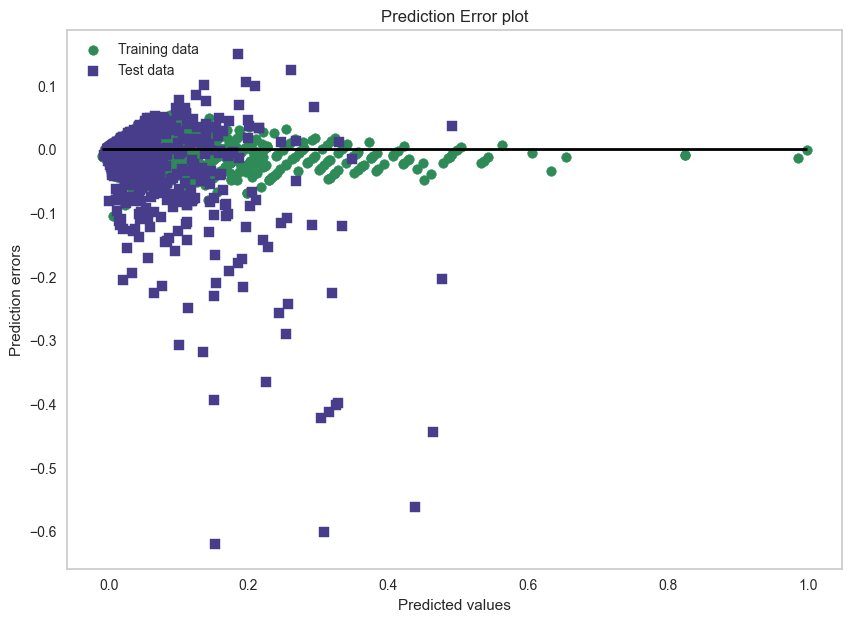

In [12]:

y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

# Calculating prediction errors
train_errors = y_train_pred - y_train
test_errors = y_test_pred - y_test

# Plotting prediction errors
plt.figure(figsize=(10, 7))
plt.scatter(y_train_pred, train_errors, c='#2E8B57', marker='o', label='Training data')
plt.scatter(y_test_pred, test_errors, c='#483D8B', marker='s', label='Test data')
plt.xlabel('Predicted values')
plt.ylabel('Prediction errors')
plt.legend(loc='upper left')
plt.hlines(y=0, xmin=min(y_train_pred.min(), y_test_pred.min()), xmax=max(y_train_pred.max(), y_test_pred.max()), color='black', lw=2)
plt.title('Prediction Error plot')
plt.grid()
plt.show()

## <span style="color:YellowGreen">Optimised CatBoost Regressor Model</span>

#### <span style="color:Teal">Setting Up Model</span>

In [143]:
numerical_features = ['height_in_cm', 'market_value_in_eur', 'age', 'remaining_contract_days',
       'games_total', 'goals_total', 'assists_total', 'minutes_played_total',
       'goals_for_total', 'goals_against_total', 'clean_sheet_total',
       'yellow_cards_total', 'red_cards_total', 'games_2019', 'goals_2019',
       'assists_2019', 'minutes_played_2019', 'goals_for_2019',
       'goals_against_2019', 'clean_sheet_2019', 'yellow_cards_2019',
       'red_cards_2019', 'games_2020', 'goals_2020', 'assists_2020',
       'minutes_played_2020', 'goals_for_2020', 'goals_against_2020',
       'clean_sheet_2020', 'yellow_cards_2020', 'red_cards_2020', 'games_2021',
       'goals_2021', 'assists_2021', 'minutes_played_2021', 'goals_for_2021',
       'goals_against_2021', 'clean_sheet_2021', 'yellow_cards_2021',
       'red_cards_2021', 'games_2022', 'goals_2022', 'assists_2022',
       'minutes_played_2022', 'goals_for_2022', 'goals_against_2022',
       'clean_sheet_2022', 'yellow_cards_2022', 'red_cards_2022', 'games_2023',
       'goals_2023', 'assists_2023', 'minutes_played_2023', 'goals_for_2023',
       'goals_against_2023', 'clean_sheet_2023', 'yellow_cards_2023',
       'red_cards_2023']

In [18]:
categorical_features = ['sub_position_Attacking Midfield', 'sub_position_Central Midfield', 'sub_position_Centre-Back',
                        'sub_position_Centre-Forward', 'sub_position_Defensive Midfield', 'sub_position_Goalkeeper', 
                        'sub_position_Left Midfield', 'sub_position_Left Winger', 'sub_position_Left-Back', 
                        'sub_position_Right Midfield', 'sub_position_Right Winger', 'sub_position_Right-Back', 
                        'sub_position_Second Striker', 'position_Attack', 'position_Defender', 'position_Goalkeeper', 
                        'position_Midfield', 'foot_both', 'foot_left', 'foot_right', 'current_club_domestic_competition_id_BE1', 
                        'current_club_domestic_competition_id_DK1', 'current_club_domestic_competition_id_ES1', 
                        'current_club_domestic_competition_id_FR1', 'current_club_domestic_competition_id_GB1', 
                        'current_club_domestic_competition_id_GR1', 'current_club_domestic_competition_id_IT1', 
                        'current_club_domestic_competition_id_L1', 'current_club_domestic_competition_id_NL1', 
                        'current_club_domestic_competition_id_PO1', 'current_club_domestic_competition_id_RU1', 
                        'current_club_domestic_competition_id_SC1', 'current_club_domestic_competition_id_TR1', 
                        'current_club_domestic_competition_id_UKR1', 'current_club_name_1.FC Heidenheim 1846', 
                        'current_club_name_1.FC Köln', 'current_club_name_1.FC Union Berlin', 'current_club_name_1.FSV Mainz 05', 
                        'current_club_name_AC Ajaccio', 'current_club_name_AC Horsens', 'current_club_name_AC Milan', 
                        'current_club_name_AC Monza', 'current_club_name_ACF Fiorentina', 'current_club_name_AE Kifisias', 
                        'current_club_name_AEK Athens', 'current_club_name_AFC Bournemouth', 'current_club_name_AJ Auxerre', 
                        'current_club_name_APO Levadiakos', 'current_club_name_AS Monaco', 'current_club_name_AS Roma', 
                        'current_club_name_AZ Alkmaar', 'current_club_name_Aalborg BK', 'current_club_name_Aarhus GF', 
                        'current_club_name_Aberdeen FC', 'current_club_name_Adana Demirspor', 'current_club_name_Ajax Amsterdam', 
                        'current_club_name_Akhmat Grozny', 'current_club_name_Alanyaspor', 'current_club_name_Almere City FC', 
                        'current_club_name_Angers SCO', 'current_club_name_Antalyaspor', 'current_club_name_Aris Thessaloniki', 
                        'current_club_name_Arsenal FC', 'current_club_name_Asteras Tripolis', 'current_club_name_Aston Villa', 
                        'current_club_name_Atalanta BC', 'current_club_name_Athletic Bilbao', 'current_club_name_Atlético de Madrid',
                        'current_club_name_Atromitos Athens', 'current_club_name_Baltika Kaliningrad', 'current_club_name_Basaksehir FK', 
                        'current_club_name_Bayer 04 Leverkusen', 'current_club_name_Bayern Munich', 'current_club_name_Besiktas JK', 
                        'current_club_name_Boavista FC', 'current_club_name_Bologna FC 1909', 'current_club_name_Borussia Dortmund', 
                        'current_club_name_Borussia Mönchengladbach', 'current_club_name_Brentford FC', 
                        'current_club_name_Brighton & Hove Albion', 'current_club_name_Bröndby IF', 'current_club_name_Burnley FC',
                        'current_club_name_CA Osasuna', 'current_club_name_CD Santa Clara', 'current_club_name_CF Estrela Amadora SAD', 
                        'current_club_name_CS Marítimo', 'current_club_name_CSKA Moscow', 'current_club_name_Cagliari Calcio', 
                        'current_club_name_Casa Pia AC', 'current_club_name_Caykur Rizespor', 'current_club_name_Celta de Vigo', 
                        'current_club_name_Celtic FC', 'current_club_name_Cercle Brugge', 'current_club_name_Chelsea FC', 
                        'current_club_name_Chornomorets Odessa', 'current_club_name_Clermont Foot 63', 'current_club_name_Club Brugge KV', 
                        'current_club_name_Crystal Palace', 'current_club_name_Cádiz CF', 'current_club_name_Deportivo Alavés', 
                        'current_club_name_Dundee FC', 'current_club_name_Dundee United FC', 'current_club_name_Dynamo Kyiv', 
                        'current_club_name_Dynamo Moscow', 'current_club_name_ESTAC Troyes', 'current_club_name_Eintracht Frankfurt', 
                        'current_club_name_Elche CF', 'current_club_name_Everton FC', 'current_club_name_Excelsior Rotterdam', 
                        'current_club_name_FC Arouca', 'current_club_name_FC Augsburg', 'current_club_name_FC Barcelona', 
                        'current_club_name_FC Copenhagen', 'current_club_name_FC Emmen', 'current_club_name_FC Empoli', 
                        'current_club_name_FC Famalicão', 'current_club_name_FC Groningen', 'current_club_name_FC Lorient', 
                        'current_club_name_FC Metz', 'current_club_name_FC Midtjylland', 'current_club_name_FC Nantes', 
                        'current_club_name_FC Nordsjaelland', 'current_club_name_FC Pari Nizhniy Novgorod', 
                        'current_club_name_FC Paços de Ferreira', 'current_club_name_FC Porto', 'current_club_name_FC Schalke 04', 
                        'current_club_name_FC Sochi', 'current_club_name_FC Toulouse', 'current_club_name_FC Utrecht', 
                        'current_club_name_FC Vizela', 'current_club_name_FC Volendam', 'current_club_name_FK Khimki', 
                        'current_club_name_FK Krasnodar', 'current_club_name_FK Minaj', 'current_club_name_FK Obolon Kyiv', 
                        'current_club_name_FK Oleksandriya', 'current_club_name_FK Orenburg', 'current_club_name_FK Polissya Zhytomyr', 
                        'current_club_name_FK Rostov', 'current_club_name_Fakel Voronezh', 'current_club_name_Fatih Karagümrük', 
                        'current_club_name_Fenerbahce', 'current_club_name_Feyenoord Rotterdam', 'current_club_name_Fortuna Sittard', 
                        'current_club_name_Frosinone Calcio', 'current_club_name_Fulham FC', 'current_club_name_GD Chaves', 
                        'current_club_name_GD Estoril Praia', 'current_club_name_Galatasaray', 'current_club_name_Gaziantep FK', 
                        'current_club_name_Genoa CFC', 'current_club_name_Getafe CF', 'current_club_name_Gil Vicente FC', 
                        'current_club_name_Giresunspor', 'current_club_name_Girona FC', 'current_club_name_Go Ahead Eagles', 
                        'current_club_name_Granada CF', 'current_club_name_Hatayspor', 'current_club_name_Heart of Midlothian FC', 
                        'current_club_name_Hellas Verona', 'current_club_name_Heracles Almelo', 'current_club_name_Hertha BSC', 
                        'current_club_name_Hibernian FC', 'current_club_name_Hvidovre IF', 'current_club_name_Ingulets Petrove', 
                        'current_club_name_Inter Milan', 'current_club_name_Ionikos Nikeas', 'current_club_name_Istanbulspor', 
                        'current_club_name_Juventus FC', 'current_club_name_KAA Gent', 'current_club_name_KAS Eupen', 
                        'current_club_name_KRC Genk', 'current_club_name_KV Kortrijk', 'current_club_name_KV Mechelen', 
                        'current_club_name_KV Oostende', 'current_club_name_KVC Westerlo', 'current_club_name_Kasimpasa', 
                        'current_club_name_Kayserispor', 'current_club_name_Kilmarnock FC', 'current_club_name_Kolos Kovalivka', 
                        'current_club_name_Konyaspor', 'current_club_name_Krylya Sovetov Samara', 'current_club_name_Kryvbas Kryvyi Rig', 
                        'current_club_name_LNZ Cherkasy', 'current_club_name_LOSC Lille', 'current_club_name_Le Havre AC', 
                        'current_club_name_Leeds United', 'current_club_name_Leicester City', 'current_club_name_Liverpool FC',
                        'current_club_name_Livingston FC', 'current_club_name_Lokomotiv Moscow', 'current_club_name_Luton Town', 
                        'current_club_name_Lyngby BK', 'current_club_name_MKE Ankaragücü', 'current_club_name_Manchester City', 
                        'current_club_name_Manchester United', 'current_club_name_Metalist 1925 Kharkiv', 
                        'current_club_name_Metalist Kharkiv', 'current_club_name_Montpellier HSC', 'current_club_name_Moreirense FC',
                        'current_club_name_Motherwell FC', 'current_club_name_NEC Nijmegen', 'current_club_name_NK Veres Rivne', 
                        'current_club_name_Newcastle United', 'current_club_name_Nottingham Forest', 'current_club_name_OFI Crete FC', 
                        'current_club_name_OGC Nice', 'current_club_name_Odense Boldklub', 'current_club_name_Olympiacos Piraeus', 
                        'current_club_name_Olympique Lyon', 'current_club_name_Olympique Marseille', 'current_club_name_Oud-Heverlee Leuven', 
                        'current_club_name_PAOK Thessaloniki', 'current_club_name_PAS Giannina', 'current_club_name_PAS Lamia 1964', 
                        'current_club_name_PEC Zwolle', 'current_club_name_PFK Lviv', 'current_club_name_PSV Eindhoven', 
                        'current_club_name_Panathinaikos Athens', 'current_club_name_Panetolikos GFS', 'current_club_name_Panserraikos', 
                        'current_club_name_Paris Saint-Germain', 'current_club_name_Pendikspor', 'current_club_name_Portimonense SC', 
                        'current_club_name_RB Leipzig', 'current_club_name_RC Lens', 'current_club_name_RC Strasbourg Alsace', 
                        'current_club_name_RCD Espanyol Barcelona', 'current_club_name_RCD Mallorca', 'current_club_name_RFC Seraing', 
                        'current_club_name_RKC Waalwijk', 'current_club_name_RSC Anderlecht', 'current_club_name_RSC Charleroi', 
                        'current_club_name_RWD Molenbeek', 'current_club_name_Randers FC', 'current_club_name_Rangers FC', 
                        'current_club_name_Rayo Vallecano', 'current_club_name_Real Betis Balompié', 'current_club_name_Real Madrid', 
                        'current_club_name_Real Sociedad', 'current_club_name_Real Valladolid CF', 'current_club_name_Rio Ave FC', 
                        'current_club_name_Ross County FC', 'current_club_name_Royal Antwerp FC', 
                        'current_club_name_Royale Union Saint Gilloise', 'current_club_name_Rubin Kazan', 'current_club_name_Rukh Lviv', 
                        'current_club_name_SC Braga', 'current_club_name_SC Cambuur Leeuwarden', 'current_club_name_SC Farense', 
                        'current_club_name_SC Freiburg', 'current_club_name_SC Heerenveen', 'current_club_name_SK Dnipro-1', 
                        'current_club_name_SL Benfica', 'current_club_name_SS Lazio', 'current_club_name_SSC Napoli', 
                        'current_club_name_SV Darmstadt 98', 'current_club_name_SV Werder Bremen', 'current_club_name_SV Zulte Waregem', 
                        'current_club_name_Samsunspor', 'current_club_name_Sevilla FC', 'current_club_name_Shakhtar Donetsk', 
                        'current_club_name_Sheffield United', 'current_club_name_Silkeborg IF', 'current_club_name_Sint-Truidense VV', 
                        'current_club_name_Sivasspor', 'current_club_name_Southampton FC', 'current_club_name_Sparta Rotterdam', 
                        'current_club_name_Spartak Moscow', 'current_club_name_Spezia Calcio', 'current_club_name_Sporting CP', 
                        'current_club_name_St. Johnstone FC', 'current_club_name_St. Mirren FC', 'current_club_name_Stade Brestois 29', 
                        'current_club_name_Stade Reims', 'current_club_name_Stade Rennais FC', 'current_club_name_Standard Liège', 
                        'current_club_name_TSG 1899 Hoffenheim', 'current_club_name_Torino FC', 'current_club_name_Torpedo Moscow', 
                        'current_club_name_Tottenham Hotspur', 'current_club_name_Trabzonspor', 'current_club_name_Twente Enschede FC', 
                        'current_club_name_UC Sampdoria', 'current_club_name_UD Almería', 'current_club_name_UD Las Palmas', 
                        'current_club_name_US Cremonese', 'current_club_name_US Lecce', 'current_club_name_US Salernitana 1919', 
                        'current_club_name_US Sassuolo', 'current_club_name_Udinese Calcio', 'current_club_name_Ural Yekaterinburg', 
                        'current_club_name_Valencia CF', 'current_club_name_Vejle Boldklub', 'current_club_name_VfB Stuttgart', 
                        'current_club_name_VfL Bochum', 'current_club_name_VfL Wolfsburg', 'current_club_name_Viborg FF', 
                        'current_club_name_Villarreal CF', 'current_club_name_Vitesse Arnhem', 'current_club_name_Vitória Guimarães SC', 
                        'current_club_name_Volos NPS', 'current_club_name_Vorskla Poltava', 'current_club_name_West Ham United', 
                        'current_club_name_Wolverhampton Wanderers', 'current_club_name_Zenit St. Petersburg', 
                        'current_club_name_Zorya Lugansk', 'current_club_name_Ümraniyespor', 'age_group_Ages 22 - 26', 
                        'age_group_Ages 27 - 32', 'age_group_Ages 33 - 38', 'age_group_Ages 39 - 44', 'age_group_Ages Under 22']

In [ ]:
# train_pool = Pool(data = X_train,
#                  label = y_train,
#                  cat_features = categorical_features)

# test_pool = Pool(data = X_test,
#                  label = y_test,
#                  cat_features = categorical_features)

In [13]:
# Defining model with the best parameters from GridSearchCV
best_catboost_model = CatBoostRegressor(depth=6, 
                                        iterations=400, 
                                        l2_leaf_reg=3, 
                                        learning_rate=0.1, 
                                       )

# Fitting the model to the training data
best_catboost_model.fit(X_train, y_train)


0:	learn: 0.0530998	total: 5.13ms	remaining: 2.04s
1:	learn: 0.0506293	total: 9.78ms	remaining: 1.95s
2:	learn: 0.0484559	total: 14.3ms	remaining: 1.9s
3:	learn: 0.0464194	total: 19ms	remaining: 1.89s
4:	learn: 0.0447482	total: 23.5ms	remaining: 1.86s
5:	learn: 0.0430517	total: 28.3ms	remaining: 1.86s
6:	learn: 0.0416838	total: 32.9ms	remaining: 1.85s
7:	learn: 0.0401648	total: 37.7ms	remaining: 1.85s
8:	learn: 0.0390727	total: 42.6ms	remaining: 1.85s
9:	learn: 0.0378659	total: 47.2ms	remaining: 1.84s
10:	learn: 0.0369369	total: 52ms	remaining: 1.84s
11:	learn: 0.0359390	total: 57ms	remaining: 1.84s
12:	learn: 0.0349706	total: 61.6ms	remaining: 1.83s
13:	learn: 0.0341962	total: 66.4ms	remaining: 1.83s
14:	learn: 0.0334268	total: 71ms	remaining: 1.82s
15:	learn: 0.0325824	total: 75.8ms	remaining: 1.82s
16:	learn: 0.0319319	total: 80.6ms	remaining: 1.81s
17:	learn: 0.0313521	total: 85.4ms	remaining: 1.81s
18:	learn: 0.0308177	total: 90.2ms	remaining: 1.81s
19:	learn: 0.0303170	total: 94.

179:	learn: 0.0142285	total: 841ms	remaining: 1.03s
180:	learn: 0.0142001	total: 846ms	remaining: 1.02s
181:	learn: 0.0141489	total: 851ms	remaining: 1.02s
182:	learn: 0.0141116	total: 855ms	remaining: 1.01s
183:	learn: 0.0140892	total: 860ms	remaining: 1.01s
184:	learn: 0.0140445	total: 864ms	remaining: 1s
185:	learn: 0.0139883	total: 873ms	remaining: 1s
186:	learn: 0.0139652	total: 878ms	remaining: 1000ms
187:	learn: 0.0139085	total: 882ms	remaining: 995ms
188:	learn: 0.0138785	total: 886ms	remaining: 989ms
189:	learn: 0.0138276	total: 891ms	remaining: 985ms
190:	learn: 0.0137861	total: 896ms	remaining: 980ms
191:	learn: 0.0137339	total: 900ms	remaining: 975ms
192:	learn: 0.0137305	total: 904ms	remaining: 970ms
193:	learn: 0.0137105	total: 909ms	remaining: 965ms
194:	learn: 0.0136767	total: 913ms	remaining: 960ms
195:	learn: 0.0136580	total: 918ms	remaining: 955ms
196:	learn: 0.0136545	total: 922ms	remaining: 950ms
197:	learn: 0.0136299	total: 926ms	remaining: 945ms
198:	learn: 0.013

366:	learn: 0.0103070	total: 1.64s	remaining: 148ms
367:	learn: 0.0102998	total: 1.65s	remaining: 143ms
368:	learn: 0.0102812	total: 1.65s	remaining: 139ms
369:	learn: 0.0102760	total: 1.66s	remaining: 134ms
370:	learn: 0.0102596	total: 1.66s	remaining: 130ms
371:	learn: 0.0102481	total: 1.66s	remaining: 125ms
372:	learn: 0.0102367	total: 1.67s	remaining: 121ms
373:	learn: 0.0102281	total: 1.67s	remaining: 116ms
374:	learn: 0.0102052	total: 1.68s	remaining: 112ms
375:	learn: 0.0101951	total: 1.68s	remaining: 107ms
376:	learn: 0.0101725	total: 1.69s	remaining: 103ms
377:	learn: 0.0101493	total: 1.69s	remaining: 98.5ms
378:	learn: 0.0101203	total: 1.7s	remaining: 94.1ms
379:	learn: 0.0101027	total: 1.7s	remaining: 89.6ms
380:	learn: 0.0100917	total: 1.71s	remaining: 85.1ms
381:	learn: 0.0100739	total: 1.71s	remaining: 80.6ms
382:	learn: 0.0100653	total: 1.72s	remaining: 76.1ms
383:	learn: 0.0100458	total: 1.72s	remaining: 71.6ms
384:	learn: 0.0100442	total: 1.72s	remaining: 67.2ms
385:	l

#### <span style="color:Teal">Models Results</span>

In [14]:
get_cv_scores(best_catboost_model)

0:	learn: 0.0524786	total: 4.75ms	remaining: 1.89s
1:	learn: 0.0503500	total: 8.84ms	remaining: 1.76s
2:	learn: 0.0484435	total: 12.8ms	remaining: 1.7s
3:	learn: 0.0464552	total: 16.8ms	remaining: 1.66s
4:	learn: 0.0445434	total: 20.7ms	remaining: 1.64s
5:	learn: 0.0430698	total: 25ms	remaining: 1.64s
6:	learn: 0.0416969	total: 29ms	remaining: 1.63s
7:	learn: 0.0402087	total: 33ms	remaining: 1.62s
8:	learn: 0.0389949	total: 36.9ms	remaining: 1.6s
9:	learn: 0.0378790	total: 41ms	remaining: 1.6s
10:	learn: 0.0368150	total: 44.9ms	remaining: 1.59s
11:	learn: 0.0358749	total: 48.8ms	remaining: 1.58s
12:	learn: 0.0349429	total: 52.7ms	remaining: 1.57s
13:	learn: 0.0342975	total: 56.6ms	remaining: 1.56s
14:	learn: 0.0335050	total: 60.5ms	remaining: 1.55s
15:	learn: 0.0328806	total: 64.4ms	remaining: 1.54s
16:	learn: 0.0321389	total: 68.3ms	remaining: 1.54s
17:	learn: 0.0314856	total: 72.2ms	remaining: 1.53s
18:	learn: 0.0309485	total: 76.2ms	remaining: 1.53s
19:	learn: 0.0304240	total: 80.2m

179:	learn: 0.0141490	total: 801ms	remaining: 978ms
180:	learn: 0.0141139	total: 805ms	remaining: 974ms
181:	learn: 0.0140843	total: 810ms	remaining: 970ms
182:	learn: 0.0140398	total: 815ms	remaining: 966ms
183:	learn: 0.0140142	total: 820ms	remaining: 963ms
184:	learn: 0.0139531	total: 825ms	remaining: 959ms
185:	learn: 0.0139219	total: 830ms	remaining: 955ms
186:	learn: 0.0138749	total: 835ms	remaining: 951ms
187:	learn: 0.0138299	total: 840ms	remaining: 947ms
188:	learn: 0.0137873	total: 845ms	remaining: 943ms
189:	learn: 0.0137553	total: 850ms	remaining: 939ms
190:	learn: 0.0137084	total: 854ms	remaining: 935ms
191:	learn: 0.0136741	total: 860ms	remaining: 931ms
192:	learn: 0.0136432	total: 865ms	remaining: 927ms
193:	learn: 0.0136261	total: 869ms	remaining: 923ms
194:	learn: 0.0135811	total: 874ms	remaining: 919ms
195:	learn: 0.0135480	total: 879ms	remaining: 915ms
196:	learn: 0.0135070	total: 884ms	remaining: 911ms
197:	learn: 0.0134877	total: 891ms	remaining: 909ms
198:	learn: 

364:	learn: 0.0101262	total: 1.63s	remaining: 157ms
365:	learn: 0.0101103	total: 1.64s	remaining: 152ms
366:	learn: 0.0100921	total: 1.64s	remaining: 148ms
367:	learn: 0.0100840	total: 1.65s	remaining: 143ms
368:	learn: 0.0100648	total: 1.65s	remaining: 139ms
369:	learn: 0.0100459	total: 1.66s	remaining: 134ms
370:	learn: 0.0100347	total: 1.66s	remaining: 130ms
371:	learn: 0.0100257	total: 1.66s	remaining: 125ms
372:	learn: 0.0100077	total: 1.67s	remaining: 121ms
373:	learn: 0.0099887	total: 1.67s	remaining: 116ms
374:	learn: 0.0099785	total: 1.68s	remaining: 112ms
375:	learn: 0.0099665	total: 1.68s	remaining: 107ms
376:	learn: 0.0099549	total: 1.69s	remaining: 103ms
377:	learn: 0.0099444	total: 1.69s	remaining: 98.4ms
378:	learn: 0.0099267	total: 1.7s	remaining: 93.9ms
379:	learn: 0.0099114	total: 1.7s	remaining: 89.5ms
380:	learn: 0.0098896	total: 1.7s	remaining: 85ms
381:	learn: 0.0098843	total: 1.71s	remaining: 80.5ms
382:	learn: 0.0098740	total: 1.71s	remaining: 76ms
383:	learn: 0

137:	learn: 0.0165428	total: 595ms	remaining: 1.13s
138:	learn: 0.0165052	total: 599ms	remaining: 1.13s
139:	learn: 0.0165007	total: 603ms	remaining: 1.12s
140:	learn: 0.0164336	total: 607ms	remaining: 1.11s
141:	learn: 0.0163669	total: 611ms	remaining: 1.11s
142:	learn: 0.0163101	total: 615ms	remaining: 1.1s
143:	learn: 0.0163059	total: 619ms	remaining: 1.1s
144:	learn: 0.0162541	total: 624ms	remaining: 1.1s
145:	learn: 0.0161835	total: 628ms	remaining: 1.09s
146:	learn: 0.0161486	total: 633ms	remaining: 1.09s
147:	learn: 0.0161106	total: 637ms	remaining: 1.08s
148:	learn: 0.0160776	total: 641ms	remaining: 1.08s
149:	learn: 0.0159926	total: 645ms	remaining: 1.07s
150:	learn: 0.0159288	total: 649ms	remaining: 1.07s
151:	learn: 0.0158507	total: 652ms	remaining: 1.06s
152:	learn: 0.0158073	total: 657ms	remaining: 1.06s
153:	learn: 0.0157684	total: 660ms	remaining: 1.05s
154:	learn: 0.0157421	total: 664ms	remaining: 1.05s
155:	learn: 0.0156759	total: 668ms	remaining: 1.04s
156:	learn: 0.0

327:	learn: 0.0109636	total: 1.42s	remaining: 311ms
328:	learn: 0.0109415	total: 1.42s	remaining: 306ms
329:	learn: 0.0109264	total: 1.42s	remaining: 302ms
330:	learn: 0.0109066	total: 1.43s	remaining: 298ms
331:	learn: 0.0108895	total: 1.43s	remaining: 293ms
332:	learn: 0.0108722	total: 1.44s	remaining: 289ms
333:	learn: 0.0108528	total: 1.44s	remaining: 285ms
334:	learn: 0.0108127	total: 1.45s	remaining: 280ms
335:	learn: 0.0107930	total: 1.45s	remaining: 276ms
336:	learn: 0.0107766	total: 1.45s	remaining: 272ms
337:	learn: 0.0107598	total: 1.46s	remaining: 268ms
338:	learn: 0.0107474	total: 1.46s	remaining: 263ms
339:	learn: 0.0107261	total: 1.47s	remaining: 259ms
340:	learn: 0.0107101	total: 1.47s	remaining: 255ms
341:	learn: 0.0106978	total: 1.48s	remaining: 250ms
342:	learn: 0.0106814	total: 1.48s	remaining: 246ms
343:	learn: 0.0106663	total: 1.49s	remaining: 242ms
344:	learn: 0.0106362	total: 1.49s	remaining: 238ms
345:	learn: 0.0106247	total: 1.5s	remaining: 233ms
346:	learn: 0

98:	learn: 0.0178811	total: 399ms	remaining: 1.21s
99:	learn: 0.0178177	total: 403ms	remaining: 1.21s
100:	learn: 0.0177687	total: 408ms	remaining: 1.21s
101:	learn: 0.0177026	total: 412ms	remaining: 1.2s
102:	learn: 0.0176187	total: 416ms	remaining: 1.2s
103:	learn: 0.0175547	total: 420ms	remaining: 1.2s
104:	learn: 0.0174639	total: 425ms	remaining: 1.19s
105:	learn: 0.0174196	total: 429ms	remaining: 1.19s
106:	learn: 0.0173560	total: 433ms	remaining: 1.19s
107:	learn: 0.0172684	total: 437ms	remaining: 1.18s
108:	learn: 0.0172288	total: 441ms	remaining: 1.18s
109:	learn: 0.0171572	total: 446ms	remaining: 1.17s
110:	learn: 0.0170726	total: 450ms	remaining: 1.17s
111:	learn: 0.0170297	total: 454ms	remaining: 1.17s
112:	learn: 0.0169890	total: 459ms	remaining: 1.17s
113:	learn: 0.0169154	total: 463ms	remaining: 1.16s
114:	learn: 0.0168625	total: 468ms	remaining: 1.16s
115:	learn: 0.0168131	total: 472ms	remaining: 1.16s
116:	learn: 0.0167381	total: 477ms	remaining: 1.15s
117:	learn: 0.016

263:	learn: 0.0116089	total: 1.22s	remaining: 629ms
264:	learn: 0.0115936	total: 1.23s	remaining: 624ms
265:	learn: 0.0115752	total: 1.23s	remaining: 620ms
266:	learn: 0.0115512	total: 1.24s	remaining: 616ms
267:	learn: 0.0115372	total: 1.24s	remaining: 611ms
268:	learn: 0.0115132	total: 1.25s	remaining: 606ms
269:	learn: 0.0114888	total: 1.25s	remaining: 602ms
270:	learn: 0.0114675	total: 1.25s	remaining: 598ms
271:	learn: 0.0114490	total: 1.26s	remaining: 593ms
272:	learn: 0.0114305	total: 1.26s	remaining: 589ms
273:	learn: 0.0114184	total: 1.27s	remaining: 584ms
274:	learn: 0.0114010	total: 1.27s	remaining: 580ms
275:	learn: 0.0113754	total: 1.28s	remaining: 575ms
276:	learn: 0.0113585	total: 1.28s	remaining: 570ms
277:	learn: 0.0113385	total: 1.29s	remaining: 565ms
278:	learn: 0.0113246	total: 1.29s	remaining: 561ms
279:	learn: 0.0113108	total: 1.3s	remaining: 556ms
280:	learn: 0.0112904	total: 1.3s	remaining: 551ms
281:	learn: 0.0112721	total: 1.31s	remaining: 547ms
282:	learn: 0.

66:	learn: 0.0208535	total: 272ms	remaining: 1.35s
67:	learn: 0.0207113	total: 276ms	remaining: 1.35s
68:	learn: 0.0206106	total: 280ms	remaining: 1.34s
69:	learn: 0.0205289	total: 284ms	remaining: 1.34s
70:	learn: 0.0204415	total: 288ms	remaining: 1.34s
71:	learn: 0.0203754	total: 293ms	remaining: 1.33s
72:	learn: 0.0202785	total: 297ms	remaining: 1.33s
73:	learn: 0.0201829	total: 301ms	remaining: 1.33s
74:	learn: 0.0200933	total: 306ms	remaining: 1.32s
75:	learn: 0.0199795	total: 310ms	remaining: 1.32s
76:	learn: 0.0199153	total: 314ms	remaining: 1.32s
77:	learn: 0.0198150	total: 318ms	remaining: 1.31s
78:	learn: 0.0197020	total: 322ms	remaining: 1.31s
79:	learn: 0.0196466	total: 326ms	remaining: 1.3s
80:	learn: 0.0195854	total: 330ms	remaining: 1.3s
81:	learn: 0.0195000	total: 334ms	remaining: 1.29s
82:	learn: 0.0193827	total: 338ms	remaining: 1.29s
83:	learn: 0.0193299	total: 342ms	remaining: 1.29s
84:	learn: 0.0192068	total: 346ms	remaining: 1.28s
85:	learn: 0.0191442	total: 350ms

259:	learn: 0.0119944	total: 1.08s	remaining: 581ms
260:	learn: 0.0119927	total: 1.08s	remaining: 577ms
261:	learn: 0.0119732	total: 1.09s	remaining: 573ms
262:	learn: 0.0119540	total: 1.09s	remaining: 569ms
263:	learn: 0.0119339	total: 1.1s	remaining: 565ms
264:	learn: 0.0119081	total: 1.1s	remaining: 561ms
265:	learn: 0.0118895	total: 1.1s	remaining: 557ms
266:	learn: 0.0118874	total: 1.11s	remaining: 553ms
267:	learn: 0.0118764	total: 1.11s	remaining: 549ms
268:	learn: 0.0118606	total: 1.12s	remaining: 545ms
269:	learn: 0.0118272	total: 1.12s	remaining: 540ms
270:	learn: 0.0118062	total: 1.13s	remaining: 536ms
271:	learn: 0.0117909	total: 1.13s	remaining: 532ms
272:	learn: 0.0117699	total: 1.13s	remaining: 527ms
273:	learn: 0.0117377	total: 1.14s	remaining: 523ms
274:	learn: 0.0117158	total: 1.14s	remaining: 519ms
275:	learn: 0.0116837	total: 1.15s	remaining: 515ms
276:	learn: 0.0116491	total: 1.15s	remaining: 511ms
277:	learn: 0.0116273	total: 1.15s	remaining: 506ms
278:	learn: 0.0

51:	learn: 0.0216406	total: 206ms	remaining: 1.38s
52:	learn: 0.0215010	total: 211ms	remaining: 1.38s
53:	learn: 0.0214596	total: 215ms	remaining: 1.38s
54:	learn: 0.0213770	total: 220ms	remaining: 1.38s
55:	learn: 0.0212360	total: 224ms	remaining: 1.38s
56:	learn: 0.0211323	total: 229ms	remaining: 1.38s
57:	learn: 0.0210366	total: 234ms	remaining: 1.38s
58:	learn: 0.0209680	total: 239ms	remaining: 1.38s
59:	learn: 0.0208784	total: 244ms	remaining: 1.38s
60:	learn: 0.0207547	total: 248ms	remaining: 1.38s
61:	learn: 0.0206137	total: 253ms	remaining: 1.38s
62:	learn: 0.0205139	total: 258ms	remaining: 1.38s
63:	learn: 0.0203708	total: 263ms	remaining: 1.38s
64:	learn: 0.0203046	total: 267ms	remaining: 1.38s
65:	learn: 0.0202453	total: 271ms	remaining: 1.37s
66:	learn: 0.0201640	total: 276ms	remaining: 1.37s
67:	learn: 0.0200806	total: 281ms	remaining: 1.37s
68:	learn: 0.0200161	total: 285ms	remaining: 1.37s
69:	learn: 0.0199541	total: 290ms	remaining: 1.37s
70:	learn: 0.0198816	total: 294

231:	learn: 0.0125332	total: 1s	remaining: 725ms
232:	learn: 0.0125116	total: 1.01s	remaining: 721ms
233:	learn: 0.0124943	total: 1.01s	remaining: 717ms
234:	learn: 0.0124794	total: 1.02s	remaining: 714ms
235:	learn: 0.0124686	total: 1.02s	remaining: 709ms
236:	learn: 0.0124406	total: 1.02s	remaining: 705ms
237:	learn: 0.0124158	total: 1.03s	remaining: 702ms
238:	learn: 0.0123868	total: 1.03s	remaining: 698ms
239:	learn: 0.0123628	total: 1.04s	remaining: 694ms
240:	learn: 0.0123422	total: 1.05s	remaining: 690ms
241:	learn: 0.0123159	total: 1.05s	remaining: 686ms
242:	learn: 0.0122913	total: 1.06s	remaining: 682ms
243:	learn: 0.0122733	total: 1.06s	remaining: 678ms
244:	learn: 0.0122533	total: 1.06s	remaining: 674ms
245:	learn: 0.0122374	total: 1.07s	remaining: 670ms
246:	learn: 0.0122152	total: 1.07s	remaining: 666ms
247:	learn: 0.0121998	total: 1.08s	remaining: 662ms
248:	learn: 0.0121871	total: 1.08s	remaining: 658ms
249:	learn: 0.0121629	total: 1.09s	remaining: 653ms
250:	learn: 0.0

0:	learn: 0.0543209	total: 5.17ms	remaining: 2.06s
1:	learn: 0.0517843	total: 9.97ms	remaining: 1.98s
2:	learn: 0.0497333	total: 14.3ms	remaining: 1.9s
3:	learn: 0.0476079	total: 19.3ms	remaining: 1.91s
4:	learn: 0.0457730	total: 23.7ms	remaining: 1.87s
5:	learn: 0.0442704	total: 28.4ms	remaining: 1.86s
6:	learn: 0.0429230	total: 33ms	remaining: 1.85s
7:	learn: 0.0414686	total: 38ms	remaining: 1.86s
8:	learn: 0.0401767	total: 42.7ms	remaining: 1.85s
9:	learn: 0.0389767	total: 47.5ms	remaining: 1.85s
10:	learn: 0.0378650	total: 52.1ms	remaining: 1.84s
11:	learn: 0.0368541	total: 56.6ms	remaining: 1.83s
12:	learn: 0.0359677	total: 61.3ms	remaining: 1.82s
13:	learn: 0.0350056	total: 65.9ms	remaining: 1.82s
14:	learn: 0.0343192	total: 70.5ms	remaining: 1.81s
15:	learn: 0.0335479	total: 75.2ms	remaining: 1.8s
16:	learn: 0.0327923	total: 80ms	remaining: 1.8s
17:	learn: 0.0321224	total: 84.6ms	remaining: 1.79s
18:	learn: 0.0314087	total: 89ms	remaining: 1.78s
19:	learn: 0.0309295	total: 93.8m

185:	learn: 0.0142711	total: 1.06s	remaining: 1.22s
186:	learn: 0.0142485	total: 1.06s	remaining: 1.21s
187:	learn: 0.0141910	total: 1.07s	remaining: 1.21s
188:	learn: 0.0141463	total: 1.07s	remaining: 1.2s
189:	learn: 0.0141060	total: 1.08s	remaining: 1.19s
190:	learn: 0.0140852	total: 1.08s	remaining: 1.19s
191:	learn: 0.0140600	total: 1.09s	remaining: 1.18s
192:	learn: 0.0140337	total: 1.09s	remaining: 1.18s
193:	learn: 0.0140105	total: 1.1s	remaining: 1.17s
194:	learn: 0.0139774	total: 1.11s	remaining: 1.16s
195:	learn: 0.0139494	total: 1.11s	remaining: 1.16s
196:	learn: 0.0139271	total: 1.12s	remaining: 1.15s
197:	learn: 0.0138944	total: 1.12s	remaining: 1.15s
198:	learn: 0.0138619	total: 1.13s	remaining: 1.14s
199:	learn: 0.0138122	total: 1.13s	remaining: 1.13s
200:	learn: 0.0137769	total: 1.14s	remaining: 1.13s
201:	learn: 0.0137569	total: 1.14s	remaining: 1.12s
202:	learn: 0.0137272	total: 1.15s	remaining: 1.11s
203:	learn: 0.0136844	total: 1.15s	remaining: 1.11s
204:	learn: 0.

350:	learn: 0.0105007	total: 1.87s	remaining: 261ms
351:	learn: 0.0104832	total: 1.87s	remaining: 256ms
352:	learn: 0.0104706	total: 1.88s	remaining: 250ms
353:	learn: 0.0104444	total: 1.88s	remaining: 245ms
354:	learn: 0.0104306	total: 1.89s	remaining: 239ms
355:	learn: 0.0104155	total: 1.89s	remaining: 234ms
356:	learn: 0.0103990	total: 1.9s	remaining: 229ms
357:	learn: 0.0103814	total: 1.9s	remaining: 223ms
358:	learn: 0.0103728	total: 1.91s	remaining: 218ms
359:	learn: 0.0103563	total: 1.91s	remaining: 213ms
360:	learn: 0.0103434	total: 1.92s	remaining: 207ms
361:	learn: 0.0103297	total: 1.92s	remaining: 202ms
362:	learn: 0.0103172	total: 1.93s	remaining: 196ms
363:	learn: 0.0103106	total: 1.93s	remaining: 191ms
364:	learn: 0.0103006	total: 1.94s	remaining: 186ms
365:	learn: 0.0102988	total: 1.94s	remaining: 180ms
366:	learn: 0.0102846	total: 1.95s	remaining: 175ms
367:	learn: 0.0102608	total: 1.95s	remaining: 170ms
368:	learn: 0.0102432	total: 1.95s	remaining: 164ms
369:	learn: 0.

127:	learn: 0.0164468	total: 502ms	remaining: 1.07s
128:	learn: 0.0163938	total: 506ms	remaining: 1.06s
129:	learn: 0.0163487	total: 510ms	remaining: 1.06s
130:	learn: 0.0163043	total: 514ms	remaining: 1.05s
131:	learn: 0.0162406	total: 518ms	remaining: 1.05s
132:	learn: 0.0161616	total: 523ms	remaining: 1.05s
133:	learn: 0.0161369	total: 527ms	remaining: 1.05s
134:	learn: 0.0161142	total: 532ms	remaining: 1.04s
135:	learn: 0.0160712	total: 536ms	remaining: 1.04s
136:	learn: 0.0160161	total: 541ms	remaining: 1.04s
137:	learn: 0.0159435	total: 545ms	remaining: 1.03s
138:	learn: 0.0158872	total: 549ms	remaining: 1.03s
139:	learn: 0.0158083	total: 554ms	remaining: 1.03s
140:	learn: 0.0157297	total: 558ms	remaining: 1.02s
141:	learn: 0.0156718	total: 563ms	remaining: 1.02s
142:	learn: 0.0156352	total: 567ms	remaining: 1.02s
143:	learn: 0.0155957	total: 571ms	remaining: 1.01s
144:	learn: 0.0155488	total: 576ms	remaining: 1.01s
145:	learn: 0.0154833	total: 580ms	remaining: 1.01s
146:	learn: 

315:	learn: 0.0108150	total: 1.3s	remaining: 347ms
316:	learn: 0.0108081	total: 1.31s	remaining: 342ms
317:	learn: 0.0107929	total: 1.31s	remaining: 338ms
318:	learn: 0.0107687	total: 1.32s	remaining: 334ms
319:	learn: 0.0107489	total: 1.32s	remaining: 330ms
320:	learn: 0.0107309	total: 1.32s	remaining: 326ms
321:	learn: 0.0107087	total: 1.33s	remaining: 322ms
322:	learn: 0.0106818	total: 1.33s	remaining: 318ms
323:	learn: 0.0106564	total: 1.34s	remaining: 314ms
324:	learn: 0.0106410	total: 1.34s	remaining: 310ms
325:	learn: 0.0106147	total: 1.35s	remaining: 306ms
326:	learn: 0.0106058	total: 1.35s	remaining: 302ms
327:	learn: 0.0105853	total: 1.36s	remaining: 298ms
328:	learn: 0.0105665	total: 1.36s	remaining: 294ms
329:	learn: 0.0105465	total: 1.37s	remaining: 290ms
330:	learn: 0.0105238	total: 1.37s	remaining: 286ms
331:	learn: 0.0105116	total: 1.37s	remaining: 282ms
332:	learn: 0.0104892	total: 1.38s	remaining: 278ms
333:	learn: 0.0104814	total: 1.38s	remaining: 273ms
334:	learn: 0

101:	learn: 0.0183359	total: 408ms	remaining: 1.19s
102:	learn: 0.0182733	total: 413ms	remaining: 1.19s
103:	learn: 0.0181630	total: 417ms	remaining: 1.19s
104:	learn: 0.0180698	total: 422ms	remaining: 1.19s
105:	learn: 0.0180286	total: 426ms	remaining: 1.18s
106:	learn: 0.0180014	total: 430ms	remaining: 1.18s
107:	learn: 0.0179340	total: 436ms	remaining: 1.18s
108:	learn: 0.0178631	total: 440ms	remaining: 1.18s
109:	learn: 0.0177968	total: 444ms	remaining: 1.17s
110:	learn: 0.0177263	total: 449ms	remaining: 1.17s
111:	learn: 0.0176691	total: 454ms	remaining: 1.17s
112:	learn: 0.0175937	total: 458ms	remaining: 1.16s
113:	learn: 0.0174943	total: 462ms	remaining: 1.16s
114:	learn: 0.0174412	total: 467ms	remaining: 1.16s
115:	learn: 0.0173990	total: 471ms	remaining: 1.15s
116:	learn: 0.0173538	total: 475ms	remaining: 1.15s
117:	learn: 0.0173007	total: 480ms	remaining: 1.15s
118:	learn: 0.0172494	total: 484ms	remaining: 1.14s
119:	learn: 0.0171799	total: 489ms	remaining: 1.14s
120:	learn: 

302:	learn: 0.0112320	total: 1.24s	remaining: 398ms
303:	learn: 0.0112160	total: 1.25s	remaining: 394ms
304:	learn: 0.0111871	total: 1.25s	remaining: 390ms
305:	learn: 0.0111695	total: 1.26s	remaining: 386ms
306:	learn: 0.0111480	total: 1.26s	remaining: 382ms
307:	learn: 0.0111333	total: 1.26s	remaining: 378ms
308:	learn: 0.0111158	total: 1.27s	remaining: 374ms
309:	learn: 0.0111000	total: 1.27s	remaining: 370ms
310:	learn: 0.0110835	total: 1.28s	remaining: 366ms
311:	learn: 0.0110664	total: 1.28s	remaining: 362ms
312:	learn: 0.0110539	total: 1.29s	remaining: 358ms
313:	learn: 0.0110368	total: 1.29s	remaining: 354ms
314:	learn: 0.0110247	total: 1.29s	remaining: 350ms
315:	learn: 0.0110145	total: 1.3s	remaining: 346ms
316:	learn: 0.0109902	total: 1.3s	remaining: 342ms
317:	learn: 0.0109764	total: 1.31s	remaining: 338ms
318:	learn: 0.0109460	total: 1.31s	remaining: 334ms
319:	learn: 0.0109321	total: 1.32s	remaining: 329ms
320:	learn: 0.0109197	total: 1.32s	remaining: 325ms
321:	learn: 0.

93:	learn: 0.0187720	total: 393ms	remaining: 1.28s
94:	learn: 0.0186903	total: 398ms	remaining: 1.28s
95:	learn: 0.0186469	total: 403ms	remaining: 1.27s
96:	learn: 0.0185705	total: 407ms	remaining: 1.27s
97:	learn: 0.0185029	total: 412ms	remaining: 1.27s
98:	learn: 0.0184460	total: 416ms	remaining: 1.26s
99:	learn: 0.0183882	total: 420ms	remaining: 1.26s
100:	learn: 0.0183114	total: 425ms	remaining: 1.26s
101:	learn: 0.0182586	total: 430ms	remaining: 1.25s
102:	learn: 0.0182178	total: 434ms	remaining: 1.25s
103:	learn: 0.0181780	total: 438ms	remaining: 1.25s
104:	learn: 0.0180621	total: 443ms	remaining: 1.24s
105:	learn: 0.0179963	total: 448ms	remaining: 1.24s
106:	learn: 0.0179393	total: 452ms	remaining: 1.24s
107:	learn: 0.0178491	total: 456ms	remaining: 1.23s
108:	learn: 0.0177770	total: 461ms	remaining: 1.23s
109:	learn: 0.0177299	total: 465ms	remaining: 1.23s
110:	learn: 0.0176560	total: 470ms	remaining: 1.22s
111:	learn: 0.0175841	total: 475ms	remaining: 1.22s
112:	learn: 0.01750

266:	learn: 0.0120478	total: 1.18s	remaining: 586ms
267:	learn: 0.0120384	total: 1.18s	remaining: 581ms
268:	learn: 0.0120169	total: 1.18s	remaining: 577ms
269:	learn: 0.0120027	total: 1.19s	remaining: 572ms
270:	learn: 0.0119833	total: 1.19s	remaining: 568ms
271:	learn: 0.0119725	total: 1.2s	remaining: 563ms
272:	learn: 0.0119576	total: 1.2s	remaining: 559ms
273:	learn: 0.0119378	total: 1.21s	remaining: 555ms
274:	learn: 0.0119170	total: 1.21s	remaining: 551ms
275:	learn: 0.0118888	total: 1.22s	remaining: 546ms
276:	learn: 0.0118589	total: 1.22s	remaining: 542ms
277:	learn: 0.0118498	total: 1.23s	remaining: 538ms
278:	learn: 0.0118229	total: 1.23s	remaining: 534ms
279:	learn: 0.0118051	total: 1.24s	remaining: 529ms
280:	learn: 0.0117917	total: 1.24s	remaining: 525ms
281:	learn: 0.0117711	total: 1.24s	remaining: 521ms
282:	learn: 0.0117532	total: 1.25s	remaining: 516ms
283:	learn: 0.0117347	total: 1.25s	remaining: 512ms
284:	learn: 0.0117262	total: 1.26s	remaining: 508ms
285:	learn: 0.

58:	learn: 0.0219093	total: 222ms	remaining: 1.28s
59:	learn: 0.0218047	total: 226ms	remaining: 1.28s
60:	learn: 0.0216892	total: 231ms	remaining: 1.28s
61:	learn: 0.0215241	total: 235ms	remaining: 1.28s
62:	learn: 0.0213752	total: 240ms	remaining: 1.28s
63:	learn: 0.0212342	total: 244ms	remaining: 1.28s
64:	learn: 0.0211368	total: 249ms	remaining: 1.28s
65:	learn: 0.0210688	total: 253ms	remaining: 1.28s
66:	learn: 0.0210127	total: 258ms	remaining: 1.28s
67:	learn: 0.0208686	total: 262ms	remaining: 1.28s
68:	learn: 0.0208063	total: 267ms	remaining: 1.28s
69:	learn: 0.0207169	total: 271ms	remaining: 1.28s
70:	learn: 0.0205891	total: 275ms	remaining: 1.28s
71:	learn: 0.0204758	total: 280ms	remaining: 1.27s
72:	learn: 0.0204419	total: 284ms	remaining: 1.27s
73:	learn: 0.0203776	total: 289ms	remaining: 1.27s
74:	learn: 0.0203171	total: 293ms	remaining: 1.27s
75:	learn: 0.0202051	total: 298ms	remaining: 1.27s
76:	learn: 0.0200723	total: 302ms	remaining: 1.27s
77:	learn: 0.0199959	total: 306

217:	learn: 0.0131649	total: 1.03s	remaining: 861ms
218:	learn: 0.0131135	total: 1.04s	remaining: 860ms
219:	learn: 0.0131090	total: 1.05s	remaining: 862ms
220:	learn: 0.0130871	total: 1.07s	remaining: 866ms
221:	learn: 0.0130599	total: 1.08s	remaining: 864ms
222:	learn: 0.0130273	total: 1.08s	remaining: 859ms
223:	learn: 0.0130096	total: 1.09s	remaining: 855ms
224:	learn: 0.0129815	total: 1.09s	remaining: 851ms
225:	learn: 0.0129572	total: 1.1s	remaining: 846ms
226:	learn: 0.0129407	total: 1.1s	remaining: 841ms
227:	learn: 0.0129125	total: 1.11s	remaining: 836ms
228:	learn: 0.0128948	total: 1.11s	remaining: 831ms
229:	learn: 0.0128626	total: 1.12s	remaining: 826ms
230:	learn: 0.0128135	total: 1.12s	remaining: 821ms
231:	learn: 0.0128019	total: 1.13s	remaining: 816ms
232:	learn: 0.0127813	total: 1.13s	remaining: 811ms
233:	learn: 0.0127756	total: 1.14s	remaining: 806ms
234:	learn: 0.0127589	total: 1.14s	remaining: 801ms
235:	learn: 0.0127350	total: 1.15s	remaining: 796ms
236:	learn: 0.

386:	learn: 0.0100145	total: 1.83s	remaining: 61.6ms
387:	learn: 0.0100002	total: 1.84s	remaining: 56.9ms
388:	learn: 0.0099946	total: 1.84s	remaining: 52.1ms
389:	learn: 0.0099811	total: 1.85s	remaining: 47.3ms
390:	learn: 0.0099688	total: 1.85s	remaining: 42.6ms
391:	learn: 0.0099415	total: 1.85s	remaining: 37.9ms
392:	learn: 0.0099200	total: 1.86s	remaining: 33.1ms
393:	learn: 0.0099032	total: 1.86s	remaining: 28.4ms
394:	learn: 0.0098749	total: 1.87s	remaining: 23.7ms
395:	learn: 0.0098555	total: 1.87s	remaining: 18.9ms
396:	learn: 0.0098478	total: 1.88s	remaining: 14.2ms
397:	learn: 0.0098369	total: 1.88s	remaining: 9.45ms
398:	learn: 0.0098165	total: 1.89s	remaining: 4.72ms
399:	learn: 0.0098003	total: 1.89s	remaining: 0us
CV Mean R²:  0.7659731194143623
CV STD:  0.03898029381829216
Mean Absolute Error (MAE):  0.0055111329356951596
Mean Squared Error (MSE):  9.678244761650275e-05
Root Mean Squared Error (RMSE):  0.009837807053225976
R-squared (R²):  0.9687447692008863




In [15]:
# Comparing training to testing results
print(f'R² training set score: {best_catboost_model.score(X_train, y_train)}')
print(f'R² testing set score: {best_catboost_model.score(X_test, y_test)}')

R² training set score: 0.9687447692008863
R² testing set score: 0.6704800253813359


The results above indocate an Overfitting model. Early stopping is applied below to counter Overfitting.

In [21]:
# Defining model with the best parameters from GridSearchCV
best_catboost_modelB = CatBoostRegressor(depth=6, 
                                        iterations=1000, 
                                        l2_leaf_reg=3, 
                                        learning_rate=0.1, 
                                        cat_features = categorical_features,
                                        early_stopping_rounds = 50,
                                       )

# Fitting the model to the training data
best_catboost_modelB.fit(X_train, y_train)

0:	learn: 0.0532014	total: 4.81ms	remaining: 4.81s
1:	learn: 0.0507950	total: 9.77ms	remaining: 4.88s
2:	learn: 0.0485512	total: 14.5ms	remaining: 4.83s
3:	learn: 0.0465817	total: 19ms	remaining: 4.72s
4:	learn: 0.0449897	total: 23.8ms	remaining: 4.74s
5:	learn: 0.0433795	total: 28.4ms	remaining: 4.71s
6:	learn: 0.0417947	total: 33.4ms	remaining: 4.73s
7:	learn: 0.0405217	total: 38.1ms	remaining: 4.72s
8:	learn: 0.0392545	total: 42.6ms	remaining: 4.69s
9:	learn: 0.0380838	total: 47.7ms	remaining: 4.72s
10:	learn: 0.0369720	total: 52.6ms	remaining: 4.73s
11:	learn: 0.0359741	total: 57ms	remaining: 4.69s
12:	learn: 0.0351015	total: 61.9ms	remaining: 4.7s
13:	learn: 0.0340495	total: 66.7ms	remaining: 4.7s
14:	learn: 0.0332066	total: 71.6ms	remaining: 4.7s
15:	learn: 0.0325199	total: 76.8ms	remaining: 4.72s
16:	learn: 0.0318809	total: 82.1ms	remaining: 4.75s
17:	learn: 0.0313434	total: 87.9ms	remaining: 4.8s
18:	learn: 0.0308034	total: 93.8ms	remaining: 4.84s
19:	learn: 0.0302826	total: 99

181:	learn: 0.0144079	total: 810ms	remaining: 3.64s
182:	learn: 0.0143852	total: 814ms	remaining: 3.63s
183:	learn: 0.0143589	total: 818ms	remaining: 3.63s
184:	learn: 0.0142963	total: 822ms	remaining: 3.62s
185:	learn: 0.0142589	total: 826ms	remaining: 3.62s
186:	learn: 0.0142014	total: 831ms	remaining: 3.61s
187:	learn: 0.0141818	total: 835ms	remaining: 3.61s
188:	learn: 0.0141536	total: 839ms	remaining: 3.6s
189:	learn: 0.0141282	total: 843ms	remaining: 3.6s
190:	learn: 0.0141133	total: 847ms	remaining: 3.59s
191:	learn: 0.0140650	total: 852ms	remaining: 3.58s
192:	learn: 0.0140211	total: 856ms	remaining: 3.58s
193:	learn: 0.0139975	total: 860ms	remaining: 3.57s
194:	learn: 0.0139657	total: 864ms	remaining: 3.57s
195:	learn: 0.0139273	total: 868ms	remaining: 3.56s
196:	learn: 0.0139109	total: 872ms	remaining: 3.56s
197:	learn: 0.0138715	total: 877ms	remaining: 3.55s
198:	learn: 0.0138316	total: 881ms	remaining: 3.55s
199:	learn: 0.0137932	total: 886ms	remaining: 3.54s
200:	learn: 0.

360:	learn: 0.0105168	total: 1.63s	remaining: 2.89s
361:	learn: 0.0104984	total: 1.64s	remaining: 2.89s
362:	learn: 0.0104804	total: 1.64s	remaining: 2.88s
363:	learn: 0.0104673	total: 1.65s	remaining: 2.88s
364:	learn: 0.0104562	total: 1.65s	remaining: 2.87s
365:	learn: 0.0104404	total: 1.66s	remaining: 2.87s
366:	learn: 0.0104203	total: 1.66s	remaining: 2.87s
367:	learn: 0.0104078	total: 1.67s	remaining: 2.86s
368:	learn: 0.0103990	total: 1.67s	remaining: 2.86s
369:	learn: 0.0103893	total: 1.68s	remaining: 2.85s
370:	learn: 0.0103723	total: 1.68s	remaining: 2.85s
371:	learn: 0.0103484	total: 1.69s	remaining: 2.85s
372:	learn: 0.0103247	total: 1.69s	remaining: 2.84s
373:	learn: 0.0103147	total: 1.7s	remaining: 2.84s
374:	learn: 0.0103011	total: 1.7s	remaining: 2.84s
375:	learn: 0.0102836	total: 1.71s	remaining: 2.83s
376:	learn: 0.0102671	total: 1.71s	remaining: 2.83s
377:	learn: 0.0102568	total: 1.72s	remaining: 2.83s
378:	learn: 0.0102406	total: 1.73s	remaining: 2.83s
379:	learn: 0.

536:	learn: 0.0084779	total: 2.44s	remaining: 2.1s
537:	learn: 0.0084585	total: 2.44s	remaining: 2.1s
538:	learn: 0.0084482	total: 2.45s	remaining: 2.1s
539:	learn: 0.0084445	total: 2.46s	remaining: 2.09s
540:	learn: 0.0084325	total: 2.46s	remaining: 2.09s
541:	learn: 0.0084246	total: 2.46s	remaining: 2.08s
542:	learn: 0.0084110	total: 2.47s	remaining: 2.08s
543:	learn: 0.0084013	total: 2.47s	remaining: 2.07s
544:	learn: 0.0083978	total: 2.48s	remaining: 2.07s
545:	learn: 0.0083904	total: 2.48s	remaining: 2.06s
546:	learn: 0.0083872	total: 2.48s	remaining: 2.06s
547:	learn: 0.0083807	total: 2.49s	remaining: 2.05s
548:	learn: 0.0083712	total: 2.49s	remaining: 2.05s
549:	learn: 0.0083670	total: 2.5s	remaining: 2.04s
550:	learn: 0.0083580	total: 2.5s	remaining: 2.04s
551:	learn: 0.0083522	total: 2.5s	remaining: 2.03s
552:	learn: 0.0083363	total: 2.51s	remaining: 2.03s
553:	learn: 0.0083244	total: 2.51s	remaining: 2.02s
554:	learn: 0.0083188	total: 2.52s	remaining: 2.02s
555:	learn: 0.0083

725:	learn: 0.0070555	total: 3.21s	remaining: 1.21s
726:	learn: 0.0070517	total: 3.21s	remaining: 1.21s
727:	learn: 0.0070488	total: 3.22s	remaining: 1.2s
728:	learn: 0.0070367	total: 3.22s	remaining: 1.2s
729:	learn: 0.0070301	total: 3.23s	remaining: 1.19s
730:	learn: 0.0070240	total: 3.23s	remaining: 1.19s
731:	learn: 0.0070185	total: 3.23s	remaining: 1.18s
732:	learn: 0.0070087	total: 3.24s	remaining: 1.18s
733:	learn: 0.0069986	total: 3.24s	remaining: 1.17s
734:	learn: 0.0069982	total: 3.24s	remaining: 1.17s
735:	learn: 0.0069917	total: 3.25s	remaining: 1.17s
736:	learn: 0.0069800	total: 3.25s	remaining: 1.16s
737:	learn: 0.0069756	total: 3.26s	remaining: 1.16s
738:	learn: 0.0069701	total: 3.26s	remaining: 1.15s
739:	learn: 0.0069617	total: 3.26s	remaining: 1.15s
740:	learn: 0.0069561	total: 3.27s	remaining: 1.14s
741:	learn: 0.0069522	total: 3.27s	remaining: 1.14s
742:	learn: 0.0069471	total: 3.27s	remaining: 1.13s
743:	learn: 0.0069413	total: 3.28s	remaining: 1.13s
744:	learn: 0.

931:	learn: 0.0060254	total: 4.03s	remaining: 294ms
932:	learn: 0.0060189	total: 4.03s	remaining: 289ms
933:	learn: 0.0060156	total: 4.04s	remaining: 285ms
934:	learn: 0.0060133	total: 4.04s	remaining: 281ms
935:	learn: 0.0060120	total: 4.04s	remaining: 276ms
936:	learn: 0.0060068	total: 4.05s	remaining: 272ms
937:	learn: 0.0060016	total: 4.05s	remaining: 268ms
938:	learn: 0.0059989	total: 4.05s	remaining: 263ms
939:	learn: 0.0059943	total: 4.06s	remaining: 259ms
940:	learn: 0.0059921	total: 4.06s	remaining: 255ms
941:	learn: 0.0059867	total: 4.07s	remaining: 250ms
942:	learn: 0.0059817	total: 4.07s	remaining: 246ms
943:	learn: 0.0059797	total: 4.08s	remaining: 242ms
944:	learn: 0.0059748	total: 4.08s	remaining: 237ms
945:	learn: 0.0059667	total: 4.08s	remaining: 233ms
946:	learn: 0.0059642	total: 4.09s	remaining: 229ms
947:	learn: 0.0059612	total: 4.09s	remaining: 224ms
948:	learn: 0.0059555	total: 4.09s	remaining: 220ms
949:	learn: 0.0059533	total: 4.1s	remaining: 216ms
950:	learn: 0

In [22]:
# Calculate the mean values and Standard deviation
get_cv_scores(best_catboost_modelB)

0:	learn: 0.0525041	total: 4.93ms	remaining: 4.93s
1:	learn: 0.0502355	total: 9.46ms	remaining: 4.72s
2:	learn: 0.0482029	total: 14.3ms	remaining: 4.75s
3:	learn: 0.0462669	total: 18.7ms	remaining: 4.65s
4:	learn: 0.0447437	total: 23ms	remaining: 4.58s
5:	learn: 0.0431764	total: 27.9ms	remaining: 4.61s
6:	learn: 0.0417296	total: 32.4ms	remaining: 4.6s
7:	learn: 0.0405443	total: 36.9ms	remaining: 4.57s
8:	learn: 0.0392734	total: 41.5ms	remaining: 4.57s
9:	learn: 0.0380791	total: 45.7ms	remaining: 4.52s
10:	learn: 0.0369383	total: 50.1ms	remaining: 4.5s
11:	learn: 0.0359062	total: 54.7ms	remaining: 4.51s
12:	learn: 0.0350661	total: 59.4ms	remaining: 4.51s
13:	learn: 0.0341775	total: 63.9ms	remaining: 4.5s
14:	learn: 0.0335105	total: 68.1ms	remaining: 4.47s
15:	learn: 0.0325980	total: 72.8ms	remaining: 4.48s
16:	learn: 0.0321552	total: 77.7ms	remaining: 4.49s
17:	learn: 0.0315769	total: 82.2ms	remaining: 4.48s
18:	learn: 0.0310305	total: 87ms	remaining: 4.49s
19:	learn: 0.0304971	total: 9

178:	learn: 0.0141010	total: 817ms	remaining: 3.75s
179:	learn: 0.0140504	total: 821ms	remaining: 3.74s
180:	learn: 0.0140123	total: 825ms	remaining: 3.73s
181:	learn: 0.0139895	total: 829ms	remaining: 3.73s
182:	learn: 0.0139592	total: 833ms	remaining: 3.72s
183:	learn: 0.0139112	total: 837ms	remaining: 3.71s
184:	learn: 0.0138905	total: 841ms	remaining: 3.71s
185:	learn: 0.0138679	total: 845ms	remaining: 3.7s
186:	learn: 0.0138415	total: 849ms	remaining: 3.69s
187:	learn: 0.0138112	total: 853ms	remaining: 3.69s
188:	learn: 0.0137865	total: 857ms	remaining: 3.68s
189:	learn: 0.0137636	total: 861ms	remaining: 3.67s
190:	learn: 0.0137336	total: 865ms	remaining: 3.66s
191:	learn: 0.0136987	total: 869ms	remaining: 3.66s
192:	learn: 0.0136759	total: 873ms	remaining: 3.65s
193:	learn: 0.0136216	total: 877ms	remaining: 3.64s
194:	learn: 0.0135751	total: 881ms	remaining: 3.64s
195:	learn: 0.0135538	total: 885ms	remaining: 3.63s
196:	learn: 0.0135310	total: 889ms	remaining: 3.63s
197:	learn: 0

364:	learn: 0.0101268	total: 1.63s	remaining: 2.83s
365:	learn: 0.0101095	total: 1.63s	remaining: 2.83s
366:	learn: 0.0100914	total: 1.64s	remaining: 2.82s
367:	learn: 0.0100778	total: 1.64s	remaining: 2.82s
368:	learn: 0.0100735	total: 1.65s	remaining: 2.81s
369:	learn: 0.0100522	total: 1.65s	remaining: 2.81s
370:	learn: 0.0100303	total: 1.66s	remaining: 2.81s
371:	learn: 0.0100181	total: 1.66s	remaining: 2.8s
372:	learn: 0.0100067	total: 1.67s	remaining: 2.8s
373:	learn: 0.0099817	total: 1.67s	remaining: 2.79s
374:	learn: 0.0099703	total: 1.68s	remaining: 2.79s
375:	learn: 0.0099594	total: 1.68s	remaining: 2.79s
376:	learn: 0.0099487	total: 1.69s	remaining: 2.78s
377:	learn: 0.0099432	total: 1.69s	remaining: 2.78s
378:	learn: 0.0099245	total: 1.69s	remaining: 2.78s
379:	learn: 0.0099118	total: 1.7s	remaining: 2.77s
380:	learn: 0.0099057	total: 1.7s	remaining: 2.77s
381:	learn: 0.0098904	total: 1.71s	remaining: 2.76s
382:	learn: 0.0098797	total: 1.71s	remaining: 2.76s
383:	learn: 0.00

550:	learn: 0.0080392	total: 2.46s	remaining: 2.01s
551:	learn: 0.0080246	total: 2.47s	remaining: 2s
552:	learn: 0.0080092	total: 2.47s	remaining: 2s
553:	learn: 0.0080004	total: 2.48s	remaining: 2s
554:	learn: 0.0079930	total: 2.49s	remaining: 1.99s
555:	learn: 0.0079838	total: 2.5s	remaining: 1.99s
556:	learn: 0.0079773	total: 2.5s	remaining: 1.99s
557:	learn: 0.0079742	total: 2.51s	remaining: 1.99s
558:	learn: 0.0079662	total: 2.51s	remaining: 1.98s
559:	learn: 0.0079581	total: 2.52s	remaining: 1.98s
560:	learn: 0.0079498	total: 2.52s	remaining: 1.97s
561:	learn: 0.0079433	total: 2.53s	remaining: 1.97s
562:	learn: 0.0079387	total: 2.53s	remaining: 1.96s
563:	learn: 0.0079331	total: 2.54s	remaining: 1.96s
564:	learn: 0.0079284	total: 2.54s	remaining: 1.96s
565:	learn: 0.0079237	total: 2.55s	remaining: 1.95s
566:	learn: 0.0079179	total: 2.55s	remaining: 1.95s
567:	learn: 0.0079115	total: 2.55s	remaining: 1.94s
568:	learn: 0.0079041	total: 2.56s	remaining: 1.94s
569:	learn: 0.0078947	t

741:	learn: 0.0065888	total: 3.27s	remaining: 1.14s
742:	learn: 0.0065784	total: 3.27s	remaining: 1.13s
743:	learn: 0.0065737	total: 3.28s	remaining: 1.13s
744:	learn: 0.0065626	total: 3.28s	remaining: 1.12s
745:	learn: 0.0065578	total: 3.29s	remaining: 1.12s
746:	learn: 0.0065510	total: 3.29s	remaining: 1.11s
747:	learn: 0.0065462	total: 3.29s	remaining: 1.11s
748:	learn: 0.0065415	total: 3.3s	remaining: 1.1s
749:	learn: 0.0065370	total: 3.3s	remaining: 1.1s
750:	learn: 0.0065313	total: 3.31s	remaining: 1.1s
751:	learn: 0.0065263	total: 3.31s	remaining: 1.09s
752:	learn: 0.0065188	total: 3.31s	remaining: 1.09s
753:	learn: 0.0065107	total: 3.32s	remaining: 1.08s
754:	learn: 0.0065002	total: 3.32s	remaining: 1.08s
755:	learn: 0.0064950	total: 3.33s	remaining: 1.07s
756:	learn: 0.0064913	total: 3.33s	remaining: 1.07s
757:	learn: 0.0064864	total: 3.33s	remaining: 1.06s
758:	learn: 0.0064765	total: 3.34s	remaining: 1.06s
759:	learn: 0.0064722	total: 3.34s	remaining: 1.05s
760:	learn: 0.006

930:	learn: 0.0055349	total: 4.09s	remaining: 303ms
931:	learn: 0.0055326	total: 4.09s	remaining: 299ms
932:	learn: 0.0055259	total: 4.1s	remaining: 294ms
933:	learn: 0.0055189	total: 4.1s	remaining: 290ms
934:	learn: 0.0055157	total: 4.11s	remaining: 286ms
935:	learn: 0.0055116	total: 4.11s	remaining: 281ms
936:	learn: 0.0055070	total: 4.12s	remaining: 277ms
937:	learn: 0.0054997	total: 4.12s	remaining: 272ms
938:	learn: 0.0054944	total: 4.13s	remaining: 268ms
939:	learn: 0.0054873	total: 4.13s	remaining: 264ms
940:	learn: 0.0054795	total: 4.13s	remaining: 259ms
941:	learn: 0.0054757	total: 4.14s	remaining: 255ms
942:	learn: 0.0054690	total: 4.14s	remaining: 250ms
943:	learn: 0.0054657	total: 4.14s	remaining: 246ms
944:	learn: 0.0054618	total: 4.15s	remaining: 242ms
945:	learn: 0.0054576	total: 4.15s	remaining: 237ms
946:	learn: 0.0054536	total: 4.16s	remaining: 233ms
947:	learn: 0.0054490	total: 4.16s	remaining: 228ms
948:	learn: 0.0054461	total: 4.17s	remaining: 224ms
949:	learn: 0.

106:	learn: 0.0184610	total: 416ms	remaining: 3.47s
107:	learn: 0.0184536	total: 420ms	remaining: 3.47s
108:	learn: 0.0183026	total: 424ms	remaining: 3.46s
109:	learn: 0.0182310	total: 427ms	remaining: 3.46s
110:	learn: 0.0181141	total: 432ms	remaining: 3.46s
111:	learn: 0.0180515	total: 436ms	remaining: 3.46s
112:	learn: 0.0179746	total: 440ms	remaining: 3.45s
113:	learn: 0.0179201	total: 444ms	remaining: 3.45s
114:	learn: 0.0178159	total: 449ms	remaining: 3.45s
115:	learn: 0.0177353	total: 453ms	remaining: 3.45s
116:	learn: 0.0176523	total: 457ms	remaining: 3.45s
117:	learn: 0.0175810	total: 462ms	remaining: 3.45s
118:	learn: 0.0175119	total: 466ms	remaining: 3.45s
119:	learn: 0.0174352	total: 470ms	remaining: 3.45s
120:	learn: 0.0173726	total: 474ms	remaining: 3.44s
121:	learn: 0.0173254	total: 478ms	remaining: 3.44s
122:	learn: 0.0172534	total: 482ms	remaining: 3.44s
123:	learn: 0.0171581	total: 486ms	remaining: 3.44s
124:	learn: 0.0170905	total: 490ms	remaining: 3.43s
125:	learn: 

299:	learn: 0.0112675	total: 1.2s	remaining: 2.79s
300:	learn: 0.0112455	total: 1.2s	remaining: 2.79s
301:	learn: 0.0112319	total: 1.21s	remaining: 2.79s
302:	learn: 0.0112122	total: 1.21s	remaining: 2.79s
303:	learn: 0.0112042	total: 1.22s	remaining: 2.79s
304:	learn: 0.0111880	total: 1.22s	remaining: 2.79s
305:	learn: 0.0111727	total: 1.23s	remaining: 2.79s
306:	learn: 0.0111528	total: 1.23s	remaining: 2.79s
307:	learn: 0.0111425	total: 1.24s	remaining: 2.79s
308:	learn: 0.0111232	total: 1.25s	remaining: 2.79s
309:	learn: 0.0111153	total: 1.25s	remaining: 2.78s
310:	learn: 0.0110982	total: 1.25s	remaining: 2.78s
311:	learn: 0.0110769	total: 1.26s	remaining: 2.78s
312:	learn: 0.0110602	total: 1.26s	remaining: 2.78s
313:	learn: 0.0110390	total: 1.27s	remaining: 2.78s
314:	learn: 0.0110233	total: 1.29s	remaining: 2.8s
315:	learn: 0.0110098	total: 1.29s	remaining: 2.79s
316:	learn: 0.0109974	total: 1.29s	remaining: 2.79s
317:	learn: 0.0109804	total: 1.3s	remaining: 2.79s
318:	learn: 0.01

483:	learn: 0.0086075	total: 1.99s	remaining: 2.12s
484:	learn: 0.0085962	total: 2s	remaining: 2.12s
485:	learn: 0.0085863	total: 2s	remaining: 2.12s
486:	learn: 0.0085694	total: 2s	remaining: 2.11s
487:	learn: 0.0085528	total: 2.01s	remaining: 2.11s
488:	learn: 0.0085412	total: 2.01s	remaining: 2.1s
489:	learn: 0.0085314	total: 2.02s	remaining: 2.1s
490:	learn: 0.0085217	total: 2.02s	remaining: 2.1s
491:	learn: 0.0085130	total: 2.03s	remaining: 2.09s
492:	learn: 0.0085088	total: 2.03s	remaining: 2.09s
493:	learn: 0.0084990	total: 2.04s	remaining: 2.09s
494:	learn: 0.0084900	total: 2.04s	remaining: 2.08s
495:	learn: 0.0084838	total: 2.05s	remaining: 2.08s
496:	learn: 0.0084743	total: 2.05s	remaining: 2.08s
497:	learn: 0.0084671	total: 2.06s	remaining: 2.07s
498:	learn: 0.0084594	total: 2.06s	remaining: 2.07s
499:	learn: 0.0084405	total: 2.06s	remaining: 2.06s
500:	learn: 0.0084223	total: 2.07s	remaining: 2.06s
501:	learn: 0.0084035	total: 2.07s	remaining: 2.06s
502:	learn: 0.0083911	to

669:	learn: 0.0070763	total: 2.78s	remaining: 1.37s
670:	learn: 0.0070732	total: 2.79s	remaining: 1.36s
671:	learn: 0.0070661	total: 2.79s	remaining: 1.36s
672:	learn: 0.0070597	total: 2.79s	remaining: 1.36s
673:	learn: 0.0070564	total: 2.8s	remaining: 1.35s
674:	learn: 0.0070485	total: 2.8s	remaining: 1.35s
675:	learn: 0.0070420	total: 2.81s	remaining: 1.34s
676:	learn: 0.0070357	total: 2.81s	remaining: 1.34s
677:	learn: 0.0070276	total: 2.82s	remaining: 1.34s
678:	learn: 0.0070225	total: 2.82s	remaining: 1.33s
679:	learn: 0.0070182	total: 2.83s	remaining: 1.33s
680:	learn: 0.0070152	total: 2.83s	remaining: 1.32s
681:	learn: 0.0070066	total: 2.83s	remaining: 1.32s
682:	learn: 0.0069989	total: 2.84s	remaining: 1.32s
683:	learn: 0.0069949	total: 2.84s	remaining: 1.31s
684:	learn: 0.0069897	total: 2.85s	remaining: 1.31s
685:	learn: 0.0069822	total: 2.85s	remaining: 1.31s
686:	learn: 0.0069794	total: 2.86s	remaining: 1.3s
687:	learn: 0.0069767	total: 2.87s	remaining: 1.3s
688:	learn: 0.00

832:	learn: 0.0061245	total: 3.54s	remaining: 711ms
833:	learn: 0.0061185	total: 3.55s	remaining: 706ms
834:	learn: 0.0061148	total: 3.55s	remaining: 702ms
835:	learn: 0.0061145	total: 3.56s	remaining: 698ms
836:	learn: 0.0061119	total: 3.56s	remaining: 694ms
837:	learn: 0.0061027	total: 3.57s	remaining: 690ms
838:	learn: 0.0060955	total: 3.57s	remaining: 686ms
839:	learn: 0.0060902	total: 3.58s	remaining: 682ms
840:	learn: 0.0060870	total: 3.58s	remaining: 677ms
841:	learn: 0.0060816	total: 3.59s	remaining: 673ms
842:	learn: 0.0060736	total: 3.59s	remaining: 669ms
843:	learn: 0.0060646	total: 3.6s	remaining: 665ms
844:	learn: 0.0060600	total: 3.6s	remaining: 661ms
845:	learn: 0.0060500	total: 3.6s	remaining: 656ms
846:	learn: 0.0060429	total: 3.61s	remaining: 652ms
847:	learn: 0.0060341	total: 3.62s	remaining: 648ms
848:	learn: 0.0060303	total: 3.62s	remaining: 644ms
849:	learn: 0.0060261	total: 3.62s	remaining: 639ms
850:	learn: 0.0060200	total: 3.63s	remaining: 635ms
851:	learn: 0.0

0:	learn: 0.0542332	total: 4.76ms	remaining: 4.75s
1:	learn: 0.0515568	total: 8.9ms	remaining: 4.44s
2:	learn: 0.0493589	total: 13.1ms	remaining: 4.37s
3:	learn: 0.0473544	total: 17.4ms	remaining: 4.34s
4:	learn: 0.0454734	total: 21.7ms	remaining: 4.31s
5:	learn: 0.0440274	total: 25.7ms	remaining: 4.25s
6:	learn: 0.0426473	total: 29.6ms	remaining: 4.19s
7:	learn: 0.0411473	total: 33.7ms	remaining: 4.18s
8:	learn: 0.0396447	total: 37.8ms	remaining: 4.16s
9:	learn: 0.0384936	total: 41.9ms	remaining: 4.15s
10:	learn: 0.0374991	total: 46ms	remaining: 4.13s
11:	learn: 0.0365044	total: 50.1ms	remaining: 4.12s
12:	learn: 0.0355378	total: 54.1ms	remaining: 4.11s
13:	learn: 0.0345483	total: 58.5ms	remaining: 4.12s
14:	learn: 0.0335241	total: 62.7ms	remaining: 4.11s
15:	learn: 0.0327341	total: 66.9ms	remaining: 4.11s
16:	learn: 0.0320606	total: 71.1ms	remaining: 4.11s
17:	learn: 0.0313448	total: 76ms	remaining: 4.15s
18:	learn: 0.0307592	total: 80.6ms	remaining: 4.16s
19:	learn: 0.0302035	total:

180:	learn: 0.0140305	total: 822ms	remaining: 3.72s
181:	learn: 0.0139922	total: 827ms	remaining: 3.72s
182:	learn: 0.0139401	total: 832ms	remaining: 3.71s
183:	learn: 0.0138934	total: 837ms	remaining: 3.71s
184:	learn: 0.0138684	total: 841ms	remaining: 3.71s
185:	learn: 0.0138275	total: 846ms	remaining: 3.7s
186:	learn: 0.0137822	total: 851ms	remaining: 3.7s
187:	learn: 0.0137428	total: 856ms	remaining: 3.7s
188:	learn: 0.0137234	total: 860ms	remaining: 3.69s
189:	learn: 0.0136895	total: 864ms	remaining: 3.68s
190:	learn: 0.0136531	total: 869ms	remaining: 3.68s
191:	learn: 0.0136342	total: 873ms	remaining: 3.67s
192:	learn: 0.0135984	total: 877ms	remaining: 3.67s
193:	learn: 0.0135678	total: 881ms	remaining: 3.66s
194:	learn: 0.0135454	total: 886ms	remaining: 3.66s
195:	learn: 0.0135083	total: 892ms	remaining: 3.66s
196:	learn: 0.0134782	total: 896ms	remaining: 3.65s
197:	learn: 0.0134585	total: 901ms	remaining: 3.65s
198:	learn: 0.0134267	total: 917ms	remaining: 3.69s
199:	learn: 0.0

349:	learn: 0.0102712	total: 1.64s	remaining: 3.04s
350:	learn: 0.0102602	total: 1.64s	remaining: 3.04s
351:	learn: 0.0102470	total: 1.65s	remaining: 3.04s
352:	learn: 0.0102343	total: 1.66s	remaining: 3.04s
353:	learn: 0.0102146	total: 1.66s	remaining: 3.03s
354:	learn: 0.0101920	total: 1.67s	remaining: 3.03s
355:	learn: 0.0101812	total: 1.67s	remaining: 3.03s
356:	learn: 0.0101718	total: 1.68s	remaining: 3.03s
357:	learn: 0.0101560	total: 1.69s	remaining: 3.03s
358:	learn: 0.0101492	total: 1.69s	remaining: 3.02s
359:	learn: 0.0101271	total: 1.7s	remaining: 3.02s
360:	learn: 0.0101163	total: 1.71s	remaining: 3.02s
361:	learn: 0.0101000	total: 1.71s	remaining: 3.02s
362:	learn: 0.0100886	total: 1.72s	remaining: 3.01s
363:	learn: 0.0100728	total: 1.72s	remaining: 3.01s
364:	learn: 0.0100573	total: 1.73s	remaining: 3s
365:	learn: 0.0100456	total: 1.73s	remaining: 3s
366:	learn: 0.0100242	total: 1.74s	remaining: 3s
367:	learn: 0.0100130	total: 1.74s	remaining: 2.99s
368:	learn: 0.0100000	

539:	learn: 0.0080874	total: 2.65s	remaining: 2.25s
540:	learn: 0.0080799	total: 2.65s	remaining: 2.25s
541:	learn: 0.0080641	total: 2.66s	remaining: 2.25s
542:	learn: 0.0080566	total: 2.66s	remaining: 2.24s
543:	learn: 0.0080433	total: 2.67s	remaining: 2.23s
544:	learn: 0.0080372	total: 2.67s	remaining: 2.23s
545:	learn: 0.0080270	total: 2.68s	remaining: 2.23s
546:	learn: 0.0080184	total: 2.68s	remaining: 2.22s
547:	learn: 0.0080093	total: 2.69s	remaining: 2.22s
548:	learn: 0.0079936	total: 2.69s	remaining: 2.21s
549:	learn: 0.0079925	total: 2.7s	remaining: 2.21s
550:	learn: 0.0079807	total: 2.71s	remaining: 2.21s
551:	learn: 0.0079615	total: 2.71s	remaining: 2.2s
552:	learn: 0.0079519	total: 2.72s	remaining: 2.19s
553:	learn: 0.0079482	total: 2.72s	remaining: 2.19s
554:	learn: 0.0079377	total: 2.73s	remaining: 2.19s
555:	learn: 0.0079325	total: 2.73s	remaining: 2.18s
556:	learn: 0.0079268	total: 2.74s	remaining: 2.18s
557:	learn: 0.0079202	total: 2.74s	remaining: 2.17s
558:	learn: 0.

704:	learn: 0.0069011	total: 3.47s	remaining: 1.45s
705:	learn: 0.0068953	total: 3.47s	remaining: 1.45s
706:	learn: 0.0068888	total: 3.48s	remaining: 1.44s
707:	learn: 0.0068808	total: 3.48s	remaining: 1.44s
708:	learn: 0.0068717	total: 3.49s	remaining: 1.43s
709:	learn: 0.0068633	total: 3.49s	remaining: 1.43s
710:	learn: 0.0068570	total: 3.5s	remaining: 1.42s
711:	learn: 0.0068510	total: 3.5s	remaining: 1.42s
712:	learn: 0.0068458	total: 3.51s	remaining: 1.41s
713:	learn: 0.0068363	total: 3.51s	remaining: 1.41s
714:	learn: 0.0068330	total: 3.52s	remaining: 1.4s
715:	learn: 0.0068247	total: 3.52s	remaining: 1.4s
716:	learn: 0.0068214	total: 3.53s	remaining: 1.39s
717:	learn: 0.0068180	total: 3.53s	remaining: 1.39s
718:	learn: 0.0068138	total: 3.54s	remaining: 1.38s
719:	learn: 0.0068051	total: 3.54s	remaining: 1.38s
720:	learn: 0.0068014	total: 3.55s	remaining: 1.37s
721:	learn: 0.0067962	total: 3.55s	remaining: 1.37s
722:	learn: 0.0067897	total: 3.56s	remaining: 1.36s
723:	learn: 0.00

882:	learn: 0.0059173	total: 4.3s	remaining: 570ms
883:	learn: 0.0059142	total: 4.31s	remaining: 565ms
884:	learn: 0.0059088	total: 4.31s	remaining: 561ms
885:	learn: 0.0059011	total: 4.32s	remaining: 556ms
886:	learn: 0.0058973	total: 4.32s	remaining: 551ms
887:	learn: 0.0058930	total: 4.33s	remaining: 546ms
888:	learn: 0.0058887	total: 4.33s	remaining: 541ms
889:	learn: 0.0058862	total: 4.34s	remaining: 536ms
890:	learn: 0.0058795	total: 4.34s	remaining: 531ms
891:	learn: 0.0058683	total: 4.35s	remaining: 526ms
892:	learn: 0.0058642	total: 4.35s	remaining: 521ms
893:	learn: 0.0058609	total: 4.36s	remaining: 517ms
894:	learn: 0.0058583	total: 4.36s	remaining: 512ms
895:	learn: 0.0058550	total: 4.37s	remaining: 507ms
896:	learn: 0.0058509	total: 4.37s	remaining: 502ms
897:	learn: 0.0058476	total: 4.38s	remaining: 497ms
898:	learn: 0.0058444	total: 4.38s	remaining: 492ms
899:	learn: 0.0058355	total: 4.38s	remaining: 487ms
900:	learn: 0.0058301	total: 4.39s	remaining: 482ms
901:	learn: 0

51:	learn: 0.0223907	total: 204ms	remaining: 3.72s
52:	learn: 0.0222175	total: 208ms	remaining: 3.72s
53:	learn: 0.0221197	total: 213ms	remaining: 3.73s
54:	learn: 0.0219289	total: 217ms	remaining: 3.74s
55:	learn: 0.0218433	total: 222ms	remaining: 3.74s
56:	learn: 0.0217471	total: 226ms	remaining: 3.74s
57:	learn: 0.0216313	total: 231ms	remaining: 3.75s
58:	learn: 0.0214725	total: 236ms	remaining: 3.76s
59:	learn: 0.0213869	total: 241ms	remaining: 3.77s
60:	learn: 0.0212755	total: 248ms	remaining: 3.81s
61:	learn: 0.0211472	total: 253ms	remaining: 3.82s
62:	learn: 0.0210682	total: 257ms	remaining: 3.82s
63:	learn: 0.0209720	total: 262ms	remaining: 3.82s
64:	learn: 0.0209075	total: 266ms	remaining: 3.82s
65:	learn: 0.0208017	total: 270ms	remaining: 3.82s
66:	learn: 0.0207146	total: 274ms	remaining: 3.82s
67:	learn: 0.0206340	total: 278ms	remaining: 3.81s
68:	learn: 0.0205545	total: 282ms	remaining: 3.81s
69:	learn: 0.0204248	total: 286ms	remaining: 3.8s
70:	learn: 0.0203489	total: 290m

240:	learn: 0.0124589	total: 999ms	remaining: 3.15s
241:	learn: 0.0124416	total: 1s	remaining: 3.14s
242:	learn: 0.0124253	total: 1.01s	remaining: 3.14s
243:	learn: 0.0124012	total: 1.01s	remaining: 3.14s
244:	learn: 0.0123990	total: 1.02s	remaining: 3.13s
245:	learn: 0.0123551	total: 1.02s	remaining: 3.13s
246:	learn: 0.0123285	total: 1.02s	remaining: 3.13s
247:	learn: 0.0123123	total: 1.03s	remaining: 3.13s
248:	learn: 0.0122847	total: 1.03s	remaining: 3.12s
249:	learn: 0.0122688	total: 1.04s	remaining: 3.12s
250:	learn: 0.0122434	total: 1.04s	remaining: 3.12s
251:	learn: 0.0122309	total: 1.05s	remaining: 3.11s
252:	learn: 0.0122061	total: 1.05s	remaining: 3.11s
253:	learn: 0.0121626	total: 1.06s	remaining: 3.11s
254:	learn: 0.0121557	total: 1.06s	remaining: 3.1s
255:	learn: 0.0121316	total: 1.07s	remaining: 3.1s
256:	learn: 0.0121125	total: 1.07s	remaining: 3.1s
257:	learn: 0.0120886	total: 1.08s	remaining: 3.1s
258:	learn: 0.0120750	total: 1.08s	remaining: 3.09s
259:	learn: 0.01205

422:	learn: 0.0095426	total: 1.78s	remaining: 2.42s
423:	learn: 0.0095319	total: 1.78s	remaining: 2.42s
424:	learn: 0.0095169	total: 1.79s	remaining: 2.42s
425:	learn: 0.0095113	total: 1.79s	remaining: 2.41s
426:	learn: 0.0095043	total: 1.8s	remaining: 2.41s
427:	learn: 0.0094952	total: 1.8s	remaining: 2.41s
428:	learn: 0.0094836	total: 1.81s	remaining: 2.4s
429:	learn: 0.0094730	total: 1.81s	remaining: 2.4s
430:	learn: 0.0094535	total: 1.82s	remaining: 2.4s
431:	learn: 0.0094335	total: 1.82s	remaining: 2.39s
432:	learn: 0.0094193	total: 1.82s	remaining: 2.39s
433:	learn: 0.0094050	total: 1.83s	remaining: 2.39s
434:	learn: 0.0093972	total: 1.83s	remaining: 2.38s
435:	learn: 0.0093873	total: 1.84s	remaining: 2.38s
436:	learn: 0.0093715	total: 1.84s	remaining: 2.38s
437:	learn: 0.0093690	total: 1.85s	remaining: 2.37s
438:	learn: 0.0093588	total: 1.85s	remaining: 2.37s
439:	learn: 0.0093480	total: 1.86s	remaining: 2.37s
440:	learn: 0.0093438	total: 1.86s	remaining: 2.36s
441:	learn: 0.009

598:	learn: 0.0078214	total: 2.6s	remaining: 1.74s
599:	learn: 0.0078146	total: 2.61s	remaining: 1.74s
600:	learn: 0.0078053	total: 2.61s	remaining: 1.73s
601:	learn: 0.0077981	total: 2.62s	remaining: 1.73s
602:	learn: 0.0077930	total: 2.62s	remaining: 1.73s
603:	learn: 0.0077862	total: 2.62s	remaining: 1.72s
604:	learn: 0.0077798	total: 2.63s	remaining: 1.72s
605:	learn: 0.0077719	total: 2.63s	remaining: 1.71s
606:	learn: 0.0077650	total: 2.64s	remaining: 1.71s
607:	learn: 0.0077563	total: 2.64s	remaining: 1.7s
608:	learn: 0.0077489	total: 2.65s	remaining: 1.7s
609:	learn: 0.0077386	total: 2.65s	remaining: 1.7s
610:	learn: 0.0077330	total: 2.65s	remaining: 1.69s
611:	learn: 0.0077259	total: 2.66s	remaining: 1.69s
612:	learn: 0.0077212	total: 2.66s	remaining: 1.68s
613:	learn: 0.0077141	total: 2.67s	remaining: 1.68s
614:	learn: 0.0077083	total: 2.67s	remaining: 1.67s
615:	learn: 0.0076979	total: 2.68s	remaining: 1.67s
616:	learn: 0.0076858	total: 2.68s	remaining: 1.66s
617:	learn: 0.00

774:	learn: 0.0066131	total: 3.42s	remaining: 993ms
775:	learn: 0.0066035	total: 3.43s	remaining: 989ms
776:	learn: 0.0065999	total: 3.43s	remaining: 985ms
777:	learn: 0.0065979	total: 3.44s	remaining: 980ms
778:	learn: 0.0065934	total: 3.44s	remaining: 976ms
779:	learn: 0.0065874	total: 3.44s	remaining: 972ms
780:	learn: 0.0065850	total: 3.45s	remaining: 967ms
781:	learn: 0.0065790	total: 3.46s	remaining: 963ms
782:	learn: 0.0065724	total: 3.46s	remaining: 959ms
783:	learn: 0.0065691	total: 3.47s	remaining: 955ms
784:	learn: 0.0065611	total: 3.47s	remaining: 951ms
785:	learn: 0.0065537	total: 3.48s	remaining: 946ms
786:	learn: 0.0065489	total: 3.48s	remaining: 943ms
787:	learn: 0.0065436	total: 3.49s	remaining: 938ms
788:	learn: 0.0065389	total: 3.49s	remaining: 934ms
789:	learn: 0.0065347	total: 3.5s	remaining: 930ms
790:	learn: 0.0065303	total: 3.5s	remaining: 926ms
791:	learn: 0.0065207	total: 3.51s	remaining: 921ms
792:	learn: 0.0065139	total: 3.51s	remaining: 917ms
793:	learn: 0.

952:	learn: 0.0057465	total: 4.24s	remaining: 209ms
953:	learn: 0.0057449	total: 4.24s	remaining: 205ms
954:	learn: 0.0057378	total: 4.25s	remaining: 200ms
955:	learn: 0.0057362	total: 4.25s	remaining: 196ms
956:	learn: 0.0057261	total: 4.26s	remaining: 191ms
957:	learn: 0.0057206	total: 4.26s	remaining: 187ms
958:	learn: 0.0057155	total: 4.26s	remaining: 182ms
959:	learn: 0.0057116	total: 4.27s	remaining: 178ms
960:	learn: 0.0057054	total: 4.27s	remaining: 173ms
961:	learn: 0.0057014	total: 4.28s	remaining: 169ms
962:	learn: 0.0056984	total: 4.28s	remaining: 165ms
963:	learn: 0.0056943	total: 4.29s	remaining: 160ms
964:	learn: 0.0056879	total: 4.29s	remaining: 156ms
965:	learn: 0.0056845	total: 4.29s	remaining: 151ms
966:	learn: 0.0056813	total: 4.3s	remaining: 147ms
967:	learn: 0.0056758	total: 4.3s	remaining: 142ms
968:	learn: 0.0056696	total: 4.31s	remaining: 138ms
969:	learn: 0.0056656	total: 4.31s	remaining: 133ms
970:	learn: 0.0056602	total: 4.32s	remaining: 129ms
971:	learn: 0.

143:	learn: 0.0156220	total: 632ms	remaining: 3.76s
144:	learn: 0.0155866	total: 637ms	remaining: 3.75s
145:	learn: 0.0155595	total: 641ms	remaining: 3.75s
146:	learn: 0.0155252	total: 646ms	remaining: 3.75s
147:	learn: 0.0154839	total: 651ms	remaining: 3.75s
148:	learn: 0.0154473	total: 656ms	remaining: 3.75s
149:	learn: 0.0154083	total: 661ms	remaining: 3.75s
150:	learn: 0.0153758	total: 665ms	remaining: 3.74s
151:	learn: 0.0153337	total: 670ms	remaining: 3.74s
152:	learn: 0.0153094	total: 675ms	remaining: 3.74s
153:	learn: 0.0152710	total: 680ms	remaining: 3.73s
154:	learn: 0.0152154	total: 684ms	remaining: 3.73s
155:	learn: 0.0151558	total: 689ms	remaining: 3.73s
156:	learn: 0.0151139	total: 694ms	remaining: 3.73s
157:	learn: 0.0150566	total: 700ms	remaining: 3.73s
158:	learn: 0.0149964	total: 705ms	remaining: 3.73s
159:	learn: 0.0149691	total: 710ms	remaining: 3.73s
160:	learn: 0.0149368	total: 715ms	remaining: 3.72s
161:	learn: 0.0148729	total: 719ms	remaining: 3.72s
162:	learn: 

325:	learn: 0.0107647	total: 1.44s	remaining: 2.97s
326:	learn: 0.0107494	total: 1.44s	remaining: 2.96s
327:	learn: 0.0107425	total: 1.44s	remaining: 2.96s
328:	learn: 0.0107264	total: 1.45s	remaining: 2.96s
329:	learn: 0.0107132	total: 1.45s	remaining: 2.95s
330:	learn: 0.0106849	total: 1.46s	remaining: 2.95s
331:	learn: 0.0106668	total: 1.46s	remaining: 2.94s
332:	learn: 0.0106543	total: 1.47s	remaining: 2.94s
333:	learn: 0.0106374	total: 1.47s	remaining: 2.94s
334:	learn: 0.0106309	total: 1.48s	remaining: 2.93s
335:	learn: 0.0106233	total: 1.48s	remaining: 2.93s
336:	learn: 0.0106135	total: 1.49s	remaining: 2.92s
337:	learn: 0.0105867	total: 1.49s	remaining: 2.92s
338:	learn: 0.0105771	total: 1.49s	remaining: 2.91s
339:	learn: 0.0105545	total: 1.5s	remaining: 2.91s
340:	learn: 0.0105392	total: 1.5s	remaining: 2.91s
341:	learn: 0.0105190	total: 1.51s	remaining: 2.9s
342:	learn: 0.0105010	total: 1.51s	remaining: 2.9s
343:	learn: 0.0104837	total: 1.52s	remaining: 2.9s
344:	learn: 0.010

496:	learn: 0.0086946	total: 2.44s	remaining: 2.48s
497:	learn: 0.0086830	total: 2.45s	remaining: 2.47s
498:	learn: 0.0086732	total: 2.45s	remaining: 2.46s
499:	learn: 0.0086572	total: 2.46s	remaining: 2.46s
500:	learn: 0.0086483	total: 2.46s	remaining: 2.45s
501:	learn: 0.0086390	total: 2.47s	remaining: 2.45s
502:	learn: 0.0086328	total: 2.47s	remaining: 2.44s
503:	learn: 0.0086242	total: 2.48s	remaining: 2.44s
504:	learn: 0.0086158	total: 2.48s	remaining: 2.43s
505:	learn: 0.0086123	total: 2.49s	remaining: 2.43s
506:	learn: 0.0085998	total: 2.49s	remaining: 2.42s
507:	learn: 0.0085934	total: 2.49s	remaining: 2.42s
508:	learn: 0.0085824	total: 2.5s	remaining: 2.41s
509:	learn: 0.0085663	total: 2.5s	remaining: 2.4s
510:	learn: 0.0085571	total: 2.51s	remaining: 2.4s
511:	learn: 0.0085485	total: 2.51s	remaining: 2.39s
512:	learn: 0.0085388	total: 2.52s	remaining: 2.39s
513:	learn: 0.0085289	total: 2.52s	remaining: 2.38s
514:	learn: 0.0085212	total: 2.52s	remaining: 2.38s
515:	learn: 0.00

678:	learn: 0.0072387	total: 3.27s	remaining: 1.54s
679:	learn: 0.0072351	total: 3.27s	remaining: 1.54s
680:	learn: 0.0072285	total: 3.27s	remaining: 1.53s
681:	learn: 0.0072217	total: 3.28s	remaining: 1.53s
682:	learn: 0.0072178	total: 3.29s	remaining: 1.52s
683:	learn: 0.0072139	total: 3.29s	remaining: 1.52s
684:	learn: 0.0072041	total: 3.29s	remaining: 1.51s
685:	learn: 0.0071975	total: 3.3s	remaining: 1.51s
686:	learn: 0.0071895	total: 3.31s	remaining: 1.51s
687:	learn: 0.0071815	total: 3.31s	remaining: 1.5s
688:	learn: 0.0071697	total: 3.31s	remaining: 1.5s
689:	learn: 0.0071632	total: 3.32s	remaining: 1.49s
690:	learn: 0.0071576	total: 3.33s	remaining: 1.49s
691:	learn: 0.0071492	total: 3.33s	remaining: 1.48s
692:	learn: 0.0071419	total: 3.34s	remaining: 1.48s
693:	learn: 0.0071253	total: 3.34s	remaining: 1.47s
694:	learn: 0.0071247	total: 3.35s	remaining: 1.47s
695:	learn: 0.0071194	total: 3.35s	remaining: 1.46s
696:	learn: 0.0071153	total: 3.36s	remaining: 1.46s
697:	learn: 0.0

849:	learn: 0.0062381	total: 4.07s	remaining: 717ms
850:	learn: 0.0062323	total: 4.07s	remaining: 713ms
851:	learn: 0.0062244	total: 4.08s	remaining: 708ms
852:	learn: 0.0062187	total: 4.08s	remaining: 703ms
853:	learn: 0.0062124	total: 4.08s	remaining: 698ms
854:	learn: 0.0062089	total: 4.09s	remaining: 694ms
855:	learn: 0.0062065	total: 4.09s	remaining: 689ms
856:	learn: 0.0062056	total: 4.1s	remaining: 684ms
857:	learn: 0.0062035	total: 4.11s	remaining: 680ms
858:	learn: 0.0062002	total: 4.11s	remaining: 675ms
859:	learn: 0.0061938	total: 4.12s	remaining: 670ms
860:	learn: 0.0061908	total: 4.12s	remaining: 665ms
861:	learn: 0.0061870	total: 4.13s	remaining: 661ms
862:	learn: 0.0061766	total: 4.13s	remaining: 656ms
863:	learn: 0.0061734	total: 4.14s	remaining: 652ms
864:	learn: 0.0061713	total: 4.14s	remaining: 647ms
865:	learn: 0.0061667	total: 4.15s	remaining: 642ms
866:	learn: 0.0061663	total: 4.16s	remaining: 638ms
867:	learn: 0.0061629	total: 4.16s	remaining: 633ms
868:	learn: 0

37:	learn: 0.0250262	total: 208ms	remaining: 5.25s
38:	learn: 0.0247803	total: 220ms	remaining: 5.42s
39:	learn: 0.0244511	total: 229ms	remaining: 5.51s
40:	learn: 0.0242060	total: 237ms	remaining: 5.55s
41:	learn: 0.0240479	total: 245ms	remaining: 5.58s
42:	learn: 0.0239040	total: 252ms	remaining: 5.61s
43:	learn: 0.0237495	total: 258ms	remaining: 5.61s
44:	learn: 0.0235389	total: 265ms	remaining: 5.63s
45:	learn: 0.0233756	total: 273ms	remaining: 5.66s
46:	learn: 0.0232642	total: 280ms	remaining: 5.67s
47:	learn: 0.0231042	total: 286ms	remaining: 5.67s
48:	learn: 0.0229782	total: 293ms	remaining: 5.7s
49:	learn: 0.0228175	total: 301ms	remaining: 5.72s
50:	learn: 0.0226638	total: 311ms	remaining: 5.78s
51:	learn: 0.0225305	total: 322ms	remaining: 5.86s
52:	learn: 0.0223652	total: 328ms	remaining: 5.86s
53:	learn: 0.0222521	total: 336ms	remaining: 5.88s
54:	learn: 0.0221155	total: 341ms	remaining: 5.87s
55:	learn: 0.0220161	total: 347ms	remaining: 5.85s
56:	learn: 0.0219290	total: 353m

213:	learn: 0.0133783	total: 1.23s	remaining: 4.51s
214:	learn: 0.0133386	total: 1.23s	remaining: 4.51s
215:	learn: 0.0133049	total: 1.24s	remaining: 4.5s
216:	learn: 0.0132524	total: 1.25s	remaining: 4.5s
217:	learn: 0.0132130	total: 1.25s	remaining: 4.49s
218:	learn: 0.0131831	total: 1.26s	remaining: 4.49s
219:	learn: 0.0131579	total: 1.26s	remaining: 4.48s
220:	learn: 0.0131330	total: 1.27s	remaining: 4.47s
221:	learn: 0.0131110	total: 1.27s	remaining: 4.47s
222:	learn: 0.0130941	total: 1.28s	remaining: 4.46s
223:	learn: 0.0130522	total: 1.29s	remaining: 4.46s
224:	learn: 0.0130184	total: 1.29s	remaining: 4.45s
225:	learn: 0.0129890	total: 1.3s	remaining: 4.45s
226:	learn: 0.0129691	total: 1.3s	remaining: 4.44s
227:	learn: 0.0129540	total: 1.31s	remaining: 4.44s
228:	learn: 0.0129173	total: 1.31s	remaining: 4.43s
229:	learn: 0.0128740	total: 1.32s	remaining: 4.42s
230:	learn: 0.0128409	total: 1.32s	remaining: 4.41s
231:	learn: 0.0128247	total: 1.33s	remaining: 4.41s
232:	learn: 0.01

391:	learn: 0.0097964	total: 2.06s	remaining: 3.19s
392:	learn: 0.0097844	total: 2.06s	remaining: 3.19s
393:	learn: 0.0097675	total: 2.07s	remaining: 3.18s
394:	learn: 0.0097411	total: 2.07s	remaining: 3.17s
395:	learn: 0.0097310	total: 2.08s	remaining: 3.17s
396:	learn: 0.0097211	total: 2.08s	remaining: 3.16s
397:	learn: 0.0097112	total: 2.09s	remaining: 3.16s
398:	learn: 0.0097008	total: 2.09s	remaining: 3.15s
399:	learn: 0.0096862	total: 2.1s	remaining: 3.14s
400:	learn: 0.0096747	total: 2.1s	remaining: 3.14s
401:	learn: 0.0096586	total: 2.11s	remaining: 3.13s
402:	learn: 0.0096356	total: 2.11s	remaining: 3.13s
403:	learn: 0.0096236	total: 2.12s	remaining: 3.12s
404:	learn: 0.0096149	total: 2.12s	remaining: 3.12s
405:	learn: 0.0096039	total: 2.13s	remaining: 3.11s
406:	learn: 0.0095900	total: 2.13s	remaining: 3.1s
407:	learn: 0.0095781	total: 2.13s	remaining: 3.1s
408:	learn: 0.0095529	total: 2.14s	remaining: 3.09s
409:	learn: 0.0095353	total: 2.14s	remaining: 3.09s
410:	learn: 0.00

570:	learn: 0.0079562	total: 2.85s	remaining: 2.15s
571:	learn: 0.0079460	total: 2.86s	remaining: 2.14s
572:	learn: 0.0079320	total: 2.87s	remaining: 2.13s
573:	learn: 0.0079239	total: 2.87s	remaining: 2.13s
574:	learn: 0.0079101	total: 2.87s	remaining: 2.12s
575:	learn: 0.0078982	total: 2.88s	remaining: 2.12s
576:	learn: 0.0078922	total: 2.88s	remaining: 2.12s
577:	learn: 0.0078831	total: 2.89s	remaining: 2.11s
578:	learn: 0.0078668	total: 2.89s	remaining: 2.1s
579:	learn: 0.0078551	total: 2.9s	remaining: 2.1s
580:	learn: 0.0078445	total: 2.9s	remaining: 2.09s
581:	learn: 0.0078396	total: 2.91s	remaining: 2.09s
582:	learn: 0.0078310	total: 2.91s	remaining: 2.08s
583:	learn: 0.0078245	total: 2.92s	remaining: 2.08s
584:	learn: 0.0078169	total: 2.92s	remaining: 2.07s
585:	learn: 0.0078093	total: 2.93s	remaining: 2.07s
586:	learn: 0.0078028	total: 2.93s	remaining: 2.06s
587:	learn: 0.0077943	total: 2.94s	remaining: 2.06s
588:	learn: 0.0077869	total: 2.94s	remaining: 2.05s
589:	learn: 0.00

746:	learn: 0.0067275	total: 3.64s	remaining: 1.23s
747:	learn: 0.0067180	total: 3.65s	remaining: 1.23s
748:	learn: 0.0067130	total: 3.65s	remaining: 1.22s
749:	learn: 0.0067043	total: 3.66s	remaining: 1.22s
750:	learn: 0.0066998	total: 3.66s	remaining: 1.21s
751:	learn: 0.0066948	total: 3.67s	remaining: 1.21s
752:	learn: 0.0066873	total: 3.67s	remaining: 1.2s
753:	learn: 0.0066847	total: 3.68s	remaining: 1.2s
754:	learn: 0.0066735	total: 3.68s	remaining: 1.19s
755:	learn: 0.0066701	total: 3.69s	remaining: 1.19s
756:	learn: 0.0066640	total: 3.69s	remaining: 1.18s
757:	learn: 0.0066580	total: 3.69s	remaining: 1.18s
758:	learn: 0.0066481	total: 3.7s	remaining: 1.17s
759:	learn: 0.0066412	total: 3.7s	remaining: 1.17s
760:	learn: 0.0066318	total: 3.71s	remaining: 1.17s
761:	learn: 0.0066267	total: 3.71s	remaining: 1.16s
762:	learn: 0.0066209	total: 3.72s	remaining: 1.16s
763:	learn: 0.0066162	total: 3.73s	remaining: 1.15s
764:	learn: 0.0066121	total: 3.73s	remaining: 1.15s
765:	learn: 0.00

918:	learn: 0.0058629	total: 4.44s	remaining: 391ms
919:	learn: 0.0058569	total: 4.44s	remaining: 386ms
920:	learn: 0.0058538	total: 4.45s	remaining: 382ms
921:	learn: 0.0058490	total: 4.45s	remaining: 377ms
922:	learn: 0.0058454	total: 4.46s	remaining: 372ms
923:	learn: 0.0058427	total: 4.46s	remaining: 367ms
924:	learn: 0.0058382	total: 4.46s	remaining: 362ms
925:	learn: 0.0058342	total: 4.47s	remaining: 357ms
926:	learn: 0.0058283	total: 4.47s	remaining: 352ms
927:	learn: 0.0058221	total: 4.47s	remaining: 347ms
928:	learn: 0.0058200	total: 4.48s	remaining: 342ms
929:	learn: 0.0058171	total: 4.48s	remaining: 337ms
930:	learn: 0.0058120	total: 4.49s	remaining: 333ms
931:	learn: 0.0058083	total: 4.49s	remaining: 328ms
932:	learn: 0.0058008	total: 4.5s	remaining: 323ms
933:	learn: 0.0057946	total: 4.5s	remaining: 318ms
934:	learn: 0.0057880	total: 4.5s	remaining: 313ms
935:	learn: 0.0057857	total: 4.51s	remaining: 308ms
936:	learn: 0.0057813	total: 4.51s	remaining: 304ms
937:	learn: 0.0

90:	learn: 0.0183322	total: 400ms	remaining: 4s
91:	learn: 0.0182475	total: 405ms	remaining: 4s
92:	learn: 0.0181982	total: 409ms	remaining: 3.99s
93:	learn: 0.0180671	total: 413ms	remaining: 3.98s
94:	learn: 0.0180143	total: 417ms	remaining: 3.98s
95:	learn: 0.0179208	total: 422ms	remaining: 3.97s
96:	learn: 0.0178747	total: 426ms	remaining: 3.97s
97:	learn: 0.0178355	total: 431ms	remaining: 3.96s
98:	learn: 0.0177855	total: 436ms	remaining: 3.96s
99:	learn: 0.0177333	total: 440ms	remaining: 3.96s
100:	learn: 0.0176213	total: 444ms	remaining: 3.96s
101:	learn: 0.0175598	total: 449ms	remaining: 3.95s
102:	learn: 0.0175042	total: 454ms	remaining: 3.96s
103:	learn: 0.0174245	total: 460ms	remaining: 3.96s
104:	learn: 0.0173896	total: 465ms	remaining: 3.96s
105:	learn: 0.0173792	total: 469ms	remaining: 3.96s
106:	learn: 0.0173175	total: 474ms	remaining: 3.96s
107:	learn: 0.0172314	total: 479ms	remaining: 3.95s
108:	learn: 0.0172034	total: 483ms	remaining: 3.95s
109:	learn: 0.0171592	total:

267:	learn: 0.0117492	total: 1.22s	remaining: 3.33s
268:	learn: 0.0117302	total: 1.22s	remaining: 3.32s
269:	learn: 0.0117055	total: 1.23s	remaining: 3.32s
270:	learn: 0.0116883	total: 1.23s	remaining: 3.31s
271:	learn: 0.0116601	total: 1.24s	remaining: 3.31s
272:	learn: 0.0116439	total: 1.24s	remaining: 3.31s
273:	learn: 0.0116274	total: 1.25s	remaining: 3.3s
274:	learn: 0.0116089	total: 1.25s	remaining: 3.3s
275:	learn: 0.0115970	total: 1.26s	remaining: 3.29s
276:	learn: 0.0115831	total: 1.26s	remaining: 3.29s
277:	learn: 0.0115688	total: 1.27s	remaining: 3.29s
278:	learn: 0.0115453	total: 1.27s	remaining: 3.29s
279:	learn: 0.0115301	total: 1.28s	remaining: 3.28s
280:	learn: 0.0115131	total: 1.28s	remaining: 3.28s
281:	learn: 0.0114892	total: 1.28s	remaining: 3.27s
282:	learn: 0.0114782	total: 1.29s	remaining: 3.27s
283:	learn: 0.0114594	total: 1.29s	remaining: 3.27s
284:	learn: 0.0114326	total: 1.3s	remaining: 3.26s
285:	learn: 0.0114095	total: 1.3s	remaining: 3.25s
286:	learn: 0.01

437:	learn: 0.0090377	total: 1.99s	remaining: 2.56s
438:	learn: 0.0090273	total: 2s	remaining: 2.55s
439:	learn: 0.0090227	total: 2s	remaining: 2.55s
440:	learn: 0.0090164	total: 2.01s	remaining: 2.54s
441:	learn: 0.0089992	total: 2.01s	remaining: 2.54s
442:	learn: 0.0089894	total: 2.02s	remaining: 2.54s
443:	learn: 0.0089804	total: 2.02s	remaining: 2.53s
444:	learn: 0.0089659	total: 2.03s	remaining: 2.53s
445:	learn: 0.0089557	total: 2.03s	remaining: 2.52s
446:	learn: 0.0089493	total: 2.04s	remaining: 2.52s
447:	learn: 0.0089429	total: 2.04s	remaining: 2.51s
448:	learn: 0.0089331	total: 2.04s	remaining: 2.51s
449:	learn: 0.0089246	total: 2.05s	remaining: 2.51s
450:	learn: 0.0089144	total: 2.06s	remaining: 2.5s
451:	learn: 0.0089099	total: 2.06s	remaining: 2.5s
452:	learn: 0.0089051	total: 2.06s	remaining: 2.49s
453:	learn: 0.0088895	total: 2.07s	remaining: 2.49s
454:	learn: 0.0088806	total: 2.07s	remaining: 2.48s
455:	learn: 0.0088723	total: 2.08s	remaining: 2.48s
456:	learn: 0.008860

606:	learn: 0.0075053	total: 2.76s	remaining: 1.78s
607:	learn: 0.0074988	total: 2.76s	remaining: 1.78s
608:	learn: 0.0074938	total: 2.77s	remaining: 1.78s
609:	learn: 0.0074866	total: 2.77s	remaining: 1.77s
610:	learn: 0.0074809	total: 2.77s	remaining: 1.77s
611:	learn: 0.0074728	total: 2.78s	remaining: 1.76s
612:	learn: 0.0074662	total: 2.79s	remaining: 1.76s
613:	learn: 0.0074534	total: 2.79s	remaining: 1.75s
614:	learn: 0.0074467	total: 2.79s	remaining: 1.75s
615:	learn: 0.0074432	total: 2.8s	remaining: 1.75s
616:	learn: 0.0074343	total: 2.81s	remaining: 1.74s
617:	learn: 0.0074289	total: 2.81s	remaining: 1.74s
618:	learn: 0.0074222	total: 2.81s	remaining: 1.73s
619:	learn: 0.0074122	total: 2.82s	remaining: 1.73s
620:	learn: 0.0074032	total: 2.82s	remaining: 1.72s
621:	learn: 0.0073965	total: 2.83s	remaining: 1.72s
622:	learn: 0.0073935	total: 2.83s	remaining: 1.72s
623:	learn: 0.0073865	total: 2.84s	remaining: 1.71s
624:	learn: 0.0073747	total: 2.84s	remaining: 1.71s
625:	learn: 0

787:	learn: 0.0062898	total: 3.57s	remaining: 959ms
788:	learn: 0.0062824	total: 3.57s	remaining: 955ms
789:	learn: 0.0062822	total: 3.58s	remaining: 950ms
790:	learn: 0.0062787	total: 3.58s	remaining: 946ms
791:	learn: 0.0062722	total: 3.58s	remaining: 941ms
792:	learn: 0.0062650	total: 3.59s	remaining: 937ms
793:	learn: 0.0062627	total: 3.59s	remaining: 933ms
794:	learn: 0.0062602	total: 3.6s	remaining: 928ms
795:	learn: 0.0062567	total: 3.6s	remaining: 924ms
796:	learn: 0.0062530	total: 3.61s	remaining: 919ms
797:	learn: 0.0062501	total: 3.61s	remaining: 915ms
798:	learn: 0.0062480	total: 3.62s	remaining: 910ms
799:	learn: 0.0062440	total: 3.62s	remaining: 906ms
800:	learn: 0.0062397	total: 3.63s	remaining: 901ms
801:	learn: 0.0062341	total: 3.63s	remaining: 897ms
802:	learn: 0.0062306	total: 3.64s	remaining: 892ms
803:	learn: 0.0062174	total: 3.64s	remaining: 888ms
804:	learn: 0.0062120	total: 3.65s	remaining: 883ms
805:	learn: 0.0062080	total: 3.65s	remaining: 879ms
806:	learn: 0.

968:	learn: 0.0054165	total: 4.35s	remaining: 139ms
969:	learn: 0.0054132	total: 4.36s	remaining: 135ms
970:	learn: 0.0054111	total: 4.36s	remaining: 130ms
971:	learn: 0.0054052	total: 4.37s	remaining: 126ms
972:	learn: 0.0054033	total: 4.37s	remaining: 121ms
973:	learn: 0.0053995	total: 4.38s	remaining: 117ms
974:	learn: 0.0053945	total: 4.38s	remaining: 112ms
975:	learn: 0.0053911	total: 4.39s	remaining: 108ms
976:	learn: 0.0053891	total: 4.39s	remaining: 103ms
977:	learn: 0.0053862	total: 4.4s	remaining: 98.9ms
978:	learn: 0.0053815	total: 4.4s	remaining: 94.4ms
979:	learn: 0.0053766	total: 4.41s	remaining: 89.9ms
980:	learn: 0.0053744	total: 4.41s	remaining: 85.4ms
981:	learn: 0.0053698	total: 4.42s	remaining: 80.9ms
982:	learn: 0.0053656	total: 4.42s	remaining: 76.5ms
983:	learn: 0.0053613	total: 4.42s	remaining: 72ms
984:	learn: 0.0053576	total: 4.43s	remaining: 67.5ms
985:	learn: 0.0053551	total: 4.43s	remaining: 63ms
986:	learn: 0.0053524	total: 4.44s	remaining: 58.5ms
987:	lea

141:	learn: 0.0159531	total: 608ms	remaining: 3.67s
142:	learn: 0.0159188	total: 612ms	remaining: 3.67s
143:	learn: 0.0158672	total: 617ms	remaining: 3.67s
144:	learn: 0.0158396	total: 621ms	remaining: 3.66s
145:	learn: 0.0157918	total: 626ms	remaining: 3.66s
146:	learn: 0.0157434	total: 631ms	remaining: 3.66s
147:	learn: 0.0156833	total: 636ms	remaining: 3.66s
148:	learn: 0.0156551	total: 640ms	remaining: 3.66s
149:	learn: 0.0156165	total: 645ms	remaining: 3.65s
150:	learn: 0.0155847	total: 649ms	remaining: 3.65s
151:	learn: 0.0155612	total: 654ms	remaining: 3.65s
152:	learn: 0.0155197	total: 659ms	remaining: 3.65s
153:	learn: 0.0154823	total: 663ms	remaining: 3.64s
154:	learn: 0.0154306	total: 668ms	remaining: 3.64s
155:	learn: 0.0153855	total: 672ms	remaining: 3.64s
156:	learn: 0.0153156	total: 677ms	remaining: 3.63s
157:	learn: 0.0152802	total: 681ms	remaining: 3.63s
158:	learn: 0.0152589	total: 685ms	remaining: 3.62s
159:	learn: 0.0152080	total: 689ms	remaining: 3.62s
160:	learn: 

326:	learn: 0.0108658	total: 1.41s	remaining: 2.91s
327:	learn: 0.0108504	total: 1.42s	remaining: 2.9s
328:	learn: 0.0108241	total: 1.42s	remaining: 2.9s
329:	learn: 0.0107947	total: 1.43s	remaining: 2.9s
330:	learn: 0.0107697	total: 1.43s	remaining: 2.89s
331:	learn: 0.0107514	total: 1.44s	remaining: 2.89s
332:	learn: 0.0107304	total: 1.44s	remaining: 2.89s
333:	learn: 0.0107117	total: 1.45s	remaining: 2.88s
334:	learn: 0.0106860	total: 1.45s	remaining: 2.88s
335:	learn: 0.0106718	total: 1.46s	remaining: 2.88s
336:	learn: 0.0106626	total: 1.46s	remaining: 2.87s
337:	learn: 0.0106492	total: 1.47s	remaining: 2.87s
338:	learn: 0.0106294	total: 1.47s	remaining: 2.87s
339:	learn: 0.0106157	total: 1.48s	remaining: 2.86s
340:	learn: 0.0105970	total: 1.48s	remaining: 2.86s
341:	learn: 0.0105956	total: 1.48s	remaining: 2.86s
342:	learn: 0.0105753	total: 1.49s	remaining: 2.85s
343:	learn: 0.0105652	total: 1.49s	remaining: 2.85s
344:	learn: 0.0105547	total: 1.5s	remaining: 2.85s
345:	learn: 0.01

509:	learn: 0.0085750	total: 2.22s	remaining: 2.13s
510:	learn: 0.0085687	total: 2.23s	remaining: 2.13s
511:	learn: 0.0085597	total: 2.23s	remaining: 2.13s
512:	learn: 0.0085487	total: 2.23s	remaining: 2.12s
513:	learn: 0.0085452	total: 2.24s	remaining: 2.12s
514:	learn: 0.0085332	total: 2.24s	remaining: 2.11s
515:	learn: 0.0085171	total: 2.25s	remaining: 2.11s
516:	learn: 0.0085028	total: 2.25s	remaining: 2.1s
517:	learn: 0.0084904	total: 2.26s	remaining: 2.1s
518:	learn: 0.0084819	total: 2.26s	remaining: 2.1s
519:	learn: 0.0084677	total: 2.27s	remaining: 2.09s
520:	learn: 0.0084644	total: 2.27s	remaining: 2.09s
521:	learn: 0.0084548	total: 2.28s	remaining: 2.09s
522:	learn: 0.0084476	total: 2.28s	remaining: 2.08s
523:	learn: 0.0084404	total: 2.29s	remaining: 2.08s
524:	learn: 0.0084317	total: 2.29s	remaining: 2.08s
525:	learn: 0.0084249	total: 2.3s	remaining: 2.07s
526:	learn: 0.0084111	total: 2.3s	remaining: 2.07s
527:	learn: 0.0084020	total: 2.31s	remaining: 2.06s
528:	learn: 0.008

687:	learn: 0.0071791	total: 3.03s	remaining: 1.37s
688:	learn: 0.0071765	total: 3.04s	remaining: 1.37s
689:	learn: 0.0071673	total: 3.04s	remaining: 1.37s
690:	learn: 0.0071597	total: 3.05s	remaining: 1.36s
691:	learn: 0.0071525	total: 3.05s	remaining: 1.36s
692:	learn: 0.0071425	total: 3.06s	remaining: 1.36s
693:	learn: 0.0071421	total: 3.07s	remaining: 1.35s
694:	learn: 0.0071328	total: 3.07s	remaining: 1.35s
695:	learn: 0.0071271	total: 3.08s	remaining: 1.34s
696:	learn: 0.0071212	total: 3.08s	remaining: 1.34s
697:	learn: 0.0071136	total: 3.09s	remaining: 1.34s
698:	learn: 0.0071073	total: 3.09s	remaining: 1.33s
699:	learn: 0.0070985	total: 3.1s	remaining: 1.33s
700:	learn: 0.0070930	total: 3.1s	remaining: 1.32s
701:	learn: 0.0070883	total: 3.11s	remaining: 1.32s
702:	learn: 0.0070778	total: 3.11s	remaining: 1.31s
703:	learn: 0.0070727	total: 3.12s	remaining: 1.31s
704:	learn: 0.0070651	total: 3.12s	remaining: 1.31s
705:	learn: 0.0070541	total: 3.13s	remaining: 1.3s
706:	learn: 0.0

847:	learn: 0.0062188	total: 3.83s	remaining: 688ms
848:	learn: 0.0062149	total: 3.84s	remaining: 683ms
849:	learn: 0.0062120	total: 3.85s	remaining: 679ms
850:	learn: 0.0062020	total: 3.85s	remaining: 674ms
851:	learn: 0.0061948	total: 3.86s	remaining: 670ms
852:	learn: 0.0061885	total: 3.86s	remaining: 666ms
853:	learn: 0.0061837	total: 3.87s	remaining: 661ms
854:	learn: 0.0061817	total: 3.87s	remaining: 657ms
855:	learn: 0.0061766	total: 3.88s	remaining: 653ms
856:	learn: 0.0061672	total: 3.88s	remaining: 648ms
857:	learn: 0.0061617	total: 3.89s	remaining: 644ms
858:	learn: 0.0061571	total: 3.89s	remaining: 639ms
859:	learn: 0.0061539	total: 3.9s	remaining: 635ms
860:	learn: 0.0061484	total: 3.9s	remaining: 630ms
861:	learn: 0.0061436	total: 3.91s	remaining: 626ms
862:	learn: 0.0061333	total: 3.92s	remaining: 622ms
863:	learn: 0.0061286	total: 3.92s	remaining: 617ms
864:	learn: 0.0061203	total: 3.93s	remaining: 613ms
865:	learn: 0.0061144	total: 3.93s	remaining: 608ms
866:	learn: 0.

38:	learn: 0.0246285	total: 200ms	remaining: 4.94s
39:	learn: 0.0244830	total: 207ms	remaining: 4.97s
40:	learn: 0.0242851	total: 214ms	remaining: 5s
41:	learn: 0.0241228	total: 221ms	remaining: 5.03s
42:	learn: 0.0238599	total: 227ms	remaining: 5.04s
43:	learn: 0.0236833	total: 233ms	remaining: 5.07s
44:	learn: 0.0235164	total: 239ms	remaining: 5.08s
45:	learn: 0.0233164	total: 246ms	remaining: 5.09s
46:	learn: 0.0231227	total: 253ms	remaining: 5.12s
47:	learn: 0.0229943	total: 258ms	remaining: 5.13s
48:	learn: 0.0228496	total: 264ms	remaining: 5.13s
49:	learn: 0.0227441	total: 269ms	remaining: 5.12s
50:	learn: 0.0225806	total: 274ms	remaining: 5.11s
51:	learn: 0.0224729	total: 280ms	remaining: 5.1s
52:	learn: 0.0223809	total: 285ms	remaining: 5.09s
53:	learn: 0.0222614	total: 290ms	remaining: 5.08s
54:	learn: 0.0220918	total: 295ms	remaining: 5.07s
55:	learn: 0.0219859	total: 300ms	remaining: 5.06s
56:	learn: 0.0219340	total: 305ms	remaining: 5.05s
57:	learn: 0.0217976	total: 310ms	r

231:	learn: 0.0128926	total: 1.15s	remaining: 3.81s
232:	learn: 0.0128641	total: 1.16s	remaining: 3.81s
233:	learn: 0.0128437	total: 1.16s	remaining: 3.8s
234:	learn: 0.0128225	total: 1.17s	remaining: 3.8s
235:	learn: 0.0127983	total: 1.17s	remaining: 3.79s
236:	learn: 0.0127787	total: 1.18s	remaining: 3.79s
237:	learn: 0.0127342	total: 1.18s	remaining: 3.78s
238:	learn: 0.0127042	total: 1.19s	remaining: 3.78s
239:	learn: 0.0126902	total: 1.19s	remaining: 3.77s
240:	learn: 0.0126698	total: 1.2s	remaining: 3.77s
241:	learn: 0.0126440	total: 1.2s	remaining: 3.77s
242:	learn: 0.0126175	total: 1.21s	remaining: 3.76s
243:	learn: 0.0125922	total: 1.21s	remaining: 3.75s
244:	learn: 0.0125732	total: 1.22s	remaining: 3.75s
245:	learn: 0.0125426	total: 1.22s	remaining: 3.74s
246:	learn: 0.0125173	total: 1.23s	remaining: 3.74s
247:	learn: 0.0124844	total: 1.23s	remaining: 3.73s
248:	learn: 0.0124624	total: 1.24s	remaining: 3.73s
249:	learn: 0.0124360	total: 1.24s	remaining: 3.72s
250:	learn: 0.01

404:	learn: 0.0096797	total: 1.98s	remaining: 2.9s
405:	learn: 0.0096652	total: 1.98s	remaining: 2.9s
406:	learn: 0.0096568	total: 1.99s	remaining: 2.9s
407:	learn: 0.0096521	total: 1.99s	remaining: 2.89s
408:	learn: 0.0096422	total: 2s	remaining: 2.89s
409:	learn: 0.0096326	total: 2s	remaining: 2.88s
410:	learn: 0.0096237	total: 2.01s	remaining: 2.88s
411:	learn: 0.0096186	total: 2.01s	remaining: 2.87s
412:	learn: 0.0096076	total: 2.02s	remaining: 2.87s
413:	learn: 0.0095967	total: 2.02s	remaining: 2.86s
414:	learn: 0.0095803	total: 2.03s	remaining: 2.86s
415:	learn: 0.0095748	total: 2.03s	remaining: 2.85s
416:	learn: 0.0095660	total: 2.04s	remaining: 2.85s
417:	learn: 0.0095579	total: 2.04s	remaining: 2.84s
418:	learn: 0.0095414	total: 2.04s	remaining: 2.84s
419:	learn: 0.0095364	total: 2.05s	remaining: 2.83s
420:	learn: 0.0095267	total: 2.06s	remaining: 2.83s
421:	learn: 0.0095136	total: 2.06s	remaining: 2.82s
422:	learn: 0.0095029	total: 2.06s	remaining: 2.82s
423:	learn: 0.0094983

579:	learn: 0.0078897	total: 2.78s	remaining: 2.01s
580:	learn: 0.0078810	total: 2.78s	remaining: 2.01s
581:	learn: 0.0078737	total: 2.79s	remaining: 2s
582:	learn: 0.0078667	total: 2.79s	remaining: 2s
583:	learn: 0.0078491	total: 2.8s	remaining: 1.99s
584:	learn: 0.0078404	total: 2.8s	remaining: 1.99s
585:	learn: 0.0078348	total: 2.81s	remaining: 1.98s
586:	learn: 0.0078285	total: 2.81s	remaining: 1.98s
587:	learn: 0.0078225	total: 2.82s	remaining: 1.97s
588:	learn: 0.0078135	total: 2.82s	remaining: 1.97s
589:	learn: 0.0078130	total: 2.83s	remaining: 1.96s
590:	learn: 0.0078067	total: 2.83s	remaining: 1.96s
591:	learn: 0.0078006	total: 2.84s	remaining: 1.96s
592:	learn: 0.0077923	total: 2.84s	remaining: 1.95s
593:	learn: 0.0077846	total: 2.85s	remaining: 1.95s
594:	learn: 0.0077764	total: 2.85s	remaining: 1.94s
595:	learn: 0.0077654	total: 2.85s	remaining: 1.94s
596:	learn: 0.0077553	total: 2.86s	remaining: 1.93s
597:	learn: 0.0077490	total: 2.87s	remaining: 1.93s
598:	learn: 0.007748

755:	learn: 0.0066580	total: 3.56s	remaining: 1.15s
756:	learn: 0.0066523	total: 3.56s	remaining: 1.14s
757:	learn: 0.0066495	total: 3.56s	remaining: 1.14s
758:	learn: 0.0066445	total: 3.57s	remaining: 1.13s
759:	learn: 0.0066422	total: 3.57s	remaining: 1.13s
760:	learn: 0.0066390	total: 3.58s	remaining: 1.12s
761:	learn: 0.0066332	total: 3.58s	remaining: 1.12s
762:	learn: 0.0066261	total: 3.59s	remaining: 1.11s
763:	learn: 0.0066233	total: 3.59s	remaining: 1.11s
764:	learn: 0.0066192	total: 3.6s	remaining: 1.1s
765:	learn: 0.0066157	total: 3.6s	remaining: 1.1s
766:	learn: 0.0066059	total: 3.61s	remaining: 1.09s
767:	learn: 0.0065992	total: 3.61s	remaining: 1.09s
768:	learn: 0.0065921	total: 3.62s	remaining: 1.09s
769:	learn: 0.0065881	total: 3.62s	remaining: 1.08s
770:	learn: 0.0065824	total: 3.63s	remaining: 1.08s
771:	learn: 0.0065783	total: 3.63s	remaining: 1.07s
772:	learn: 0.0065717	total: 3.63s	remaining: 1.07s
773:	learn: 0.0065699	total: 3.64s	remaining: 1.06s
774:	learn: 0.00

939:	learn: 0.0057408	total: 4.59s	remaining: 293ms
940:	learn: 0.0057333	total: 4.59s	remaining: 288ms
941:	learn: 0.0057295	total: 4.6s	remaining: 283ms
942:	learn: 0.0057233	total: 4.61s	remaining: 279ms
943:	learn: 0.0057208	total: 4.62s	remaining: 274ms
944:	learn: 0.0057139	total: 4.62s	remaining: 269ms
945:	learn: 0.0057100	total: 4.63s	remaining: 264ms
946:	learn: 0.0057073	total: 4.63s	remaining: 259ms
947:	learn: 0.0057021	total: 4.64s	remaining: 255ms
948:	learn: 0.0056990	total: 4.64s	remaining: 250ms
949:	learn: 0.0056972	total: 4.65s	remaining: 245ms
950:	learn: 0.0056929	total: 4.66s	remaining: 240ms
951:	learn: 0.0056883	total: 4.66s	remaining: 235ms
952:	learn: 0.0056792	total: 4.67s	remaining: 230ms
953:	learn: 0.0056773	total: 4.67s	remaining: 225ms
954:	learn: 0.0056711	total: 4.68s	remaining: 221ms
955:	learn: 0.0056683	total: 4.68s	remaining: 216ms
956:	learn: 0.0056650	total: 4.69s	remaining: 211ms
957:	learn: 0.0056613	total: 4.7s	remaining: 206ms
958:	learn: 0.

99:	learn: 0.0183160	total: 414ms	remaining: 3.73s
100:	learn: 0.0182253	total: 418ms	remaining: 3.72s
101:	learn: 0.0181120	total: 422ms	remaining: 3.72s
102:	learn: 0.0180334	total: 426ms	remaining: 3.71s
103:	learn: 0.0179181	total: 430ms	remaining: 3.71s
104:	learn: 0.0178479	total: 435ms	remaining: 3.7s
105:	learn: 0.0177840	total: 439ms	remaining: 3.7s
106:	learn: 0.0177237	total: 443ms	remaining: 3.7s
107:	learn: 0.0176251	total: 447ms	remaining: 3.69s
108:	learn: 0.0175680	total: 451ms	remaining: 3.69s
109:	learn: 0.0174861	total: 455ms	remaining: 3.68s
110:	learn: 0.0174042	total: 459ms	remaining: 3.68s
111:	learn: 0.0173265	total: 463ms	remaining: 3.67s
112:	learn: 0.0172576	total: 467ms	remaining: 3.67s
113:	learn: 0.0172015	total: 472ms	remaining: 3.66s
114:	learn: 0.0171165	total: 476ms	remaining: 3.66s
115:	learn: 0.0170492	total: 480ms	remaining: 3.66s
116:	learn: 0.0169995	total: 484ms	remaining: 3.65s
117:	learn: 0.0169331	total: 488ms	remaining: 3.65s
118:	learn: 0.01

292:	learn: 0.0115448	total: 1.24s	remaining: 2.98s
293:	learn: 0.0115325	total: 1.24s	remaining: 2.98s
294:	learn: 0.0114975	total: 1.25s	remaining: 2.98s
295:	learn: 0.0114801	total: 1.25s	remaining: 2.97s
296:	learn: 0.0114552	total: 1.25s	remaining: 2.97s
297:	learn: 0.0114293	total: 1.26s	remaining: 2.96s
298:	learn: 0.0113972	total: 1.26s	remaining: 2.96s
299:	learn: 0.0113667	total: 1.27s	remaining: 2.96s
300:	learn: 0.0113482	total: 1.27s	remaining: 2.95s
301:	learn: 0.0113133	total: 1.27s	remaining: 2.95s
302:	learn: 0.0112948	total: 1.28s	remaining: 2.94s
303:	learn: 0.0112827	total: 1.28s	remaining: 2.94s
304:	learn: 0.0112734	total: 1.29s	remaining: 2.94s
305:	learn: 0.0112658	total: 1.29s	remaining: 2.93s
306:	learn: 0.0112495	total: 1.3s	remaining: 2.93s
307:	learn: 0.0112359	total: 1.3s	remaining: 2.92s
308:	learn: 0.0112110	total: 1.3s	remaining: 2.92s
309:	learn: 0.0111945	total: 1.31s	remaining: 2.92s
310:	learn: 0.0111752	total: 1.31s	remaining: 2.91s
311:	learn: 0.0

471:	learn: 0.0089104	total: 2.07s	remaining: 2.31s
472:	learn: 0.0089021	total: 2.07s	remaining: 2.31s
473:	learn: 0.0088900	total: 2.08s	remaining: 2.31s
474:	learn: 0.0088813	total: 2.08s	remaining: 2.3s
475:	learn: 0.0088736	total: 2.09s	remaining: 2.3s
476:	learn: 0.0088636	total: 2.09s	remaining: 2.29s
477:	learn: 0.0088555	total: 2.1s	remaining: 2.29s
478:	learn: 0.0088480	total: 2.1s	remaining: 2.28s
479:	learn: 0.0088330	total: 2.1s	remaining: 2.28s
480:	learn: 0.0088156	total: 2.11s	remaining: 2.27s
481:	learn: 0.0088032	total: 2.11s	remaining: 2.27s
482:	learn: 0.0087969	total: 2.12s	remaining: 2.27s
483:	learn: 0.0087839	total: 2.12s	remaining: 2.26s
484:	learn: 0.0087753	total: 2.13s	remaining: 2.26s
485:	learn: 0.0087695	total: 2.13s	remaining: 2.25s
486:	learn: 0.0087605	total: 2.13s	remaining: 2.25s
487:	learn: 0.0087523	total: 2.14s	remaining: 2.24s
488:	learn: 0.0087376	total: 2.14s	remaining: 2.24s
489:	learn: 0.0087263	total: 2.15s	remaining: 2.23s
490:	learn: 0.008

657:	learn: 0.0073372	total: 2.89s	remaining: 1.5s
658:	learn: 0.0073309	total: 2.9s	remaining: 1.5s
659:	learn: 0.0073274	total: 2.9s	remaining: 1.49s
660:	learn: 0.0073193	total: 2.9s	remaining: 1.49s
661:	learn: 0.0073123	total: 2.91s	remaining: 1.49s
662:	learn: 0.0073038	total: 2.91s	remaining: 1.48s
663:	learn: 0.0072985	total: 2.92s	remaining: 1.48s
664:	learn: 0.0072882	total: 2.92s	remaining: 1.47s
665:	learn: 0.0072822	total: 2.93s	remaining: 1.47s
666:	learn: 0.0072681	total: 2.93s	remaining: 1.46s
667:	learn: 0.0072638	total: 2.94s	remaining: 1.46s
668:	learn: 0.0072579	total: 2.94s	remaining: 1.45s
669:	learn: 0.0072518	total: 2.94s	remaining: 1.45s
670:	learn: 0.0072442	total: 2.95s	remaining: 1.45s
671:	learn: 0.0072368	total: 2.95s	remaining: 1.44s
672:	learn: 0.0072336	total: 2.96s	remaining: 1.44s
673:	learn: 0.0072293	total: 2.96s	remaining: 1.43s
674:	learn: 0.0072220	total: 2.97s	remaining: 1.43s
675:	learn: 0.0072156	total: 2.97s	remaining: 1.42s
676:	learn: 0.007

840:	learn: 0.0062314	total: 3.69s	remaining: 697ms
841:	learn: 0.0062250	total: 3.69s	remaining: 693ms
842:	learn: 0.0062185	total: 3.7s	remaining: 688ms
843:	learn: 0.0062118	total: 3.7s	remaining: 684ms
844:	learn: 0.0062070	total: 3.7s	remaining: 680ms
845:	learn: 0.0062047	total: 3.71s	remaining: 675ms
846:	learn: 0.0061985	total: 3.73s	remaining: 674ms
847:	learn: 0.0061927	total: 3.73s	remaining: 669ms
848:	learn: 0.0061923	total: 3.74s	remaining: 665ms
849:	learn: 0.0061909	total: 3.74s	remaining: 660ms
850:	learn: 0.0061871	total: 3.75s	remaining: 656ms
851:	learn: 0.0061827	total: 3.75s	remaining: 651ms
852:	learn: 0.0061759	total: 3.75s	remaining: 647ms
853:	learn: 0.0061662	total: 3.76s	remaining: 642ms
854:	learn: 0.0061631	total: 3.76s	remaining: 638ms
855:	learn: 0.0061548	total: 3.77s	remaining: 634ms
856:	learn: 0.0061517	total: 3.77s	remaining: 629ms
857:	learn: 0.0061491	total: 3.77s	remaining: 625ms
858:	learn: 0.0061382	total: 3.78s	remaining: 620ms
859:	learn: 0.0

CV Mean R²:  0.771871818466691
CV STD:  0.04478651288711295
Mean Absolute Error (MAE):  0.0035935789173352595
Mean Squared Error (MSE):  3.2907116834484736e-05
Root Mean Squared Error (RMSE):  0.0057364725079516185
R-squared (R²):  0.9893728712496433




In [138]:
# Comparing training to testing results
print(f'R² training set score: {best_catboost_modelB.score(X_train, y_train)}')
print(f'R² testing set score: {best_catboost_modelB.score(X_test, y_test)}')

R² training set score: 0.9833507177258369
R² testing set score: 0.6759743268504492


#### <span style="color:Teal">Evaluating Model Results with Visualisations</span>

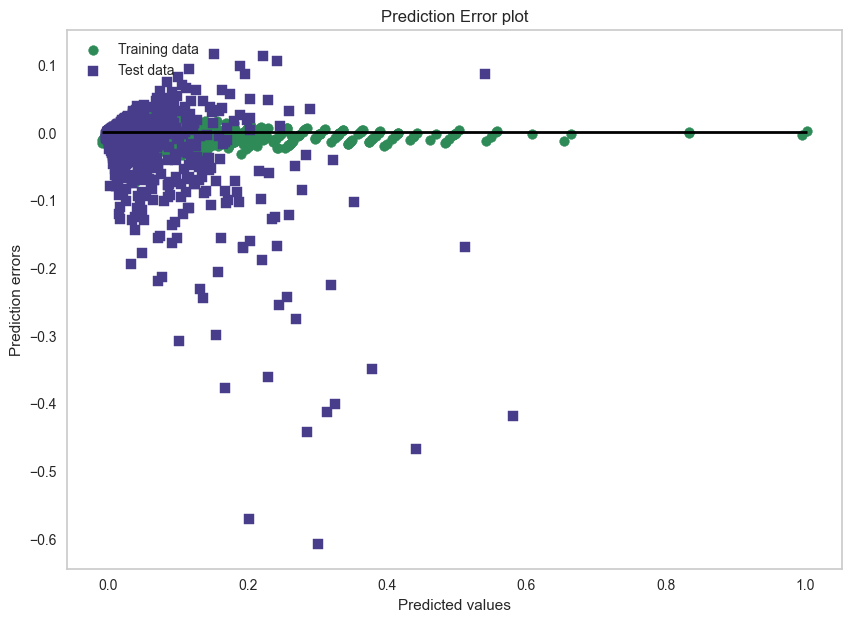

In [23]:
y_train_pred = best_catboost_modelB.predict(X_train)
y_test_pred = best_catboost_modelB.predict(X_test)

# Calculate prediction errors
train_errors = y_train_pred - y_train
test_errors = y_test_pred - y_test

# Plot prediction errors
plt.figure(figsize=(10, 7))
plt.scatter(y_train_pred, train_errors, c='#2E8B57', marker='o', label='Training data')
plt.scatter(y_test_pred, test_errors, c='#483D8B', marker='s', label='Test data')
plt.xlabel('Predicted values')
plt.ylabel('Prediction errors')
plt.legend(loc='upper left')
plt.hlines(y=0, xmin=min(y_train_pred.min(), y_test_pred.min()), xmax=max(y_train_pred.max(), y_test_pred.max()), color='black', lw=2)
plt.title('Prediction Error plot')
plt.grid()
plt.show()

#  <span style="color:SeaGreen"> Median Imputed Dataset:</span><span style="color:DarkSlateBlue"> One-Hot Label Encoded and Robust Scaled</span>

#### <span style="color:Teal">Loading in Data</span>

In [22]:
robust_dummies_median_df_train = pd.read_csv('robust_dummies_median_df_train.csv')
robust_dummies_median_df_test = pd.read_csv('robust_dummies_median_df_test.csv')

#### <span style="color:Teal">Confirming Load</span>

In [23]:
print(robust_dummies_median_df_train.shape, robust_dummies_median_df_test.shape)

(8133, 371) (2034, 371)


### <span style="color:YellowGreen">Selecting the Best Base Model for Optimising</span>

#### <span style="color:Teal">Model Comparison Setup</span>

In [24]:
regression6 = setup(robust_dummies_median_df_train, target = 'market_value_in_eur', session_id = 6)

,Description,Value
0,Session id,6
1,Target,market_value_in_eur
2,Target type,Regression
3,Original data shape,"(8133, 371)"
4,Transformed data shape,"(8133, 371)"
5,Transformed train set shape,"(5693, 371)"
6,Transformed test set shape,"(2440, 371)"
7,Numeric features,370
8,Preprocess,True
9,Imputation type,simple


#### <span style="color:Teal">Comparing Baseline Models</span>

In [25]:
best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,0.8471,5.5391,2.3076,0.7532,0.3228,1.5700,2.1190
et,Extra Trees Regressor,0.8344,5.9418,2.3968,0.7327,0.3227,1.3328,4.2770
gbr,Gradient Boosting Regressor,0.9392,6.0190,2.4250,0.7240,0.3646,1.8699,0.7570
lightgbm,Light Gradient Boosting Machine,0.9046,6.1965,2.4590,0.7141,0.3492,1.5243,0.1600
rf,Random Forest Regressor,0.9110,6.6355,2.5476,0.6958,0.3482,1.5352,3.4500
xgboost,Extreme Gradient Boosting,0.9287,6.6295,2.5504,0.6920,0.3486,1.5809,0.2260
br,Bayesian Ridge,1.5853,8.5512,2.9007,0.6042,0.6189,5.8043,0.1280
ridge,Ridge Regression,1.6135,8.6214,2.9138,0.6002,0.6287,5.9969,0.0460
lr,Linear Regression,1.6617,8.7984,2.9421,0.5927,0.6449,6.2842,0.0930
omp,Orthogonal Matching Pursuit,1.6728,9.6537,3.0813,0.5538,0.6415,6.0690,0.0510


In [26]:
compare_additional_models = compare_models(include = [ 'svm', 'catboost', 'kr', 'ard', 'mlp'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,0.8471,5.5391,2.3076,0.7532,0.3228,1.5700,2.0720
mlp,MLP Regressor,1.1886,5.2001,2.2721,0.7500,0.4676,3.7271,3.5810
kr,Kernel Ridge,1.6141,8.6360,2.9160,0.5996,0.6287,5.9978,0.3420
ard,Automatic Relevance Determination,1.5704,8.7059,2.9272,0.5963,0.6157,5.7087,8.6060
svm,Support Vector Regression,1.1962,15.3537,3.8616,0.3100,0.4468,1.6721,1.8370


Although not the best R2 score, we find that MultiLayer Perceptrons perform much better on robust scaled data.

#  <span style="color:SeaGreen"> Median Imputed Dataset:</span><span style="color:YellowGreen"> Categoricals :</span><span style="color:DarkSlateBlue"> No Label Encoding or Scaling </span>

#### <span style="color:Teal">Loading in Data</span>

In [499]:
LightGBM_median_df = pd.read_csv('LightGBM_median_df.csv')

#### <span style="color:Teal">Confirming Load</span>

In [500]:
LightGBM_median_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10167 entries, 0 to 10166
Data columns (total 64 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   sub_position                          10167 non-null  object 
 1   position                              10167 non-null  object 
 2   foot                                  10167 non-null  object 
 3   height_in_cm                          10167 non-null  float64
 4   market_value_in_eur                   10167 non-null  float64
 5   current_club_domestic_competition_id  10167 non-null  object 
 6   current_club_name                     10167 non-null  object 
 7   age                                   10167 non-null  int64  
 8   remaining_contract_days               10167 non-null  float64
 9   age_group                             10167 non-null  object 
 10  games_total                           10167 non-null  int64  
 11  goals_total    

#### <span style="color:Teal"> Casting object datatypes to categorical</span>

In [501]:
# Casting from object to categorical data type for LightGBM
for feature in LightGBM_median_df:
    if LightGBM_median_df[feature].dtypes == 'O':
        LightGBM_median_df[feature] = pd.Series(LightGBM_median_df[feature], dtype="category")

In [502]:
LightGBM_median_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10167 entries, 0 to 10166
Data columns (total 64 columns):
 #   Column                                Non-Null Count  Dtype   
---  ------                                --------------  -----   
 0   sub_position                          10167 non-null  category
 1   position                              10167 non-null  category
 2   foot                                  10167 non-null  category
 3   height_in_cm                          10167 non-null  float64 
 4   market_value_in_eur                   10167 non-null  float64 
 5   current_club_domestic_competition_id  10167 non-null  category
 6   current_club_name                     10167 non-null  category
 7   age                                   10167 non-null  int64   
 8   remaining_contract_days               10167 non-null  float64 
 9   age_group                             10167 non-null  category
 10  games_total                           10167 non-null  int64   
 11  go

#### <span style="color:Teal">Train : Test Split</span>

In [503]:
LightGBM_median_df_train, LightGBM_median_df_test = train_test_split(LightGBM_median_df, test_size=0.2, random_state=100)

#### <span style="color:Teal">Confirming Split</span>

In [504]:
print(LightGBM_median_df_train.shape, LightGBM_median_df_test.shape)

(8133, 64) (2034, 64)


### <span style="color:YellowGreen">Selecting the Best Base Model for Optimising</span>

#### <span style="color:Teal">Model Comparison Setup</span>

In [30]:
regression7 = setup(LightGBM_median_df_train, target = 'market_value_in_eur', session_id = 7)

,Description,Value
0,Session id,7
1,Target,market_value_in_eur
2,Target type,Regression
3,Original data shape,"(8133, 64)"
4,Transformed data shape,"(8133, 98)"
5,Transformed train set shape,"(5693, 98)"
6,Transformed test set shape,"(2440, 98)"
7,Numeric features,57
8,Categorical features,6
9,Preprocess,True


#### <span style="color:Teal">Comparing Baseline Models</span>

In [31]:
best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
dummy,Dummy Regressor,4948029.5000,103005373123788.7969,10042817.4000,-0.0024,2.2266,11.9565,0.0580
br,Bayesian Ridge,5090767.3910,108311846107445.5625,10305667.5185,-0.0575,2.2149,12.0407,0.0780
omp,Orthogonal Matching Pursuit,5103844.1424,108482834293041.5625,10313353.3588,-0.0589,2.2127,12.0869,0.0530
en,Elastic Net,5132778.5272,108909319454822.3906,10334640.9855,-0.0636,2.2252,12.1078,0.2100
llar,Lasso Least Angle Regression,5166473.1754,109467426254564.2031,10362568.6054,-0.0698,2.2381,12.1378,0.0570
lr,Linear Regression,5178217.1334,109664223759800.5938,10371912.1814,-0.0717,2.2422,12.1627,0.1160
ridge,Ridge Regression,5178211.1194,109663361335712.5469,10371830.1570,-0.0717,2.2431,12.1617,0.0550
lasso,Lasso Regression,5178650.3423,109673940404178.9688,10372337.1903,-0.0718,2.2436,12.1630,0.2520
huber,Huber Regressor,3630976.3017,113338728896918.8438,10538011.8297,-0.1047,1.7008,1.9488,0.0800
gbr,Gradient Boosting Regressor,5191139.1126,114164166205723.8281,10585723.0026,-0.1186,2.2060,12.2568,0.5850


In [32]:
compare_additional_models = compare_models(include = [ 'svm', 'catboost', 'kr', 'ard', 'mlp', 'tr'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
mlp,MLP Regressor,5183729.0244,104754125263861.1562,10130749.9764,-0.0208,2.2727,13.0177,0.2270
tr,TheilSen Regressor,4970710.0929,107917797164386.8125,10285249.8624,-0.0531,2.1927,11.1686,3.6130
ard,Automatic Relevance Determination,5094508.2674,108310886258762.9375,10305821.2652,-0.0576,2.2136,12.0478,0.3750
kr,Kernel Ridge,3358966.7928,73926501464395.4844,6616232.2905,-0.0675,1.3632,7.7240,15.6190
svm,Support Vector Regression,3616725.5511,113234945391053.7031,10533996.6235,-0.1040,1.6711,1.9334,0.9040
catboost,CatBoost Regressor,5270641.8826,117067552371631.4062,10739929.5352,-0.1581,2.2348,12.4844,1.9910


## <span style="color:YellowGreen">Manually Developing a LightGBM Model</span>

In [505]:
y_train = LightGBM_median_df_train['market_value_in_eur']
X_train = LightGBM_median_df_train.drop(['market_value_in_eur'], axis = 1)
y_test = LightGBM_median_df_test['market_value_in_eur']
X_test = LightGBM_median_df_test.drop(['market_value_in_eur'], axis = 1)

In [506]:
# Show the rows and columns
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((8133, 63), (2034, 63), (8133,), (2034,))

#### <span style="color:Teal">Setting Up Model</span>

In [507]:
lgbmA = lightgbm.LGBMRegressor(categorical_feature=[0,1,2,4,5,8], n_jobs=-1)

lgbmA.fit(X_train, y_train)

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4410
[LightGBM] [Info] Number of data points in the train set: 8133, number of used features: 63
[LightGBM] [Info] Start training from score 3837283.290299


LGBMRegressor(categorical_feature=[0, 1, 2, 4, 5, 8], n_jobs=-1)

#### <span style="color:Teal">Models Results</span>

In [121]:
# Calculate the mean values and Standard deviation
get_cv_scores(lgbmA)

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4387
[LightGBM] [Info] Number of data points in the train set: 7319, number of used features: 63
[LightGBM] [Info] Start training from score 3820480.940019
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_fe

In [130]:
# Baseline R² score
baseline_CV_R2 = 0.4615535412127869

# Optimized R² score
median_lgbmA_CV_R2 = 0.8232446030630571

# Calculate percentage improvement
percentage_improvement = ((median_lgbmA_CV_R2 - baseline_CV_R2) / baseline_CV_R2) * 100

print("Percentage Improvement:", percentage_improvement, "%")

Percentage Improvement: 78.36383638177358 %


In [122]:
# Comparing training to testing results
print(f'R² training set score: {lgbmA.score(X_train, y_train)}')
print(f'R² testing set score: {lgbmA.score(X_test, y_test)}')

R² training set score: 0.9765735212161047
R² testing set score: 0.8074022147951684


#### <span style="color:Teal">Evaluating Model Results with Visualisations</span>

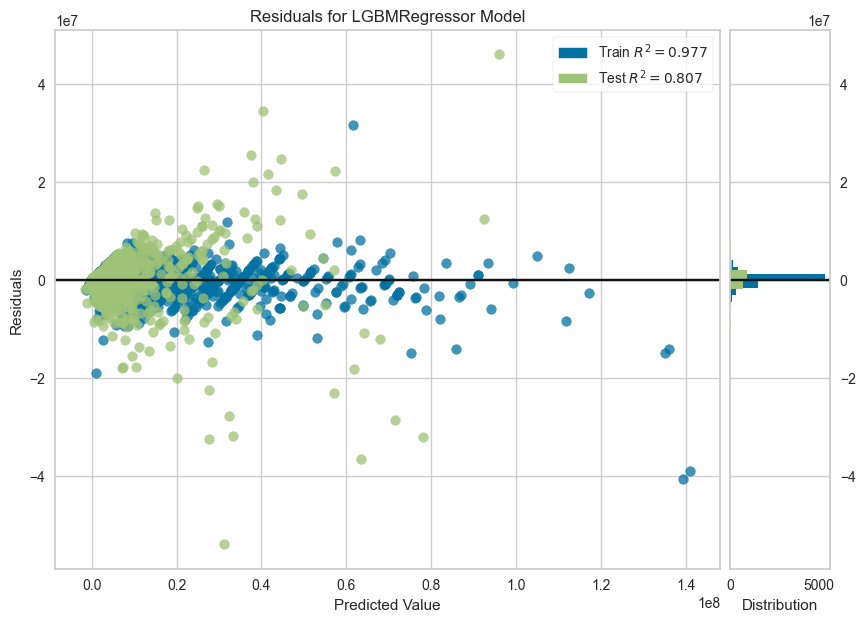

In [123]:
fig = plt.figure(figsize=(10,7))
resid_plot = ResidualsPlot(lgbmA)
resid_plot.fit(X_train, y_train)  # Fit the training data to the visualizer
resid_plot.score(X_test, y_test)  # Evaluate the model on the test data
resid_plot.show();                 # Finalize and render the figure

We find the model predicts well for lower evaluated players. The spread of residuals for test data appear evenly spread.

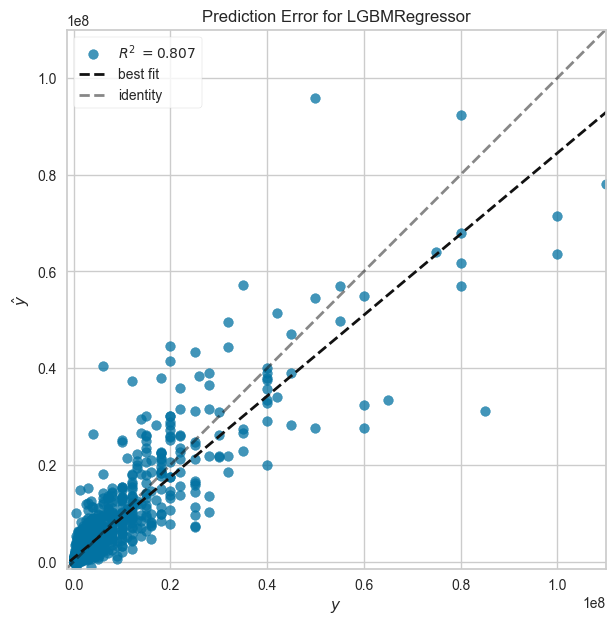

In [125]:
fig = plt.figure(figsize=(10,7))
pred_error = PredictionError(lgbmA)
pred_error.fit(X_train, y_train)  # Fit the training data to the visualizer
pred_error.score(X_test, y_test)  # Evaluate the model on the test data
pred_error.show()   ;              # Finalize and render the figure

# The fit diagonal (actuals VS predictions) is almost on top of the pure diagonal, that means 
# a very  good fit.
# There are more datapoints under the diagonal, that means the model tends to underestimate 
# in general.

[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2477
[LightGBM] [Info] Number of data points in the train set: 650, number of used features: 62
[LightGBM] [Info] Start training from score 3767576.923077
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posi

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001200 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4206
[LightGBM] [Info] Number of data points in the train set: 3578, number of used features: 63
[LightGBM] [Info] Start training from score 3848784.237004
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_fe

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4203
[LightGBM] [Info] Number of data points in the train set: 3578, number of used features: 63
[LightGBM] [Info] Start training from score 3873332.867524
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_fe

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4193
[LightGBM] [Info] Number of data points in the train set: 3578, number of used features: 63
[LightGBM] [Info] Start training from score 3830804.918949
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_fe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4007
[LightGBM] [Info] Number of data points in the train set: 2114, number of used features: 63
[LightGBM] [Info] Start t

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4201
[LightGBM] [Info] Number of data points in the train set: 3578, number of used features: 63
[LightGBM] [Info] Start training from score 3928559.250978
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_fe

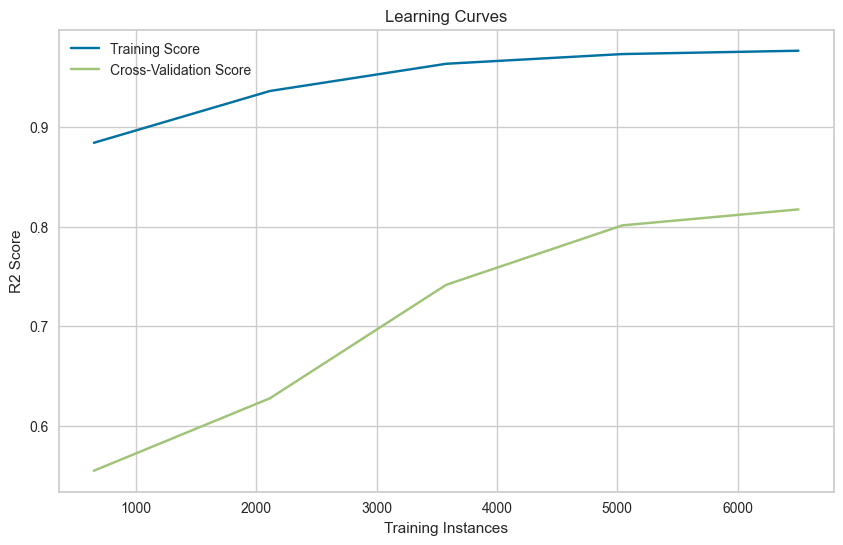

In [126]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(lgbmA, X_train, y_train, cv=5)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, np.mean(train_scores, axis=1), label='Training Score')
plt.plot(train_sizes, np.mean(test_scores, axis=1), label='Cross-Validation Score')
plt.xlabel('Training Instances')
plt.ylabel('R2 Score')
plt.title('Learning Curves')
plt.legend()
plt.show()

#### <span style="color:Teal">Hyperparameter Tuning with GridSearchCV</span>

In [129]:
# Define the parameter grid for GridSearchCV
params = {
    'n_estimators': [50, 100, 150, 200], 
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.5], 
    'num_leaves': [10, 50, 100, 200],
    'max_depth': [-1]
}

# Create a GridSearchCV object
gscv = GridSearchCV(lgbmA, params, n_jobs=-1, scoring='r2', cv=5)

# Fit the GridSearchCV object to the training data
gscv.fit(X_train, y_train)

# Get the best estimator from GridSearchCV
best_lgbmA = gscv.best_estimator_

# Calculate cross-validated R² score
cv_r2_scores = cross_val_score(best_lgbmA, X_train, y_train, cv=5, scoring='r2')

# Calculate cross-validated MAE, MSE, and RMSE
cv_mae_scores = -cross_val_score(best_lgbmA, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')
cv_mse_scores = -cross_val_score(best_lgbmA, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_scores = np.sqrt(cv_mse_scores)

# Calculate additional metrics for the best model
y_pred_train = best_lgbmA.predict(X_train)
mae_train = mean_absolute_error(y_train, y_pred_train)
mse_train = mean_squared_error(y_train, y_pred_train)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_pred_train)

# Display the best parameters, R² score, MAE, MSE, and RMSE
print("Best Parameters:", gscv.best_params_)
print("\nBest R² Score:", gscv.best_score_)
print('Train Mean Absolute Error (MAE): ', mae_train)
print('Train Mean Squared Error (MSE): ', mse_train)
print('Train Root Mean Squared Error (RMSE): ', rmse_train)
print('Train R-squared (R²): ', r2_train)

# Display the cross-validated scores
print("Cross-Validated R² Scores:", cv_r2_scores)
print("Mean Cross-Validated R² Score:", np.mean(cv_r2_scores))
print('Cross-Validated Mean Absolute Error (MAE): ', np.mean(cv_mae_scores))
print('Cross-Validated Mean Squared Error (MSE): ', np.mean(cv_mse_scores))
print('Cross-Validated Root Mean Squared Error (RMSE): ', np.mean(cv_rmse_scores))

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001383 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4410
[LightGBM] [Info] Number of data points in the train set: 8133, number of used features: 63
[LightGBM] [Info] Start training from score 3837283.290299
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001141 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4351
[LightGBM] [Info] Number of data points in the train set: 6506, number of used features: 63
[LightGBM] [Info] Start training from score 3836710.728558
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a

In [128]:
# Baseline R² score
baseline_CV_R2 = 0.4615535412127869

# Optimized R² score
median_best_lgbmA_CV_R2 = 0.822734946836883

# Calculate percentage improvement
percentage_improvement = ((median_best_lgbmA_CV_R2 - baseline_CV_R2) / baseline_CV_R2) * 100

print("Percentage Improvement:", percentage_improvement, "%")

Percentage Improvement: 78.2534144738764 %


In [134]:
# Comparing training to testing results
print(f'R² training set score: {best_lgbmA.score(X_train, y_train)}')
print(f'R² testing set score: {best_lgbmA.score(X_test, y_test)}')

R² training set score: 0.9793098616538154
R² testing set score: 0.784217532019196


#### <span style="color:Teal">Evaluating Model Results with Visualisations</span>

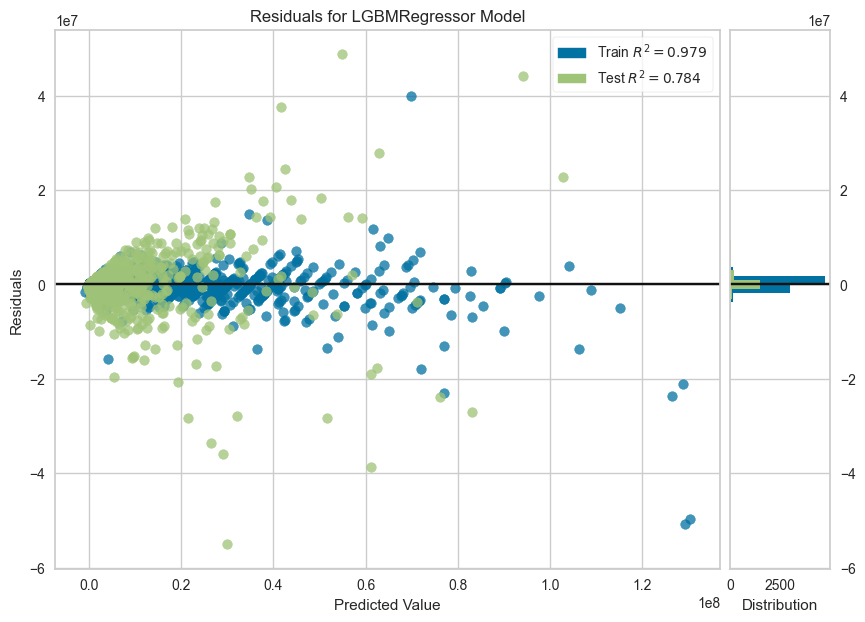

In [135]:
fig = plt.figure(figsize=(10,7))
resid_plot = ResidualsPlot(best_lgbmA)
resid_plot.fit(X_train, y_train)  # Fit the training data to the visualizer
resid_plot.score(X_test, y_test)  # Evaluate the model on the test data
resid_plot.show(); 

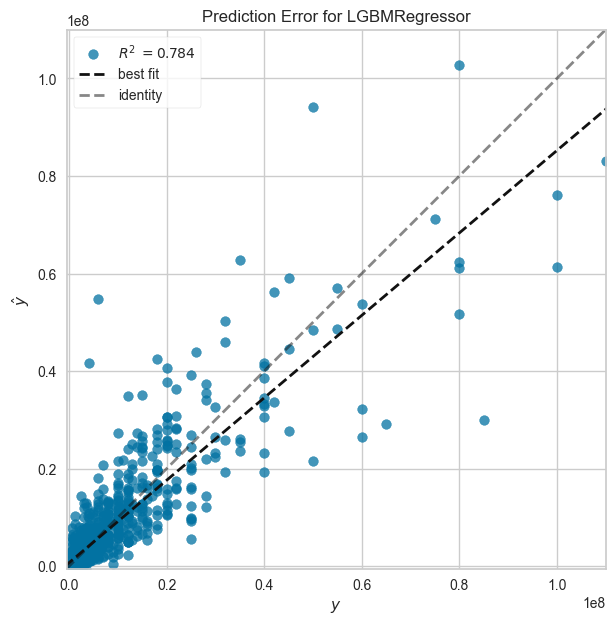

In [136]:
fig = plt.figure(figsize=(10,7))
pred_error = PredictionError(best_lgbmA)
pred_error.fit(X_train, y_train)  # Fit the training data to the visualizer
pred_error.score(X_test, y_test)  # Evaluate the model on the test data
pred_error.show()   ;              # Finalize and render the figure

[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2477
[LightGBM] [Info] Number of data points in the train set: 650, number of used features: 62
[LightGBM] [Info] Start training from score 3767576.923077
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4206
[LightGBM] [Info] Number of data points in the train set: 3578, number of used features: 63
[LightGBM] [Info] Start training from score 3848784.237004
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4294
[Light

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001633 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4352
[LightGBM] [Info] Number of data points in the train set: 6506, number of used features: 63
[LightGBM] [Info] Start training from score 3850211.343375
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000819 seconds.
You ca

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001522 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4283
[LightGBM] [Info] Number of data points in the train set: 5042, number of used features: 63
[LightGBM] [Info] Start training from score 3875595.993653
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_fe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001519 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4290
[LightGBM] [Info] Number of data points in the train set: 5042, number of used features: 63
[LightGBM] [Info] Start training from score 3870676.318921
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_fe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4292
[LightGBM] [Info] Number of data points in the train set: 5042, number of used features: 63
[LightGBM] [Info] Start training from score 3869506.148354
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_fe

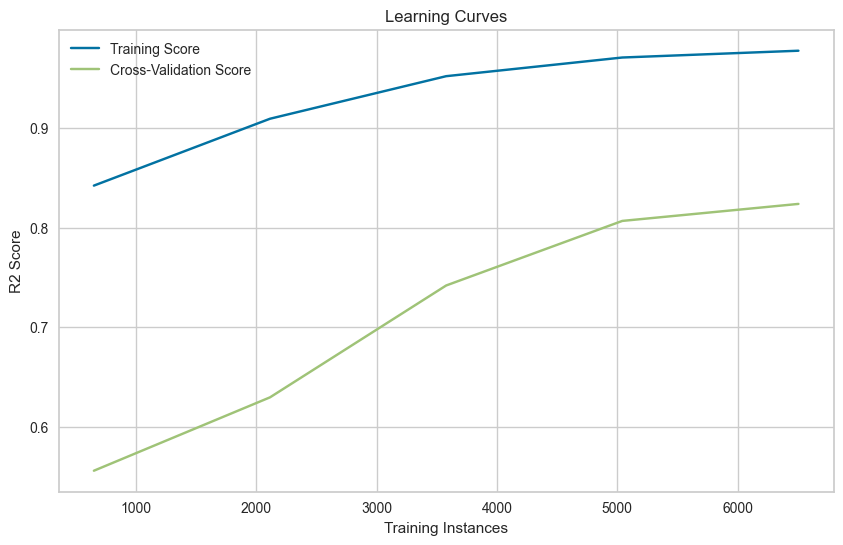

In [79]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(best_lgbmA, X_train, y_train, cv=5)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, np.mean(train_scores, axis=1), label='Training Score')
plt.plot(train_sizes, np.mean(test_scores, axis=1), label='Cross-Validation Score')
plt.xlabel('Training Instances')
plt.ylabel('R2 Score')
plt.title('Learning Curves')
plt.legend()
plt.show()

#### <span style="color:Teal">Evaluating Feature Importance</span>

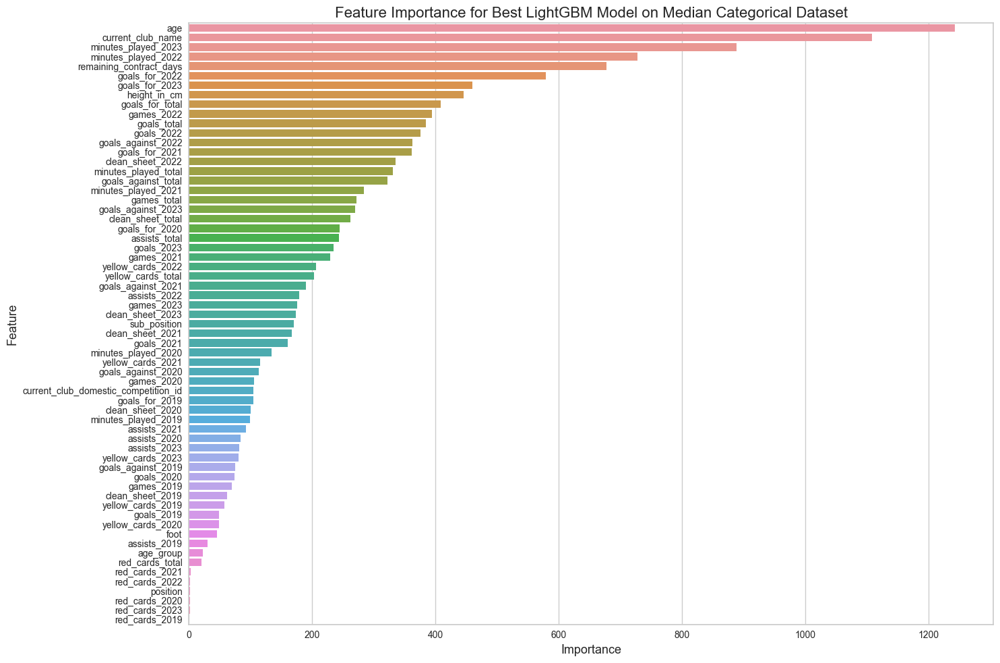

In [137]:
best_lgbmA_feat_imp = pd.DataFrame({'Feature':X_train.columns, 'Importance':best_lgbmA.feature_importances_}).sort_values('Importance', ascending=False)


plt.figure(figsize=(15,10))
plt.title( f"Feature Importance for Best LightGBM Model on Median Categorical Dataset" , fontsize=16)
sns.barplot(y=best_lgbmA_feat_imp['Feature'], x=best_lgbmA_feat_imp['Importance'])
plt.xlabel('Importance', fontsize=13)
plt.ylabel("Feature", fontsize=13)
plt.tight_layout()
plt.show();

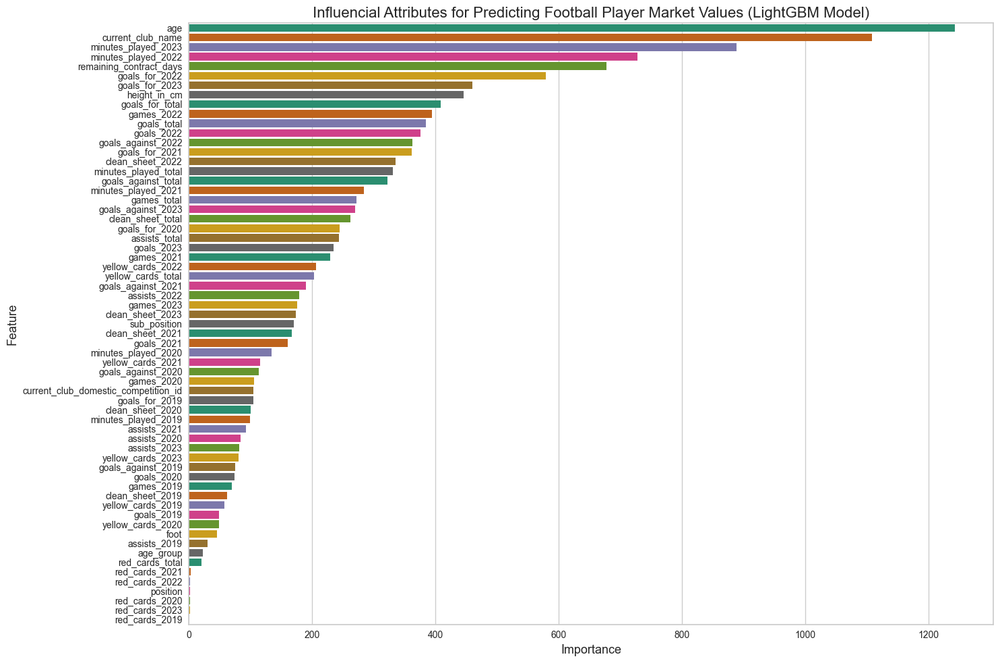

In [138]:
best_lgbmA_feat_imp = pd.DataFrame({'Feature':X_train.columns, 'Importance':best_lgbmA.feature_importances_}).sort_values('Importance', ascending=False)


plt.figure(figsize=(15,10))
plt.title( f"Influencial Attributes for Predicting Football Player Market Values (LightGBM Model)" , fontsize=16)
sns.barplot(y=best_lgbmA_feat_imp['Feature'], x=best_lgbmA_feat_imp['Importance'], palette = 'Dark2')
plt.xlabel('Importance', fontsize=13)
plt.ylabel("Feature", fontsize=13)
plt.tight_layout()
plt.show();

#### <span style="color:Teal">A Closer Look at Predictions with Greatest Error</span>

In [142]:
y_preds_test_best_lgbmA = best_lgbmA.predict(X_test)

In [143]:
X_test_with_y = X_test.copy()
X_test_with_y['y_preds'] = y_preds_test_best_lgbmA
X_test_with_y['y_true'] = y_test
X_test_with_y['error'] = X_test_with_y['y_preds'] - X_test_with_y['y_true']
X_test_with_y['abs_error'] = abs(X_test_with_y['error'])
X_test_with_y.reset_index(drop=True, inplace=True)

In [ ]:
greatest_errors_best_lgbmA_df = X_test_with_y[X_test_with_y['abs_error'] >= 10000].sort_values(by='abs_error', ascending=False)
greatest_errors_best_lgbmA_df.head()

Its difficult to distinguish any clear pattern between the highest error predictions above.

#### <span style="color:Teal">Testing the model on Log Transformed (Normally Distributed) Target Variable</span>

In [508]:
# Define the LGBMRegressor with log-transformed target
lgbmA_log = lightgbm.LGBMRegressor(categorical_feature=[0,1,2,4,5,8], n_jobs=-1)
y_train_log = np.log(y_train+0.0001)

# Define the parameter grid for GridSearchCV
params = {
    'n_estimators': [50, 100, 150, 200], 
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.5], 
    'num_leaves': [10, 50, 100, 200],
    'max_depth': [-1]
}

# Create a GridSearchCV object
gscv_log = GridSearchCV(lgbmA_log, params, n_jobs=-1, scoring='r2', cv=5)

# Fit the GridSearchCV object to the training data
gscv_log.fit(X_train, y_train_log)

# Get the best estimator from GridSearchCV
best_lgbmA_log = gscv_log.best_estimator_

# Calculate cross-validated R² score
cv_r2_scores = cross_val_score(best_lgbmA_log, X_train, y_train_log, cv=5, scoring='r2')

# Calculate cross-validated MAE, MSE, and RMSE
cv_mae_scores = -cross_val_score(best_lgbmA_log, X_train, y_train_log, cv=5, scoring='neg_mean_absolute_error')
cv_mse_scores = -cross_val_score(best_lgbmA_log, X_train, y_train_log, cv=5, scoring='neg_mean_squared_error')
cv_rmse_scores = np.sqrt(cv_mse_scores)

# Inverse-transform the predictions to bring them back to the original scale
y_preds_logged = best_lgbmA_log.predict(X_train)
y_preds_unlogged = np.exp(y_preds_logged) - 0.0001

# Calculate additional metrics for the best model
mae_train = mean_absolute_error(np.exp(y_train_log)-0.0001, y_preds_unlogged)
mse_train = mean_squared_error(np.exp(y_train_log)-0.0001, y_preds_unlogged)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(np.exp(y_train_log)-0.0001, y_preds_unlogged)

# Display the best parameters, R² score, MAE, MSE, and RMSE
print("Best Parameters:", gscv_log.best_params_)
print("\nBest R² Score:", gscv_log.best_score_)
print('Train Mean Absolute Error (MAE): ', mae_train)
print('Train Mean Squared Error (MSE): ', mse_train)
print('Train Root Mean Squared Error (RMSE): ', rmse_train)
print('Train R-squared (R²): ', r2_train)

# Display the cross-validated scores
print("Cross-Validated R² Scores:", cv_r2_scores)
print("Mean Cross-Validated R² Score:", np.mean(cv_r2_scores))
print('Cross-Validated Mean Absolute Error (MAE): ', np.mean(cv_mae_scores))
print('Cross-Validated Mean Squared Error (MSE): ', np.mean(cv_mse_scores))
print('Cross-Validated Root Mean Squared Error (RMSE): ', np.mean(cv_rmse_scores))

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002205 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4410
[LightGBM] [Info] Number of data points in the train set: 8133, number of used features: 63
[LightGBM] [Info] Start training from score 13.679336
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a larg

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001190 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4351
[LightGBM] [Info] Number of data points in the train set: 6506, number of used features: 63
[LightGBM] [Info] Start training from score 13.688726
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a larg

In [166]:
# Baseline R² score
baseline_CV_R2 = 0.4615535412127869

# Optimized R² score
median_best_lgbmA_log_CV_R2 = 0.8515800819778377

# Calculate percentage improvement
percentage_improvement = ((median_best_lgbmA_log_CV_R2 - baseline_CV_R2) / baseline_CV_R2) * 100

print("Percentage Improvement:", percentage_improvement, "%")

Percentage Improvement: 84.50298956437635 %


In [147]:
y_pred_test_log = best_lgbmA_log.predict(X_test)
y_pred_test_unlogged = np.exp(y_pred_test_log) - 0.0001

# Calculate R² score on testing set
r2_test = r2_score(y_test, y_pred_test_unlogged)

print(f'R² training set score: {r2_train}')
print(f'R² testing set score: {r2_test}')

R² training set score: 0.9485334244839155
R² testing set score: 0.8215068071440828


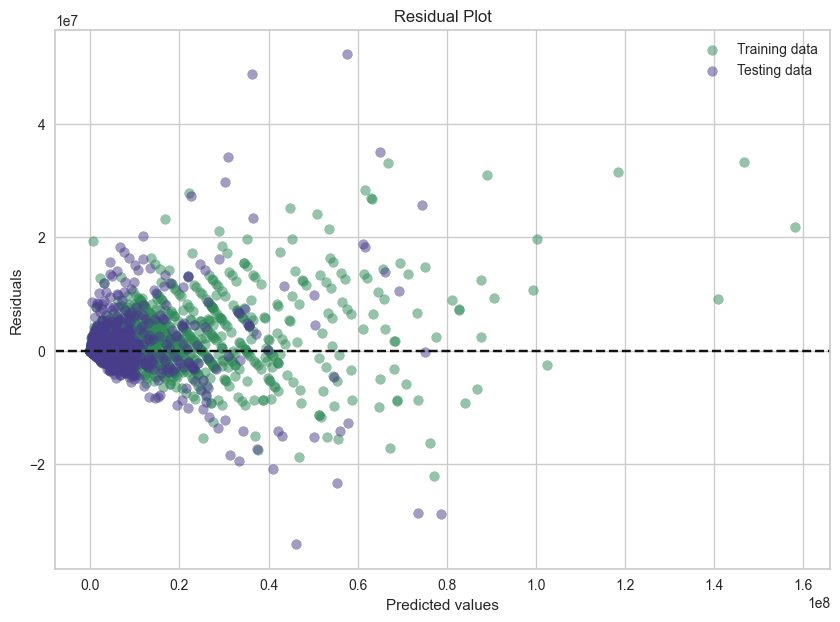

In [162]:
y_pred_train_log = best_lgbmA_log.predict(X_train)
y_pred_test_log = best_lgbmA_log.predict(X_test)

# Reverse the log transformation on predictions and actual values
y_pred_train = np.exp(y_pred_train_log) - 0.0001
y_pred_test = np.exp(y_pred_test_log) - 0.0001
y_train_orig = np.exp(y_train_log) - 0.0001
y_test_orig = np.exp(y_test_log) - 0.0001

# Calculate residuals on training and testing set
residuals_train = y_train_orig - y_pred_train
residuals_test = y_test_orig - y_pred_test

# Plot residuals
fig, ax = plt.subplots(figsize=(10, 7))
ax.scatter(y_pred_train, residuals_train, c='#2E8B57', label='Training data', alpha=0.5)
ax.scatter(y_pred_test, residuals_test, c='#483D8B', label='Testing data', alpha=0.5)
ax.axhline(y=0, color='k', linestyle='--')
ax.set_xlabel('Predicted values')
ax.set_ylabel('Residuals')
ax.set_title('Residual Plot')
ax.legend()
plt.show()


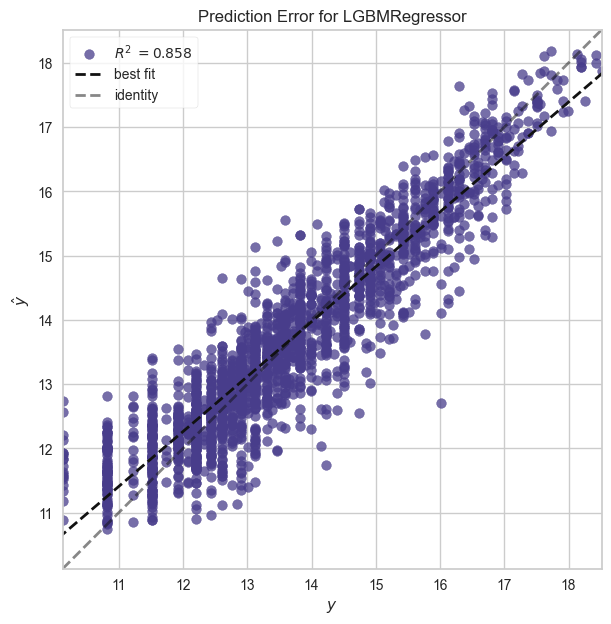

In [163]:
fig, ax = plt.subplots(figsize=(10, 7))
visualizer = PredictionError(best_lgbmA_log, point_color='#483D8B')  # Change color to green
visualizer.fit(X_train, y_train_log)
visualizer.score(X_test, y_test_log)  # Using log-transformed y_test for score
visualizer.show();

[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2477
[LightGBM] [Info] Number of data points in the train set: 650, number of used features: 62
[LightGBM] [Info] Start training from score 3767576.923077
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posi

[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000995 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4043
[LightGBM] [Info] Number of data points in the train set: 2114, number of used features: 63
[LightGBM] [Info] Start training from score 4031350.520341
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001112 seconds.
You ca

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001195 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4203
[LightGBM] [Info] Number of data points in the train set: 3578, number of used features: 63
[LightGBM] [Info] Start training from score 3873332.867524
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_fe

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4193
[LightGBM] [Info] Number of data points in the train set: 3578, number of used features: 63
[LightGBM] [Info] Start training from score 3830804.918949
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_fe

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4201
[LightGBM] [Info] Number of data points in the train set: 3578, number of used features: 63
[LightGBM] [Info] Start training from score 3928559.250978
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_fe

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001157 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4201
[LightGBM] [Info] Number of data points in the train set: 3578, number of used features: 63
[LightGBM] [Info] Start training from score 3928559.250978
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_fe

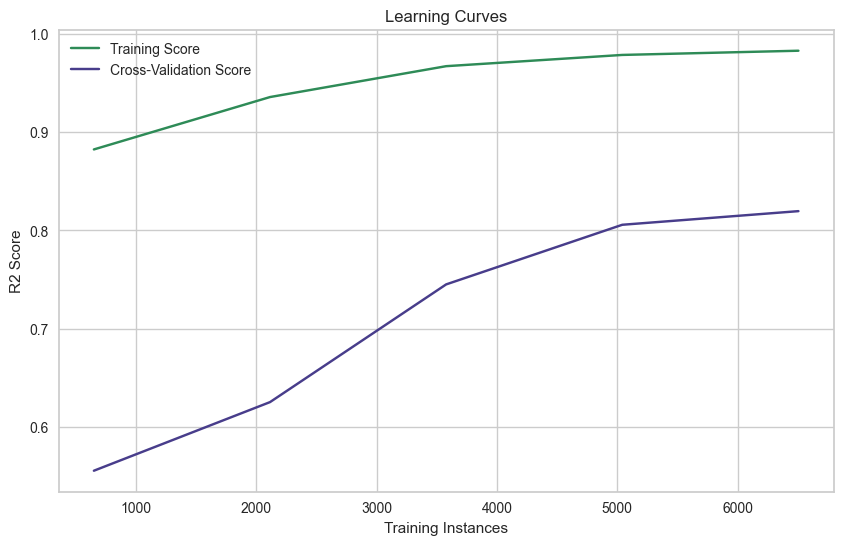

In [164]:
train_sizes, train_scores, test_scores = learning_curve(best_lgbmA_log, X_train, y_train, cv=5)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, np.mean(train_scores, axis=1), label='Training Score', color = '#2E8B57' )
plt.plot(train_sizes, np.mean(test_scores, axis=1), label='Cross-Validation Score', color = '#483D8B')
plt.xlabel('Training Instances')
plt.ylabel('R2 Score')
plt.title('Learning Curves')
plt.legend()
plt.show()

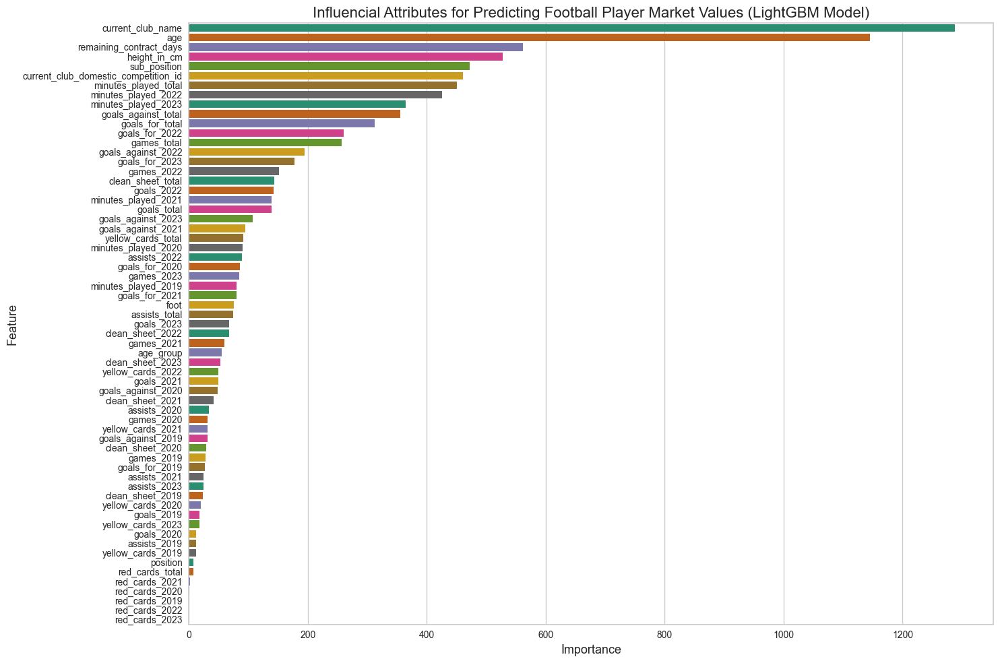

In [165]:
best_lgbmA_feat_imp = pd.DataFrame({'Feature':X_train.columns, 'Importance':best_lgbmA_log.feature_importances_}).sort_values('Importance', ascending=False)


plt.figure(figsize=(15,10))
plt.title( f"Influencial Attributes for Predicting Football Player Market Values (LightGBM Model)" , fontsize=16)
sns.barplot(y=best_lgbmA_feat_imp['Feature'], x=best_lgbmA_feat_imp['Importance'], palette = 'Dark2')
plt.xlabel('Importance', fontsize=13)
plt.ylabel("Feature", fontsize=13)
plt.tight_layout()
plt.show();

Interestingly, we see a change in feature importance following log transformation of the target variable. 'current_club_name' and 'age' have switched, while other attributes lik 'remaining_contract_days', 'height_in_cm', 'sub_position' and 'current_club_domestic_competition_id' have risen in importance.

Features related to red cards have little to no influence, insight which pearsons correlation coefficients also provide, and could potentially be removed.

### <span style="color:YellowGreen">Leveraging SHAP for model Interprebility</span>

#### <span style="color:Teal">General Model Explained</span>

In [509]:
X = LightGBM_median_df.drop(['market_value_in_eur'], axis = 1)
y = LightGBM_median_df_train['market_value_in_eur']

In [510]:
# Create object that can calculate SHAP values of the GridSearchCV model
explainer = shap.TreeExplainer(best_lgbmA_log)

# Calculate SHAP values based on X_train data (SHAP values are in euro, the same units as the target variable)
shap_values = explainer.shap_values(X)


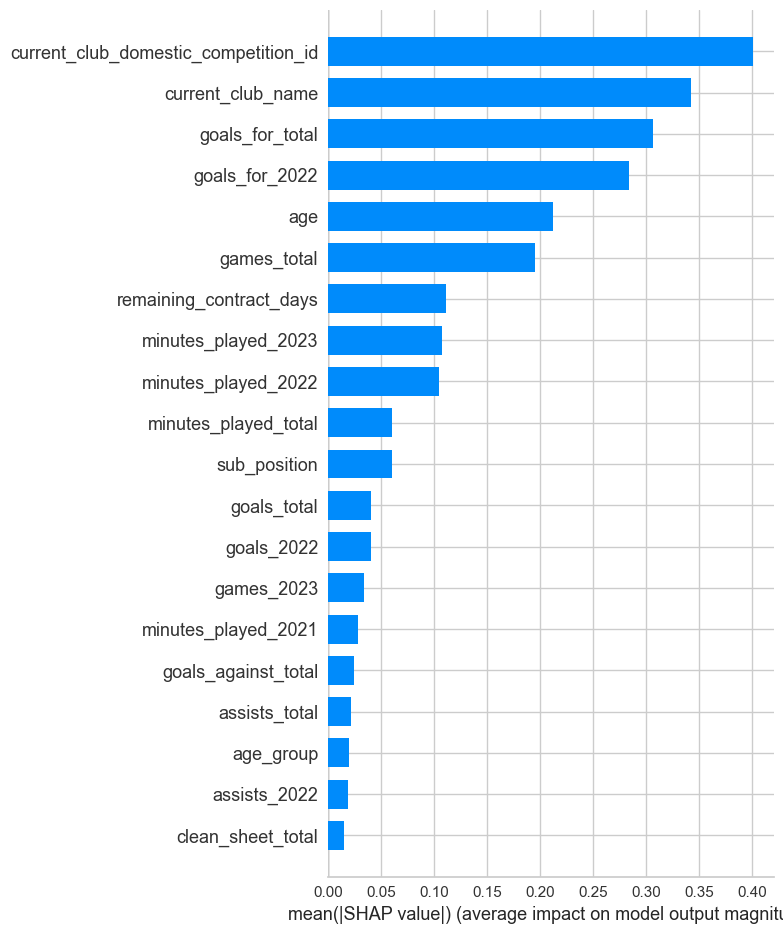

In [511]:
shap.summary_plot(shap_values, X, plot_type="bar")

The SHAP summary plot provides a visual representation of the absolute SHAP values for each feature, showing their importance relative to the model's output. The x-axis of the summary plot typically displays the average absolute SHAP value for each feature across all instances in the dataset. Therefore, the values on the x-axis represent the magnitude of the impact of each feature on the model's predictions.

The beauty and advantage of this SHAP plot is that values on the x-axis are usually displayed in the same metric as the target variable. However, in this case, as the model is developed on the log transformation  of 'market_value_in_eur', it is not as insightful. it does still provide SHAPs understanding of feature impact. 

Interestiingly, the order of features differs from that estimated by the LightGBM feature importance function.

A feature with a higher SHAP value (closer to 1.0) indicates that it has a stronger impact on the model's predictions, potentially leading to larger changes in the predicted market value.

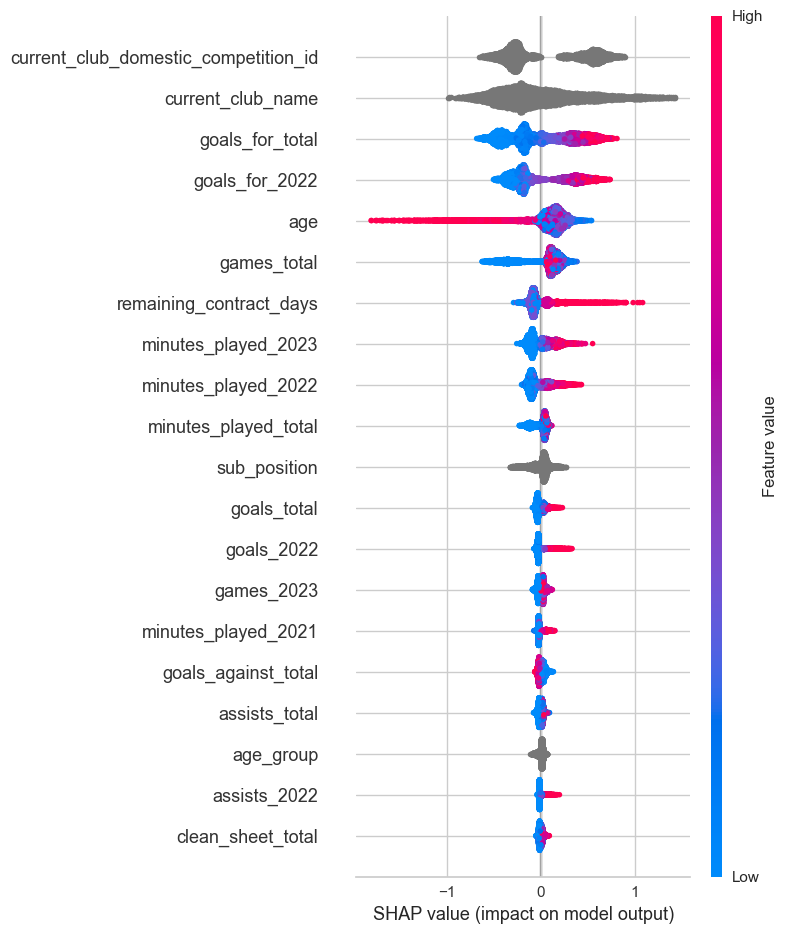

In [512]:
shap.summary_plot(shap_values, X)

The code is currently on working for numerical features and needs to be modified for categorical.
        
        
        Red means high values of a feature (e.g. low ages), while blue means smallfeature value (e.g. higher ages).
        Distance from axis means magnitude of impact of this feature (how impactful/powerful is), 
        depending on high/small values.

        For most feature values above, the higher the feature value the higher the player market value, like goals and             assist.
        For age and goals against however, the lower these values, the higher the feature value to market value. 

#### <span style="color:Teal">Individual Predictions Explained</span>

Specifying a case in the X_test to predict and see how every feature contributes to moving the prediction from the (expected) average value to the final one:

In [513]:
# Initialize:
shap.initjs()

row_to_predict = 0
data_for_prediction = X.iloc[[row_to_predict]]
prediction = best_lgbmA_log.predict(data_for_prediction)[0]
print('prediction: ', prediction)

# Shap plot:
shap.force_plot(explainer.expected_value, shap_values[row_to_predict], data_for_prediction)

prediction:  17.0699488950769


Above we can identify the features that contribute most to both the increase and decrease in the models predicted market value. We see that the age feature value at 36 is bringing down the predicted market value while current_club_name of Real Madrid is contributing to a higher predicted market value.

In [496]:
data_for_prediction

,sub_position,position,foot,height_in_cm,current_club_domestic_competition_id,current_club_name,age,remaining_contract_days,age_group,games_total,goals_total,assists_total,minutes_played_total,goals_for_total,goals_against_total,clean_sheet_total,yellow_cards_total,red_cards_total,games_2019,goals_2019,assists_2019,minutes_played_2019,goals_for_2019,goals_against_2019,clean_sheet_2019,yellow_cards_2019,red_cards_2019,games_2020,goals_2020,assists_2020,minutes_played_2020,goals_for_2020,goals_against_2020,clean_sheet_2020,yellow_cards_2020,red_cards_2020,games_2021,goals_2021,assists_2021,minutes_played_2021,goals_for_2021,goals_against_2021,clean_sheet_2021,yellow_cards_2021,red_cards_2021,games_2022,goals_2022,assists_2022,minutes_played_2022,goals_for_2022,goals_against_2022,clean_sheet_2022,yellow_cards_2022,red_cards_2022,games_2023,goals_2023,assists_2023,minutes_played_2023,goals_for_2023,goals_against_2023,clean_sheet_2023,yellow_cards_2023,red_cards_2023
0,Centre-Forward,Attack,right,185.0,ES1,Real Madrid,36,786.0,Ages 33 - 38,137,102,32,11531,299,126,56,2,0,48,27,11,3981,94,42,21,0,0,0,0,0,0,0,0,0,0,0,46,44,15,3919,108,40,19,1,0,40,28,5,3359,86,34,16,1,0,3,3,1,272,11,10,0,0,0


In [175]:
direction = 'up' if prediction > explainer.expected_value else 'down'
direction

'up'

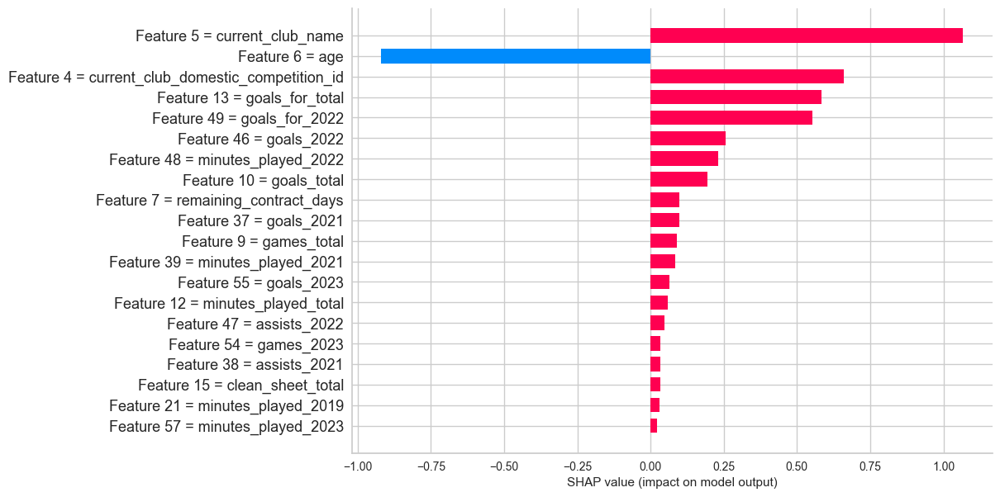

In [176]:
# Same but now in bar plot
fig = plt.figure(figsize=(10,7))
shap.bar_plot(shap_values[row_to_predict], data_for_prediction, max_display=20)

Further research is required into the scale of values returned above and below. If in millions of euros, it would allow for direct insights and measurables into the exact contribution of each variable to a players market value estimate.

In [177]:
# Create a list with the Shap values for this case
original_sv = shap_values[row_to_predict].tolist()
sv = original_sv.copy()
if direction == 'up':
    sv = [i for i in sv if i>0]
else:
    sv = [i for i in sv if i<0]
    
    
# Get the absolute values of the list and reverse it. That way we see the "top" features, 
# no matter whether prediction is greater or smaller than the average value.
rev_sv = [abs(i) for i in sv].copy()
rev_sv.sort(reverse=True)

# Keep the top 4 shap values (contributions to the prediction) and find their positions in 
# the original list
max0 = rev_sv[0] if rev_sv[0] in sv else -rev_sv[0]
max1 = rev_sv[1] if rev_sv[1] in sv else -rev_sv[1]
max2 = rev_sv[2] if rev_sv[2] in sv else -rev_sv[2]
max3 = rev_sv[3] if rev_sv[3] in sv else -rev_sv[3]
print(max0, max1, max2, max3)

max0_index = original_sv.index(max0)
max1_index = original_sv.index(max1)
max2_index = original_sv.index(max2)
max3_index = original_sv.index(max3)
print(max0_index, max1_index, max2_index, max3_index)

# Identify the feature names and their values 
feat0 = ' '.join(data_for_prediction.columns[max0_index].split('_')).title()
feat1 = ' '.join(data_for_prediction.columns[max1_index].split('_')).title()
feat2 = ' '.join(data_for_prediction.columns[max2_index].split('_')).title()
feat3 = ' '.join(data_for_prediction.columns[max3_index].split('_')).title()

val0 = data_for_prediction.iloc[0,max0_index]
val1 = data_for_prediction.iloc[0,max1_index]
val2 = data_for_prediction.iloc[0,max2_index]
val3 = data_for_prediction.iloc[0,max3_index]

1.0675042959266425 0.6609400997697985 0.5823389628206201 0.5534028879190463
5 4 13 49


In [179]:
print('The average price is ', explainer.expected_value, '.\n')
print('The predicted price is driven ', direction, ' mainly because:', 
     '\n\t a)', feat0, 'is', val0, 'and affects the price by', round(max0,2), 'million euro',
     '\n\t b)', feat1, 'is', val1, 'and affects the price by', round(max1,2), 'million euro',
     '\n\t c)', feat2, 'is', val2, 'and affects the price by', round(max2,2), 'million euro',
     '\n\t d)', feat3, 'is', val3, 'and affects the price by', round(max3,2), 'million euro',
     )

The average price is  13.6793505078811 .

The predicted price is driven  up  mainly because: 
	 a) Current Club Name is Real Madrid and affects the price by 1.07 million euro 
	 b) Current Club Domestic Competition Id is ES1 and affects the price by 0.66 million euro 
	 c) Goals For Total is 299 and affects the price by 0.58 million euro 
	 d) Goals For 2022 is 86 and affects the price by 0.55 million euro


#  <span style="color:SeaGreen"> Saving :</span><span style="color:DarkSlateBlue"> Using Pickle</span>

In [ ]:
import pickle


with open('dataset.pickle', 'wb') as handle:
    pickle.dump(LightGBM_median_df, handle)
    
    
with open('lgbm_cv.pickle', 'wb') as handle:
    pickle.dump(best_lgbmA, handle)
    
    
with open('explainer.pickle', 'wb') as handle:
    pickle.dump(explainer, handle)
    
    
with open('shap_values.pickle', 'wb') as handle:
    pickle.dump(shap_values, handle)

#  <span style="color:SeaGreen"> Creating a Pipeline :</span><span style="color:DarkSlateBlue"> </span>

In [431]:
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.compose import ColumnTransformer
from lightgbm import LGBMRegressor

In [432]:
#Isolating numerical from categorical features for preprocessign
numeric_features = ['height_in_cm', 'age', 'remaining_contract_days', 'games_total', 
                    'goals_total', 'assists_total', 'minutes_played_total', 'goals_for_total', 'goals_against_total', 
                    'clean_sheet_total', 'yellow_cards_total', 'red_cards_total', 'games_2019', 'goals_2019',
                   'assists_2019', 'minutes_played_2019', 'goals_for_2019', 'goals_against_2019', 'clean_sheet_2019',
                   'yellow_cards_2019', 'games_2020', 'goals_2020', 'assists_2020',
                   'minutes_played_2020', 'goals_for_2020', 'age', 'goals_against_2020', 'clean_sheet_2020',
                   'yellow_cards_2020', 'games_2021', 'goals_2021', 'assists_2021',
                   'minutes_played_2021', 'goals_for_2021', 'goals_against_2021', 'clean_sheet_2021', 'yellow_cards_2021',
                    'games_2022', 'goals_2022', 'assists_2022', 'minutes_played_2022',
                   'goals_for_2022', 'goals_against_2022', 'clean_sheet_2022', 'yellow_cards_2022',
                   'games_2023', 'goals_2023', 'assists_2023', 'minutes_played_2023', 'goals_for_2023',
                   'goals_against_2023', 'clean_sheet_2023', 'yellow_cards_2023']  
categorical_features = ['sub_position', 'position', 'foot', 'current_club_domestic_competition_id', 'current_club_name',
                        'age_group']  

In [433]:
# Defining the preprocessing steps for numericalfeatures
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median'))  # Impute missing values with median
])

In [434]:
# Preprocessing steps for categorical features
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))# Impute missing values with mode
])

In [435]:
# Combining preprocessing steps for numerical and categorical features
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ],
    remainder='passthrough'  # Keeping other columns as they are
)

In [436]:
# Defining the pipeline with preprocessing and model training steps
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', LGBMRegressor(n_estimators=200, learning_rate=0.05, num_leaves=50, max_depth=-1, n_jobs=-1))
])

In [437]:
pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['height_in_cm', 'age',
                                                   'remaining_contract_days',
                                                   'games_total', 'goals_total',
                                                   'assists_total',
                                                   'minutes_played_total',
                                                   'goals_for_total',
                                                   'goals_against_total',
                                                   'clean_sheet_total',
                                                   'yellow_cards_tot...
                                                   'yellow_cards_2020',
                                                   'games_2021', ...]),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['sub_position', 'position',
                                                   'foot',
                                                   'current_club_domestic_competition_id',
                                                   'current_club_name',
                                                   'age_group'])])),
                ('model',
                 LGBMRegressor(learning_rate=0.05, n_estimators=200, n_jobs=-1,
                               num_leaves=50))])

#### <span style="color:Teal">Loading in Data</span>

In [438]:
LightGBM_median_df = pd.read_csv('LightGBM_median_df.csv')

#### <span style="color:Teal">Preprocessing before using the pipeline</span>

In [439]:
# Casting from object to categorical data type for LightGBM
for feature in LightGBM_median_df:
    if LightGBM_median_df[feature].dtypes == 'O':
        LightGBM_median_df[feature] = pd.Series(LightGBM_median_df[feature], dtype="category")

#### <span style="color:Teal">Spitting data in train:test sets</span>

In [440]:
LightGBM_median_df_train, LightGBM_median_df_test = train_test_split(LightGBM_median_df, test_size=0.2, random_state=100)


In [441]:
print(LightGBM_median_df_train.shape, LightGBM_median_df_test.shape)

(8133, 64) (2034, 64)


In [442]:
y_train = LightGBM_median_df_train['market_value_in_eur']
X_train = LightGBM_median_df_train.drop(['market_value_in_eur', 'red_cards_2019', 'red_cards_2020', 'red_cards_2021', 'red_cards_2022', 'red_cards_2023'], axis = 1)
y_test = LightGBM_median_df_test['market_value_in_eur']
X_test = LightGBM_median_df_test.drop(['market_value_in_eur', 'red_cards_2019', 'red_cards_2020', 'red_cards_2021', 'red_cards_2022', 'red_cards_2023'], axis = 1)

In [443]:
# Show the rows and columns
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((8133, 58), (2034, 58), (8133,), (2034,))

In [444]:
# Apply the log transformation to the target variable
y_train_log = np.log(y_train + 0.0001)

#### <span style="color:Teal">Fitting the data to the pipeline</span>

In [445]:
# Fit the pipeline with the transformed target variable
pipeline.fit(X_train, y_train_log)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4715
[LightGBM] [Info] Number of data points in the train set: 8133, number of used features: 356
[LightGBM] [Info] Start training from score 13.679336


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['height_in_cm', 'age',
                                                   'remaining_contract_days',
                                                   'games_total', 'goals_total',
                                                   'assists_total',
                                                   'minutes_played_total',
                                                   'goals_for_total',
                                                   'goals_against_total',
                                                   'clean_sheet_total',
                                                   'yellow_cards_tot...
                                                   'yellow_cards_2020',
                                                   'games_2021', ...]),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['sub_position', 'position',
                                                   'foot',
                                                   'current_club_domestic_competition_id',
                                                   'current_club_name',
                                                   'age_group'])])),
                ('model',
                 LGBMRegressor(learning_rate=0.05, n_estimators=200, n_jobs=-1,
                               num_leaves=50))])

#### <span style="color:Teal">Predicting and evaluating R² score</span>

In [446]:
# Predicting on the test data
y_pred_log = pipeline.predict(X_test)

In [447]:
# Inverse transforming the predictions
y_pred = np.exp(y_pred_log) - 0.0001

In [448]:
# Calculate R² score on testing set
r2_test = r2_score(y_test, y_pred)

print(f'R² training set score: {r2_train}')
print(f'R² testing set score: {r2_test}')

R² training set score: 0.9485334244839155
R² testing set score: 0.7659937445305173


In [449]:
import joblib

# Saving the trained pipeline
joblib.dump(pipeline, 'lightgbm_pipeline_model.pkl')

['lightgbm_pipeline_model.pkl']

## <span style="color:YellowGreen">Manually Developing a CatBoost Regressor Model</span>

In [32]:
y_train = LightGBM_median_df_train['market_value_in_eur']
X_train = LightGBM_median_df_train.drop(['market_value_in_eur'], axis = 1)
y_test = LightGBM_median_df_test['market_value_in_eur']
X_test = LightGBM_median_df_test.drop(['market_value_in_eur'], axis = 1)

In [33]:
# Show the rows and columns
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((8133, 63), (2034, 63), (8133,), (2034,))

In [34]:
# Defining model with the best parameters from GridSearchCV
catboost_median = CatBoostRegressor(depth=6, 
                                        iterations=1000, 
                                        l2_leaf_reg=3, 
                                        learning_rate=0.1, 
                                        cat_features = [0,1,2,4,5,8],
                                        early_stopping_rounds = 50
                                       )

# Fitting the model to the training data
catboost_median.fit(X_train, y_train)

0:	learn: 9514947.4454309	total: 47.8ms	remaining: 47.7s
1:	learn: 9126278.3259549	total: 95.4ms	remaining: 47.6s
2:	learn: 8672995.8022822	total: 143ms	remaining: 47.5s
3:	learn: 8261553.0964545	total: 204ms	remaining: 50.8s
4:	learn: 7874923.0639558	total: 251ms	remaining: 50s
5:	learn: 7567250.5264212	total: 301ms	remaining: 49.9s
6:	learn: 7272723.9418677	total: 349ms	remaining: 49.5s
7:	learn: 7029551.7648140	total: 428ms	remaining: 53s
8:	learn: 6802126.2877567	total: 474ms	remaining: 52.2s
9:	learn: 6543446.6714392	total: 520ms	remaining: 51.5s
10:	learn: 6338313.9836567	total: 566ms	remaining: 50.9s
11:	learn: 6137674.5846580	total: 612ms	remaining: 50.4s
12:	learn: 5964756.8442628	total: 657ms	remaining: 49.9s
13:	learn: 5814400.4984812	total: 737ms	remaining: 51.9s
14:	learn: 5664415.8678086	total: 785ms	remaining: 51.5s
15:	learn: 5519947.6397750	total: 832ms	remaining: 51.2s
16:	learn: 5413250.5639026	total: 878ms	remaining: 50.8s
17:	learn: 5303261.5040755	total: 925ms	rem

144:	learn: 2908996.1817029	total: 7.09s	remaining: 41.8s
145:	learn: 2905708.4233989	total: 7.14s	remaining: 41.8s
146:	learn: 2905199.9191147	total: 7.18s	remaining: 41.7s
147:	learn: 2898886.0937782	total: 7.23s	remaining: 41.6s
148:	learn: 2890808.2057861	total: 7.28s	remaining: 41.6s
149:	learn: 2888409.7627135	total: 7.32s	remaining: 41.5s
150:	learn: 2879657.2028776	total: 7.37s	remaining: 41.4s
151:	learn: 2869100.1204530	total: 7.41s	remaining: 41.4s
152:	learn: 2858537.0143121	total: 7.46s	remaining: 41.3s
153:	learn: 2850232.1803011	total: 7.51s	remaining: 41.3s
154:	learn: 2843543.6858737	total: 7.56s	remaining: 41.2s
155:	learn: 2840778.7127319	total: 7.61s	remaining: 41.1s
156:	learn: 2833810.5938099	total: 7.65s	remaining: 41.1s
157:	learn: 2826145.2466751	total: 7.7s	remaining: 41s
158:	learn: 2817643.4361654	total: 7.74s	remaining: 41s
159:	learn: 2811014.8123897	total: 7.79s	remaining: 40.9s
160:	learn: 2808240.6046005	total: 7.84s	remaining: 40.8s
161:	learn: 2799878

287:	learn: 2264195.0437201	total: 14s	remaining: 34.7s
288:	learn: 2262713.6125737	total: 14.1s	remaining: 34.6s
289:	learn: 2260292.8502806	total: 14.1s	remaining: 34.6s
290:	learn: 2253392.4526184	total: 14.2s	remaining: 34.5s
291:	learn: 2247760.8080294	total: 14.2s	remaining: 34.5s
292:	learn: 2242244.4984656	total: 14.3s	remaining: 34.4s
293:	learn: 2238400.9646794	total: 14.3s	remaining: 34.4s
294:	learn: 2233657.6827994	total: 14.4s	remaining: 34.3s
295:	learn: 2232353.3549291	total: 14.4s	remaining: 34.3s
296:	learn: 2227599.4665604	total: 14.5s	remaining: 34.2s
297:	learn: 2224797.0773554	total: 14.5s	remaining: 34.2s
298:	learn: 2224509.0022708	total: 14.6s	remaining: 34.1s
299:	learn: 2220234.8721498	total: 14.6s	remaining: 34.1s
300:	learn: 2219987.3042020	total: 14.6s	remaining: 34s
301:	learn: 2216725.1611341	total: 14.7s	remaining: 34s
302:	learn: 2214633.4281190	total: 14.7s	remaining: 33.9s
303:	learn: 2207410.3599120	total: 14.8s	remaining: 33.9s
304:	learn: 2203977.

434:	learn: 1839547.4429603	total: 21.2s	remaining: 27.5s
435:	learn: 1836898.2920980	total: 21.2s	remaining: 27.5s
436:	learn: 1834103.1146850	total: 21.3s	remaining: 27.4s
437:	learn: 1828745.7586076	total: 21.4s	remaining: 27.4s
438:	learn: 1822824.6005546	total: 21.4s	remaining: 27.4s
439:	learn: 1822080.7883800	total: 21.5s	remaining: 27.3s
440:	learn: 1816924.6037187	total: 21.5s	remaining: 27.3s
441:	learn: 1816155.4031544	total: 21.6s	remaining: 27.2s
442:	learn: 1815008.6878193	total: 21.6s	remaining: 27.2s
443:	learn: 1812413.1061169	total: 21.7s	remaining: 27.1s
444:	learn: 1810380.7450195	total: 21.7s	remaining: 27.1s
445:	learn: 1808816.7046913	total: 21.8s	remaining: 27s
446:	learn: 1805118.9356710	total: 21.8s	remaining: 27s
447:	learn: 1802969.9264109	total: 21.9s	remaining: 27s
448:	learn: 1798574.9581861	total: 21.9s	remaining: 26.9s
449:	learn: 1798039.4209981	total: 22s	remaining: 26.9s
450:	learn: 1795795.1595589	total: 22s	remaining: 26.8s
451:	learn: 1795660.3156

580:	learn: 1558919.1682085	total: 28.3s	remaining: 20.4s
581:	learn: 1554528.1434548	total: 28.4s	remaining: 20.4s
582:	learn: 1550709.3688141	total: 28.4s	remaining: 20.3s
583:	learn: 1550673.9492071	total: 28.5s	remaining: 20.3s
584:	learn: 1548391.7733018	total: 28.5s	remaining: 20.2s
585:	learn: 1548228.3687425	total: 28.6s	remaining: 20.2s
586:	learn: 1546215.9320889	total: 28.6s	remaining: 20.1s
587:	learn: 1544785.2277349	total: 28.7s	remaining: 20.1s
588:	learn: 1543209.5518409	total: 28.7s	remaining: 20s
589:	learn: 1541803.2450301	total: 28.7s	remaining: 20s
590:	learn: 1540973.4936862	total: 28.8s	remaining: 19.9s
591:	learn: 1539393.6234237	total: 28.8s	remaining: 19.9s
592:	learn: 1538055.6717811	total: 28.9s	remaining: 19.8s
593:	learn: 1536133.2565749	total: 28.9s	remaining: 19.8s
594:	learn: 1535716.2013470	total: 29s	remaining: 19.7s
595:	learn: 1533862.8620645	total: 29s	remaining: 19.7s
596:	learn: 1532630.1656479	total: 29.1s	remaining: 19.6s
597:	learn: 1531792.37

726:	learn: 1367699.1550980	total: 35.4s	remaining: 13.3s
727:	learn: 1365194.6886060	total: 35.5s	remaining: 13.3s
728:	learn: 1362287.8885241	total: 35.5s	remaining: 13.2s
729:	learn: 1360440.3623777	total: 35.6s	remaining: 13.2s
730:	learn: 1359458.8674240	total: 35.6s	remaining: 13.1s
731:	learn: 1357867.9649179	total: 35.7s	remaining: 13.1s
732:	learn: 1356174.1060574	total: 35.7s	remaining: 13s
733:	learn: 1355777.9355736	total: 35.8s	remaining: 13s
734:	learn: 1355692.1616256	total: 35.8s	remaining: 12.9s
735:	learn: 1355106.8797206	total: 35.9s	remaining: 12.9s
736:	learn: 1353058.4003482	total: 35.9s	remaining: 12.8s
737:	learn: 1352671.8706467	total: 36s	remaining: 12.8s
738:	learn: 1350758.7617671	total: 36s	remaining: 12.7s
739:	learn: 1348878.8805706	total: 36s	remaining: 12.7s
740:	learn: 1348647.3310067	total: 36.1s	remaining: 12.6s
741:	learn: 1346330.3382182	total: 36.1s	remaining: 12.6s
742:	learn: 1344591.4806244	total: 36.2s	remaining: 12.5s
743:	learn: 1342907.1889

870:	learn: 1231768.7514820	total: 42.3s	remaining: 6.26s
871:	learn: 1229878.8313462	total: 42.3s	remaining: 6.21s
872:	learn: 1229276.7425890	total: 42.4s	remaining: 6.16s
873:	learn: 1229074.9668508	total: 42.4s	remaining: 6.12s
874:	learn: 1229047.2015447	total: 42.5s	remaining: 6.07s
875:	learn: 1228763.3278704	total: 42.5s	remaining: 6.02s
876:	learn: 1227123.2417814	total: 42.6s	remaining: 5.97s
877:	learn: 1224923.7112762	total: 42.6s	remaining: 5.92s
878:	learn: 1224124.1820576	total: 42.7s	remaining: 5.87s
879:	learn: 1223509.3432577	total: 42.7s	remaining: 5.82s
880:	learn: 1222267.8081648	total: 42.8s	remaining: 5.78s
881:	learn: 1221874.4464771	total: 42.8s	remaining: 5.73s
882:	learn: 1220465.1206477	total: 42.9s	remaining: 5.68s
883:	learn: 1219528.7253102	total: 42.9s	remaining: 5.63s
884:	learn: 1219061.9369177	total: 42.9s	remaining: 5.58s
885:	learn: 1217125.3216256	total: 43s	remaining: 5.53s
886:	learn: 1216767.0452885	total: 43s	remaining: 5.48s
887:	learn: 121591

In [35]:
# Calculate the mean values and Standard deviation
get_cv_scores(catboost_median)

0:	learn: 9369995.8014223	total: 41.8ms	remaining: 41.7s
1:	learn: 8926813.8948373	total: 97.3ms	remaining: 48.6s
2:	learn: 8548754.1384372	total: 149ms	remaining: 49.7s
3:	learn: 8156599.4388897	total: 196ms	remaining: 48.9s
4:	learn: 7816347.2895804	total: 244ms	remaining: 48.5s
5:	learn: 7528232.3613257	total: 290ms	remaining: 48.1s
6:	learn: 7313036.2455867	total: 374ms	remaining: 53s
7:	learn: 7038059.6177958	total: 419ms	remaining: 52s
8:	learn: 6799474.8806149	total: 465ms	remaining: 51.2s
9:	learn: 6591360.0877877	total: 513ms	remaining: 50.8s
10:	learn: 6379319.3419481	total: 559ms	remaining: 50.2s
11:	learn: 6198640.3143711	total: 605ms	remaining: 49.8s
12:	learn: 6041434.2373832	total: 651ms	remaining: 49.4s
13:	learn: 5898710.0910568	total: 697ms	remaining: 49.1s
14:	learn: 5761014.8312881	total: 743ms	remaining: 48.8s
15:	learn: 5625200.5964808	total: 788ms	remaining: 48.5s
16:	learn: 5503537.8096638	total: 833ms	remaining: 48.2s
17:	learn: 5412552.4373389	total: 878ms	rem

148:	learn: 2894038.7697482	total: 7.01s	remaining: 40s
149:	learn: 2891549.8627313	total: 7.06s	remaining: 40s
150:	learn: 2878481.6906199	total: 7.1s	remaining: 39.9s
151:	learn: 2871413.7769246	total: 7.15s	remaining: 39.9s
152:	learn: 2863183.4064257	total: 7.2s	remaining: 39.8s
153:	learn: 2854053.4120844	total: 7.25s	remaining: 39.8s
154:	learn: 2847809.8672388	total: 7.29s	remaining: 39.8s
155:	learn: 2845805.2719782	total: 7.34s	remaining: 39.7s
156:	learn: 2836052.8977280	total: 7.38s	remaining: 39.6s
157:	learn: 2826011.3391208	total: 7.43s	remaining: 39.6s
158:	learn: 2823823.8801703	total: 7.47s	remaining: 39.5s
159:	learn: 2814695.2581928	total: 7.52s	remaining: 39.5s
160:	learn: 2808597.2729564	total: 7.57s	remaining: 39.4s
161:	learn: 2804218.6402771	total: 7.61s	remaining: 39.4s
162:	learn: 2793162.1577778	total: 7.66s	remaining: 39.3s
163:	learn: 2791012.7778305	total: 7.71s	remaining: 39.3s
164:	learn: 2786314.5902724	total: 7.76s	remaining: 39.3s
165:	learn: 2781573.

294:	learn: 2178723.8555662	total: 14.1s	remaining: 33.6s
295:	learn: 2176416.8310017	total: 14.1s	remaining: 33.6s
296:	learn: 2167133.2476379	total: 14.2s	remaining: 33.5s
297:	learn: 2164262.3046990	total: 14.2s	remaining: 33.5s
298:	learn: 2160851.3074945	total: 14.3s	remaining: 33.5s
299:	learn: 2157748.6272390	total: 14.3s	remaining: 33.4s
300:	learn: 2153880.5022411	total: 14.4s	remaining: 33.3s
301:	learn: 2151192.6384191	total: 14.4s	remaining: 33.3s
302:	learn: 2148967.1914256	total: 14.5s	remaining: 33.3s
303:	learn: 2144824.5252242	total: 14.5s	remaining: 33.2s
304:	learn: 2138863.2437293	total: 14.5s	remaining: 33.2s
305:	learn: 2134146.7361119	total: 14.6s	remaining: 33.1s
306:	learn: 2132116.5859845	total: 14.6s	remaining: 33.1s
307:	learn: 2125801.5037203	total: 14.7s	remaining: 33s
308:	learn: 2123316.8311916	total: 14.7s	remaining: 33s
309:	learn: 2118614.1693124	total: 14.8s	remaining: 32.9s
310:	learn: 2113653.0828280	total: 14.8s	remaining: 32.9s
311:	learn: 211232

439:	learn: 1798300.7709457	total: 20.9s	remaining: 26.6s
440:	learn: 1795716.4492795	total: 21s	remaining: 26.6s
441:	learn: 1795212.1759047	total: 21s	remaining: 26.5s
442:	learn: 1792976.7005187	total: 21.1s	remaining: 26.5s
443:	learn: 1791118.3218066	total: 21.1s	remaining: 26.4s
444:	learn: 1788428.3677574	total: 21.2s	remaining: 26.4s
445:	learn: 1785978.8841948	total: 21.2s	remaining: 26.4s
446:	learn: 1783885.2237835	total: 21.3s	remaining: 26.3s
447:	learn: 1783511.4870808	total: 21.3s	remaining: 26.3s
448:	learn: 1781704.5650382	total: 21.4s	remaining: 26.2s
449:	learn: 1777286.5400313	total: 21.4s	remaining: 26.2s
450:	learn: 1776305.3497514	total: 21.5s	remaining: 26.1s
451:	learn: 1774867.0312520	total: 21.5s	remaining: 26.1s
452:	learn: 1772441.0117601	total: 21.6s	remaining: 26s
453:	learn: 1771866.8268652	total: 21.6s	remaining: 26s
454:	learn: 1768040.2156522	total: 21.7s	remaining: 25.9s
455:	learn: 1762921.2295508	total: 21.7s	remaining: 25.9s
456:	learn: 1759907.79

582:	learn: 1550058.3241827	total: 27.7s	remaining: 19.8s
583:	learn: 1548926.7529311	total: 27.8s	remaining: 19.8s
584:	learn: 1547201.2750795	total: 27.8s	remaining: 19.7s
585:	learn: 1544622.1830450	total: 27.9s	remaining: 19.7s
586:	learn: 1544525.8689991	total: 27.9s	remaining: 19.7s
587:	learn: 1544247.5403603	total: 28s	remaining: 19.6s
588:	learn: 1544090.0404271	total: 28s	remaining: 19.6s
589:	learn: 1542595.1544515	total: 28.1s	remaining: 19.5s
590:	learn: 1541130.0848234	total: 28.1s	remaining: 19.5s
591:	learn: 1537758.5489706	total: 28.2s	remaining: 19.4s
592:	learn: 1531924.1899567	total: 28.2s	remaining: 19.4s
593:	learn: 1530179.3920826	total: 28.3s	remaining: 19.3s
594:	learn: 1529104.0637748	total: 28.3s	remaining: 19.3s
595:	learn: 1527298.0638319	total: 28.4s	remaining: 19.2s
596:	learn: 1525422.3221921	total: 28.4s	remaining: 19.2s
597:	learn: 1524659.4026396	total: 28.5s	remaining: 19.1s
598:	learn: 1522650.4912240	total: 28.5s	remaining: 19.1s
599:	learn: 152208

726:	learn: 1372172.2598161	total: 34.5s	remaining: 13s
727:	learn: 1370357.1261760	total: 34.6s	remaining: 12.9s
728:	learn: 1369891.1562985	total: 34.6s	remaining: 12.9s
729:	learn: 1367848.9499875	total: 34.7s	remaining: 12.8s
730:	learn: 1365749.0380182	total: 34.7s	remaining: 12.8s
731:	learn: 1365181.4137374	total: 34.8s	remaining: 12.7s
732:	learn: 1364116.3019539	total: 34.8s	remaining: 12.7s
733:	learn: 1362245.7104966	total: 34.9s	remaining: 12.6s
734:	learn: 1361868.3690939	total: 34.9s	remaining: 12.6s
735:	learn: 1361682.5972798	total: 35s	remaining: 12.5s
736:	learn: 1361224.7100134	total: 35s	remaining: 12.5s
737:	learn: 1359994.4504622	total: 35.1s	remaining: 12.4s
738:	learn: 1359260.0462499	total: 35.1s	remaining: 12.4s
739:	learn: 1358258.2012067	total: 35.1s	remaining: 12.3s
740:	learn: 1356949.7163689	total: 35.2s	remaining: 12.3s
741:	learn: 1355965.3757122	total: 35.2s	remaining: 12.3s
742:	learn: 1355286.2924022	total: 35.3s	remaining: 12.2s
743:	learn: 1355247.

869:	learn: 1227214.5626426	total: 41.4s	remaining: 6.18s
870:	learn: 1226407.9200612	total: 41.4s	remaining: 6.13s
871:	learn: 1226101.3798829	total: 41.4s	remaining: 6.08s
872:	learn: 1225491.6088885	total: 41.5s	remaining: 6.04s
873:	learn: 1224929.6556093	total: 41.5s	remaining: 5.99s
874:	learn: 1224783.4877261	total: 41.6s	remaining: 5.94s
875:	learn: 1224426.5648572	total: 41.6s	remaining: 5.89s
876:	learn: 1223395.7696522	total: 41.7s	remaining: 5.84s
877:	learn: 1223274.9857746	total: 41.7s	remaining: 5.8s
878:	learn: 1222088.0956636	total: 41.8s	remaining: 5.75s
879:	learn: 1220920.1740029	total: 41.8s	remaining: 5.7s
880:	learn: 1220647.1384900	total: 41.9s	remaining: 5.66s
881:	learn: 1220167.8092986	total: 41.9s	remaining: 5.61s
882:	learn: 1219513.9309120	total: 42s	remaining: 5.56s
883:	learn: 1218784.1675593	total: 42s	remaining: 5.51s
884:	learn: 1218484.3885006	total: 42.1s	remaining: 5.46s
885:	learn: 1217033.7852845	total: 42.1s	remaining: 5.42s
886:	learn: 1216230.

15:	learn: 5617108.0711013	total: 746ms	remaining: 45.9s
16:	learn: 5506818.1821373	total: 794ms	remaining: 45.9s
17:	learn: 5396531.8174127	total: 841ms	remaining: 45.9s
18:	learn: 5305619.3227078	total: 887ms	remaining: 45.8s
19:	learn: 5208259.6253481	total: 934ms	remaining: 45.8s
20:	learn: 5105500.3288895	total: 981ms	remaining: 45.7s
21:	learn: 5029776.6936843	total: 1.03s	remaining: 45.7s
22:	learn: 4943024.4481610	total: 1.08s	remaining: 45.7s
23:	learn: 4872574.2393686	total: 1.12s	remaining: 45.7s
24:	learn: 4793552.6226344	total: 1.17s	remaining: 45.6s
25:	learn: 4780219.3169209	total: 1.22s	remaining: 45.5s
26:	learn: 4732029.1269063	total: 1.26s	remaining: 45.4s
27:	learn: 4681213.6686292	total: 1.31s	remaining: 45.4s
28:	learn: 4612661.2409873	total: 1.35s	remaining: 45.4s
29:	learn: 4558573.4725718	total: 1.4s	remaining: 45.4s
30:	learn: 4512429.9191202	total: 1.45s	remaining: 45.4s
31:	learn: 4462236.2867145	total: 1.5s	remaining: 45.4s
32:	learn: 4420351.0183270	total:

161:	learn: 2905077.3811094	total: 7.55s	remaining: 39.1s
162:	learn: 2892336.7747103	total: 7.6s	remaining: 39s
163:	learn: 2884922.0252220	total: 7.65s	remaining: 39s
164:	learn: 2868212.0775142	total: 7.69s	remaining: 38.9s
165:	learn: 2852140.3055968	total: 7.74s	remaining: 38.9s
166:	learn: 2848111.7851063	total: 7.79s	remaining: 38.9s
167:	learn: 2841878.6172911	total: 7.84s	remaining: 38.8s
168:	learn: 2833228.8006842	total: 7.88s	remaining: 38.8s
169:	learn: 2829353.6422513	total: 7.95s	remaining: 38.8s
170:	learn: 2828809.7202713	total: 7.99s	remaining: 38.7s
171:	learn: 2821403.7776265	total: 8.04s	remaining: 38.7s
172:	learn: 2813268.1741427	total: 8.08s	remaining: 38.6s
173:	learn: 2812732.6399336	total: 8.13s	remaining: 38.6s
174:	learn: 2804890.3200634	total: 8.18s	remaining: 38.5s
175:	learn: 2798679.3696215	total: 8.22s	remaining: 38.5s
176:	learn: 2790054.1181573	total: 8.27s	remaining: 38.5s
177:	learn: 2789220.3251213	total: 8.32s	remaining: 38.4s
178:	learn: 2785001

305:	learn: 2223996.0046581	total: 14.4s	remaining: 32.6s
306:	learn: 2220374.8108158	total: 14.4s	remaining: 32.6s
307:	learn: 2217885.6963307	total: 14.5s	remaining: 32.5s
308:	learn: 2217262.8747534	total: 14.5s	remaining: 32.5s
309:	learn: 2215382.2419014	total: 14.6s	remaining: 32.4s
310:	learn: 2211496.2060613	total: 14.6s	remaining: 32.4s
311:	learn: 2206529.5283861	total: 14.7s	remaining: 32.3s
312:	learn: 2203930.6334146	total: 14.7s	remaining: 32.3s
313:	learn: 2197749.2931321	total: 14.8s	remaining: 32.2s
314:	learn: 2194151.0910094	total: 14.8s	remaining: 32.2s
315:	learn: 2189217.0016944	total: 14.9s	remaining: 32.1s
316:	learn: 2186900.1591889	total: 14.9s	remaining: 32.1s
317:	learn: 2184296.3688530	total: 14.9s	remaining: 32.1s
318:	learn: 2181141.6700995	total: 15s	remaining: 32s
319:	learn: 2175848.5604683	total: 15s	remaining: 32s
320:	learn: 2173585.3747253	total: 15.1s	remaining: 31.9s
321:	learn: 2171330.8988418	total: 15.1s	remaining: 31.9s
322:	learn: 2169823.24

448:	learn: 1843797.7621438	total: 21.2s	remaining: 26s
449:	learn: 1840780.8337052	total: 21.3s	remaining: 26s
450:	learn: 1837739.7552028	total: 21.3s	remaining: 25.9s
451:	learn: 1836237.0399626	total: 21.4s	remaining: 25.9s
452:	learn: 1833133.5813472	total: 21.4s	remaining: 25.8s
453:	learn: 1829664.3042704	total: 21.5s	remaining: 25.8s
454:	learn: 1828086.4831753	total: 21.5s	remaining: 25.8s
455:	learn: 1826105.5323011	total: 21.5s	remaining: 25.7s
456:	learn: 1824204.6739864	total: 21.6s	remaining: 25.7s
457:	learn: 1822152.4247104	total: 21.6s	remaining: 25.6s
458:	learn: 1819840.8717982	total: 21.7s	remaining: 25.6s
459:	learn: 1816180.8848918	total: 21.7s	remaining: 25.5s
460:	learn: 1814619.3138969	total: 21.8s	remaining: 25.5s
461:	learn: 1811905.7421675	total: 21.8s	remaining: 25.4s
462:	learn: 1810542.7778588	total: 21.9s	remaining: 25.4s
463:	learn: 1808034.0811726	total: 21.9s	remaining: 25.3s
464:	learn: 1806257.0840589	total: 22s	remaining: 25.3s
465:	learn: 1804014.

592:	learn: 1559890.8412326	total: 28.1s	remaining: 19.3s
593:	learn: 1559715.4831504	total: 28.1s	remaining: 19.2s
594:	learn: 1558832.3560055	total: 28.2s	remaining: 19.2s
595:	learn: 1556975.0427208	total: 28.2s	remaining: 19.1s
596:	learn: 1553722.3876329	total: 28.3s	remaining: 19.1s
597:	learn: 1551968.6735848	total: 28.3s	remaining: 19s
598:	learn: 1550334.4218000	total: 28.3s	remaining: 19s
599:	learn: 1549074.4027794	total: 28.4s	remaining: 18.9s
600:	learn: 1547083.9171515	total: 28.4s	remaining: 18.9s
601:	learn: 1544732.1451200	total: 28.5s	remaining: 18.8s
602:	learn: 1543400.2740863	total: 28.5s	remaining: 18.8s
603:	learn: 1540616.4712099	total: 28.6s	remaining: 18.7s
604:	learn: 1540141.7311190	total: 28.6s	remaining: 18.7s
605:	learn: 1538363.0770531	total: 28.7s	remaining: 18.6s
606:	learn: 1538270.5286827	total: 28.7s	remaining: 18.6s
607:	learn: 1537213.6596064	total: 28.8s	remaining: 18.5s
608:	learn: 1535720.4856048	total: 28.8s	remaining: 18.5s
609:	learn: 153341

738:	learn: 1378085.1421002	total: 35.1s	remaining: 12.4s
739:	learn: 1378047.6213347	total: 35.1s	remaining: 12.3s
740:	learn: 1377624.5773703	total: 35.2s	remaining: 12.3s
741:	learn: 1375009.9558252	total: 35.2s	remaining: 12.2s
742:	learn: 1373434.0869826	total: 35.3s	remaining: 12.2s
743:	learn: 1372927.3668378	total: 35.3s	remaining: 12.1s
744:	learn: 1372563.2771373	total: 35.4s	remaining: 12.1s
745:	learn: 1372408.5793297	total: 35.4s	remaining: 12.1s
746:	learn: 1370705.8681679	total: 35.4s	remaining: 12s
747:	learn: 1369388.1366250	total: 35.5s	remaining: 12s
748:	learn: 1369078.3947336	total: 35.5s	remaining: 11.9s
749:	learn: 1368675.4409872	total: 35.6s	remaining: 11.9s
750:	learn: 1367715.0179665	total: 35.6s	remaining: 11.8s
751:	learn: 1366547.1177368	total: 35.7s	remaining: 11.8s
752:	learn: 1366167.5780526	total: 35.7s	remaining: 11.7s
753:	learn: 1365151.5654408	total: 35.8s	remaining: 11.7s
754:	learn: 1363290.2012068	total: 35.8s	remaining: 11.6s
755:	learn: 136217

883:	learn: 1237771.7448361	total: 42s	remaining: 5.52s
884:	learn: 1236930.7650982	total: 42.1s	remaining: 5.47s
885:	learn: 1236374.8163419	total: 42.1s	remaining: 5.42s
886:	learn: 1236168.9416443	total: 42.2s	remaining: 5.37s
887:	learn: 1234920.4466807	total: 42.2s	remaining: 5.33s
888:	learn: 1234435.4683106	total: 42.3s	remaining: 5.28s
889:	learn: 1232679.0490760	total: 42.3s	remaining: 5.23s
890:	learn: 1232372.8016715	total: 42.4s	remaining: 5.18s
891:	learn: 1231211.7974944	total: 42.4s	remaining: 5.14s
892:	learn: 1229686.1664368	total: 42.5s	remaining: 5.09s
893:	learn: 1228101.4523259	total: 42.5s	remaining: 5.04s
894:	learn: 1228037.7823853	total: 42.6s	remaining: 4.99s
895:	learn: 1227365.0180835	total: 42.6s	remaining: 4.95s
896:	learn: 1226807.3539437	total: 42.7s	remaining: 4.9s
897:	learn: 1225717.1298954	total: 42.7s	remaining: 4.85s
898:	learn: 1225204.4211652	total: 42.8s	remaining: 4.8s
899:	learn: 1224354.5214184	total: 42.8s	remaining: 4.76s
900:	learn: 122340

26:	learn: 4703475.3001260	total: 1.39s	remaining: 50s
27:	learn: 4665823.0913312	total: 1.43s	remaining: 49.8s
28:	learn: 4605137.7068815	total: 1.48s	remaining: 49.6s
29:	learn: 4546772.0622049	total: 1.53s	remaining: 49.4s
30:	learn: 4491624.0576726	total: 1.57s	remaining: 49.2s
31:	learn: 4463692.0316966	total: 1.62s	remaining: 49s
32:	learn: 4415647.2483540	total: 1.67s	remaining: 48.9s
33:	learn: 4386846.4453836	total: 1.72s	remaining: 48.8s
34:	learn: 4343608.9782385	total: 1.76s	remaining: 48.6s
35:	learn: 4306432.2969408	total: 1.81s	remaining: 48.5s
36:	learn: 4267249.2046519	total: 1.86s	remaining: 48.3s
37:	learn: 4225820.2668967	total: 1.9s	remaining: 48.2s
38:	learn: 4214722.0291914	total: 1.95s	remaining: 48s
39:	learn: 4159076.5696143	total: 2s	remaining: 47.9s
40:	learn: 4127227.4116439	total: 2.04s	remaining: 47.8s
41:	learn: 4105728.4242886	total: 2.09s	remaining: 47.7s
42:	learn: 4076227.9211994	total: 2.14s	remaining: 47.6s
43:	learn: 4063792.4802364	total: 2.19s	r

171:	learn: 2682356.3257657	total: 8.22s	remaining: 39.6s
172:	learn: 2670834.8513708	total: 8.27s	remaining: 39.5s
173:	learn: 2664093.5949069	total: 8.32s	remaining: 39.5s
174:	learn: 2656526.3877761	total: 8.36s	remaining: 39.4s
175:	learn: 2650153.1378779	total: 8.41s	remaining: 39.4s
176:	learn: 2644569.8164511	total: 8.46s	remaining: 39.3s
177:	learn: 2637511.7444105	total: 8.51s	remaining: 39.3s
178:	learn: 2633192.2740771	total: 8.55s	remaining: 39.2s
179:	learn: 2631001.3170083	total: 8.6s	remaining: 39.2s
180:	learn: 2627183.3329327	total: 8.65s	remaining: 39.1s
181:	learn: 2621315.9301008	total: 8.7s	remaining: 39.1s
182:	learn: 2619802.4669191	total: 8.74s	remaining: 39s
183:	learn: 2609607.8517233	total: 8.79s	remaining: 39s
184:	learn: 2604847.6627407	total: 8.84s	remaining: 38.9s
185:	learn: 2600386.9172421	total: 8.89s	remaining: 38.9s
186:	learn: 2598468.5995106	total: 8.93s	remaining: 38.8s
187:	learn: 2591232.7113566	total: 8.98s	remaining: 38.8s
188:	learn: 2585304.

315:	learn: 2134598.0077918	total: 15s	remaining: 32.5s
316:	learn: 2133914.6296073	total: 15.1s	remaining: 32.5s
317:	learn: 2131117.8914706	total: 15.1s	remaining: 32.4s
318:	learn: 2128535.9893605	total: 15.2s	remaining: 32.4s
319:	learn: 2126528.1230115	total: 15.2s	remaining: 32.3s
320:	learn: 2123891.8754383	total: 15.3s	remaining: 32.3s
321:	learn: 2120252.8842328	total: 15.3s	remaining: 32.2s
322:	learn: 2118787.8198565	total: 15.3s	remaining: 32.2s
323:	learn: 2115703.5141285	total: 15.4s	remaining: 32.1s
324:	learn: 2113593.4651339	total: 15.4s	remaining: 32.1s
325:	learn: 2112558.8877438	total: 15.5s	remaining: 32s
326:	learn: 2110279.1384956	total: 15.5s	remaining: 32s
327:	learn: 2108019.6626177	total: 15.6s	remaining: 31.9s
328:	learn: 2106342.4906876	total: 15.6s	remaining: 31.9s
329:	learn: 2098646.5354370	total: 15.7s	remaining: 31.8s
330:	learn: 2095608.2186249	total: 15.7s	remaining: 31.8s
331:	learn: 2093612.9149749	total: 15.8s	remaining: 31.7s
332:	learn: 2088406.

462:	learn: 1754715.7785033	total: 22s	remaining: 25.5s
463:	learn: 1749164.2415228	total: 22s	remaining: 25.5s
464:	learn: 1745892.9367034	total: 22.1s	remaining: 25.4s
465:	learn: 1742537.9267339	total: 22.1s	remaining: 25.4s
466:	learn: 1739402.1695636	total: 22.2s	remaining: 25.3s
467:	learn: 1739098.3889489	total: 22.2s	remaining: 25.3s
468:	learn: 1735988.1216267	total: 22.3s	remaining: 25.2s
469:	learn: 1732742.4602822	total: 22.3s	remaining: 25.2s
470:	learn: 1730550.7947808	total: 22.4s	remaining: 25.1s
471:	learn: 1730116.2339039	total: 22.4s	remaining: 25.1s
472:	learn: 1728711.3364275	total: 22.5s	remaining: 25.1s
473:	learn: 1728527.6669306	total: 22.5s	remaining: 25s
474:	learn: 1728437.7609765	total: 22.6s	remaining: 25s
475:	learn: 1726637.2755791	total: 22.6s	remaining: 24.9s
476:	learn: 1723287.6006706	total: 22.7s	remaining: 24.9s
477:	learn: 1721204.3873156	total: 22.7s	remaining: 24.8s
478:	learn: 1720753.5764787	total: 22.8s	remaining: 24.8s
479:	learn: 1718409.34

605:	learn: 1522601.9389786	total: 28.9s	remaining: 18.8s
606:	learn: 1521980.3066454	total: 28.9s	remaining: 18.7s
607:	learn: 1519376.7396512	total: 29s	remaining: 18.7s
608:	learn: 1519334.8263093	total: 29s	remaining: 18.6s
609:	learn: 1517855.9355378	total: 29s	remaining: 18.6s
610:	learn: 1515734.1460789	total: 29.1s	remaining: 18.5s
611:	learn: 1514944.3422719	total: 29.1s	remaining: 18.5s
612:	learn: 1514880.4832285	total: 29.2s	remaining: 18.4s
613:	learn: 1514272.0063424	total: 29.2s	remaining: 18.4s
614:	learn: 1512400.3585006	total: 29.3s	remaining: 18.3s
615:	learn: 1511710.2301770	total: 29.3s	remaining: 18.3s
616:	learn: 1511372.6290622	total: 29.4s	remaining: 18.2s
617:	learn: 1509600.7419712	total: 29.4s	remaining: 18.2s
618:	learn: 1508697.1146195	total: 29.5s	remaining: 18.1s
619:	learn: 1508293.1999101	total: 29.5s	remaining: 18.1s
620:	learn: 1507187.7994364	total: 29.6s	remaining: 18s
621:	learn: 1506078.3517587	total: 29.6s	remaining: 18s
622:	learn: 1504928.1583

748:	learn: 1351757.1822995	total: 35.9s	remaining: 12s
749:	learn: 1351725.4757492	total: 35.9s	remaining: 12s
750:	learn: 1351010.5343609	total: 36s	remaining: 11.9s
751:	learn: 1350059.4760661	total: 36s	remaining: 11.9s
752:	learn: 1348238.3178120	total: 36.1s	remaining: 11.8s
753:	learn: 1347184.6505485	total: 36.1s	remaining: 11.8s
754:	learn: 1346121.4753173	total: 36.1s	remaining: 11.7s
755:	learn: 1344901.2844681	total: 36.2s	remaining: 11.7s
756:	learn: 1343635.1606490	total: 36.2s	remaining: 11.6s
757:	learn: 1342335.4616215	total: 36.3s	remaining: 11.6s
758:	learn: 1339904.9173263	total: 36.3s	remaining: 11.5s
759:	learn: 1339123.8380770	total: 36.4s	remaining: 11.5s
760:	learn: 1338064.4431568	total: 36.4s	remaining: 11.4s
761:	learn: 1336543.5889417	total: 36.5s	remaining: 11.4s
762:	learn: 1335554.6128399	total: 36.5s	remaining: 11.3s
763:	learn: 1335100.7885847	total: 36.6s	remaining: 11.3s
764:	learn: 1333670.3165770	total: 36.6s	remaining: 11.2s
765:	learn: 1331378.89

891:	learn: 1225211.3793708	total: 42.7s	remaining: 5.17s
892:	learn: 1223821.0603508	total: 42.7s	remaining: 5.12s
893:	learn: 1223211.8420881	total: 42.8s	remaining: 5.07s
894:	learn: 1222790.4188935	total: 42.8s	remaining: 5.02s
895:	learn: 1221563.1983355	total: 42.9s	remaining: 4.97s
896:	learn: 1220595.7876429	total: 42.9s	remaining: 4.93s
897:	learn: 1219588.9680123	total: 43s	remaining: 4.88s
898:	learn: 1218209.4726726	total: 43s	remaining: 4.83s
899:	learn: 1218105.5973636	total: 43.1s	remaining: 4.78s
900:	learn: 1216934.7694295	total: 43.1s	remaining: 4.74s
901:	learn: 1216703.6485868	total: 43.2s	remaining: 4.69s
902:	learn: 1216338.1542788	total: 43.2s	remaining: 4.64s
903:	learn: 1215770.1763202	total: 43.2s	remaining: 4.59s
904:	learn: 1215132.1756156	total: 43.3s	remaining: 4.54s
905:	learn: 1214055.6353641	total: 43.3s	remaining: 4.5s
906:	learn: 1213665.9983139	total: 43.4s	remaining: 4.45s
907:	learn: 1212540.3133627	total: 43.4s	remaining: 4.4s
908:	learn: 1210758.

35:	learn: 4319144.8251423	total: 1.69s	remaining: 45.2s
36:	learn: 4281946.0431321	total: 1.73s	remaining: 45.1s
37:	learn: 4228593.1824108	total: 1.78s	remaining: 45.1s
38:	learn: 4193618.9871829	total: 1.83s	remaining: 45s
39:	learn: 4166659.6997968	total: 1.87s	remaining: 45s
40:	learn: 4157385.9274671	total: 1.92s	remaining: 44.9s
41:	learn: 4108314.9752684	total: 1.97s	remaining: 44.9s
42:	learn: 4089593.2759237	total: 2s	remaining: 44.5s
43:	learn: 4057147.0188536	total: 2.04s	remaining: 44.4s
44:	learn: 4033786.9681129	total: 2.09s	remaining: 44.4s
45:	learn: 3997755.9867485	total: 2.15s	remaining: 44.5s
46:	learn: 3986432.6878546	total: 2.19s	remaining: 44.5s
47:	learn: 3959829.9107477	total: 2.24s	remaining: 44.4s
48:	learn: 3944009.9379319	total: 2.29s	remaining: 44.4s
49:	learn: 3913051.8310302	total: 2.34s	remaining: 44.4s
50:	learn: 3891278.3459947	total: 2.38s	remaining: 44.4s
51:	learn: 3868776.3679143	total: 2.43s	remaining: 44.3s
52:	learn: 3854887.5208680	total: 2.48

181:	learn: 2649257.9515473	total: 8.62s	remaining: 38.7s
182:	learn: 2640194.8867481	total: 8.68s	remaining: 38.7s
183:	learn: 2639978.4403761	total: 8.74s	remaining: 38.8s
184:	learn: 2637333.6505149	total: 8.79s	remaining: 38.7s
185:	learn: 2627341.1260331	total: 8.84s	remaining: 38.7s
186:	learn: 2621954.7297880	total: 8.88s	remaining: 38.6s
187:	learn: 2611023.0245740	total: 8.94s	remaining: 38.6s
188:	learn: 2608794.8124652	total: 8.98s	remaining: 38.5s
189:	learn: 2608239.7439451	total: 9.03s	remaining: 38.5s
190:	learn: 2602455.5434552	total: 9.08s	remaining: 38.5s
191:	learn: 2597326.0742041	total: 9.12s	remaining: 38.4s
192:	learn: 2588783.7836247	total: 9.17s	remaining: 38.3s
193:	learn: 2585856.5554376	total: 9.21s	remaining: 38.3s
194:	learn: 2580627.5860448	total: 9.26s	remaining: 38.2s
195:	learn: 2579989.9441972	total: 9.31s	remaining: 38.2s
196:	learn: 2578931.3536927	total: 9.36s	remaining: 38.1s
197:	learn: 2569372.2641573	total: 9.41s	remaining: 38.1s
198:	learn: 25

324:	learn: 2133678.5675363	total: 15.5s	remaining: 32.1s
325:	learn: 2127798.6462723	total: 15.5s	remaining: 32.1s
326:	learn: 2123852.1981412	total: 15.6s	remaining: 32s
327:	learn: 2120659.2331819	total: 15.6s	remaining: 32s
328:	learn: 2116784.5062682	total: 15.7s	remaining: 32s
329:	learn: 2113526.3677702	total: 15.7s	remaining: 31.9s
330:	learn: 2112335.9537931	total: 15.8s	remaining: 31.9s
331:	learn: 2112142.7160948	total: 15.8s	remaining: 31.8s
332:	learn: 2111417.2376853	total: 15.9s	remaining: 31.8s
333:	learn: 2109755.8182269	total: 15.9s	remaining: 31.7s
334:	learn: 2108344.7034558	total: 16s	remaining: 31.7s
335:	learn: 2108193.7036853	total: 16s	remaining: 31.6s
336:	learn: 2106029.0177291	total: 16.1s	remaining: 31.6s
337:	learn: 2101073.8056013	total: 16.1s	remaining: 31.5s
338:	learn: 2096196.0809000	total: 16.2s	remaining: 31.5s
339:	learn: 2095950.5280835	total: 16.2s	remaining: 31.4s
340:	learn: 2093248.3267538	total: 16.2s	remaining: 31.4s
341:	learn: 2089476.6880

468:	learn: 1801471.2647306	total: 22.4s	remaining: 25.3s
469:	learn: 1799675.1255660	total: 22.4s	remaining: 25.3s
470:	learn: 1797495.2696989	total: 22.5s	remaining: 25.2s
471:	learn: 1795613.0707300	total: 22.5s	remaining: 25.2s
472:	learn: 1790051.6406695	total: 22.6s	remaining: 25.1s
473:	learn: 1782223.2855947	total: 22.6s	remaining: 25.1s
474:	learn: 1780698.6998439	total: 22.7s	remaining: 25.1s
475:	learn: 1780646.4408410	total: 22.7s	remaining: 25s
476:	learn: 1776861.1349127	total: 22.8s	remaining: 25s
477:	learn: 1775589.3589936	total: 22.8s	remaining: 24.9s
478:	learn: 1770508.2017252	total: 22.9s	remaining: 24.9s
479:	learn: 1766851.9683075	total: 22.9s	remaining: 24.8s
480:	learn: 1764702.5844237	total: 23s	remaining: 24.8s
481:	learn: 1760726.2617579	total: 23s	remaining: 24.7s
482:	learn: 1759983.4057432	total: 23s	remaining: 24.7s
483:	learn: 1759117.7324749	total: 23.1s	remaining: 24.6s
484:	learn: 1758163.7810412	total: 23.1s	remaining: 24.6s
485:	learn: 1755802.8047

612:	learn: 1525872.4492024	total: 29.2s	remaining: 18.4s
613:	learn: 1524565.7969857	total: 29.3s	remaining: 18.4s
614:	learn: 1522388.3591314	total: 29.3s	remaining: 18.3s
615:	learn: 1521251.7366384	total: 29.4s	remaining: 18.3s
616:	learn: 1520899.3071558	total: 29.4s	remaining: 18.3s
617:	learn: 1520616.8854787	total: 29.4s	remaining: 18.2s
618:	learn: 1519317.0853694	total: 29.5s	remaining: 18.2s
619:	learn: 1518457.6335096	total: 29.5s	remaining: 18.1s
620:	learn: 1515111.5749430	total: 29.6s	remaining: 18.1s
621:	learn: 1512945.0921579	total: 29.6s	remaining: 18s
622:	learn: 1510140.2654769	total: 29.7s	remaining: 18s
623:	learn: 1508954.0403797	total: 29.7s	remaining: 17.9s
624:	learn: 1508430.1554926	total: 29.8s	remaining: 17.9s
625:	learn: 1506522.1855089	total: 29.8s	remaining: 17.8s
626:	learn: 1505400.1897208	total: 29.9s	remaining: 17.8s
627:	learn: 1505312.6881755	total: 29.9s	remaining: 17.7s
628:	learn: 1504745.5910955	total: 30s	remaining: 17.7s
629:	learn: 1503355.

755:	learn: 1336840.8837533	total: 36.1s	remaining: 11.6s
756:	learn: 1334522.8955949	total: 36.1s	remaining: 11.6s
757:	learn: 1333778.3797089	total: 36.2s	remaining: 11.5s
758:	learn: 1332047.6518180	total: 36.2s	remaining: 11.5s
759:	learn: 1330204.2504549	total: 36.3s	remaining: 11.4s
760:	learn: 1328388.9693803	total: 36.3s	remaining: 11.4s
761:	learn: 1328155.5773857	total: 36.4s	remaining: 11.4s
762:	learn: 1326795.9576622	total: 36.4s	remaining: 11.3s
763:	learn: 1326584.6891835	total: 36.4s	remaining: 11.3s
764:	learn: 1325353.4751387	total: 36.5s	remaining: 11.2s
765:	learn: 1323705.4666432	total: 36.5s	remaining: 11.2s
766:	learn: 1322711.0542039	total: 36.6s	remaining: 11.1s
767:	learn: 1321653.6925030	total: 36.6s	remaining: 11.1s
768:	learn: 1320743.7873199	total: 36.7s	remaining: 11s
769:	learn: 1319490.0346324	total: 36.7s	remaining: 11s
770:	learn: 1317139.2434601	total: 36.8s	remaining: 10.9s
771:	learn: 1317117.8275045	total: 36.8s	remaining: 10.9s
772:	learn: 131535

898:	learn: 1192066.0178825	total: 42.9s	remaining: 4.82s
899:	learn: 1192050.2797078	total: 43s	remaining: 4.77s
900:	learn: 1190657.0491841	total: 43s	remaining: 4.73s
901:	learn: 1190643.1885305	total: 43.1s	remaining: 4.68s
902:	learn: 1189566.3332098	total: 43.1s	remaining: 4.63s
903:	learn: 1188035.9233957	total: 43.2s	remaining: 4.58s
904:	learn: 1186918.9210549	total: 43.2s	remaining: 4.54s
905:	learn: 1185171.5483805	total: 43.3s	remaining: 4.49s
906:	learn: 1184598.5943411	total: 43.3s	remaining: 4.44s
907:	learn: 1183189.4790830	total: 43.3s	remaining: 4.39s
908:	learn: 1182902.0072835	total: 43.4s	remaining: 4.34s
909:	learn: 1182329.7509636	total: 43.4s	remaining: 4.3s
910:	learn: 1181463.6432038	total: 43.5s	remaining: 4.25s
911:	learn: 1180850.3450102	total: 43.5s	remaining: 4.2s
912:	learn: 1180712.2475322	total: 43.6s	remaining: 4.15s
913:	learn: 1178800.2439344	total: 43.6s	remaining: 4.11s
914:	learn: 1177307.4697481	total: 43.7s	remaining: 4.06s
915:	learn: 1177232.

45:	learn: 3940895.1170424	total: 2.42s	remaining: 50.2s
46:	learn: 3895640.8651721	total: 2.47s	remaining: 50s
47:	learn: 3886455.5553699	total: 2.51s	remaining: 49.8s
48:	learn: 3870380.4262215	total: 2.56s	remaining: 49.7s
49:	learn: 3858668.6390672	total: 2.61s	remaining: 49.5s
50:	learn: 3850476.1931194	total: 2.65s	remaining: 49.4s
51:	learn: 3833269.0537981	total: 2.7s	remaining: 49.2s
52:	learn: 3797660.0398296	total: 2.75s	remaining: 49.1s
53:	learn: 3786730.8948363	total: 2.79s	remaining: 49s
54:	learn: 3773568.3251856	total: 2.84s	remaining: 48.8s
55:	learn: 3759644.4226765	total: 2.89s	remaining: 48.7s
56:	learn: 3748780.0270796	total: 2.93s	remaining: 48.5s
57:	learn: 3732592.1316835	total: 2.98s	remaining: 48.4s
58:	learn: 3717143.4168746	total: 3.05s	remaining: 48.7s
59:	learn: 3690020.1639864	total: 3.1s	remaining: 48.5s
60:	learn: 3684431.6084446	total: 3.15s	remaining: 48.4s
61:	learn: 3666620.2161290	total: 3.19s	remaining: 48.3s
62:	learn: 3660854.0292056	total: 3.2

190:	learn: 2611270.2714385	total: 9.4s	remaining: 39.8s
191:	learn: 2606809.3549907	total: 9.45s	remaining: 39.8s
192:	learn: 2603348.4813206	total: 9.5s	remaining: 39.7s
193:	learn: 2595127.9983559	total: 9.54s	remaining: 39.7s
194:	learn: 2592602.6353696	total: 9.59s	remaining: 39.6s
195:	learn: 2584337.9913805	total: 9.64s	remaining: 39.6s
196:	learn: 2579342.1138174	total: 9.69s	remaining: 39.5s
197:	learn: 2573567.9309005	total: 9.74s	remaining: 39.5s
198:	learn: 2563479.5342683	total: 9.79s	remaining: 39.4s
199:	learn: 2560250.5473533	total: 9.84s	remaining: 39.3s
200:	learn: 2552895.6948338	total: 9.88s	remaining: 39.3s
201:	learn: 2552242.6663495	total: 9.93s	remaining: 39.2s
202:	learn: 2550191.4467938	total: 9.98s	remaining: 39.2s
203:	learn: 2542456.2807514	total: 10s	remaining: 39.1s
204:	learn: 2538769.0021999	total: 10.1s	remaining: 39.1s
205:	learn: 2535424.1659944	total: 10.1s	remaining: 39s
206:	learn: 2524320.4605305	total: 10.2s	remaining: 39s
207:	learn: 2515487.92

334:	learn: 2045712.1333707	total: 16.3s	remaining: 32.4s
335:	learn: 2044918.6664877	total: 16.4s	remaining: 32.3s
336:	learn: 2041883.2544799	total: 16.4s	remaining: 32.3s
337:	learn: 2041311.2780767	total: 16.5s	remaining: 32.2s
338:	learn: 2039383.0646294	total: 16.5s	remaining: 32.2s
339:	learn: 2035831.1724997	total: 16.6s	remaining: 32.1s
340:	learn: 2033329.9018549	total: 16.6s	remaining: 32.1s
341:	learn: 2031014.0266818	total: 16.7s	remaining: 32s
342:	learn: 2028557.4911211	total: 16.7s	remaining: 32s
343:	learn: 2024831.6985137	total: 16.8s	remaining: 31.9s
344:	learn: 2024295.1019846	total: 16.8s	remaining: 31.9s
345:	learn: 2024211.4443300	total: 16.8s	remaining: 31.8s
346:	learn: 2020891.9099437	total: 16.9s	remaining: 31.8s
347:	learn: 2018837.3533551	total: 16.9s	remaining: 31.7s
348:	learn: 2015721.0243768	total: 17s	remaining: 31.7s
349:	learn: 2013855.7918949	total: 17s	remaining: 31.6s
350:	learn: 2011700.7646796	total: 17.1s	remaining: 31.6s
351:	learn: 2006203.02

481:	learn: 1745692.9188140	total: 23.4s	remaining: 25.2s
482:	learn: 1743386.7185534	total: 23.5s	remaining: 25.1s
483:	learn: 1741344.5841168	total: 23.5s	remaining: 25.1s
484:	learn: 1737260.2761202	total: 23.6s	remaining: 25s
485:	learn: 1734169.0487943	total: 23.6s	remaining: 25s
486:	learn: 1731137.0981347	total: 23.7s	remaining: 24.9s
487:	learn: 1728902.5854598	total: 23.7s	remaining: 24.9s
488:	learn: 1726825.7681404	total: 23.8s	remaining: 24.8s
489:	learn: 1723651.8856258	total: 23.8s	remaining: 24.8s
490:	learn: 1722753.5328080	total: 23.9s	remaining: 24.7s
491:	learn: 1720988.9171910	total: 23.9s	remaining: 24.7s
492:	learn: 1718137.5086009	total: 24s	remaining: 24.6s
493:	learn: 1716681.4869582	total: 24s	remaining: 24.6s
494:	learn: 1716445.3112437	total: 24.1s	remaining: 24.5s
495:	learn: 1713975.9833565	total: 24.1s	remaining: 24.5s
496:	learn: 1713568.4943802	total: 24.2s	remaining: 24.4s
497:	learn: 1709794.2986024	total: 24.2s	remaining: 24.4s
498:	learn: 1706626.16

625:	learn: 1517254.2784458	total: 30.3s	remaining: 18.1s
626:	learn: 1515989.1765426	total: 30.4s	remaining: 18.1s
627:	learn: 1514678.6848773	total: 30.4s	remaining: 18s
628:	learn: 1512356.1553619	total: 30.5s	remaining: 18s
629:	learn: 1509279.5408592	total: 30.5s	remaining: 17.9s
630:	learn: 1507013.2855601	total: 30.6s	remaining: 17.9s
631:	learn: 1505532.0516480	total: 30.6s	remaining: 17.8s
632:	learn: 1505290.6004638	total: 30.7s	remaining: 17.8s
633:	learn: 1502945.9772573	total: 30.7s	remaining: 17.7s
634:	learn: 1501113.7313672	total: 30.8s	remaining: 17.7s
635:	learn: 1498345.5547880	total: 30.8s	remaining: 17.6s
636:	learn: 1496221.3148554	total: 30.8s	remaining: 17.6s
637:	learn: 1495312.2464344	total: 30.9s	remaining: 17.5s
638:	learn: 1495180.2744361	total: 30.9s	remaining: 17.5s
639:	learn: 1493178.1170730	total: 31s	remaining: 17.4s
640:	learn: 1490018.5201105	total: 31s	remaining: 17.4s
641:	learn: 1489587.9704698	total: 31.1s	remaining: 17.3s
642:	learn: 1487974.26

768:	learn: 1341016.1202957	total: 37.2s	remaining: 11.2s
769:	learn: 1340060.1824022	total: 37.2s	remaining: 11.1s
770:	learn: 1339371.5007592	total: 37.3s	remaining: 11.1s
771:	learn: 1337425.6053299	total: 37.3s	remaining: 11s
772:	learn: 1335000.0472943	total: 37.4s	remaining: 11s
773:	learn: 1334945.1505698	total: 37.4s	remaining: 10.9s
774:	learn: 1333020.1365721	total: 37.5s	remaining: 10.9s
775:	learn: 1331693.2937699	total: 37.5s	remaining: 10.8s
776:	learn: 1330766.7343029	total: 37.6s	remaining: 10.8s
777:	learn: 1328768.2332741	total: 37.6s	remaining: 10.7s
778:	learn: 1328284.4149436	total: 37.6s	remaining: 10.7s
779:	learn: 1327127.1795727	total: 37.7s	remaining: 10.6s
780:	learn: 1326676.8402835	total: 37.7s	remaining: 10.6s
781:	learn: 1325051.5671955	total: 37.8s	remaining: 10.5s
782:	learn: 1324040.4281559	total: 37.8s	remaining: 10.5s
783:	learn: 1322787.1216335	total: 37.9s	remaining: 10.4s
784:	learn: 1322014.7096446	total: 37.9s	remaining: 10.4s
785:	learn: 132045

913:	learn: 1195924.5169636	total: 44.2s	remaining: 4.16s
914:	learn: 1194200.4316537	total: 44.3s	remaining: 4.11s
915:	learn: 1193310.4717685	total: 44.3s	remaining: 4.06s
916:	learn: 1192729.1150577	total: 44.4s	remaining: 4.01s
917:	learn: 1191861.3389547	total: 44.4s	remaining: 3.96s
918:	learn: 1191602.1282747	total: 44.4s	remaining: 3.92s
919:	learn: 1190316.8966403	total: 44.5s	remaining: 3.87s
920:	learn: 1190231.6051416	total: 44.5s	remaining: 3.82s
921:	learn: 1189114.5976032	total: 44.6s	remaining: 3.77s
922:	learn: 1188706.9218331	total: 44.6s	remaining: 3.72s
923:	learn: 1187478.2206610	total: 44.7s	remaining: 3.67s
924:	learn: 1187063.1032552	total: 44.7s	remaining: 3.63s
925:	learn: 1186474.2061620	total: 44.8s	remaining: 3.58s
926:	learn: 1185741.7994258	total: 44.8s	remaining: 3.53s
927:	learn: 1184918.2681748	total: 44.9s	remaining: 3.48s
928:	learn: 1184443.4454742	total: 44.9s	remaining: 3.43s
929:	learn: 1184030.6537434	total: 45s	remaining: 3.38s
930:	learn: 1183

61:	learn: 3643567.0748703	total: 3.04s	remaining: 46s
62:	learn: 3628376.5833374	total: 3.09s	remaining: 45.9s
63:	learn: 3620769.5594078	total: 3.13s	remaining: 45.8s
64:	learn: 3608299.1921526	total: 3.18s	remaining: 45.7s
65:	learn: 3599315.7125940	total: 3.23s	remaining: 45.7s
66:	learn: 3583310.0023332	total: 3.28s	remaining: 45.6s
67:	learn: 3562718.1353170	total: 3.32s	remaining: 45.5s
68:	learn: 3551319.5649326	total: 3.37s	remaining: 45.5s
69:	learn: 3532708.9181841	total: 3.42s	remaining: 45.4s
70:	learn: 3525993.2949934	total: 3.46s	remaining: 45.3s
71:	learn: 3518230.8550824	total: 3.51s	remaining: 45.3s
72:	learn: 3506674.6187366	total: 3.56s	remaining: 45.2s
73:	learn: 3495971.2482042	total: 3.61s	remaining: 45.2s
74:	learn: 3481888.1900371	total: 3.65s	remaining: 45.1s
75:	learn: 3469232.3722724	total: 3.7s	remaining: 45s
76:	learn: 3452520.6451353	total: 3.75s	remaining: 45s
77:	learn: 3445220.9765132	total: 3.8s	remaining: 44.9s
78:	learn: 3434459.8552649	total: 3.85s

205:	learn: 2533352.7444311	total: 9.91s	remaining: 38.2s
206:	learn: 2527219.5647430	total: 9.96s	remaining: 38.2s
207:	learn: 2524159.6152027	total: 10s	remaining: 38.1s
208:	learn: 2519429.2706597	total: 10.1s	remaining: 38.1s
209:	learn: 2516091.8149021	total: 10.1s	remaining: 38s
210:	learn: 2508201.9277386	total: 10.2s	remaining: 38s
211:	learn: 2506600.3773076	total: 10.2s	remaining: 38s
212:	learn: 2506094.0964504	total: 10.3s	remaining: 37.9s
213:	learn: 2499070.2902621	total: 10.3s	remaining: 37.9s
214:	learn: 2497497.8293753	total: 10.4s	remaining: 37.8s
215:	learn: 2494392.0633746	total: 10.4s	remaining: 37.8s
216:	learn: 2492422.1582728	total: 10.5s	remaining: 37.7s
217:	learn: 2488060.8944754	total: 10.5s	remaining: 37.7s
218:	learn: 2485897.3314421	total: 10.6s	remaining: 37.6s
219:	learn: 2475929.8319943	total: 10.6s	remaining: 37.6s
220:	learn: 2468668.8786114	total: 10.6s	remaining: 37.5s
221:	learn: 2459170.1202264	total: 10.7s	remaining: 37.5s
222:	learn: 2456105.21

349:	learn: 2070227.7973323	total: 17s	remaining: 31.5s
350:	learn: 2067496.4937305	total: 17s	remaining: 31.5s
351:	learn: 2065745.5889476	total: 17.1s	remaining: 31.4s
352:	learn: 2063131.6008959	total: 17.1s	remaining: 31.4s
353:	learn: 2061093.3481469	total: 17.2s	remaining: 31.3s
354:	learn: 2057890.5442740	total: 17.2s	remaining: 31.3s
355:	learn: 2053529.3666703	total: 17.3s	remaining: 31.2s
356:	learn: 2049021.2959669	total: 17.3s	remaining: 31.2s
357:	learn: 2043602.2408102	total: 17.4s	remaining: 31.1s
358:	learn: 2040086.7225527	total: 17.4s	remaining: 31.1s
359:	learn: 2039356.8576494	total: 17.5s	remaining: 31s
360:	learn: 2034064.5367017	total: 17.5s	remaining: 31s
361:	learn: 2032388.0153704	total: 17.6s	remaining: 30.9s
362:	learn: 2026918.3235235	total: 17.6s	remaining: 30.9s
363:	learn: 2025836.1730346	total: 17.7s	remaining: 30.9s
364:	learn: 2024329.6871723	total: 17.7s	remaining: 30.9s
365:	learn: 2020141.3023940	total: 17.8s	remaining: 30.8s
366:	learn: 2014751.05

493:	learn: 1731540.1280350	total: 24s	remaining: 24.6s
494:	learn: 1729326.3992898	total: 24.1s	remaining: 24.6s
495:	learn: 1728504.0820261	total: 24.1s	remaining: 24.5s
496:	learn: 1726341.4460139	total: 24.2s	remaining: 24.5s
497:	learn: 1723972.2971596	total: 24.2s	remaining: 24.4s
498:	learn: 1723288.3036754	total: 24.3s	remaining: 24.4s
499:	learn: 1720206.8661768	total: 24.3s	remaining: 24.3s
500:	learn: 1718665.6015992	total: 24.4s	remaining: 24.3s
501:	learn: 1717191.0462010	total: 24.4s	remaining: 24.2s
502:	learn: 1715172.0003996	total: 24.5s	remaining: 24.2s
503:	learn: 1713951.1128471	total: 24.5s	remaining: 24.1s
504:	learn: 1711437.9288400	total: 24.6s	remaining: 24.1s
505:	learn: 1710507.5083600	total: 24.6s	remaining: 24s
506:	learn: 1707676.9944476	total: 24.6s	remaining: 24s
507:	learn: 1705627.8458879	total: 24.7s	remaining: 23.9s
508:	learn: 1703719.3403335	total: 24.7s	remaining: 23.9s
509:	learn: 1702832.1179855	total: 24.8s	remaining: 23.8s
510:	learn: 1702526.

638:	learn: 1489861.3206249	total: 31.1s	remaining: 17.6s
639:	learn: 1489761.2923943	total: 31.2s	remaining: 17.5s
640:	learn: 1489148.9844481	total: 31.3s	remaining: 17.5s
641:	learn: 1487035.0378970	total: 31.3s	remaining: 17.5s
642:	learn: 1485341.5336014	total: 31.3s	remaining: 17.4s
643:	learn: 1483397.3062346	total: 31.4s	remaining: 17.4s
644:	learn: 1481137.9521726	total: 31.4s	remaining: 17.3s
645:	learn: 1479127.5925698	total: 31.5s	remaining: 17.3s
646:	learn: 1477109.5436899	total: 31.5s	remaining: 17.2s
647:	learn: 1475725.7902446	total: 31.6s	remaining: 17.2s
648:	learn: 1473730.0309460	total: 31.6s	remaining: 17.1s
649:	learn: 1471634.2964570	total: 31.7s	remaining: 17.1s
650:	learn: 1470313.2163856	total: 31.7s	remaining: 17s
651:	learn: 1468856.5309288	total: 31.8s	remaining: 17s
652:	learn: 1467681.0504591	total: 31.8s	remaining: 16.9s
653:	learn: 1467155.8161219	total: 31.9s	remaining: 16.9s
654:	learn: 1465947.4010404	total: 31.9s	remaining: 16.8s
655:	learn: 146442

781:	learn: 1317700.2445982	total: 38.2s	remaining: 10.6s
782:	learn: 1315952.9674452	total: 38.2s	remaining: 10.6s
783:	learn: 1315650.0578414	total: 38.3s	remaining: 10.5s
784:	learn: 1314952.4510301	total: 38.3s	remaining: 10.5s
785:	learn: 1313934.6665115	total: 38.4s	remaining: 10.4s
786:	learn: 1313388.1176787	total: 38.4s	remaining: 10.4s
787:	learn: 1312156.6920810	total: 38.5s	remaining: 10.3s
788:	learn: 1310785.9919006	total: 38.5s	remaining: 10.3s
789:	learn: 1310658.4610591	total: 38.6s	remaining: 10.2s
790:	learn: 1307990.0977638	total: 38.6s	remaining: 10.2s
791:	learn: 1306328.3638450	total: 38.7s	remaining: 10.2s
792:	learn: 1305325.6629480	total: 38.7s	remaining: 10.1s
793:	learn: 1304893.3992102	total: 38.8s	remaining: 10.1s
794:	learn: 1304400.2152410	total: 38.8s	remaining: 10s
795:	learn: 1302811.9649696	total: 38.9s	remaining: 9.96s
796:	learn: 1302139.2850615	total: 38.9s	remaining: 9.91s
797:	learn: 1300617.7404722	total: 39s	remaining: 9.86s
798:	learn: 130008

924:	learn: 1184672.8409447	total: 45s	remaining: 3.65s
925:	learn: 1183233.7982178	total: 45.1s	remaining: 3.6s
926:	learn: 1182194.2136524	total: 45.1s	remaining: 3.56s
927:	learn: 1179976.0819537	total: 45.2s	remaining: 3.51s
928:	learn: 1178385.3891107	total: 45.3s	remaining: 3.46s
929:	learn: 1177455.0053886	total: 45.3s	remaining: 3.41s
930:	learn: 1176926.5942086	total: 45.4s	remaining: 3.36s
931:	learn: 1176284.6044973	total: 45.4s	remaining: 3.31s
932:	learn: 1175021.0571963	total: 45.5s	remaining: 3.26s
933:	learn: 1174261.6094698	total: 45.5s	remaining: 3.21s
934:	learn: 1171971.0933855	total: 45.6s	remaining: 3.17s
935:	learn: 1171560.6449521	total: 45.6s	remaining: 3.12s
936:	learn: 1170778.0666554	total: 45.6s	remaining: 3.07s
937:	learn: 1170322.4673109	total: 45.7s	remaining: 3.02s
938:	learn: 1169930.1470803	total: 45.7s	remaining: 2.97s
939:	learn: 1168720.8625877	total: 45.8s	remaining: 2.92s
940:	learn: 1168219.9576382	total: 45.8s	remaining: 2.87s
941:	learn: 11675

68:	learn: 3660858.5631243	total: 3.37s	remaining: 45.5s
69:	learn: 3647804.7855285	total: 3.42s	remaining: 45.4s
70:	learn: 3621401.8153462	total: 3.47s	remaining: 45.4s
71:	learn: 3608908.8895118	total: 3.52s	remaining: 45.3s
72:	learn: 3607236.5104209	total: 3.56s	remaining: 45.3s
73:	learn: 3589063.0034259	total: 3.61s	remaining: 45.2s
74:	learn: 3576373.6441844	total: 3.66s	remaining: 45.2s
75:	learn: 3557199.1584871	total: 3.71s	remaining: 45.1s
76:	learn: 3544514.1671132	total: 3.76s	remaining: 45.1s
77:	learn: 3539248.6756268	total: 3.81s	remaining: 45s
78:	learn: 3516558.4241012	total: 3.85s	remaining: 44.9s
79:	learn: 3496565.7692034	total: 3.9s	remaining: 44.9s
80:	learn: 3491594.1185038	total: 3.95s	remaining: 44.8s
81:	learn: 3481220.2778989	total: 4s	remaining: 44.7s
82:	learn: 3472834.7708436	total: 4.04s	remaining: 44.7s
83:	learn: 3454364.0403834	total: 4.09s	remaining: 44.6s
84:	learn: 3445876.4807650	total: 4.13s	remaining: 44.5s
85:	learn: 3433484.6937097	total: 4.1

215:	learn: 2549470.6876186	total: 10.5s	remaining: 38s
216:	learn: 2540908.9339752	total: 10.5s	remaining: 38s
217:	learn: 2535733.2425886	total: 10.6s	remaining: 37.9s
218:	learn: 2528332.5497463	total: 10.6s	remaining: 37.9s
219:	learn: 2526489.2727025	total: 10.7s	remaining: 37.9s
220:	learn: 2525105.8163278	total: 10.7s	remaining: 37.8s
221:	learn: 2513453.9464871	total: 10.8s	remaining: 37.8s
222:	learn: 2510067.0947552	total: 10.8s	remaining: 37.7s
223:	learn: 2509101.0115898	total: 10.9s	remaining: 37.7s
224:	learn: 2504852.3996543	total: 10.9s	remaining: 37.7s
225:	learn: 2495634.7400383	total: 11s	remaining: 37.6s
226:	learn: 2495085.1766049	total: 11s	remaining: 37.6s
227:	learn: 2492021.7199050	total: 11.1s	remaining: 37.5s
228:	learn: 2483461.4135925	total: 11.1s	remaining: 37.5s
229:	learn: 2481526.1571097	total: 11.2s	remaining: 37.4s
230:	learn: 2476194.4128629	total: 11.2s	remaining: 37.4s
231:	learn: 2471309.6912530	total: 11.3s	remaining: 37.3s
232:	learn: 2463140.77

362:	learn: 2014127.1137931	total: 17.7s	remaining: 31s
363:	learn: 2010560.1734518	total: 17.7s	remaining: 30.9s
364:	learn: 2010039.9249488	total: 17.7s	remaining: 30.9s
365:	learn: 2006975.0370906	total: 17.8s	remaining: 30.8s
366:	learn: 2006197.2243329	total: 17.8s	remaining: 30.8s
367:	learn: 2005101.5634189	total: 17.9s	remaining: 30.7s
368:	learn: 1999971.7969177	total: 17.9s	remaining: 30.7s
369:	learn: 1993485.5149897	total: 18s	remaining: 30.6s
370:	learn: 1993329.5994871	total: 18s	remaining: 30.6s
371:	learn: 1988646.4559830	total: 18.1s	remaining: 30.5s
372:	learn: 1988336.7871367	total: 18.1s	remaining: 30.5s
373:	learn: 1985935.4853150	total: 18.2s	remaining: 30.4s
374:	learn: 1983979.3996838	total: 18.2s	remaining: 30.4s
375:	learn: 1981202.0293495	total: 18.3s	remaining: 30.3s
376:	learn: 1979017.4536512	total: 18.3s	remaining: 30.3s
377:	learn: 1977482.7220701	total: 18.4s	remaining: 30.2s
378:	learn: 1976164.7428559	total: 18.4s	remaining: 30.2s
379:	learn: 1974016.

505:	learn: 1667028.6362327	total: 24.5s	remaining: 23.9s
506:	learn: 1664751.2013754	total: 24.6s	remaining: 23.9s
507:	learn: 1660338.8835212	total: 24.6s	remaining: 23.9s
508:	learn: 1659125.1951211	total: 24.7s	remaining: 23.8s
509:	learn: 1657456.7241747	total: 24.7s	remaining: 23.8s
510:	learn: 1656570.5653736	total: 24.8s	remaining: 23.7s
511:	learn: 1654085.2475124	total: 24.8s	remaining: 23.7s
512:	learn: 1648896.1553418	total: 24.9s	remaining: 23.6s
513:	learn: 1648450.9350601	total: 24.9s	remaining: 23.6s
514:	learn: 1646352.7794969	total: 25s	remaining: 23.5s
515:	learn: 1642735.7525961	total: 25s	remaining: 23.5s
516:	learn: 1642623.1822341	total: 25.1s	remaining: 23.4s
517:	learn: 1642363.5358316	total: 25.1s	remaining: 23.4s
518:	learn: 1641077.5573507	total: 25.2s	remaining: 23.3s
519:	learn: 1639966.3770047	total: 25.2s	remaining: 23.3s
520:	learn: 1638195.2059453	total: 25.3s	remaining: 23.2s
521:	learn: 1638120.5839989	total: 25.3s	remaining: 23.2s
522:	learn: 163504

650:	learn: 1416487.4124490	total: 31.6s	remaining: 17s
651:	learn: 1414573.3525923	total: 31.7s	remaining: 16.9s
652:	learn: 1411686.0415091	total: 31.7s	remaining: 16.9s
653:	learn: 1409609.8869877	total: 31.8s	remaining: 16.8s
654:	learn: 1406295.3152506	total: 31.8s	remaining: 16.8s
655:	learn: 1403742.1463326	total: 31.9s	remaining: 16.7s
656:	learn: 1403017.2008450	total: 31.9s	remaining: 16.7s
657:	learn: 1401042.6349400	total: 32s	remaining: 16.6s
658:	learn: 1400483.2398622	total: 32s	remaining: 16.6s
659:	learn: 1398063.9222095	total: 32.1s	remaining: 16.5s
660:	learn: 1396382.9024864	total: 32.1s	remaining: 16.5s
661:	learn: 1396068.0306574	total: 32.2s	remaining: 16.4s
662:	learn: 1394712.8984844	total: 32.2s	remaining: 16.4s
663:	learn: 1393866.0601394	total: 32.3s	remaining: 16.3s
664:	learn: 1392156.4490082	total: 32.3s	remaining: 16.3s
665:	learn: 1390866.5397892	total: 32.3s	remaining: 16.2s
666:	learn: 1389616.5001380	total: 32.4s	remaining: 16.2s
667:	learn: 1388277.

794:	learn: 1252437.4481832	total: 38.8s	remaining: 10s
795:	learn: 1251989.2202628	total: 38.8s	remaining: 9.95s
796:	learn: 1251021.7915560	total: 38.9s	remaining: 9.9s
797:	learn: 1250285.6261535	total: 38.9s	remaining: 9.85s
798:	learn: 1249597.5152503	total: 39s	remaining: 9.8s
799:	learn: 1247973.8596573	total: 39s	remaining: 9.76s
800:	learn: 1247165.9579870	total: 39.1s	remaining: 9.71s
801:	learn: 1246661.5837897	total: 39.1s	remaining: 9.66s
802:	learn: 1245617.7548073	total: 39.2s	remaining: 9.61s
803:	learn: 1244951.1930473	total: 39.2s	remaining: 9.56s
804:	learn: 1242703.1035490	total: 39.3s	remaining: 9.51s
805:	learn: 1241832.9837114	total: 39.3s	remaining: 9.46s
806:	learn: 1241302.1270249	total: 39.4s	remaining: 9.42s
807:	learn: 1240764.3331475	total: 39.4s	remaining: 9.37s
808:	learn: 1238948.5741785	total: 39.5s	remaining: 9.32s
809:	learn: 1238622.4029772	total: 39.5s	remaining: 9.27s
810:	learn: 1238213.3203743	total: 39.6s	remaining: 9.22s
811:	learn: 1236364.48

941:	learn: 1117088.8451193	total: 46.2s	remaining: 2.84s
942:	learn: 1116496.2249728	total: 46.3s	remaining: 2.79s
943:	learn: 1116244.6137178	total: 46.3s	remaining: 2.75s
944:	learn: 1115996.1044572	total: 46.4s	remaining: 2.7s
945:	learn: 1114945.5796861	total: 46.4s	remaining: 2.65s
946:	learn: 1114322.7392722	total: 46.4s	remaining: 2.6s
947:	learn: 1113937.0432571	total: 46.5s	remaining: 2.55s
948:	learn: 1112398.7580060	total: 46.5s	remaining: 2.5s
949:	learn: 1111280.6410752	total: 46.6s	remaining: 2.45s
950:	learn: 1110681.1160567	total: 46.6s	remaining: 2.4s
951:	learn: 1110023.0622267	total: 46.7s	remaining: 2.35s
952:	learn: 1108896.7045837	total: 46.7s	remaining: 2.3s
953:	learn: 1107851.9257582	total: 46.8s	remaining: 2.25s
954:	learn: 1106955.7491434	total: 46.8s	remaining: 2.21s
955:	learn: 1105832.5678518	total: 46.9s	remaining: 2.16s
956:	learn: 1105358.2337936	total: 46.9s	remaining: 2.11s
957:	learn: 1103949.6822141	total: 47s	remaining: 2.06s
958:	learn: 1103431.4

85:	learn: 3413931.0028738	total: 4.08s	remaining: 43.3s
86:	learn: 3398389.1415874	total: 4.13s	remaining: 43.3s
87:	learn: 3388872.4478945	total: 4.17s	remaining: 43.2s
88:	learn: 3384811.2461838	total: 4.22s	remaining: 43.2s
89:	learn: 3376335.5760359	total: 4.27s	remaining: 43.1s
90:	learn: 3355081.7027460	total: 4.31s	remaining: 43.1s
91:	learn: 3340122.3653358	total: 4.36s	remaining: 43s
92:	learn: 3335484.8770407	total: 4.41s	remaining: 43s
93:	learn: 3321068.8290151	total: 4.46s	remaining: 43s
94:	learn: 3309471.4562532	total: 4.5s	remaining: 42.9s
95:	learn: 3306736.6118653	total: 4.55s	remaining: 42.9s
96:	learn: 3297336.0365757	total: 4.6s	remaining: 42.8s
97:	learn: 3295855.4264873	total: 4.65s	remaining: 42.8s
98:	learn: 3293875.8360477	total: 4.69s	remaining: 42.7s
99:	learn: 3273364.0705869	total: 4.74s	remaining: 42.6s
100:	learn: 3272244.8138755	total: 4.78s	remaining: 42.6s
101:	learn: 3271046.3976930	total: 4.83s	remaining: 42.5s
102:	learn: 3268794.4739335	total: 4.

231:	learn: 2471170.7440926	total: 11.1s	remaining: 36.8s
232:	learn: 2465884.9019953	total: 11.2s	remaining: 36.8s
233:	learn: 2458644.2270889	total: 11.2s	remaining: 36.7s
234:	learn: 2456041.1879911	total: 11.3s	remaining: 36.7s
235:	learn: 2453920.3938031	total: 11.3s	remaining: 36.6s
236:	learn: 2446111.1259830	total: 11.4s	remaining: 36.6s
237:	learn: 2440170.7046741	total: 11.4s	remaining: 36.5s
238:	learn: 2437434.3764928	total: 11.5s	remaining: 36.5s
239:	learn: 2433848.9782883	total: 11.5s	remaining: 36.4s
240:	learn: 2433525.3959403	total: 11.5s	remaining: 36.4s
241:	learn: 2432657.6126397	total: 11.6s	remaining: 36.3s
242:	learn: 2428018.8103073	total: 11.6s	remaining: 36.3s
243:	learn: 2425838.8686312	total: 11.7s	remaining: 36.2s
244:	learn: 2425423.6637273	total: 11.7s	remaining: 36.2s
245:	learn: 2420838.3079616	total: 11.8s	remaining: 36.1s
246:	learn: 2417292.5268651	total: 11.8s	remaining: 36.1s
247:	learn: 2412010.1189540	total: 11.9s	remaining: 36s
248:	learn: 2411

375:	learn: 1989994.8070189	total: 18.1s	remaining: 30s
376:	learn: 1986405.1263984	total: 18.1s	remaining: 30s
377:	learn: 1980126.7607486	total: 18.2s	remaining: 29.9s
378:	learn: 1976634.2300281	total: 18.2s	remaining: 29.9s
379:	learn: 1973511.7120901	total: 18.3s	remaining: 29.8s
380:	learn: 1973058.2246060	total: 18.3s	remaining: 29.8s
381:	learn: 1972331.0743397	total: 18.4s	remaining: 29.8s
382:	learn: 1971624.5683145	total: 18.4s	remaining: 29.7s
383:	learn: 1969001.1880164	total: 18.5s	remaining: 29.7s
384:	learn: 1965487.5664883	total: 18.5s	remaining: 29.6s
385:	learn: 1962719.3722187	total: 18.6s	remaining: 29.6s
386:	learn: 1959940.8774618	total: 18.6s	remaining: 29.5s
387:	learn: 1956298.1903783	total: 18.7s	remaining: 29.5s
388:	learn: 1955225.2028276	total: 18.7s	remaining: 29.4s
389:	learn: 1952643.6822265	total: 18.8s	remaining: 29.4s
390:	learn: 1950525.7162139	total: 18.9s	remaining: 29.4s
391:	learn: 1949925.0208755	total: 18.9s	remaining: 29.3s
392:	learn: 194957

518:	learn: 1686777.5006780	total: 25.1s	remaining: 23.3s
519:	learn: 1685395.7069873	total: 25.1s	remaining: 23.2s
520:	learn: 1683728.7101257	total: 25.2s	remaining: 23.2s
521:	learn: 1683179.4970523	total: 25.2s	remaining: 23.1s
522:	learn: 1680829.5600024	total: 25.3s	remaining: 23.1s
523:	learn: 1678500.6284815	total: 25.3s	remaining: 23s
524:	learn: 1673712.0754936	total: 25.4s	remaining: 23s
525:	learn: 1672712.9673772	total: 25.4s	remaining: 22.9s
526:	learn: 1671337.3690601	total: 25.5s	remaining: 22.9s
527:	learn: 1669721.7615505	total: 25.5s	remaining: 22.8s
528:	learn: 1667165.6413117	total: 25.6s	remaining: 22.8s
529:	learn: 1664078.9321745	total: 25.6s	remaining: 22.7s
530:	learn: 1662061.5088228	total: 25.7s	remaining: 22.7s
531:	learn: 1660348.0454457	total: 25.7s	remaining: 22.6s
532:	learn: 1656832.5005812	total: 25.8s	remaining: 22.6s
533:	learn: 1656103.0273129	total: 25.8s	remaining: 22.5s
534:	learn: 1655541.4075671	total: 25.9s	remaining: 22.5s
535:	learn: 165429

665:	learn: 1444447.3846482	total: 32.1s	remaining: 16.1s
666:	learn: 1444005.3235590	total: 32.2s	remaining: 16.1s
667:	learn: 1441560.0705692	total: 32.2s	remaining: 16s
668:	learn: 1439347.9118867	total: 32.3s	remaining: 16s
669:	learn: 1438484.7541837	total: 32.3s	remaining: 15.9s
670:	learn: 1438132.5161936	total: 32.4s	remaining: 15.9s
671:	learn: 1436665.7441222	total: 32.5s	remaining: 15.8s
672:	learn: 1434740.3334137	total: 32.6s	remaining: 15.8s
673:	learn: 1433714.8701776	total: 32.6s	remaining: 15.8s
674:	learn: 1432859.1389709	total: 32.6s	remaining: 15.7s
675:	learn: 1431007.1232523	total: 32.7s	remaining: 15.7s
676:	learn: 1429939.4474087	total: 32.8s	remaining: 15.6s
677:	learn: 1428676.8126358	total: 32.8s	remaining: 15.6s
678:	learn: 1427527.0932022	total: 32.9s	remaining: 15.5s
679:	learn: 1425097.4723006	total: 32.9s	remaining: 15.5s
680:	learn: 1424489.1291159	total: 33s	remaining: 15.4s
681:	learn: 1422247.0090126	total: 33s	remaining: 15.4s
682:	learn: 1421065.70

811:	learn: 1283596.9749597	total: 39.2s	remaining: 9.08s
812:	learn: 1281768.0287311	total: 39.3s	remaining: 9.03s
813:	learn: 1280844.6667148	total: 39.3s	remaining: 8.99s
814:	learn: 1280323.9752419	total: 39.4s	remaining: 8.94s
815:	learn: 1279376.1757103	total: 39.4s	remaining: 8.89s
816:	learn: 1278015.6439325	total: 39.5s	remaining: 8.84s
817:	learn: 1277902.9656933	total: 39.5s	remaining: 8.79s
818:	learn: 1277147.6460289	total: 39.6s	remaining: 8.74s
819:	learn: 1276003.8120033	total: 39.6s	remaining: 8.7s
820:	learn: 1275902.7185118	total: 39.7s	remaining: 8.65s
821:	learn: 1273792.2601364	total: 39.7s	remaining: 8.6s
822:	learn: 1271936.3145856	total: 39.8s	remaining: 8.55s
823:	learn: 1270768.6487084	total: 39.8s	remaining: 8.5s
824:	learn: 1269652.4798264	total: 39.8s	remaining: 8.45s
825:	learn: 1268615.4381809	total: 39.9s	remaining: 8.4s
826:	learn: 1267783.7049077	total: 39.9s	remaining: 8.36s
827:	learn: 1267370.2017552	total: 40s	remaining: 8.31s
828:	learn: 1266876.

955:	learn: 1154879.0866756	total: 46.1s	remaining: 2.12s
956:	learn: 1154657.5083209	total: 46.1s	remaining: 2.07s
957:	learn: 1154232.1759661	total: 46.2s	remaining: 2.02s
958:	learn: 1152707.7563969	total: 46.2s	remaining: 1.98s
959:	learn: 1152448.1334240	total: 46.3s	remaining: 1.93s
960:	learn: 1151378.0348298	total: 46.3s	remaining: 1.88s
961:	learn: 1150922.7935539	total: 46.4s	remaining: 1.83s
962:	learn: 1149193.3556582	total: 46.4s	remaining: 1.78s
963:	learn: 1148393.7350280	total: 46.5s	remaining: 1.74s
964:	learn: 1148372.6212547	total: 46.5s	remaining: 1.69s
965:	learn: 1146822.9680130	total: 46.6s	remaining: 1.64s
966:	learn: 1146525.2096863	total: 46.6s	remaining: 1.59s
967:	learn: 1145120.8468495	total: 46.7s	remaining: 1.54s
968:	learn: 1143475.8317464	total: 46.7s	remaining: 1.49s
969:	learn: 1142337.9621805	total: 46.8s	remaining: 1.45s
970:	learn: 1141243.4182322	total: 46.8s	remaining: 1.4s
971:	learn: 1140738.1653070	total: 46.9s	remaining: 1.35s
972:	learn: 114

101:	learn: 3280986.8128374	total: 4.79s	remaining: 42.1s
102:	learn: 3271064.4958687	total: 4.83s	remaining: 42.1s
103:	learn: 3261078.3130473	total: 4.88s	remaining: 42.1s
104:	learn: 3259808.7803128	total: 4.93s	remaining: 42s
105:	learn: 3255004.9989131	total: 4.97s	remaining: 42s
106:	learn: 3251954.2240673	total: 5.02s	remaining: 41.9s
107:	learn: 3247679.0829123	total: 5.07s	remaining: 41.9s
108:	learn: 3235596.3326418	total: 5.12s	remaining: 41.8s
109:	learn: 3227226.3950235	total: 5.16s	remaining: 41.8s
110:	learn: 3215269.9774855	total: 5.21s	remaining: 41.7s
111:	learn: 3209714.3323804	total: 5.26s	remaining: 41.7s
112:	learn: 3198245.6041337	total: 5.3s	remaining: 41.6s
113:	learn: 3197685.3540481	total: 5.35s	remaining: 41.6s
114:	learn: 3184441.8160975	total: 5.39s	remaining: 41.5s
115:	learn: 3174025.8199543	total: 5.44s	remaining: 41.5s
116:	learn: 3171536.1406044	total: 5.49s	remaining: 41.4s
117:	learn: 3168737.2588171	total: 5.54s	remaining: 41.4s
118:	learn: 3157023

246:	learn: 2367134.6957625	total: 11.8s	remaining: 36s
247:	learn: 2360016.3251250	total: 11.9s	remaining: 36s
248:	learn: 2359212.5489191	total: 11.9s	remaining: 36s
249:	learn: 2356849.0767071	total: 12s	remaining: 35.9s
250:	learn: 2353392.2067094	total: 12s	remaining: 35.9s
251:	learn: 2352120.9935604	total: 12.1s	remaining: 35.8s
252:	learn: 2346474.7595204	total: 12.1s	remaining: 35.8s
253:	learn: 2343129.4867953	total: 12.2s	remaining: 35.7s
254:	learn: 2335509.4209008	total: 12.2s	remaining: 35.7s
255:	learn: 2334622.3632862	total: 12.3s	remaining: 35.6s
256:	learn: 2327970.1918469	total: 12.3s	remaining: 35.6s
257:	learn: 2326698.3371207	total: 12.4s	remaining: 35.5s
258:	learn: 2320962.4039768	total: 12.4s	remaining: 35.5s
259:	learn: 2318397.2297409	total: 12.4s	remaining: 35.4s
260:	learn: 2316404.3341614	total: 12.5s	remaining: 35.4s
261:	learn: 2311313.3203950	total: 12.5s	remaining: 35.3s
262:	learn: 2306095.4443650	total: 12.6s	remaining: 35.3s
263:	learn: 2299752.9755

391:	learn: 1901723.1425729	total: 18.9s	remaining: 29.3s
392:	learn: 1897633.9531891	total: 18.9s	remaining: 29.2s
393:	learn: 1896050.5417889	total: 19s	remaining: 29.2s
394:	learn: 1894525.8136855	total: 19s	remaining: 29.2s
395:	learn: 1891743.8804725	total: 19.1s	remaining: 29.1s
396:	learn: 1887225.5269169	total: 19.1s	remaining: 29.1s
397:	learn: 1886795.7320046	total: 19.2s	remaining: 29s
398:	learn: 1886005.3564511	total: 19.2s	remaining: 29s
399:	learn: 1885197.6789486	total: 19.3s	remaining: 28.9s
400:	learn: 1882040.3723874	total: 19.3s	remaining: 28.9s
401:	learn: 1880632.9902268	total: 19.4s	remaining: 28.8s
402:	learn: 1879757.0569153	total: 19.4s	remaining: 28.8s
403:	learn: 1877650.5333027	total: 19.5s	remaining: 28.7s
404:	learn: 1872980.9111187	total: 19.5s	remaining: 28.7s
405:	learn: 1871071.2782570	total: 19.6s	remaining: 28.6s
406:	learn: 1867644.9467376	total: 19.6s	remaining: 28.6s
407:	learn: 1864716.6555295	total: 19.7s	remaining: 28.5s
408:	learn: 1861290.50

534:	learn: 1634549.0111381	total: 25.7s	remaining: 22.3s
535:	learn: 1634193.9553283	total: 25.7s	remaining: 22.3s
536:	learn: 1632883.3107062	total: 25.8s	remaining: 22.2s
537:	learn: 1631338.5674699	total: 25.8s	remaining: 22.2s
538:	learn: 1630069.8207400	total: 25.9s	remaining: 22.1s
539:	learn: 1628081.0711496	total: 25.9s	remaining: 22.1s
540:	learn: 1625774.5601373	total: 26s	remaining: 22s
541:	learn: 1625099.5791822	total: 26s	remaining: 22s
542:	learn: 1622112.9572870	total: 26.1s	remaining: 21.9s
543:	learn: 1621697.2639057	total: 26.1s	remaining: 21.9s
544:	learn: 1621600.9057444	total: 26.2s	remaining: 21.8s
545:	learn: 1620117.4895703	total: 26.2s	remaining: 21.8s
546:	learn: 1618097.9138055	total: 26.3s	remaining: 21.7s
547:	learn: 1615551.6133785	total: 26.3s	remaining: 21.7s
548:	learn: 1614406.4460138	total: 26.4s	remaining: 21.7s
549:	learn: 1613589.5179778	total: 26.4s	remaining: 21.6s
550:	learn: 1612697.5332683	total: 26.4s	remaining: 21.6s
551:	learn: 1610952.39

677:	learn: 1449403.1543531	total: 32.6s	remaining: 15.5s
678:	learn: 1449280.5812698	total: 32.7s	remaining: 15.5s
679:	learn: 1449246.1095287	total: 32.8s	remaining: 15.4s
680:	learn: 1447540.2011988	total: 32.9s	remaining: 15.4s
681:	learn: 1446241.8941042	total: 32.9s	remaining: 15.3s
682:	learn: 1445067.9162448	total: 33s	remaining: 15.3s
683:	learn: 1442312.5833755	total: 33s	remaining: 15.3s
684:	learn: 1441247.9698787	total: 33.1s	remaining: 15.2s
685:	learn: 1440647.5405512	total: 33.2s	remaining: 15.2s
686:	learn: 1439428.9138683	total: 33.2s	remaining: 15.1s
687:	learn: 1439383.7559274	total: 33.3s	remaining: 15.1s
688:	learn: 1438976.5464101	total: 33.3s	remaining: 15s
689:	learn: 1435732.2680448	total: 33.4s	remaining: 15s
690:	learn: 1433835.3611138	total: 33.4s	remaining: 15s
691:	learn: 1432642.9591738	total: 33.5s	remaining: 14.9s
692:	learn: 1431521.0725522	total: 33.5s	remaining: 14.9s
693:	learn: 1430589.5195219	total: 33.6s	remaining: 14.8s
694:	learn: 1429471.8963

822:	learn: 1292231.9092926	total: 40s	remaining: 8.6s
823:	learn: 1291695.4164640	total: 40s	remaining: 8.55s
824:	learn: 1290968.9555846	total: 40.1s	remaining: 8.5s
825:	learn: 1290753.9767755	total: 40.1s	remaining: 8.45s
826:	learn: 1289739.8883053	total: 40.2s	remaining: 8.41s
827:	learn: 1288747.3050973	total: 40.2s	remaining: 8.36s
828:	learn: 1287887.2628977	total: 40.3s	remaining: 8.31s
829:	learn: 1286747.3763754	total: 40.3s	remaining: 8.26s
830:	learn: 1285273.0782347	total: 40.4s	remaining: 8.21s
831:	learn: 1283468.3768913	total: 40.4s	remaining: 8.16s
832:	learn: 1282581.8791820	total: 40.5s	remaining: 8.11s
833:	learn: 1281862.6151657	total: 40.5s	remaining: 8.06s
834:	learn: 1281333.2112763	total: 40.6s	remaining: 8.02s
835:	learn: 1280316.9866058	total: 40.6s	remaining: 7.97s
836:	learn: 1278815.0012033	total: 40.7s	remaining: 7.92s
837:	learn: 1277490.0434491	total: 40.7s	remaining: 7.87s
838:	learn: 1275186.6256490	total: 40.8s	remaining: 7.82s
839:	learn: 1273735.

965:	learn: 1170754.5649540	total: 47.1s	remaining: 1.66s
966:	learn: 1170470.0897981	total: 47.1s	remaining: 1.61s
967:	learn: 1170161.9357094	total: 47.2s	remaining: 1.56s
968:	learn: 1168086.2957155	total: 47.2s	remaining: 1.51s
969:	learn: 1168063.6079692	total: 47.3s	remaining: 1.46s
970:	learn: 1167306.3060518	total: 47.3s	remaining: 1.41s
971:	learn: 1166451.0082667	total: 47.4s	remaining: 1.36s
972:	learn: 1165427.7257166	total: 47.4s	remaining: 1.31s
973:	learn: 1163928.1118771	total: 47.4s	remaining: 1.27s
974:	learn: 1162638.1187934	total: 47.5s	remaining: 1.22s
975:	learn: 1161325.5538097	total: 47.5s	remaining: 1.17s
976:	learn: 1159218.3296983	total: 47.6s	remaining: 1.12s
977:	learn: 1159165.7374410	total: 47.6s	remaining: 1.07s
978:	learn: 1158101.5926587	total: 47.7s	remaining: 1.02s
979:	learn: 1157396.1747896	total: 47.7s	remaining: 974ms
980:	learn: 1156872.3202589	total: 47.8s	remaining: 925ms
981:	learn: 1156536.8350972	total: 47.8s	remaining: 877ms
982:	learn: 11

112:	learn: 3175511.0952002	total: 5.57s	remaining: 43.7s
113:	learn: 3165421.0181695	total: 5.62s	remaining: 43.6s
114:	learn: 3149061.7772343	total: 5.66s	remaining: 43.6s
115:	learn: 3136082.8087631	total: 5.71s	remaining: 43.5s
116:	learn: 3127925.9873089	total: 5.76s	remaining: 43.5s
117:	learn: 3116886.5028189	total: 5.81s	remaining: 43.4s
118:	learn: 3104519.2033029	total: 5.86s	remaining: 43.4s
119:	learn: 3102116.3713497	total: 5.91s	remaining: 43.3s
120:	learn: 3092216.0841282	total: 5.95s	remaining: 43.2s
121:	learn: 3083504.0950755	total: 6s	remaining: 43.2s
122:	learn: 3071866.9934264	total: 6.05s	remaining: 43.1s
123:	learn: 3061982.9271054	total: 6.09s	remaining: 43.1s
124:	learn: 3053360.8692085	total: 6.15s	remaining: 43.1s
125:	learn: 3052746.4796397	total: 6.21s	remaining: 43s
126:	learn: 3051231.4295818	total: 6.25s	remaining: 43s
127:	learn: 3045039.5494058	total: 6.3s	remaining: 42.9s
128:	learn: 3031667.3907052	total: 6.35s	remaining: 42.9s
129:	learn: 3010492.75

258:	learn: 2302843.6865528	total: 12.6s	remaining: 36.1s
259:	learn: 2297114.3678349	total: 12.7s	remaining: 36s
260:	learn: 2293052.4233429	total: 12.7s	remaining: 36s
261:	learn: 2290339.8430739	total: 12.8s	remaining: 35.9s
262:	learn: 2285956.9287816	total: 12.8s	remaining: 35.9s
263:	learn: 2284925.4185800	total: 12.9s	remaining: 35.9s
264:	learn: 2280713.2537875	total: 12.9s	remaining: 35.8s
265:	learn: 2274476.4652002	total: 13s	remaining: 35.8s
266:	learn: 2273640.6010669	total: 13s	remaining: 35.7s
267:	learn: 2265328.9856743	total: 13.1s	remaining: 35.7s
268:	learn: 2261317.5707276	total: 13.1s	remaining: 35.6s
269:	learn: 2257355.2143845	total: 13.2s	remaining: 35.6s
270:	learn: 2248780.1840042	total: 13.2s	remaining: 35.5s
271:	learn: 2241383.2587993	total: 13.3s	remaining: 35.5s
272:	learn: 2234741.1198038	total: 13.3s	remaining: 35.4s
273:	learn: 2229584.0532431	total: 13.3s	remaining: 35.4s
274:	learn: 2227143.2355181	total: 13.4s	remaining: 35.3s
275:	learn: 2224747.09

401:	learn: 1863969.7026186	total: 19.9s	remaining: 29.6s
402:	learn: 1861617.8057703	total: 19.9s	remaining: 29.5s
403:	learn: 1858845.8869596	total: 20s	remaining: 29.5s
404:	learn: 1856051.2050227	total: 20s	remaining: 29.4s
405:	learn: 1851652.7039693	total: 20.1s	remaining: 29.4s
406:	learn: 1850334.4186669	total: 20.1s	remaining: 29.3s
407:	learn: 1849516.7251911	total: 20.2s	remaining: 29.3s
408:	learn: 1848352.4816363	total: 20.2s	remaining: 29.2s
409:	learn: 1843976.6586066	total: 20.3s	remaining: 29.1s
410:	learn: 1842397.3335614	total: 20.3s	remaining: 29.1s
411:	learn: 1840066.5843192	total: 20.4s	remaining: 29s
412:	learn: 1837950.0245597	total: 20.4s	remaining: 29s
413:	learn: 1836398.6424778	total: 20.4s	remaining: 28.9s
414:	learn: 1834789.2690309	total: 20.5s	remaining: 28.9s
415:	learn: 1832484.7326035	total: 20.5s	remaining: 28.8s
416:	learn: 1831007.0688415	total: 20.6s	remaining: 28.8s
417:	learn: 1830316.4625302	total: 20.6s	remaining: 28.7s
418:	learn: 1830039.26

548:	learn: 1599350.3838916	total: 26.9s	remaining: 22.1s
549:	learn: 1598387.3558303	total: 26.9s	remaining: 22.1s
550:	learn: 1595135.7136512	total: 27s	remaining: 22s
551:	learn: 1594528.0896695	total: 27.1s	remaining: 22s
552:	learn: 1593274.9100833	total: 27.1s	remaining: 21.9s
553:	learn: 1591637.7039966	total: 27.2s	remaining: 21.9s
554:	learn: 1590075.4016525	total: 27.2s	remaining: 21.8s
555:	learn: 1589845.8371181	total: 27.3s	remaining: 21.8s
556:	learn: 1588644.3922109	total: 27.3s	remaining: 21.7s
557:	learn: 1585979.2769648	total: 27.4s	remaining: 21.7s
558:	learn: 1585647.8303684	total: 27.4s	remaining: 21.6s
559:	learn: 1584620.6299087	total: 27.4s	remaining: 21.6s
560:	learn: 1581771.9695605	total: 27.5s	remaining: 21.5s
561:	learn: 1580863.9065873	total: 27.5s	remaining: 21.5s
562:	learn: 1580764.2595432	total: 27.6s	remaining: 21.4s
563:	learn: 1576217.5498133	total: 27.6s	remaining: 21.4s
564:	learn: 1575173.6093937	total: 27.7s	remaining: 21.3s
565:	learn: 1573774.

692:	learn: 1405749.5542409	total: 34.2s	remaining: 15.2s
693:	learn: 1403742.5900956	total: 34.3s	remaining: 15.1s
694:	learn: 1402238.6452687	total: 34.3s	remaining: 15.1s
695:	learn: 1401343.9364918	total: 34.4s	remaining: 15s
696:	learn: 1400722.3939380	total: 34.4s	remaining: 15s
697:	learn: 1398887.8928618	total: 34.5s	remaining: 14.9s
698:	learn: 1397692.4287572	total: 34.5s	remaining: 14.9s
699:	learn: 1396284.0436743	total: 34.6s	remaining: 14.8s
700:	learn: 1393382.8424915	total: 34.6s	remaining: 14.8s
701:	learn: 1392177.6722482	total: 34.7s	remaining: 14.7s
702:	learn: 1390001.0709381	total: 34.7s	remaining: 14.7s
703:	learn: 1388664.1479869	total: 34.8s	remaining: 14.6s
704:	learn: 1387609.3611858	total: 34.8s	remaining: 14.6s
705:	learn: 1387162.0329787	total: 34.9s	remaining: 14.5s
706:	learn: 1385520.5274065	total: 34.9s	remaining: 14.5s
707:	learn: 1383299.3217656	total: 35s	remaining: 14.4s
708:	learn: 1381087.2365646	total: 35s	remaining: 14.4s
709:	learn: 1379837.19

836:	learn: 1237105.0371164	total: 41.5s	remaining: 8.08s
837:	learn: 1235781.4835140	total: 41.5s	remaining: 8.03s
838:	learn: 1234672.0385284	total: 41.6s	remaining: 7.98s
839:	learn: 1233102.8936000	total: 41.6s	remaining: 7.93s
840:	learn: 1232515.3821692	total: 41.7s	remaining: 7.88s
841:	learn: 1230527.1400529	total: 41.7s	remaining: 7.83s
842:	learn: 1229279.3949268	total: 41.8s	remaining: 7.78s
843:	learn: 1227948.1901555	total: 41.8s	remaining: 7.73s
844:	learn: 1226958.7155629	total: 41.9s	remaining: 7.68s
845:	learn: 1226737.5372839	total: 41.9s	remaining: 7.63s
846:	learn: 1226037.4027062	total: 42s	remaining: 7.58s
847:	learn: 1225176.3807426	total: 42s	remaining: 7.53s
848:	learn: 1224451.5874001	total: 42.1s	remaining: 7.48s
849:	learn: 1223664.7340809	total: 42.1s	remaining: 7.43s
850:	learn: 1222191.7687449	total: 42.2s	remaining: 7.38s
851:	learn: 1221200.0752583	total: 42.2s	remaining: 7.33s
852:	learn: 1220404.4754238	total: 42.3s	remaining: 7.28s
853:	learn: 121983

979:	learn: 1114078.1241452	total: 48.6s	remaining: 992ms
980:	learn: 1113570.6087604	total: 48.6s	remaining: 942ms
981:	learn: 1112549.1165629	total: 48.7s	remaining: 893ms
982:	learn: 1111190.3509373	total: 48.7s	remaining: 843ms
983:	learn: 1110309.7451144	total: 48.8s	remaining: 793ms
984:	learn: 1109909.4289573	total: 48.8s	remaining: 744ms
985:	learn: 1108754.2970688	total: 48.9s	remaining: 694ms
986:	learn: 1107203.9649107	total: 48.9s	remaining: 645ms
987:	learn: 1106499.6093854	total: 49s	remaining: 595ms
988:	learn: 1105811.2448650	total: 49s	remaining: 545ms
989:	learn: 1105590.8481979	total: 49.1s	remaining: 496ms
990:	learn: 1104833.5653597	total: 49.1s	remaining: 446ms
991:	learn: 1104579.9394620	total: 49.2s	remaining: 396ms
992:	learn: 1104078.6301652	total: 49.2s	remaining: 347ms
993:	learn: 1102289.4627563	total: 49.3s	remaining: 297ms
994:	learn: 1101220.1476473	total: 49.3s	remaining: 248ms
995:	learn: 1100394.8568486	total: 49.4s	remaining: 198ms
996:	learn: 109969

In [37]:
# Comparing training to testing results
print(f'R² training set score: {catboost_median.score(X_train, y_train)}')
print(f'R² testing set score: {catboost_median.score(X_test, y_test)}')

R² training set score: 0.9840598724386485
R² testing set score: 0.805297991992671


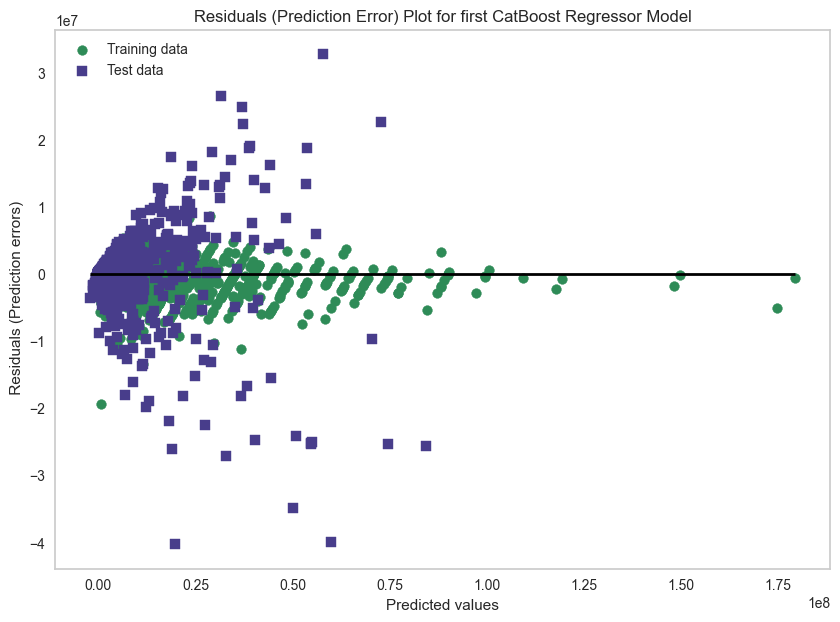

In [38]:
#model.fit(X_train, y_train)
y_train_pred = catboost_median.predict(X_train)
y_test_pred = catboost_median.predict(X_test)

# Calculate prediction errors
train_errors = y_train_pred - y_train
test_errors = y_test_pred - y_test

# Plot prediction errors
plt.figure(figsize=(10, 7))
plt.scatter(y_train_pred, train_errors, c='#2E8B57', marker='o', label='Training data')
plt.scatter(y_test_pred, test_errors, c='#483D8B', marker='s', label='Test data')
plt.xlabel('Predicted values')
plt.ylabel(' Residuals (Prediction errors)')
plt.legend(loc='upper left')
plt.hlines(y=0, xmin=min(y_train_pred.min(), y_test_pred.min()), xmax=max(y_train_pred.max(), y_test_pred.max()), color='black', lw=2)
plt.title('Residuals (Prediction Error) Plot for first CatBoost Regressor Model')
plt.grid()
plt.show()

In [39]:
# X = LightGBM_median_df.drop(['market_value_in_eur'], axis = 1)
# y = LightGBM_median_df_train['market_value_in_eur']

0:	learn: 8264647.7711382	total: 36.6ms	remaining: 36.6s
1:	learn: 8028757.0759368	total: 73.4ms	remaining: 36.7s
2:	learn: 7766686.0410954	total: 116ms	remaining: 38.5s
3:	learn: 7508702.4372797	total: 159ms	remaining: 39.7s
4:	learn: 7307073.6346513	total: 201ms	remaining: 40s
5:	learn: 7097692.0761297	total: 250ms	remaining: 41.4s
6:	learn: 6948212.0314092	total: 294ms	remaining: 41.8s
7:	learn: 6766931.9079845	total: 338ms	remaining: 41.9s
8:	learn: 6609487.2700112	total: 382ms	remaining: 42.1s
9:	learn: 6480944.4129739	total: 430ms	remaining: 42.5s
10:	learn: 6364826.3494530	total: 492ms	remaining: 44.2s
11:	learn: 6221812.2868681	total: 538ms	remaining: 44.3s
12:	learn: 6183972.6143185	total: 584ms	remaining: 44.3s
13:	learn: 6045199.3425967	total: 637ms	remaining: 44.9s
14:	learn: 5996023.1529869	total: 684ms	remaining: 44.9s
15:	learn: 5877938.6341142	total: 728ms	remaining: 44.8s
16:	learn: 5844204.6639939	total: 753ms	remaining: 43.5s
17:	learn: 5724183.7220298	total: 797ms	r

146:	learn: 1551474.1883064	total: 6.25s	remaining: 36.3s
147:	learn: 1537489.4261464	total: 6.29s	remaining: 36.2s
148:	learn: 1525722.7619383	total: 6.34s	remaining: 36.2s
149:	learn: 1509047.0471784	total: 6.38s	remaining: 36.2s
150:	learn: 1506106.7885996	total: 6.43s	remaining: 36.1s
151:	learn: 1491998.2561613	total: 6.47s	remaining: 36.1s
152:	learn: 1483179.1289042	total: 6.52s	remaining: 36.1s
153:	learn: 1470629.8062952	total: 6.56s	remaining: 36s
154:	learn: 1468138.0455442	total: 6.6s	remaining: 36s
155:	learn: 1454466.2090926	total: 6.64s	remaining: 35.9s
156:	learn: 1452641.5722166	total: 6.69s	remaining: 35.9s
157:	learn: 1444016.1056696	total: 6.73s	remaining: 35.9s
158:	learn: 1430847.0526100	total: 6.77s	remaining: 35.8s
159:	learn: 1427668.6407817	total: 6.81s	remaining: 35.7s
160:	learn: 1422717.4294389	total: 6.85s	remaining: 35.7s
161:	learn: 1420603.5693122	total: 6.89s	remaining: 35.6s
162:	learn: 1418280.4118717	total: 6.93s	remaining: 35.6s
163:	learn: 1405873

293:	learn: 815302.3126819	total: 12.8s	remaining: 30.7s
294:	learn: 809788.4348633	total: 12.8s	remaining: 30.7s
295:	learn: 809139.0415219	total: 12.9s	remaining: 30.6s
296:	learn: 808900.9271246	total: 12.9s	remaining: 30.6s
297:	learn: 806562.8744479	total: 13s	remaining: 30.5s
298:	learn: 802687.9000880	total: 13s	remaining: 30.5s
299:	learn: 800577.5216169	total: 13.1s	remaining: 30.5s
300:	learn: 797303.7144954	total: 13.1s	remaining: 30.4s
301:	learn: 790400.9545108	total: 13.1s	remaining: 30.4s
302:	learn: 787518.3027400	total: 13.2s	remaining: 30.3s
303:	learn: 784331.3938068	total: 13.2s	remaining: 30.3s
304:	learn: 781982.4098690	total: 13.3s	remaining: 30.2s
305:	learn: 779462.2433368	total: 13.3s	remaining: 30.2s
306:	learn: 778498.8324395	total: 13.4s	remaining: 30.2s
307:	learn: 773489.3106825	total: 13.4s	remaining: 30.1s
308:	learn: 768722.4774220	total: 13.4s	remaining: 30.1s
309:	learn: 767097.7444904	total: 13.5s	remaining: 30s
310:	learn: 763904.0049026	total: 13.

438:	learn: 502958.3511242	total: 19.3s	remaining: 24.6s
439:	learn: 500071.0432206	total: 19.3s	remaining: 24.6s
440:	learn: 498290.1220426	total: 19.4s	remaining: 24.5s
441:	learn: 495785.2508395	total: 19.4s	remaining: 24.5s
442:	learn: 494391.4261155	total: 19.4s	remaining: 24.4s
443:	learn: 492433.3496953	total: 19.5s	remaining: 24.4s
444:	learn: 491846.6788410	total: 19.5s	remaining: 24.4s
445:	learn: 491702.0690721	total: 19.6s	remaining: 24.3s
446:	learn: 488905.8142106	total: 19.6s	remaining: 24.3s
447:	learn: 488821.4176525	total: 19.7s	remaining: 24.2s
448:	learn: 488176.4200661	total: 19.7s	remaining: 24.2s
449:	learn: 485811.1337216	total: 19.7s	remaining: 24.1s
450:	learn: 484701.1326662	total: 19.8s	remaining: 24.1s
451:	learn: 483895.8008611	total: 19.8s	remaining: 24s
452:	learn: 482227.2276213	total: 19.9s	remaining: 24s
453:	learn: 481188.7201717	total: 19.9s	remaining: 23.9s
454:	learn: 480495.7066519	total: 20s	remaining: 23.9s
455:	learn: 480442.4776477	total: 20s

583:	learn: 355489.6521322	total: 25.6s	remaining: 18.2s
584:	learn: 354501.7862511	total: 25.6s	remaining: 18.2s
585:	learn: 353942.8396012	total: 25.6s	remaining: 18.1s
586:	learn: 353269.8749269	total: 25.7s	remaining: 18.1s
587:	learn: 352632.8998031	total: 25.7s	remaining: 18s
588:	learn: 351126.8603692	total: 25.8s	remaining: 18s
589:	learn: 350185.2945761	total: 25.8s	remaining: 18s
590:	learn: 349718.1505110	total: 25.9s	remaining: 17.9s
591:	learn: 349593.9961342	total: 25.9s	remaining: 17.9s
592:	learn: 348320.0157583	total: 26s	remaining: 17.8s
593:	learn: 345905.4926419	total: 26s	remaining: 17.8s
594:	learn: 345159.5913465	total: 26.1s	remaining: 17.7s
595:	learn: 344275.5838623	total: 26.1s	remaining: 17.7s
596:	learn: 343513.7443404	total: 26.1s	remaining: 17.6s
597:	learn: 343147.3512703	total: 26.2s	remaining: 17.6s
598:	learn: 342019.8166774	total: 26.2s	remaining: 17.6s
599:	learn: 340873.9752160	total: 26.3s	remaining: 17.5s
600:	learn: 339712.2142832	total: 26.3s	r

731:	learn: 266146.8329482	total: 32.2s	remaining: 11.8s
732:	learn: 265674.2004553	total: 32.2s	remaining: 11.7s
733:	learn: 265256.8367060	total: 32.3s	remaining: 11.7s
734:	learn: 264788.9639638	total: 32.3s	remaining: 11.7s
735:	learn: 264446.7549681	total: 32.4s	remaining: 11.6s
736:	learn: 264430.1317479	total: 32.4s	remaining: 11.6s
737:	learn: 264418.5386990	total: 32.4s	remaining: 11.5s
738:	learn: 263823.0882353	total: 32.5s	remaining: 11.5s
739:	learn: 263445.4884992	total: 32.5s	remaining: 11.4s
740:	learn: 263272.4610023	total: 32.6s	remaining: 11.4s
741:	learn: 262977.9125545	total: 32.6s	remaining: 11.3s
742:	learn: 262895.5438604	total: 32.7s	remaining: 11.3s
743:	learn: 262043.1888957	total: 32.7s	remaining: 11.3s
744:	learn: 261241.9217848	total: 32.7s	remaining: 11.2s
745:	learn: 261009.1669892	total: 32.8s	remaining: 11.2s
746:	learn: 260238.9441211	total: 32.8s	remaining: 11.1s
747:	learn: 259825.2926154	total: 32.9s	remaining: 11.1s
748:	learn: 259249.4878359	tota

878:	learn: 205987.4643953	total: 38.5s	remaining: 5.3s
879:	learn: 205522.8159768	total: 38.6s	remaining: 5.26s
880:	learn: 204939.5380633	total: 38.6s	remaining: 5.22s
881:	learn: 204922.8931273	total: 38.7s	remaining: 5.17s
882:	learn: 204630.6587998	total: 38.7s	remaining: 5.13s
883:	learn: 204390.4978387	total: 38.7s	remaining: 5.08s
884:	learn: 204258.1215443	total: 38.8s	remaining: 5.04s
885:	learn: 204037.2212676	total: 38.8s	remaining: 5s
886:	learn: 203994.2840370	total: 38.9s	remaining: 4.95s
887:	learn: 203083.2597338	total: 38.9s	remaining: 4.91s
888:	learn: 203077.8895573	total: 39s	remaining: 4.86s
889:	learn: 202324.2851454	total: 39s	remaining: 4.82s
890:	learn: 201862.4167352	total: 39s	remaining: 4.78s
891:	learn: 201774.2679156	total: 39.1s	remaining: 4.73s
892:	learn: 201498.5216645	total: 39.1s	remaining: 4.69s
893:	learn: 201153.4919091	total: 39.2s	remaining: 4.64s
894:	learn: 200908.8704141	total: 39.2s	remaining: 4.6s
895:	learn: 200886.5966743	total: 39.3s	re

27:	learn: 5532535.2077115	total: 1.2s	remaining: 41.5s
28:	learn: 5461819.9278723	total: 1.24s	remaining: 41.6s
29:	learn: 5414272.0212678	total: 1.28s	remaining: 41.5s
30:	learn: 5319014.6504784	total: 1.33s	remaining: 41.5s
31:	learn: 5250364.9523229	total: 1.37s	remaining: 41.5s
32:	learn: 5142521.2775102	total: 1.42s	remaining: 41.5s
33:	learn: 5067804.3322691	total: 1.46s	remaining: 41.5s
34:	learn: 4974117.2439360	total: 1.5s	remaining: 41.5s
35:	learn: 4956691.0285421	total: 1.52s	remaining: 40.7s
36:	learn: 4860110.3259462	total: 1.56s	remaining: 40.7s
37:	learn: 4845488.3486655	total: 1.58s	remaining: 40.1s
38:	learn: 4781401.8064465	total: 1.63s	remaining: 40.1s
39:	learn: 4728494.2925411	total: 1.67s	remaining: 40.1s
40:	learn: 4699544.5662534	total: 1.71s	remaining: 40.1s
41:	learn: 4671005.0586018	total: 1.76s	remaining: 40.1s
42:	learn: 4598635.9073548	total: 1.8s	remaining: 40.1s
43:	learn: 4569118.9000908	total: 1.85s	remaining: 40.1s
44:	learn: 4484242.4704453	total: 

174:	learn: 2309768.2087510	total: 7.81s	remaining: 36.8s
175:	learn: 2299178.8201172	total: 7.85s	remaining: 36.8s
176:	learn: 2295311.1107282	total: 7.89s	remaining: 36.7s
177:	learn: 2279392.5726150	total: 7.94s	remaining: 36.7s
178:	learn: 2265083.3019166	total: 7.99s	remaining: 36.7s
179:	learn: 2264342.3134119	total: 8.04s	remaining: 36.6s
180:	learn: 2263143.2547803	total: 8.08s	remaining: 36.6s
181:	learn: 2257943.0551046	total: 8.12s	remaining: 36.5s
182:	learn: 2249933.1581040	total: 8.17s	remaining: 36.5s
183:	learn: 2240764.8764360	total: 8.21s	remaining: 36.4s
184:	learn: 2226966.7986831	total: 8.25s	remaining: 36.4s
185:	learn: 2226206.0852402	total: 8.3s	remaining: 36.3s
186:	learn: 2225507.1289155	total: 8.34s	remaining: 36.3s
187:	learn: 2217117.9385170	total: 8.39s	remaining: 36.2s
188:	learn: 2208836.2421775	total: 8.43s	remaining: 36.2s
189:	learn: 2193434.9295683	total: 8.47s	remaining: 36.1s
190:	learn: 2183604.3661401	total: 8.52s	remaining: 36.1s
191:	learn: 218

318:	learn: 1530539.9808046	total: 14.3s	remaining: 30.5s
319:	learn: 1524721.9259910	total: 14.3s	remaining: 30.5s
320:	learn: 1524468.5129592	total: 14.4s	remaining: 30.4s
321:	learn: 1519724.9712373	total: 14.5s	remaining: 30.4s
322:	learn: 1517276.5820285	total: 14.5s	remaining: 30.4s
323:	learn: 1512616.4639805	total: 14.5s	remaining: 30.3s
324:	learn: 1512374.1137415	total: 14.6s	remaining: 30.3s
325:	learn: 1508605.7480331	total: 14.6s	remaining: 30.3s
326:	learn: 1504308.4555141	total: 14.7s	remaining: 30.2s
327:	learn: 1499115.8054770	total: 14.7s	remaining: 30.2s
328:	learn: 1489669.1094230	total: 14.8s	remaining: 30.1s
329:	learn: 1487915.3346882	total: 14.8s	remaining: 30.1s
330:	learn: 1484177.5523503	total: 14.9s	remaining: 30s
331:	learn: 1480524.9814861	total: 14.9s	remaining: 30s
332:	learn: 1478470.8204033	total: 15s	remaining: 29.9s
333:	learn: 1476095.5455290	total: 15s	remaining: 29.9s
334:	learn: 1473313.3209130	total: 15s	remaining: 29.9s
335:	learn: 1470036.1718

463:	learn: 1096786.7130457	total: 20.8s	remaining: 24.1s
464:	learn: 1094540.0272102	total: 20.9s	remaining: 24s
465:	learn: 1090639.8806342	total: 20.9s	remaining: 24s
466:	learn: 1090609.8662234	total: 21s	remaining: 23.9s
467:	learn: 1088342.9724040	total: 21s	remaining: 23.9s
468:	learn: 1088280.0845630	total: 21s	remaining: 23.8s
469:	learn: 1087450.1444387	total: 21.1s	remaining: 23.8s
470:	learn: 1085181.8155065	total: 21.1s	remaining: 23.7s
471:	learn: 1083508.0159870	total: 21.2s	remaining: 23.7s
472:	learn: 1082985.5183040	total: 21.2s	remaining: 23.6s
473:	learn: 1082522.7220092	total: 21.3s	remaining: 23.6s
474:	learn: 1078978.7875053	total: 21.3s	remaining: 23.6s
475:	learn: 1075682.6881777	total: 21.4s	remaining: 23.5s
476:	learn: 1073968.3227549	total: 21.4s	remaining: 23.5s
477:	learn: 1071053.2924234	total: 21.5s	remaining: 23.4s
478:	learn: 1068041.7686134	total: 21.5s	remaining: 23.4s
479:	learn: 1067085.0656536	total: 21.5s	remaining: 23.3s
480:	learn: 1063534.0163

607:	learn: 885539.4335175	total: 27.3s	remaining: 17.6s
608:	learn: 884364.5816683	total: 27.3s	remaining: 17.5s
609:	learn: 883508.3764538	total: 27.4s	remaining: 17.5s
610:	learn: 881307.2766183	total: 27.4s	remaining: 17.4s
611:	learn: 879109.8636753	total: 27.4s	remaining: 17.4s
612:	learn: 879034.6468068	total: 27.5s	remaining: 17.4s
613:	learn: 876570.7048641	total: 27.5s	remaining: 17.3s
614:	learn: 876391.9802251	total: 27.6s	remaining: 17.3s
615:	learn: 874347.1391643	total: 27.6s	remaining: 17.2s
616:	learn: 873238.3113846	total: 27.7s	remaining: 17.2s
617:	learn: 871262.2784796	total: 27.7s	remaining: 17.1s
618:	learn: 870808.9254992	total: 27.8s	remaining: 17.1s
619:	learn: 869146.4150917	total: 27.8s	remaining: 17s
620:	learn: 867755.2994023	total: 27.8s	remaining: 17s
621:	learn: 865806.9781609	total: 27.9s	remaining: 16.9s
622:	learn: 864642.5108757	total: 27.9s	remaining: 16.9s
623:	learn: 863663.0133963	total: 28s	remaining: 16.9s
624:	learn: 863623.4227017	total: 28s

755:	learn: 725989.1624723	total: 33.9s	remaining: 11s
756:	learn: 724820.8527281	total: 34s	remaining: 10.9s
757:	learn: 724413.0588855	total: 34s	remaining: 10.9s
758:	learn: 723773.3089314	total: 34.1s	remaining: 10.8s
759:	learn: 723686.3064572	total: 34.1s	remaining: 10.8s
760:	learn: 723349.9610276	total: 34.2s	remaining: 10.7s
761:	learn: 722607.5462249	total: 34.2s	remaining: 10.7s
762:	learn: 721604.7031159	total: 34.2s	remaining: 10.6s
763:	learn: 720721.7104561	total: 34.3s	remaining: 10.6s
764:	learn: 720407.3469109	total: 34.3s	remaining: 10.5s
765:	learn: 719232.4469549	total: 34.4s	remaining: 10.5s
766:	learn: 718409.2272982	total: 34.4s	remaining: 10.5s
767:	learn: 718382.8725250	total: 34.5s	remaining: 10.4s
768:	learn: 717822.5022705	total: 34.5s	remaining: 10.4s
769:	learn: 717103.2324507	total: 34.6s	remaining: 10.3s
770:	learn: 716151.0620381	total: 34.6s	remaining: 10.3s
771:	learn: 716088.8395351	total: 34.6s	remaining: 10.2s
772:	learn: 715260.5730461	total: 34.

901:	learn: 603247.3156066	total: 40.6s	remaining: 4.42s
902:	learn: 602361.4901920	total: 40.7s	remaining: 4.37s
903:	learn: 601091.6856422	total: 40.7s	remaining: 4.33s
904:	learn: 600638.6264607	total: 40.8s	remaining: 4.28s
905:	learn: 600035.4428907	total: 40.8s	remaining: 4.24s
906:	learn: 599271.0124818	total: 40.9s	remaining: 4.19s
907:	learn: 598775.5587551	total: 40.9s	remaining: 4.15s
908:	learn: 597090.9889590	total: 41s	remaining: 4.1s
909:	learn: 597061.3421622	total: 41s	remaining: 4.06s
910:	learn: 596174.5230363	total: 41.1s	remaining: 4.01s
911:	learn: 595215.5128225	total: 41.1s	remaining: 3.97s
912:	learn: 594855.0493730	total: 41.2s	remaining: 3.92s
913:	learn: 594624.1528803	total: 41.2s	remaining: 3.88s
914:	learn: 593433.4619256	total: 41.2s	remaining: 3.83s
915:	learn: 592696.8726593	total: 41.3s	remaining: 3.79s
916:	learn: 592305.2068137	total: 41.3s	remaining: 3.74s
917:	learn: 590732.3687304	total: 41.4s	remaining: 3.7s
918:	learn: 590492.1191032	total: 41.

46:	learn: 3988133.8114875	total: 2.15s	remaining: 43.7s
47:	learn: 3967801.4900588	total: 2.2s	remaining: 43.6s
48:	learn: 3925327.3519246	total: 2.25s	remaining: 43.6s
49:	learn: 3908966.5910646	total: 2.29s	remaining: 43.5s
50:	learn: 3895911.9049923	total: 2.34s	remaining: 43.5s
51:	learn: 3877736.9031209	total: 2.38s	remaining: 43.4s
52:	learn: 3836976.0936616	total: 2.43s	remaining: 43.4s
53:	learn: 3815271.3180753	total: 2.47s	remaining: 43.3s
54:	learn: 3798211.9314803	total: 2.52s	remaining: 43.3s
55:	learn: 3771401.7536385	total: 2.57s	remaining: 43.3s
56:	learn: 3753191.7543121	total: 2.61s	remaining: 43.2s
57:	learn: 3739163.2447150	total: 2.66s	remaining: 43.1s
58:	learn: 3731344.5845596	total: 2.7s	remaining: 43.1s
59:	learn: 3698233.9674812	total: 2.75s	remaining: 43.1s
60:	learn: 3670994.8556455	total: 2.8s	remaining: 43s
61:	learn: 3642311.9419125	total: 2.86s	remaining: 43.2s
62:	learn: 3621811.8022900	total: 2.91s	remaining: 43.3s
63:	learn: 3587151.7630733	total: 2.

190:	learn: 2335129.3401558	total: 8.73s	remaining: 37s
191:	learn: 2328367.5600148	total: 8.77s	remaining: 36.9s
192:	learn: 2324759.2981774	total: 8.82s	remaining: 36.9s
193:	learn: 2324482.0924501	total: 8.86s	remaining: 36.8s
194:	learn: 2320297.6209512	total: 8.91s	remaining: 36.8s
195:	learn: 2312750.5363066	total: 8.96s	remaining: 36.7s
196:	learn: 2302323.8794972	total: 9s	remaining: 36.7s
197:	learn: 2290971.8809886	total: 9.05s	remaining: 36.7s
198:	learn: 2287462.6002273	total: 9.1s	remaining: 36.6s
199:	learn: 2283934.2830079	total: 9.14s	remaining: 36.6s
200:	learn: 2276701.2225273	total: 9.19s	remaining: 36.5s
201:	learn: 2271405.9854085	total: 9.24s	remaining: 36.5s
202:	learn: 2266336.9866809	total: 9.28s	remaining: 36.4s
203:	learn: 2264152.7306488	total: 9.33s	remaining: 36.4s
204:	learn: 2262630.2360898	total: 9.37s	remaining: 36.4s
205:	learn: 2253515.9324198	total: 9.42s	remaining: 36.3s
206:	learn: 2247954.3801066	total: 9.46s	remaining: 36.2s
207:	learn: 2238464.

335:	learn: 1703296.0442555	total: 15.4s	remaining: 30.3s
336:	learn: 1698277.6500817	total: 15.4s	remaining: 30.3s
337:	learn: 1694229.6801750	total: 15.4s	remaining: 30.2s
338:	learn: 1690279.0106848	total: 15.5s	remaining: 30.2s
339:	learn: 1685608.1503539	total: 15.5s	remaining: 30.1s
340:	learn: 1685071.9611973	total: 15.6s	remaining: 30.1s
341:	learn: 1682538.5511771	total: 15.6s	remaining: 30.1s
342:	learn: 1679153.2355639	total: 15.7s	remaining: 30s
343:	learn: 1672747.7187097	total: 15.7s	remaining: 30s
344:	learn: 1670416.2423245	total: 15.8s	remaining: 29.9s
345:	learn: 1666459.4579144	total: 15.8s	remaining: 29.9s
346:	learn: 1663771.6380469	total: 15.8s	remaining: 29.8s
347:	learn: 1663650.6033658	total: 15.9s	remaining: 29.8s
348:	learn: 1659106.7281096	total: 15.9s	remaining: 29.7s
349:	learn: 1654360.9217860	total: 16s	remaining: 29.7s
350:	learn: 1649718.9216095	total: 16s	remaining: 29.6s
351:	learn: 1645316.0881195	total: 16.1s	remaining: 29.6s
352:	learn: 1642323.96

480:	learn: 1341871.2676970	total: 21.9s	remaining: 23.7s
481:	learn: 1340453.0347958	total: 22s	remaining: 23.6s
482:	learn: 1338241.4797307	total: 22s	remaining: 23.6s
483:	learn: 1337064.5224600	total: 22.1s	remaining: 23.6s
484:	learn: 1335254.1134352	total: 22.1s	remaining: 23.5s
485:	learn: 1333835.8446253	total: 22.2s	remaining: 23.5s
486:	learn: 1332188.9259046	total: 22.2s	remaining: 23.4s
487:	learn: 1331588.9150377	total: 22.3s	remaining: 23.4s
488:	learn: 1327832.1047404	total: 22.3s	remaining: 23.3s
489:	learn: 1326765.9539304	total: 22.4s	remaining: 23.3s
490:	learn: 1324184.4151387	total: 22.4s	remaining: 23.2s
491:	learn: 1321958.2803839	total: 22.5s	remaining: 23.2s
492:	learn: 1319166.7441498	total: 22.5s	remaining: 23.2s
493:	learn: 1318534.7360957	total: 22.6s	remaining: 23.1s
494:	learn: 1317491.0060960	total: 22.6s	remaining: 23.1s
495:	learn: 1315516.0298998	total: 22.6s	remaining: 23s
496:	learn: 1314487.3135530	total: 22.7s	remaining: 23s
497:	learn: 1311703.24

626:	learn: 1088982.4013851	total: 28.7s	remaining: 17.1s
627:	learn: 1086983.0592947	total: 28.8s	remaining: 17.1s
628:	learn: 1085534.2159452	total: 28.8s	remaining: 17s
629:	learn: 1083926.8775348	total: 28.9s	remaining: 17s
630:	learn: 1082348.3801447	total: 28.9s	remaining: 16.9s
631:	learn: 1082238.7350953	total: 29s	remaining: 16.9s
632:	learn: 1081147.4940605	total: 29s	remaining: 16.8s
633:	learn: 1079758.2975337	total: 29.1s	remaining: 16.8s
634:	learn: 1078197.6409404	total: 29.1s	remaining: 16.7s
635:	learn: 1077928.4756872	total: 29.2s	remaining: 16.7s
636:	learn: 1077027.2514979	total: 29.2s	remaining: 16.6s
637:	learn: 1074775.5999265	total: 29.3s	remaining: 16.6s
638:	learn: 1074169.7924066	total: 29.3s	remaining: 16.6s
639:	learn: 1072858.1526823	total: 29.4s	remaining: 16.5s
640:	learn: 1071524.8387748	total: 29.4s	remaining: 16.5s
641:	learn: 1068662.4445051	total: 29.5s	remaining: 16.4s
642:	learn: 1066501.5165353	total: 29.5s	remaining: 16.4s
643:	learn: 1064327.03

770:	learn: 934518.8667156	total: 35.4s	remaining: 10.5s
771:	learn: 933325.4992897	total: 35.4s	remaining: 10.5s
772:	learn: 932777.1658079	total: 35.5s	remaining: 10.4s
773:	learn: 931972.4926266	total: 35.5s	remaining: 10.4s
774:	learn: 931947.3073357	total: 35.6s	remaining: 10.3s
775:	learn: 931780.1337414	total: 35.6s	remaining: 10.3s
776:	learn: 930804.6422881	total: 35.7s	remaining: 10.2s
777:	learn: 929729.0254475	total: 35.7s	remaining: 10.2s
778:	learn: 928637.5119335	total: 35.8s	remaining: 10.1s
779:	learn: 928447.0520692	total: 35.8s	remaining: 10.1s
780:	learn: 927120.9700294	total: 35.8s	remaining: 10.1s
781:	learn: 925596.3497379	total: 35.9s	remaining: 10s
782:	learn: 923332.7704147	total: 35.9s	remaining: 9.96s
783:	learn: 922834.2706953	total: 36s	remaining: 9.91s
784:	learn: 922538.7126540	total: 36s	remaining: 9.87s
785:	learn: 920255.9329311	total: 36.1s	remaining: 9.82s
786:	learn: 919092.8959433	total: 36.1s	remaining: 9.77s
787:	learn: 918153.8068629	total: 36.

915:	learn: 812286.6802886	total: 42.1s	remaining: 3.86s
916:	learn: 811745.6545266	total: 42.2s	remaining: 3.82s
917:	learn: 811502.2883380	total: 42.2s	remaining: 3.77s
918:	learn: 810755.5499551	total: 42.3s	remaining: 3.73s
919:	learn: 810639.6833259	total: 42.3s	remaining: 3.68s
920:	learn: 810055.5333363	total: 42.4s	remaining: 3.63s
921:	learn: 808602.3763524	total: 42.4s	remaining: 3.59s
922:	learn: 808362.2404814	total: 42.5s	remaining: 3.54s
923:	learn: 807422.0410492	total: 42.5s	remaining: 3.5s
924:	learn: 807260.3927623	total: 42.6s	remaining: 3.45s
925:	learn: 806227.1007346	total: 42.6s	remaining: 3.4s
926:	learn: 805712.5442026	total: 42.7s	remaining: 3.36s
927:	learn: 804860.4313836	total: 42.7s	remaining: 3.31s
928:	learn: 803810.5103883	total: 42.7s	remaining: 3.27s
929:	learn: 802561.6543973	total: 42.8s	remaining: 3.22s
930:	learn: 802212.8072340	total: 42.8s	remaining: 3.17s
931:	learn: 801242.9222068	total: 42.9s	remaining: 3.13s
932:	learn: 801081.7133870	total:

61:	learn: 3874278.1706981	total: 2.83s	remaining: 42.9s
62:	learn: 3871568.4595520	total: 2.88s	remaining: 42.8s
63:	learn: 3834323.7715235	total: 2.93s	remaining: 42.8s
64:	learn: 3801110.4494202	total: 2.97s	remaining: 42.8s
65:	learn: 3796455.8126925	total: 3.02s	remaining: 42.7s
66:	learn: 3791676.2035382	total: 3.06s	remaining: 42.7s
67:	learn: 3763528.7072536	total: 3.11s	remaining: 42.7s
68:	learn: 3728843.9166668	total: 3.16s	remaining: 42.6s
69:	learn: 3714866.1755067	total: 3.2s	remaining: 42.6s
70:	learn: 3711412.8777854	total: 3.24s	remaining: 42.4s
71:	learn: 3702996.6107275	total: 3.29s	remaining: 42.4s
72:	learn: 3699202.9122430	total: 3.34s	remaining: 42.4s
73:	learn: 3680742.5165154	total: 3.38s	remaining: 42.3s
74:	learn: 3679588.9600329	total: 3.4s	remaining: 41.9s
75:	learn: 3675745.4225596	total: 3.44s	remaining: 41.9s
76:	learn: 3668216.7959496	total: 3.49s	remaining: 41.8s
77:	learn: 3667212.2639695	total: 3.51s	remaining: 41.5s
78:	learn: 3648778.3384682	total:

204:	learn: 2406215.1619462	total: 9.54s	remaining: 37s
205:	learn: 2406019.2308214	total: 9.59s	remaining: 37s
206:	learn: 2405693.6534279	total: 9.63s	remaining: 36.9s
207:	learn: 2402155.9748127	total: 9.68s	remaining: 36.9s
208:	learn: 2396251.4524384	total: 9.73s	remaining: 36.8s
209:	learn: 2391522.4217887	total: 9.77s	remaining: 36.8s
210:	learn: 2386723.9797244	total: 9.82s	remaining: 36.7s
211:	learn: 2382749.5765820	total: 9.87s	remaining: 36.7s
212:	learn: 2366259.8349297	total: 9.91s	remaining: 36.6s
213:	learn: 2359630.0799000	total: 9.96s	remaining: 36.6s
214:	learn: 2358317.5889527	total: 10s	remaining: 36.6s
215:	learn: 2352318.2242429	total: 10.1s	remaining: 36.5s
216:	learn: 2344143.7236443	total: 10.1s	remaining: 36.5s
217:	learn: 2339700.3814004	total: 10.2s	remaining: 36.4s
218:	learn: 2334957.9243964	total: 10.2s	remaining: 36.4s
219:	learn: 2332606.6133236	total: 10.3s	remaining: 36.4s
220:	learn: 2323216.0740569	total: 10.3s	remaining: 36.3s
221:	learn: 2321310.

351:	learn: 1816183.1429165	total: 16.6s	remaining: 30.5s
352:	learn: 1809277.5293582	total: 16.6s	remaining: 30.5s
353:	learn: 1808054.3023409	total: 16.7s	remaining: 30.4s
354:	learn: 1803079.4721629	total: 16.7s	remaining: 30.4s
355:	learn: 1798976.5107992	total: 16.8s	remaining: 30.4s
356:	learn: 1797960.1081882	total: 16.8s	remaining: 30.3s
357:	learn: 1796100.7189724	total: 16.9s	remaining: 30.3s
358:	learn: 1795226.3949576	total: 16.9s	remaining: 30.2s
359:	learn: 1791300.2441751	total: 17s	remaining: 30.2s
360:	learn: 1788777.5081172	total: 17s	remaining: 30.1s
361:	learn: 1788193.1745738	total: 17.1s	remaining: 30.1s
362:	learn: 1785861.7706495	total: 17.1s	remaining: 30s
363:	learn: 1785774.4003199	total: 17.2s	remaining: 30s
364:	learn: 1783348.4305614	total: 17.2s	remaining: 29.9s
365:	learn: 1782926.5932666	total: 17.2s	remaining: 29.9s
366:	learn: 1781675.8006141	total: 17.3s	remaining: 29.8s
367:	learn: 1776913.9768914	total: 17.3s	remaining: 29.8s
368:	learn: 1775306.23

495:	learn: 1512734.8895043	total: 23.4s	remaining: 23.8s
496:	learn: 1510279.5861084	total: 23.5s	remaining: 23.7s
497:	learn: 1508904.0517305	total: 23.5s	remaining: 23.7s
498:	learn: 1508671.7975425	total: 23.5s	remaining: 23.6s
499:	learn: 1506988.2252354	total: 23.6s	remaining: 23.6s
500:	learn: 1504619.4308002	total: 23.6s	remaining: 23.5s
501:	learn: 1503811.4378464	total: 23.7s	remaining: 23.5s
502:	learn: 1502156.6986937	total: 23.7s	remaining: 23.5s
503:	learn: 1500109.2421826	total: 23.8s	remaining: 23.4s
504:	learn: 1498727.6771377	total: 23.8s	remaining: 23.4s
505:	learn: 1497898.5529898	total: 23.9s	remaining: 23.3s
506:	learn: 1495958.4249324	total: 23.9s	remaining: 23.3s
507:	learn: 1492577.0984169	total: 24s	remaining: 23.2s
508:	learn: 1487727.7093202	total: 24s	remaining: 23.2s
509:	learn: 1484859.1122055	total: 24.1s	remaining: 23.1s
510:	learn: 1483709.6152080	total: 24.1s	remaining: 23.1s
511:	learn: 1482634.2881871	total: 24.2s	remaining: 23s
512:	learn: 1482543.

639:	learn: 1287546.4195376	total: 30.2s	remaining: 17s
640:	learn: 1286892.3495501	total: 30.3s	remaining: 16.9s
641:	learn: 1286838.6188188	total: 30.3s	remaining: 16.9s
642:	learn: 1285659.8049214	total: 30.3s	remaining: 16.8s
643:	learn: 1285378.4719706	total: 30.4s	remaining: 16.8s
644:	learn: 1285296.6654128	total: 30.4s	remaining: 16.8s
645:	learn: 1283509.5507411	total: 30.5s	remaining: 16.7s
646:	learn: 1281385.0332889	total: 30.5s	remaining: 16.7s
647:	learn: 1281369.1577243	total: 30.6s	remaining: 16.6s
648:	learn: 1279742.4956275	total: 30.6s	remaining: 16.6s
649:	learn: 1277093.4617590	total: 30.7s	remaining: 16.5s
650:	learn: 1275548.0485662	total: 30.7s	remaining: 16.5s
651:	learn: 1273496.0401007	total: 30.8s	remaining: 16.4s
652:	learn: 1272860.6239072	total: 30.8s	remaining: 16.4s
653:	learn: 1270986.8427556	total: 30.9s	remaining: 16.3s
654:	learn: 1269895.5799169	total: 30.9s	remaining: 16.3s
655:	learn: 1268891.2488358	total: 30.9s	remaining: 16.2s
656:	learn: 1268

783:	learn: 1114455.8873576	total: 37.3s	remaining: 10.3s
784:	learn: 1113918.9214463	total: 37.3s	remaining: 10.2s
785:	learn: 1112562.9327017	total: 37.4s	remaining: 10.2s
786:	learn: 1111907.4920025	total: 37.4s	remaining: 10.1s
787:	learn: 1111299.8739136	total: 37.5s	remaining: 10.1s
788:	learn: 1111018.7835159	total: 37.5s	remaining: 10s
789:	learn: 1110998.2959044	total: 37.6s	remaining: 9.98s
790:	learn: 1110617.4708224	total: 37.6s	remaining: 9.93s
791:	learn: 1109712.1146680	total: 37.6s	remaining: 9.89s
792:	learn: 1108383.7707311	total: 37.7s	remaining: 9.84s
793:	learn: 1106998.6156093	total: 37.8s	remaining: 9.8s
794:	learn: 1106158.3382327	total: 37.8s	remaining: 9.75s
795:	learn: 1104875.1388993	total: 37.9s	remaining: 9.7s
796:	learn: 1104284.2045118	total: 37.9s	remaining: 9.65s
797:	learn: 1103042.5327442	total: 38s	remaining: 9.61s
798:	learn: 1101788.5908667	total: 38s	remaining: 9.56s
799:	learn: 1100760.3700946	total: 38.1s	remaining: 9.51s
800:	learn: 1100315.15

927:	learn: 997656.7927610	total: 44.4s	remaining: 3.44s
928:	learn: 996273.5691317	total: 44.4s	remaining: 3.4s
929:	learn: 995570.6176463	total: 44.5s	remaining: 3.35s
930:	learn: 994847.8295773	total: 44.5s	remaining: 3.3s
931:	learn: 993884.5084799	total: 44.6s	remaining: 3.25s
932:	learn: 993296.1225909	total: 44.6s	remaining: 3.2s
933:	learn: 992291.6628812	total: 44.7s	remaining: 3.16s
934:	learn: 991130.6045081	total: 44.7s	remaining: 3.11s
935:	learn: 990472.2566015	total: 44.8s	remaining: 3.06s
936:	learn: 989882.6264731	total: 44.8s	remaining: 3.01s
937:	learn: 989673.8329494	total: 44.8s	remaining: 2.96s
938:	learn: 988842.1031023	total: 44.9s	remaining: 2.92s
939:	learn: 987171.8859258	total: 44.9s	remaining: 2.87s
940:	learn: 986319.5631348	total: 45s	remaining: 2.82s
941:	learn: 986082.4424908	total: 45s	remaining: 2.77s
942:	learn: 985479.6979571	total: 45.1s	remaining: 2.72s
943:	learn: 984671.4802397	total: 45.1s	remaining: 2.68s
944:	learn: 982882.7736916	total: 45.2

75:	learn: 3602158.5727201	total: 3.55s	remaining: 43.1s
76:	learn: 3600521.0757024	total: 3.57s	remaining: 42.8s
77:	learn: 3596487.2167594	total: 3.62s	remaining: 42.8s
78:	learn: 3582814.7762957	total: 3.66s	remaining: 42.7s
79:	learn: 3572771.0172838	total: 3.71s	remaining: 42.7s
80:	learn: 3568159.6668076	total: 3.76s	remaining: 42.6s
81:	learn: 3549954.8018780	total: 3.81s	remaining: 42.6s
82:	learn: 3543058.6378251	total: 3.84s	remaining: 42.4s
83:	learn: 3524770.9420688	total: 3.88s	remaining: 42.4s
84:	learn: 3508596.7353387	total: 3.93s	remaining: 42.3s
85:	learn: 3504916.1761380	total: 3.98s	remaining: 42.3s
86:	learn: 3502260.4009434	total: 4.02s	remaining: 42.2s
87:	learn: 3491510.8856324	total: 4.07s	remaining: 42.1s
88:	learn: 3485933.1022811	total: 4.11s	remaining: 42.1s
89:	learn: 3483523.5349788	total: 4.16s	remaining: 42.1s
90:	learn: 3481259.4322660	total: 4.21s	remaining: 42s
91:	learn: 3466176.9691584	total: 4.25s	remaining: 42s
92:	learn: 3451522.0857393	total: 4

218:	learn: 2504267.5437226	total: 10.4s	remaining: 37s
219:	learn: 2498606.4365954	total: 10.4s	remaining: 37s
220:	learn: 2498137.9010079	total: 10.5s	remaining: 36.9s
221:	learn: 2494162.1585214	total: 10.5s	remaining: 36.9s
222:	learn: 2493654.9444992	total: 10.6s	remaining: 36.8s
223:	learn: 2486349.6981008	total: 10.6s	remaining: 36.8s
224:	learn: 2475164.4933823	total: 10.7s	remaining: 36.7s
225:	learn: 2473395.1235562	total: 10.7s	remaining: 36.7s
226:	learn: 2472748.6486070	total: 10.8s	remaining: 36.6s
227:	learn: 2472440.4272994	total: 10.8s	remaining: 36.6s
228:	learn: 2467405.0463676	total: 10.8s	remaining: 36.5s
229:	learn: 2464367.3518311	total: 10.9s	remaining: 36.5s
230:	learn: 2454928.2944317	total: 10.9s	remaining: 36.4s
231:	learn: 2448814.9289637	total: 11s	remaining: 36.4s
232:	learn: 2443185.3856481	total: 11s	remaining: 36.3s
233:	learn: 2432857.5661770	total: 11.1s	remaining: 36.3s
234:	learn: 2428373.1547654	total: 11.1s	remaining: 36.2s
235:	learn: 2424797.98

364:	learn: 1963197.6973065	total: 17.4s	remaining: 30.3s
365:	learn: 1959563.6164615	total: 17.5s	remaining: 30.3s
366:	learn: 1955036.8307692	total: 17.5s	remaining: 30.2s
367:	learn: 1952076.1886860	total: 17.6s	remaining: 30.2s
368:	learn: 1948882.9400822	total: 17.6s	remaining: 30.1s
369:	learn: 1942996.6120430	total: 17.6s	remaining: 30.1s
370:	learn: 1936687.4620746	total: 17.7s	remaining: 30s
371:	learn: 1934397.3480067	total: 17.7s	remaining: 30s
372:	learn: 1932324.5932734	total: 17.8s	remaining: 29.9s
373:	learn: 1927395.9397622	total: 17.8s	remaining: 29.9s
374:	learn: 1922305.6362799	total: 17.9s	remaining: 29.8s
375:	learn: 1918481.5314083	total: 17.9s	remaining: 29.8s
376:	learn: 1915773.9116582	total: 18s	remaining: 29.7s
377:	learn: 1913553.4620803	total: 18s	remaining: 29.7s
378:	learn: 1906977.9499456	total: 18.1s	remaining: 29.6s
379:	learn: 1904151.3144746	total: 18.1s	remaining: 29.6s
380:	learn: 1902136.9312559	total: 18.2s	remaining: 29.5s
381:	learn: 1900571.14

509:	learn: 1645090.4813928	total: 24.5s	remaining: 23.5s
510:	learn: 1641590.3037677	total: 24.5s	remaining: 23.4s
511:	learn: 1638786.2413138	total: 24.5s	remaining: 23.4s
512:	learn: 1637081.7391869	total: 24.6s	remaining: 23.4s
513:	learn: 1635544.2923621	total: 24.6s	remaining: 23.3s
514:	learn: 1632293.3752427	total: 24.7s	remaining: 23.3s
515:	learn: 1630510.7772482	total: 24.7s	remaining: 23.2s
516:	learn: 1629606.9957007	total: 24.8s	remaining: 23.2s
517:	learn: 1628870.4448945	total: 24.8s	remaining: 23.1s
518:	learn: 1628520.3653494	total: 24.9s	remaining: 23.1s
519:	learn: 1626480.0668335	total: 24.9s	remaining: 23s
520:	learn: 1624683.7493036	total: 25s	remaining: 23s
521:	learn: 1620529.0784334	total: 25s	remaining: 22.9s
522:	learn: 1620398.3231541	total: 25.1s	remaining: 22.9s
523:	learn: 1619750.6196439	total: 25.1s	remaining: 22.8s
524:	learn: 1618476.5290595	total: 25.2s	remaining: 22.8s
525:	learn: 1617869.9253328	total: 25.2s	remaining: 22.7s
526:	learn: 1614939.63

652:	learn: 1445434.5345178	total: 31.4s	remaining: 16.7s
653:	learn: 1443525.3954308	total: 31.4s	remaining: 16.6s
654:	learn: 1441698.9935398	total: 31.5s	remaining: 16.6s
655:	learn: 1440613.0214049	total: 31.5s	remaining: 16.5s
656:	learn: 1438906.2399857	total: 31.6s	remaining: 16.5s
657:	learn: 1438833.5237798	total: 31.6s	remaining: 16.4s
658:	learn: 1437577.2504684	total: 31.7s	remaining: 16.4s
659:	learn: 1436998.2195882	total: 31.7s	remaining: 16.3s
660:	learn: 1436123.3814718	total: 31.8s	remaining: 16.3s
661:	learn: 1435741.1257118	total: 31.8s	remaining: 16.2s
662:	learn: 1435277.9164812	total: 31.9s	remaining: 16.2s
663:	learn: 1432993.5462225	total: 31.9s	remaining: 16.1s
664:	learn: 1431574.5947676	total: 32s	remaining: 16.1s
665:	learn: 1430980.0354521	total: 32s	remaining: 16.1s
666:	learn: 1428853.9807437	total: 32.1s	remaining: 16s
667:	learn: 1428791.3683212	total: 32.1s	remaining: 16s
668:	learn: 1428206.1010883	total: 32.1s	remaining: 15.9s
669:	learn: 1427327.85

796:	learn: 1279160.8888622	total: 38.3s	remaining: 9.76s
797:	learn: 1278270.8883337	total: 38.4s	remaining: 9.71s
798:	learn: 1277974.9368839	total: 38.4s	remaining: 9.67s
799:	learn: 1276819.4168456	total: 38.5s	remaining: 9.62s
800:	learn: 1276165.0322580	total: 38.5s	remaining: 9.57s
801:	learn: 1275487.0822704	total: 38.6s	remaining: 9.52s
802:	learn: 1274538.5135374	total: 38.6s	remaining: 9.47s
803:	learn: 1273145.7462828	total: 38.7s	remaining: 9.43s
804:	learn: 1272952.2266447	total: 38.7s	remaining: 9.38s
805:	learn: 1272884.7969477	total: 38.8s	remaining: 9.33s
806:	learn: 1271196.7326786	total: 38.8s	remaining: 9.28s
807:	learn: 1269277.4861655	total: 38.9s	remaining: 9.24s
808:	learn: 1269039.4290137	total: 38.9s	remaining: 9.19s
809:	learn: 1266081.8954198	total: 39s	remaining: 9.14s
810:	learn: 1264762.8064021	total: 39s	remaining: 9.09s
811:	learn: 1262943.9474853	total: 39.1s	remaining: 9.05s
812:	learn: 1262436.4040081	total: 39.1s	remaining: 9s
813:	learn: 1261738.2

940:	learn: 1160424.6981034	total: 45.4s	remaining: 2.85s
941:	learn: 1159405.1701492	total: 45.5s	remaining: 2.8s
942:	learn: 1158989.8920599	total: 45.5s	remaining: 2.75s
943:	learn: 1158864.0746324	total: 45.6s	remaining: 2.7s
944:	learn: 1158587.0069815	total: 45.6s	remaining: 2.65s
945:	learn: 1158332.4156248	total: 45.7s	remaining: 2.61s
946:	learn: 1157565.8977444	total: 45.7s	remaining: 2.56s
947:	learn: 1156691.6179531	total: 45.8s	remaining: 2.51s
948:	learn: 1155520.3120651	total: 45.8s	remaining: 2.46s
949:	learn: 1152916.6569995	total: 45.9s	remaining: 2.41s
950:	learn: 1151254.1219890	total: 45.9s	remaining: 2.37s
951:	learn: 1149771.0083326	total: 46s	remaining: 2.32s
952:	learn: 1149646.3739749	total: 46s	remaining: 2.27s
953:	learn: 1149268.2535308	total: 46.1s	remaining: 2.22s
954:	learn: 1148824.9560322	total: 46.1s	remaining: 2.17s
955:	learn: 1148525.8583760	total: 46.2s	remaining: 2.12s
956:	learn: 1146028.6507885	total: 46.2s	remaining: 2.08s
957:	learn: 1145061.

84:	learn: 2571304.5712704	total: 3.54s	remaining: 38.1s
85:	learn: 2533750.9566464	total: 3.58s	remaining: 38s
86:	learn: 2482954.1283377	total: 3.63s	remaining: 38.1s
87:	learn: 2467276.4298728	total: 3.67s	remaining: 38.1s
88:	learn: 2440892.2100927	total: 3.72s	remaining: 38.1s
89:	learn: 2433278.9570786	total: 3.77s	remaining: 38.1s
90:	learn: 2403074.2079729	total: 3.81s	remaining: 38.1s
91:	learn: 2375049.6839719	total: 3.85s	remaining: 38s
92:	learn: 2351546.7353937	total: 3.9s	remaining: 38s
93:	learn: 2343411.3979821	total: 3.94s	remaining: 38s
94:	learn: 2306059.0234303	total: 3.99s	remaining: 38s
95:	learn: 2285433.6658133	total: 4.03s	remaining: 38s
96:	learn: 2261323.0322953	total: 4.09s	remaining: 38.1s
97:	learn: 2252758.0779483	total: 4.13s	remaining: 38s
98:	learn: 2214034.3885408	total: 4.18s	remaining: 38s
99:	learn: 2208400.8098458	total: 4.22s	remaining: 38s
100:	learn: 2203062.3628063	total: 4.26s	remaining: 37.9s
101:	learn: 2177637.8766007	total: 4.31s	remainin

228:	learn: 890035.6698948	total: 10s	remaining: 33.7s
229:	learn: 886653.9286739	total: 10.1s	remaining: 33.6s
230:	learn: 882950.4324355	total: 10.1s	remaining: 33.6s
231:	learn: 877497.5879080	total: 10.1s	remaining: 33.6s
232:	learn: 871041.5569625	total: 10.2s	remaining: 33.5s
233:	learn: 867233.7307564	total: 10.2s	remaining: 33.5s
234:	learn: 865001.6695872	total: 10.3s	remaining: 33.4s
235:	learn: 860325.2378900	total: 10.3s	remaining: 33.4s
236:	learn: 855202.7394387	total: 10.4s	remaining: 33.4s
237:	learn: 850995.3102950	total: 10.4s	remaining: 33.3s
238:	learn: 842025.9893318	total: 10.5s	remaining: 33.3s
239:	learn: 838298.4848395	total: 10.5s	remaining: 33.2s
240:	learn: 833882.3158761	total: 10.5s	remaining: 33.2s
241:	learn: 833493.2476157	total: 10.6s	remaining: 33.2s
242:	learn: 829376.9068659	total: 10.6s	remaining: 33.1s
243:	learn: 828919.1951243	total: 10.7s	remaining: 33.1s
244:	learn: 824038.8252630	total: 10.7s	remaining: 33s
245:	learn: 821521.5825472	total: 1

377:	learn: 474931.7518229	total: 16.8s	remaining: 27.7s
378:	learn: 473349.8155849	total: 16.9s	remaining: 27.7s
379:	learn: 471227.4309892	total: 16.9s	remaining: 27.6s
380:	learn: 469134.4647127	total: 17s	remaining: 27.6s
381:	learn: 468414.3482170	total: 17s	remaining: 27.5s
382:	learn: 467695.8695526	total: 17.1s	remaining: 27.5s
383:	learn: 466339.5259975	total: 17.1s	remaining: 27.4s
384:	learn: 465242.7159422	total: 17.1s	remaining: 27.4s
385:	learn: 463526.2891567	total: 17.2s	remaining: 27.3s
386:	learn: 460080.3738693	total: 17.2s	remaining: 27.3s
387:	learn: 459453.8800545	total: 17.3s	remaining: 27.3s
388:	learn: 459178.5049354	total: 17.3s	remaining: 27.2s
389:	learn: 458075.8499269	total: 17.4s	remaining: 27.2s
390:	learn: 457298.2775309	total: 17.4s	remaining: 27.1s
391:	learn: 455439.3718493	total: 17.5s	remaining: 27.1s
392:	learn: 453238.0613020	total: 17.5s	remaining: 27s
393:	learn: 450253.0009310	total: 17.5s	remaining: 27s
394:	learn: 448388.0796446	total: 17.6s

526:	learn: 326915.7833185	total: 23.6s	remaining: 21.1s
527:	learn: 326246.4560247	total: 23.6s	remaining: 21.1s
528:	learn: 325463.5823375	total: 23.7s	remaining: 21.1s
529:	learn: 324220.6433411	total: 23.7s	remaining: 21s
530:	learn: 323312.7036791	total: 23.7s	remaining: 21s
531:	learn: 322277.6313165	total: 23.8s	remaining: 20.9s
532:	learn: 321649.1622083	total: 23.8s	remaining: 20.9s
533:	learn: 320499.4572749	total: 23.9s	remaining: 20.8s
534:	learn: 320389.6161344	total: 23.9s	remaining: 20.8s
535:	learn: 318241.5389131	total: 24s	remaining: 20.7s
536:	learn: 317722.5167872	total: 24s	remaining: 20.7s
537:	learn: 317690.4081177	total: 24s	remaining: 20.6s
538:	learn: 316958.2770757	total: 24.1s	remaining: 20.6s
539:	learn: 316249.2228707	total: 24.1s	remaining: 20.6s
540:	learn: 315711.3427269	total: 24.2s	remaining: 20.5s
541:	learn: 315683.2769972	total: 24.2s	remaining: 20.5s
542:	learn: 314376.4708305	total: 24.3s	remaining: 20.4s
543:	learn: 313685.7763202	total: 24.3s	r

672:	learn: 228285.2633398	total: 30s	remaining: 14.6s
673:	learn: 227104.2184862	total: 30.1s	remaining: 14.5s
674:	learn: 227043.0493397	total: 30.1s	remaining: 14.5s
675:	learn: 226551.0661352	total: 30.2s	remaining: 14.5s
676:	learn: 225174.4207448	total: 30.2s	remaining: 14.4s
677:	learn: 224964.2210781	total: 30.3s	remaining: 14.4s
678:	learn: 224395.0966112	total: 30.3s	remaining: 14.3s
679:	learn: 223565.4716487	total: 30.3s	remaining: 14.3s
680:	learn: 223453.3663170	total: 30.4s	remaining: 14.2s
681:	learn: 222949.4701552	total: 30.4s	remaining: 14.2s
682:	learn: 222517.1611929	total: 30.5s	remaining: 14.1s
683:	learn: 222329.9887303	total: 30.5s	remaining: 14.1s
684:	learn: 221315.6328902	total: 30.6s	remaining: 14.1s
685:	learn: 220871.4446956	total: 30.6s	remaining: 14s
686:	learn: 220772.5177908	total: 30.7s	remaining: 14s
687:	learn: 220347.5403133	total: 30.7s	remaining: 13.9s
688:	learn: 219597.8091804	total: 30.8s	remaining: 13.9s
689:	learn: 219189.1668006	total: 30.

822:	learn: 167841.2380336	total: 36.7s	remaining: 7.9s
823:	learn: 166865.8349754	total: 36.8s	remaining: 7.85s
824:	learn: 166716.8742946	total: 36.8s	remaining: 7.81s
825:	learn: 166339.8377582	total: 36.8s	remaining: 7.76s
826:	learn: 166226.6249838	total: 36.9s	remaining: 7.72s
827:	learn: 165967.9958344	total: 36.9s	remaining: 7.67s
828:	learn: 165734.6009248	total: 37s	remaining: 7.63s
829:	learn: 165701.6313854	total: 37s	remaining: 7.58s
830:	learn: 165316.3670390	total: 37.1s	remaining: 7.54s
831:	learn: 165298.6090358	total: 37.1s	remaining: 7.49s
832:	learn: 164182.2711527	total: 37.2s	remaining: 7.45s
833:	learn: 163922.5888463	total: 37.2s	remaining: 7.4s
834:	learn: 163701.1064822	total: 37.2s	remaining: 7.36s
835:	learn: 162946.8596883	total: 37.3s	remaining: 7.31s
836:	learn: 162856.0042789	total: 37.3s	remaining: 7.27s
837:	learn: 161920.3220739	total: 37.4s	remaining: 7.22s
838:	learn: 161833.8212311	total: 37.4s	remaining: 7.18s
839:	learn: 161535.2726101	total: 37.

967:	learn: 128397.2826970	total: 43.2s	remaining: 1.43s
968:	learn: 127950.3017060	total: 43.3s	remaining: 1.38s
969:	learn: 127637.8138522	total: 43.3s	remaining: 1.34s
970:	learn: 127443.5936067	total: 43.4s	remaining: 1.29s
971:	learn: 127051.4806054	total: 43.4s	remaining: 1.25s
972:	learn: 126842.1422917	total: 43.5s	remaining: 1.21s
973:	learn: 126752.7386625	total: 43.5s	remaining: 1.16s
974:	learn: 126488.0391847	total: 43.6s	remaining: 1.12s
975:	learn: 126165.3927633	total: 43.6s	remaining: 1.07s
976:	learn: 125855.8672825	total: 43.7s	remaining: 1.03s
977:	learn: 125838.5826397	total: 43.7s	remaining: 983ms
978:	learn: 125613.5369341	total: 43.7s	remaining: 938ms
979:	learn: 125271.1060650	total: 43.8s	remaining: 894ms
980:	learn: 125088.7639543	total: 43.8s	remaining: 849ms
981:	learn: 124719.0178429	total: 43.9s	remaining: 804ms
982:	learn: 124706.2511556	total: 43.9s	remaining: 760ms
983:	learn: 124515.0159603	total: 44s	remaining: 715ms
984:	learn: 123471.3891888	total:

115:	learn: 2447722.0929894	total: 5.3s	remaining: 40.4s
116:	learn: 2445659.1594172	total: 5.35s	remaining: 40.4s
117:	learn: 2442082.6923288	total: 5.39s	remaining: 40.3s
118:	learn: 2419221.6106470	total: 5.44s	remaining: 40.3s
119:	learn: 2406695.4829050	total: 5.48s	remaining: 40.2s
120:	learn: 2405532.5247336	total: 5.53s	remaining: 40.2s
121:	learn: 2404758.8152685	total: 5.57s	remaining: 40.1s
122:	learn: 2402790.2261198	total: 5.62s	remaining: 40.1s
123:	learn: 2385784.4001341	total: 5.66s	remaining: 40s
124:	learn: 2383141.7636731	total: 5.71s	remaining: 40s
125:	learn: 2369742.7233577	total: 5.75s	remaining: 39.9s
126:	learn: 2363463.2514823	total: 5.79s	remaining: 39.8s
127:	learn: 2353087.5896380	total: 5.84s	remaining: 39.8s
128:	learn: 2347497.6802699	total: 5.88s	remaining: 39.7s
129:	learn: 2328881.1529766	total: 5.92s	remaining: 39.7s
130:	learn: 2319746.7255954	total: 5.97s	remaining: 39.6s
131:	learn: 2311922.4682746	total: 6.01s	remaining: 39.6s
132:	learn: 2292449

258:	learn: 1550229.5096446	total: 11.8s	remaining: 33.8s
259:	learn: 1547718.3395120	total: 11.9s	remaining: 33.8s
260:	learn: 1546568.4070840	total: 11.9s	remaining: 33.7s
261:	learn: 1544158.1117248	total: 12s	remaining: 33.7s
262:	learn: 1543483.8182421	total: 12s	remaining: 33.7s
263:	learn: 1541162.6111026	total: 12.1s	remaining: 33.6s
264:	learn: 1535248.0183291	total: 12.1s	remaining: 33.6s
265:	learn: 1524030.0151448	total: 12.1s	remaining: 33.5s
266:	learn: 1517848.8290840	total: 12.2s	remaining: 33.5s
267:	learn: 1511908.4424796	total: 12.2s	remaining: 33.4s
268:	learn: 1511215.8887852	total: 12.3s	remaining: 33.4s
269:	learn: 1507689.2370201	total: 12.3s	remaining: 33.3s
270:	learn: 1506969.3238044	total: 12.4s	remaining: 33.3s
271:	learn: 1496750.2187261	total: 12.4s	remaining: 33.2s
272:	learn: 1488551.6308410	total: 12.5s	remaining: 33.2s
273:	learn: 1482758.8928030	total: 12.5s	remaining: 33.1s
274:	learn: 1482143.6444354	total: 12.6s	remaining: 33.1s
275:	learn: 147810

402:	learn: 1120088.7230355	total: 18.4s	remaining: 27.3s
403:	learn: 1116796.5447218	total: 18.4s	remaining: 27.2s
404:	learn: 1112442.1244926	total: 18.5s	remaining: 27.2s
405:	learn: 1112062.8928427	total: 18.5s	remaining: 27.1s
406:	learn: 1107652.9956726	total: 18.6s	remaining: 27.1s
407:	learn: 1105502.6124343	total: 18.6s	remaining: 27s
408:	learn: 1102730.8253115	total: 18.7s	remaining: 27s
409:	learn: 1096924.7700780	total: 18.7s	remaining: 26.9s
410:	learn: 1095432.7905585	total: 18.8s	remaining: 26.9s
411:	learn: 1091327.6431597	total: 18.8s	remaining: 26.8s
412:	learn: 1089211.6763946	total: 18.8s	remaining: 26.8s
413:	learn: 1085883.2709767	total: 18.9s	remaining: 26.7s
414:	learn: 1083433.1787198	total: 18.9s	remaining: 26.7s
415:	learn: 1078499.7012951	total: 19s	remaining: 26.6s
416:	learn: 1077353.8403441	total: 19s	remaining: 26.6s
417:	learn: 1075421.3797061	total: 19.1s	remaining: 26.5s
418:	learn: 1073995.0943891	total: 19.1s	remaining: 26.5s
419:	learn: 1070057.29

547:	learn: 856747.0803656	total: 25.2s	remaining: 20.8s
548:	learn: 855418.1688677	total: 25.2s	remaining: 20.7s
549:	learn: 854650.0969885	total: 25.3s	remaining: 20.7s
550:	learn: 854369.7744618	total: 25.3s	remaining: 20.6s
551:	learn: 852629.4433320	total: 25.4s	remaining: 20.6s
552:	learn: 851989.6348861	total: 25.4s	remaining: 20.5s
553:	learn: 851224.6857951	total: 25.5s	remaining: 20.5s
554:	learn: 850385.8701788	total: 25.5s	remaining: 20.5s
555:	learn: 848721.3576709	total: 25.6s	remaining: 20.4s
556:	learn: 846700.1252760	total: 25.6s	remaining: 20.4s
557:	learn: 846139.9405509	total: 25.6s	remaining: 20.3s
558:	learn: 845856.9395973	total: 25.7s	remaining: 20.3s
559:	learn: 842849.4386206	total: 25.7s	remaining: 20.2s
560:	learn: 839949.1782545	total: 25.8s	remaining: 20.2s
561:	learn: 839267.9049045	total: 25.8s	remaining: 20.1s
562:	learn: 839225.1522195	total: 25.9s	remaining: 20.1s
563:	learn: 838255.7604471	total: 25.9s	remaining: 20s
564:	learn: 835893.3624570	total:

696:	learn: 677556.7385885	total: 32s	remaining: 13.9s
697:	learn: 677065.1579937	total: 32s	remaining: 13.9s
698:	learn: 674799.6436725	total: 32.1s	remaining: 13.8s
699:	learn: 674097.0017510	total: 32.1s	remaining: 13.8s
700:	learn: 673242.8769077	total: 32.2s	remaining: 13.7s
701:	learn: 672765.8872090	total: 32.2s	remaining: 13.7s
702:	learn: 671498.9892532	total: 32.2s	remaining: 13.6s
703:	learn: 671427.8617532	total: 32.3s	remaining: 13.6s
704:	learn: 670207.7684810	total: 32.3s	remaining: 13.5s
705:	learn: 668064.3387751	total: 32.4s	remaining: 13.5s
706:	learn: 667353.1180450	total: 32.4s	remaining: 13.4s
707:	learn: 666573.8103659	total: 32.5s	remaining: 13.4s
708:	learn: 665121.5358519	total: 32.5s	remaining: 13.3s
709:	learn: 663596.2879399	total: 32.6s	remaining: 13.3s
710:	learn: 661707.3647487	total: 32.6s	remaining: 13.3s
711:	learn: 661600.2580690	total: 32.6s	remaining: 13.2s
712:	learn: 660336.9908838	total: 32.7s	remaining: 13.2s
713:	learn: 659390.3912098	total: 3

841:	learn: 556928.3786670	total: 38.6s	remaining: 7.24s
842:	learn: 556448.3293915	total: 38.6s	remaining: 7.2s
843:	learn: 555889.0088168	total: 38.7s	remaining: 7.15s
844:	learn: 555406.6632567	total: 38.7s	remaining: 7.11s
845:	learn: 554643.9508169	total: 38.8s	remaining: 7.06s
846:	learn: 554590.6323716	total: 38.8s	remaining: 7.01s
847:	learn: 553541.3181756	total: 38.9s	remaining: 6.97s
848:	learn: 553330.2498520	total: 38.9s	remaining: 6.92s
849:	learn: 552977.6174887	total: 39s	remaining: 6.88s
850:	learn: 552956.5018925	total: 39s	remaining: 6.83s
851:	learn: 552447.9905791	total: 39.1s	remaining: 6.79s
852:	learn: 552436.8646609	total: 39.1s	remaining: 6.74s
853:	learn: 551698.3699081	total: 39.2s	remaining: 6.7s
854:	learn: 551398.1845849	total: 39.2s	remaining: 6.65s
855:	learn: 550789.5311635	total: 39.3s	remaining: 6.6s
856:	learn: 550181.3592219	total: 39.3s	remaining: 6.56s
857:	learn: 549264.8566545	total: 39.4s	remaining: 6.51s
858:	learn: 548001.9809575	total: 39.4

988:	learn: 473528.1454983	total: 45.5s	remaining: 506ms
989:	learn: 472714.6793200	total: 45.6s	remaining: 460ms
990:	learn: 472107.1604793	total: 45.6s	remaining: 414ms
991:	learn: 471387.3819097	total: 45.7s	remaining: 368ms
992:	learn: 470380.8347757	total: 45.7s	remaining: 322ms
993:	learn: 469464.5940205	total: 45.8s	remaining: 276ms
994:	learn: 468716.7751562	total: 45.8s	remaining: 230ms
995:	learn: 467813.4990025	total: 45.9s	remaining: 184ms
996:	learn: 467232.1811188	total: 45.9s	remaining: 138ms
997:	learn: 465831.1953881	total: 46s	remaining: 92.1ms
998:	learn: 465063.5189268	total: 46s	remaining: 46.1ms
999:	learn: 464835.4990617	total: 46.1s	remaining: 0us
0:	learn: 10203779.6898294	total: 40.9ms	remaining: 40.8s
1:	learn: 9737453.6290236	total: 87.6ms	remaining: 43.7s
2:	learn: 9379290.1206774	total: 137ms	remaining: 45.6s
3:	learn: 9007173.7299120	total: 187ms	remaining: 46.6s
4:	learn: 8651319.7102852	total: 234ms	remaining: 46.6s
5:	learn: 8241526.1660166	total: 282m

132:	learn: 2688638.4717344	total: 6.28s	remaining: 41s
133:	learn: 2677111.1008924	total: 6.33s	remaining: 40.9s
134:	learn: 2666964.0993894	total: 6.37s	remaining: 40.8s
135:	learn: 2665053.5182712	total: 6.42s	remaining: 40.8s
136:	learn: 2655054.1057699	total: 6.46s	remaining: 40.7s
137:	learn: 2653467.9890845	total: 6.51s	remaining: 40.7s
138:	learn: 2643160.5185137	total: 6.56s	remaining: 40.6s
139:	learn: 2641225.3269920	total: 6.6s	remaining: 40.6s
140:	learn: 2639130.7533229	total: 6.64s	remaining: 40.5s
141:	learn: 2638677.5249188	total: 6.69s	remaining: 40.4s
142:	learn: 2636545.1816436	total: 6.74s	remaining: 40.4s
143:	learn: 2628103.3566785	total: 6.78s	remaining: 40.3s
144:	learn: 2611076.9964313	total: 6.83s	remaining: 40.3s
145:	learn: 2603750.4371029	total: 6.88s	remaining: 40.2s
146:	learn: 2602040.8974326	total: 6.92s	remaining: 40.1s
147:	learn: 2592978.3098383	total: 6.96s	remaining: 40.1s
148:	learn: 2589898.4166462	total: 7.01s	remaining: 40s
149:	learn: 2588663

276:	learn: 1920352.3978093	total: 13s	remaining: 33.8s
277:	learn: 1915756.3524368	total: 13s	remaining: 33.8s
278:	learn: 1910992.0397015	total: 13s	remaining: 33.7s
279:	learn: 1906719.9570178	total: 13.1s	remaining: 33.7s
280:	learn: 1902212.3567885	total: 13.1s	remaining: 33.6s
281:	learn: 1899297.4621661	total: 13.2s	remaining: 33.6s
282:	learn: 1896878.6302814	total: 13.2s	remaining: 33.5s
283:	learn: 1896364.6979452	total: 13.3s	remaining: 33.5s
284:	learn: 1892545.4943870	total: 13.3s	remaining: 33.4s
285:	learn: 1887334.7627949	total: 13.4s	remaining: 33.4s
286:	learn: 1882703.6868447	total: 13.4s	remaining: 33.3s
287:	learn: 1881481.7430600	total: 13.5s	remaining: 33.3s
288:	learn: 1876746.2666418	total: 13.5s	remaining: 33.3s
289:	learn: 1870853.4323777	total: 13.6s	remaining: 33.2s
290:	learn: 1868629.1983253	total: 13.6s	remaining: 33.2s
291:	learn: 1860413.5665453	total: 13.7s	remaining: 33.1s
292:	learn: 1853762.0901917	total: 13.7s	remaining: 33.1s
293:	learn: 1849343.

419:	learn: 1499023.0987874	total: 19.5s	remaining: 26.9s
420:	learn: 1496033.7533236	total: 19.5s	remaining: 26.9s
421:	learn: 1495875.3695445	total: 19.6s	remaining: 26.8s
422:	learn: 1494755.2588855	total: 19.6s	remaining: 26.8s
423:	learn: 1491921.6550705	total: 19.7s	remaining: 26.7s
424:	learn: 1491753.3762007	total: 19.7s	remaining: 26.7s
425:	learn: 1490951.2147754	total: 19.8s	remaining: 26.6s
426:	learn: 1486668.3381202	total: 19.8s	remaining: 26.6s
427:	learn: 1486263.2685857	total: 19.9s	remaining: 26.6s
428:	learn: 1484484.5829952	total: 19.9s	remaining: 26.5s
429:	learn: 1483631.7573546	total: 20s	remaining: 26.5s
430:	learn: 1481251.6347286	total: 20s	remaining: 26.4s
431:	learn: 1478522.6199817	total: 20s	remaining: 26.4s
432:	learn: 1476816.1299284	total: 20.1s	remaining: 26.3s
433:	learn: 1473117.3474506	total: 20.2s	remaining: 26.3s
434:	learn: 1472827.7998798	total: 20.2s	remaining: 26.2s
435:	learn: 1471594.9544692	total: 20.3s	remaining: 26.2s
436:	learn: 1471186.

562:	learn: 1253562.2948743	total: 26s	remaining: 20.2s
563:	learn: 1250926.0278464	total: 26.1s	remaining: 20.2s
564:	learn: 1250644.1391215	total: 26.1s	remaining: 20.1s
565:	learn: 1249065.1984265	total: 26.2s	remaining: 20.1s
566:	learn: 1248558.0746968	total: 26.2s	remaining: 20s
567:	learn: 1247821.4205495	total: 26.3s	remaining: 20s
568:	learn: 1246464.1795495	total: 26.3s	remaining: 19.9s
569:	learn: 1245742.4733939	total: 26.4s	remaining: 19.9s
570:	learn: 1242904.4734978	total: 26.4s	remaining: 19.8s
571:	learn: 1240822.4700906	total: 26.5s	remaining: 19.8s
572:	learn: 1240678.5832374	total: 26.5s	remaining: 19.8s
573:	learn: 1239009.1739582	total: 26.6s	remaining: 19.7s
574:	learn: 1238918.2619206	total: 26.6s	remaining: 19.7s
575:	learn: 1238394.7824715	total: 26.6s	remaining: 19.6s
576:	learn: 1237656.8238731	total: 26.7s	remaining: 19.6s
577:	learn: 1236939.1101415	total: 26.7s	remaining: 19.5s
578:	learn: 1235360.4579510	total: 26.8s	remaining: 19.5s
579:	learn: 1234965.

707:	learn: 1065684.2796073	total: 32.7s	remaining: 13.5s
708:	learn: 1063606.9279145	total: 32.8s	remaining: 13.4s
709:	learn: 1062197.5395236	total: 32.8s	remaining: 13.4s
710:	learn: 1061930.4303003	total: 32.9s	remaining: 13.4s
711:	learn: 1059857.0223486	total: 32.9s	remaining: 13.3s
712:	learn: 1059355.1555563	total: 32.9s	remaining: 13.3s
713:	learn: 1058241.5290556	total: 33s	remaining: 13.2s
714:	learn: 1057983.8689647	total: 33s	remaining: 13.2s
715:	learn: 1057275.5467178	total: 33.1s	remaining: 13.1s
716:	learn: 1056175.9842354	total: 33.1s	remaining: 13.1s
717:	learn: 1054935.3723890	total: 33.2s	remaining: 13s
718:	learn: 1054781.5601695	total: 33.2s	remaining: 13s
719:	learn: 1054433.6039866	total: 33.3s	remaining: 12.9s
720:	learn: 1052728.0804474	total: 33.3s	remaining: 12.9s
721:	learn: 1050690.4407550	total: 33.4s	remaining: 12.8s
722:	learn: 1049547.7647868	total: 33.4s	remaining: 12.8s
723:	learn: 1048395.0810548	total: 33.4s	remaining: 12.8s
724:	learn: 1046600.05

852:	learn: 920467.4171441	total: 39.6s	remaining: 6.82s
853:	learn: 919240.7700441	total: 39.6s	remaining: 6.77s
854:	learn: 918903.0798495	total: 39.7s	remaining: 6.73s
855:	learn: 917852.2244738	total: 39.7s	remaining: 6.68s
856:	learn: 917805.2268409	total: 39.8s	remaining: 6.63s
857:	learn: 916356.3680449	total: 39.8s	remaining: 6.59s
858:	learn: 914964.6326157	total: 39.8s	remaining: 6.54s
859:	learn: 913306.4478121	total: 39.9s	remaining: 6.49s
860:	learn: 912009.8432477	total: 39.9s	remaining: 6.45s
861:	learn: 911891.4844139	total: 40s	remaining: 6.4s
862:	learn: 911665.2603913	total: 40s	remaining: 6.36s
863:	learn: 911295.4450682	total: 40.1s	remaining: 6.31s
864:	learn: 911133.4592198	total: 40.1s	remaining: 6.26s
865:	learn: 909819.7538579	total: 40.2s	remaining: 6.21s
866:	learn: 908860.0559811	total: 40.2s	remaining: 6.17s
867:	learn: 908372.3637152	total: 40.3s	remaining: 6.12s
868:	learn: 908127.9371056	total: 40.3s	remaining: 6.08s
869:	learn: 906535.2111551	total: 40

997:	learn: 814411.7681244	total: 46.2s	remaining: 92.7ms
998:	learn: 813507.6106764	total: 46.3s	remaining: 46.3ms
999:	learn: 812459.9200238	total: 46.3s	remaining: 0us
0:	learn: 10032210.4036440	total: 42.1ms	remaining: 42s
1:	learn: 9612198.7263079	total: 90.8ms	remaining: 45.3s
2:	learn: 9285847.9069242	total: 138ms	remaining: 46s
3:	learn: 8887215.8182672	total: 186ms	remaining: 46.3s
4:	learn: 8523744.8115462	total: 232ms	remaining: 46.2s
5:	learn: 8188812.8579671	total: 279ms	remaining: 46.2s
6:	learn: 7809622.9002219	total: 326ms	remaining: 46.3s
7:	learn: 7505056.5112280	total: 375ms	remaining: 46.5s
8:	learn: 7241017.2627673	total: 421ms	remaining: 46.4s
9:	learn: 6975950.3583821	total: 469ms	remaining: 46.4s
10:	learn: 6756164.3656001	total: 517ms	remaining: 46.5s
11:	learn: 6553308.7189483	total: 563ms	remaining: 46.3s
12:	learn: 6406700.4283553	total: 609ms	remaining: 46.2s
13:	learn: 6234074.7088258	total: 656ms	remaining: 46.2s
14:	learn: 6096935.3960204	total: 704ms	re

141:	learn: 2742707.9491431	total: 6.64s	remaining: 40.1s
142:	learn: 2727947.4371589	total: 6.68s	remaining: 40s
143:	learn: 2714906.5691452	total: 6.73s	remaining: 40s
144:	learn: 2712273.6817390	total: 6.77s	remaining: 39.9s
145:	learn: 2703394.1719931	total: 6.82s	remaining: 39.9s
146:	learn: 2697239.7893695	total: 6.87s	remaining: 39.8s
147:	learn: 2687502.9088882	total: 6.91s	remaining: 39.8s
148:	learn: 2686154.1605845	total: 6.96s	remaining: 39.7s
149:	learn: 2684978.6465720	total: 7s	remaining: 39.7s
150:	learn: 2672552.3623425	total: 7.05s	remaining: 39.6s
151:	learn: 2671039.6896256	total: 7.09s	remaining: 39.6s
152:	learn: 2662820.7973685	total: 7.14s	remaining: 39.5s
153:	learn: 2652556.1619427	total: 7.19s	remaining: 39.5s
154:	learn: 2646889.4626403	total: 7.24s	remaining: 39.4s
155:	learn: 2633307.8176049	total: 7.28s	remaining: 39.4s
156:	learn: 2623907.9511269	total: 7.33s	remaining: 39.4s
157:	learn: 2619757.6256691	total: 7.38s	remaining: 39.3s
158:	learn: 2616017.7

284:	learn: 2035393.5899866	total: 13.3s	remaining: 33.4s
285:	learn: 2030081.6011389	total: 13.3s	remaining: 33.3s
286:	learn: 2029012.3609760	total: 13.4s	remaining: 33.3s
287:	learn: 2024554.2112317	total: 13.4s	remaining: 33.2s
288:	learn: 2023827.2012735	total: 13.5s	remaining: 33.2s
289:	learn: 2022184.3553488	total: 13.5s	remaining: 33.1s
290:	learn: 2021414.3085190	total: 13.6s	remaining: 33.1s
291:	learn: 2019050.2276117	total: 13.6s	remaining: 33s
292:	learn: 2016451.3475216	total: 13.7s	remaining: 33s
293:	learn: 2015758.6311527	total: 13.7s	remaining: 33s
294:	learn: 2012836.9119429	total: 13.8s	remaining: 32.9s
295:	learn: 2006348.5745384	total: 13.8s	remaining: 32.9s
296:	learn: 2001833.0509702	total: 13.9s	remaining: 32.8s
297:	learn: 1997944.9672557	total: 13.9s	remaining: 32.8s
298:	learn: 1996791.5900160	total: 14s	remaining: 32.7s
299:	learn: 1994846.0578330	total: 14s	remaining: 32.7s
300:	learn: 1993428.0185037	total: 14s	remaining: 32.6s
301:	learn: 1989636.508822

429:	learn: 1624257.3710867	total: 20.1s	remaining: 26.7s
430:	learn: 1622204.4232239	total: 20.2s	remaining: 26.6s
431:	learn: 1621846.5034251	total: 20.2s	remaining: 26.6s
432:	learn: 1621039.6761058	total: 20.3s	remaining: 26.5s
433:	learn: 1620741.8411175	total: 20.3s	remaining: 26.5s
434:	learn: 1619283.7324729	total: 20.3s	remaining: 26.4s
435:	learn: 1617875.3607770	total: 20.4s	remaining: 26.4s
436:	learn: 1616538.9017020	total: 20.4s	remaining: 26.3s
437:	learn: 1615896.4629502	total: 20.5s	remaining: 26.3s
438:	learn: 1613909.4179719	total: 20.5s	remaining: 26.2s
439:	learn: 1612121.0605866	total: 20.6s	remaining: 26.2s
440:	learn: 1611304.0770447	total: 20.6s	remaining: 26.2s
441:	learn: 1610015.7616903	total: 20.7s	remaining: 26.1s
442:	learn: 1606868.2375795	total: 20.7s	remaining: 26.1s
443:	learn: 1603533.5522433	total: 20.8s	remaining: 26s
444:	learn: 1600146.2972930	total: 20.8s	remaining: 26s
445:	learn: 1599151.4351342	total: 20.9s	remaining: 25.9s
446:	learn: 159629

573:	learn: 1378626.3977338	total: 26.9s	remaining: 20s
574:	learn: 1374902.9979314	total: 27s	remaining: 19.9s
575:	learn: 1374575.9794134	total: 27s	remaining: 19.9s
576:	learn: 1372752.1276363	total: 27.1s	remaining: 19.9s
577:	learn: 1368177.5425741	total: 27.1s	remaining: 19.8s
578:	learn: 1367527.2252289	total: 27.2s	remaining: 19.8s
579:	learn: 1367417.4432564	total: 27.2s	remaining: 19.7s
580:	learn: 1364733.3676628	total: 27.3s	remaining: 19.7s
581:	learn: 1363154.2437959	total: 27.3s	remaining: 19.6s
582:	learn: 1362733.2067334	total: 27.4s	remaining: 19.6s
583:	learn: 1362689.0981627	total: 27.4s	remaining: 19.5s
584:	learn: 1362527.2503490	total: 27.5s	remaining: 19.5s
585:	learn: 1361919.8256032	total: 27.5s	remaining: 19.4s
586:	learn: 1360004.9884629	total: 27.5s	remaining: 19.4s
587:	learn: 1357131.3911939	total: 27.6s	remaining: 19.3s
588:	learn: 1355274.0892935	total: 27.6s	remaining: 19.3s
589:	learn: 1354992.7008325	total: 27.7s	remaining: 19.2s
590:	learn: 1353709.

719:	learn: 1188111.7538479	total: 34s	remaining: 13.2s
720:	learn: 1186775.4744407	total: 34.1s	remaining: 13.2s
721:	learn: 1186127.7910633	total: 34.2s	remaining: 13.2s
722:	learn: 1184776.2651521	total: 34.3s	remaining: 13.1s
723:	learn: 1181133.1837419	total: 34.3s	remaining: 13.1s
724:	learn: 1179637.8076379	total: 34.3s	remaining: 13s
725:	learn: 1179149.3134150	total: 34.4s	remaining: 13s
726:	learn: 1178517.2170744	total: 34.5s	remaining: 12.9s
727:	learn: 1176815.9530118	total: 34.5s	remaining: 12.9s
728:	learn: 1175267.5116111	total: 34.6s	remaining: 12.9s
729:	learn: 1173139.8143871	total: 34.6s	remaining: 12.8s
730:	learn: 1172018.0639292	total: 34.7s	remaining: 12.8s
731:	learn: 1170390.4088696	total: 34.7s	remaining: 12.7s
732:	learn: 1169698.8935761	total: 34.8s	remaining: 12.7s
733:	learn: 1168822.5569048	total: 34.8s	remaining: 12.6s
734:	learn: 1168120.0277833	total: 34.9s	remaining: 12.6s
735:	learn: 1165879.1743095	total: 34.9s	remaining: 12.5s
736:	learn: 1163917.

864:	learn: 1039143.1185352	total: 41.1s	remaining: 6.41s
865:	learn: 1038201.4134769	total: 41.1s	remaining: 6.36s
866:	learn: 1036972.8041748	total: 41.2s	remaining: 6.31s
867:	learn: 1036395.1964076	total: 41.2s	remaining: 6.26s
868:	learn: 1035766.4628488	total: 41.2s	remaining: 6.22s
869:	learn: 1035616.0898766	total: 41.3s	remaining: 6.17s
870:	learn: 1035001.9029845	total: 41.3s	remaining: 6.12s
871:	learn: 1034195.7227271	total: 41.4s	remaining: 6.07s
872:	learn: 1033191.6402811	total: 41.4s	remaining: 6.03s
873:	learn: 1032985.7909993	total: 41.5s	remaining: 5.98s
874:	learn: 1032832.4459035	total: 41.5s	remaining: 5.93s
875:	learn: 1032198.3013128	total: 41.6s	remaining: 5.88s
876:	learn: 1031960.7485845	total: 41.6s	remaining: 5.84s
877:	learn: 1030753.9568356	total: 41.7s	remaining: 5.79s
878:	learn: 1028516.4037103	total: 41.7s	remaining: 5.74s
879:	learn: 1027411.1611083	total: 41.8s	remaining: 5.69s
880:	learn: 1026951.7766677	total: 41.8s	remaining: 5.64s
881:	learn: 10

11:	learn: 6209784.7550141	total: 564ms	remaining: 46.5s
12:	learn: 6018443.8858746	total: 611ms	remaining: 46.4s
13:	learn: 5828801.4999924	total: 658ms	remaining: 46.3s
14:	learn: 5671707.7466201	total: 706ms	remaining: 46.3s
15:	learn: 5540894.0364912	total: 755ms	remaining: 46.4s
16:	learn: 5436175.4284546	total: 801ms	remaining: 46.3s
17:	learn: 5296807.5718075	total: 849ms	remaining: 46.3s
18:	learn: 5191874.2053482	total: 896ms	remaining: 46.2s
19:	learn: 5061467.9643292	total: 943ms	remaining: 46.2s
20:	learn: 4965900.6127741	total: 989ms	remaining: 46.1s
21:	learn: 4872068.6476937	total: 1.04s	remaining: 46.1s
22:	learn: 4789649.8296309	total: 1.08s	remaining: 45.9s
23:	learn: 4699055.3766721	total: 1.12s	remaining: 45.7s
24:	learn: 4634201.0271608	total: 1.17s	remaining: 45.7s
25:	learn: 4576834.2102703	total: 1.22s	remaining: 45.6s
26:	learn: 4518101.4987690	total: 1.26s	remaining: 45.5s
27:	learn: 4471537.2300137	total: 1.31s	remaining: 45.5s
28:	learn: 4431273.8719138	tota

159:	learn: 2546797.0667439	total: 7.7s	remaining: 40.4s
160:	learn: 2542938.5270308	total: 7.74s	remaining: 40.4s
161:	learn: 2541113.0728239	total: 7.79s	remaining: 40.3s
162:	learn: 2533424.0097094	total: 7.84s	remaining: 40.3s
163:	learn: 2532223.6564909	total: 7.89s	remaining: 40.2s
164:	learn: 2528688.0835393	total: 7.94s	remaining: 40.2s
165:	learn: 2525804.2945249	total: 7.99s	remaining: 40.1s
166:	learn: 2524377.7117754	total: 8.03s	remaining: 40.1s
167:	learn: 2522328.2349063	total: 8.08s	remaining: 40s
168:	learn: 2516585.2725630	total: 8.13s	remaining: 40s
169:	learn: 2513633.7260235	total: 8.18s	remaining: 39.9s
170:	learn: 2508253.8625463	total: 8.23s	remaining: 39.9s
171:	learn: 2506991.0500940	total: 8.28s	remaining: 39.8s
172:	learn: 2503761.6022632	total: 8.33s	remaining: 39.8s
173:	learn: 2500732.4989831	total: 8.38s	remaining: 39.8s
174:	learn: 2495931.6676945	total: 8.43s	remaining: 39.8s
175:	learn: 2494694.4828489	total: 8.48s	remaining: 39.7s
176:	learn: 2490519

305:	learn: 2062638.4787881	total: 14.8s	remaining: 33.5s
306:	learn: 2059618.2870797	total: 14.8s	remaining: 33.5s
307:	learn: 2056554.0734316	total: 14.9s	remaining: 33.4s
308:	learn: 2051362.5739897	total: 14.9s	remaining: 33.4s
309:	learn: 2048864.9102192	total: 15s	remaining: 33.3s
310:	learn: 2046393.3883715	total: 15s	remaining: 33.3s
311:	learn: 2045074.7999193	total: 15.1s	remaining: 33.2s
312:	learn: 2040084.9105007	total: 15.1s	remaining: 33.2s
313:	learn: 2038181.7673255	total: 15.2s	remaining: 33.1s
314:	learn: 2035953.3240473	total: 15.2s	remaining: 33.1s
315:	learn: 2031941.6912283	total: 15.2s	remaining: 33s
316:	learn: 2027787.0729071	total: 15.3s	remaining: 32.9s
317:	learn: 2026223.0241057	total: 15.3s	remaining: 32.9s
318:	learn: 2023879.6357182	total: 15.4s	remaining: 32.8s
319:	learn: 2019314.0804074	total: 15.4s	remaining: 32.8s
320:	learn: 2013782.2134778	total: 15.5s	remaining: 32.8s
321:	learn: 2012277.6580368	total: 15.5s	remaining: 32.7s
322:	learn: 2011631.

449:	learn: 1731646.1149724	total: 21.6s	remaining: 26.4s
450:	learn: 1730538.7010495	total: 21.6s	remaining: 26.4s
451:	learn: 1727403.2023932	total: 21.7s	remaining: 26.3s
452:	learn: 1724514.0267822	total: 21.7s	remaining: 26.3s
453:	learn: 1724034.0362123	total: 21.8s	remaining: 26.2s
454:	learn: 1720071.1872739	total: 21.9s	remaining: 26.2s
455:	learn: 1717923.1841539	total: 21.9s	remaining: 26.1s
456:	learn: 1716052.0536116	total: 21.9s	remaining: 26.1s
457:	learn: 1711018.6421947	total: 22s	remaining: 26s
458:	learn: 1710621.6483089	total: 22.1s	remaining: 26s
459:	learn: 1707443.2028176	total: 22.1s	remaining: 25.9s
460:	learn: 1706322.1416354	total: 22.1s	remaining: 25.9s
461:	learn: 1703038.1759371	total: 22.2s	remaining: 25.8s
462:	learn: 1702103.1688932	total: 22.2s	remaining: 25.8s
463:	learn: 1700759.8762257	total: 22.3s	remaining: 25.8s
464:	learn: 1699949.3158371	total: 22.3s	remaining: 25.7s
465:	learn: 1692972.8055974	total: 22.4s	remaining: 25.6s
466:	learn: 1691545.

595:	learn: 1492662.0462400	total: 28.7s	remaining: 19.5s
596:	learn: 1488341.7649558	total: 28.8s	remaining: 19.4s
597:	learn: 1488284.0991136	total: 28.8s	remaining: 19.4s
598:	learn: 1486856.9345743	total: 28.9s	remaining: 19.3s
599:	learn: 1485573.8319724	total: 28.9s	remaining: 19.3s
600:	learn: 1484760.3683702	total: 29s	remaining: 19.2s
601:	learn: 1484152.8963523	total: 29s	remaining: 19.2s
602:	learn: 1483674.9373330	total: 29.1s	remaining: 19.1s
603:	learn: 1483099.4434387	total: 29.1s	remaining: 19.1s
604:	learn: 1480653.9043567	total: 29.2s	remaining: 19s
605:	learn: 1478519.4695101	total: 29.2s	remaining: 19s
606:	learn: 1475977.3938990	total: 29.3s	remaining: 18.9s
607:	learn: 1475875.5270684	total: 29.3s	remaining: 18.9s
608:	learn: 1474665.0389492	total: 29.4s	remaining: 18.9s
609:	learn: 1473545.7510375	total: 29.4s	remaining: 18.8s
610:	learn: 1472818.2709915	total: 29.5s	remaining: 18.8s
611:	learn: 1468807.8214480	total: 29.5s	remaining: 18.7s
612:	learn: 1466908.59

741:	learn: 1303261.9314659	total: 35.8s	remaining: 12.5s
742:	learn: 1302992.1802792	total: 35.9s	remaining: 12.4s
743:	learn: 1301308.2177556	total: 35.9s	remaining: 12.4s
744:	learn: 1300585.0567798	total: 36s	remaining: 12.3s
745:	learn: 1300285.8447728	total: 36s	remaining: 12.3s
746:	learn: 1299235.4677266	total: 36.1s	remaining: 12.2s
747:	learn: 1299108.5540421	total: 36.1s	remaining: 12.2s
748:	learn: 1297130.4709700	total: 36.2s	remaining: 12.1s
749:	learn: 1295841.8587951	total: 36.2s	remaining: 12.1s
750:	learn: 1293885.8842712	total: 36.3s	remaining: 12s
751:	learn: 1293348.9319596	total: 36.3s	remaining: 12s
752:	learn: 1292880.1988977	total: 36.3s	remaining: 11.9s
753:	learn: 1291019.8149377	total: 36.4s	remaining: 11.9s
754:	learn: 1290709.0174161	total: 36.4s	remaining: 11.8s
755:	learn: 1289239.7396529	total: 36.5s	remaining: 11.8s
756:	learn: 1288251.9994574	total: 36.5s	remaining: 11.7s
757:	learn: 1286777.2549525	total: 36.6s	remaining: 11.7s
758:	learn: 1285826.74

888:	learn: 1157067.3669186	total: 42.8s	remaining: 5.35s
889:	learn: 1156115.4410532	total: 42.9s	remaining: 5.3s
890:	learn: 1155431.6798297	total: 42.9s	remaining: 5.25s
891:	learn: 1155251.0058322	total: 43s	remaining: 5.2s
892:	learn: 1153099.0461478	total: 43s	remaining: 5.15s
893:	learn: 1150649.1394922	total: 43.1s	remaining: 5.11s
894:	learn: 1150525.5066898	total: 43.1s	remaining: 5.06s
895:	learn: 1148754.7089445	total: 43.2s	remaining: 5.01s
896:	learn: 1147580.8019281	total: 43.2s	remaining: 4.96s
897:	learn: 1146232.6469556	total: 43.3s	remaining: 4.91s
898:	learn: 1145949.0089071	total: 43.3s	remaining: 4.87s
899:	learn: 1145875.6118590	total: 43.4s	remaining: 4.82s
900:	learn: 1145447.9273983	total: 43.4s	remaining: 4.77s
901:	learn: 1144534.7594784	total: 43.5s	remaining: 4.72s
902:	learn: 1143414.2694861	total: 43.5s	remaining: 4.67s
903:	learn: 1143332.0208990	total: 43.5s	remaining: 4.62s
904:	learn: 1141886.4509382	total: 43.6s	remaining: 4.58s
905:	learn: 1140293.

31:	learn: 5621304.7047338	total: 1.24s	remaining: 37.5s
32:	learn: 5572906.9618878	total: 1.28s	remaining: 37.6s
33:	learn: 5471494.0236468	total: 1.32s	remaining: 37.6s
34:	learn: 5302663.0867553	total: 1.37s	remaining: 37.7s
35:	learn: 5255140.6148567	total: 1.4s	remaining: 37.6s
36:	learn: 5224654.3290470	total: 1.43s	remaining: 37.2s
37:	learn: 5146289.0839592	total: 1.47s	remaining: 37.3s
38:	learn: 5013826.5789558	total: 1.51s	remaining: 37.3s
39:	learn: 4927049.9812762	total: 1.56s	remaining: 37.5s
40:	learn: 4879018.0255591	total: 1.6s	remaining: 37.5s
41:	learn: 4785438.5895153	total: 1.65s	remaining: 37.5s
42:	learn: 4675723.9926945	total: 1.69s	remaining: 37.5s
43:	learn: 4630414.1928713	total: 1.73s	remaining: 37.5s
44:	learn: 4610493.7744955	total: 1.75s	remaining: 37.1s
45:	learn: 4470483.0639038	total: 1.79s	remaining: 37.1s
46:	learn: 4446329.0003748	total: 1.82s	remaining: 37s
47:	learn: 4339532.5593383	total: 1.86s	remaining: 37s
48:	learn: 4308838.5895275	total: 1.9

179:	learn: 1173900.1464707	total: 7.48s	remaining: 34.1s
180:	learn: 1165311.8401748	total: 7.52s	remaining: 34s
181:	learn: 1158224.9490190	total: 7.56s	remaining: 34s
182:	learn: 1142775.8384816	total: 7.6s	remaining: 33.9s
183:	learn: 1136224.9898715	total: 7.64s	remaining: 33.9s
184:	learn: 1133884.7256161	total: 7.69s	remaining: 33.9s
185:	learn: 1132918.2967430	total: 7.73s	remaining: 33.8s
186:	learn: 1132067.8255612	total: 7.77s	remaining: 33.8s
187:	learn: 1123425.8281944	total: 7.82s	remaining: 33.8s
188:	learn: 1113513.8279738	total: 7.86s	remaining: 33.7s
189:	learn: 1107816.0185014	total: 7.9s	remaining: 33.7s
190:	learn: 1103546.8744789	total: 7.95s	remaining: 33.7s
191:	learn: 1095587.3441476	total: 7.99s	remaining: 33.6s
192:	learn: 1083905.9832412	total: 8.03s	remaining: 33.6s
193:	learn: 1078978.0484413	total: 8.07s	remaining: 33.5s
194:	learn: 1068195.3948017	total: 8.12s	remaining: 33.5s
195:	learn: 1057785.2944507	total: 8.16s	remaining: 33.5s
196:	learn: 1053847.

328:	learn: 565423.6336894	total: 13.9s	remaining: 28.4s
329:	learn: 562154.5373739	total: 14s	remaining: 28.3s
330:	learn: 560140.0816658	total: 14s	remaining: 28.3s
331:	learn: 557492.3901149	total: 14s	remaining: 28.2s
332:	learn: 555101.1458961	total: 14.1s	remaining: 28.2s
333:	learn: 553173.0741672	total: 14.1s	remaining: 28.2s
334:	learn: 551647.0017755	total: 14.2s	remaining: 28.1s
335:	learn: 551083.1733614	total: 14.2s	remaining: 28.1s
336:	learn: 549204.6883048	total: 14.3s	remaining: 28s
337:	learn: 547500.0691986	total: 14.3s	remaining: 28s
338:	learn: 546375.6381749	total: 14.3s	remaining: 28s
339:	learn: 543983.3180656	total: 14.4s	remaining: 27.9s
340:	learn: 541867.5799777	total: 14.4s	remaining: 27.9s
341:	learn: 539898.5627439	total: 14.5s	remaining: 27.8s
342:	learn: 538549.2373724	total: 14.5s	remaining: 27.8s
343:	learn: 536923.8783946	total: 14.6s	remaining: 27.8s
344:	learn: 535871.3319761	total: 14.6s	remaining: 27.7s
345:	learn: 533407.8457361	total: 14.6s	rem

474:	learn: 370125.7323845	total: 20.2s	remaining: 22.3s
475:	learn: 368870.0323843	total: 20.2s	remaining: 22.3s
476:	learn: 368482.7440712	total: 20.3s	remaining: 22.2s
477:	learn: 367599.4744166	total: 20.3s	remaining: 22.2s
478:	learn: 367518.9841314	total: 20.4s	remaining: 22.1s
479:	learn: 367148.4872019	total: 20.4s	remaining: 22.1s
480:	learn: 367069.1836081	total: 20.4s	remaining: 22.1s
481:	learn: 366687.4832609	total: 20.5s	remaining: 22s
482:	learn: 364922.0799056	total: 20.5s	remaining: 22s
483:	learn: 364545.2473317	total: 20.6s	remaining: 21.9s
484:	learn: 362291.3636384	total: 20.6s	remaining: 21.9s
485:	learn: 362220.1957414	total: 20.7s	remaining: 21.8s
486:	learn: 361809.2733940	total: 20.7s	remaining: 21.8s
487:	learn: 361035.9685711	total: 20.7s	remaining: 21.8s
488:	learn: 360286.5733704	total: 20.8s	remaining: 21.7s
489:	learn: 357945.7737616	total: 20.8s	remaining: 21.7s
490:	learn: 356917.7816291	total: 20.9s	remaining: 21.6s
491:	learn: 356277.5681264	total: 2

623:	learn: 256808.2126899	total: 26.7s	remaining: 16.1s
624:	learn: 255810.1783091	total: 26.7s	remaining: 16s
625:	learn: 255378.0097318	total: 26.8s	remaining: 16s
626:	learn: 254508.7545516	total: 26.8s	remaining: 15.9s
627:	learn: 254150.7191333	total: 26.8s	remaining: 15.9s
628:	learn: 253799.7875374	total: 26.9s	remaining: 15.9s
629:	learn: 253264.6563394	total: 26.9s	remaining: 15.8s
630:	learn: 252492.6024539	total: 27s	remaining: 15.8s
631:	learn: 252234.2605958	total: 27s	remaining: 15.7s
632:	learn: 251368.7066718	total: 27.1s	remaining: 15.7s
633:	learn: 250830.3788752	total: 27.1s	remaining: 15.6s
634:	learn: 250523.7111192	total: 27.1s	remaining: 15.6s
635:	learn: 250276.6380765	total: 27.2s	remaining: 15.6s
636:	learn: 249249.2942597	total: 27.2s	remaining: 15.5s
637:	learn: 248628.0294809	total: 27.3s	remaining: 15.5s
638:	learn: 248199.4401220	total: 27.3s	remaining: 15.4s
639:	learn: 247623.5936352	total: 27.4s	remaining: 15.4s
640:	learn: 247614.8661297	total: 27.4s

768:	learn: 185665.6167720	total: 33.1s	remaining: 9.93s
769:	learn: 185601.9393426	total: 33.1s	remaining: 9.89s
770:	learn: 185330.3476232	total: 33.2s	remaining: 9.85s
771:	learn: 185316.0782541	total: 33.2s	remaining: 9.81s
772:	learn: 185296.8817820	total: 33.3s	remaining: 9.77s
773:	learn: 185007.3614415	total: 33.3s	remaining: 9.72s
774:	learn: 184689.1204046	total: 33.4s	remaining: 9.68s
775:	learn: 184330.2361610	total: 33.4s	remaining: 9.64s
776:	learn: 184069.6473765	total: 33.4s	remaining: 9.6s
777:	learn: 183180.0192440	total: 33.5s	remaining: 9.55s
778:	learn: 183016.3584920	total: 33.5s	remaining: 9.51s
779:	learn: 182675.2305881	total: 33.6s	remaining: 9.47s
780:	learn: 182530.7545877	total: 33.6s	remaining: 9.43s
781:	learn: 182253.8058689	total: 33.7s	remaining: 9.38s
782:	learn: 182138.1348887	total: 33.7s	remaining: 9.34s
783:	learn: 181986.1936139	total: 33.7s	remaining: 9.3s
784:	learn: 181200.9035126	total: 33.8s	remaining: 9.25s
785:	learn: 181129.9131569	total:

914:	learn: 141606.0811573	total: 39.4s	remaining: 3.66s
915:	learn: 141464.9728556	total: 39.5s	remaining: 3.62s
916:	learn: 141339.7402833	total: 39.5s	remaining: 3.58s
917:	learn: 140977.0070423	total: 39.6s	remaining: 3.53s
918:	learn: 139972.3974973	total: 39.6s	remaining: 3.49s
919:	learn: 139757.5948044	total: 39.7s	remaining: 3.45s
920:	learn: 139393.2441494	total: 39.7s	remaining: 3.4s
921:	learn: 139187.1968170	total: 39.7s	remaining: 3.36s
922:	learn: 139112.5721613	total: 39.8s	remaining: 3.32s
923:	learn: 139104.4078156	total: 39.8s	remaining: 3.28s
924:	learn: 138592.4274284	total: 39.9s	remaining: 3.23s
925:	learn: 138384.7484509	total: 39.9s	remaining: 3.19s
926:	learn: 138067.9279365	total: 40s	remaining: 3.15s
927:	learn: 137909.0316402	total: 40s	remaining: 3.1s
928:	learn: 137803.6222312	total: 40.1s	remaining: 3.06s
929:	learn: 137625.9133141	total: 40.1s	remaining: 3.02s
930:	learn: 137527.9211417	total: 40.1s	remaining: 2.97s
931:	learn: 137320.9434916	total: 40.

61:	learn: 3545741.2257821	total: 2.66s	remaining: 40.3s
62:	learn: 3517105.0841002	total: 2.71s	remaining: 40.3s
63:	learn: 3493442.3917468	total: 2.75s	remaining: 40.3s
64:	learn: 3457426.4103980	total: 2.8s	remaining: 40.2s
65:	learn: 3437367.0486992	total: 2.84s	remaining: 40.2s
66:	learn: 3419367.5734637	total: 2.89s	remaining: 40.2s
67:	learn: 3398548.0946421	total: 2.93s	remaining: 40.2s
68:	learn: 3365466.6142215	total: 2.98s	remaining: 40.1s
69:	learn: 3341810.1951935	total: 3.02s	remaining: 40.1s
70:	learn: 3312861.1685265	total: 3.06s	remaining: 40.1s
71:	learn: 3288433.8924826	total: 3.11s	remaining: 40s
72:	learn: 3275430.5419625	total: 3.15s	remaining: 40s
73:	learn: 3265029.9734432	total: 3.19s	remaining: 40s
74:	learn: 3257023.5071735	total: 3.24s	remaining: 40s
75:	learn: 3249414.0959556	total: 3.28s	remaining: 39.9s
76:	learn: 3231559.5928799	total: 3.33s	remaining: 39.9s
77:	learn: 3210658.1655777	total: 3.37s	remaining: 39.9s
78:	learn: 3172736.3531307	total: 3.41s	

206:	learn: 1881772.9546555	total: 9.1s	remaining: 34.8s
207:	learn: 1871621.5126714	total: 9.14s	remaining: 34.8s
208:	learn: 1860160.6848184	total: 9.19s	remaining: 34.8s
209:	learn: 1856548.2872245	total: 9.23s	remaining: 34.7s
210:	learn: 1846372.6164527	total: 9.28s	remaining: 34.7s
211:	learn: 1845390.3002108	total: 9.32s	remaining: 34.7s
212:	learn: 1829609.3188627	total: 9.37s	remaining: 34.6s
213:	learn: 1822939.9425556	total: 9.41s	remaining: 34.6s
214:	learn: 1812021.0059396	total: 9.46s	remaining: 34.5s
215:	learn: 1801631.5577080	total: 9.5s	remaining: 34.5s
216:	learn: 1792309.2436851	total: 9.56s	remaining: 34.5s
217:	learn: 1792000.5363559	total: 9.61s	remaining: 34.5s
218:	learn: 1779278.7484420	total: 9.65s	remaining: 34.4s
219:	learn: 1768908.5743339	total: 9.7s	remaining: 34.4s
220:	learn: 1759187.2828764	total: 9.74s	remaining: 34.3s
221:	learn: 1758936.0562103	total: 9.78s	remaining: 34.3s
222:	learn: 1758737.7280007	total: 9.83s	remaining: 34.2s
223:	learn: 17584

349:	learn: 1220435.6812896	total: 15.6s	remaining: 28.9s
350:	learn: 1220191.1173829	total: 15.6s	remaining: 28.9s
351:	learn: 1218248.9428483	total: 15.7s	remaining: 28.8s
352:	learn: 1217641.7173577	total: 15.7s	remaining: 28.8s
353:	learn: 1211075.4445715	total: 15.7s	remaining: 28.7s
354:	learn: 1206911.8515428	total: 15.8s	remaining: 28.7s
355:	learn: 1204055.4407408	total: 15.8s	remaining: 28.6s
356:	learn: 1202013.6434109	total: 15.9s	remaining: 28.6s
357:	learn: 1197361.6010954	total: 15.9s	remaining: 28.5s
358:	learn: 1195214.5560158	total: 16s	remaining: 28.5s
359:	learn: 1191991.7189676	total: 16s	remaining: 28.5s
360:	learn: 1188527.0000413	total: 16s	remaining: 28.4s
361:	learn: 1185289.5811900	total: 16.1s	remaining: 28.4s
362:	learn: 1183695.0378496	total: 16.1s	remaining: 28.3s
363:	learn: 1181074.0801768	total: 16.2s	remaining: 28.3s
364:	learn: 1180103.2624556	total: 16.2s	remaining: 28.2s
365:	learn: 1178195.6269354	total: 16.3s	remaining: 28.2s
366:	learn: 1175814.

496:	learn: 929535.2079828	total: 22.3s	remaining: 22.5s
497:	learn: 929444.3340738	total: 22.3s	remaining: 22.5s
498:	learn: 928377.4613344	total: 22.3s	remaining: 22.4s
499:	learn: 927396.5483088	total: 22.4s	remaining: 22.4s
500:	learn: 923573.0518714	total: 22.5s	remaining: 22.4s
501:	learn: 922414.4343653	total: 22.5s	remaining: 22.3s
502:	learn: 920260.6787479	total: 22.5s	remaining: 22.3s
503:	learn: 918655.2309370	total: 22.6s	remaining: 22.2s
504:	learn: 918586.5330234	total: 22.7s	remaining: 22.2s
505:	learn: 918208.1290947	total: 22.7s	remaining: 22.2s
506:	learn: 915787.4814162	total: 22.8s	remaining: 22.1s
507:	learn: 913985.0548022	total: 22.8s	remaining: 22.1s
508:	learn: 911983.6482835	total: 22.9s	remaining: 22.1s
509:	learn: 909138.6939662	total: 22.9s	remaining: 22s
510:	learn: 906690.6605105	total: 23s	remaining: 22s
511:	learn: 904918.7760741	total: 23s	remaining: 21.9s
512:	learn: 904588.0826912	total: 23.1s	remaining: 21.9s
513:	learn: 903652.2200195	total: 23.1s

643:	learn: 740610.7428863	total: 29.1s	remaining: 16.1s
644:	learn: 739826.5863544	total: 29.1s	remaining: 16s
645:	learn: 738732.9782388	total: 29.2s	remaining: 16s
646:	learn: 738656.4177486	total: 29.2s	remaining: 15.9s
647:	learn: 738134.4374342	total: 29.2s	remaining: 15.9s
648:	learn: 737559.5554118	total: 29.3s	remaining: 15.8s
649:	learn: 737377.2393692	total: 29.3s	remaining: 15.8s
650:	learn: 736884.6522645	total: 29.4s	remaining: 15.8s
651:	learn: 736529.0678526	total: 29.4s	remaining: 15.7s
652:	learn: 735854.6761251	total: 29.5s	remaining: 15.7s
653:	learn: 735000.9433412	total: 29.5s	remaining: 15.6s
654:	learn: 733007.7317422	total: 29.6s	remaining: 15.6s
655:	learn: 731772.3116740	total: 29.6s	remaining: 15.5s
656:	learn: 731644.6177463	total: 29.7s	remaining: 15.5s
657:	learn: 731143.8591033	total: 29.7s	remaining: 15.4s
658:	learn: 730767.7824974	total: 29.7s	remaining: 15.4s
659:	learn: 730704.6888993	total: 29.8s	remaining: 15.4s
660:	learn: 730075.9922096	total: 2

789:	learn: 621526.4765658	total: 35.9s	remaining: 9.53s
790:	learn: 620743.2751815	total: 35.9s	remaining: 9.49s
791:	learn: 618754.6135481	total: 36s	remaining: 9.44s
792:	learn: 617809.4687583	total: 36s	remaining: 9.4s
793:	learn: 617767.2878997	total: 36s	remaining: 9.35s
794:	learn: 617630.3324566	total: 36.1s	remaining: 9.3s
795:	learn: 616104.7906037	total: 36.1s	remaining: 9.26s
796:	learn: 615884.8778839	total: 36.2s	remaining: 9.21s
797:	learn: 613916.5752879	total: 36.2s	remaining: 9.17s
798:	learn: 613173.4268333	total: 36.3s	remaining: 9.12s
799:	learn: 612453.7623942	total: 36.3s	remaining: 9.08s
800:	learn: 612397.5142598	total: 36.4s	remaining: 9.03s
801:	learn: 611099.1892649	total: 36.4s	remaining: 8.99s
802:	learn: 611036.6522750	total: 36.4s	remaining: 8.94s
803:	learn: 610282.6236492	total: 36.5s	remaining: 8.89s
804:	learn: 609594.0569077	total: 36.5s	remaining: 8.85s
805:	learn: 609093.7707354	total: 36.6s	remaining: 8.8s
806:	learn: 608737.2454675	total: 36.6s	

934:	learn: 526437.2287379	total: 42.3s	remaining: 2.94s
935:	learn: 525970.6295094	total: 42.4s	remaining: 2.9s
936:	learn: 525771.9707226	total: 42.4s	remaining: 2.85s
937:	learn: 525336.9448671	total: 42.5s	remaining: 2.81s
938:	learn: 524998.6096941	total: 42.5s	remaining: 2.76s
939:	learn: 522883.8270230	total: 42.5s	remaining: 2.71s
940:	learn: 522827.7082149	total: 42.6s	remaining: 2.67s
941:	learn: 522043.4618212	total: 42.6s	remaining: 2.62s
942:	learn: 521960.6355835	total: 42.7s	remaining: 2.58s
943:	learn: 521701.3179644	total: 42.7s	remaining: 2.53s
944:	learn: 520864.5170043	total: 42.8s	remaining: 2.49s
945:	learn: 520300.5984607	total: 42.8s	remaining: 2.44s
946:	learn: 519046.6078225	total: 42.8s	remaining: 2.4s
947:	learn: 518489.3144250	total: 42.9s	remaining: 2.35s
948:	learn: 518056.4626498	total: 42.9s	remaining: 2.31s
949:	learn: 517390.1146956	total: 43s	remaining: 2.26s
950:	learn: 517307.4095126	total: 43s	remaining: 2.22s
951:	learn: 517227.7740729	total: 43.

82:	learn: 3304484.2461798	total: 3.82s	remaining: 42.2s
83:	learn: 3283727.8901236	total: 3.87s	remaining: 42.2s
84:	learn: 3272897.5110281	total: 3.91s	remaining: 42.1s
85:	learn: 3252129.6428976	total: 3.97s	remaining: 42.2s
86:	learn: 3246831.3230699	total: 4.02s	remaining: 42.2s
87:	learn: 3235951.4348199	total: 4.07s	remaining: 42.2s
88:	learn: 3226031.6360841	total: 4.12s	remaining: 42.1s
89:	learn: 3217792.5082557	total: 4.16s	remaining: 42.1s
90:	learn: 3211538.0544059	total: 4.2s	remaining: 42s
91:	learn: 3193978.8931264	total: 4.25s	remaining: 41.9s
92:	learn: 3189273.6852780	total: 4.29s	remaining: 41.8s
93:	learn: 3173118.7881036	total: 4.33s	remaining: 41.7s
94:	learn: 3169455.1321859	total: 4.37s	remaining: 41.7s
95:	learn: 3154466.6463711	total: 4.42s	remaining: 41.6s
96:	learn: 3145129.3087268	total: 4.46s	remaining: 41.5s
97:	learn: 3136943.2313499	total: 4.5s	remaining: 41.4s
98:	learn: 3131740.1848660	total: 4.54s	remaining: 41.4s
99:	learn: 3122238.5999151	total: 4

228:	learn: 2207833.3477274	total: 10.6s	remaining: 35.6s
229:	learn: 2200813.6555182	total: 10.6s	remaining: 35.5s
230:	learn: 2190868.9088034	total: 10.7s	remaining: 35.5s
231:	learn: 2188444.0642162	total: 10.7s	remaining: 35.4s
232:	learn: 2185051.8026265	total: 10.7s	remaining: 35.4s
233:	learn: 2179409.5405823	total: 10.8s	remaining: 35.3s
234:	learn: 2175386.7792791	total: 10.8s	remaining: 35.3s
235:	learn: 2173526.1285161	total: 10.9s	remaining: 35.2s
236:	learn: 2172179.1512430	total: 10.9s	remaining: 35.2s
237:	learn: 2171062.9400160	total: 11s	remaining: 35.1s
238:	learn: 2161652.5300107	total: 11s	remaining: 35.1s
239:	learn: 2153024.3662824	total: 11.1s	remaining: 35s
240:	learn: 2148070.7830721	total: 11.1s	remaining: 35s
241:	learn: 2141428.1711063	total: 11.2s	remaining: 34.9s
242:	learn: 2139914.4063350	total: 11.2s	remaining: 34.9s
243:	learn: 2138853.6924088	total: 11.2s	remaining: 34.8s
244:	learn: 2137540.7624520	total: 11.3s	remaining: 34.8s
245:	learn: 2134430.75

372:	learn: 1700512.9253612	total: 17.1s	remaining: 28.7s
373:	learn: 1699516.0779614	total: 17.1s	remaining: 28.7s
374:	learn: 1694138.5602414	total: 17.2s	remaining: 28.6s
375:	learn: 1689266.9793878	total: 17.2s	remaining: 28.6s
376:	learn: 1687868.6874826	total: 17.3s	remaining: 28.5s
377:	learn: 1685429.4464017	total: 17.3s	remaining: 28.5s
378:	learn: 1681493.8835062	total: 17.4s	remaining: 28.4s
379:	learn: 1680215.0246975	total: 17.4s	remaining: 28.4s
380:	learn: 1679578.6961713	total: 17.4s	remaining: 28.3s
381:	learn: 1676407.3374682	total: 17.5s	remaining: 28.3s
382:	learn: 1671868.0760039	total: 17.5s	remaining: 28.2s
383:	learn: 1670498.1071128	total: 17.6s	remaining: 28.2s
384:	learn: 1670315.0180480	total: 17.6s	remaining: 28.2s
385:	learn: 1665314.3728353	total: 17.7s	remaining: 28.1s
386:	learn: 1660013.3929685	total: 17.7s	remaining: 28.1s
387:	learn: 1658378.8954569	total: 17.8s	remaining: 28s
388:	learn: 1656190.2708080	total: 17.8s	remaining: 28s
389:	learn: 165529

516:	learn: 1386328.4071771	total: 23.7s	remaining: 22.1s
517:	learn: 1386075.6428276	total: 23.7s	remaining: 22.1s
518:	learn: 1384806.9174055	total: 23.8s	remaining: 22s
519:	learn: 1382905.4349261	total: 23.8s	remaining: 22s
520:	learn: 1382764.5611670	total: 23.9s	remaining: 22s
521:	learn: 1380913.2101215	total: 23.9s	remaining: 21.9s
522:	learn: 1376963.8066322	total: 24s	remaining: 21.9s
523:	learn: 1376741.8362196	total: 24s	remaining: 21.8s
524:	learn: 1373268.1515126	total: 24.1s	remaining: 21.8s
525:	learn: 1372929.5273775	total: 24.1s	remaining: 21.7s
526:	learn: 1371046.6907628	total: 24.1s	remaining: 21.7s
527:	learn: 1370803.4805606	total: 24.2s	remaining: 21.6s
528:	learn: 1369640.5197555	total: 24.2s	remaining: 21.6s
529:	learn: 1368632.8122274	total: 24.3s	remaining: 21.5s
530:	learn: 1366192.9734727	total: 24.3s	remaining: 21.5s
531:	learn: 1365967.3818838	total: 24.4s	remaining: 21.4s
532:	learn: 1364779.9479581	total: 24.4s	remaining: 21.4s
533:	learn: 1362357.8590

661:	learn: 1159137.2114658	total: 30.3s	remaining: 15.4s
662:	learn: 1158879.1529668	total: 30.3s	remaining: 15.4s
663:	learn: 1158054.2236134	total: 30.3s	remaining: 15.4s
664:	learn: 1155812.2002103	total: 30.4s	remaining: 15.3s
665:	learn: 1154789.2479505	total: 30.4s	remaining: 15.3s
666:	learn: 1152361.1237319	total: 30.5s	remaining: 15.2s
667:	learn: 1151227.0616174	total: 30.5s	remaining: 15.2s
668:	learn: 1151193.2686289	total: 30.6s	remaining: 15.1s
669:	learn: 1151126.3183591	total: 30.6s	remaining: 15.1s
670:	learn: 1151019.9507202	total: 30.7s	remaining: 15s
671:	learn: 1150909.3232211	total: 30.7s	remaining: 15s
672:	learn: 1150726.5508565	total: 30.8s	remaining: 14.9s
673:	learn: 1148478.2494355	total: 30.8s	remaining: 14.9s
674:	learn: 1148268.6881725	total: 30.8s	remaining: 14.8s
675:	learn: 1147311.7769837	total: 30.9s	remaining: 14.8s
676:	learn: 1145839.9399690	total: 30.9s	remaining: 14.8s
677:	learn: 1144566.8164045	total: 31s	remaining: 14.7s
678:	learn: 1143233.

806:	learn: 1015672.4581087	total: 36.8s	remaining: 8.81s
807:	learn: 1014736.1439602	total: 36.9s	remaining: 8.77s
808:	learn: 1014036.5190895	total: 36.9s	remaining: 8.72s
809:	learn: 1011348.2936045	total: 37s	remaining: 8.68s
810:	learn: 1009999.5324546	total: 37s	remaining: 8.63s
811:	learn: 1009815.7114050	total: 37.1s	remaining: 8.58s
812:	learn: 1009632.3725335	total: 37.1s	remaining: 8.54s
813:	learn: 1008748.9212189	total: 37.2s	remaining: 8.49s
814:	learn: 1008161.6290260	total: 37.2s	remaining: 8.45s
815:	learn: 1007213.3315898	total: 37.3s	remaining: 8.4s
816:	learn: 1006136.5266423	total: 37.3s	remaining: 8.36s
817:	learn: 1003605.7697516	total: 37.4s	remaining: 8.31s
818:	learn: 1001522.0449942	total: 37.4s	remaining: 8.26s
819:	learn: 1001410.7371693	total: 37.4s	remaining: 8.22s
820:	learn: 1001191.1574576	total: 37.5s	remaining: 8.17s
821:	learn: 1000165.7353041	total: 37.5s	remaining: 8.13s
822:	learn: 999088.5883109	total: 37.6s	remaining: 8.08s
823:	learn: 996703.2

951:	learn: 869139.1394902	total: 43.4s	remaining: 2.19s
952:	learn: 867838.6008900	total: 43.4s	remaining: 2.14s
953:	learn: 867403.5527318	total: 43.5s	remaining: 2.1s
954:	learn: 866083.5569053	total: 43.5s	remaining: 2.05s
955:	learn: 865621.8161826	total: 43.6s	remaining: 2s
956:	learn: 865491.1840078	total: 43.6s	remaining: 1.96s
957:	learn: 863820.0700405	total: 43.7s	remaining: 1.91s
958:	learn: 863169.6947921	total: 43.7s	remaining: 1.87s
959:	learn: 862308.5533815	total: 43.7s	remaining: 1.82s
960:	learn: 860705.2835546	total: 43.8s	remaining: 1.78s
961:	learn: 860202.9814500	total: 43.8s	remaining: 1.73s
962:	learn: 860115.8124240	total: 43.9s	remaining: 1.69s
963:	learn: 859858.0462249	total: 43.9s	remaining: 1.64s
964:	learn: 858420.0097585	total: 44s	remaining: 1.59s
965:	learn: 858191.9231374	total: 44s	remaining: 1.55s
966:	learn: 857728.5195607	total: 44.1s	remaining: 1.5s
967:	learn: 857366.7311249	total: 44.1s	remaining: 1.46s
968:	learn: 857083.8830219	total: 44.2s	

99:	learn: 3173886.6674669	total: 4.66s	remaining: 41.9s
100:	learn: 3158759.4848634	total: 4.71s	remaining: 41.9s
101:	learn: 3148416.7320717	total: 4.75s	remaining: 41.9s
102:	learn: 3144676.7662253	total: 4.8s	remaining: 41.8s
103:	learn: 3121407.8379575	total: 4.85s	remaining: 41.8s
104:	learn: 3114109.7342097	total: 4.9s	remaining: 41.7s
105:	learn: 3105956.5144323	total: 4.94s	remaining: 41.7s
106:	learn: 3102936.4686418	total: 4.99s	remaining: 41.6s
107:	learn: 3098894.0297366	total: 5.03s	remaining: 41.6s
108:	learn: 3086786.9592318	total: 5.08s	remaining: 41.5s
109:	learn: 3083114.0826746	total: 5.12s	remaining: 41.5s
110:	learn: 3078711.9184849	total: 5.17s	remaining: 41.4s
111:	learn: 3073048.0969719	total: 5.21s	remaining: 41.3s
112:	learn: 3053861.2676634	total: 5.26s	remaining: 41.3s
113:	learn: 3049585.9201259	total: 5.31s	remaining: 41.3s
114:	learn: 3036238.0080277	total: 5.36s	remaining: 41.2s
115:	learn: 3013265.7430911	total: 5.41s	remaining: 41.2s
116:	learn: 30060

244:	learn: 2226571.2954828	total: 11.5s	remaining: 35.3s
245:	learn: 2226063.0612423	total: 11.5s	remaining: 35.3s
246:	learn: 2219670.1783192	total: 11.5s	remaining: 35.2s
247:	learn: 2218838.5212093	total: 11.6s	remaining: 35.1s
248:	learn: 2212279.8806184	total: 11.6s	remaining: 35.1s
249:	learn: 2211463.3333671	total: 11.7s	remaining: 35s
250:	learn: 2202718.7021195	total: 11.7s	remaining: 35s
251:	learn: 2196554.5080156	total: 11.8s	remaining: 34.9s
252:	learn: 2189015.3824512	total: 11.8s	remaining: 34.9s
253:	learn: 2186935.2001315	total: 11.9s	remaining: 34.9s
254:	learn: 2180712.0926948	total: 11.9s	remaining: 34.8s
255:	learn: 2178043.8548756	total: 12s	remaining: 34.8s
256:	learn: 2174626.5519111	total: 12s	remaining: 34.8s
257:	learn: 2173515.4397303	total: 12.1s	remaining: 34.7s
258:	learn: 2172480.4253867	total: 12.1s	remaining: 34.7s
259:	learn: 2170286.5206838	total: 12.2s	remaining: 34.6s
260:	learn: 2166746.4393952	total: 12.2s	remaining: 34.6s
261:	learn: 2161108.53

390:	learn: 1752710.7134604	total: 18.3s	remaining: 28.5s
391:	learn: 1748551.0817223	total: 18.4s	remaining: 28.5s
392:	learn: 1745124.1494496	total: 18.4s	remaining: 28.4s
393:	learn: 1741891.9258021	total: 18.5s	remaining: 28.4s
394:	learn: 1736796.1477751	total: 18.5s	remaining: 28.3s
395:	learn: 1733782.3969120	total: 18.6s	remaining: 28.3s
396:	learn: 1730791.4510542	total: 18.6s	remaining: 28.3s
397:	learn: 1728286.2131559	total: 18.6s	remaining: 28.2s
398:	learn: 1726643.8572684	total: 18.7s	remaining: 28.2s
399:	learn: 1719824.2522500	total: 18.7s	remaining: 28.1s
400:	learn: 1715125.6133808	total: 18.8s	remaining: 28.1s
401:	learn: 1712663.2385470	total: 18.8s	remaining: 28s
402:	learn: 1709232.5980762	total: 18.9s	remaining: 28s
403:	learn: 1708465.8160054	total: 18.9s	remaining: 27.9s
404:	learn: 1706136.2602402	total: 19s	remaining: 27.9s
405:	learn: 1705157.1534318	total: 19s	remaining: 27.8s
406:	learn: 1704632.8879099	total: 19.1s	remaining: 27.8s
407:	learn: 1704507.56

535:	learn: 1464030.1286735	total: 25s	remaining: 21.7s
536:	learn: 1463215.8069789	total: 25.1s	remaining: 21.6s
537:	learn: 1461272.4077735	total: 25.1s	remaining: 21.6s
538:	learn: 1459758.8266241	total: 25.2s	remaining: 21.5s
539:	learn: 1458708.5732366	total: 25.2s	remaining: 21.5s
540:	learn: 1453868.5523101	total: 25.3s	remaining: 21.4s
541:	learn: 1452395.7451272	total: 25.3s	remaining: 21.4s
542:	learn: 1448271.6417419	total: 25.4s	remaining: 21.4s
543:	learn: 1446033.6760853	total: 25.4s	remaining: 21.3s
544:	learn: 1445065.9432165	total: 25.5s	remaining: 21.3s
545:	learn: 1443057.4642737	total: 25.5s	remaining: 21.2s
546:	learn: 1440265.2971246	total: 25.6s	remaining: 21.2s
547:	learn: 1438563.4691841	total: 25.6s	remaining: 21.1s
548:	learn: 1437760.5068990	total: 25.7s	remaining: 21.1s
549:	learn: 1435636.9355172	total: 25.7s	remaining: 21s
550:	learn: 1435519.2441926	total: 25.8s	remaining: 21s
551:	learn: 1434435.0762340	total: 25.8s	remaining: 20.9s
552:	learn: 1432625.

679:	learn: 1253506.4422567	total: 31.8s	remaining: 15s
680:	learn: 1252187.7587052	total: 31.8s	remaining: 14.9s
681:	learn: 1250893.9931971	total: 31.9s	remaining: 14.9s
682:	learn: 1249878.2976578	total: 31.9s	remaining: 14.8s
683:	learn: 1248965.9121868	total: 32s	remaining: 14.8s
684:	learn: 1246786.4833865	total: 32s	remaining: 14.7s
685:	learn: 1245261.8180057	total: 32.1s	remaining: 14.7s
686:	learn: 1244372.8628362	total: 32.1s	remaining: 14.6s
687:	learn: 1243959.7558171	total: 32.1s	remaining: 14.6s
688:	learn: 1243250.7938119	total: 32.2s	remaining: 14.5s
689:	learn: 1241700.5307614	total: 32.2s	remaining: 14.5s
690:	learn: 1241555.7567293	total: 32.3s	remaining: 14.4s
691:	learn: 1240703.1061483	total: 32.3s	remaining: 14.4s
692:	learn: 1239235.1945035	total: 32.4s	remaining: 14.3s
693:	learn: 1238410.5487114	total: 32.4s	remaining: 14.3s
694:	learn: 1237449.5403985	total: 32.5s	remaining: 14.3s
695:	learn: 1234968.2647080	total: 32.5s	remaining: 14.2s
696:	learn: 1233637.

826:	learn: 1105542.0255138	total: 39.1s	remaining: 8.18s
827:	learn: 1105212.7204785	total: 39.2s	remaining: 8.13s
828:	learn: 1104290.6712655	total: 39.2s	remaining: 8.09s
829:	learn: 1103762.9459103	total: 39.3s	remaining: 8.04s
830:	learn: 1102951.4853118	total: 39.3s	remaining: 8s
831:	learn: 1102524.8699885	total: 39.4s	remaining: 7.95s
832:	learn: 1102177.9499272	total: 39.4s	remaining: 7.9s
833:	learn: 1100582.5532847	total: 39.5s	remaining: 7.86s
834:	learn: 1099992.6183759	total: 39.5s	remaining: 7.81s
835:	learn: 1099213.1224510	total: 39.6s	remaining: 7.76s
836:	learn: 1098796.3997501	total: 39.6s	remaining: 7.71s
837:	learn: 1097554.4782404	total: 39.7s	remaining: 7.67s
838:	learn: 1096318.5104895	total: 39.7s	remaining: 7.62s
839:	learn: 1094498.0164937	total: 39.8s	remaining: 7.57s
840:	learn: 1094204.7264219	total: 39.8s	remaining: 7.53s
841:	learn: 1093434.7550206	total: 39.9s	remaining: 7.48s
842:	learn: 1092210.0172716	total: 39.9s	remaining: 7.43s
843:	learn: 109150

971:	learn: 979133.5036706	total: 46.1s	remaining: 1.33s
972:	learn: 977930.6382095	total: 46.1s	remaining: 1.28s
973:	learn: 977269.3481742	total: 46.2s	remaining: 1.23s
974:	learn: 977248.5999820	total: 46.2s	remaining: 1.19s
975:	learn: 976829.1937414	total: 46.3s	remaining: 1.14s
976:	learn: 975793.4726180	total: 46.3s	remaining: 1.09s
977:	learn: 974005.3107496	total: 46.4s	remaining: 1.04s
978:	learn: 973726.8960683	total: 46.4s	remaining: 996ms
979:	learn: 973063.9407338	total: 46.5s	remaining: 949ms
980:	learn: 972543.5206711	total: 46.5s	remaining: 901ms
981:	learn: 971677.0697246	total: 46.6s	remaining: 854ms
982:	learn: 970974.5699721	total: 46.6s	remaining: 806ms
983:	learn: 970666.4396661	total: 46.7s	remaining: 759ms
984:	learn: 969964.8903472	total: 46.7s	remaining: 712ms
985:	learn: 968878.4920610	total: 46.8s	remaining: 664ms
986:	learn: 967835.1854519	total: 46.8s	remaining: 617ms
987:	learn: 966829.6590319	total: 46.9s	remaining: 570ms
988:	learn: 966355.2096329	tota

120:	learn: 3070313.9614971	total: 6s	remaining: 43.6s
121:	learn: 3065194.6102870	total: 6.05s	remaining: 43.5s
122:	learn: 3053401.2385004	total: 6.09s	remaining: 43.4s
123:	learn: 3038409.9238120	total: 6.14s	remaining: 43.4s
124:	learn: 3028940.1347412	total: 6.19s	remaining: 43.3s
125:	learn: 3027387.9273044	total: 6.23s	remaining: 43.2s
126:	learn: 3013085.6119722	total: 6.28s	remaining: 43.2s
127:	learn: 3004690.6734826	total: 6.33s	remaining: 43.1s
128:	learn: 3001391.3677845	total: 6.37s	remaining: 43s
129:	learn: 3000163.6373367	total: 6.42s	remaining: 43s
130:	learn: 2986757.4304969	total: 6.47s	remaining: 42.9s
131:	learn: 2978748.5982220	total: 6.51s	remaining: 42.8s
132:	learn: 2972805.7390508	total: 6.56s	remaining: 42.8s
133:	learn: 2957940.9577293	total: 6.61s	remaining: 42.7s
134:	learn: 2949061.6772643	total: 6.66s	remaining: 42.7s
135:	learn: 2944973.9252523	total: 6.7s	remaining: 42.6s
136:	learn: 2938794.1241709	total: 6.75s	remaining: 42.5s
137:	learn: 2937462.36

263:	learn: 2228721.6329160	total: 12.7s	remaining: 35.5s
264:	learn: 2226875.7296771	total: 12.8s	remaining: 35.5s
265:	learn: 2225089.7267354	total: 12.8s	remaining: 35.4s
266:	learn: 2223445.8034928	total: 12.9s	remaining: 35.4s
267:	learn: 2215400.1101706	total: 12.9s	remaining: 35.4s
268:	learn: 2210685.8805721	total: 13s	remaining: 35.3s
269:	learn: 2206950.8766906	total: 13s	remaining: 35.3s
270:	learn: 2199237.2712804	total: 13.1s	remaining: 35.2s
271:	learn: 2195721.3636123	total: 13.1s	remaining: 35.2s
272:	learn: 2188670.1264203	total: 13.2s	remaining: 35.1s
273:	learn: 2188471.0288465	total: 13.2s	remaining: 35.1s
274:	learn: 2187391.4368635	total: 13.3s	remaining: 35s
275:	learn: 2180345.8902798	total: 13.3s	remaining: 35s
276:	learn: 2178932.1883775	total: 13.4s	remaining: 34.9s
277:	learn: 2176682.7574342	total: 13.4s	remaining: 34.9s
278:	learn: 2174522.7441318	total: 13.5s	remaining: 34.8s
279:	learn: 2168952.9685616	total: 13.5s	remaining: 34.8s
280:	learn: 2162970.74

410:	learn: 1792179.0573538	total: 19.8s	remaining: 28.4s
411:	learn: 1791540.9516706	total: 19.9s	remaining: 28.4s
412:	learn: 1789294.7002460	total: 19.9s	remaining: 28.3s
413:	learn: 1788964.3445183	total: 20s	remaining: 28.3s
414:	learn: 1786394.4954462	total: 20s	remaining: 28.2s
415:	learn: 1785373.5805680	total: 20.1s	remaining: 28.2s
416:	learn: 1782882.1396441	total: 20.1s	remaining: 28.1s
417:	learn: 1780684.6365008	total: 20.2s	remaining: 28.1s
418:	learn: 1778976.9489373	total: 20.2s	remaining: 28s
419:	learn: 1776306.9629567	total: 20.3s	remaining: 28s
420:	learn: 1775447.3382278	total: 20.3s	remaining: 27.9s
421:	learn: 1774545.0375129	total: 20.3s	remaining: 27.9s
422:	learn: 1772659.4355254	total: 20.4s	remaining: 27.8s
423:	learn: 1772454.0529450	total: 20.4s	remaining: 27.8s
424:	learn: 1770579.4006809	total: 20.5s	remaining: 27.7s
425:	learn: 1768875.9458787	total: 20.5s	remaining: 27.7s
426:	learn: 1764062.3248496	total: 20.6s	remaining: 27.6s
427:	learn: 1763908.17

555:	learn: 1520352.2598004	total: 26.6s	remaining: 21.3s
556:	learn: 1519374.9176396	total: 26.7s	remaining: 21.2s
557:	learn: 1519344.4610300	total: 26.7s	remaining: 21.2s
558:	learn: 1519191.3597975	total: 26.8s	remaining: 21.1s
559:	learn: 1516615.6817089	total: 26.8s	remaining: 21.1s
560:	learn: 1514735.7771823	total: 26.9s	remaining: 21s
561:	learn: 1513667.5827586	total: 26.9s	remaining: 21s
562:	learn: 1509576.4737162	total: 27s	remaining: 20.9s
563:	learn: 1509134.7786684	total: 27s	remaining: 20.9s
564:	learn: 1507466.5003288	total: 27.1s	remaining: 20.8s
565:	learn: 1506444.8057710	total: 27.1s	remaining: 20.8s
566:	learn: 1505628.4731191	total: 27.2s	remaining: 20.7s
567:	learn: 1504988.8294067	total: 27.2s	remaining: 20.7s
568:	learn: 1504480.3551075	total: 27.3s	remaining: 20.6s
569:	learn: 1503095.9702361	total: 27.3s	remaining: 20.6s
570:	learn: 1500702.0565229	total: 27.4s	remaining: 20.6s
571:	learn: 1498149.6058704	total: 27.4s	remaining: 20.5s
572:	learn: 1494617.20

698:	learn: 1336144.5540013	total: 33.7s	remaining: 14.5s
699:	learn: 1334436.5333523	total: 33.7s	remaining: 14.5s
700:	learn: 1333352.6505632	total: 33.8s	remaining: 14.4s
701:	learn: 1332953.1895052	total: 33.8s	remaining: 14.4s
702:	learn: 1331368.5855123	total: 33.9s	remaining: 14.3s
703:	learn: 1329760.0701725	total: 33.9s	remaining: 14.3s
704:	learn: 1328699.7797632	total: 34s	remaining: 14.2s
705:	learn: 1327483.6654349	total: 34s	remaining: 14.2s
706:	learn: 1327412.7227525	total: 34.1s	remaining: 14.1s
707:	learn: 1325634.1835228	total: 34.1s	remaining: 14.1s
708:	learn: 1323530.6267085	total: 34.2s	remaining: 14s
709:	learn: 1321875.5736031	total: 34.2s	remaining: 14s
710:	learn: 1320529.5094710	total: 34.3s	remaining: 13.9s
711:	learn: 1319683.8606665	total: 34.3s	remaining: 13.9s
712:	learn: 1319155.0998719	total: 34.4s	remaining: 13.8s
713:	learn: 1318604.4212492	total: 34.4s	remaining: 13.8s
714:	learn: 1317104.1709834	total: 34.5s	remaining: 13.7s
715:	learn: 1315759.22

841:	learn: 1183351.6623666	total: 40.6s	remaining: 7.62s
842:	learn: 1181274.3622709	total: 40.7s	remaining: 7.57s
843:	learn: 1180143.0685915	total: 40.7s	remaining: 7.53s
844:	learn: 1179724.2416871	total: 40.8s	remaining: 7.48s
845:	learn: 1179468.8410775	total: 40.8s	remaining: 7.43s
846:	learn: 1177733.1076552	total: 40.9s	remaining: 7.38s
847:	learn: 1175856.2438932	total: 40.9s	remaining: 7.33s
848:	learn: 1175211.2769763	total: 40.9s	remaining: 7.28s
849:	learn: 1175039.7087348	total: 41s	remaining: 7.23s
850:	learn: 1174399.1667414	total: 41s	remaining: 7.18s
851:	learn: 1172552.5988421	total: 41.1s	remaining: 7.14s
852:	learn: 1172498.1731741	total: 41.1s	remaining: 7.09s
853:	learn: 1171809.0877469	total: 41.2s	remaining: 7.04s
854:	learn: 1171365.4896276	total: 41.2s	remaining: 6.99s
855:	learn: 1171284.8550711	total: 41.3s	remaining: 6.94s
856:	learn: 1170855.3796138	total: 41.3s	remaining: 6.89s
857:	learn: 1169744.5292061	total: 41.4s	remaining: 6.84s
858:	learn: 116867

984:	learn: 1079225.0347116	total: 47.4s	remaining: 721ms
985:	learn: 1078380.0072705	total: 47.4s	remaining: 673ms
986:	learn: 1078026.9103481	total: 47.5s	remaining: 625ms
987:	learn: 1076995.0142110	total: 47.5s	remaining: 577ms
988:	learn: 1076803.2994039	total: 47.6s	remaining: 529ms
989:	learn: 1075217.8861320	total: 47.6s	remaining: 481ms
990:	learn: 1074580.3518884	total: 47.6s	remaining: 433ms
991:	learn: 1074435.3567152	total: 47.7s	remaining: 385ms
992:	learn: 1072874.8470385	total: 47.7s	remaining: 337ms
993:	learn: 1072071.9608134	total: 47.8s	remaining: 288ms
994:	learn: 1071643.3877834	total: 47.8s	remaining: 240ms
995:	learn: 1070078.0371677	total: 47.9s	remaining: 192ms
996:	learn: 1069488.7694796	total: 47.9s	remaining: 144ms
997:	learn: 1068723.8874446	total: 48s	remaining: 96.1ms
998:	learn: 1067913.0156851	total: 48s	remaining: 48.1ms
999:	learn: 1067623.6532181	total: 48.1s	remaining: 0us
0:	learn: 10612486.9164149	total: 36.8ms	remaining: 36.8s
1:	learn: 10262788

128:	learn: 1739400.3188152	total: 5.47s	remaining: 36.9s
129:	learn: 1735742.2480186	total: 5.51s	remaining: 36.9s
130:	learn: 1712960.5219871	total: 5.55s	remaining: 36.8s
131:	learn: 1710314.7676424	total: 5.6s	remaining: 36.8s
132:	learn: 1680013.6107173	total: 5.64s	remaining: 36.8s
133:	learn: 1671190.8630363	total: 5.68s	remaining: 36.7s
134:	learn: 1656240.9435637	total: 5.73s	remaining: 36.7s
135:	learn: 1631640.1188218	total: 5.77s	remaining: 36.6s
136:	learn: 1619622.9293530	total: 5.81s	remaining: 36.6s
137:	learn: 1605505.9483713	total: 5.85s	remaining: 36.6s
138:	learn: 1602359.2534845	total: 5.89s	remaining: 36.5s
139:	learn: 1595071.9307514	total: 5.94s	remaining: 36.5s
140:	learn: 1578217.8661568	total: 5.98s	remaining: 36.4s
141:	learn: 1556571.5790398	total: 6.02s	remaining: 36.4s
142:	learn: 1541420.1678772	total: 6.06s	remaining: 36.3s
143:	learn: 1518753.0930804	total: 6.11s	remaining: 36.3s
144:	learn: 1515445.3944960	total: 6.15s	remaining: 36.3s
145:	learn: 150

274:	learn: 719430.1856036	total: 11.7s	remaining: 30.9s
275:	learn: 718987.0566099	total: 11.8s	remaining: 30.9s
276:	learn: 713495.8468345	total: 11.8s	remaining: 30.8s
277:	learn: 709257.5759512	total: 11.9s	remaining: 30.8s
278:	learn: 707506.6788311	total: 11.9s	remaining: 30.7s
279:	learn: 704500.7055665	total: 11.9s	remaining: 30.7s
280:	learn: 699648.6531706	total: 12s	remaining: 30.7s
281:	learn: 694788.0369960	total: 12s	remaining: 30.6s
282:	learn: 686774.9402649	total: 12.1s	remaining: 30.6s
283:	learn: 685393.3050737	total: 12.1s	remaining: 30.5s
284:	learn: 681292.9807420	total: 12.2s	remaining: 30.5s
285:	learn: 677668.2675923	total: 12.2s	remaining: 30.5s
286:	learn: 675322.7388704	total: 12.2s	remaining: 30.4s
287:	learn: 673043.6545953	total: 12.3s	remaining: 30.4s
288:	learn: 669911.9329034	total: 12.3s	remaining: 30.3s
289:	learn: 667545.8820343	total: 12.4s	remaining: 30.3s
290:	learn: 663350.8910030	total: 12.4s	remaining: 30.3s
291:	learn: 659925.5866131	total: 1

421:	learn: 417881.4232092	total: 18.2s	remaining: 24.9s
422:	learn: 417221.4875897	total: 18.2s	remaining: 24.8s
423:	learn: 416423.8617599	total: 18.2s	remaining: 24.8s
424:	learn: 416008.9180904	total: 18.3s	remaining: 24.7s
425:	learn: 414372.2269725	total: 18.3s	remaining: 24.7s
426:	learn: 413533.8878766	total: 18.4s	remaining: 24.6s
427:	learn: 411207.5480403	total: 18.4s	remaining: 24.6s
428:	learn: 409532.2482640	total: 18.5s	remaining: 24.6s
429:	learn: 408006.2614810	total: 18.5s	remaining: 24.5s
430:	learn: 406305.7606376	total: 18.5s	remaining: 24.5s
431:	learn: 405310.1955845	total: 18.6s	remaining: 24.4s
432:	learn: 405104.5886440	total: 18.6s	remaining: 24.4s
433:	learn: 404179.9401216	total: 18.7s	remaining: 24.4s
434:	learn: 402903.3947793	total: 18.7s	remaining: 24.3s
435:	learn: 402827.1638547	total: 18.8s	remaining: 24.3s
436:	learn: 401391.3933245	total: 18.8s	remaining: 24.2s
437:	learn: 401022.0221074	total: 18.9s	remaining: 24.2s
438:	learn: 399092.4552834	tota

569:	learn: 296995.2803361	total: 24.6s	remaining: 18.5s
570:	learn: 296108.3521181	total: 24.6s	remaining: 18.5s
571:	learn: 294132.5818084	total: 24.7s	remaining: 18.5s
572:	learn: 293436.8495769	total: 24.7s	remaining: 18.4s
573:	learn: 292416.0345954	total: 24.8s	remaining: 18.4s
574:	learn: 292101.2708452	total: 24.8s	remaining: 18.3s
575:	learn: 292021.6656115	total: 24.8s	remaining: 18.3s
576:	learn: 291702.6415050	total: 24.9s	remaining: 18.2s
577:	learn: 288610.6546326	total: 24.9s	remaining: 18.2s
578:	learn: 288517.4827972	total: 25s	remaining: 18.2s
579:	learn: 287306.2307877	total: 25s	remaining: 18.1s
580:	learn: 287236.8743098	total: 25.1s	remaining: 18.1s
581:	learn: 286526.6932154	total: 25.1s	remaining: 18s
582:	learn: 284032.6773932	total: 25.1s	remaining: 18s
583:	learn: 282981.8962179	total: 25.2s	remaining: 17.9s
584:	learn: 281772.8023640	total: 25.2s	remaining: 17.9s
585:	learn: 281022.1871641	total: 25.3s	remaining: 17.9s
586:	learn: 280593.4395871	total: 25.3s

716:	learn: 205927.8600268	total: 30.9s	remaining: 12.2s
717:	learn: 205530.8684277	total: 31s	remaining: 12.2s
718:	learn: 204943.7341225	total: 31s	remaining: 12.1s
719:	learn: 204679.6930307	total: 31s	remaining: 12.1s
720:	learn: 204479.6032811	total: 31.1s	remaining: 12s
721:	learn: 204148.7953463	total: 31.1s	remaining: 12s
722:	learn: 203926.9089043	total: 31.2s	remaining: 11.9s
723:	learn: 203471.2048029	total: 31.2s	remaining: 11.9s
724:	learn: 202878.4137189	total: 31.3s	remaining: 11.9s
725:	learn: 202739.9906704	total: 31.3s	remaining: 11.8s
726:	learn: 201942.0347280	total: 31.4s	remaining: 11.8s
727:	learn: 201613.2448145	total: 31.4s	remaining: 11.7s
728:	learn: 201385.7053996	total: 31.4s	remaining: 11.7s
729:	learn: 200391.3209970	total: 31.5s	remaining: 11.6s
730:	learn: 199797.5207305	total: 31.5s	remaining: 11.6s
731:	learn: 198904.5954622	total: 31.6s	remaining: 11.6s
732:	learn: 198622.5710639	total: 31.6s	remaining: 11.5s
733:	learn: 198416.2713392	total: 31.7s	r

861:	learn: 154964.5291960	total: 37.3s	remaining: 5.97s
862:	learn: 154778.2587005	total: 37.4s	remaining: 5.93s
863:	learn: 154312.8060353	total: 37.4s	remaining: 5.89s
864:	learn: 153947.9594266	total: 37.5s	remaining: 5.84s
865:	learn: 153616.1603685	total: 37.5s	remaining: 5.8s
866:	learn: 153493.6801446	total: 37.5s	remaining: 5.76s
867:	learn: 153367.0018684	total: 37.6s	remaining: 5.71s
868:	learn: 152994.3683016	total: 37.6s	remaining: 5.67s
869:	learn: 152891.1010752	total: 37.7s	remaining: 5.63s
870:	learn: 152667.9116469	total: 37.7s	remaining: 5.59s
871:	learn: 151956.0760013	total: 37.8s	remaining: 5.54s
872:	learn: 151770.6483633	total: 37.8s	remaining: 5.5s
873:	learn: 151676.2712353	total: 37.8s	remaining: 5.46s
874:	learn: 151469.6855878	total: 37.9s	remaining: 5.41s
875:	learn: 151318.6257961	total: 37.9s	remaining: 5.37s
876:	learn: 150933.4597675	total: 38s	remaining: 5.33s
877:	learn: 150772.1072970	total: 38s	remaining: 5.28s
878:	learn: 150734.1620332	total: 38.

10:	learn: 6809002.0190494	total: 489ms	remaining: 43.9s
11:	learn: 6625233.3190452	total: 532ms	remaining: 43.8s
12:	learn: 6469759.3053033	total: 577ms	remaining: 43.8s
13:	learn: 6270111.5489690	total: 634ms	remaining: 44.7s
14:	learn: 6124591.0334590	total: 680ms	remaining: 44.6s
15:	learn: 5940091.2774224	total: 724ms	remaining: 44.5s
16:	learn: 5780236.6969453	total: 769ms	remaining: 44.5s
17:	learn: 5609232.5457528	total: 814ms	remaining: 44.4s
18:	learn: 5499093.0331632	total: 860ms	remaining: 44.4s
19:	learn: 5341825.7746761	total: 904ms	remaining: 44.3s
20:	learn: 5244582.3757210	total: 947ms	remaining: 44.2s
21:	learn: 5202974.3940569	total: 970ms	remaining: 43.1s
22:	learn: 5135450.7827407	total: 1.01s	remaining: 43.1s
23:	learn: 5040446.8073650	total: 1.06s	remaining: 43.1s
24:	learn: 4989998.0227569	total: 1.1s	remaining: 43.1s
25:	learn: 4922035.8099189	total: 1.15s	remaining: 43.1s
26:	learn: 4881562.5755187	total: 1.19s	remaining: 43.1s
27:	learn: 4853098.0166455	total

157:	learn: 2216792.6902696	total: 7.08s	remaining: 37.8s
158:	learn: 2198748.4697259	total: 7.13s	remaining: 37.7s
159:	learn: 2196640.0882061	total: 7.17s	remaining: 37.7s
160:	learn: 2195338.0835438	total: 7.22s	remaining: 37.6s
161:	learn: 2185847.2852190	total: 7.26s	remaining: 37.6s
162:	learn: 2180067.9819731	total: 7.31s	remaining: 37.5s
163:	learn: 2178918.9824623	total: 7.36s	remaining: 37.5s
164:	learn: 2168960.3120780	total: 7.4s	remaining: 37.5s
165:	learn: 2163300.3966350	total: 7.45s	remaining: 37.4s
166:	learn: 2162292.4375764	total: 7.49s	remaining: 37.4s
167:	learn: 2148164.2128824	total: 7.55s	remaining: 37.4s
168:	learn: 2132416.7842402	total: 7.6s	remaining: 37.4s
169:	learn: 2127389.5051429	total: 7.64s	remaining: 37.3s
170:	learn: 2125991.9138027	total: 7.69s	remaining: 37.3s
171:	learn: 2110415.6863920	total: 7.73s	remaining: 37.2s
172:	learn: 2108999.7467327	total: 7.77s	remaining: 37.2s
173:	learn: 2102556.5644669	total: 7.82s	remaining: 37.1s
174:	learn: 2100

301:	learn: 1362398.0481399	total: 13.5s	remaining: 31.3s
302:	learn: 1358516.5116083	total: 13.6s	remaining: 31.2s
303:	learn: 1355872.4121519	total: 13.6s	remaining: 31.2s
304:	learn: 1352289.8255927	total: 13.7s	remaining: 31.1s
305:	learn: 1348738.8401947	total: 13.7s	remaining: 31.1s
306:	learn: 1348237.4476605	total: 13.7s	remaining: 31s
307:	learn: 1342265.3884948	total: 13.8s	remaining: 31s
308:	learn: 1336917.1453584	total: 13.8s	remaining: 30.9s
309:	learn: 1332309.3501529	total: 13.9s	remaining: 30.9s
310:	learn: 1330190.3803288	total: 13.9s	remaining: 30.8s
311:	learn: 1325601.5737128	total: 14s	remaining: 30.8s
312:	learn: 1323627.0900094	total: 14s	remaining: 30.8s
313:	learn: 1323271.5390302	total: 14.1s	remaining: 30.7s
314:	learn: 1318804.2584927	total: 14.1s	remaining: 30.7s
315:	learn: 1318100.9676218	total: 14.1s	remaining: 30.6s
316:	learn: 1316570.0092768	total: 14.2s	remaining: 30.6s
317:	learn: 1312318.1962990	total: 14.2s	remaining: 30.5s
318:	learn: 1311989.87

446:	learn: 1000159.0611659	total: 20.1s	remaining: 24.9s
447:	learn: 999212.5169015	total: 20.2s	remaining: 24.9s
448:	learn: 997334.5646285	total: 20.2s	remaining: 24.8s
449:	learn: 995867.9652259	total: 20.3s	remaining: 24.8s
450:	learn: 994341.2706928	total: 20.3s	remaining: 24.7s
451:	learn: 992242.1588137	total: 20.4s	remaining: 24.7s
452:	learn: 989961.2209520	total: 20.4s	remaining: 24.6s
453:	learn: 989793.7707156	total: 20.4s	remaining: 24.6s
454:	learn: 989454.7552639	total: 20.5s	remaining: 24.5s
455:	learn: 989228.1420644	total: 20.5s	remaining: 24.5s
456:	learn: 986392.3887287	total: 20.6s	remaining: 24.4s
457:	learn: 984323.2633366	total: 20.6s	remaining: 24.4s
458:	learn: 981581.1210186	total: 20.7s	remaining: 24.4s
459:	learn: 980750.7580196	total: 20.7s	remaining: 24.3s
460:	learn: 978545.8719415	total: 20.8s	remaining: 24.3s
461:	learn: 976865.9741175	total: 20.8s	remaining: 24.2s
462:	learn: 976530.6665476	total: 20.8s	remaining: 24.2s
463:	learn: 974244.2862458	tot

591:	learn: 786953.1560471	total: 26.9s	remaining: 18.5s
592:	learn: 784494.2198476	total: 26.9s	remaining: 18.5s
593:	learn: 784177.4189226	total: 26.9s	remaining: 18.4s
594:	learn: 783766.8351360	total: 27s	remaining: 18.4s
595:	learn: 782784.8223597	total: 27s	remaining: 18.3s
596:	learn: 781679.3365998	total: 27.1s	remaining: 18.3s
597:	learn: 780176.9183870	total: 27.1s	remaining: 18.2s
598:	learn: 778147.9720628	total: 27.2s	remaining: 18.2s
599:	learn: 778056.7218865	total: 27.2s	remaining: 18.1s
600:	learn: 776103.0010577	total: 27.3s	remaining: 18.1s
601:	learn: 774899.9356835	total: 27.3s	remaining: 18.1s
602:	learn: 773883.5366231	total: 27.3s	remaining: 18s
603:	learn: 772760.1278599	total: 27.4s	remaining: 18s
604:	learn: 771605.1949626	total: 27.4s	remaining: 17.9s
605:	learn: 770513.4739218	total: 27.5s	remaining: 17.9s
606:	learn: 769457.2822330	total: 27.5s	remaining: 17.8s
607:	learn: 769388.2250764	total: 27.6s	remaining: 17.8s
608:	learn: 769280.5796406	total: 27.6s

740:	learn: 658176.8646001	total: 33.5s	remaining: 11.7s
741:	learn: 658072.4695365	total: 33.6s	remaining: 11.7s
742:	learn: 657305.1422219	total: 33.6s	remaining: 11.6s
743:	learn: 656887.1541949	total: 33.6s	remaining: 11.6s
744:	learn: 656434.7694428	total: 33.7s	remaining: 11.5s
745:	learn: 654410.5533720	total: 33.7s	remaining: 11.5s
746:	learn: 652864.1585601	total: 33.8s	remaining: 11.4s
747:	learn: 652354.3990654	total: 33.8s	remaining: 11.4s
748:	learn: 650955.4748338	total: 33.9s	remaining: 11.3s
749:	learn: 650627.3818190	total: 33.9s	remaining: 11.3s
750:	learn: 649881.4883029	total: 34s	remaining: 11.3s
751:	learn: 648941.5252521	total: 34s	remaining: 11.2s
752:	learn: 648216.7600150	total: 34s	remaining: 11.2s
753:	learn: 647386.7831135	total: 34.1s	remaining: 11.1s
754:	learn: 646510.1584578	total: 34.1s	remaining: 11.1s
755:	learn: 645257.5201923	total: 34.2s	remaining: 11s
756:	learn: 644449.9371084	total: 34.2s	remaining: 11s
757:	learn: 643078.0845406	total: 34.3s	r

885:	learn: 557497.7098237	total: 40s	remaining: 5.15s
886:	learn: 556477.5165253	total: 40s	remaining: 5.1s
887:	learn: 556334.9942675	total: 40.1s	remaining: 5.05s
888:	learn: 555596.3026914	total: 40.1s	remaining: 5.01s
889:	learn: 554505.8535873	total: 40.2s	remaining: 4.96s
890:	learn: 554262.4876541	total: 40.2s	remaining: 4.92s
891:	learn: 553722.2710204	total: 40.3s	remaining: 4.87s
892:	learn: 553595.0431758	total: 40.3s	remaining: 4.83s
893:	learn: 553265.4223188	total: 40.3s	remaining: 4.78s
894:	learn: 553061.0801602	total: 40.4s	remaining: 4.74s
895:	learn: 551751.8538264	total: 40.4s	remaining: 4.69s
896:	learn: 549555.3588683	total: 40.5s	remaining: 4.65s
897:	learn: 548776.9142397	total: 40.5s	remaining: 4.6s
898:	learn: 548606.4216812	total: 40.6s	remaining: 4.56s
899:	learn: 548358.9175572	total: 40.6s	remaining: 4.51s
900:	learn: 547804.9879629	total: 40.7s	remaining: 4.47s
901:	learn: 547571.9090377	total: 40.7s	remaining: 4.42s
902:	learn: 547021.0804312	total: 40.

31:	learn: 4780690.5402568	total: 1.37s	remaining: 41.6s
32:	learn: 4764819.5182311	total: 1.42s	remaining: 41.6s
33:	learn: 4706639.8661813	total: 1.46s	remaining: 41.6s
34:	learn: 4645784.5365898	total: 1.51s	remaining: 41.6s
35:	learn: 4596802.0065961	total: 1.55s	remaining: 41.6s
36:	learn: 4586620.7174973	total: 1.58s	remaining: 41s
37:	learn: 4550889.8354164	total: 1.62s	remaining: 41s
38:	learn: 4509094.8124595	total: 1.67s	remaining: 41.1s
39:	learn: 4484991.4972670	total: 1.71s	remaining: 41.1s
40:	learn: 4439474.2058721	total: 1.76s	remaining: 41.1s
41:	learn: 4396447.2294472	total: 1.8s	remaining: 41.1s
42:	learn: 4361281.4502842	total: 1.85s	remaining: 41.2s
43:	learn: 4337960.9076252	total: 1.9s	remaining: 41.2s
44:	learn: 4306158.6657162	total: 1.94s	remaining: 41.2s
45:	learn: 4272299.8385009	total: 1.98s	remaining: 41.2s
46:	learn: 4253812.0687547	total: 2.03s	remaining: 41.1s
47:	learn: 4195186.4108915	total: 2.07s	remaining: 41.1s
48:	learn: 4171435.6046731	total: 2.1

176:	learn: 2561321.0274724	total: 7.88s	remaining: 36.6s
177:	learn: 2554494.3721521	total: 7.92s	remaining: 36.6s
178:	learn: 2554105.1732144	total: 7.96s	remaining: 36.5s
179:	learn: 2541664.7232744	total: 8.01s	remaining: 36.5s
180:	learn: 2540161.2784197	total: 8.05s	remaining: 36.4s
181:	learn: 2529748.3653864	total: 8.1s	remaining: 36.4s
182:	learn: 2528898.8408095	total: 8.14s	remaining: 36.4s
183:	learn: 2517390.8742002	total: 8.19s	remaining: 36.3s
184:	learn: 2511402.0626790	total: 8.23s	remaining: 36.3s
185:	learn: 2510622.7523513	total: 8.29s	remaining: 36.3s
186:	learn: 2501022.8196315	total: 8.33s	remaining: 36.2s
187:	learn: 2493220.8126699	total: 8.38s	remaining: 36.2s
188:	learn: 2485899.1213506	total: 8.42s	remaining: 36.1s
189:	learn: 2469602.6244270	total: 8.47s	remaining: 36.1s
190:	learn: 2464121.5674636	total: 8.51s	remaining: 36.1s
191:	learn: 2461225.0451984	total: 8.56s	remaining: 36s
192:	learn: 2455126.4778057	total: 8.6s	remaining: 36s
193:	learn: 2442206.

322:	learn: 1800652.3793291	total: 14.7s	remaining: 30.9s
323:	learn: 1797495.7708043	total: 14.8s	remaining: 30.8s
324:	learn: 1789799.9541442	total: 14.8s	remaining: 30.8s
325:	learn: 1788096.5788051	total: 14.9s	remaining: 30.7s
326:	learn: 1780921.6855899	total: 14.9s	remaining: 30.7s
327:	learn: 1779124.9949442	total: 15s	remaining: 30.6s
328:	learn: 1778663.4805575	total: 15s	remaining: 30.6s
329:	learn: 1776949.8149074	total: 15s	remaining: 30.5s
330:	learn: 1774794.5168716	total: 15.1s	remaining: 30.5s
331:	learn: 1772649.2500621	total: 15.1s	remaining: 30.5s
332:	learn: 1770004.0156579	total: 15.2s	remaining: 30.4s
333:	learn: 1769321.2490581	total: 15.2s	remaining: 30.4s
334:	learn: 1764006.1936858	total: 15.3s	remaining: 30.3s
335:	learn: 1760732.2555918	total: 15.3s	remaining: 30.3s
336:	learn: 1756771.6664090	total: 15.4s	remaining: 30.2s
337:	learn: 1752452.6965179	total: 15.4s	remaining: 30.2s
338:	learn: 1750370.9885839	total: 15.4s	remaining: 30.1s
339:	learn: 1744552.

467:	learn: 1408920.5207128	total: 21.3s	remaining: 24.2s
468:	learn: 1408510.1672980	total: 21.3s	remaining: 24.1s
469:	learn: 1406460.3386439	total: 21.4s	remaining: 24.1s
470:	learn: 1402100.5008293	total: 21.4s	remaining: 24s
471:	learn: 1397645.8211932	total: 21.4s	remaining: 24s
472:	learn: 1395982.7065295	total: 21.5s	remaining: 23.9s
473:	learn: 1392575.1303301	total: 21.5s	remaining: 23.9s
474:	learn: 1389126.2938271	total: 21.6s	remaining: 23.9s
475:	learn: 1387838.5627973	total: 21.6s	remaining: 23.8s
476:	learn: 1384797.4866379	total: 21.7s	remaining: 23.8s
477:	learn: 1383900.1861099	total: 21.7s	remaining: 23.7s
478:	learn: 1382400.0532158	total: 21.8s	remaining: 23.7s
479:	learn: 1381811.9368492	total: 21.8s	remaining: 23.6s
480:	learn: 1381308.7156339	total: 21.8s	remaining: 23.6s
481:	learn: 1381138.1873081	total: 21.9s	remaining: 23.5s
482:	learn: 1375244.0901565	total: 21.9s	remaining: 23.5s
483:	learn: 1369765.6685058	total: 22s	remaining: 23.4s
484:	learn: 1366083.

612:	learn: 1138351.2385263	total: 27.8s	remaining: 17.6s
613:	learn: 1135660.5867614	total: 27.9s	remaining: 17.5s
614:	learn: 1133966.0471022	total: 27.9s	remaining: 17.5s
615:	learn: 1131299.6956294	total: 28s	remaining: 17.4s
616:	learn: 1130356.8278818	total: 28s	remaining: 17.4s
617:	learn: 1128879.1469321	total: 28.1s	remaining: 17.3s
618:	learn: 1126806.4853894	total: 28.1s	remaining: 17.3s
619:	learn: 1126472.6286902	total: 28.2s	remaining: 17.3s
620:	learn: 1124990.7573828	total: 28.2s	remaining: 17.2s
621:	learn: 1122482.7358551	total: 28.2s	remaining: 17.2s
622:	learn: 1121086.6873228	total: 28.3s	remaining: 17.1s
623:	learn: 1118254.4986937	total: 28.3s	remaining: 17.1s
624:	learn: 1116169.6848284	total: 28.4s	remaining: 17s
625:	learn: 1116131.9998141	total: 28.4s	remaining: 17s
626:	learn: 1115513.4932575	total: 28.5s	remaining: 16.9s
627:	learn: 1113857.6588940	total: 28.5s	remaining: 16.9s
628:	learn: 1111044.8896349	total: 28.6s	remaining: 16.8s
629:	learn: 1109594.67

757:	learn: 939518.8620799	total: 34.4s	remaining: 11s
758:	learn: 938853.9664358	total: 34.4s	remaining: 10.9s
759:	learn: 937212.2640600	total: 34.5s	remaining: 10.9s
760:	learn: 935877.6260562	total: 34.5s	remaining: 10.8s
761:	learn: 935754.4804567	total: 34.6s	remaining: 10.8s
762:	learn: 934512.2370456	total: 34.6s	remaining: 10.7s
763:	learn: 932938.4379289	total: 34.6s	remaining: 10.7s
764:	learn: 932356.9704400	total: 34.7s	remaining: 10.7s
765:	learn: 932001.6329486	total: 34.7s	remaining: 10.6s
766:	learn: 930218.3545813	total: 34.8s	remaining: 10.6s
767:	learn: 928638.0666487	total: 34.8s	remaining: 10.5s
768:	learn: 927417.1486840	total: 34.9s	remaining: 10.5s
769:	learn: 926525.3082707	total: 34.9s	remaining: 10.4s
770:	learn: 925680.6944319	total: 35s	remaining: 10.4s
771:	learn: 924353.4825390	total: 35s	remaining: 10.3s
772:	learn: 922770.4799124	total: 35.1s	remaining: 10.3s
773:	learn: 922006.6961440	total: 35.1s	remaining: 10.3s
774:	learn: 921500.4098010	total: 35.

904:	learn: 814187.5445042	total: 41.3s	remaining: 4.33s
905:	learn: 813369.6682025	total: 41.3s	remaining: 4.29s
906:	learn: 812587.4203377	total: 41.4s	remaining: 4.24s
907:	learn: 812417.6764633	total: 41.4s	remaining: 4.2s
908:	learn: 811852.8889457	total: 41.5s	remaining: 4.15s
909:	learn: 811413.9517200	total: 41.5s	remaining: 4.11s
910:	learn: 810918.2236497	total: 41.6s	remaining: 4.06s
911:	learn: 809691.3836210	total: 41.6s	remaining: 4.01s
912:	learn: 808745.4177278	total: 41.7s	remaining: 3.97s
913:	learn: 807696.5826707	total: 41.7s	remaining: 3.92s
914:	learn: 806038.8964950	total: 41.7s	remaining: 3.88s
915:	learn: 804817.2475894	total: 41.8s	remaining: 3.83s
916:	learn: 803771.4450004	total: 41.8s	remaining: 3.79s
917:	learn: 803125.8068623	total: 41.9s	remaining: 3.74s
918:	learn: 802319.2200006	total: 41.9s	remaining: 3.69s
919:	learn: 801876.0042871	total: 42s	remaining: 3.65s
920:	learn: 800685.1513707	total: 42s	remaining: 3.6s
921:	learn: 800030.2684071	total: 42.

53:	learn: 4039859.4237971	total: 2.48s	remaining: 43.5s
54:	learn: 4015996.8452720	total: 2.53s	remaining: 43.5s
55:	learn: 3997038.7174464	total: 2.58s	remaining: 43.5s
56:	learn: 3973158.7073417	total: 2.63s	remaining: 43.4s
57:	learn: 3938961.9432075	total: 2.67s	remaining: 43.4s
58:	learn: 3921199.2011843	total: 2.72s	remaining: 43.3s
59:	learn: 3913040.9795427	total: 2.76s	remaining: 43.3s
60:	learn: 3900950.4976426	total: 2.81s	remaining: 43.2s
61:	learn: 3898010.2383809	total: 2.85s	remaining: 43.2s
62:	learn: 3894401.4223095	total: 2.9s	remaining: 43.2s
63:	learn: 3877233.3701733	total: 2.95s	remaining: 43.1s
64:	learn: 3856255.4431016	total: 2.99s	remaining: 43.1s
65:	learn: 3851688.8873908	total: 3.04s	remaining: 43s
66:	learn: 3848109.1358172	total: 3.09s	remaining: 43s
67:	learn: 3813809.0869566	total: 3.13s	remaining: 43s
68:	learn: 3791242.1679766	total: 3.18s	remaining: 42.9s
69:	learn: 3785411.6546744	total: 3.23s	remaining: 42.9s
70:	learn: 3775880.2246667	total: 3.27

196:	learn: 2539540.3435672	total: 9.14s	remaining: 37.3s
197:	learn: 2538192.9724795	total: 9.19s	remaining: 37.2s
198:	learn: 2537291.0763832	total: 9.23s	remaining: 37.2s
199:	learn: 2536005.8887575	total: 9.28s	remaining: 37.1s
200:	learn: 2531637.7165185	total: 9.32s	remaining: 37.1s
201:	learn: 2528388.5669563	total: 9.37s	remaining: 37s
202:	learn: 2527009.9037780	total: 9.41s	remaining: 36.9s
203:	learn: 2526122.6242344	total: 9.45s	remaining: 36.9s
204:	learn: 2518348.5117345	total: 9.5s	remaining: 36.8s
205:	learn: 2509204.7352931	total: 9.55s	remaining: 36.8s
206:	learn: 2496865.5559037	total: 9.59s	remaining: 36.7s
207:	learn: 2494132.6715233	total: 9.64s	remaining: 36.7s
208:	learn: 2488402.1209421	total: 9.7s	remaining: 36.7s
209:	learn: 2487906.3078948	total: 9.74s	remaining: 36.6s
210:	learn: 2484279.7750668	total: 9.79s	remaining: 36.6s
211:	learn: 2483629.5597548	total: 9.83s	remaining: 36.6s
212:	learn: 2468954.6112619	total: 9.88s	remaining: 36.5s
213:	learn: 246172

341:	learn: 1949452.9668096	total: 16.4s	remaining: 31.5s
342:	learn: 1948870.6068475	total: 16.4s	remaining: 31.5s
343:	learn: 1941317.1255469	total: 16.5s	remaining: 31.4s
344:	learn: 1937607.5526041	total: 16.5s	remaining: 31.4s
345:	learn: 1937189.3471574	total: 16.6s	remaining: 31.3s
346:	learn: 1929614.3451214	total: 16.6s	remaining: 31.3s
347:	learn: 1929190.3769563	total: 16.7s	remaining: 31.2s
348:	learn: 1923008.4680566	total: 16.7s	remaining: 31.2s
349:	learn: 1922573.3870930	total: 16.8s	remaining: 31.1s
350:	learn: 1917110.7255821	total: 16.8s	remaining: 31.1s
351:	learn: 1914338.2924297	total: 16.8s	remaining: 31s
352:	learn: 1910603.9579845	total: 16.9s	remaining: 31s
353:	learn: 1908506.0833762	total: 16.9s	remaining: 30.9s
354:	learn: 1907463.7915037	total: 17s	remaining: 30.9s
355:	learn: 1906308.2329465	total: 17s	remaining: 30.8s
356:	learn: 1901621.7702826	total: 17.1s	remaining: 30.8s
357:	learn: 1897768.1152355	total: 17.1s	remaining: 30.7s
358:	learn: 1892207.03

484:	learn: 1544233.0912923	total: 23.2s	remaining: 24.6s
485:	learn: 1542301.7226122	total: 23.2s	remaining: 24.5s
486:	learn: 1539693.6562077	total: 23.3s	remaining: 24.5s
487:	learn: 1536547.6703147	total: 23.3s	remaining: 24.5s
488:	learn: 1536512.3980050	total: 23.4s	remaining: 24.4s
489:	learn: 1534731.5748271	total: 23.4s	remaining: 24.4s
490:	learn: 1532179.6421799	total: 23.4s	remaining: 24.3s
491:	learn: 1532036.1045143	total: 23.5s	remaining: 24.3s
492:	learn: 1531812.5798785	total: 23.5s	remaining: 24.2s
493:	learn: 1529222.7084913	total: 23.6s	remaining: 24.2s
494:	learn: 1528782.7696921	total: 23.6s	remaining: 24.1s
495:	learn: 1527896.5717615	total: 23.7s	remaining: 24.1s
496:	learn: 1524510.0800491	total: 23.7s	remaining: 24s
497:	learn: 1524322.8486896	total: 23.8s	remaining: 24s
498:	learn: 1521850.8242548	total: 23.8s	remaining: 23.9s
499:	learn: 1518298.5618791	total: 23.9s	remaining: 23.9s
500:	learn: 1514226.5724712	total: 23.9s	remaining: 23.8s
501:	learn: 151001

627:	learn: 1292623.9247662	total: 29.9s	remaining: 17.7s
628:	learn: 1291556.8493264	total: 30s	remaining: 17.7s
629:	learn: 1289898.6713415	total: 30s	remaining: 17.6s
630:	learn: 1287872.2715755	total: 30.1s	remaining: 17.6s
631:	learn: 1286379.2637611	total: 30.1s	remaining: 17.5s
632:	learn: 1285646.0451260	total: 30.2s	remaining: 17.5s
633:	learn: 1282454.3848146	total: 30.2s	remaining: 17.5s
634:	learn: 1281003.0164851	total: 30.3s	remaining: 17.4s
635:	learn: 1280108.5232428	total: 30.3s	remaining: 17.4s
636:	learn: 1279404.6547248	total: 30.4s	remaining: 17.3s
637:	learn: 1276101.1140615	total: 30.4s	remaining: 17.3s
638:	learn: 1275063.3929559	total: 30.5s	remaining: 17.2s
639:	learn: 1274979.0024579	total: 30.5s	remaining: 17.2s
640:	learn: 1273198.0351495	total: 30.6s	remaining: 17.1s
641:	learn: 1271969.3273037	total: 30.6s	remaining: 17.1s
642:	learn: 1271869.0995441	total: 30.7s	remaining: 17s
643:	learn: 1270158.5156029	total: 30.7s	remaining: 17s
644:	learn: 1269716.88

770:	learn: 1091655.2691887	total: 36.9s	remaining: 11s
771:	learn: 1091120.2267357	total: 36.9s	remaining: 10.9s
772:	learn: 1090864.1224671	total: 37s	remaining: 10.9s
773:	learn: 1089833.9632190	total: 37s	remaining: 10.8s
774:	learn: 1087897.4759328	total: 37.1s	remaining: 10.8s
775:	learn: 1085666.9473853	total: 37.1s	remaining: 10.7s
776:	learn: 1085234.1964818	total: 37.2s	remaining: 10.7s
777:	learn: 1082725.6358574	total: 37.2s	remaining: 10.6s
778:	learn: 1081524.3950409	total: 37.3s	remaining: 10.6s
779:	learn: 1080320.0874053	total: 37.3s	remaining: 10.5s
780:	learn: 1079061.6743993	total: 37.4s	remaining: 10.5s
781:	learn: 1078030.5095170	total: 37.4s	remaining: 10.4s
782:	learn: 1077056.2915515	total: 37.4s	remaining: 10.4s
783:	learn: 1075164.3215286	total: 37.5s	remaining: 10.3s
784:	learn: 1073795.3764274	total: 37.5s	remaining: 10.3s
785:	learn: 1073416.6937758	total: 37.6s	remaining: 10.2s
786:	learn: 1072470.9389699	total: 37.6s	remaining: 10.2s
787:	learn: 1071845.

918:	learn: 941686.2642042	total: 44s	remaining: 3.88s
919:	learn: 941074.0773621	total: 44s	remaining: 3.83s
920:	learn: 940563.9520155	total: 44.1s	remaining: 3.78s
921:	learn: 939215.1940598	total: 44.1s	remaining: 3.73s
922:	learn: 939205.2269402	total: 44.2s	remaining: 3.68s
923:	learn: 937417.8574977	total: 44.2s	remaining: 3.64s
924:	learn: 936292.7559022	total: 44.3s	remaining: 3.59s
925:	learn: 935716.1555744	total: 44.3s	remaining: 3.54s
926:	learn: 935295.4701983	total: 44.3s	remaining: 3.49s
927:	learn: 934347.4752003	total: 44.4s	remaining: 3.44s
928:	learn: 933975.5752552	total: 44.4s	remaining: 3.4s
929:	learn: 933291.9153502	total: 44.5s	remaining: 3.35s
930:	learn: 932383.4367871	total: 44.5s	remaining: 3.3s
931:	learn: 931033.3729363	total: 44.6s	remaining: 3.25s
932:	learn: 930203.4821915	total: 44.6s	remaining: 3.2s
933:	learn: 927968.3409956	total: 44.7s	remaining: 3.16s
934:	learn: 926888.2648729	total: 44.7s	remaining: 3.11s
935:	learn: 926206.4842463	total: 44.8

64:	learn: 3688788.5559114	total: 3.1s	remaining: 44.5s
65:	learn: 3670424.6662963	total: 3.14s	remaining: 44.5s
66:	learn: 3660056.7594392	total: 3.19s	remaining: 44.4s
67:	learn: 3648749.4145451	total: 3.24s	remaining: 44.4s
68:	learn: 3629057.2802850	total: 3.29s	remaining: 44.4s
69:	learn: 3605903.4622839	total: 3.33s	remaining: 44.3s
70:	learn: 3597109.4701134	total: 3.38s	remaining: 44.3s
71:	learn: 3583486.9149011	total: 3.43s	remaining: 44.2s
72:	learn: 3571187.0092394	total: 3.48s	remaining: 44.1s
73:	learn: 3546396.9414313	total: 3.52s	remaining: 44.1s
74:	learn: 3528368.9744451	total: 3.57s	remaining: 44s
75:	learn: 3512830.2715219	total: 3.62s	remaining: 44s
76:	learn: 3504694.0747642	total: 3.66s	remaining: 43.9s
77:	learn: 3496642.7219789	total: 3.71s	remaining: 43.9s
78:	learn: 3494360.0468080	total: 3.76s	remaining: 43.9s
79:	learn: 3489050.3323746	total: 3.81s	remaining: 43.8s
80:	learn: 3482885.4848850	total: 3.86s	remaining: 43.8s
81:	learn: 3464869.1863877	total: 3.

211:	learn: 2484094.3993875	total: 10.2s	remaining: 37.7s
212:	learn: 2483206.8789073	total: 10.2s	remaining: 37.7s
213:	learn: 2477180.3898261	total: 10.2s	remaining: 37.6s
214:	learn: 2469121.7884475	total: 10.3s	remaining: 37.6s
215:	learn: 2464730.5087015	total: 10.3s	remaining: 37.6s
216:	learn: 2453572.0764666	total: 10.4s	remaining: 37.5s
217:	learn: 2444852.5003979	total: 10.4s	remaining: 37.5s
218:	learn: 2439818.9356759	total: 10.5s	remaining: 37.6s
219:	learn: 2434616.5844668	total: 10.6s	remaining: 37.5s
220:	learn: 2431312.3115515	total: 10.7s	remaining: 37.5s
221:	learn: 2430875.6291383	total: 10.7s	remaining: 37.5s
222:	learn: 2424924.5079900	total: 10.8s	remaining: 37.5s
223:	learn: 2417606.3981500	total: 10.8s	remaining: 37.5s
224:	learn: 2411809.0246235	total: 10.9s	remaining: 37.4s
225:	learn: 2406389.1613103	total: 10.9s	remaining: 37.4s
226:	learn: 2401297.9885520	total: 11s	remaining: 37.3s
227:	learn: 2396388.9159173	total: 11s	remaining: 37.3s
228:	learn: 239548

355:	learn: 1942607.6538867	total: 17.1s	remaining: 30.9s
356:	learn: 1942181.6397772	total: 17.1s	remaining: 30.9s
357:	learn: 1941124.3742494	total: 17.2s	remaining: 30.8s
358:	learn: 1939437.3729016	total: 17.2s	remaining: 30.8s
359:	learn: 1937693.3427296	total: 17.3s	remaining: 30.8s
360:	learn: 1937048.8613808	total: 17.4s	remaining: 30.8s
361:	learn: 1935019.3988802	total: 17.5s	remaining: 30.8s
362:	learn: 1930970.3109319	total: 17.5s	remaining: 30.8s
363:	learn: 1928267.7863689	total: 17.6s	remaining: 30.7s
364:	learn: 1925982.8786670	total: 17.6s	remaining: 30.7s
365:	learn: 1923009.8394232	total: 17.7s	remaining: 30.7s
366:	learn: 1922631.7668495	total: 17.8s	remaining: 30.6s
367:	learn: 1918180.4876776	total: 17.8s	remaining: 30.6s
368:	learn: 1916325.9465194	total: 17.9s	remaining: 30.6s
369:	learn: 1914763.4624716	total: 17.9s	remaining: 30.5s
370:	learn: 1914525.3440777	total: 18s	remaining: 30.5s
371:	learn: 1913293.1103898	total: 18s	remaining: 30.4s
372:	learn: 191224

500:	learn: 1632177.0506707	total: 24.2s	remaining: 24.1s
501:	learn: 1632118.3784816	total: 24.2s	remaining: 24s
502:	learn: 1632033.3889907	total: 24.3s	remaining: 24s
503:	learn: 1631957.2345619	total: 24.3s	remaining: 23.9s
504:	learn: 1631260.9223485	total: 24.4s	remaining: 23.9s
505:	learn: 1629562.7674543	total: 24.4s	remaining: 23.8s
506:	learn: 1629481.1915029	total: 24.5s	remaining: 23.8s
507:	learn: 1628218.5841694	total: 24.5s	remaining: 23.7s
508:	learn: 1626646.1621657	total: 24.6s	remaining: 23.7s
509:	learn: 1625224.9378292	total: 24.6s	remaining: 23.6s
510:	learn: 1623900.9604671	total: 24.6s	remaining: 23.6s
511:	learn: 1623484.1218793	total: 24.7s	remaining: 23.5s
512:	learn: 1623322.0211426	total: 24.7s	remaining: 23.5s
513:	learn: 1620383.4768591	total: 24.8s	remaining: 23.4s
514:	learn: 1618911.9853715	total: 24.8s	remaining: 23.4s
515:	learn: 1616110.3893925	total: 24.9s	remaining: 23.4s
516:	learn: 1616067.1264849	total: 25s	remaining: 23.3s
517:	learn: 1615314.

647:	learn: 1408661.7249654	total: 31.3s	remaining: 17s
648:	learn: 1407697.0945857	total: 31.3s	remaining: 16.9s
649:	learn: 1405340.2645897	total: 31.4s	remaining: 16.9s
650:	learn: 1401930.1086014	total: 31.4s	remaining: 16.8s
651:	learn: 1401786.5589980	total: 31.5s	remaining: 16.8s
652:	learn: 1399501.6709103	total: 31.5s	remaining: 16.7s
653:	learn: 1399249.1031256	total: 31.5s	remaining: 16.7s
654:	learn: 1398330.2588463	total: 31.6s	remaining: 16.6s
655:	learn: 1397548.0294981	total: 31.6s	remaining: 16.6s
656:	learn: 1397431.9980403	total: 31.7s	remaining: 16.5s
657:	learn: 1393369.0809313	total: 31.7s	remaining: 16.5s
658:	learn: 1391775.3813178	total: 31.8s	remaining: 16.5s
659:	learn: 1388935.6504121	total: 31.8s	remaining: 16.4s
660:	learn: 1387894.0491669	total: 31.9s	remaining: 16.4s
661:	learn: 1386360.7827523	total: 31.9s	remaining: 16.3s
662:	learn: 1386322.9156375	total: 32s	remaining: 16.3s
663:	learn: 1384980.9482510	total: 32s	remaining: 16.2s
664:	learn: 1383993.

794:	learn: 1226235.9083938	total: 38.6s	remaining: 9.96s
795:	learn: 1225817.6275337	total: 38.7s	remaining: 9.91s
796:	learn: 1224033.4587805	total: 38.7s	remaining: 9.87s
797:	learn: 1222575.9535816	total: 38.8s	remaining: 9.82s
798:	learn: 1221789.1980126	total: 38.8s	remaining: 9.77s
799:	learn: 1220740.7811852	total: 38.9s	remaining: 9.72s
800:	learn: 1220192.3809004	total: 38.9s	remaining: 9.67s
801:	learn: 1219297.9660109	total: 39s	remaining: 9.62s
802:	learn: 1218001.9867912	total: 39s	remaining: 9.57s
803:	learn: 1216770.2964832	total: 39.1s	remaining: 9.52s
804:	learn: 1215808.1123541	total: 39.1s	remaining: 9.47s
805:	learn: 1214669.1355054	total: 39.2s	remaining: 9.43s
806:	learn: 1213365.8272783	total: 39.2s	remaining: 9.38s
807:	learn: 1212288.6444395	total: 39.3s	remaining: 9.33s
808:	learn: 1211241.5196635	total: 39.3s	remaining: 9.28s
809:	learn: 1209670.4426159	total: 39.4s	remaining: 9.23s
810:	learn: 1208730.2313051	total: 39.4s	remaining: 9.18s
811:	learn: 120692

938:	learn: 1083136.4590677	total: 45.6s	remaining: 2.96s
939:	learn: 1083123.8266430	total: 45.6s	remaining: 2.91s
940:	learn: 1082330.5386453	total: 45.6s	remaining: 2.86s
941:	learn: 1081656.8105694	total: 45.7s	remaining: 2.81s
942:	learn: 1079791.7056352	total: 45.7s	remaining: 2.77s
943:	learn: 1079085.2485817	total: 45.8s	remaining: 2.72s
944:	learn: 1077360.4972422	total: 45.8s	remaining: 2.67s
945:	learn: 1076306.9874930	total: 45.9s	remaining: 2.62s
946:	learn: 1075125.8832637	total: 45.9s	remaining: 2.57s
947:	learn: 1075020.9447889	total: 46s	remaining: 2.52s
948:	learn: 1074249.7616866	total: 46s	remaining: 2.47s
949:	learn: 1074116.8996359	total: 46.1s	remaining: 2.43s
950:	learn: 1073098.8035897	total: 46.1s	remaining: 2.38s
951:	learn: 1073082.3993503	total: 46.2s	remaining: 2.33s
952:	learn: 1072243.7103790	total: 46.2s	remaining: 2.28s
953:	learn: 1071774.4672496	total: 46.3s	remaining: 2.23s
954:	learn: 1071223.7574965	total: 46.3s	remaining: 2.18s
955:	learn: 107027

84:	learn: 2571304.5712704	total: 3.49s	remaining: 37.6s
85:	learn: 2533750.9566464	total: 3.53s	remaining: 37.6s
86:	learn: 2482954.1283377	total: 3.58s	remaining: 37.5s
87:	learn: 2467276.4298728	total: 3.63s	remaining: 37.7s
88:	learn: 2440892.2100927	total: 3.68s	remaining: 37.7s
89:	learn: 2433278.9570786	total: 3.72s	remaining: 37.6s
90:	learn: 2403074.2079729	total: 3.77s	remaining: 37.6s
91:	learn: 2375049.6839719	total: 3.81s	remaining: 37.6s
92:	learn: 2351546.7353937	total: 3.85s	remaining: 37.5s
93:	learn: 2343411.3979821	total: 3.89s	remaining: 37.5s
94:	learn: 2306059.0234303	total: 3.94s	remaining: 37.5s
95:	learn: 2285433.6658133	total: 3.98s	remaining: 37.5s
96:	learn: 2261323.0322953	total: 4.02s	remaining: 37.4s
97:	learn: 2252758.0779483	total: 4.08s	remaining: 37.6s
98:	learn: 2214034.3885408	total: 4.13s	remaining: 37.5s
99:	learn: 2208400.8098458	total: 4.17s	remaining: 37.5s
100:	learn: 2203062.3628063	total: 4.21s	remaining: 37.5s
101:	learn: 2177637.8766007	to

230:	learn: 882950.4324355	total: 9.93s	remaining: 33.1s
231:	learn: 877497.5879080	total: 9.98s	remaining: 33s
232:	learn: 871041.5569625	total: 10s	remaining: 33s
233:	learn: 867233.7307564	total: 10.1s	remaining: 32.9s
234:	learn: 865001.6695872	total: 10.1s	remaining: 32.9s
235:	learn: 860325.2378900	total: 10.2s	remaining: 32.9s
236:	learn: 855202.7394387	total: 10.2s	remaining: 32.9s
237:	learn: 850995.3102950	total: 10.2s	remaining: 32.8s
238:	learn: 842025.9893318	total: 10.3s	remaining: 32.8s
239:	learn: 838298.4848395	total: 10.3s	remaining: 32.7s
240:	learn: 833882.3158761	total: 10.4s	remaining: 32.7s
241:	learn: 833493.2476157	total: 10.4s	remaining: 32.6s
242:	learn: 829376.9068659	total: 10.5s	remaining: 32.6s
243:	learn: 828919.1951243	total: 10.5s	remaining: 32.6s
244:	learn: 824038.8252630	total: 10.6s	remaining: 32.5s
245:	learn: 821521.5825472	total: 10.6s	remaining: 32.5s
246:	learn: 815996.2697596	total: 10.6s	remaining: 32.4s
247:	learn: 811419.8427543	total: 10.

375:	learn: 480233.3467119	total: 16.4s	remaining: 27.2s
376:	learn: 479931.6879064	total: 16.5s	remaining: 27.2s
377:	learn: 474931.7518229	total: 16.5s	remaining: 27.1s
378:	learn: 473349.8155849	total: 16.5s	remaining: 27.1s
379:	learn: 471227.4309892	total: 16.6s	remaining: 27.1s
380:	learn: 469134.4647127	total: 16.6s	remaining: 27s
381:	learn: 468414.3482170	total: 16.7s	remaining: 27s
382:	learn: 467695.8695526	total: 16.7s	remaining: 26.9s
383:	learn: 466339.5259975	total: 16.8s	remaining: 26.9s
384:	learn: 465242.7159422	total: 16.8s	remaining: 26.8s
385:	learn: 463526.2891567	total: 16.8s	remaining: 26.8s
386:	learn: 460080.3738693	total: 16.9s	remaining: 26.7s
387:	learn: 459453.8800545	total: 16.9s	remaining: 26.7s
388:	learn: 459178.5049354	total: 17s	remaining: 26.7s
389:	learn: 458075.8499269	total: 17s	remaining: 26.6s
390:	learn: 457298.2775309	total: 17.1s	remaining: 26.6s
391:	learn: 455439.3718493	total: 17.1s	remaining: 26.5s
392:	learn: 453238.0613020	total: 17.1s

524:	learn: 329836.1769978	total: 23.1s	remaining: 20.9s
525:	learn: 328441.2835674	total: 23.1s	remaining: 20.8s
526:	learn: 326915.7833185	total: 23.2s	remaining: 20.8s
527:	learn: 326246.4560247	total: 23.2s	remaining: 20.7s
528:	learn: 325463.5823375	total: 23.3s	remaining: 20.7s
529:	learn: 324220.6433411	total: 23.3s	remaining: 20.7s
530:	learn: 323312.7036791	total: 23.3s	remaining: 20.6s
531:	learn: 322277.6313165	total: 23.4s	remaining: 20.6s
532:	learn: 321649.1622083	total: 23.4s	remaining: 20.5s
533:	learn: 320499.4572749	total: 23.5s	remaining: 20.5s
534:	learn: 320389.6161344	total: 23.5s	remaining: 20.4s
535:	learn: 318241.5389131	total: 23.6s	remaining: 20.4s
536:	learn: 317722.5167872	total: 23.6s	remaining: 20.4s
537:	learn: 317690.4081177	total: 23.6s	remaining: 20.3s
538:	learn: 316958.2770757	total: 23.7s	remaining: 20.3s
539:	learn: 316249.2228707	total: 23.8s	remaining: 20.2s
540:	learn: 315711.3427269	total: 23.8s	remaining: 20.2s
541:	learn: 315683.2769972	tota

669:	learn: 229226.4811651	total: 29.6s	remaining: 14.6s
670:	learn: 229135.9973604	total: 29.6s	remaining: 14.5s
671:	learn: 228803.1581660	total: 29.7s	remaining: 14.5s
672:	learn: 228285.2633398	total: 29.7s	remaining: 14.4s
673:	learn: 227104.2184862	total: 29.8s	remaining: 14.4s
674:	learn: 227043.0493397	total: 29.8s	remaining: 14.4s
675:	learn: 226551.0661352	total: 29.8s	remaining: 14.3s
676:	learn: 225174.4207448	total: 29.9s	remaining: 14.3s
677:	learn: 224964.2210781	total: 29.9s	remaining: 14.2s
678:	learn: 224395.0966112	total: 30s	remaining: 14.2s
679:	learn: 223565.4716487	total: 30s	remaining: 14.1s
680:	learn: 223453.3663170	total: 30.1s	remaining: 14.1s
681:	learn: 222949.4701552	total: 30.1s	remaining: 14s
682:	learn: 222517.1611929	total: 30.2s	remaining: 14s
683:	learn: 222329.9887303	total: 30.2s	remaining: 14s
684:	learn: 221315.6328902	total: 30.2s	remaining: 13.9s
685:	learn: 220871.4446956	total: 30.3s	remaining: 13.9s
686:	learn: 220772.5177908	total: 30.3s	r

814:	learn: 169791.3047664	total: 36s	remaining: 8.17s
815:	learn: 169782.6208654	total: 36s	remaining: 8.12s
816:	learn: 169741.7216523	total: 36.1s	remaining: 8.08s
817:	learn: 169359.8285428	total: 36.1s	remaining: 8.04s
818:	learn: 168993.0685946	total: 36.2s	remaining: 7.99s
819:	learn: 168924.2251296	total: 36.2s	remaining: 7.95s
820:	learn: 168546.3005885	total: 36.2s	remaining: 7.9s
821:	learn: 168015.7667689	total: 36.3s	remaining: 7.86s
822:	learn: 167841.2380336	total: 36.3s	remaining: 7.81s
823:	learn: 166865.8349754	total: 36.4s	remaining: 7.77s
824:	learn: 166716.8742946	total: 36.4s	remaining: 7.72s
825:	learn: 166339.8377582	total: 36.5s	remaining: 7.68s
826:	learn: 166226.6249838	total: 36.5s	remaining: 7.63s
827:	learn: 165967.9958344	total: 36.5s	remaining: 7.59s
828:	learn: 165734.6009248	total: 36.6s	remaining: 7.54s
829:	learn: 165701.6313854	total: 36.6s	remaining: 7.5s
830:	learn: 165316.3670390	total: 36.7s	remaining: 7.46s
831:	learn: 165298.6090358	total: 36.

960:	learn: 130346.6863990	total: 42.4s	remaining: 1.72s
961:	learn: 130173.7493838	total: 42.5s	remaining: 1.68s
962:	learn: 129836.7617603	total: 42.5s	remaining: 1.63s
963:	learn: 129148.0626107	total: 42.6s	remaining: 1.59s
964:	learn: 129010.5654102	total: 42.6s	remaining: 1.54s
965:	learn: 128888.8514234	total: 42.7s	remaining: 1.5s
966:	learn: 128426.1427137	total: 42.7s	remaining: 1.46s
967:	learn: 128397.2826970	total: 42.7s	remaining: 1.41s
968:	learn: 127950.3017060	total: 42.8s	remaining: 1.37s
969:	learn: 127637.8138522	total: 42.8s	remaining: 1.32s
970:	learn: 127443.5936067	total: 42.9s	remaining: 1.28s
971:	learn: 127051.4806054	total: 42.9s	remaining: 1.24s
972:	learn: 126842.1422917	total: 43s	remaining: 1.19s
973:	learn: 126752.7386625	total: 43s	remaining: 1.15s
974:	learn: 126488.0391847	total: 43s	remaining: 1.1s
975:	learn: 126165.3927633	total: 43.1s	remaining: 1.06s
976:	learn: 125855.8672825	total: 43.1s	remaining: 1.01s
977:	learn: 125838.5826397	total: 43.2s

106:	learn: 2735501.9775300	total: 4.75s	remaining: 39.6s
107:	learn: 2723656.8933567	total: 4.79s	remaining: 39.6s
108:	learn: 2691160.7116294	total: 4.84s	remaining: 39.5s
109:	learn: 2683560.7205781	total: 4.89s	remaining: 39.6s
110:	learn: 2677496.1796204	total: 4.94s	remaining: 39.6s
111:	learn: 2669319.4731615	total: 4.98s	remaining: 39.5s
112:	learn: 2665587.5093056	total: 5.03s	remaining: 39.5s
113:	learn: 2660379.3259312	total: 5.07s	remaining: 39.4s
114:	learn: 2647216.1501492	total: 5.12s	remaining: 39.4s
115:	learn: 2640290.0925384	total: 5.16s	remaining: 39.3s
116:	learn: 2626600.7244059	total: 5.21s	remaining: 39.3s
117:	learn: 2610555.7415102	total: 5.25s	remaining: 39.2s
118:	learn: 2596193.2526245	total: 5.29s	remaining: 39.2s
119:	learn: 2577733.1603128	total: 5.34s	remaining: 39.2s
120:	learn: 2573484.4396407	total: 5.38s	remaining: 39.1s
121:	learn: 2570260.7175443	total: 5.43s	remaining: 39.1s
122:	learn: 2567473.6190012	total: 5.47s	remaining: 39s
123:	learn: 2563

250:	learn: 1613399.9348962	total: 11.6s	remaining: 34.6s
251:	learn: 1608610.8648167	total: 11.6s	remaining: 34.5s
252:	learn: 1602276.0054334	total: 11.7s	remaining: 34.5s
253:	learn: 1600105.5224796	total: 11.7s	remaining: 34.4s
254:	learn: 1593564.9015574	total: 11.8s	remaining: 34.4s
255:	learn: 1592657.6085016	total: 11.9s	remaining: 34.5s
256:	learn: 1584239.5358018	total: 11.9s	remaining: 34.4s
257:	learn: 1580006.9355886	total: 11.9s	remaining: 34.4s
258:	learn: 1575381.9813179	total: 12s	remaining: 34.3s
259:	learn: 1572683.7258247	total: 12s	remaining: 34.3s
260:	learn: 1563202.2188514	total: 12.1s	remaining: 34.2s
261:	learn: 1557927.2188831	total: 12.1s	remaining: 34.2s
262:	learn: 1551859.8396064	total: 12.2s	remaining: 34.2s
263:	learn: 1546081.4370790	total: 12.2s	remaining: 34.1s
264:	learn: 1539086.1430185	total: 12.3s	remaining: 34.1s
265:	learn: 1532224.4143947	total: 12.3s	remaining: 34s
266:	learn: 1525985.2849924	total: 12.4s	remaining: 34s
267:	learn: 1525447.47

395:	learn: 1104816.3882968	total: 18.3s	remaining: 27.9s
396:	learn: 1103203.0576739	total: 18.4s	remaining: 27.9s
397:	learn: 1101285.9411816	total: 18.4s	remaining: 27.8s
398:	learn: 1098093.0288966	total: 18.5s	remaining: 27.8s
399:	learn: 1096351.8430227	total: 18.5s	remaining: 27.7s
400:	learn: 1092773.1708332	total: 18.5s	remaining: 27.7s
401:	learn: 1091780.8659711	total: 18.6s	remaining: 27.6s
402:	learn: 1089736.7725027	total: 18.6s	remaining: 27.6s
403:	learn: 1088072.3200781	total: 18.7s	remaining: 27.5s
404:	learn: 1085722.8453534	total: 18.7s	remaining: 27.5s
405:	learn: 1084425.3366152	total: 18.8s	remaining: 27.4s
406:	learn: 1081828.3100588	total: 18.8s	remaining: 27.4s
407:	learn: 1079194.8330522	total: 18.9s	remaining: 27.4s
408:	learn: 1078389.4483226	total: 18.9s	remaining: 27.3s
409:	learn: 1077236.7364549	total: 18.9s	remaining: 27.3s
410:	learn: 1075720.6359792	total: 19s	remaining: 27.2s
411:	learn: 1072504.0013738	total: 19s	remaining: 27.2s
412:	learn: 107196

541:	learn: 862699.0770703	total: 24.9s	remaining: 21s
542:	learn: 860605.0565222	total: 25s	remaining: 21s
543:	learn: 858133.0615388	total: 25s	remaining: 21s
544:	learn: 858039.4345952	total: 25s	remaining: 20.9s
545:	learn: 856218.2264072	total: 25.1s	remaining: 20.9s
546:	learn: 856182.9736246	total: 25.1s	remaining: 20.8s
547:	learn: 854424.8091076	total: 25.2s	remaining: 20.8s
548:	learn: 852163.6733507	total: 25.2s	remaining: 20.7s
549:	learn: 851304.8939101	total: 25.3s	remaining: 20.7s
550:	learn: 849962.6806558	total: 25.3s	remaining: 20.6s
551:	learn: 849240.0064316	total: 25.4s	remaining: 20.6s
552:	learn: 846520.0140922	total: 25.4s	remaining: 20.5s
553:	learn: 844594.2605494	total: 25.4s	remaining: 20.5s
554:	learn: 843128.0634623	total: 25.5s	remaining: 20.4s
555:	learn: 842855.0554798	total: 25.5s	remaining: 20.4s
556:	learn: 841487.8494039	total: 25.6s	remaining: 20.3s
557:	learn: 840425.4059256	total: 25.6s	remaining: 20.3s
558:	learn: 838011.5766586	total: 25.7s	rem

687:	learn: 703897.5353328	total: 31.9s	remaining: 14.5s
688:	learn: 703723.0076128	total: 32s	remaining: 14.4s
689:	learn: 702473.9401761	total: 32s	remaining: 14.4s
690:	learn: 701959.3629584	total: 32.1s	remaining: 14.3s
691:	learn: 699148.9712504	total: 32.1s	remaining: 14.3s
692:	learn: 698557.9799385	total: 32.1s	remaining: 14.2s
693:	learn: 698102.2896948	total: 32.2s	remaining: 14.2s
694:	learn: 697921.5712175	total: 32.2s	remaining: 14.1s
695:	learn: 696288.5673237	total: 32.3s	remaining: 14.1s
696:	learn: 695367.1004447	total: 32.3s	remaining: 14.1s
697:	learn: 694890.0713110	total: 32.4s	remaining: 14s
698:	learn: 694595.9746662	total: 32.4s	remaining: 14s
699:	learn: 694158.1374493	total: 32.5s	remaining: 13.9s
700:	learn: 693528.8803367	total: 32.5s	remaining: 13.9s
701:	learn: 693467.0825182	total: 32.5s	remaining: 13.8s
702:	learn: 692560.3417167	total: 32.6s	remaining: 13.8s
703:	learn: 691529.7391189	total: 32.6s	remaining: 13.7s
704:	learn: 691371.5263125	total: 32.7s

833:	learn: 587931.9846498	total: 38.5s	remaining: 7.66s
834:	learn: 587256.6163525	total: 38.5s	remaining: 7.62s
835:	learn: 586589.4188178	total: 38.6s	remaining: 7.57s
836:	learn: 586422.1095469	total: 38.6s	remaining: 7.52s
837:	learn: 586003.7876799	total: 38.7s	remaining: 7.48s
838:	learn: 584213.7233686	total: 38.7s	remaining: 7.43s
839:	learn: 583686.3944899	total: 38.8s	remaining: 7.38s
840:	learn: 583150.1166090	total: 38.8s	remaining: 7.34s
841:	learn: 582764.5538359	total: 38.9s	remaining: 7.29s
842:	learn: 582529.1885263	total: 38.9s	remaining: 7.25s
843:	learn: 582338.0230223	total: 39s	remaining: 7.2s
844:	learn: 581826.5376637	total: 39s	remaining: 7.15s
845:	learn: 581285.1267509	total: 39s	remaining: 7.11s
846:	learn: 580684.5168704	total: 39.1s	remaining: 7.06s
847:	learn: 580509.0219726	total: 39.1s	remaining: 7.02s
848:	learn: 580182.2850835	total: 39.2s	remaining: 6.97s
849:	learn: 578668.2893510	total: 39.2s	remaining: 6.92s
850:	learn: 578642.6832663	total: 39.3

981:	learn: 500212.6921839	total: 45.2s	remaining: 829ms
982:	learn: 499724.0275558	total: 45.3s	remaining: 783ms
983:	learn: 499127.5894706	total: 45.3s	remaining: 737ms
984:	learn: 498494.1721594	total: 45.4s	remaining: 691ms
985:	learn: 497318.1398852	total: 45.4s	remaining: 645ms
986:	learn: 496757.5070844	total: 45.5s	remaining: 599ms
987:	learn: 495421.8932357	total: 45.5s	remaining: 553ms
988:	learn: 494970.4053914	total: 45.5s	remaining: 507ms
989:	learn: 494586.5054489	total: 45.6s	remaining: 460ms
990:	learn: 494465.0406896	total: 45.6s	remaining: 414ms
991:	learn: 492779.1232550	total: 45.7s	remaining: 368ms
992:	learn: 492407.9174286	total: 45.7s	remaining: 322ms
993:	learn: 492297.8914597	total: 45.8s	remaining: 276ms
994:	learn: 492118.8658740	total: 45.8s	remaining: 230ms
995:	learn: 491998.5885518	total: 45.8s	remaining: 184ms
996:	learn: 491296.2813026	total: 45.9s	remaining: 138ms
997:	learn: 491010.9816857	total: 45.9s	remaining: 92ms
998:	learn: 489769.8768322	total

127:	learn: 2904728.7923566	total: 5.76s	remaining: 39.3s
128:	learn: 2879578.5993391	total: 5.81s	remaining: 39.2s
129:	learn: 2874692.5505378	total: 5.85s	remaining: 39.2s
130:	learn: 2872838.8736539	total: 5.9s	remaining: 39.1s
131:	learn: 2859085.5371417	total: 5.94s	remaining: 39.1s
132:	learn: 2856524.7345008	total: 5.99s	remaining: 39s
133:	learn: 2854471.6157639	total: 6.03s	remaining: 39s
134:	learn: 2836419.2275025	total: 6.08s	remaining: 39s
135:	learn: 2816148.5238075	total: 6.12s	remaining: 38.9s
136:	learn: 2811390.1596867	total: 6.17s	remaining: 38.8s
137:	learn: 2809547.4625645	total: 6.21s	remaining: 38.8s
138:	learn: 2807656.3304950	total: 6.25s	remaining: 38.7s
139:	learn: 2789924.3627093	total: 6.3s	remaining: 38.7s
140:	learn: 2788680.5145587	total: 6.34s	remaining: 38.6s
141:	learn: 2785391.7899047	total: 6.39s	remaining: 38.6s
142:	learn: 2773423.8618878	total: 6.43s	remaining: 38.6s
143:	learn: 2770104.2358591	total: 6.48s	remaining: 38.5s
144:	learn: 2760461.55

272:	learn: 1988048.2746669	total: 12.3s	remaining: 32.7s
273:	learn: 1985950.6213665	total: 12.3s	remaining: 32.7s
274:	learn: 1979863.7273458	total: 12.4s	remaining: 32.6s
275:	learn: 1972370.9083388	total: 12.4s	remaining: 32.6s
276:	learn: 1964355.8714858	total: 12.5s	remaining: 32.6s
277:	learn: 1955588.8637265	total: 12.5s	remaining: 32.5s
278:	learn: 1946404.5942896	total: 12.6s	remaining: 32.5s
279:	learn: 1939151.6288133	total: 12.6s	remaining: 32.5s
280:	learn: 1936373.8483784	total: 12.7s	remaining: 32.4s
281:	learn: 1933968.4455923	total: 12.7s	remaining: 32.4s
282:	learn: 1933045.1259687	total: 12.8s	remaining: 32.3s
283:	learn: 1931508.4405534	total: 12.8s	remaining: 32.3s
284:	learn: 1930151.3920691	total: 12.9s	remaining: 32.2s
285:	learn: 1926322.3908606	total: 12.9s	remaining: 32.2s
286:	learn: 1921283.0701332	total: 12.9s	remaining: 32.2s
287:	learn: 1913333.3667169	total: 13s	remaining: 32.1s
288:	learn: 1906709.6115897	total: 13.1s	remaining: 32.1s
289:	learn: 1901

419:	learn: 1502904.1132244	total: 19.2s	remaining: 26.6s
420:	learn: 1497656.6060495	total: 19.3s	remaining: 26.5s
421:	learn: 1496520.2339894	total: 19.3s	remaining: 26.5s
422:	learn: 1494525.1669289	total: 19.4s	remaining: 26.4s
423:	learn: 1493662.9038862	total: 19.4s	remaining: 26.4s
424:	learn: 1491428.8354382	total: 19.5s	remaining: 26.3s
425:	learn: 1488838.0406298	total: 19.5s	remaining: 26.3s
426:	learn: 1485183.0327582	total: 19.6s	remaining: 26.2s
427:	learn: 1481838.7786280	total: 19.6s	remaining: 26.2s
428:	learn: 1481565.0022398	total: 19.7s	remaining: 26.2s
429:	learn: 1479450.4733659	total: 19.7s	remaining: 26.1s
430:	learn: 1477326.3322367	total: 19.7s	remaining: 26.1s
431:	learn: 1474141.0099690	total: 19.8s	remaining: 26s
432:	learn: 1473784.4697128	total: 19.8s	remaining: 26s
433:	learn: 1469712.9321649	total: 19.9s	remaining: 25.9s
434:	learn: 1466766.1114081	total: 19.9s	remaining: 25.9s
435:	learn: 1466353.8936440	total: 20s	remaining: 25.8s
436:	learn: 1464711.

564:	learn: 1218630.5396938	total: 25.8s	remaining: 19.9s
565:	learn: 1216533.5252719	total: 25.9s	remaining: 19.8s
566:	learn: 1214955.5058526	total: 25.9s	remaining: 19.8s
567:	learn: 1213870.2243389	total: 26s	remaining: 19.7s
568:	learn: 1213681.3066921	total: 26s	remaining: 19.7s
569:	learn: 1212280.5985235	total: 26s	remaining: 19.6s
570:	learn: 1211083.0022304	total: 26.1s	remaining: 19.6s
571:	learn: 1209343.0108637	total: 26.1s	remaining: 19.6s
572:	learn: 1209084.6965616	total: 26.2s	remaining: 19.5s
573:	learn: 1207776.9334922	total: 26.2s	remaining: 19.5s
574:	learn: 1204946.6436457	total: 26.3s	remaining: 19.4s
575:	learn: 1203030.8745524	total: 26.3s	remaining: 19.4s
576:	learn: 1200490.2433737	total: 26.4s	remaining: 19.3s
577:	learn: 1197697.9136839	total: 26.4s	remaining: 19.3s
578:	learn: 1195934.0166183	total: 26.5s	remaining: 19.2s
579:	learn: 1194662.0226337	total: 26.5s	remaining: 19.2s
580:	learn: 1190938.1731855	total: 26.5s	remaining: 19.1s
581:	learn: 1189583.

709:	learn: 1002821.6523475	total: 32.4s	remaining: 13.3s
710:	learn: 1002344.2060895	total: 32.5s	remaining: 13.2s
711:	learn: 1000354.7166657	total: 32.5s	remaining: 13.2s
712:	learn: 997881.8035671	total: 32.6s	remaining: 13.1s
713:	learn: 997262.2765110	total: 32.6s	remaining: 13.1s
714:	learn: 995999.4137200	total: 32.7s	remaining: 13s
715:	learn: 994869.4773789	total: 32.7s	remaining: 13s
716:	learn: 993863.1593486	total: 32.8s	remaining: 12.9s
717:	learn: 991017.4154915	total: 32.8s	remaining: 12.9s
718:	learn: 989394.6226850	total: 32.8s	remaining: 12.8s
719:	learn: 988955.3585340	total: 32.9s	remaining: 12.8s
720:	learn: 987337.1007948	total: 32.9s	remaining: 12.7s
721:	learn: 986433.6812222	total: 33s	remaining: 12.7s
722:	learn: 986143.3017446	total: 33s	remaining: 12.7s
723:	learn: 984899.3066559	total: 33.1s	remaining: 12.6s
724:	learn: 983773.9338805	total: 33.1s	remaining: 12.6s
725:	learn: 982277.2195561	total: 33.2s	remaining: 12.5s
726:	learn: 981196.1769869	total: 33

854:	learn: 850369.7031010	total: 39s	remaining: 6.62s
855:	learn: 849659.7005589	total: 39.1s	remaining: 6.57s
856:	learn: 849138.2802465	total: 39.1s	remaining: 6.53s
857:	learn: 848056.4014564	total: 39.2s	remaining: 6.48s
858:	learn: 847293.0159699	total: 39.2s	remaining: 6.44s
859:	learn: 846774.0846275	total: 39.3s	remaining: 6.39s
860:	learn: 846611.2669690	total: 39.3s	remaining: 6.35s
861:	learn: 845882.5531086	total: 39.4s	remaining: 6.3s
862:	learn: 844795.7026254	total: 39.4s	remaining: 6.25s
863:	learn: 842758.7836633	total: 39.4s	remaining: 6.21s
864:	learn: 842090.5546645	total: 39.5s	remaining: 6.16s
865:	learn: 841401.1954609	total: 39.5s	remaining: 6.12s
866:	learn: 841219.2733362	total: 39.6s	remaining: 6.07s
867:	learn: 840549.3258567	total: 39.6s	remaining: 6.02s
868:	learn: 840257.1347674	total: 39.7s	remaining: 5.98s
869:	learn: 839572.7708294	total: 39.7s	remaining: 5.93s
870:	learn: 838581.5762915	total: 39.8s	remaining: 5.89s
871:	learn: 836941.4711457	total: 

0:	learn: 9565659.0561511	total: 43.3ms	remaining: 43.2s
1:	learn: 9132596.7431455	total: 90ms	remaining: 44.9s
2:	learn: 8716979.8802394	total: 137ms	remaining: 45.4s
3:	learn: 8409728.0567473	total: 184ms	remaining: 45.9s
4:	learn: 8080431.6721582	total: 236ms	remaining: 47.1s
5:	learn: 7731814.2155206	total: 284ms	remaining: 47s
6:	learn: 7450240.4034943	total: 332ms	remaining: 47s
7:	learn: 7206338.9887672	total: 379ms	remaining: 47s
8:	learn: 6988642.4026185	total: 429ms	remaining: 47.2s
9:	learn: 6774712.3211612	total: 477ms	remaining: 47.2s
10:	learn: 6563552.2044527	total: 526ms	remaining: 47.3s
11:	learn: 6407424.6940407	total: 575ms	remaining: 47.3s
12:	learn: 6261108.5770921	total: 624ms	remaining: 47.4s
13:	learn: 6103037.1601511	total: 672ms	remaining: 47.3s
14:	learn: 5951793.7412242	total: 719ms	remaining: 47.2s
15:	learn: 5838500.1562272	total: 766ms	remaining: 47.1s
16:	learn: 5713420.1627109	total: 815ms	remaining: 47.1s
17:	learn: 5614010.8810291	total: 864ms	remaini

145:	learn: 3005906.4343332	total: 6.87s	remaining: 40.2s
146:	learn: 2994356.7020699	total: 6.92s	remaining: 40.1s
147:	learn: 2987082.8578872	total: 6.96s	remaining: 40.1s
148:	learn: 2986013.9635983	total: 7.01s	remaining: 40s
149:	learn: 2979179.8662915	total: 7.05s	remaining: 40s
150:	learn: 2977395.7741613	total: 7.1s	remaining: 39.9s
151:	learn: 2971062.0253555	total: 7.14s	remaining: 39.9s
152:	learn: 2953803.2525799	total: 7.19s	remaining: 39.8s
153:	learn: 2952173.1085656	total: 7.24s	remaining: 39.7s
154:	learn: 2939936.1692657	total: 7.28s	remaining: 39.7s
155:	learn: 2938913.2389289	total: 7.32s	remaining: 39.6s
156:	learn: 2935332.8234870	total: 7.37s	remaining: 39.6s
157:	learn: 2923143.8083464	total: 7.41s	remaining: 39.5s
158:	learn: 2919931.1424503	total: 7.46s	remaining: 39.5s
159:	learn: 2911947.9650327	total: 7.51s	remaining: 39.4s
160:	learn: 2901862.7383515	total: 7.55s	remaining: 39.4s
161:	learn: 2892817.4238887	total: 7.6s	remaining: 39.3s
162:	learn: 2890454.

289:	learn: 2172908.0214899	total: 13.7s	remaining: 33.5s
290:	learn: 2169931.4031164	total: 13.7s	remaining: 33.4s
291:	learn: 2165027.1071434	total: 13.8s	remaining: 33.3s
292:	learn: 2162158.2332612	total: 13.8s	remaining: 33.3s
293:	learn: 2156856.9919465	total: 13.8s	remaining: 33.2s
294:	learn: 2151544.1517020	total: 13.9s	remaining: 33.2s
295:	learn: 2149349.4348215	total: 13.9s	remaining: 33.1s
296:	learn: 2143637.8457773	total: 14s	remaining: 33.2s
297:	learn: 2139955.0775816	total: 14.1s	remaining: 33.1s
298:	learn: 2136488.6679021	total: 14.1s	remaining: 33s
299:	learn: 2131677.6820549	total: 14.1s	remaining: 33s
300:	learn: 2127170.3242130	total: 14.2s	remaining: 32.9s
301:	learn: 2121924.4567482	total: 14.2s	remaining: 32.9s
302:	learn: 2119152.4752265	total: 14.3s	remaining: 32.9s
303:	learn: 2115002.4201494	total: 14.3s	remaining: 32.8s
304:	learn: 2107203.8593253	total: 14.4s	remaining: 32.8s
305:	learn: 2103102.2147656	total: 14.4s	remaining: 32.7s
306:	learn: 2100952.

435:	learn: 1693438.4716452	total: 20.5s	remaining: 26.6s
436:	learn: 1689524.5440673	total: 20.6s	remaining: 26.5s
437:	learn: 1687705.0456048	total: 20.6s	remaining: 26.5s
438:	learn: 1686871.7078015	total: 20.7s	remaining: 26.4s
439:	learn: 1686501.1629165	total: 20.7s	remaining: 26.4s
440:	learn: 1684962.3322527	total: 20.8s	remaining: 26.3s
441:	learn: 1682686.8388463	total: 20.8s	remaining: 26.3s
442:	learn: 1679674.8246777	total: 20.9s	remaining: 26.2s
443:	learn: 1678446.9780853	total: 20.9s	remaining: 26.2s
444:	learn: 1676551.7173917	total: 21s	remaining: 26.1s
445:	learn: 1672844.0577541	total: 21s	remaining: 26.1s
446:	learn: 1672394.8521964	total: 21.1s	remaining: 26s
447:	learn: 1671875.9032108	total: 21.1s	remaining: 26s
448:	learn: 1669915.5462328	total: 21.2s	remaining: 26s
449:	learn: 1666652.7329398	total: 21.2s	remaining: 25.9s
450:	learn: 1663900.8606139	total: 21.3s	remaining: 25.9s
451:	learn: 1663210.5054386	total: 21.3s	remaining: 25.8s
452:	learn: 1659557.2251

578:	learn: 1399859.9000928	total: 27.3s	remaining: 19.8s
579:	learn: 1397340.3361883	total: 27.3s	remaining: 19.8s
580:	learn: 1394436.0221560	total: 27.3s	remaining: 19.7s
581:	learn: 1393204.0698452	total: 27.4s	remaining: 19.7s
582:	learn: 1391497.5139561	total: 27.4s	remaining: 19.6s
583:	learn: 1390534.1530965	total: 27.5s	remaining: 19.6s
584:	learn: 1387127.1832298	total: 27.5s	remaining: 19.5s
585:	learn: 1386147.5367490	total: 27.6s	remaining: 19.5s
586:	learn: 1385323.3548265	total: 27.6s	remaining: 19.4s
587:	learn: 1380286.1609119	total: 27.7s	remaining: 19.4s
588:	learn: 1377438.0714484	total: 27.7s	remaining: 19.4s
589:	learn: 1377175.2995727	total: 27.8s	remaining: 19.3s
590:	learn: 1374829.8358060	total: 27.8s	remaining: 19.3s
591:	learn: 1374182.7124960	total: 27.9s	remaining: 19.2s
592:	learn: 1370095.2750631	total: 27.9s	remaining: 19.2s
593:	learn: 1368271.5375299	total: 28s	remaining: 19.1s
594:	learn: 1366415.7075330	total: 28s	remaining: 19.1s
595:	learn: 136410

725:	learn: 1173459.1597803	total: 34.2s	remaining: 12.9s
726:	learn: 1172819.4318247	total: 34.3s	remaining: 12.9s
727:	learn: 1171878.4400438	total: 34.3s	remaining: 12.8s
728:	learn: 1170306.1257356	total: 34.4s	remaining: 12.8s
729:	learn: 1169690.8157535	total: 34.4s	remaining: 12.7s
730:	learn: 1169273.0327051	total: 34.5s	remaining: 12.7s
731:	learn: 1168611.1049411	total: 34.5s	remaining: 12.6s
732:	learn: 1165469.1161454	total: 34.6s	remaining: 12.6s
733:	learn: 1164483.9818853	total: 34.6s	remaining: 12.5s
734:	learn: 1162887.2852236	total: 34.7s	remaining: 12.5s
735:	learn: 1162146.1739621	total: 34.7s	remaining: 12.5s
736:	learn: 1160440.3984177	total: 34.8s	remaining: 12.4s
737:	learn: 1158666.4569753	total: 34.8s	remaining: 12.4s
738:	learn: 1158423.5363763	total: 34.9s	remaining: 12.3s
739:	learn: 1157015.6721473	total: 34.9s	remaining: 12.3s
740:	learn: 1156143.2805204	total: 35s	remaining: 12.2s
741:	learn: 1155951.9596400	total: 35s	remaining: 12.2s
742:	learn: 115421

871:	learn: 1022765.0436595	total: 41.2s	remaining: 6.05s
872:	learn: 1021270.1889706	total: 41.3s	remaining: 6s
873:	learn: 1020505.6459153	total: 41.3s	remaining: 5.95s
874:	learn: 1020289.4340721	total: 41.4s	remaining: 5.91s
875:	learn: 1019266.4498405	total: 41.4s	remaining: 5.86s
876:	learn: 1017862.5671625	total: 41.5s	remaining: 5.81s
877:	learn: 1016710.1214545	total: 41.5s	remaining: 5.77s
878:	learn: 1016005.4541295	total: 41.5s	remaining: 5.72s
879:	learn: 1013857.0616677	total: 41.6s	remaining: 5.67s
880:	learn: 1012737.3090292	total: 41.6s	remaining: 5.63s
881:	learn: 1012595.7398507	total: 41.7s	remaining: 5.58s
882:	learn: 1012044.5103583	total: 41.7s	remaining: 5.53s
883:	learn: 1010823.7372749	total: 41.8s	remaining: 5.48s
884:	learn: 1010127.2541842	total: 41.8s	remaining: 5.43s
885:	learn: 1009303.0918030	total: 41.9s	remaining: 5.39s
886:	learn: 1008340.9523542	total: 41.9s	remaining: 5.34s
887:	learn: 1007483.6175152	total: 42s	remaining: 5.29s
888:	learn: 1006739

16:	learn: 5579700.4437366	total: 825ms	remaining: 47.7s
17:	learn: 5461624.3180904	total: 871ms	remaining: 47.5s
18:	learn: 5346075.5742817	total: 917ms	remaining: 47.4s
19:	learn: 5250317.7551800	total: 964ms	remaining: 47.3s
20:	learn: 5149187.7277197	total: 1.01s	remaining: 47.1s
21:	learn: 5059003.4728682	total: 1.06s	remaining: 47s
22:	learn: 4984403.3552994	total: 1.1s	remaining: 46.9s
23:	learn: 4912000.9683761	total: 1.15s	remaining: 46.8s
24:	learn: 4868802.9615055	total: 1.2s	remaining: 46.7s
25:	learn: 4797964.0738976	total: 1.24s	remaining: 46.5s
26:	learn: 4737071.1755362	total: 1.29s	remaining: 46.4s
27:	learn: 4685203.8491123	total: 1.33s	remaining: 46.3s
28:	learn: 4608400.8178863	total: 1.38s	remaining: 46.3s
29:	learn: 4601683.8600376	total: 1.4s	remaining: 45.4s
30:	learn: 4541431.1423375	total: 1.45s	remaining: 45.4s
31:	learn: 4506586.3530255	total: 1.5s	remaining: 45.3s
32:	learn: 4468287.0094969	total: 1.54s	remaining: 45.3s
33:	learn: 4431989.7204749	total: 1.5

164:	learn: 2818863.5719321	total: 7.86s	remaining: 39.8s
165:	learn: 2812828.4433083	total: 7.9s	remaining: 39.7s
166:	learn: 2806662.6247414	total: 7.95s	remaining: 39.7s
167:	learn: 2804956.5274642	total: 8s	remaining: 39.6s
168:	learn: 2803823.4640885	total: 8.04s	remaining: 39.5s
169:	learn: 2798219.2090048	total: 8.09s	remaining: 39.5s
170:	learn: 2793992.9386862	total: 8.13s	remaining: 39.4s
171:	learn: 2791033.7318796	total: 8.18s	remaining: 39.4s
172:	learn: 2788254.0528838	total: 8.22s	remaining: 39.3s
173:	learn: 2776482.4275146	total: 8.27s	remaining: 39.3s
174:	learn: 2766116.7394342	total: 8.32s	remaining: 39.2s
175:	learn: 2757318.8179348	total: 8.36s	remaining: 39.1s
176:	learn: 2751884.3692682	total: 8.41s	remaining: 39.1s
177:	learn: 2743382.2717760	total: 8.46s	remaining: 39.1s
178:	learn: 2737231.0280354	total: 8.51s	remaining: 39s
179:	learn: 2730395.7876563	total: 8.56s	remaining: 39s
180:	learn: 2719726.3377276	total: 8.61s	remaining: 39s
181:	learn: 2715836.8231

311:	learn: 2120287.4675335	total: 15s	remaining: 33s
312:	learn: 2116950.7694152	total: 15s	remaining: 32.9s
313:	learn: 2115102.4922650	total: 15.1s	remaining: 32.9s
314:	learn: 2112277.9069780	total: 15.1s	remaining: 32.8s
315:	learn: 2107842.0418959	total: 15.2s	remaining: 32.8s
316:	learn: 2101885.3489299	total: 15.2s	remaining: 32.8s
317:	learn: 2098122.9901392	total: 15.3s	remaining: 32.7s
318:	learn: 2095190.9738374	total: 15.3s	remaining: 32.7s
319:	learn: 2091883.5353233	total: 15.4s	remaining: 32.6s
320:	learn: 2086207.3540071	total: 15.4s	remaining: 32.6s
321:	learn: 2084829.1781488	total: 15.5s	remaining: 32.6s
322:	learn: 2082750.4888515	total: 15.5s	remaining: 32.5s
323:	learn: 2077018.8649533	total: 15.6s	remaining: 32.5s
324:	learn: 2075329.1626717	total: 15.6s	remaining: 32.4s
325:	learn: 2071152.7616123	total: 15.7s	remaining: 32.4s
326:	learn: 2067453.3832128	total: 15.7s	remaining: 32.3s
327:	learn: 2065042.8159401	total: 15.8s	remaining: 32.3s
328:	learn: 2064803.

458:	learn: 1737292.1710325	total: 22.2s	remaining: 26.1s
459:	learn: 1732850.3352803	total: 22.2s	remaining: 26.1s
460:	learn: 1732248.4481650	total: 22.3s	remaining: 26s
461:	learn: 1729261.8786594	total: 22.3s	remaining: 26s
462:	learn: 1728794.1712223	total: 22.4s	remaining: 25.9s
463:	learn: 1726472.7071895	total: 22.4s	remaining: 25.9s
464:	learn: 1725051.3484534	total: 22.5s	remaining: 25.8s
465:	learn: 1723881.3982583	total: 22.5s	remaining: 25.8s
466:	learn: 1720961.6214829	total: 22.6s	remaining: 25.7s
467:	learn: 1719200.8193617	total: 22.6s	remaining: 25.7s
468:	learn: 1718110.2358959	total: 22.6s	remaining: 25.6s
469:	learn: 1716329.1155991	total: 22.7s	remaining: 25.6s
470:	learn: 1714148.0485439	total: 22.7s	remaining: 25.5s
471:	learn: 1713241.1347637	total: 22.8s	remaining: 25.5s
472:	learn: 1711991.5597529	total: 22.8s	remaining: 25.4s
473:	learn: 1710234.7958494	total: 22.9s	remaining: 25.4s
474:	learn: 1708844.7120313	total: 22.9s	remaining: 25.4s
475:	learn: 170472

604:	learn: 1489722.3389806	total: 29.2s	remaining: 19.1s
605:	learn: 1487469.8686618	total: 29.3s	remaining: 19s
606:	learn: 1485707.0861152	total: 29.3s	remaining: 19s
607:	learn: 1484285.5301042	total: 29.4s	remaining: 18.9s
608:	learn: 1481696.5764973	total: 29.4s	remaining: 18.9s
609:	learn: 1477677.2168137	total: 29.5s	remaining: 18.8s
610:	learn: 1477195.8116586	total: 29.5s	remaining: 18.8s
611:	learn: 1475684.4515675	total: 29.6s	remaining: 18.7s
612:	learn: 1474284.7481627	total: 29.6s	remaining: 18.7s
613:	learn: 1471192.5900201	total: 29.6s	remaining: 18.6s
614:	learn: 1468900.7869527	total: 29.7s	remaining: 18.6s
615:	learn: 1465731.6088774	total: 29.7s	remaining: 18.5s
616:	learn: 1464031.6482804	total: 29.8s	remaining: 18.5s
617:	learn: 1463980.4658555	total: 29.9s	remaining: 18.5s
618:	learn: 1462546.2279635	total: 29.9s	remaining: 18.4s
619:	learn: 1462127.6688680	total: 30s	remaining: 18.4s
620:	learn: 1461270.1004559	total: 30s	remaining: 18.3s
621:	learn: 1459924.36

749:	learn: 1296673.6332042	total: 36.2s	remaining: 12.1s
750:	learn: 1296516.6846841	total: 36.3s	remaining: 12s
751:	learn: 1295961.4689024	total: 36.3s	remaining: 12s
752:	learn: 1292558.7389964	total: 36.4s	remaining: 11.9s
753:	learn: 1291189.1354134	total: 36.4s	remaining: 11.9s
754:	learn: 1290752.9920228	total: 36.5s	remaining: 11.8s
755:	learn: 1289853.9905704	total: 36.5s	remaining: 11.8s
756:	learn: 1288473.1196851	total: 36.6s	remaining: 11.7s
757:	learn: 1288416.0241146	total: 36.6s	remaining: 11.7s
758:	learn: 1288190.9044048	total: 36.7s	remaining: 11.6s
759:	learn: 1287971.7750937	total: 36.7s	remaining: 11.6s
760:	learn: 1287263.3115220	total: 36.7s	remaining: 11.5s
761:	learn: 1287013.6911520	total: 36.8s	remaining: 11.5s
762:	learn: 1286156.7212605	total: 36.8s	remaining: 11.4s
763:	learn: 1285474.2828661	total: 36.9s	remaining: 11.4s
764:	learn: 1282962.1901190	total: 36.9s	remaining: 11.3s
765:	learn: 1281964.4500587	total: 37s	remaining: 11.3s
766:	learn: 1281521.

892:	learn: 1158692.1351938	total: 43.3s	remaining: 5.18s
893:	learn: 1157781.4442478	total: 43.3s	remaining: 5.14s
894:	learn: 1157616.7006120	total: 43.4s	remaining: 5.09s
895:	learn: 1157266.8288224	total: 43.4s	remaining: 5.04s
896:	learn: 1155671.0685049	total: 43.5s	remaining: 4.99s
897:	learn: 1155000.2584270	total: 43.5s	remaining: 4.94s
898:	learn: 1154333.5812727	total: 43.6s	remaining: 4.89s
899:	learn: 1154274.9518077	total: 43.6s	remaining: 4.85s
900:	learn: 1154171.8952338	total: 43.7s	remaining: 4.8s
901:	learn: 1153278.8976828	total: 43.7s	remaining: 4.75s
902:	learn: 1152632.4122491	total: 43.8s	remaining: 4.7s
903:	learn: 1152222.1970001	total: 43.8s	remaining: 4.65s
904:	learn: 1150839.6898904	total: 43.9s	remaining: 4.6s
905:	learn: 1149726.2716179	total: 43.9s	remaining: 4.55s
906:	learn: 1149079.9295031	total: 44s	remaining: 4.51s
907:	learn: 1148891.8090109	total: 44s	remaining: 4.46s
908:	learn: 1147873.0329790	total: 44s	remaining: 4.41s
909:	learn: 1147541.322

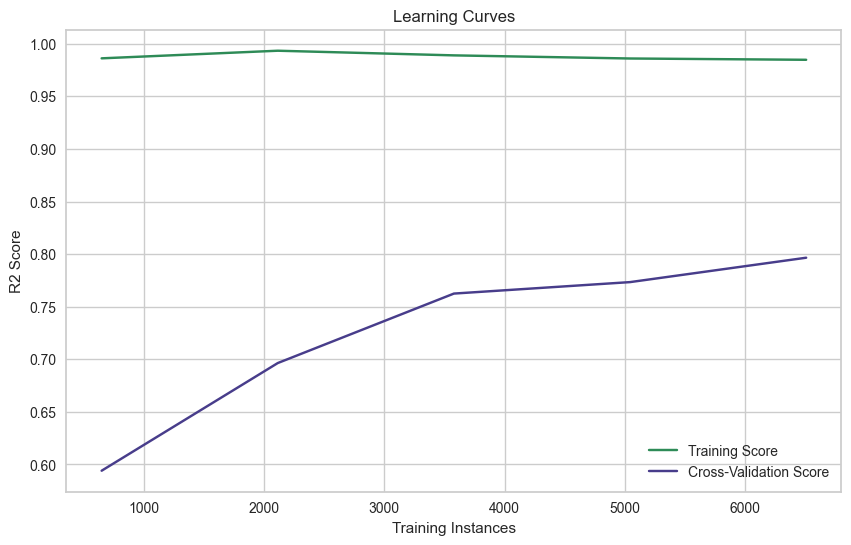

In [41]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(catboost_median, X_train, y_train, cv=5)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, np.mean(train_scores, axis=1), label='Training Score', c='#2E8B57')
plt.plot(train_sizes, np.mean(test_scores, axis=1), label='Cross-Validation Score', c='#483D8B')
plt.xlabel('Training Instances')
plt.ylabel('R2 Score')
plt.title('Learning Curves')
plt.legend()
plt.show()

In [ ]:
# Defining the CatBoostRegressor model
catboost_median_tuned = CatBoostRegressor(cat_features = [0,1,2,4,5,8])

# Defining the parameter grid for GridSearchCV
param_grid = {
    'learning_rate': [0.01, 0.05, 0.1],
    'depth': [4, 6, 8, 10, None],  # Including None for unlimited depth
    'l2_leaf_reg': [1, 3, 5, 7, 9],
    'iterations': [100, 200, 300, 400]
}

# Creating a GridSearchCV object
gscv = GridSearchCV(catboost_median_tuned, param_grid, n_jobs=-1, scoring='r2', cv=5)

# Fitting the GridSearchCV object to the training data
gscv.fit(X_train, y_train)

# Getting the best estimator from GridSearchCV
best_catboost_median_model = gscv.best_estimator_

# Calculating cross-validated R² score
cv_r2_scores = cross_val_score(best_catboost_median_model, X_train, y_train, cv=5, scoring='r2')

# Calculating cross-validated MAE, MSE, and RMSE
cv_mae_scores = -cross_val_score(best_catboost_median_model, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')
cv_mse_scores = -cross_val_score(best_catboost_median_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_scores = np.sqrt(cv_mse_scores)

# Displaying the best parameters, R² score, MAE, MSE, and RMSE
print("\nBest Parameters:", gscv.best_params_)

# Displaying the cross-validated scores
print("\nCross-Validated R² Scores:", cv_r2_scores)
print("Mean Cross-Validated R² Score:", np.mean(cv_r2_scores))
print('Cross-Validated Mean Absolute Error (MAE): ', np.mean(cv_mae_scores))
print('Cross-Validated Mean Squared Error (MSE): ', np.mean(cv_mse_scores))
print('Cross-Validated Root Mean Squared Error (RMSE): ', np.mean(cv_rmse_scores))

#  <span style="color:SeaGreen"> KNN Imputed Dataset:</span><span style="color:DarkSlateBlue"> One-Hot Label Encoded </span>

#### <span style="color:Teal">Loading in Data</span>

In [33]:
dummies_knn_df_train = pd.read_csv('dummies_knn_df_train.csv')
dummies_knn_df_test = pd.read_csv('dummies_knn_df_test.csv')

#### <span style="color:Teal">Confirming Load</span>

In [34]:
print(dummies_knn_df_train.shape, dummies_knn_df_test.shape)

(8147, 371) (2037, 371)


### <span style="color:YellowGreen">Selecting the Best Base Model for Optimising</span>

#### <span style="color:Teal">Model Comparison Setup</span>

In [35]:
regression8 = setup(dummies_knn_df_train, target = 'market_value_in_eur', session_id = 8)

,Description,Value
0,Session id,8
1,Target,market_value_in_eur
2,Target type,Regression
3,Original data shape,"(8147, 371)"
4,Transformed data shape,"(8147, 371)"
5,Transformed train set shape,"(5702, 371)"
6,Transformed test set shape,"(2445, 371)"
7,Numeric features,370
8,Preprocess,True
9,Imputation type,simple


#### <span style="color:Teal">Comparing Baseline Models</span>

In [36]:
best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,1788835.7435,19125454527180.7852,4349889.7465,0.7632,1.0357,1.5027,2.2000
et,Extra Trees Regressor,1833414.4136,22780099936902.7031,4738330.0330,0.7207,0.8908,1.2326,4.3410
gbr,Gradient Boosting Regressor,2019896.3317,22575038301470.6875,4734585.8179,0.7168,1.1130,1.9722,0.7560
lightgbm,Light Gradient Boosting Machine,1939611.0766,23487988540748.3750,4829315.9686,0.7058,1.0138,1.4854,0.2040
rf,Random Forest Regressor,1953027.6676,24505220235657.2422,4922487.2286,0.6985,0.9248,1.3498,3.7490
xgboost,Extreme Gradient Boosting,1985435.3500,25177751342284.8008,5002664.1000,0.6846,1.0195,1.4624,0.2410
br,Bayesian Ridge,3303265.6934,33499688080554.8047,5750722.2271,0.5886,1.6988,6.5952,0.1580
ridge,Ridge Regression,3343583.6055,33485068492326.3945,5754418.9653,0.5862,1.7194,6.9040,0.0610
lasso,Lasso Regression,3360593.4984,33635265418750.1641,5768579.6903,0.5836,1.7189,6.9940,0.7390
lr,Linear Regression,3361959.9184,33640494707318.6562,5769099.1269,0.5835,1.7235,6.9969,0.0990


In [37]:
compare_additional_models = compare_models(include = [ 'svm', 'catboost', 'kr', 'ard', 'mlp'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,1788835.7435,19125454527180.7852,4349889.7465,0.7632,1.0357,1.5027,2.2660
kr,Kernel Ridge,3343312.3256,33480635733646.6250,5754064.3161,0.5862,1.7164,6.9039,0.5950
ard,Automatic Relevance Determination,3655888.8243,47167343285273.3281,6811161.9104,0.4278,1.6734,5.9396,18.6010
mlp,MLP Regressor,3744719.5827,54719384453660.4609,7320500.7279,0.3443,1.6545,5.0494,12.3400
svm,Support Vector Regression,3483037.8937,93368599741326.9844,9563150.8657,-0.1182,1.6755,1.9949,2.8010


#  <span style="color:SeaGreen"> KNN Imputed Dataset:</span><span style="color:DarkSlateBlue"> One-Hot Label Encoded and MinMax Scaled</span>

#### <span style="color:Teal">Loading in Data</span>

In [38]:
minmax_dummies_knn_df_train = pd.read_csv('minmax_dummies_knn_df_train.csv')
minmax_dummies_knn_df_test = pd.read_csv('minmax_dummies_knn_df_test.csv')

#### <span style="color:Teal">Confirming Load</span>

In [39]:
print(minmax_dummies_knn_df_train.shape, minmax_dummies_knn_df_test.shape)

(8147, 371) (2037, 371)


### <span style="color:YellowGreen">Selecting the Best Base Model for Optimising</span>

#### <span style="color:Teal">Model Comparison Setup</span>

In [40]:
regression9 = setup(minmax_dummies_knn_df_train, target = 'market_value_in_eur', session_id = 9)

,Description,Value
0,Session id,9
1,Target,market_value_in_eur
2,Target type,Regression
3,Original data shape,"(8147, 371)"
4,Transformed data shape,"(8147, 371)"
5,Transformed train set shape,"(5702, 371)"
6,Transformed test set shape,"(2445, 371)"
7,Numeric features,370
8,Preprocess,True
9,Imputation type,simple


#### <span style="color:Teal">Comparing Baseline Models</span>

In [41]:
best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,0.0099,0.0006,0.0246,0.7690,0.0206,1.6802,2.1420
et,Extra Trees Regressor,0.0102,0.0007,0.0268,0.7245,0.0225,1.3599,4.3980
gbr,Gradient Boosting Regressor,0.0114,0.0008,0.0275,0.7100,0.0233,2.2642,0.7740
lightgbm,Light Gradient Boosting Machine,0.0110,0.0008,0.0284,0.6897,0.0238,1.7926,0.1600
rf,Random Forest Regressor,0.0111,0.0008,0.0287,0.6840,0.0241,1.4636,3.7210
xgboost,Extreme Gradient Boosting,0.0112,0.0009,0.0292,0.6744,0.0244,1.6423,0.2240
br,Bayesian Ridge,0.0184,0.0011,0.0333,0.5775,0.0281,7.5536,0.0650
ridge,Ridge Regression,0.0188,0.0011,0.0335,0.5719,0.0283,7.8665,0.0440
knn,K Neighbors Regressor,0.0132,0.0012,0.0344,0.5463,0.0293,2.1945,0.0750
lr,Linear Regression,0.0201,0.0012,0.0349,0.5298,0.0297,8.6529,0.0700


In [42]:
compare_additional_models = compare_models(include = [ 'svm', 'catboost', 'kr', 'ard', 'mlp'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,0.0099,0.0006,0.0246,0.7690,0.0206,1.6802,2.3690
kr,Kernel Ridge,0.0188,0.0011,0.0335,0.5719,0.0283,7.8663,0.3480
ard,Automatic Relevance Determination,0.0188,0.0012,0.0342,0.5518,0.0291,7.1872,0.0740
mlp,MLP Regressor,0.0248,0.0013,0.0357,0.5103,0.0307,12.5197,0.2720
svm,Support Vector Regression,0.0476,0.0030,0.0550,-0.1620,0.0513,32.5176,0.1480


In [ ]:
exp9 = RegressionExperiment()
exp9.setup(minmax_dummies_knn_df_train)

#  <span style="color:SeaGreen"> KNN Imputed Dataset:</span><span style="color:DarkSlateBlue"> One-Hot Label Encoded and Robust Scaled</span>

#### <span style="color:Teal">Loading in Data</span>

In [43]:
robust_dummies_knn_df_train = pd.read_csv('robust_dummies_knn_df_train.csv')
robust_dummies_knn_df_test = pd.read_csv('robust_dummies_knn_df_test.csv')

#### <span style="color:Teal">Confirming Load</span>

In [44]:
print(robust_dummies_knn_df_train.shape, robust_dummies_knn_df_test.shape)

(8147, 371) (2037, 371)


### <span style="color:YellowGreen">Selecting the Best Base Model for Optimising</span>

#### <span style="color:Teal">Model Comparison Setup</span>

In [45]:
regression10 = setup(robust_dummies_knn_df_train, target = 'market_value_in_eur', session_id = 10)

,Description,Value
0,Session id,10
1,Target,market_value_in_eur
2,Target type,Regression
3,Original data shape,"(8147, 371)"
4,Transformed data shape,"(8147, 371)"
5,Transformed train set shape,"(5702, 371)"
6,Transformed test set shape,"(2445, 371)"
7,Numeric features,370
8,Preprocess,True
9,Imputation type,simple


#### <span style="color:Teal">Comparing Baseline Models</span>

In [46]:
best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,0.6869,3.1894,1.7723,0.7505,0.3082,2.0503,2.1630
et,Extra Trees Regressor,0.6896,3.5700,1.8715,0.7221,0.3101,1.8278,4.5990
gbr,Gradient Boosting Regressor,0.7690,3.8151,1.9441,0.6983,0.3466,2.4774,0.7510
xgboost,Extreme Gradient Boosting,0.7427,3.9436,1.9681,0.6922,0.3301,2.0401,0.2390
lightgbm,Light Gradient Boosting Machine,0.7399,3.9457,1.9734,0.6893,0.3319,1.9626,0.1620
rf,Random Forest Regressor,0.7328,4.0103,1.9875,0.6873,0.3294,2.0249,4.0220
br,Bayesian Ridge,1.2684,5.4536,2.3250,0.5690,0.5532,6.8679,0.1430
ridge,Ridge Regression,1.2901,5.4699,2.3296,0.5666,0.5625,7.0975,0.0590
lr,Linear Regression,1.2994,5.5117,2.3387,0.5632,0.5659,7.1791,0.0660
omp,Orthogonal Matching Pursuit,1.3409,6.3563,2.5092,0.4991,0.5757,7.1490,0.0440


In [47]:
compare_additional_models = compare_models(include = [ 'svm', 'catboost', 'kr', 'ard', 'mlp'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,0.6869,3.1894,1.7723,0.7505,0.3082,2.0503,2.3270
mlp,MLP Regressor,1.0633,3.7684,1.9336,0.6938,0.4541,5.1988,3.0460
kr,Kernel Ridge,1.2903,5.4724,2.3301,0.5665,0.5625,7.0968,0.3440
ard,Automatic Relevance Determination,1.2572,5.5034,2.3365,0.5640,0.5527,6.8190,8.8220
svm,Support Vector Regression,0.9291,8.9100,2.9617,0.3069,0.4103,1.9509,1.8520


#  <span style="color:SeaGreen"> KNN Imputed Dataset:</span><span style="color:YellowGreen"> Categoricals :</span><span style="color:DarkSlateBlue"> No Label Encoding or Scaling </span>

#### <span style="color:Teal">Loading in Data</span>

In [460]:
LightGBM_knn_df = pd.read_csv('LightGBM_knn_df.csv')

In [461]:
LightGBM_knn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10184 entries, 0 to 10183
Data columns (total 64 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   sub_position                          10184 non-null  object 
 1   position                              10184 non-null  object 
 2   foot                                  10184 non-null  object 
 3   height_in_cm                          10184 non-null  float64
 4   market_value_in_eur                   10184 non-null  float64
 5   current_club_domestic_competition_id  10184 non-null  object 
 6   current_club_name                     10184 non-null  object 
 7   age                                   10184 non-null  int64  
 8   remaining_contract_days               10184 non-null  float64
 9   age_group                             10184 non-null  object 
 10  games_total                           10184 non-null  int64  
 11  goals_total    

#### <span style="color:Teal"> Casting object datatypes to categorical</span>

In [462]:
# Casting from object to categorical data type for LightGBM
for feature in LightGBM_knn_df:
    if LightGBM_knn_df[feature].dtypes == 'O':
        LightGBM_knn_df[feature] = pd.Series(LightGBM_knn_df[feature], dtype="category")

In [463]:
LightGBM_knn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10184 entries, 0 to 10183
Data columns (total 64 columns):
 #   Column                                Non-Null Count  Dtype   
---  ------                                --------------  -----   
 0   sub_position                          10184 non-null  category
 1   position                              10184 non-null  category
 2   foot                                  10184 non-null  category
 3   height_in_cm                          10184 non-null  float64 
 4   market_value_in_eur                   10184 non-null  float64 
 5   current_club_domestic_competition_id  10184 non-null  category
 6   current_club_name                     10184 non-null  category
 7   age                                   10184 non-null  int64   
 8   remaining_contract_days               10184 non-null  float64 
 9   age_group                             10184 non-null  category
 10  games_total                           10184 non-null  int64   
 11  go

#### <span style="color:Teal">Train : Test Split</span>

In [464]:
LightGBM_knn_df_train, LightGBM_knn_df_test = train_test_split(LightGBM_knn_df, test_size=0.2, random_state=100)

#### <span style="color:Teal">Confirming Split</span>

In [465]:
print(LightGBM_knn_df_train.shape, LightGBM_knn_df_test.shape)

(8147, 64) (2037, 64)


### <span style="color:YellowGreen">Selecting the Best Base Model for Optimising</span>

#### <span style="color:Teal">Model Comparison Setup</span>

In [45]:
regression11 = setup(LightGBM_knn_df_train, target = 'market_value_in_eur', session_id = 11)

,Description,Value
0,Session id,11
1,Target,market_value_in_eur
2,Target type,Regression
3,Original data shape,"(8147, 64)"
4,Transformed data shape,"(8147, 98)"
5,Transformed train set shape,"(5702, 98)"
6,Transformed test set shape,"(2445, 98)"
7,Numeric features,57
8,Categorical features,6
9,Preprocess,True


#### <span style="color:Teal">Comparing Baseline Models</span>

In [46]:
best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
dummy,Dummy Regressor,4708384.5500,91781080075468.7969,9489741.5500,-0.0026,2.1962,11.8951,0.0690
br,Bayesian Ridge,4843588.9812,96460989032927.5312,9733915.6433,-0.0561,2.1701,11.7526,0.0820
omp,Orthogonal Matching Pursuit,4857271.2485,96802325846229.8594,9752081.9252,-0.0603,2.1780,11.7994,0.0670
en,Elastic Net,4886099.8885,97280967069948.8750,9778031.2891,-0.0664,2.1898,11.8493,0.2430
llar,Lasso Least Angle Regression,4930914.4805,97955915202832.4688,9812232.8279,-0.0740,2.1987,11.9720,0.0610
ridge,Ridge Regression,4938515.5973,98008464173102.4844,9814780.6567,-0.0746,2.2032,12.0327,0.0650
lasso,Lasso Regression,4939234.0060,98018637943947.3438,9815276.6219,-0.0747,2.2026,12.0369,0.2030
huber,Huber Regressor,3495460.4188,100968590815980.3750,9955907.3351,-0.1039,1.6855,2.1863,0.0830
gbr,Gradient Boosting Regressor,4936603.5010,102130234628195.4062,10029413.6195,-0.1252,2.1684,12.0896,0.5820
catboost,CatBoost Regressor,5006217.4607,102391900549002.8750,10039162.0390,-0.1274,2.1854,11.8475,2.2580


In [53]:
compare_additional_models = compare_models(include = [ 'svm', 'catboost', 'kr', 'ard', 'tr', 'mlp'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
mlp,MLP Regressor,4907538.2518,93255835457755.7188,9568713.5959,-0.0200,2.2314,12.7165,0.2750
tr,TheilSen Regressor,4741735.8845,96309512201272.9219,9726491.7582,-0.0546,2.1573,11.1151,3.7880
ard,Automatic Relevance Determination,4845063.8752,96517009466783.6875,9737151.9818,-0.0569,2.1690,11.7564,0.3820
kr,Kernel Ridge,3672096.4224,75120281754482.9375,7176845.3901,-0.0841,1.5851,9.1799,18.4850
svm,Support Vector Regression,3483400.4463,101157873293812.3594,9964826.2248,-0.1058,1.6696,2.0690,0.9580
catboost,CatBoost Regressor,5006217.4607,102391900549002.8750,10039162.0390,-0.1274,2.1854,11.8475,2.0670


## <span style="color:YellowGreen">Manually Developing a LightGBM Model</span>

In [466]:
y_train = LightGBM_knn_df_train['market_value_in_eur']
X_train = LightGBM_knn_df_train.drop(['market_value_in_eur'], axis = 1)
y_test = LightGBM_knn_df_test['market_value_in_eur']
X_test = LightGBM_knn_df_test.drop(['market_value_in_eur'], axis = 1)

In [467]:
# Show the rows and columns
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((8147, 63), (2037, 63), (8147,), (2037,))

#### <span style="color:Teal">Setting Up Model</span>

In [468]:
lgbmB = lightgbm.LGBMRegressor(categorical_feature=[0,1,2,4,5,8], n_jobs=-1)

lgbmB.fit(X_train, y_train)

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002026 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4637
[LightGBM] [Info] Number of data points in the train set: 8147, number of used features: 63
[LightGBM] [Info] Start training from score 3834855.406898


LGBMRegressor(categorical_feature=[0, 1, 2, 4, 5, 8], n_jobs=-1)

#### <span style="color:Teal">Models Results</span>

In [51]:
# Calculate the mean values and Standard deviation
get_cv_scores(lgbmB)

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002004 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4599
[LightGBM] [Info] Number of data points in the train set: 7332, number of used features: 63
[LightGBM] [Info] Start training from score 3776708.333333
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_fe

Having not scaled the data, a Mean Absolute Error of 805213.8038725264 mean our models evaluations of players is around 805214 euro off. This is a alot amount of money, but considering some players are valued as high as 180000000, evaluating that player at 179194786 or 180805214 for example, seem relatively close.

Also, comparing the results to our original Linear Regression Baseline model which produced a MAE of 3825828.087382881, indicates an improvement of almost 80% percent. 

In [52]:
baseline_mae = 3825828.087382881
knn_lightgbm__mae = 805213.8038725264

percentage_improvement = ((baseline_mae - knn_lightgbm__mae) / baseline_mae) * 100

print("Percentage Improvement in MAE:", percentage_improvement, "%")

Percentage Improvement in MAE: 78.95321521298814 %


In [53]:
# Comparing training to testing results
print(f'R² training set score: {lgbmB.score(X_train, y_train)}')
print(f'R² testing set score: {lgbmB.score(X_test, y_test)}')

R² training set score: 0.9716505281088265
R² testing set score: 0.8308729924246075


The training and testing scores above clearly indicate an overfitting model. We will investigate the results with the aid of graphics before we try to optimise a model.

#### <span style="color:Teal">Evaluating Model Results with Visualisations</span>

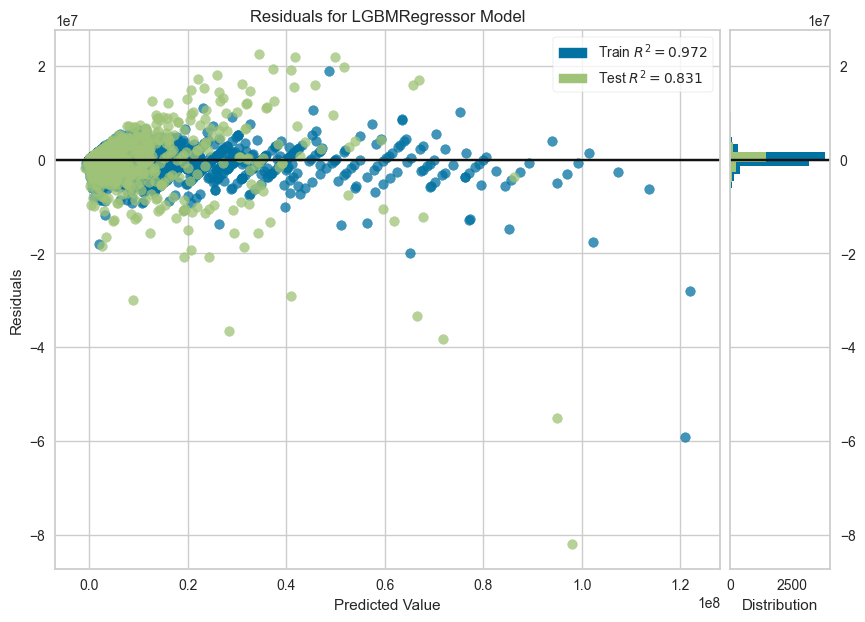

In [54]:
fig = plt.figure(figsize=(10,7))
resid_plot = ResidualsPlot(lgbmB)
resid_plot.fit(X_train, y_train)  # Fit the training data to the visualizer
resid_plot.score(X_test, y_test)  # Evaluate the model on the test data
resid_plot.show();                 # Finalize and render the figure

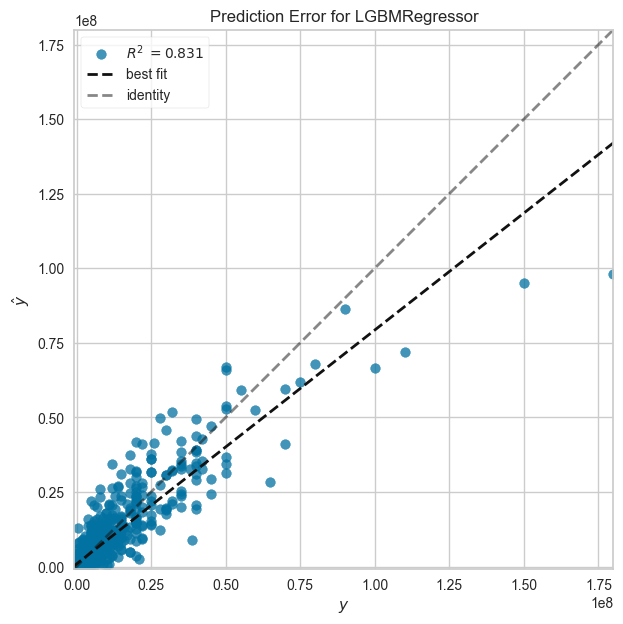

In [55]:
fig = plt.figure(figsize=(10,7))
pred_error = PredictionError(lgbmB)
pred_error.fit(X_train, y_train)  # Fit the training data to the visualizer
pred_error.score(X_test, y_test)  # Evaluate the model on the test data
pred_error.show()   ;              # Finalize and render the figure


# There are more datapoints under the diagonal, that means the model tends to underestimate the higher maarket values.

[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2522
[LightGBM] [Info] Number of data points in the train set: 651, number of used features: 61
[LightGBM] [Info] Start training from score 4046141.321045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posi

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4294
[LightGBM] [Info] Number of data points in the train set: 3584, number of used features: 63
[LightGBM] [Info] Start training from score 3934166.852679
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_fe

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002104 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4517
[LightGBM] [Info] Number of data points in the train set: 5050, number of used features: 63
[LightGBM] [Info] Start training from score 3849668.811881
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4497
[LightGBM] [Info] Number of data points in the train set: 5050, number of used features: 63
[LightGBM] [Info] Start training from score 3792884.653465
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_fe

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4444
[LightGBM] [Info] Number of data points in the train set: 5050, number of used features: 63
[LightGBM] [Info] Start training from score 3944786.633663
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_fe

[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4316
[LightGBM] [Info] Number of data points in the train set: 3584, number of used features: 63
[LightGBM] [Info] Start training from score 3900797.991071
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001484 seconds.
You ca

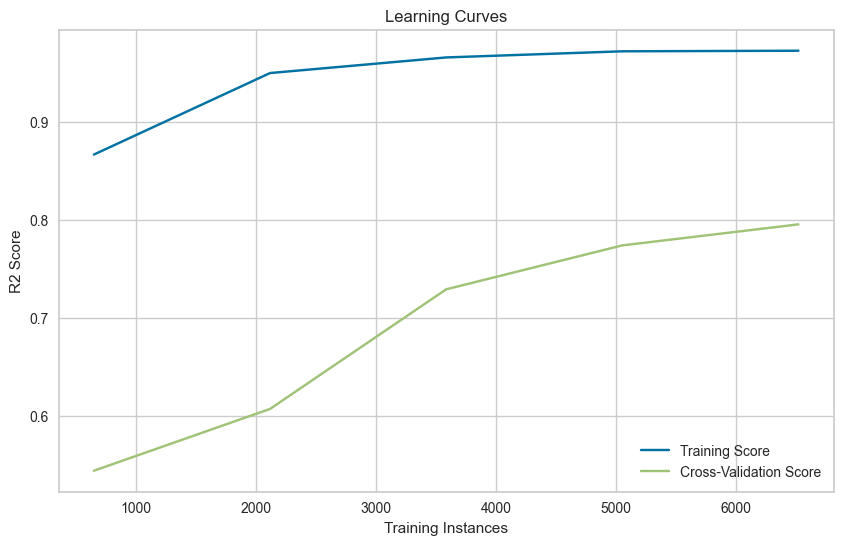

In [56]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(lgbmB, X_train, y_train, cv=5)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, np.mean(train_scores, axis=1), label='Training Score')
plt.plot(train_sizes, np.mean(test_scores, axis=1), label='Cross-Validation Score')
plt.xlabel('Training Instances')
plt.ylabel('R2 Score')
plt.title('Learning Curves')
plt.legend()
plt.show()

#### <span style="color:Teal">Hyperparameter Tuning with GridSearchCV</span>

In [469]:
# Define the parameter grid for GridSearchCV
params = {
    'n_estimators': [50, 100, 150, 200], 
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.5], 
    'num_leaves': [10, 50, 100, 200],
    'max_depth': [-1]
}

# Create a GridSearchCV object
gscv = GridSearchCV(lgbmB, params, n_jobs=-1, scoring='r2', cv=5)

# Fit the GridSearchCV object to the training data
gscv.fit(X_train, y_train)

# Get the best estimator from GridSearchCV
best_lgbmB = gscv.best_estimator_

# Calculate cross-validated R² score
cv_r2_scores = cross_val_score(best_lgbmB, X_train, y_train, cv=5, scoring='r2')

# Calculate cross-validated MAE, MSE, and RMSE
cv_mae_scores = -cross_val_score(best_lgbmB, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')
cv_mse_scores = -cross_val_score(best_lgbmB, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
cv_rmse_scores = np.sqrt(cv_mse_scores)

# Calculate additional metrics for the best model
y_pred_train = best_lgbmB.predict(X_train)
mae_train = mean_absolute_error(y_train, y_pred_train)
mse_train = mean_squared_error(y_train, y_pred_train)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(y_train, y_pred_train)

# Display the best parameters, R² score, MAE, MSE, and RMSE
print("Best Parameters:", gscv.best_params_)
print("\nBest R² Score:", gscv.best_score_)
print('Train Mean Absolute Error (MAE): ', mae_train)
print('Train Mean Squared Error (MSE): ', mse_train)
print('Train Root Mean Squared Error (RMSE): ', rmse_train)
print('Train R-squared (R²): ', r2_train)

# Display the cross-validated scores
print("Cross-Validated R² Scores:", cv_r2_scores)
print("Mean Cross-Validated R² Score:", np.mean(cv_r2_scores))
print('Cross-Validated Mean Absolute Error (MAE): ', np.mean(cv_mae_scores))
print('Cross-Validated Mean Squared Error (MSE): ', np.mean(cv_mse_scores))
print('Cross-Validated Root Mean Squared Error (RMSE): ', np.mean(cv_rmse_scores))

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4637
[LightGBM] [Info] Number of data points in the train set: 8147, number of used features: 63
[LightGBM] [Info] Start training from score 3834855.406898
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_fe

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000976 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4575
[LightGBM] [Info] Number of data points in the train set: 6517, number of used features: 63
[LightGBM] [Info] Start training from score 3819256.713212
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a

In [470]:
# Comparing training to testing results
print(f'R² training set score: {best_lgbmB.score(X_train, y_train)}')
print(f'R² testing set score: {best_lgbmB.score(X_test, y_test)}')

R² training set score: 0.9644065887584445
R² testing set score: 0.8465109715951942


#### <span style="color:Teal">Evaluating Model Results with Visualisations</span>

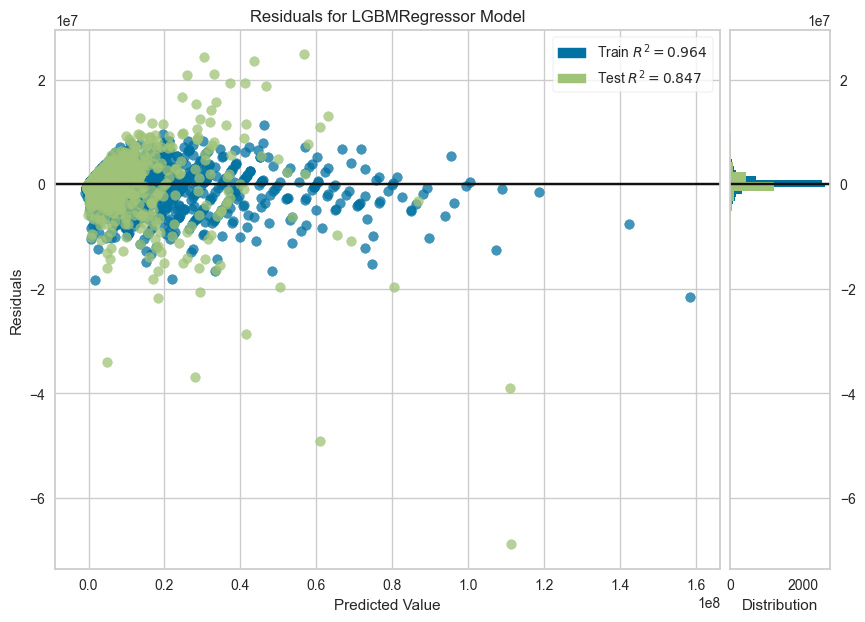

In [58]:
fig = plt.figure(figsize=(10,7))
resid_plot = ResidualsPlot(best_lgbmB)
resid_plot.fit(X_train, y_train)  # Fit the training data to the visualizer
resid_plot.score(X_test, y_test)  # Evaluate the model on the test data
resid_plot.show(); 

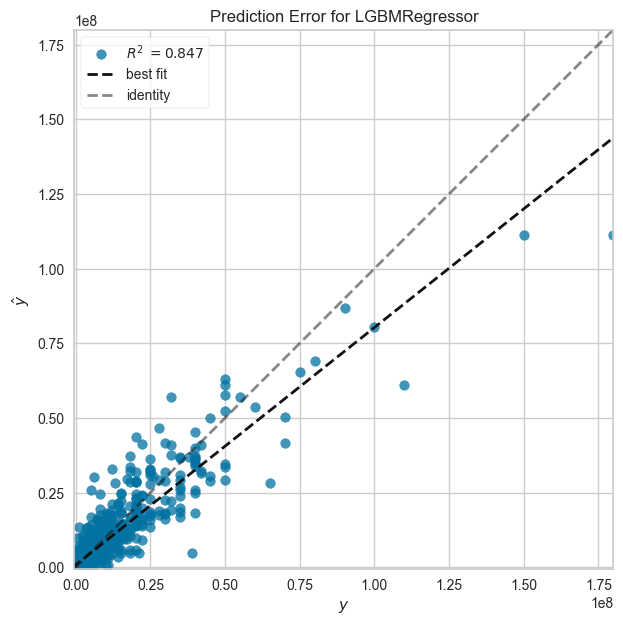

In [59]:
fig = plt.figure(figsize=(10,7))
pred_error = PredictionError(best_lgbmB)
pred_error.fit(X_train, y_train)  # Fit the training data to the visualizer
pred_error.score(X_test, y_test)  # Evaluate the model on the test data
pred_error.show()   ;              # Finalize and render the figure

# The fit diagonal (actuals VS predictions) is almost on top of the pure diagonal, that means 
# a very  good fit.
# There are more datapoints under the diagonal, that means the model tends to underestimate 
# in general.

In [57]:
y_preds_test = best_lgbmB.predict(X_test)

In [58]:
X_test_with_y = X_test.copy()
X_test_with_y['y_preds'] = y_preds_test
X_test_with_y['y_true'] = y_test
X_test_with_y['error'] = X_test_with_y['y_preds'] - X_test_with_y['y_true']
X_test_with_y['abs_error'] = abs(X_test_with_y['error'])
X_test_with_y.reset_index(drop=True, inplace=True)

In [60]:
greatest_errors_df = X_test_with_y[X_test_with_y['abs_error'] >= 10000].sort_values(by='abs_error', ascending=False)
greatest_errors_df

,sub_position,position,foot,height_in_cm,current_club_domestic_competition_id,current_club_name,age,remaining_contract_days,age_group,games_total,goals_total,assists_total,minutes_played_total,goals_for_total,goals_against_total,clean_sheet_total,yellow_cards_total,red_cards_total,games_2019,goals_2019,assists_2019,minutes_played_2019,goals_for_2019,goals_against_2019,clean_sheet_2019,yellow_cards_2019,red_cards_2019,games_2020,goals_2020,assists_2020,minutes_played_2020,goals_for_2020,goals_against_2020,clean_sheet_2020,yellow_cards_2020,red_cards_2020,games_2021,goals_2021,assists_2021,minutes_played_2021,goals_for_2021,goals_against_2021,clean_sheet_2021,yellow_cards_2021,red_cards_2021,games_2022,goals_2022,assists_2022,minutes_played_2022,goals_for_2022,goals_against_2022,clean_sheet_2022,yellow_cards_2022,red_cards_2022,games_2023,goals_2023,assists_2023,minutes_played_2023,goals_for_2023,goals_against_2023,clean_sheet_2023,yellow_cards_2023,red_cards_2023,y_preds,y_true,error,abs_error
1386,Centre-Forward,Attack,left,195.0,GB1,Manchester City,24,1151.0,Ages 22 - 26,160,154,35,12765,392,198,54,15,0,24,24,4,1662,56,35,8,2,0,41,41,12,3540,96,52,15,4,0,32,30,8,2495,78,54,6,3,0,47,48,9,3713,119,38,19,6,0,16,11,2,1355,43,19,6,0,0,1.111821e+08,180000000.0,-6.881791e+07,6.881791e+07
759,Attacking Midfield,Midfield,right,184.0,L1,Bayern Munich,21,786.0,Ages Under 22,133,32,25,6865,383,142,50,6,0,1,0,0,2,3,1,0,0,0,37,7,1,1304,111,45,13,0,0,40,8,6,1983,125,36,15,2,0,47,16,16,3026,123,49,19,2,0,8,1,2,550,21,11,3,2,0,6.094890e+07,110000000.0,-4.905110e+07,4.905110e+07
98,Left Winger,Attack,right,176.0,ES1,Real Madrid,24,-169.7,Ages 22 - 26,152,53,46,11297,325,145,60,29,1,38,5,4,1818,73,34,16,6,0,0,0,0,0,0,0,0,0,0,52,22,20,4275,114,47,21,7,0,51,20,20,4369,105,50,18,16,1,11,6,2,835,33,14,5,0,0,1.111109e+08,150000000.0,-3.888913e+07,3.888913e+07
1518,Attacking Midfield,Midfield,left,180.0,GB1,West Ham United,27,1151.0,Ages 27 - 32,143,26,17,10161,256,187,37,26,0,27,0,1,1200,42,28,10,7,0,30,9,5,2287,68,38,7,5,0,44,11,7,3277,80,58,12,4,0,30,4,3,2333,44,46,6,5,0,12,2,1,1064,22,17,2,5,0,2.815387e+07,65000000.0,-3.684613e+07,3.684613e+07
1339,Central Midfield,Midfield,both,191.0,IT1,Juventus FC,31,786.0,Ages 27 - 32,99,7,23,6176,189,147,25,18,1,21,1,4,1519,41,21,7,2,0,39,5,9,2661,83,66,11,7,0,27,1,9,1783,49,51,3,8,1,10,0,1,161,13,8,3,1,0,2,0,0,52,3,1,1,0,0,4.736702e+06,38800000.0,-3.406330e+07,3.406330e+07
1777,Centre-Forward,Attack,right,192.0,GB1,Newcastle United,25,1517.0,Ages 22 - 26,166,61,10,10261,250,181,62,18,0,45,16,3,2064,79,50,14,4,0,44,17,2,2981,60,50,17,4,0,42,10,3,2773,47,41,21,7,0,24,11,2,1680,39,28,6,3,0,11,7,0,763,25,12,4,0,0,4.143739e+07,70000000.0,-2.856261e+07,2.856261e+07
1858,Centre-Back,Defender,right,190.0,ES1,Real Madrid,31,786.0,Ages 27 - 32,175,9,5,14689,334,167,74,23,0,26,2,0,2238,44,35,7,4,0,34,1,1,2947,50,14,22,1,0,51,4,4,4716,111,51,22,12,0,49,2,0,3458,90,48,17,2,0,15,0,0,1330,39,19,6,4,0,5.683319e+07,32000000.0,2.483319e+07,2.483319e+07
615,Centre-Forward,Attack,right,177.0,SC1,Rangers FC,28,-166.6,Ages 27 - 32,163,72,33,10990,348,144,78,37,1,44,27,7,3052,95,33,21,12,0,40,16,12,2877,97,29,24,9,0,39,18,8,3108,71,29,18,10,0,40,11,6,1953,85,53,15,6,1,0,0,0,0,0,0,0,0,0,3.033703e+07,6000000.0,2.433703e+07,2.433703e+07
997,Central Midfield,Midfield,right,177.0,GB1,Aston Villa,27,1151.0,Ages 27 - 32,178,23,19,13783,312,235,56,18,0,39,3,6,2954,66,41,14,2,0,51,9,6,4438,95,58,19,8,0,44,8,5,3525,78,65,10,4,0,31,3,2,2351,43,57,7,4,0,13,0,0,515,30,14,6,0,0,4.363052e+07,20000000.0,2.363052e+07,2.363052e+07
1445,Right Winger,Attack,right,181.0,ES1,Athletic Bilbao,22,56.0,Ages 22 - 26,91,12,11,5309,114,89,32,7,0,0,0,0,0,0,0,0,0,0,2,0,0,55,3,2,1,0,0,40,3,1,1634,43,37,14,4,0,43,9,6,3204,59,43,14,3,0,6,0,4,416,9,7,3,0,0,1.821042e+07,40000000.0,-2.178958e+07,2.178958e+07


In [61]:
# Define the LGBMRegressor with log-transformed target
lgbmB_log = lightgbm.LGBMRegressor(categorical_feature=[0,1,2,4,5,8], n_jobs=-1)
y_train_log = np.log(y_train+0.0001)

# Define the parameter grid for GridSearchCV
params = {
    'n_estimators': [50, 100, 150, 200], 
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.5], 
    'num_leaves': [10, 50, 100, 200],
    'max_depth': [-1]
}

# Create a GridSearchCV object
gscv_log = GridSearchCV(lgbmB_log, params, n_jobs=-1, scoring='r2', cv=5)

# Fit the GridSearchCV object to the training data
gscv_log.fit(X_train, y_train_log)

# Get the best estimator from GridSearchCV
best_lgbmB_log = gscv_log.best_estimator_

# Calculate cross-validated R² score
cv_r2_scores = cross_val_score(best_lgbmB_log, X_train, y_train_log, cv=5, scoring='r2')

# Calculate cross-validated MAE, MSE, and RMSE
cv_mae_scores = -cross_val_score(best_lgbmB_log, X_train, y_train_log, cv=5, scoring='neg_mean_absolute_error')
cv_mse_scores = -cross_val_score(best_lgbmB_log, X_train, y_train_log, cv=5, scoring='neg_mean_squared_error')
cv_rmse_scores = np.sqrt(cv_mse_scores)

# Inverse-transform the predictions to bring them back to the original scale
y_preds_logged = best_lgbmB_log.predict(X_train)
y_preds_unlogged = np.exp(y_preds_logged) - 0.0001

# Calculate additional metrics for the best model
mae_train = mean_absolute_error(np.exp(y_train_log)-0.0001, y_preds_unlogged)
mse_train = mean_squared_error(np.exp(y_train_log)-0.0001, y_preds_unlogged)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(np.exp(y_train_log)-0.0001, y_preds_unlogged)

# Display the best parameters, R² score, MAE, MSE, and RMSE
print("Best Parameters:", gscv_log.best_params_)
print("\nBest R² Score:", gscv_log.best_score_)
print('Train Mean Absolute Error (MAE): ', mae_train)
print('Train Mean Squared Error (MSE): ', mse_train)
print('Train Root Mean Squared Error (RMSE): ', rmse_train)
print('Train R-squared (R²): ', r2_train)

# Display the cross-validated scores
print("Cross-Validated R² Scores:", cv_r2_scores)
print("Mean Cross-Validated R² Score:", np.mean(cv_r2_scores))
print('Cross-Validated Mean Absolute Error (MAE): ', np.mean(cv_mae_scores))
print('Cross-Validated Mean Squared Error (MSE): ', np.mean(cv_mse_scores))
print('Cross-Validated Root Mean Squared Error (RMSE): ', np.mean(cv_rmse_scores))

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003379 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4637
[LightGBM] [Info] Number of data points in the train set: 8147, number of used features: 63
[LightGBM] [Info] Start training from score 13.720455
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a larg

[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature is set=0,1,2,4,5,8, categorical_column=0,1,2,4,5,8 will be ignored. Current value: categorical_feature=0,1,2,4,5,8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001762 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4581
[LightGBM] [Info] Number of data points in the train set: 6517, number of used features: 63
[LightGBM] [Info] Start training from score 13.719424
[LightGBM] [Warning] Categorical features with more bins than the configured maximum bin number found.
[LightGBM] [Warning] For categorical features, max_bin and max_bin_by_feature may be ignored with a large number of categories.
[LightGBM] [Warning] categorical_feature

In [ ]:
feat_imp = pd.DataFrame({'feature':X_train.columns, 'importance':best_lgbmB.feature_importances_}).sort_values('importance', ascending=False)

plt.figure(figsize=(10,7))
sns.barplot(y=feat_imp['feature'], x=feat_imp['importance'])

## <span style="color:YellowGreen">Manually Developing a catBoost Model</span>

In [43]:
y_train = LightGBM_knn_df_train['market_value_in_eur']
X_train = LightGBM_knn_df_train.drop(['market_value_in_eur'], axis = 1)
y_test = LightGBM_knn_df_test['market_value_in_eur']
X_test = LightGBM_knn_df_test.drop(['market_value_in_eur'], axis = 1)

In [44]:
# Show the rows and columns
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((8147, 63), (2037, 63), (8147,), (2037,))

In [46]:
# Defining model with the best parameters from GridSearchCV
best_catboost_model = CatBoostRegressor(depth=6, 
                                        iterations=400, 
                                        l2_leaf_reg=3, 
                                        learning_rate=0.1, 
                                        cat_features=[0,1,2,4,5,8]
                                       )

# Fitting the model to the training data
best_catboost_model.fit(X_train, y_train)

0:	learn: 9207843.0706293	total: 47.8ms	remaining: 19.1s
1:	learn: 8741933.0282213	total: 97.4ms	remaining: 19.4s
2:	learn: 8329994.5241469	total: 146ms	remaining: 19.3s
3:	learn: 7982858.5715211	total: 198ms	remaining: 19.6s
4:	learn: 7656152.3557251	total: 255ms	remaining: 20.1s
5:	learn: 7389125.7610111	total: 306ms	remaining: 20.1s
6:	learn: 7123402.6561519	total: 357ms	remaining: 20s
7:	learn: 6859302.0210530	total: 415ms	remaining: 20.4s
8:	learn: 6646922.6534747	total: 487ms	remaining: 21.2s
9:	learn: 6445879.2903623	total: 552ms	remaining: 21.5s
10:	learn: 6275633.5794741	total: 601ms	remaining: 21.3s
11:	learn: 6116305.5900938	total: 664ms	remaining: 21.5s
12:	learn: 5943904.4711695	total: 720ms	remaining: 21.4s
13:	learn: 5836134.2852150	total: 786ms	remaining: 21.7s
14:	learn: 5708183.6819922	total: 852ms	remaining: 21.9s
15:	learn: 5602284.0240883	total: 910ms	remaining: 21.8s
16:	learn: 5488691.8277654	total: 963ms	remaining: 21.7s
17:	learn: 5397544.7067608	total: 1.01s	r

145:	learn: 2944951.6698013	total: 7.37s	remaining: 12.8s
146:	learn: 2940889.1467839	total: 7.42s	remaining: 12.8s
147:	learn: 2931878.4547491	total: 7.47s	remaining: 12.7s
148:	learn: 2924656.8122755	total: 7.52s	remaining: 12.7s
149:	learn: 2913412.0719288	total: 7.58s	remaining: 12.6s
150:	learn: 2909493.4377496	total: 7.63s	remaining: 12.6s
151:	learn: 2898899.3406127	total: 7.68s	remaining: 12.5s
152:	learn: 2886891.7297540	total: 7.73s	remaining: 12.5s
153:	learn: 2884449.0387642	total: 7.78s	remaining: 12.4s
154:	learn: 2879366.0891843	total: 7.83s	remaining: 12.4s
155:	learn: 2876397.2221732	total: 7.88s	remaining: 12.3s
156:	learn: 2876139.7510287	total: 7.92s	remaining: 12.3s
157:	learn: 2872786.2281723	total: 7.97s	remaining: 12.2s
158:	learn: 2867645.1491976	total: 8.02s	remaining: 12.2s
159:	learn: 2861587.3538130	total: 8.07s	remaining: 12.1s
160:	learn: 2855896.3058303	total: 8.12s	remaining: 12.1s
161:	learn: 2850268.5772705	total: 8.17s	remaining: 12s
162:	learn: 2841

291:	learn: 2347773.6224555	total: 14.8s	remaining: 5.46s
292:	learn: 2344718.5309043	total: 14.8s	remaining: 5.41s
293:	learn: 2342550.4853522	total: 14.9s	remaining: 5.36s
294:	learn: 2337415.2285383	total: 14.9s	remaining: 5.31s
295:	learn: 2334040.8128283	total: 15s	remaining: 5.25s
296:	learn: 2330396.9368745	total: 15s	remaining: 5.2s
297:	learn: 2328042.8961182	total: 15.1s	remaining: 5.15s
298:	learn: 2323962.8326231	total: 15.1s	remaining: 5.1s
299:	learn: 2321752.3663513	total: 15.2s	remaining: 5.05s
300:	learn: 2318579.3322992	total: 15.2s	remaining: 5s
301:	learn: 2314097.0722083	total: 15.3s	remaining: 4.95s
302:	learn: 2309758.7317352	total: 15.3s	remaining: 4.9s
303:	learn: 2307037.7983353	total: 15.4s	remaining: 4.85s
304:	learn: 2305711.0933114	total: 15.4s	remaining: 4.8s
305:	learn: 2305361.5011202	total: 15.5s	remaining: 4.75s
306:	learn: 2300844.0188748	total: 15.5s	remaining: 4.7s
307:	learn: 2297324.0333721	total: 15.6s	remaining: 4.65s
308:	learn: 2293852.977697

In [47]:
# Calculate the mean values and Standard deviation
get_cv_scores(best_catboost_model)

0:	learn: 9077891.2973511	total: 42.5ms	remaining: 16.9s
1:	learn: 8665419.1680412	total: 93.2ms	remaining: 18.5s
2:	learn: 8289878.1591756	total: 142ms	remaining: 18.8s
3:	learn: 7923101.2825354	total: 190ms	remaining: 18.8s
4:	learn: 7637728.2527248	total: 257ms	remaining: 20.3s
5:	learn: 7354018.3667298	total: 316ms	remaining: 20.8s
6:	learn: 7077358.9771253	total: 367ms	remaining: 20.6s
7:	learn: 6809199.5357586	total: 415ms	remaining: 20.3s
8:	learn: 6615014.1670436	total: 463ms	remaining: 20.1s
9:	learn: 6403796.4779211	total: 513ms	remaining: 20s
10:	learn: 6226420.7989511	total: 576ms	remaining: 20.4s
11:	learn: 6078962.0940213	total: 622ms	remaining: 20.1s
12:	learn: 5920984.7870186	total: 670ms	remaining: 20s
13:	learn: 5768568.7817627	total: 720ms	remaining: 19.9s
14:	learn: 5637877.7879780	total: 772ms	remaining: 19.8s
15:	learn: 5536304.7017208	total: 819ms	remaining: 19.7s
16:	learn: 5412526.5390757	total: 883ms	remaining: 19.9s
17:	learn: 5285324.1512950	total: 930ms	rem

146:	learn: 2887714.7107316	total: 7.6s	remaining: 13.1s
147:	learn: 2885360.1527683	total: 7.65s	remaining: 13s
148:	learn: 2879375.6572024	total: 7.7s	remaining: 13s
149:	learn: 2870703.4701488	total: 7.75s	remaining: 12.9s
150:	learn: 2862597.0098153	total: 7.8s	remaining: 12.9s
151:	learn: 2855254.2815406	total: 7.85s	remaining: 12.8s
152:	learn: 2849368.5764174	total: 7.9s	remaining: 12.7s
153:	learn: 2848545.7017234	total: 7.94s	remaining: 12.7s
154:	learn: 2844951.2211658	total: 7.99s	remaining: 12.6s
155:	learn: 2839759.5877180	total: 8.04s	remaining: 12.6s
156:	learn: 2826881.2852386	total: 8.09s	remaining: 12.5s
157:	learn: 2821599.5572571	total: 8.14s	remaining: 12.5s
158:	learn: 2815677.0407677	total: 8.19s	remaining: 12.4s
159:	learn: 2805665.7557528	total: 8.24s	remaining: 12.4s
160:	learn: 2800253.8371393	total: 8.29s	remaining: 12.3s
161:	learn: 2799342.1416776	total: 8.34s	remaining: 12.2s
162:	learn: 2794247.0098390	total: 8.39s	remaining: 12.2s
163:	learn: 2788974.28

290:	learn: 2228890.2167299	total: 14.7s	remaining: 5.49s
291:	learn: 2227724.5550985	total: 14.7s	remaining: 5.44s
292:	learn: 2225848.2063995	total: 14.8s	remaining: 5.39s
293:	learn: 2223733.6221005	total: 14.8s	remaining: 5.34s
294:	learn: 2218931.0904314	total: 14.9s	remaining: 5.29s
295:	learn: 2217163.7001869	total: 14.9s	remaining: 5.24s
296:	learn: 2211199.8298113	total: 15s	remaining: 5.19s
297:	learn: 2209146.2996137	total: 15s	remaining: 5.14s
298:	learn: 2202862.1585889	total: 15.1s	remaining: 5.08s
299:	learn: 2197883.7448975	total: 15.1s	remaining: 5.03s
300:	learn: 2190487.7238946	total: 15.2s	remaining: 4.98s
301:	learn: 2187371.6206456	total: 15.2s	remaining: 4.93s
302:	learn: 2184870.9310788	total: 15.2s	remaining: 4.88s
303:	learn: 2182476.1545922	total: 15.3s	remaining: 4.83s
304:	learn: 2178776.3982095	total: 15.3s	remaining: 4.78s
305:	learn: 2176622.8219620	total: 15.4s	remaining: 4.73s
306:	learn: 2172688.1966258	total: 15.4s	remaining: 4.68s
307:	learn: 217249

33:	learn: 4429587.0786279	total: 1.77s	remaining: 19s
34:	learn: 4394498.4750487	total: 1.82s	remaining: 19s
35:	learn: 4366473.6097378	total: 1.87s	remaining: 18.9s
36:	learn: 4335788.2911727	total: 1.92s	remaining: 18.8s
37:	learn: 4305964.6976633	total: 1.96s	remaining: 18.7s
38:	learn: 4297709.0915985	total: 2.01s	remaining: 18.6s
39:	learn: 4285651.9355706	total: 2.06s	remaining: 18.6s
40:	learn: 4271860.8279555	total: 2.11s	remaining: 18.5s
41:	learn: 4261649.4743664	total: 2.16s	remaining: 18.4s
42:	learn: 4231121.4662311	total: 2.21s	remaining: 18.4s
43:	learn: 4175621.5802139	total: 2.26s	remaining: 18.3s
44:	learn: 4164140.1713862	total: 2.32s	remaining: 18.3s
45:	learn: 4137322.7387404	total: 2.37s	remaining: 18.2s
46:	learn: 4115200.6203013	total: 2.42s	remaining: 18.2s
47:	learn: 4101286.1437226	total: 2.47s	remaining: 18.1s
48:	learn: 4068380.2711682	total: 2.52s	remaining: 18s
49:	learn: 4040136.0267877	total: 2.56s	remaining: 17.9s
50:	learn: 4011503.4970589	total: 2.6

177:	learn: 2745085.3080175	total: 8.91s	remaining: 11.1s
178:	learn: 2739853.2370293	total: 8.96s	remaining: 11.1s
179:	learn: 2726653.4847934	total: 9.01s	remaining: 11s
180:	learn: 2723633.0586453	total: 9.05s	remaining: 11s
181:	learn: 2714692.2381400	total: 9.1s	remaining: 10.9s
182:	learn: 2713506.4927876	total: 9.15s	remaining: 10.8s
183:	learn: 2711715.2755670	total: 9.21s	remaining: 10.8s
184:	learn: 2709233.3024773	total: 9.26s	remaining: 10.8s
185:	learn: 2708619.0215848	total: 9.31s	remaining: 10.7s
186:	learn: 2700338.0342411	total: 9.36s	remaining: 10.7s
187:	learn: 2697155.0612956	total: 9.41s	remaining: 10.6s
188:	learn: 2690808.6402726	total: 9.46s	remaining: 10.6s
189:	learn: 2690187.3614709	total: 9.51s	remaining: 10.5s
190:	learn: 2685947.2500558	total: 9.56s	remaining: 10.5s
191:	learn: 2679806.7800076	total: 9.61s	remaining: 10.4s
192:	learn: 2674643.6252138	total: 9.66s	remaining: 10.4s
193:	learn: 2665702.5423402	total: 9.71s	remaining: 10.3s
194:	learn: 2659007

324:	learn: 2185547.4256362	total: 16.4s	remaining: 3.79s
325:	learn: 2184208.1949272	total: 16.5s	remaining: 3.74s
326:	learn: 2180061.2505777	total: 16.5s	remaining: 3.69s
327:	learn: 2178501.2636489	total: 16.6s	remaining: 3.63s
328:	learn: 2174149.5366259	total: 16.6s	remaining: 3.58s
329:	learn: 2171758.4364306	total: 16.7s	remaining: 3.53s
330:	learn: 2167708.2275922	total: 16.7s	remaining: 3.48s
331:	learn: 2164963.6067674	total: 16.8s	remaining: 3.43s
332:	learn: 2161889.5578244	total: 16.8s	remaining: 3.38s
333:	learn: 2158929.8092509	total: 16.9s	remaining: 3.33s
334:	learn: 2156547.5471389	total: 16.9s	remaining: 3.28s
335:	learn: 2154313.9328573	total: 17s	remaining: 3.23s
336:	learn: 2149809.5971036	total: 17s	remaining: 3.18s
337:	learn: 2149261.1903219	total: 17.1s	remaining: 3.13s
338:	learn: 2148129.3151739	total: 17.1s	remaining: 3.08s
339:	learn: 2145390.6513295	total: 17.1s	remaining: 3.03s
340:	learn: 2138804.5319732	total: 17.2s	remaining: 2.98s
341:	learn: 213648

69:	learn: 3819600.1641403	total: 3.44s	remaining: 16.2s
70:	learn: 3799098.5866343	total: 3.49s	remaining: 16.2s
71:	learn: 3782986.4036100	total: 3.54s	remaining: 16.1s
72:	learn: 3764834.7751439	total: 3.59s	remaining: 16.1s
73:	learn: 3742263.9148905	total: 3.64s	remaining: 16s
74:	learn: 3734906.5862872	total: 3.69s	remaining: 16s
75:	learn: 3721010.8464981	total: 3.74s	remaining: 15.9s
76:	learn: 3717158.4754444	total: 3.79s	remaining: 15.9s
77:	learn: 3701236.5480426	total: 3.83s	remaining: 15.8s
78:	learn: 3677385.2006255	total: 3.88s	remaining: 15.8s
79:	learn: 3664604.1762767	total: 3.93s	remaining: 15.7s
80:	learn: 3654598.5975638	total: 3.98s	remaining: 15.7s
81:	learn: 3646764.8911927	total: 4.03s	remaining: 15.6s
82:	learn: 3627397.1266920	total: 4.07s	remaining: 15.6s
83:	learn: 3614285.0156049	total: 4.12s	remaining: 15.5s
84:	learn: 3605992.1785130	total: 4.17s	remaining: 15.5s
85:	learn: 3594602.6308489	total: 4.22s	remaining: 15.4s
86:	learn: 3584276.1663915	total: 4

216:	learn: 2615429.2884734	total: 10.7s	remaining: 9.01s
217:	learn: 2609280.7903178	total: 10.7s	remaining: 8.96s
218:	learn: 2602143.0051171	total: 10.8s	remaining: 8.91s
219:	learn: 2598618.5822709	total: 10.8s	remaining: 8.87s
220:	learn: 2590948.9519186	total: 10.9s	remaining: 8.82s
221:	learn: 2575866.3743945	total: 10.9s	remaining: 8.77s
222:	learn: 2571822.4783448	total: 11s	remaining: 8.72s
223:	learn: 2565998.6129185	total: 11s	remaining: 8.67s
224:	learn: 2564760.2979872	total: 11.1s	remaining: 8.62s
225:	learn: 2564191.6646189	total: 11.1s	remaining: 8.57s
226:	learn: 2559738.0002626	total: 11.2s	remaining: 8.52s
227:	learn: 2555503.9259411	total: 11.2s	remaining: 8.47s
228:	learn: 2551284.4056884	total: 11.3s	remaining: 8.42s
229:	learn: 2546852.8637946	total: 11.3s	remaining: 8.37s
230:	learn: 2545081.4160273	total: 11.4s	remaining: 8.32s
231:	learn: 2540160.0031303	total: 11.4s	remaining: 8.27s
232:	learn: 2534294.1706052	total: 11.5s	remaining: 8.22s
233:	learn: 252491

362:	learn: 2108673.1585756	total: 17.9s	remaining: 1.82s
363:	learn: 2104691.2426668	total: 18s	remaining: 1.78s
364:	learn: 2100524.6764277	total: 18s	remaining: 1.73s
365:	learn: 2096472.3657751	total: 18.1s	remaining: 1.68s
366:	learn: 2095670.4392950	total: 18.1s	remaining: 1.63s
367:	learn: 2093542.9628683	total: 18.2s	remaining: 1.58s
368:	learn: 2088728.6838783	total: 18.2s	remaining: 1.53s
369:	learn: 2087648.3253876	total: 18.3s	remaining: 1.48s
370:	learn: 2085097.5963603	total: 18.3s	remaining: 1.43s
371:	learn: 2083353.2949441	total: 18.4s	remaining: 1.38s
372:	learn: 2079226.2875468	total: 18.4s	remaining: 1.33s
373:	learn: 2076395.7183335	total: 18.5s	remaining: 1.28s
374:	learn: 2072713.1435278	total: 18.5s	remaining: 1.23s
375:	learn: 2070562.4383551	total: 18.6s	remaining: 1.18s
376:	learn: 2067959.3324576	total: 18.6s	remaining: 1.14s
377:	learn: 2065431.3996096	total: 18.7s	remaining: 1.09s
378:	learn: 2061777.6574395	total: 18.7s	remaining: 1.04s
379:	learn: 206072

109:	learn: 3275589.6193342	total: 5.47s	remaining: 14.4s
110:	learn: 3265942.3784454	total: 5.52s	remaining: 14.4s
111:	learn: 3253545.3948801	total: 5.57s	remaining: 14.3s
112:	learn: 3235655.7383747	total: 5.61s	remaining: 14.3s
113:	learn: 3220368.2670701	total: 5.66s	remaining: 14.2s
114:	learn: 3213741.2705017	total: 5.71s	remaining: 14.2s
115:	learn: 3209747.7126726	total: 5.76s	remaining: 14.1s
116:	learn: 3202433.4758919	total: 5.81s	remaining: 14.1s
117:	learn: 3198526.1352488	total: 5.86s	remaining: 14s
118:	learn: 3189885.0555865	total: 5.91s	remaining: 14s
119:	learn: 3173058.1596421	total: 5.96s	remaining: 13.9s
120:	learn: 3160368.9889848	total: 6.01s	remaining: 13.9s
121:	learn: 3151297.5693630	total: 6.06s	remaining: 13.8s
122:	learn: 3140538.6077154	total: 6.11s	remaining: 13.8s
123:	learn: 3130742.9294613	total: 6.16s	remaining: 13.7s
124:	learn: 3120328.8357474	total: 6.21s	remaining: 13.7s
125:	learn: 3109778.7035038	total: 6.25s	remaining: 13.6s
126:	learn: 310283

253:	learn: 2443332.5318946	total: 12.6s	remaining: 7.25s
254:	learn: 2436253.7949365	total: 12.7s	remaining: 7.2s
255:	learn: 2434584.3734827	total: 12.7s	remaining: 7.15s
256:	learn: 2432880.7708906	total: 12.8s	remaining: 7.1s
257:	learn: 2429954.9918053	total: 12.8s	remaining: 7.05s
258:	learn: 2428757.1554387	total: 12.9s	remaining: 7s
259:	learn: 2422863.0250476	total: 12.9s	remaining: 6.95s
260:	learn: 2417106.0167926	total: 13s	remaining: 6.9s
261:	learn: 2416346.0854270	total: 13s	remaining: 6.85s
262:	learn: 2411556.5681026	total: 13.1s	remaining: 6.8s
263:	learn: 2409431.5257913	total: 13.1s	remaining: 6.75s
264:	learn: 2404918.7110398	total: 13.2s	remaining: 6.7s
265:	learn: 2401837.7688937	total: 13.2s	remaining: 6.65s
266:	learn: 2396257.5388780	total: 13.3s	remaining: 6.6s
267:	learn: 2395551.5150448	total: 13.3s	remaining: 6.55s
268:	learn: 2391927.8185385	total: 13.4s	remaining: 6.5s
269:	learn: 2388873.7707913	total: 13.4s	remaining: 6.45s
270:	learn: 2379909.9836693	

399:	learn: 2036949.0783474	total: 19.9s	remaining: 0us
0:	learn: 9108649.8346426	total: 43.4ms	remaining: 17.3s
1:	learn: 8695354.8953859	total: 93.1ms	remaining: 18.5s
2:	learn: 8294788.0304890	total: 143ms	remaining: 18.9s
3:	learn: 7940249.9251873	total: 192ms	remaining: 19s
4:	learn: 7607073.7072722	total: 239ms	remaining: 18.9s
5:	learn: 7308615.6777052	total: 289ms	remaining: 19s
6:	learn: 7078877.4172725	total: 339ms	remaining: 19s
7:	learn: 6850922.5291643	total: 400ms	remaining: 19.6s
8:	learn: 6636020.4607524	total: 448ms	remaining: 19.5s
9:	learn: 6425563.9370593	total: 496ms	remaining: 19.3s
10:	learn: 6252472.1064153	total: 547ms	remaining: 19.3s
11:	learn: 6089113.1421536	total: 595ms	remaining: 19.2s
12:	learn: 5939960.6892508	total: 644ms	remaining: 19.2s
13:	learn: 5803727.7807482	total: 693ms	remaining: 19.1s
14:	learn: 5675389.1237376	total: 742ms	remaining: 19s
15:	learn: 5553151.9794607	total: 792ms	remaining: 19s
16:	learn: 5431068.9896086	total: 842ms	remaining:

144:	learn: 3008280.0533288	total: 7.2s	remaining: 12.7s
145:	learn: 3001475.9198532	total: 7.25s	remaining: 12.6s
146:	learn: 2994416.9078643	total: 7.3s	remaining: 12.6s
147:	learn: 2988319.2369656	total: 7.35s	remaining: 12.5s
148:	learn: 2983080.3984317	total: 7.4s	remaining: 12.5s
149:	learn: 2975092.5423815	total: 7.46s	remaining: 12.4s
150:	learn: 2974234.6819782	total: 7.5s	remaining: 12.4s
151:	learn: 2972306.8920127	total: 7.56s	remaining: 12.3s
152:	learn: 2970398.9076812	total: 7.61s	remaining: 12.3s
153:	learn: 2966700.8436784	total: 7.66s	remaining: 12.2s
154:	learn: 2959444.6724078	total: 7.71s	remaining: 12.2s
155:	learn: 2952560.9142722	total: 7.75s	remaining: 12.1s
156:	learn: 2946770.4964409	total: 7.8s	remaining: 12.1s
157:	learn: 2940847.2179746	total: 7.85s	remaining: 12s
158:	learn: 2937953.7037048	total: 7.89s	remaining: 12s
159:	learn: 2927090.6411314	total: 7.94s	remaining: 11.9s
160:	learn: 2916368.3918229	total: 7.99s	remaining: 11.9s
161:	learn: 2910027.870

287:	learn: 2301327.9256091	total: 14.4s	remaining: 5.61s
288:	learn: 2298107.1143722	total: 14.5s	remaining: 5.56s
289:	learn: 2296604.5772660	total: 14.5s	remaining: 5.51s
290:	learn: 2291408.2909346	total: 14.6s	remaining: 5.46s
291:	learn: 2287553.2271573	total: 14.6s	remaining: 5.41s
292:	learn: 2284287.3714767	total: 14.7s	remaining: 5.36s
293:	learn: 2280800.9746009	total: 14.7s	remaining: 5.31s
294:	learn: 2274204.4830198	total: 14.8s	remaining: 5.26s
295:	learn: 2270767.7874085	total: 14.8s	remaining: 5.21s
296:	learn: 2266693.6640023	total: 14.9s	remaining: 5.16s
297:	learn: 2263527.4631651	total: 14.9s	remaining: 5.11s
298:	learn: 2262510.6409671	total: 15s	remaining: 5.06s
299:	learn: 2258813.6828253	total: 15s	remaining: 5.01s
300:	learn: 2252734.2544521	total: 15.1s	remaining: 4.96s
301:	learn: 2249716.2588476	total: 15.1s	remaining: 4.91s
302:	learn: 2249155.9204551	total: 15.2s	remaining: 4.86s
303:	learn: 2248266.1703637	total: 15.2s	remaining: 4.81s
304:	learn: 224694

31:	learn: 4408539.7520349	total: 1.76s	remaining: 20.2s
32:	learn: 4356197.8949460	total: 1.81s	remaining: 20.1s
33:	learn: 4320486.7319383	total: 1.86s	remaining: 20s
34:	learn: 4300162.1934702	total: 1.91s	remaining: 19.9s
35:	learn: 4260429.3961478	total: 1.96s	remaining: 19.8s
36:	learn: 4235363.2305481	total: 2s	remaining: 19.7s
37:	learn: 4204244.8887296	total: 2.05s	remaining: 19.6s
38:	learn: 4166902.8460827	total: 2.11s	remaining: 19.5s
39:	learn: 4141672.4022841	total: 2.16s	remaining: 19.4s
40:	learn: 4126895.1197874	total: 2.21s	remaining: 19.3s
41:	learn: 4104389.8470917	total: 2.26s	remaining: 19.2s
42:	learn: 4082675.0515980	total: 2.31s	remaining: 19.2s
43:	learn: 4052277.9209753	total: 2.35s	remaining: 19.1s
44:	learn: 4031696.2319208	total: 2.4s	remaining: 19s
45:	learn: 4006028.3292992	total: 2.46s	remaining: 18.9s
46:	learn: 3982907.2649816	total: 2.5s	remaining: 18.8s
47:	learn: 3959978.7245307	total: 2.55s	remaining: 18.7s
48:	learn: 3941583.1674830	total: 2.6s	r

178:	learn: 2715799.6853025	total: 9.22s	remaining: 11.4s
179:	learn: 2707412.3835136	total: 9.27s	remaining: 11.3s
180:	learn: 2699558.2561051	total: 9.32s	remaining: 11.3s
181:	learn: 2697422.0392996	total: 9.37s	remaining: 11.2s
182:	learn: 2693418.0089397	total: 9.41s	remaining: 11.2s
183:	learn: 2692238.6104783	total: 9.46s	remaining: 11.1s
184:	learn: 2681768.0880233	total: 9.51s	remaining: 11.1s
185:	learn: 2678438.7123672	total: 9.56s	remaining: 11s
186:	learn: 2672313.1570806	total: 9.61s	remaining: 10.9s
187:	learn: 2669212.3270547	total: 9.66s	remaining: 10.9s
188:	learn: 2667443.3462246	total: 9.72s	remaining: 10.9s
189:	learn: 2663076.3702271	total: 9.77s	remaining: 10.8s
190:	learn: 2659367.3702431	total: 9.82s	remaining: 10.7s
191:	learn: 2651684.3222481	total: 9.87s	remaining: 10.7s
192:	learn: 2642712.0482553	total: 9.91s	remaining: 10.6s
193:	learn: 2641515.9661819	total: 9.96s	remaining: 10.6s
194:	learn: 2634475.3529835	total: 10s	remaining: 10.5s
195:	learn: 263143

323:	learn: 2138446.8594841	total: 16.4s	remaining: 3.85s
324:	learn: 2135825.9036072	total: 16.5s	remaining: 3.8s
325:	learn: 2132257.5180180	total: 16.5s	remaining: 3.75s
326:	learn: 2130289.8260242	total: 16.6s	remaining: 3.7s
327:	learn: 2127483.2540480	total: 16.6s	remaining: 3.65s
328:	learn: 2126256.0319934	total: 16.7s	remaining: 3.6s
329:	learn: 2122755.3978048	total: 16.7s	remaining: 3.55s
330:	learn: 2117225.8069174	total: 16.8s	remaining: 3.5s
331:	learn: 2116680.6214202	total: 16.8s	remaining: 3.45s
332:	learn: 2113862.3115321	total: 16.9s	remaining: 3.4s
333:	learn: 2109856.6482073	total: 16.9s	remaining: 3.34s
334:	learn: 2109320.0758582	total: 17s	remaining: 3.29s
335:	learn: 2108861.6105393	total: 17s	remaining: 3.24s
336:	learn: 2106979.2079585	total: 17.1s	remaining: 3.19s
337:	learn: 2103798.7076128	total: 17.1s	remaining: 3.14s
338:	learn: 2099508.0814568	total: 17.2s	remaining: 3.09s
339:	learn: 2099064.0708540	total: 17.2s	remaining: 3.04s
340:	learn: 2096967.473

68:	learn: 3796734.6419683	total: 3.37s	remaining: 16.2s
69:	learn: 3778213.0211043	total: 3.42s	remaining: 16.1s
70:	learn: 3772276.1258298	total: 3.47s	remaining: 16.1s
71:	learn: 3767736.9854339	total: 3.52s	remaining: 16s
72:	learn: 3766630.7504934	total: 3.55s	remaining: 15.9s
73:	learn: 3751190.0329417	total: 3.6s	remaining: 15.8s
74:	learn: 3747065.9983038	total: 3.65s	remaining: 15.8s
75:	learn: 3726673.8344305	total: 3.69s	remaining: 15.7s
76:	learn: 3713845.0627084	total: 3.74s	remaining: 15.7s
77:	learn: 3705928.3105551	total: 3.79s	remaining: 15.7s
78:	learn: 3682491.8207869	total: 3.84s	remaining: 15.6s
79:	learn: 3660334.1684237	total: 3.89s	remaining: 15.6s
80:	learn: 3656073.8306636	total: 3.94s	remaining: 15.5s
81:	learn: 3635586.1893463	total: 3.99s	remaining: 15.5s
82:	learn: 3609464.5444120	total: 4.04s	remaining: 15.4s
83:	learn: 3591503.9009343	total: 4.09s	remaining: 15.4s
84:	learn: 3580907.7738878	total: 4.13s	remaining: 15.3s
85:	learn: 3570244.1738677	total: 

212:	learn: 2566507.8432655	total: 10.4s	remaining: 9.13s
213:	learn: 2563229.5548979	total: 10.5s	remaining: 9.11s
214:	learn: 2557785.8653761	total: 10.5s	remaining: 9.06s
215:	learn: 2555580.0670876	total: 10.6s	remaining: 9.01s
216:	learn: 2555270.4553623	total: 10.6s	remaining: 8.96s
217:	learn: 2549140.0021642	total: 10.7s	remaining: 8.92s
218:	learn: 2540377.9956796	total: 10.7s	remaining: 8.87s
219:	learn: 2535043.7849252	total: 10.8s	remaining: 8.82s
220:	learn: 2528228.6734261	total: 10.8s	remaining: 8.77s
221:	learn: 2527296.2509358	total: 10.9s	remaining: 8.72s
222:	learn: 2518280.0666418	total: 10.9s	remaining: 8.67s
223:	learn: 2509873.4450920	total: 11s	remaining: 8.62s
224:	learn: 2509604.8435493	total: 11s	remaining: 8.57s
225:	learn: 2503866.4972997	total: 11.1s	remaining: 8.52s
226:	learn: 2498213.6389373	total: 11.1s	remaining: 8.47s
227:	learn: 2498019.5063455	total: 11.2s	remaining: 8.42s
228:	learn: 2496090.5463432	total: 11.2s	remaining: 8.37s
229:	learn: 249053

358:	learn: 2079410.6970303	total: 17.6s	remaining: 2s
359:	learn: 2077925.2513005	total: 17.6s	remaining: 1.96s
360:	learn: 2077450.7398385	total: 17.7s	remaining: 1.91s
361:	learn: 2077322.6761802	total: 17.7s	remaining: 1.86s
362:	learn: 2070314.6377916	total: 17.8s	remaining: 1.81s
363:	learn: 2067393.4572436	total: 17.8s	remaining: 1.76s
364:	learn: 2064160.5333767	total: 17.9s	remaining: 1.71s
365:	learn: 2059988.1496392	total: 17.9s	remaining: 1.67s
366:	learn: 2059340.8260063	total: 18s	remaining: 1.61s
367:	learn: 2058664.2068189	total: 18s	remaining: 1.57s
368:	learn: 2056130.1823293	total: 18.1s	remaining: 1.52s
369:	learn: 2054502.3271232	total: 18.1s	remaining: 1.47s
370:	learn: 2049991.2595267	total: 18.2s	remaining: 1.42s
371:	learn: 2046848.2530100	total: 18.2s	remaining: 1.37s
372:	learn: 2042774.0711472	total: 18.3s	remaining: 1.32s
373:	learn: 2039079.1523789	total: 18.3s	remaining: 1.27s
374:	learn: 2032189.8672574	total: 18.4s	remaining: 1.22s
375:	learn: 2027257.8

103:	learn: 3295888.0984915	total: 5.1s	remaining: 14.5s
104:	learn: 3292831.7915452	total: 5.15s	remaining: 14.5s
105:	learn: 3289026.2440414	total: 5.2s	remaining: 14.4s
106:	learn: 3277546.8675363	total: 5.24s	remaining: 14.4s
107:	learn: 3266902.0687038	total: 5.29s	remaining: 14.3s
108:	learn: 3257538.1318161	total: 5.34s	remaining: 14.3s
109:	learn: 3248175.6712861	total: 5.39s	remaining: 14.2s
110:	learn: 3238848.8549856	total: 5.43s	remaining: 14.2s
111:	learn: 3234401.5601498	total: 5.49s	remaining: 14.1s
112:	learn: 3226469.0196691	total: 5.54s	remaining: 14.1s
113:	learn: 3215347.8965674	total: 5.58s	remaining: 14s
114:	learn: 3212903.5184465	total: 5.63s	remaining: 14s
115:	learn: 3198668.7655508	total: 5.68s	remaining: 13.9s
116:	learn: 3188080.3243404	total: 5.73s	remaining: 13.9s
117:	learn: 3180519.0258414	total: 5.78s	remaining: 13.8s
118:	learn: 3177728.7262188	total: 5.83s	remaining: 13.8s
119:	learn: 3170548.0101578	total: 5.88s	remaining: 13.7s
120:	learn: 3169896.

250:	learn: 2433131.0711155	total: 12.3s	remaining: 7.32s
251:	learn: 2430722.2314177	total: 12.4s	remaining: 7.27s
252:	learn: 2425236.3740106	total: 12.4s	remaining: 7.22s
253:	learn: 2418714.1906457	total: 12.5s	remaining: 7.17s
254:	learn: 2414992.5733799	total: 12.5s	remaining: 7.13s
255:	learn: 2414579.7640666	total: 12.6s	remaining: 7.08s
256:	learn: 2412748.3087737	total: 12.6s	remaining: 7.03s
257:	learn: 2403065.5353735	total: 12.7s	remaining: 6.98s
258:	learn: 2398274.5958575	total: 12.7s	remaining: 6.93s
259:	learn: 2397079.1772952	total: 12.8s	remaining: 6.88s
260:	learn: 2391432.7351390	total: 12.8s	remaining: 6.83s
261:	learn: 2388851.5445711	total: 12.9s	remaining: 6.78s
262:	learn: 2383550.8460466	total: 12.9s	remaining: 6.74s
263:	learn: 2381503.6200847	total: 13s	remaining: 6.69s
264:	learn: 2371999.0440648	total: 13s	remaining: 6.64s
265:	learn: 2365710.4374736	total: 13.1s	remaining: 6.59s
266:	learn: 2364622.9688338	total: 13.1s	remaining: 6.54s
267:	learn: 235798

397:	learn: 2012776.2901203	total: 19.8s	remaining: 99.3ms
398:	learn: 2009247.2444110	total: 19.8s	remaining: 49.7ms
399:	learn: 2005258.7891658	total: 19.9s	remaining: 0us
0:	learn: 9213488.2518410	total: 43.3ms	remaining: 17.3s
1:	learn: 8759202.9594731	total: 92.2ms	remaining: 18.4s
2:	learn: 8358411.4440922	total: 143ms	remaining: 18.9s
3:	learn: 8023660.1173979	total: 193ms	remaining: 19.1s
4:	learn: 7678414.1613494	total: 242ms	remaining: 19.1s
5:	learn: 7425561.1740766	total: 289ms	remaining: 19s
6:	learn: 7202758.0496517	total: 337ms	remaining: 18.9s
7:	learn: 6951749.4826319	total: 389ms	remaining: 19s
8:	learn: 6759017.5420527	total: 434ms	remaining: 18.9s
9:	learn: 6556875.9375597	total: 483ms	remaining: 18.8s
10:	learn: 6355119.8917013	total: 532ms	remaining: 18.8s
11:	learn: 6168893.3027862	total: 579ms	remaining: 18.7s
12:	learn: 6009001.9998170	total: 627ms	remaining: 18.7s
13:	learn: 5865598.3307768	total: 675ms	remaining: 18.6s
14:	learn: 5740557.4276485	total: 723ms	

142:	learn: 2911838.3489174	total: 7.03s	remaining: 12.6s
143:	learn: 2908243.5699610	total: 7.08s	remaining: 12.6s
144:	learn: 2902092.2470648	total: 7.13s	remaining: 12.5s
145:	learn: 2894248.8911089	total: 7.18s	remaining: 12.5s
146:	learn: 2886819.8524336	total: 7.23s	remaining: 12.4s
147:	learn: 2881710.2888663	total: 7.28s	remaining: 12.4s
148:	learn: 2870535.0691886	total: 7.33s	remaining: 12.3s
149:	learn: 2858130.2358527	total: 7.38s	remaining: 12.3s
150:	learn: 2843909.3340384	total: 7.43s	remaining: 12.2s
151:	learn: 2836258.3298437	total: 7.47s	remaining: 12.2s
152:	learn: 2828309.9385687	total: 7.52s	remaining: 12.1s
153:	learn: 2821857.7440565	total: 7.57s	remaining: 12.1s
154:	learn: 2814334.8919050	total: 7.62s	remaining: 12s
155:	learn: 2810049.5255287	total: 7.67s	remaining: 12s
156:	learn: 2805916.3574755	total: 7.72s	remaining: 11.9s
157:	learn: 2798309.6183135	total: 7.77s	remaining: 11.9s
158:	learn: 2790957.7921898	total: 7.82s	remaining: 11.8s
159:	learn: 278294

284:	learn: 2250925.4478922	total: 14.1s	remaining: 5.67s
285:	learn: 2249333.4041988	total: 14.1s	remaining: 5.63s
286:	learn: 2244767.5912426	total: 14.2s	remaining: 5.58s
287:	learn: 2239729.3533188	total: 14.2s	remaining: 5.53s
288:	learn: 2234771.2622583	total: 14.3s	remaining: 5.48s
289:	learn: 2231393.9467993	total: 14.3s	remaining: 5.43s
290:	learn: 2228753.9682230	total: 14.4s	remaining: 5.38s
291:	learn: 2226657.1925250	total: 14.4s	remaining: 5.33s
292:	learn: 2223476.0088396	total: 14.5s	remaining: 5.28s
293:	learn: 2219672.4458060	total: 14.5s	remaining: 5.23s
294:	learn: 2216695.9747734	total: 14.6s	remaining: 5.18s
295:	learn: 2213411.4905948	total: 14.6s	remaining: 5.13s
296:	learn: 2209951.6588957	total: 14.7s	remaining: 5.08s
297:	learn: 2203948.7277574	total: 14.7s	remaining: 5.03s
298:	learn: 2198979.0769141	total: 14.8s	remaining: 4.99s
299:	learn: 2193710.9479807	total: 14.8s	remaining: 4.93s
300:	learn: 2186308.2839713	total: 14.9s	remaining: 4.89s
301:	learn: 21

28:	learn: 4588168.8399024	total: 1.52s	remaining: 19.5s
29:	learn: 4550985.6945739	total: 1.57s	remaining: 19.4s
30:	learn: 4545428.3343361	total: 1.6s	remaining: 19.1s
31:	learn: 4540812.6375450	total: 1.62s	remaining: 18.6s
32:	learn: 4497987.4854312	total: 1.67s	remaining: 18.5s
33:	learn: 4475940.4610454	total: 1.72s	remaining: 18.5s
34:	learn: 4447112.5218643	total: 1.76s	remaining: 18.4s
35:	learn: 4408258.6551913	total: 1.81s	remaining: 18.3s
36:	learn: 4404660.8849382	total: 1.83s	remaining: 18s
37:	learn: 4401228.3606963	total: 1.86s	remaining: 17.7s
38:	learn: 4393048.6800401	total: 1.91s	remaining: 17.7s
39:	learn: 4356953.7666155	total: 1.96s	remaining: 17.6s
40:	learn: 4317158.0570348	total: 2.01s	remaining: 17.6s
41:	learn: 4281964.6167315	total: 2.06s	remaining: 17.5s
42:	learn: 4276402.0697870	total: 2.1s	remaining: 17.5s
43:	learn: 4263657.9129244	total: 2.15s	remaining: 17.4s
44:	learn: 4243354.3641548	total: 2.21s	remaining: 17.4s
45:	learn: 4204892.2341021	total: 2

175:	learn: 2779870.2393558	total: 8.77s	remaining: 11.2s
176:	learn: 2776448.8434379	total: 8.82s	remaining: 11.1s
177:	learn: 2770570.0344889	total: 8.87s	remaining: 11.1s
178:	learn: 2763179.6799255	total: 8.91s	remaining: 11s
179:	learn: 2760391.7285417	total: 8.96s	remaining: 11s
180:	learn: 2755446.2276158	total: 9.02s	remaining: 10.9s
181:	learn: 2754524.2628650	total: 9.06s	remaining: 10.9s
182:	learn: 2748326.8800810	total: 9.11s	remaining: 10.8s
183:	learn: 2745919.8760898	total: 9.16s	remaining: 10.8s
184:	learn: 2740443.7951571	total: 9.21s	remaining: 10.7s
185:	learn: 2735258.9636183	total: 9.26s	remaining: 10.7s
186:	learn: 2734443.9651647	total: 9.32s	remaining: 10.6s
187:	learn: 2731396.4227659	total: 9.37s	remaining: 10.6s
188:	learn: 2726279.5294268	total: 9.42s	remaining: 10.5s
189:	learn: 2714617.9631756	total: 9.47s	remaining: 10.5s
190:	learn: 2710740.9410618	total: 9.53s	remaining: 10.4s
191:	learn: 2707627.6540328	total: 9.58s	remaining: 10.4s
192:	learn: 270342

321:	learn: 2195051.4322001	total: 16.1s	remaining: 3.89s
322:	learn: 2193895.1777886	total: 16.1s	remaining: 3.84s
323:	learn: 2190623.7013181	total: 16.2s	remaining: 3.79s
324:	learn: 2184305.3374145	total: 16.2s	remaining: 3.74s
325:	learn: 2183017.0080651	total: 16.3s	remaining: 3.69s
326:	learn: 2180945.9671363	total: 16.3s	remaining: 3.64s
327:	learn: 2179048.0926841	total: 16.4s	remaining: 3.59s
328:	learn: 2177380.0290472	total: 16.4s	remaining: 3.54s
329:	learn: 2172472.8468151	total: 16.5s	remaining: 3.49s
330:	learn: 2170022.0758564	total: 16.5s	remaining: 3.44s
331:	learn: 2169170.5429925	total: 16.6s	remaining: 3.39s
332:	learn: 2164581.0114114	total: 16.6s	remaining: 3.34s
333:	learn: 2164479.8188772	total: 16.7s	remaining: 3.29s
334:	learn: 2163600.2761509	total: 16.7s	remaining: 3.24s
335:	learn: 2162915.7066059	total: 16.8s	remaining: 3.19s
336:	learn: 2162593.2370912	total: 16.8s	remaining: 3.14s
337:	learn: 2162155.8731059	total: 16.9s	remaining: 3.09s
338:	learn: 21

In [49]:
# Comparing training to testing results
print(f'R² training set score: {best_catboost_model.score(X_train, y_train)}')
print(f'R² testing set score: {best_catboost_model.score(X_test, y_test)}')

R² training set score: 0.9524667188617215
R² testing set score: 0.8142286173981564


#  <span style="color:SeaGreen"> Median Imputed Datasets:</span><span style="color:YellowGreen"> Filtered for only Premier League Dataset </span><span style="color:DarkSlateBlue"> One-Hot Label Encoded and MinMax Scaled</span>

#### <span style="color:Teal">Loading in Data</span>

In [2]:
minmax_dummies_median_GB1_df_train = pd.read_csv('minmax_dummies_median_GB1_df_train.csv')
minmax_dummies_median_GB1_df_test = pd.read_csv('minmax_dummies_median_GB1_df_test.csv')

#### <span style="color:Teal">Confirming Load</span>

In [3]:
print(minmax_dummies_median_GB1_df_train.shape, minmax_dummies_median_GB1_df_test.shape)

(690, 105) (173, 105)


### <span style="color:YellowGreen">Selecting the Best Base Model for Optimising</span>

#### <span style="color:Teal">Model Comparison Setup</span>

In [4]:
regression12 = setup(minmax_dummies_median_GB1_df_train, target = 'market_value_in_eur', session_id = 12)

,Description,Value
0,Session id,12
1,Target,market_value_in_eur
2,Target type,Regression
3,Original data shape,"(690, 105)"
4,Transformed data shape,"(690, 105)"
5,Transformed train set shape,"(482, 105)"
6,Transformed test set shape,"(208, 105)"
7,Numeric features,104
8,Preprocess,True
9,Imputation type,simple


#### <span style="color:Teal">Comparing Baseline Models</span>

In [5]:
best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,5498151.4913,101074583774064.9062,9271487.2315,0.7692,0.9932,1.5874,1.7920
gbr,Gradient Boosting Regressor,5945208.0146,115712818195685.9688,10106580.5360,0.7135,1.0555,1.8405,0.0900
et,Extra Trees Regressor,6038489.6365,115483622037210.3438,10248465.0205,0.7134,0.9566,1.4713,0.1450
rf,Random Forest Regressor,6000707.0791,114730280048602.2188,10136151.2340,0.7114,0.9774,1.6142,0.1730
ridge,Ridge Regression,6893618.8500,108686114553856.0000,10130110.5000,0.7074,1.4824,4.9684,0.0150
lightgbm,Light Gradient Boosting Machine,6196821.1358,115727457174374.6562,10259171.7801,0.7038,1.1479,1.8594,0.0700
lasso,Lasso Regression,7244286.5000,111125221028659.2031,10376103.9000,0.6845,1.5380,5.3978,0.0210
llar,Lasso Least Angle Regression,7171242.0500,116554866674892.7969,10531489.8000,0.6836,1.4821,5.1047,0.0200
xgboost,Extreme Gradient Boosting,6383689.4000,133985118820761.5938,10913366.6500,0.6608,1.0732,1.9800,0.0820
ada,AdaBoost Regressor,9820255.2032,154658818695062.4062,12075745.4990,0.5701,2.0587,12.5511,0.0590


In [6]:
compare_additional_models = compare_models(include = [ 'svm', 'catboost', 'kr', 'ard', 'mlp'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,5498151.4913,101074583774064.9062,9271487.2315,0.7692,0.9932,1.5874,1.5110
kr,Kernel Ridge,6889854.0000,108620120116428.7969,10125850.7500,0.7076,1.4745,4.9781,0.0190
ard,Automatic Relevance Determination,14048630.7000,429367904069222.3750,19899878.1000,-0.0631,2.2776,16.9542,0.0200
svm,Support Vector Regression,12651487.0310,505733480522831.3750,21470979.3550,-0.2062,1.9250,6.2817,0.0160
mlp,MLP Regressor,13970084.2500,621752748290867.2500,24019864.3000,-0.5358,7.0647,0.9970,0.2300


#### <span style="color:Teal">Loading a Pipeline to test on this data</span>

In [ ]:
# Load the saved pipeline
loaded_pipeline = joblib.load('lightgbm_pipeline_model.pkl')

# <span style="color:Tomato"> First Iteration</span>

#  <span style="color:SeaGreen"> Comparing Results:</span>


In [65]:
linear_regression_results = {
    'Model': 'Linear Regression',
    'CV Mean R²': 0.47073213209280906,
    'CV STD': 0.053393224849868914,
    'MAE': 3809591.7146170284,
    'MSE': 50217410489758.555,
    'RMSE': 7086424.379738949,
    'R²': 0.49677885162408064,
    'R² training set score': 0.49677885162408064,
    'R² testing set score': 0.37396667115895665
}


kernal_ridge_results = {
    'Model': 'Kernal Ridge',
    'CV Mean R²': 0.7040907820064072,
    'CV STD': 0.06786813709465349,
    'MAE': 0.5106171090924516,
    'MSE': 0.8730080893241261,
    'RMSE': 0.9343490190095595,
    'R²': 0.9440620144472016,
    'R² training set score': 0.9440620144472016,
    'R² testing set score': 0.9437709829637032
}

# Results for Random Forest Regressor
random_forest_results = {
    'Model': 'Random Forest Regressor',
    'CV Mean R²': 0.7156304018368109,
    'CV STD': 0.03605767081595555,
    'MAE': 0.004029437935089631,
    'MSE': 0.00011964819963889735,
    'RMSE': 0.010938381947934409,
    'R²': 0.9611574715601694,
    'R² training set score': 0.9611574715601694,
    'R² testing set score': 0.7356555852201675
}

# Results for Gradient Boosting Regressor
gradient_boosting_results = {
    'Model': 'Gradient Boosting Regressor',
    'CV Mean R²': 0.7239960005570505,
    'CV STD': 0.02787806454942855,
    'MAE': 0.009255820106858772,
    'MSE': 0.00034369507056230923,
    'RMSE': 0.018539014821783526,
    'R²': 0.8865448920312892,
    'R² training set score': 0.8865448920312892,
    'R² testing set score': 0.7552373753014826
}

# Create a DataFrame to display and compare the results
results_df = pd.DataFrame([linear_regression_results, kernal_ridge_results, random_forest_results, gradient_boosting_results])

# Display the results DataFrame
print(results_df)

                         Model  CV Mean R²    CV STD           MAE  \
0            Linear Regression    0.470732  0.053393  3.809592e+06   
1                 Kernal Ridge    0.704091  0.067868  5.106171e-01   
2      Random Forest Regressor    0.715630  0.036058  4.029438e-03   
3  Gradient Boosting Regressor    0.723996  0.027878  9.255820e-03   

            MSE          RMSE        R²  R² training set score  \
0  5.021741e+13  7.086424e+06  0.496779               0.496779   
1  8.730081e-01  9.343490e-01  0.944062               0.944062   
2  1.196482e-04  1.093838e-02  0.961157               0.961157   
3  3.436951e-04  1.853901e-02  0.886545               0.886545   

   R² testing set score  
0              0.373967  
1              0.943771  
2              0.735656  
3              0.755237  


In [66]:
results_df.head()

,Model,CV Mean R²,CV STD,MAE,MSE,RMSE,R²,R² training set score,R² testing set score
0,Linear Regression,0.470732,0.053393,3.809592e+06,5.021741e+13,7.086424e+06,0.496779,0.496779,0.373967
1,Kernal Ridge,0.704091,0.067868,5.106171e-01,8.730081e-01,9.343490e-01,0.944062,0.944062,0.943771
2,Random Forest Regressor,0.715630,0.036058,4.029438e-03,1.196482e-04,1.093838e-02,0.961157,0.961157,0.735656
3,Gradient Boosting Regressor,0.723996,0.027878,9.255820e-03,3.436951e-04,1.853901e-02,0.886545,0.886545,0.755237


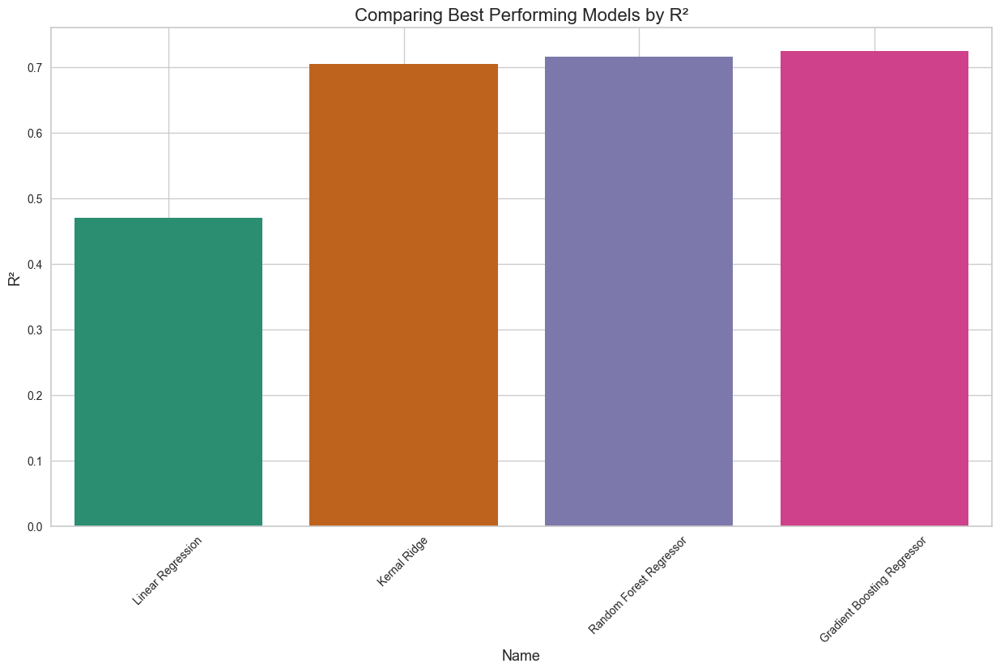

In [68]:
plt.figure(figsize=(15, 8))
sns.barplot(data = results_df, x = results_df['Model'], y = results_df['CV Mean R²'], palette = "Dark2")
plt.xlabel('Name', fontsize=13)
plt.ylabel("R²", fontsize=13)
plt.xticks(rotation = 45)
plt.title( f"Comparing Best Performing Models by R²" , fontsize=16)
plt.grid(True)
plt.show()

# <span style="color:Tomato"> Second Iteration</span>

#  <span style="color:SeaGreen"> Comparing Best Baseline Results:</span>

In [483]:
regression_1 = {
    'Name': 'Regression_1',
    'Description': 'CBR Mean Dummies',
    'Model': 'CatBoost Regressor',
    'Data': 'Mean Dummies',
    'MAE': 1947043.4173,
    'MSE': 25487779312394.1172,
    'RMSE': 4980984.0121,
    'R²': 0.7556,
    'RMSLE': 1.0709,
    'MAPE': 1.6762
}

regression_2 = {
    'Name': 'Regression_2',
    'Description': 'CBR Mean Dummies MinMax',
    'Model': 'CatBoost Regressor',
    'Data': 'Mean Dummies MinMax',
    'MAE': 0.0108,
    'MSE': 0.0008,
    'RMSE': 0.0272,
    'R²': 0.7537,
    'RMSLE': 0.0222,
    'MAPE': 1.7792
}


regression_3 = {
    'Name': 'Regression_3',
    'Description': 'MLP Mean Dummies Robust',
    'Model': 'MLP Regressor',
    'Data': 'Mean Dummies Robust',
    'MAE': 1.0553,
    'MSE': 3.9519,
    'RMSE': 1.9809,
    'R²': 0.7509,
    'RMSLE': 0.4384,
    'MAPE': 3.5634
}

regression_4 = {
    'Name': 'Regression_4',
    'Description': 'CBR Median Dummies',
    'Model': 'CatBoost Regressor',
    'Data': 'Median Dummies',
    'MAE': 1845301.1427,
    'MSE': 24573869038069.1328,
    'RMSE': 4862826.0091,
    'R²': 0.7615,
    'RMSLE': 1.0372,
    'MAPE': 1.3316
}

regression_5 = {
    'Name': 'Regression_5',
    'Description': 'CBR Median Dummies MinMax',
    'Model': 'CatBoost Regressor',
    'Data': 'Median Dummies MinMax',
    'MAE': 0.0102,
    'MSE': 0.0007,
    'RMSE': 0.0266,
    'R²': 0.7747,
    'RMSLE': 0.0217,
    'MAPE': 1.4728
}

regression_6 = {
    'Name': 'Regression_6',
    'Description': 'CBR Median Dummies Robust',
    'Model': 'CatBoost Regressor',
    'Data': 'Median Dummies Robust',
    'MAE': 0.8471,
    'MSE': 5.5391,
    'RMSE': 2.3076,
    'R²': 0.7532,
    'RMSLE': 0.3228,
    'MAPE': 1.5700
}


regression_7 = {
    'Name': 'Regression_7',
    'Description': 'DR Median Categorical',
    'Model': 'Dummy Regressor',
    'Data': 'Median Categorical',
    'MAE': 4948029.5000,
    'MSE': 103005373123788.7969,
    'RMSE': 10042817.4000,
    'R²': 0.0024,
    'RMSLE': 2.2266,
    'MAPE': 11.9565
}

regression_8 = {
    'Name': 'Regression_8',
    'Description': 'CBR KNN Dummies',
    'Model': 'CatBoost Regressor',
    'Data': 'KNN Dummies',
    'MAE': 1788835.7435,
    'MSE': 19125454527180.7852,
    'RMSE': 4349889.7465,
    'R²': 0.7632,
    'RMSLE': 1.0357,
    'MAPE': 1.5027
}

regression_9 = {
    'Name': 'Regression_9',
    'Description': 'CBR KNN Dummies MinMax',
    'Model': 'CatBoost Regressor',
    'Data': 'KNN Dummies MinMax',
    'MAE': 0.0099,
    'MSE': 0.0006,
    'RMSE': 0.0246,
    'R²': 0.7690,
    'RMSLE': 0.0206,
    'MAPE': 1.6802
}

regression_10 = {
    'Name': 'Regression_10',
    'Description': 'CBR KNN Dummies Robust',
    'Model': 'CatBoost Regressor',
    'Data': 'KNN Dummies Robust',
    'MAE': 0.6869,
    'MSE': 3.1894,
    'RMSE': 1.7723,
    'R²': 0.7505,
    'RMSLE': 0.3082,
    'MAPE': 2.0503
}

regression_11 = {
    'Name': 'Regression_11',
    'Description': 'DR KNN Categorical',
    'Model': 'Dummy Regressor',
    'Data': 'KNN Categorical',
    'MAE': 4708384.5500,
    'MSE': 91781080075468.7969,
    'RMSE': 9489741.5500,
    'R²': 0.0026,
    'RMSLE': 2.1962,
    'MAPE': 11.8951
}

# Create a DataFrame to display and compare the results
baseline_results_df = pd.DataFrame([regression_1, regression_2, regression_3, regression_4,
                                   regression_5, regression_6, regression_7, regression_8,
                                   regression_9, regression_10, regression_11])

# Display the results DataFrame
print(baseline_results_df)

             Name                Description               Model  \
0    Regression_1           CBR Mean Dummies  CatBoost Regressor   
1    Regression_2    CBR Mean Dummies MinMax  CatBoost Regressor   
2    Regression_3    MLP Mean Dummies Robust       MLP Regressor   
3    Regression_4         CBR Median Dummies  CatBoost Regressor   
4    Regression_5  CBR Median Dummies MinMax  CatBoost Regressor   
5    Regression_6  CBR Median Dummies Robust  CatBoost Regressor   
6    Regression_7      DR Median Categorical     Dummy Regressor   
7    Regression_8            CBR KNN Dummies  CatBoost Regressor   
8    Regression_9     CBR KNN Dummies MinMax  CatBoost Regressor   
9   Regression_10     CBR KNN Dummies Robust  CatBoost Regressor   
10  Regression_11         DR KNN Categorical     Dummy Regressor   

                     Data           MAE           MSE          RMSE      R²  \
0            Mean Dummies  1.947043e+06  2.548778e+13  4.980984e+06  0.7556   
1     Mean Dummies MinMax

In [484]:
baseline_results_df.head(11)

,Name,Description,Model,Data,MAE,MSE,RMSE,R²,RMSLE,MAPE
0,Regression_1,CBR Mean Dummies,CatBoost Regressor,Mean Dummies,1.947043e+06,2.548778e+13,4.980984e+06,0.7556,1.0709,1.6762
1,Regression_2,CBR Mean Dummies MinMax,CatBoost Regressor,Mean Dummies MinMax,1.080000e-02,8.000000e-04,2.720000e-02,0.7537,0.0222,1.7792
2,Regression_3,MLP Mean Dummies Robust,MLP Regressor,Mean Dummies Robust,1.055300e+00,3.951900e+00,1.980900e+00,0.7509,0.4384,3.5634
3,Regression_4,CBR Median Dummies,CatBoost Regressor,Median Dummies,1.845301e+06,2.457387e+13,4.862826e+06,0.7615,1.0372,1.3316
4,Regression_5,CBR Median Dummies MinMax,CatBoost Regressor,Median Dummies MinMax,1.020000e-02,7.000000e-04,2.660000e-02,0.7747,0.0217,1.4728
5,Regression_6,CBR Median Dummies Robust,CatBoost Regressor,Median Dummies Robust,8.471000e-01,5.539100e+00,2.307600e+00,0.7532,0.3228,1.5700
6,Regression_7,DR Median Categorical,Dummy Regressor,Median Categorical,4.948030e+06,1.030054e+14,1.004282e+07,0.0024,2.2266,11.9565
7,Regression_8,CBR KNN Dummies,CatBoost Regressor,KNN Dummies,1.788836e+06,1.912545e+13,4.349890e+06,0.7632,1.0357,1.5027
8,Regression_9,CBR KNN Dummies MinMax,CatBoost Regressor,KNN Dummies MinMax,9.900000e-03,6.000000e-04,2.460000e-02,0.7690,0.0206,1.6802
9,Regression_10,CBR KNN Dummies Robust,CatBoost Regressor,KNN Dummies Robust,6.869000e-01,3.189400e+00,1.772300e+00,0.7505,0.3082,2.0503


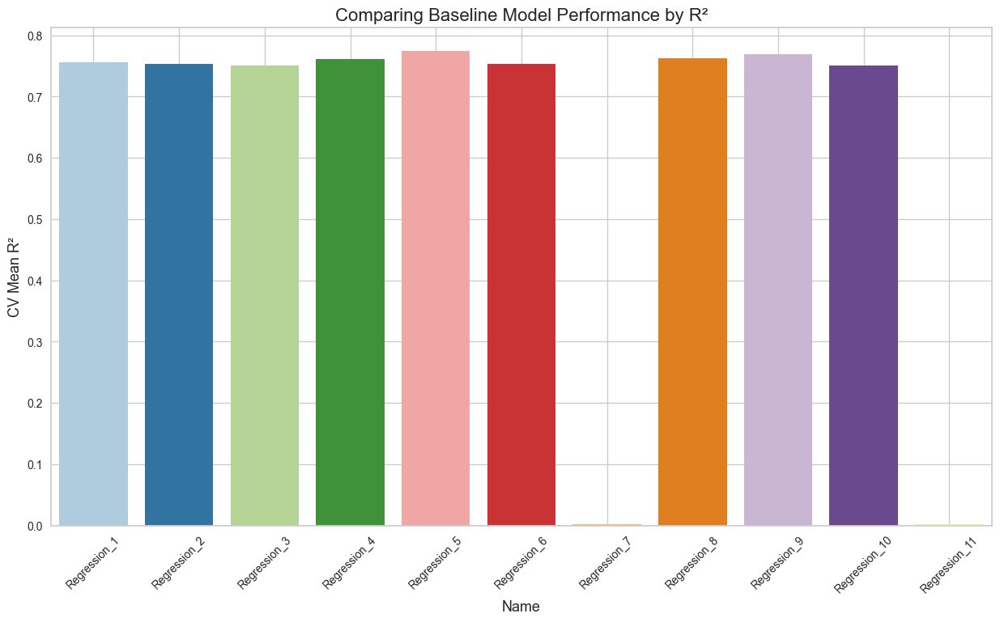

In [485]:
plt.figure(figsize=(15, 8))
sns.barplot(data = baseline_results_df, x = baseline_results_df['Name'], y = baseline_results_df['R²'], palette = "Paired")
plt.xlabel('Name', fontsize=13)
plt.ylabel("CV Mean R²", fontsize=13)
plt.xticks(rotation = 45)
plt.title( f"Comparing Baseline Model Performance by R²" , fontsize=16)
plt.grid(True)
plt.show()


In [486]:
# Sorting the DataFrame by R² score in descending order
baseline_results_df_sorted = baseline_results_df.sort_values(by='R²', ascending=False)

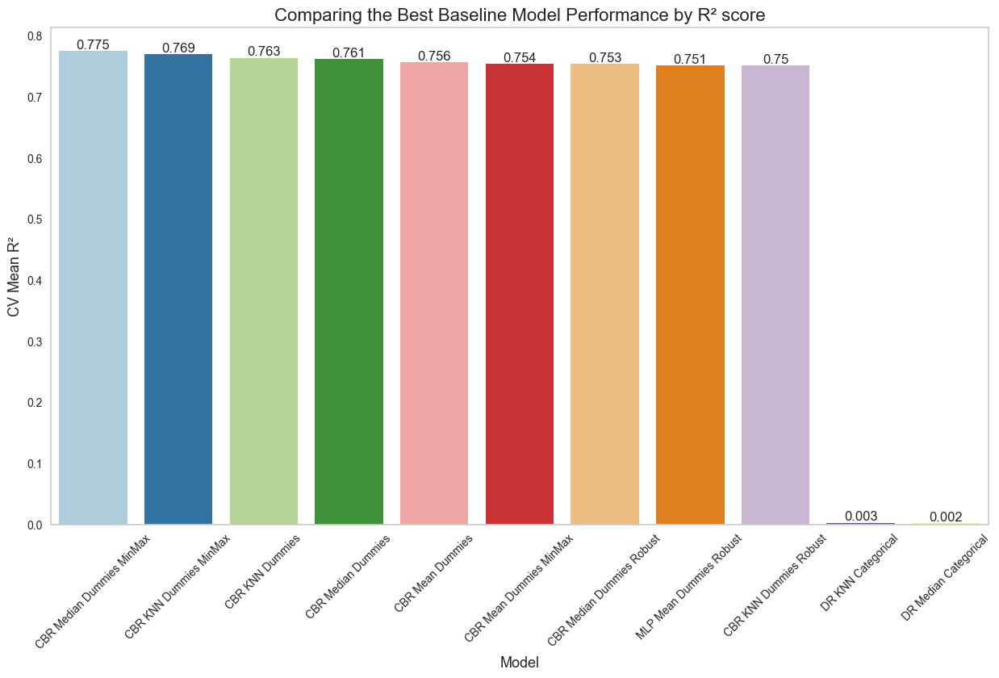

In [495]:
plt.figure(figsize=(15, 8))
sns.barplot(data = baseline_results_df_sorted, x = baseline_results_df_sorted['Description'], y = baseline_results_df_sorted['R²'], palette = "Paired")
plt.xlabel('Model', fontsize=13)
plt.ylabel("CV Mean R²", fontsize=13)
plt.xticks(rotation = 45)
plt.title( f"Comparing the Best Baseline Model Performance by R² score" , fontsize=16)
plt.grid(False)
for index, value in enumerate(baseline_results_df_sorted['R²']):
    plt.text(index, value, str(round(value, 3)), ha='center', va='bottom') 
plt.show()

#  <span style="color:SeaGreen"> Comparing Best Model Results:</span>

In [476]:
linear_regression_results2 = {
    'Name': 'Baseline Linear Regression',
    'Model': 'Linear Regression',
    'Data': 'Original Mean',
    'CV Mean R²': 0.4615535412127869,
    'CV STD': 0.04787988302732376,
    'CV MAE': 3742085.7849895684,
    'CV MSE': 48090316352442.16,
    'CV RMSE': 6934718.188393971,
    'R² training set score': 0.4873137482473662,
    'R² testing set score': 0.4975885582674616
}


kernal_ridge_results2 = {
    'Name': 'Best Kernal Ridge',
    'Model': 'Kernal Ridge',
    'Data': 'Mean Dummies Robust',
    'CV Mean R²': 0.7221912831991801,
    'CV STD': 0.02619049860596905,
    'CV MAE': 0.8154942850493397,
    'CV MSE': 2.324136967907849,
    'CV RMSE': 1.5245120425591427,
    'R² training set score': 0.8473025614061432,
    'R² testing set score': 0.7783620558966587
}

# Results for Random Forest Regressor
random_forest_results2 = {
    'Name': 'Best Random Forest',
    'Model': 'Random Forest Regressor',
    'Data': 'Mean Dummies MinMax',
    'CV Mean R²': 0.706436970096201,
    'CV STD': 0.042542052256675914,
    'CV MAE': 0.004005718793637898,
    'CV MSE': 0.00011658807550797291,
    'CV RMSE': 0.010938381947934409,
    'R² training set score': 0.9597334032950553,
    'R² testing set score': 0.7572457452441076
}

# Results for Gradient Boosting Regressor
gradient_boosting_results2 = {
    'Name': 'Best Gradient Booster ',
    'Model': 'Gradient Boosting Regressor',
    'Data': 'Mean Dummies Robust',
    'CV Mean R²': 0.7213522752382111,
    'CV STD': 0.04275804747295755,
    'CV MAE': 0.009480686845298566,
    'CV MSE': 0.0003596097118915298,
    'CV RMSE': 0.01896337817720065,
    'R² training set score': 0.8757998262101226,
    'R² testing set score': 0.8009598929061588
}

regression_13 = {
    'Name': 'Extra Trees Baseline',
    'Model': 'Extra Trees',
    'Data': 'Median Dummies',
    'CV Mean R²': 0.7402,
    'CV STD': 'Not tested',
    'CV MAE': 1828057.8146,
    'CV MSE': 26582672728110.0703,
    'CV RMSE': 5076258.9262,
    'R² training set score': 'Not tested',
    'R² testing set score': 'Not tested'
}

regression_14 = {
    'Name': 'MLP Baseline',
    'Model': 'Multi Layer Perceptron',
    'Data': 'Mean Dummies Robust',
    'CV Mean R²': 0.7509,
    'CV STD': 'Not tested',
    'CV MAE': 1.0553,
    'CV MSE': 3.9519,
    'CV RMSE': 1.9809,
    'R² training set score': 'Not tested',
    'R² testing set score': 'Not tested'
}


catboost_modelA_results = {
    'Name': 'catboost_modelA',
    'Model': 'CatBoost Regressor',
    'Data': 'Median Dummies MinMax',
    'CV Mean R²': 0.7739119669720322,
    'CV STD': 0.042546574015752014,
    'CV MAE': 0.004842886600796617,
    'CV MSE': 6.884512753015314e-05,
    'CV RMSE': 0.008297296398836982,
    'R² training set score': 0.8757998262101226,
    'R² testing set score': 0.8009598929061588
}

lgbmA_results = {
    'Name': 'lgbmA',
    'Model': 'LightGBM Regressor',
    'Data': 'Median Categorical',
    'CV Mean R²': 0.8232446030630571,
    'CV STD': 0.04584129655527847,
    'CV MAE': 746111.082089788,
    'CV MSE': 2350053016271.201,
    'CV RMSE': 1532988.2635790794,
    'R² training set score': 0.9765735212161047,
    'R² testing set score': 0.8074022147951684
}


lgbmA_log_results = {
    'Name': 'lgbmA_log',
    'Model': 'LightGBM Regressor',
    'Data': 'Median Categorical',
    'CV Mean R²': 0.8515800819778377,
    'CV STD': 0.04584129655527847,
    'CV MAE': 0.4794483270586686,
    'CV MSE': 0.40512015932591244,
    'CV RMSE': 0.6362757917035633,
    'R² training set score': 0.9485334244839155,
    'R² testing set score': 0.8215068071440828
}

catboost_median_results = {
    'Name': 'catboost_median',
    'Model': 'CatBoost Regressor',
    'Data': 'Median Categorical',
    'CV Mean R²': 0.7911845249444974,
    'CV STD': 0.05394956893581751,
    'CV MAE': 712295.2868571175,
    'CV MSE': 1599051449467.268,
    'CV RMSE': 1264536.0609596185,
    'R² training set score': 0.9840598724386485,
    'R² testing set score': 0.805297991992671
}


best_lgbmB_results = {
    'Name': 'best_lgbmB',
    'Model': 'LightGBM Regressor',
    'Data': 'KNN Categorical',
    'CV Mean R²': 0.8113712135194613,
    'CV STD': 'Not tested',
    'CV MAE': 1671173.1609023307,
    'CV MSE': 17493548196941.438,
    'CV RMSE': 4170306.536060942,
    'R² training set score': 0.9644065887584445,
    'R² testing set score': 0.8465109715951942
}


# Create a DataFrame to display and compare the results
best_model_results_df = pd.DataFrame([linear_regression_results2, kernal_ridge_results2, random_forest_results2, gradient_boosting_results2,
                                   catboost_modelA_results, lgbmA_results, lgbmA_log_results, catboost_median_results,
                                   best_lgbmB_results, regression_13, regression_14])



In [477]:
best_model_results_df.head(20)

,Name,Model,Data,CV Mean R²,CV STD,CV MAE,CV MSE,CV RMSE,R² training set score,R² testing set score
0,Baseline Linear Regression,Linear Regression,Original Mean,0.461554,0.04788,3.742086e+06,4.809032e+13,6.934718e+06,0.487314,0.497589
1,Best Kernal Ridge,Kernal Ridge,Mean Dummies Robust,0.722191,0.02619,8.154943e-01,2.324137e+00,1.524512e+00,0.847303,0.778362
2,Best Random Forest,Random Forest Regressor,Mean Dummies MinMax,0.706437,0.042542,4.005719e-03,1.165881e-04,1.093838e-02,0.959733,0.757246
3,Best Gradient Booster,Gradient Boosting Regressor,Mean Dummies Robust,0.721352,0.042758,9.480687e-03,3.596097e-04,1.896338e-02,0.8758,0.80096
4,catboost_modelA,CatBoost Regressor,Median Dummies MinMax,0.773912,0.042547,4.842887e-03,6.884513e-05,8.297296e-03,0.8758,0.80096
5,lgbmA,LightGBM Regressor,Median Categorical,0.823245,0.045841,7.461111e+05,2.350053e+12,1.532988e+06,0.976574,0.807402
6,lgbmA_log,LightGBM Regressor,Median Categorical,0.851580,0.045841,4.794483e-01,4.051202e-01,6.362758e-01,0.948533,0.821507
7,catboost_median,CatBoost Regressor,Median Categorical,0.791185,0.05395,7.122953e+05,1.599051e+12,1.264536e+06,0.98406,0.805298
8,best_lgbmB,LightGBM Regressor,KNN Categorical,0.811371,Not tested,1.671173e+06,1.749355e+13,4.170307e+06,0.964407,0.846511
9,Extra Trees Baseline,Extra Trees,Median Dummies,0.740200,Not tested,1.828058e+06,2.658267e+13,5.076259e+06,Not tested,Not tested


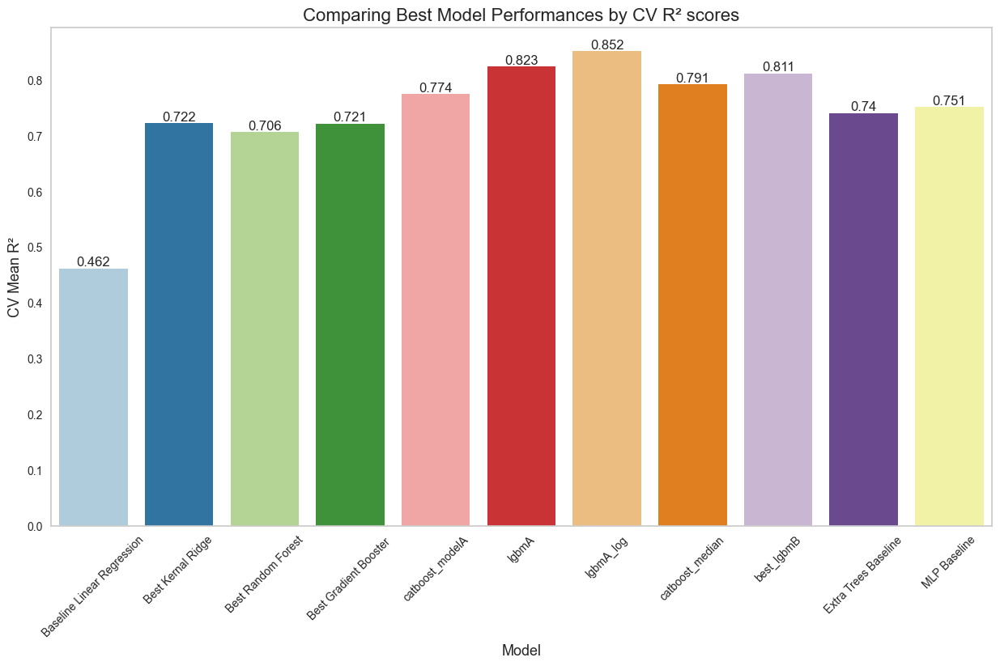

In [493]:
plt.figure(figsize=(15, 8))
sns.barplot(data=best_model_results_df, x=best_model_results_df['Name'], y=best_model_results_df['CV Mean R²'], palette="Paired")
plt.xlabel('Model', fontsize=13)
plt.ylabel("CV Mean R²", fontsize=13)
plt.xticks(rotation=45)
plt.title(f"Comparing Best Model Performances by CV R² scores", fontsize=16)
plt.grid(False)
for index, value in enumerate(best_model_results_df['CV Mean R²']):
    plt.text(index, value, str(round(value, 3)), ha='center', va='bottom') 
plt.show()

#  <span style="color:SeaGreen"> References:</span>

In [ ]:
Analytics Vidhya. (2020). KNNImputer | Way To Impute Missing Values. [online] 
Available at: https://www.analyticsvidhya.com/blog/2020/07/knnimputer-a-robust-way-to-impute-missing-values-using-scikit-learn/. 

Anwar, A. (2021). A Beginner’s Guide to Regression Analysis in Machine Learning. [online] Medium. 
Available at: https://towardsdatascience.com/a-beginners-guide-to-regression-analysis-in-machine-learning-8a828b491bbf. 
        
Brownlee, J. (2019a). A Gentle Introduction to Learning Curves for Diagnosing Machine Learning Model Performance. [online] Machine Learning Mastery. 
Available at: https://machinelearningmastery.com/learning-curves-for-diagnosing-machine-learning-model-performance/.         
        
Brownlee, J. (2019b). Overfitting and Underfitting With Machine Learning Algorithms. [online] Machine Learning Mastery. Available at: https://machinelearningmastery.com/overfitting-and-underfitting-with-machine-learning-algorithms/.         
        
Garza, J. (2024). Class Lecture: Cars Project. [online] accounts.google.com. Available at: https://drive.google.com/drive/folders/1JHFnYE0FJ-OAAJZIJbmH2uezZBjCERgC. 
                                    
Gitbook.io. (2023). PyCaret 3.0 | Docs. [online] 
Available at: https://pycaret.gitbook.io/docs.   
        
Gohar, U. (2020). How to use Residual Plots for regression model validation? [online] Medium. 
Available at: https://towardsdatascience.com/how-to-use-residual-plots-for-regression-model-validation-c3c70e8ab378#:~:text=Residuals.             
        
Kalyvas, V. (2024). Predicting Car Prices with Machine Learning (Step 1 — Analysis). [online] Medium. 
Available at: https://python.plainenglish.io/predicting-car-prices-with-machine-learning-step-1-the-analysis-76024196f92b  [Accessed 3 May 2024].
        
Marsja, E. (2020). How to use Square Root, log, & Box-Cox Transformation in Python. [online] Erik Marsja. 
Available at: https://www.marsja.se/transform-skewed-data-using-square-root-log-box-cox-methods-in-python/.

Matplotlib (2012). Matplotlib: Python plotting — Matplotlib 3.1.1 documentation. [online] Matplotlib.org. 
Available at: https://matplotlib.org/.        
        
Müller, A.C. and Guido, S. (2017). Introduction to machine learning with Python : a guide for data scientists. Beijing: O’reilly.        
        
OpenAi (2022). ChatGPT . [online] chatgpt.com. Available at: https://chatgpt.com.         
        
Scikit-learn.org. (2019). 1. Supervised learning — scikit-learn 0.21.3 documentation. [online] 
Available at: https://scikit-learn.org/stable/supervised_learning.html#supervised-learning.         

Technology, T. (2023). Light GBM Light and Powerful Gradient Boost Algorithm. [online] Medium. 
Available at: https://medium.com/@turkishtechnology/light-gbm-light-and-powerful-gradient-boost-algorithm-eaa1e804eca8.         
        
www.scikit-yb.org. (n.d.). Residuals Plot — Yellowbrick v1.5 documentation. [online] 
Available at: https://www.scikit-yb.org/en/latest/api/regressor/residuals.html#:~:text=The%20residuals%20plot%20shows%20the.         